In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from tensorflow import keras
from sklearn.tree import DecisionTreeRegressor
import tensorflow as tf
from tensorflow import keras
import joblib
import math
import random
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import warnings
warnings.filterwarnings('ignore')
import copy
import sklearn

In [2]:
class bcolors:
    HEADER = '\033[95m'
    OKBLUE = '\033[94m'
    OKCYAN = '\033[96m'
    OKGREEN = '\033[92m'
    WARNING = '\033[93m'
    FAIL = '\033[91m'
    ENDC = '\033[0m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'

In [3]:
plt.style.use("bmh")
plt.rcParams.update({"figure.figsize" : (12, 8),
                     "axes.facecolor" : "white",
                     "axes.edgecolor":  "black",
                    "axes.titlesize": "x-large",
                    "axes.labelsize": "x-large",
                    'xtick.labelsize':"x-large",
                     'ytick.labelsize':"x-large",
                    'legend.fontsize':"x-large"})

In [4]:
class df:
    def __init__(self, data, t):
        self.df = data.copy()
        self.rf = self.series_to_supervised(data.copy(),t,1).reset_index()
        self.scaler = StandardScaler()
        self.fit_scaler(self.rf)
        self.trans_rf = self.trans_scale(self.rf)
        self.diff_rf = self.rf.diff().fillna(method='bfill')
        self.opt_rf = self.rf.copy()
        self.opt_trans_rf = self.trans_rf.copy()

    def series_to_supervised(self,data, n_in=1, n_out=1, dropnan=True):
        n_vars = 1 if type(data) is list else data.shape[1]
        df = pd.DataFrame(data)
        cols, names = list(), list()
        # input sequence (t-n, ... t-1)
        for i in range(n_in, 0, -1):
            cols.append(df.shift(i))
            names += [('%s(t-%d)' % (df.columns[j],i)) for j in range(n_vars)]
        # forecast sequence (t, t+1, ... t+n)
        for i in range(0, n_out):
            cols.append(df.shift(-i))
            if i == 0:
                names += [('%s(t)' % (df.columns[j])) for j in range(n_vars)]
            else:
                names += [('%s(t+%d)' % (df.columns[j], i)) for j in range(n_vars)]
        # put it all together
        agg = pd.concat(cols, axis=1)
        agg.columns = names
        # drop rows with NaN values
        if dropnan:
            agg.dropna(inplace=True)
        return agg
    
    def fit_scaler(self, data):
        self.scaler.fit(data)
    
    def trans_scale(self, data):
        df = pd.DataFrame(self.scaler.transform(data.copy()), columns = data.columns)
        return df

In [5]:
data = pd.read_csv('DowDataset2018.csv', sep=',', date_parser=True)
data.info()
date = data.DATE
t = 2
data['DATE'] = pd.to_datetime(data['DATE'])
mask = (data['DATE'] > '2018-01-01') & (data['DATE'] <= '2018-12-31')
data = data.loc[mask]
data = data.copy().fillna(method='ffill').dropna()
#data = data.copy().drop(["DATE"], axis=1)
database = df(data.copy().drop(["DATE"], axis=1),t)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 23 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   DATE        365 non-null    object 
 1   Flow_to_EQ  312 non-null    float64
 2   Flow_efl    312 non-null    float64
 3   BT_C_MLSS   312 non-null    float64
 4   BT_C_MVLSS  312 non-null    float64
 5   BT_N_MLSS   312 non-null    float64
 6   BT_N_MVLSS  312 non-null    float64
 7   D_SS        312 non-null    float64
 8   EQ_N        312 non-null    float64
 9   BT_C_N      312 non-null    float64
 10  BT_N_N      312 non-null    float64
 11  D_N         312 non-null    float64
 12  OxT_PH_PM   312 non-null    float64
 13  EQ_PH       312 non-null    float64
 14  BT_N_PH     312 non-null    float64
 15  D_PH        312 non-null    float64
 16  BT_N_DO     312 non-null    float64
 17  BT_C_DO     312 non-null    float64
 18  Clari_DO    312 non-null    float64
 19  F/M         312 non-null    f

In [6]:
data.tail()

,DATE,Flow_to_EQ,Flow_efl,BT_C_MLSS,BT_C_MVLSS,BT_N_MLSS,BT_N_MVLSS,D_SS,EQ_N,BT_C_N,...,EQ_PH,BT_N_PH,D_PH,BT_N_DO,BT_C_DO,Clari_DO,F/M,ST_COD,EQ_COD,D_COD_ON
360,2018-12-27,188.0,305.0,6300.0,5400.0,6400.0,5700.0,127.0,110.1,47.94,...,11.9,7.52,7.78,0.29,6.19,0.46,0.02,894.0,349.0,112.0
361,2018-12-28,188.0,305.0,6300.0,5400.0,6400.0,5700.0,127.0,110.1,47.94,...,11.9,7.52,7.78,0.29,6.19,0.46,0.02,894.0,349.0,112.0
362,2018-12-29,188.0,305.0,6300.0,5400.0,6400.0,5700.0,127.0,110.1,47.94,...,11.9,7.52,7.78,0.29,6.19,0.46,0.02,894.0,349.0,112.0
363,2018-12-30,188.0,305.0,6300.0,5400.0,6400.0,5700.0,127.0,110.1,47.94,...,11.9,7.52,7.78,0.29,6.19,0.46,0.02,894.0,349.0,112.0
364,2018-12-31,188.0,305.0,6300.0,5400.0,6400.0,5700.0,127.0,110.1,47.94,...,11.9,7.52,7.78,0.29,6.19,0.46,0.02,894.0,349.0,112.0


In [7]:
new_COD = 1.0

class modelVariable:
    def __init__(self, option, data_rf):
        self.estimator = DecisionTreeRegressor(random_state = 0)
        self.option = option
        self.div = .8
        self.diff = .0
        if self.option == 1:
            self.model_name = 'EQ_COD2018_2.h5'
            self.V_manip = 'EQ_N'
            self.V_control = 'OxT_PH_PM'
            self.V_opt = 'EQ_COD'
            self.model_input = ['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']
            self.model = keras.models.load_model(self.model_name)
            self.model_input = self.inputs(self.model_input)
        elif self.option == 2:
            self.model_name = 'D_COD_ON2018_3.sav'
            self.V_manip = 'BT_C_MLSS'
            self.V_control = 'OxT_PH_PM'
            self.V_opt = 'D_COD_ON'
            self.model_input = ['D_SS(t)', 'BT_C_N(t)', 'EQ_N(t)', 'BT_C_DO(t)', 'ST_COD(t)', 'EQ_COD(t)', 'D_COD_ON(t)',]
            self.model = joblib.load(self.model_name)
            #self.model_input = self.inputs(self.model_input)
        elif self.option == 3:
            print('option3')
            self.model_name = 'BT_C_MVLSS2018_2.h5'
            self.V_manip = 'D_SS'
            self.V_control = 'Clari_DO'
            self.V_opt = 'BT_C_MVLSS'
            self.model_input = ['BT_C_MVLSS','D_SS','EQ_N', 'BT_C_N','OxT_PH_PM','BT_C_DO','Clari_DO','ST_COD','EQ_COD']
            self.model = keras.models.load_model(self.model_name)
            self.model_input = self.inputs(self.model_input)

        self.estimator_input = [self.V_manip+'(t-2)',self.V_control+'(t-2)',self.V_manip+'(t-1)',self.V_control+'(t-1)',self.V_control+'(t)']
        self.estimator_input_toFit = [self.V_manip+'(t-2)',self.V_control+'(t-2)',self.V_manip+'(t-1)',self.V_control+'(t-1)',self.V_manip+'(t)',self.V_control+'(t)']
        self.fit_flag = False
        self.piece = 0
        self.__fit_estimator(data_rf[self.estimator_input_toFit])
        self.__stast(data_rf)
        self.graph()

    def __fit_estimator(self, data):
        self.Y = data[self.V_manip+'(t)'].copy()
        self.X = data.copy().drop([self.V_manip+'(t)'], axis=1)
        self.piece = math.floor(len(self.X)*0.8)
        self.estimator.fit(self.X[:self.piece], self.Y[:self.piece])
        self.fit_flag = True
        
    def __stast(self, data):
        self.V_opt_mean= data[self.V_opt+'(t)'][:math.floor(self.div*len(data))].mean()
        self.V_opt_std = data[self.V_opt+'(t)'][:math.floor(self.div*len(data))].std()
        self.V_manip_mean = data[self.V_manip+'(t)'][:math.floor(self.div*len(data))].mean()
        self.V_manip_std = data[self.V_manip+'(t)'][:math.floor(self.div*len(data))].std()
        self.V_control_mean = data[self.V_control+'(t)'][:math.floor(self.div*len(data))].mean()
        self.V_control_std = data[self.V_control+'(t)'][:math.floor(self.div*len(data))].std()
    
    def mean_absolute_percentage_error(self, y_true, y_pred):
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    def graph(self):
        if self.fit_flag:
            y_test= self.Y[self.piece:]
            y_pred = self.estimator.predict(self.X[self.piece:])
            y_test.reset_index(drop=True, inplace=True)
            plt.figure(figsize=(15,5))
            plt.plot(y_test, label = 'Actual')
            plt.plot(y_pred, label = 'Estimated')
            plt.ylabel(self.V_manip)
            plt.xlabel('e_samples')
            plt.legend()
            plt.show()
            print ('MAPE: ',self.mean_absolute_percentage_error(self.Y[self.piece:], y_pred))
            print(self.Y[self.piece:])
        else:
            print('Fit estimator with method fit_estimator')
    
    def estimation(self, sample):
        if self.fit_flag:
            est = np.float(self.estimator.predict(np.array(sample[self.estimator_input]).reshape(1,5)))
            return est
        else:
            print('Fit estimator with method fit_estimator')
    
    def prediction(self, sample):
        if self.option==1:
            pred = np.float(self.model.predict(np.array(sample[self.model_input]).reshape(1,1,27)))
        elif self.option==2:
            pred = np.float(self.model.predict(np.array(sample[self.model_input]).reshape(1,1,7)[0]))        
        else:
            pred = np.float(self.model.predict(np.array(sample[self.model_input]).reshape(1,1,27)))
        return pred

    def inputs(self, model_input):
        names = []
        for i in range(t, -1, -1):
            if i>0:
                names += [('%s(t-%i)' % (model_input[j], i)) for j in range(len(model_input))]
            else:
                names += [('%s(t)' % (model_input[j])) for j in range(len(model_input))]
        return names

    def trans(self, sample):
        if self.option == 1 or self.option == 3:
            x= sample*self.V_opt_std+self.V_opt_mean
        else:
            x= sample*self.V_opt_std+self.V_opt_mean
        return x

    def fitness(self, setpoint, nor_sample, or_sample, control):
        global new_COD
        nor_sample[self.V_manip+'(t)'] = (self.estimation(or_sample[self.estimator_input][-1:]) - self.V_manip_mean)/self.V_manip_std
        or_sample[self.V_manip+'(t)'][-1:] = nor_sample[self.V_manip+'(t)']*self.V_manip_std+self.V_manip_mean
        for i in range(len(control)):
            or_sample[control[i][0]] = float(setpoint[i][0])
            nor_sample[control[i][0]] = (float(setpoint[i][0])-control[i][2][0])/control[i][2][1]
        if self.option == 1:
            Value_opt = self.prediction(nor_sample[self.model_input])
            new_COD = self.trans(Value_opt)
            return self.trans(Value_opt)
        elif self.option == 2:
            Value_opt = self.prediction(nor_sample[self.model_input])
            return self.trans(Value_opt)
        else:
            Value_opt = self.prediction(nor_sample[self.model_input])
            F = np.float(or_sample[['Flow_to_EQ(t)']].values[1])*np.float(new_COD)/1000.0
            M = 700.0*self.trans(Value_opt)/1000.0
            F_M = F/M
            return F_M

In [8]:
# Function to convert decimal to binary  
# upto k-precision after decimal point
precisi = 8
def decimalToBinary(num, k_prec=precisi): 
  
    binary = ""  
  
    # Fetch the integral part of 
    # decimal number  
    Integral = int(num)  
  
    # Fetch the fractional part  
    # decimal number  
    fractional = num - Integral 
  
    # Conversion of integral part to  
    # binary equivalent  
    while (Integral) : 
          
        rem = Integral % 2
  
        # Append 0 in binary  
        binary += str(rem);  
  
        Integral //= 2
      
    # Reverse string to get original 
    # binary equivalent  
    binary = binary[ : : -1]  
  
    # Append point before conversion  
    # of fractional part  
    binary += '.'
  
    # Conversion of fractional part 
    # to binary equivalent  
    while (k_prec) : 
          
        # Find next bit in fraction  
        fractional *= 2
        fract_bit = int(fractional)  
  
        if (fract_bit == 1) : 
              
            fractional -= fract_bit  
            binary += '1'
              
        else : 
            binary += '0'
  
        k_prec -= 1
  
    return binary

# Function to convert binary fractional  
# to decimal 
def binaryToDecimal(binary) :
    
    length = len(binary)
    # Fetch the radix point 
    point = binary.find('.')
 
    # Update point if not found 
    if (point == -1) :
        point = length 
 
    intDecimal = 0
    fracDecimal = 0
    twos = 1
 
    # Convert integral part of binary 
    # to decimal equivalent 
    for i in range(point-1, -1, -1) : 
         
        # Subtract '0' to convert 
        # character into integer 
        intDecimal += ((ord(binary[i]) -
                        ord('0')) * twos) 
        twos *= 2
 
    # Convert fractional part of binary 
    # to decimal equivalent 
    twos = 2
     
    for i in range(point + 1, length):
         
        fracDecimal += ((ord(binary[i]) -
                         ord('0')) / twos); 
        twos *= 2.0
 
    # Add both integral and fractional part 
    ans = intDecimal + fracDecimal
     
    return ans

def conversion(parray, genes, sol_per_pop):
    array = copy.deepcopy(parray)
    index = 0
    array = np.sum(array, axis=1)
    array = np.round(array,2)
    b_array = []
    for i in array:
        binary = decimalToBinary(i).replace('.','')
        test_binary = [int(j) for j in binary]
        if len(test_binary) < genes:
            hm = genes - len(test_binary)
            for rep in range(hm):
                test_binary.insert(index, 0)
        b_array.append(test_binary)
    b_array = np.array(b_array)
    return b_array

def conversion_d(parray):
    array = copy.deepcopy(parray)
    index = 0
    d_array = []
    bck = list(array)
    for i in bck:
        i.insert(3,'.')
        listToStr = ''.join([str(elem) for elem in i])
        decimal = binaryToDecimal(listToStr)
        decimal = round(decimal,2)
        d_array.append(decimal)
    d_array = np.array(d_array)
    return d_array

In [9]:
class desFunc:
  #Yt lower limit
  #Yu upper limit
  #Yi sample
  def __init__(self, yt, yu):
      self.yt = yt 
      self.yu = yu

  def dm(self,yi):
    yt = self.yt
    yu = self.yu
    if yi<yt:
        if yi<0:
            res = 0
        else:
            res = 1
    elif yi>=yt and yi<=yu:
      res = (yi-yu)/(yt-yu)
    elif yi>yu:
      res = 0
    return res

In [10]:
class composite:
    #Yt lower limit
    #Yu upper limit
    #Yi sample
    def __init__(self, weights):
        self.weights = weights

    def comp(self,res,des_F):
        out = 1
        for i in range(len(res)):
            out *= des_F[i].dm(res[i])**self.weights[i]
        out **= 1/len(res)
        return out

In [11]:
class GA:
    def __init__(self, opt, control):
        self.Nopt = opt
        self.control = control
        self.genes = 11
        self.sol_per_pop = 20
        self.ideal = .8
        self.max_num_generations = 100
        self.converg_r = 0.1
        self.parents_r = 0.2
        self.dti = math.ceil(self.converg_r*self.max_num_generations)
        self.pop_size = (self.sol_per_pop,self.genes)
        self.num_parents_mating = math.ceil(self.parents_r*(self.sol_per_pop))

    def create_population(self):
        setP = []
        for i in range(len(self.control)):
            real = np.random.randint(low=self.control[i][1][0], high=self.control[i][1][1], size=self.sol_per_pop)
            decimal = np.random.uniform(low=0.00, high=0.99, size=self.sol_per_pop)
            vector = np.dstack((real, decimal))
            setP.append(vector)
        setP = np.concatenate(setP)
        new_population = setP.reshape(len(self.control),self.sol_per_pop,2)
        new_population = np.round(new_population,2)
        binary_set = []
        for dset in new_population:
            dset.reshape(self.sol_per_pop,2)
            binary_set.append(conversion(dset, self.genes, self.sol_per_pop))
        return binary_set

    def calc_pop_fitness(self, models, setpoint, nor_sample, or_sample, control):
        models_c = models[:]
        fitness = list(map(lambda model: model.fitness(setpoint, nor_sample, or_sample, control), models_c))
        return fitness

    def select_mating_pool(self, pop, fitness):
    # Selecting the best individuals in the current generation as parents for producing the offspring of the next generation.
        num_parents = self.num_parents_mating
        #parents = np.empty((num_parents, pop.shape[1], pop.shape[2]))
        parents = []
        for parent_num in range(num_parents):

            max_fitness_idx = np.where(fitness == np.max(fitness))
            try:
              max_fitness_idx = int(max_fitness_idx[0])
            except:
              max_fitness_idx = int(max_fitness_idx[0][0])

            parents.append(pop[max_fitness_idx])

            fitness[max_fitness_idx] = -0.1
        #parents =  parents.astype(int)
        #np.random.shuffle(parents)
        print(f"{bcolors.OKGREEN}Parents {bcolors.ENDC}")
        print(parents)
        return parents

    def crossover(self,parents):
        offspring = copy.deepcopy(parents)
        # The point at which crossover takes place between two parents. Usually, it is at the center.
        crossover_point = int(np.array(parents).shape[1]/2)
        for k in range(0,np.array(parents).shape[0],2):
            parent1_idx = k
            parent2_idx = k+1
            offspring[parent1_idx][crossover_point] = parents[parent2_idx][crossover_point]
            offspring[parent2_idx][crossover_point] = parents[parent1_idx][crossover_point]
        print(f"{bcolors.BOLD}Offspring {bcolors.ENDC}")
        print(offspring)
        return offspring

    def mutation(self,offspring_crossover, control):
        # Mutation changes a single gene in each offspring randomly.
        genes = self.genes
        pop = copy.deepcopy(offspring_crossover)
        sz = np.array(pop).shape[0]
        random_v = random.sample(range(sz), round(sz*0.1))
        for idx in random_v:
            for point in range(len(control)):
                random_value = np.array(list(decimalToBinary(np.random.randint(low=math.ceil(control[point][1][0]), high=math.ceil(control[point][1][1]))).replace('.',''))).astype(int)
                if len(random_value)<genes:
                    hm = genes - len(random_value)
                    for rep in range(hm):
                        random_value = np.insert(random_value,0,0)
                random_value = random_value[:-8]
                random_value_0 = np.random.randint(low=0, high=1)
                random_value_1 = np.random.randint(low=0, high=1)
                random_value_2 = np.random.randint(low=0, high=1)
                pop[idx][point][:-8] = random_value
                pop[idx][point][np.random.randint(low=3, high=genes-1)] = random_value_0
                pop[idx][point][np.random.randint(low=3, high=genes-1)] = random_value_1
                pop[idx][point][np.random.randint(low=3, high=genes-1)] = random_value_2
        print(f"{bcolors.UNDERLINE}Mutation {bcolors.ENDC}")
        print('Mutated Chromosomes indexes', random_v)
        for idx in random_v:
            print(pop[idx])
        return pop

In [12]:
def org_func(vector):
  shape = np.array(vector).shape
  return [[list(vector[j][i]) for j in range(shape[0])] for i in range(shape[1])]

def ga_al(GA,control,nor_sample,or_sample,models,desf_funs,comp_Fun):
    list_fit = []
    itc = 0
    itpe = 0
    #Creating the initial population.
    new_population = GA.create_population()
    print(f"{bcolors.OKCYAN}Initial population {bcolors.ENDC}")
    print(new_population)
    b_set_points = org_func(new_population)
    last_set_points = copy.deepcopy(b_set_points[-2*GA.num_parents_mating:])
    b_set_points_c = copy.deepcopy(b_set_points)
    print(b_set_points_c)
    set_points = list(map(lambda x: [[float(conversion_d([sample]))] for sample in x], b_set_points_c))
    print('Decimal form')
    print(set_points)
    while itc<=GA.max_num_generations:
        itc += 1
        # Measuring the fitness of each chromosome in the population.
        set_points_c = copy.deepcopy(set_points)
        fitness = list(map(lambda set_point: GA.calc_pop_fitness(models,set_point,nor_sample,or_sample, control), set_points_c))
        fitness_c = copy.deepcopy(fitness)
        fitness = list(map(lambda x: comp_Fun.comp(x,desf_funs),fitness_c))
        print('Composite Fitness')
        print(fitness)
        print('Generation ',itc)
        parents = GA.select_mating_pool(b_set_points, fitness)
        parents_c = copy.deepcopy(parents)
        print(list(map(lambda x: [[float(conversion_d([sample]))] for sample in x], parents_c)))
        offspring_crossover = GA.crossover(parents)
        offspring_crossover_c = copy.deepcopy(offspring_crossover)
        print(list(map(lambda x: [[float(conversion_d([sample]))] for sample in x], offspring_crossover_c)))
        cross_population = parents + offspring_crossover + last_set_points
        cross_population_c = copy.deepcopy(cross_population)
        print(list(map(lambda x: [[float(conversion_d([sample]))] for sample in x], copy.deepcopy(cross_population_c))))
        offspring_mutation = GA.mutation(cross_population,control)
        offspring_mutation_c = copy.deepcopy(offspring_mutation)
        setpoints = list(map(lambda x: [[float(conversion_d([sample]))] for sample in x], offspring_mutation_c))
        print(set_points)
        b_set_points = copy.deepcopy(offspring_mutation)
        population = list(zip(set_points,b_set_points))
        print(f"{bcolors.OKCYAN}New population {bcolors.ENDC}")
        random.shuffle(population)
        set_points, b_set_points = zip(*population)
        print(set_points)
        print(b_set_points)
        set_points_c = copy.deepcopy(set_points)
        fitness = list(map(lambda set_point: GA.calc_pop_fitness(models,set_point,nor_sample,or_sample, control), set_points_c))
        fitness_c = copy.deepcopy(fitness)
        fitness = list(map(lambda x: comp_Fun.comp(x,desf_funs),fitness_c))
        best_match_idx = fitness.index(max(fitness))
        final = set_points[best_match_idx]
        fit_final = fitness[best_match_idx]
        score = 0
        for point in final:
          print(point)
          score += float(point[0])
        score **= 1/2
        if itc == 1:
          list_fit = [itc,fit_final,final,score]
        elif fit_final < list_fit[1] or (fit_final == list_fit[1] and score < list_fit[3]):
          list_fit = [itc,fit_final,final,score]
          if fit_final < list_fit[1]:
            itpe = 0
        else:
          itpe +=1

        if fit_final >= GA.ideal or itpe >= GA.dti or itc >= GA.max_num_generations:
          break
    print('Final generation : ', itc)
    sol = list_fit[2]
    print('Final setpoint : ', sol, ' in generation ', list_fit[0])
    return sol

In [13]:
def mean_std(data,name,div =.8):
    mean= data[name][:math.floor(div*len(data))].mean()
    std = data[name][:math.floor(div*len(data))].std()
    return [mean,std]

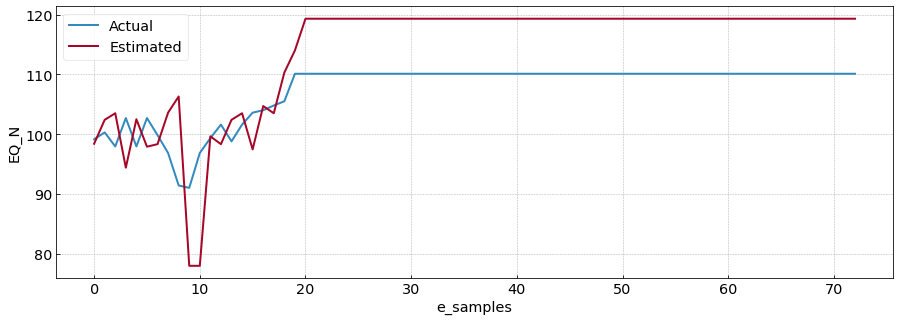

MAPE:  7.5651464962315895
289     99.14
290    100.30
291     97.95
292    102.70
293     97.95
        ...  
357    110.10
358    110.10
359    110.10
360    110.10
361    110.10
Name: EQ_N(t), Length: 73, dtype: float64


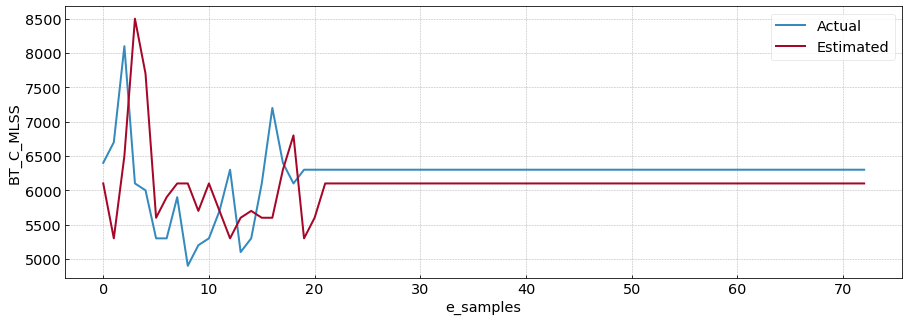

MAPE:  6.182584107709405
289    6400.0
290    6700.0
291    8100.0
292    6100.0
293    6000.0
        ...  
357    6300.0
358    6300.0
359    6300.0
360    6300.0
361    6300.0
Name: BT_C_MLSS(t), Length: 73, dtype: float64
option3


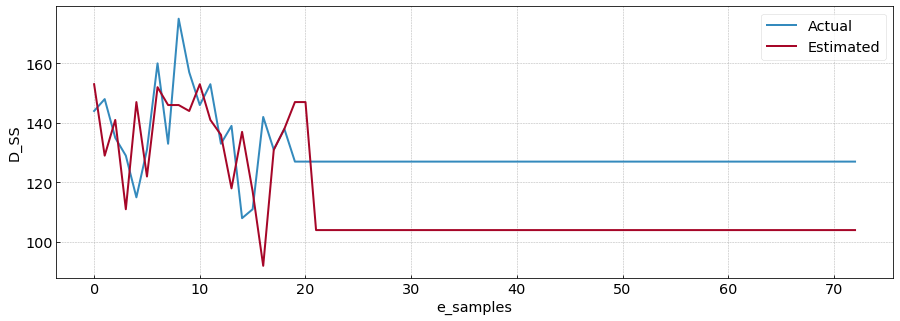

MAPE:  16.198716273239643
289    144.0
290    148.0
291    135.0
292    129.0
293    115.0
       ...  
357    127.0
358    127.0
359    127.0
360    127.0
361    127.0
Name: D_SS(t), Length: 73, dtype: float64


In [14]:
m_EQ_COD = modelVariable(1,database.rf)
m_D_COD = modelVariable(2,database.rf)
m_BT_C_MVLSS = modelVariable(3,database.rf)
var1 = "OxT_PH_PM(t)"
var2 = "Clari_DO(t)"
control = [[var1,[3.0,5.0],mean_std(database.df,var1[:-3])],[var2,[.7,3.0],mean_std(database.df,var2[:-3])]]
hwm = len(control)
desF_EQ_COD = desFunc(200.0,900.0)
desF_D_COD = desFunc(40.0,200.0)
desF_BT_C_MVLSS = desFunc(.0,.15)
comp_Fun = composite([1,2,1])
GA = GA(2,control)
models = [m_EQ_COD,m_D_COD,m_BT_C_MVLSS]
desf_funs = [desF_EQ_COD,desF_D_COD,desF_BT_C_MVLSS]

In [15]:
database.opt_rf.tail()

,index,Flow_to_EQ(t-2),Flow_efl(t-2),BT_C_MLSS(t-2),BT_C_MVLSS(t-2),BT_N_MLSS(t-2),BT_N_MVLSS(t-2),D_SS(t-2),EQ_N(t-2),BT_C_N(t-2),...,EQ_PH(t),BT_N_PH(t),D_PH(t),BT_N_DO(t),BT_C_DO(t),Clari_DO(t),F/M(t),ST_COD(t),EQ_COD(t),D_COD_ON(t)
357,360,188.0,305.0,6300.0,5400.0,6400.0,5700.0,127.0,110.1,47.94,...,11.9,7.52,7.78,0.29,6.19,0.46,0.02,894.0,349.0,112.0
358,361,188.0,305.0,6300.0,5400.0,6400.0,5700.0,127.0,110.1,47.94,...,11.9,7.52,7.78,0.29,6.19,0.46,0.02,894.0,349.0,112.0
359,362,188.0,305.0,6300.0,5400.0,6400.0,5700.0,127.0,110.1,47.94,...,11.9,7.52,7.78,0.29,6.19,0.46,0.02,894.0,349.0,112.0
360,363,188.0,305.0,6300.0,5400.0,6400.0,5700.0,127.0,110.1,47.94,...,11.9,7.52,7.78,0.29,6.19,0.46,0.02,894.0,349.0,112.0
361,364,188.0,305.0,6300.0,5400.0,6400.0,5700.0,127.0,110.1,47.94,...,11.9,7.52,7.78,0.29,6.19,0.46,0.02,894.0,349.0,112.0


In [16]:
fm_mean, fm_std = mean_std(database.df,'F/M')
start = 1
end = 450
df = database.rf[start:end]
for index, row in df.iterrows():
    print(f"{bcolors.WARNING}Día {bcolors.ENDC}", index+1)
    nor_sample = database.opt_trans_rf[index:index+1].copy()
    or_sample = database.opt_rf[index-1:index+1].copy()
    sol = ga_al(GA,control,nor_sample,or_sample,models,desf_funs,comp_Fun)

    for idx in range(len(sol)):
      database.opt_rf[control[idx][0]][index] = float(sol[idx][0])
      or_sample[control[idx][0]][-1:] = float(sol[idx][0])
      database.opt_trans_rf[control[idx][0]][index] = (float(sol[idx][0])-control[idx][2][0])/control[idx][2][1]
      nor_sample[control[idx][0]] = (float(sol[idx][0])-control[idx][2][0])/control[idx][2][1]

    for model in models:
      database.opt_trans_rf[model.V_manip+'(t)'][index] = (model.estimation(or_sample[model.estimator_input][-1:]) - model.V_manip_mean)/model.V_manip_std
      nor_sample[model.V_manip+'(t)'] = (model.estimation(or_sample[model.estimator_input][-1:]) - model.V_manip_mean)/model.V_manip_std
      database.opt_rf[model.V_manip+'(t)'][index] = nor_sample[model.V_manip+'(t)']*model.V_manip_std+model.V_manip_mean
      or_sample[model.V_manip+'(t)'][-1:] = nor_sample[model.V_manip+'(t)']*model.V_manip_std+model.V_manip_mean
        
    for model in models:
        if model.option == 1:
            Value_opt = model.prediction(nor_sample[model.model_input])
            new_COD = model.trans(Value_opt)
            ans = model.trans(Value_opt)
        elif model.option == 2:
            Value_opt = model.prediction(nor_sample[model.model_input])
            ans = model.trans(Value_opt)
        else:
            Value_opt = model.prediction(nor_sample[model.model_input])
            F = np.float(or_sample['Flow_to_EQ(t)'].values[1])*np.float(new_COD)/1000.0
            M = 700.0*model.trans(Value_opt)/1000.0
            ans = model.trans(Value_opt)
            F_M = F/M
            if index+1<len(database.opt_rf):
                database.opt_rf['F/M'+'(t-2)'][index+1] = float(or_sample['F/M'+'(t-1)'][-1:])
                database.opt_rf['F/M'+'(t-1)'][index+1] = float(or_sample['F/M'+'(t)'][-1:])
                database.opt_trans_rf['F/M'+'(t-2)'][index+1] = float(nor_sample['F/M'+'(t-1)'])
                database.opt_trans_rf['F/M'+'(t-1)'][index+1] = float(nor_sample['F/M'+'(t)'])
            or_sample['F/M'+'(t)'][-1:] = F_M
            nor_sample['F/M'+'(t)'] = (F_M - fm_mean)/fm_std

        #or_sample[model.V_opt+'(t)'][-1:] = ans
        #nor_sample[model.V_opt+'(t)'] = (ans - model.V_opt_mean)/model.V_opt_std

        if index+1<len(database.opt_rf):
            database.opt_rf[model.V_manip+'(t-2)'].iloc[index+1] = float(or_sample[model.V_manip+'(t-1)'][-1:])
            database.opt_rf[model.V_manip+'(t-1)'].iloc[index+1] = float(or_sample[model.V_manip+'(t)'][-1:])
            database.opt_rf[model.V_control+'(t-2)'].iloc[index+1] = float(or_sample[model.V_control+'(t-1)'][-1:])
            database.opt_rf[model.V_control+'(t-1)'].iloc[index+1] = float(or_sample[model.V_control+'(t)'][-1:])
            database.opt_rf[model.V_opt+'(t-2)'].iloc[index+1] = float(or_sample[model.V_opt+'(t-1)'][-1:])
            database.opt_rf[model.V_opt+'(t-1)'].iloc[index+1] = float(or_sample[model.V_opt+'(t)'][-1:])
            database.opt_rf[model.V_opt+'(t)'].iloc[index+1] = ans
            database.opt_trans_rf[model.V_manip+'(t-2)'].iloc[index+1] = float(nor_sample[model.V_manip+'(t-1)'])
            database.opt_trans_rf[model.V_manip+'(t-1)'].iloc[index+1] = float(nor_sample[model.V_manip+'(t)'])
            database.opt_trans_rf[model.V_control+'(t-2)'].iloc[index+1] = float(nor_sample[model.V_control+'(t-1)'])
            database.opt_trans_rf[model.V_control+'(t-1)'].iloc[index+1] = float(nor_sample[model.V_control+'(t)'])
            database.opt_trans_rf[model.V_opt+'(t-2)'].iloc[index+1] = float(nor_sample[model.V_opt+'(t-1)'])
            database.opt_trans_rf[model.V_opt+'(t-1)'].iloc[index+1] = float(nor_sample[model.V_opt+'(t)'])
            database.opt_trans_rf[model.V_opt+'(t)'].iloc[index+1] = (ans - model.V_opt_mean)/model.V_opt_std
        
    print('Loading ', index*100/len(df),'%')

Día  2
Initial population 
[array([[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]]), array([[0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1],
    

[4.59]
[1.47]
Composite Fitness
[0.740326878895557, 0.7280222695330595, 0.72625189163746, 0.7379199827099806, 0.7297274562667433, 0.7262366452598821, 0.7301158940094433, 0.7252618490269108, 0.7353635695397414, 0.7300889822564185, 0.7398278997249201, 0.7302355580698761, 0.7322796038486048, 0.7375432874086718, 0.7335408499097295, 0.7356743718374796]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]]]
[[[4.8], [1.6]], [[4.4], [1.96]], [[4.4], [1.96]], [[4.89], [1.89]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0

[4.57]
[1.31]
Composite Fitness
[0.7411059780795607, 0.7335014318339366, 0.72625189163746, 0.7379199827099806, 0.7316687771160328, 0.7280222695330595, 0.7262366452598821, 0.7411512202589032, 0.7375432874086718, 0.7349815072472162, 0.7335408499097295, 0.7322796038486048, 0.7233450859287385, 0.7252618490269108, 0.735970102203312, 0.7300889822564185]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.8], [1.6]], [[3.97], [1.64]], [[4.17], [1.08]], [[4.17], [1.96]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0,

[4.93]
[0.3]
Composite Fitness
[0.7446402705810431, 0.7349815072472162, 0.7282992457317771, 0.7322796038486048, 0.7300889822564185, 0.7379199827099806, 0.7353635695397414, 0.7233450859287385, 0.727632949694704, 0.7257127550881677, 0.7349607130370293, 0.7345063090064081, 0.7356743718374796, 0.7313867035607211, 0.7354546968179165, 0.7262366452598821]
Generation  9
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.36], [1.64]], [[4.17], [1.08]], [[4.17], [1.08]], [[4.41], [0.87]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], 

[4.59]
[1.47]
Composite Fitness
[0.7300889822564185, 0.7335014318339366, 0.7338938119859462, 0.7280222695330595, 0.7302355580698761, 0.7356743718374796, 0.7313751592320331, 0.7393727252685104, 0.7335408499097295, 0.7349815072472162, 0.7257127550881677, 0.7247071135855476, 0.7320185900486389, 0.7276610618980228, 0.7398278997249201, 0.7375432874086718]
Generation  12
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0]]]
[[[4.68], [1.39]], [[3.05], [2.78]], [[4.36], [0.16]], [[4.41], [2.78]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0

[4.41]
[2.65]
Composite Fitness
[0.71629197983579, 0.7145026045367544, 0.7077874271078547, 0.7088041878605034, 0.717010774158498, 0.7112478132979324, 0.7062955970956094, 0.7170803785614804, 0.7168678987750897, 0.7129204672653163, 0.7080075065307774, 0.7026728097603655, 0.7041739413378755, 0.7101658217443046, 0.712248809116796, 0.7060230546992466]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]]]
[[[4.27], [2.01]], [[4.37], [2.81]], [[4.37], [2.65]], [[4.41], [2.65]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0

[4.41]
[2.65]
Composite Fitness
[0.7168678987750897, 0.7062955970956094, 0.7129204672653163, 0.7170803785614804, 0.71629197983579, 0.7060230546992466, 0.7101658217443046, 0.7080075065307774, 0.712248809116796, 0.7077874271078547, 0.717010774158498, 0.7145026045367544, 0.7088041878605034, 0.7112478132979324, 0.7041739413378755, 0.7026728097603655]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0]]]
[[[4.16], [2.79]], [[3.38], [0.79]], [[3.36], [2.54]], [[4.41], [2.14]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0

[4.41]
[2.65]
Composite Fitness
[0.7077874271078547, 0.7060230546992466, 0.7168678987750897, 0.7101658217443046, 0.7080075065307774, 0.7041739413378755, 0.7129204672653163, 0.7112478132979324, 0.7026728097603655, 0.717010774158498, 0.7062955970956094, 0.7145026045367544, 0.7170803785614804, 0.712248809116796, 0.7088041878605034, 0.71629197983579]
Generation  8
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.95], [2.03]], [[4.16], [2.03]], [[4.07], [2.21]], [[3.38], [0.79]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0

[4.41]
[2.65]
Composite Fitness
[0.7062955970956094, 0.7026728097603655, 0.71629197983579, 0.7101658217443046, 0.7168678987750897, 0.7112478132979324, 0.7060230546992466, 0.7170803785614804, 0.7080075065307774, 0.7077874271078547, 0.712248809116796, 0.7129204672653163, 0.7041739413378755, 0.717010774158498, 0.7088041878605034, 0.7145026045367544]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.95], [1.23]], [[3.28], [2.63]], [[3.36], [2.54]], [[4.7], [0.91]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0

[4.92]
[2.63]
Composite Fitness
[0.718181948199147, 0.7209272236145075, 0.7208949448511665, 0.7180153112412488, 0.7210656145265928, 0.7182924828111612, 0.7186351242058222, 0.7158909002053218, 0.7170574565558929, 0.7222718225956132, 0.7187586984802605, 0.720714195200964, 0.7188928279407063, 0.7165786409081696, 0.7201290035597322, 0.7191135735043663]
Generation  2
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.5], [2.9]], [[4.35], [2.46]], [[4.92], [2.14]], [[4.7], [2.14]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0,

[4.92]
[2.63]
Composite Fitness
[0.7158909002053218, 0.7176990196161862, 0.7210656145265928, 0.7208949448511665, 0.7165786409081696, 0.720714195200964, 0.7188928279407063, 0.7201290035597322, 0.7187586984802605, 0.7191135735043663, 0.7182924828111612, 0.7180153112412488, 0.7209272236145075, 0.718181948199147, 0.7180348604553447, 0.7222718225956132]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]]]
[[[4.7], [2.14]], [[4.61], [2.44]], [[4.71], [0.51]], [[3.31], [1.17]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [

[4.92]
[2.63]
Composite Fitness
[0.7186351242058222, 0.7209272236145075, 0.7180153112412488, 0.7191135735043663, 0.7208949448511665, 0.7158909002053218, 0.7192008221835396, 0.7210656145265928, 0.7180348604553447, 0.7188928279407063, 0.718181948199147, 0.7182924828111612, 0.7222718225956132, 0.7187586984802605, 0.7165786409081696, 0.720714195200964]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.7], [2.14]], [[3.76], [2.14]], [[3.21], [1.01]], [[3.12], [1.16]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [

[4.92]
[2.63]
Composite Fitness
[0.7191135735043663, 0.7187586984802605, 0.7165786409081696, 0.7182924828111612, 0.720714195200964, 0.7186351242058222, 0.7222718225956132, 0.7158909002053218, 0.720360232172179, 0.7180153112412488, 0.718181948199147, 0.7209272236145075, 0.7208949448511665, 0.7188928279407063, 0.7201290035597322, 0.7180348604553447]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]]]
[[[3.76], [1.31]], [[4.69], [1.0]], [[4.64], [1.14]], [[4.03], [0.94]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [

Composite Fitness
[0.7400508801005691, 0.7344618874021801, 0.729919656052131, 0.7380476813156444, 0.7296167546053988, 0.7332814071951677, 0.7288257090328883, 0.7324542044392884, 0.7377968124211417, 0.7301800320846495, 0.7342432645786527, 0.7366333185342483, 0.7346201570060428, 0.7310473818575901, 0.733799963818325, 0.7341676570663968, 0.7381874125093627, 0.7352709888874923, 0.7339628813002548, 0.733620100865608]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.86], [2.7]], [[4.82], [2.69]], [[4.81], [2.63]], [[4.74], [2.58]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0

[4.81]
[2.63]
Composite Fitness
[0.7299152118942809, 0.7373564119111211, 0.7296167546053988, 0.7342432645786527, 0.7341676570663968, 0.7332814071951677, 0.7338459903167306, 0.7334028679267369, 0.7366333185342483, 0.729919656052131, 0.733799963818325, 0.7377968124211417, 0.7380476813156444, 0.7321154565393853, 0.7335124726128109, 0.7301800320846495]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]]]
[[[3.88], [0.59]], [[3.22], [2.19]], [[4.86], [2.19]], [[3.14], [2.19]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], 

[4.86]
[2.7]
Composite Fitness
[0.7346201570060428, 0.7324542044392884, 0.7301800320846495, 0.729919656052131, 0.7341676570663968, 0.7380476813156444, 0.7383061400221425, 0.733799963818325, 0.7299152118942809, 0.7285375137187224, 0.7342432645786527, 0.7344618874021801, 0.7332814071951677, 0.7368512225960562, 0.7321154565393853, 0.7366333185342483]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]]]
[[[3.13], [1.08]], [[3.88], [1.24]], [[4.82], [2.24]], [[4.82], [2.69]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [

[4.86]
[2.7]
Composite Fitness
[0.729919656052131, 0.7377968124211417, 0.7301800320846495, 0.7296167546053988, 0.7332814071951677, 0.7332297562539618, 0.733799963818325, 0.7299152118942809, 0.7331084224226622, 0.7321154565393853, 0.7383061400221425, 0.7346201570060428, 0.7324542044392884, 0.7366333185342483, 0.7344618874021801, 0.7380476813156444]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]]]
[[[3.57], [1.56]], [[4.63], [0.59]], [[3.23], [2.24]], [[4.96], [1.49]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], 

[4.86]
[2.7]
Final generation :  12
Final setpoint :  [[4.81], [2.63]]  in generation  3
Loading  1.10803324099723 %
Día  6
Initial population 
[array([[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1]]), array([[0, 0,

[3.47]
[2.55]
Composite Fitness
[0.7177899843271099, 0.7228387414901546, 0.7248023824242498, 0.7154985139446934, 0.7232534896938889, 0.7237558292876686, 0.7307705478989639, 0.7185956531044022, 0.7218292394940885, 0.7219620998507449, 0.7222725611214945, 0.7227874644197191, 0.7209866557629967, 0.7234348476087078, 0.7232634456047573, 0.7149719074567952]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]]]
[[[4.89], [2.63]], [[4.17], [1.68]], [[4.28], [1.08]], [[4.52], [1.68]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]

[3.15]
[2.17]
Composite Fitness
[0.7232679626095571, 0.7227874644197191, 0.7218292394940885, 0.7209866557629967, 0.7234348476087078, 0.7296350566257759, 0.7185956531044022, 0.7177899843271099, 0.7248023824242498, 0.7235615489290964, 0.7237558292876686, 0.7292206330263894, 0.7244190589879655, 0.7155996106573577, 0.7149719074567952, 0.7140959973784606]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]]]
[[[4.89], [2.07]], [[3.26], [1.57]], [[3.28], [1.58]], [[4.2], [1.18]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0],

[3.41]
[2.43]
Composite Fitness
[0.7222725611214945, 0.7185956531044022, 0.7237558292876686, 0.7304270846396106, 0.7135333043685954, 0.7140959973784606, 0.7244190589879655, 0.7234348476087078, 0.7232634456047573, 0.7191142238248394, 0.7248023824242498, 0.7223224031548864, 0.7215854293411323, 0.7231402128766359, 0.7219478306555954, 0.7219620998507449]
Generation  9
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.17], [2.31]], [[4.89], [1.07]], [[4.89], [2.63]], [[3.27], [1.38]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1]

[3.91]
[2.75]
Composite Fitness
[0.7222725611214945, 0.7227874644197191, 0.7135333043685954, 0.7219620998507449, 0.7155996106573577, 0.7199806113183653, 0.7218292394940885, 0.7177899843271099, 0.7228387414901546, 0.7246760447730535, 0.7311719599186726, 0.7249952220603155, 0.7220036714292875, 0.7244190589879655, 0.7209866557629967, 0.7219478306555954]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.75], [1.5]], [[3.28], [1.58]], [[3.34], [2.82]], [[3.27], [1.38]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1]

[4.75]
[2.63]
Composite Fitness
[0.7078802012622789, 0.7090225251702995, 0.7081466374210463, 0.7054433436787568, 0.7068261297392697, 0.708176082610447, 0.707750883608761, 0.7081788896995033, 0.7061808782092224, 0.7009934720684285, 0.7032850386617192, 0.7016620579277284, 0.7033815299140368, 0.7051739210236567, 0.7093662328845964, 0.7082492013681874]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.05], [2.5]], [[4.75], [2.63]], [[4.73], [2.63]], [[4.75], [2.5]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0

[4.75]
[2.63]
Composite Fitness
[0.7081466374210463, 0.706630971143839, 0.7088088500615666, 0.7076011970047997, 0.7093662328845964, 0.7072660818771168, 0.7051739210236567, 0.7033815299140368, 0.7032850386617192, 0.7081788896995033, 0.7073812133584375, 0.7009934720684285, 0.7068359559867684, 0.7069010927722997, 0.7003138641941242, 0.7090225251702995]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.5], [1.5]], [[3.94], [2.59]], [[4.05], [1.5]], [[4.05], [2.38]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0

[4.75]
[2.63]
Composite Fitness
[0.7051739210236567, 0.7068359559867684, 0.708215854188031, 0.7093662328845964, 0.7076011970047997, 0.7081788896995033, 0.699807700379834, 0.7032850386617192, 0.7072660818771168, 0.7088088500615666, 0.7081466374210463, 0.7021565961185812, 0.7016620579277284, 0.708176082610447, 0.706630971143839, 0.7082492013681874]
Generation  8
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]]]
[[[4.95], [0.84]], [[3.04], [2.25]], [[4.69], [0.68]], [[3.25], [2.25]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0

[4.46]
[2.97]
Composite Fitness
[0.7090225251702995, 0.7032850386617192, 0.7078802012622789, 0.7088088500615666, 0.7082492013681874, 0.7081788896995033, 0.7038760434840833, 0.7072660818771168, 0.7081466374210463, 0.7069010927722997, 0.7084546358643815, 0.7009934720684285, 0.7033815299140368, 0.7076011970047997, 0.7068359559867684, 0.7003138641941242]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]]]
[[[4.75], [2.63]], [[4.69], [1.62]], [[4.95], [0.84]], [[3.01], [1.62]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0

Composite Fitness
[0.6908063645423165, 0.687785956419403, 0.6875318904797614, 0.6882360836857983, 0.6801306717271048, 0.6836371438131039, 0.6860216842160084, 0.6837989328158874, 0.6784151533480817, 0.6880420356498932, 0.6856357823092363, 0.6837418879854742, 0.6894803812082146, 0.6815714805799542, 0.6836457923092579, 0.6858217619860908, 0.6869139127777424, 0.6847233751797811, 0.6850216166263781, 0.6878645535573397]
Generation  1
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.07], [1.69]], [[4.81], [2.34]], [[3.72], [2.39]], [[4.06], [2.05]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1

[4.81]
[2.34]
Composite Fitness
[0.6856357823092363, 0.685223195641051, 0.6860216842160084, 0.6856423177637428, 0.6875318904797614, 0.6880420356498932, 0.6837418879854742, 0.687785956419403, 0.6801306717271048, 0.6858217619860908, 0.6869908672412017, 0.6815714805799542, 0.6798166302213722, 0.6836371438131039, 0.6822148904772033, 0.6894803812082146]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.86], [2.2]], [[4.81], [2.34]], [[3.66], [2.06]], [[3.25], [2.63]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [

[4.81]
[2.34]
Composite Fitness
[0.6870391298029307, 0.6815714805799542, 0.6837418879854742, 0.6856357823092363, 0.6871558977642767, 0.6784151533480817, 0.6894803812082146, 0.6836371438131039, 0.6787243827076628, 0.687785956419403, 0.6858217619860908, 0.6869908672412017, 0.6875318904797614, 0.6880420356498932, 0.685223195641051, 0.6822148904772033]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[3.77], [2.38]], [[4.81], [2.34]], [[3.02], [2.07]], [[4.05], [1.11]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], 

[4.81]
[2.34]
Composite Fitness
[0.6836371438131039, 0.6856423177637428, 0.687785956419403, 0.6815714805799542, 0.6836457923092579, 0.6858217619860908, 0.6784151533480817, 0.6882360836857983, 0.6801306717271048, 0.6837418879854742, 0.6856357823092363, 0.6875318904797614, 0.6894803812082146, 0.685223195641051, 0.6860216842160084, 0.6866896197064444]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.02], [2.09]], [[4.81], [2.34]], [[4.05], [1.11]], [[4.06], [2.07]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],

[4.81]
[2.34]
Final generation :  12
Final setpoint :  [[3.72], [2.39]]  in generation  4
Loading  1.9390581717451523 %
Día  9
Initial population 
[array([[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1]]), array([[0,

[3.85]
[2.97]
Composite Fitness
[0.6219722392321683, 0.6209795326653764, 0.6134391677247283, 0.6166788148081448, 0.6232992819750324, 0.6202883987997024, 0.6105942512319785, 0.6179328953127862, 0.616566965771139, 0.6161642129308912, 0.6242643880472902, 0.6145327356355762, 0.6233451788939661, 0.6160716580091584, 0.6154011552121554, 0.6179376241660399]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.45], [1.07]], [[4.1], [2.97]], [[4.62], [1.21]], [[3.39], [0.38]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], 

[4.1]
[2.97]
Composite Fitness
[0.6145211160056254, 0.6242643880472902, 0.6233451788939661, 0.6179376241660399, 0.6202883987997024, 0.6129633168292523, 0.6121494720116497, 0.6209795326653764, 0.6150236969556923, 0.6219722392321683, 0.6150093005184378, 0.6154011552121554, 0.6179328953127862, 0.6161642129308912, 0.6246300482425927, 0.6166788148081448]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]]]
[[[3.14], [2.19]], [[4.62], [0.53]], [[3.39], [0.38]], [[3.39], [2.03]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],

[4.1]
[2.97]
Composite Fitness
[0.6145327356355762, 0.6179376241660399, 0.6209795326653764, 0.6164064592223628, 0.6166788148081448, 0.6105942512319785, 0.6246300482425927, 0.6150093005184378, 0.6161642129308912, 0.6242643880472902, 0.6160716580091584, 0.6154011552121554, 0.616566965771139, 0.6219722392321683, 0.6202883987997024, 0.6219159608060407]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.09], [0.41]], [[4.62], [0.53]], [[3.39], [0.38]], [[3.85], [2.97]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], 

[4.37]
[2.46]
Composite Fitness
[0.6154011552121554, 0.6179376241660399, 0.6166788148081448, 0.6150236969556923, 0.6219722392321683, 0.6145327356355762, 0.6209795326653764, 0.6229519714657867, 0.6121494720116497, 0.6179328953127862, 0.6202883987997024, 0.6232992819750324, 0.6150093005184378, 0.6160716580091584, 0.6161642129308912, 0.6233451788939661]
Generation  12
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.62], [2.22]], [[4.62], [0.53]], [[4.14], [2.22]], [[3.39], [0.38]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1

Composite Fitness
[0.5915805715740409, 0.5889455431735907, 0.5865542330090965, 0.5867531801728855, 0.5832640027058149, 0.5831390222053467, 0.5827403197987463, 0.585187271235279, 0.5866176845130429, 0.5843529128606024, 0.5874107377948873, 0.5893422178318747, 0.5855502965092152, 0.5876383350796343, 0.5882119568059649, 0.5892440843110066, 0.5844044385242518, 0.587187042051522, 0.5895549837009956, 0.5861386942242767]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.91], [1.33]], [[4.86], [2.77]], [[4.6], [2.62]], [[4.22], [2.63]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 

[4.6]
[2.62]
Composite Fitness
[0.5866176845130429, 0.585187271235279, 0.5855502965092152, 0.5817004918222646, 0.5874107377948873, 0.5843435197414494, 0.5865542330090965, 0.58739471461541, 0.5891066762684615, 0.5882119568059649, 0.5843529128606024, 0.5893422178318747, 0.5831390222053467, 0.5877282359047749, 0.5882484399762038, 0.5868675476135542]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.19], [2.5]], [[4.22], [2.63]], [[3.81], [0.66]], [[4.86], [2.77]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0,

[4.6]
[2.62]
Composite Fitness
[0.5877994331448109, 0.5882484399762038, 0.5866176845130429, 0.5832640027058149, 0.5865542330090965, 0.5827188903112324, 0.5843435197414494, 0.5889455431735907, 0.5874107377948873, 0.5882119568059649, 0.5891066762684615, 0.5868675476135542, 0.5892440843110066, 0.585187271235279, 0.5831390222053467, 0.584063777649986]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.19], [1.84]], [[3.19], [1.8]], [[4.22], [2.63]], [[4.09], [1.97]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0

[4.6]
[2.62]
Composite Fitness
[0.5831390222053467, 0.5817004918222646, 0.585187271235279, 0.5882484399762038, 0.5868675476135542, 0.5891066762684615, 0.5843435197414494, 0.5866176845130429, 0.5892440843110066, 0.5889455431735907, 0.5855502965092152, 0.5866933543531931, 0.5874107377948873, 0.5893422178318747, 0.5865542330090965, 0.5827188903112324]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[4.86], [2.77]], [[3.19], [1.53]], [[4.07], [1.0]], [[3.07], [1.0]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], [

Composite Fitness
[0.6450073133352662, 0.6106773407100543, 0.6127067059751159, 0.6130247492860023, 0.615095357078824, 0.6170111041358686, 0.6115684187907455, 0.6126837235744247, 0.6159052766878413, 0.6148445011804572, 0.6124103081714198, 0.612814637743285, 0.6152581687021327, 0.617265690272803, 0.6117008385028195, 0.6130990576457087, 0.613013456307454, 0.6170559996082622, 0.6155798379755983, 0.6142399991302968]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]]]
[[[4.99], [2.73]], [[3.48], [0.69]], [[3.91], [0.34]], [[3.25], [0.61]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0

[4.99]
[2.73]
Composite Fitness
[0.6205347210026659, 0.6106773407100543, 0.6157237206090054, 0.6127067059751159, 0.6126837235744247, 0.6159052766878413, 0.6144284613117086, 0.6125719987367868, 0.6117008385028195, 0.6124103081714198, 0.6170111041358686, 0.6130247492860023, 0.6130990576457087, 0.617265690272803, 0.6141258947364666, 0.612814637743285]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.91], [0.34]], [[4.17], [0.87]], [[3.64], [2.13]], [[4.01], [2.57]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], 

[4.99]
[2.73]
Composite Fitness
[0.6197153913647957, 0.6138357542146081, 0.6125719987367868, 0.6141258947364666, 0.6130990576457087, 0.6106773407100543, 0.6152581687021327, 0.6134403294371068, 0.612814637743285, 0.6159052766878413, 0.615847703441423, 0.6161640294729362, 0.6116526192596121, 0.6125442167119655, 0.6157237206090054, 0.6127067059751159]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.36], [1.17]], [[4.36], [1.17]], [[4.17], [0.87]], [[4.01], [2.57]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], 

[4.99]
[2.73]
Composite Fitness
[0.6127067059751159, 0.6104530618755235, 0.6125719987367868, 0.6126837235744247, 0.617265690272803, 0.6197153913647957, 0.6125442167119655, 0.615095357078824, 0.6138357542146081, 0.612814637743285, 0.6159052766878413, 0.6144284613117086, 0.6170111041358686, 0.6123893349329996, 0.6157237206090054, 0.6124103081714198]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[3.64], [2.13]], [[4.2], [0.7]], [[4.28], [1.32]], [[4.17], [0.87]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0

[4.99]
[2.73]
Final generation :  12
Final setpoint :  [[4.99], [2.73]]  in generation  2
Loading  2.770083102493075 %
Día  12
Initial population 
[array([[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0]]), array([[0,

[4.4]
[2.9]
Composite Fitness
[0.6365259433825564, 0.6389507566258874, 0.636929941168116, 0.6343630738157169, 0.6395153450133013, 0.6356051006884839, 0.6381365790080188, 0.6365903972913713, 0.633723384987118, 0.6354990283133327, 0.6412583902551747, 0.6376461402873644, 0.6390972807680324, 0.6395428071289317, 0.6359635656870358, 0.6359190167567293]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]]]
[[[4.25], [1.22]], [[3.07], [2.02]], [[4.27], [1.41]], [[4.75], [1.45]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0

[3.51]
[2.58]
Composite Fitness
[0.6344912064132125, 0.6369722161924661, 0.633723384987118, 0.6354990283133327, 0.6395428071289317, 0.6358655670297775, 0.6350425206013512, 0.6344431303732586, 0.6402571248709077, 0.6403956961539912, 0.6381365790080188, 0.6365903972913713, 0.6408139851275895, 0.6400040903200721, 0.636929941168116, 0.6361886895553216]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.9], [1.12]], [[3.32], [2.05]], [[4.25], [2.22]], [[4.72], [2.74]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [

[4.4]
[2.9]
Composite Fitness
[0.636929941168116, 0.6367311347525059, 0.6365903972913713, 0.6354990283133327, 0.6359190167567293, 0.6395428071289317, 0.6358655670297775, 0.6350425206013512, 0.6344912064132125, 0.6376461402873644, 0.6390972807680324, 0.6408139851275895, 0.6356051006884839, 0.6412583902551747, 0.633723384987118, 0.6402571248709077]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.86], [2.95]], [[3.18], [0.05]], [[4.72], [2.74]], [[4.72], [1.45]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0

[4.4]
[2.9]
Final generation :  11
Final setpoint :  [[4.18], [2.63]]  in generation  1
Loading  3.0470914127423825 %
Día  13
Initial population 
[array([[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]]), array([[0, 

[3.61]
[1.59]
Composite Fitness
[0.6728085746929858, 0.6760864949238766, 0.6763755161740331, 0.6751716365353327, 0.674928842491218, 0.6773706455221646, 0.6767977922298497, 0.676123197637398, 0.6778781044755284, 0.6738159493454461, 0.6764974717448557, 0.6752959967534178, 0.6759645871731609, 0.6755027658013926, 0.6769059865200854, 0.6745585978679717]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.59], [2.59]], [[4.82], [0.47]], [[3.71], [2.23]], [[3.16], [0.35]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], 

[3.61]
[1.59]
Composite Fitness
[0.6752959967534178, 0.676123197637398, 0.6769946403124047, 0.6761274411497866, 0.6764974717448557, 0.6728085746929858, 0.6755866333960704, 0.6757827241080813, 0.6738159493454461, 0.6778781044755284, 0.6773706455221646, 0.6763755161740331, 0.6748946772650862, 0.6765538678070814, 0.6745585978679717, 0.6755027658013926]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0]]]
[[[3.71], [0.35]], [[4.15], [1.17]], [[4.74], [0.44]], [[3.58], [1.2]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1], 

[3.61]
[1.59]
Composite Fitness
[0.6778781044755284, 0.6769946403124047, 0.6767977922298497, 0.6761274411497866, 0.6759624026512271, 0.6752959967534178, 0.6728085746929858, 0.6727360457118474, 0.6755027658013926, 0.6763755161740331, 0.6748946772650862, 0.6765538678070814, 0.6755866333960704, 0.6762180956641857, 0.6764974717448557, 0.676123197637398]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]]]
[[[3.58], [1.2]], [[3.81], [1.19]], [[4.24], [1.19]], [[4.15], [1.17]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], 

[4.14]
[2.26]
Composite Fitness
[0.6759645871731609, 0.6769946403124047, 0.6769059865200854, 0.6767679597255734, 0.6767977922298497, 0.6764974717448557, 0.6763755161740331, 0.6751008111136817, 0.6759624026512271, 0.6755027658013926, 0.6738159493454461, 0.6752959967534178, 0.6761274411497866, 0.6765538678070814, 0.6722437831947693, 0.6762180956641857]
Generation  12
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]]]
[[[4.63], [1.19]], [[4.63], [0.35]], [[4.15], [1.17]], [[4.78], [1.38]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1

[3.08]
[1.74]
Composite Fitness
[0.6642245049215328, 0.6628862156946315, 0.6663370612376959, 0.6614918574958459, 0.6671752515928611, 0.6628937605239276, 0.6660314076131706, 0.6652828986442543, 0.6674194312716795, 0.665710611906549, 0.6671705809352909, 0.6665799939098153, 0.666689993777139, 0.665182300662953, 0.6658497622998861, 0.665488114282529]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.93], [0.66]], [[4.91], [2.19]], [[3.65], [1.74]], [[4.44], [1.57]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0

[4.91]
[2.19]
Composite Fitness
[0.6639212139316303, 0.6668655851508557, 0.666689993777139, 0.6658423358467875, 0.6664758578409593, 0.6628937605239276, 0.6674194312716795, 0.6650543779214799, 0.6683625329234377, 0.6668836387751734, 0.664793047120431, 0.6614918574958459, 0.6642303069967226, 0.6665799939098153, 0.6642245049215328, 0.66438260481271]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.08], [1.69]], [[4.18], [1.53]], [[4.93], [0.66]], [[4.44], [1.57]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0

[4.91]
[2.19]
Composite Fitness
[0.6614918574958459, 0.6642245049215328, 0.665488114282529, 0.6683625329234377, 0.6628937605239276, 0.6664758578409593, 0.6642303069967226, 0.666689993777139, 0.6650543779214799, 0.6652828986442543, 0.6665799939098153, 0.6674194312716795, 0.66438260481271, 0.665710611906549, 0.6658423358467875, 0.6660314076131706]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.34], [1.59]], [[4.38], [1.57]], [[4.28], [1.57]], [[4.86], [0.16]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0,

[4.91]
[2.19]
Composite Fitness
[0.6628862156946315, 0.6665799939098153, 0.6664758578409593, 0.6628937605239276, 0.6614918574958459, 0.6642245049215328, 0.665488114282529, 0.6658497622998861, 0.6658423358467875, 0.6660314076131706, 0.6663370612376959, 0.666689993777139, 0.6661429636285756, 0.6639212139316303, 0.6683625329234377, 0.6668836387751734]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.78], [1.74]], [[3.08], [1.74]], [[3.71], [1.04]], [[3.08], [1.16]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],

[4.79]
[2.48]
Composite Fitness
[0.6649703225137898, 0.665167010259234, 0.6653419356133834, 0.6565126444474725, 0.6558071147783814, 0.6582462736600017, 0.665674102936504, 0.6606657990846677, 0.6617515839099816, 0.6633666872260783, 0.6596406542036718, 0.6602316805626279, 0.6677182940615229, 0.6671597157462191, 0.6640760833817207, 0.6646954369848982]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.83], [1.08]], [[4.36], [2.72]], [[4.79], [2.48]], [[4.01], [2.27]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], 

[4.79]
[2.48]
Composite Fitness
[0.6606657990846677, 0.6565126444474725, 0.6646954369848982, 0.6633666872260783, 0.6602316805626279, 0.660108853452716, 0.6677182940615229, 0.6671597157462191, 0.665167010259234, 0.6596406542036718, 0.665674102936504, 0.6640760833817207, 0.6649703225137898, 0.6558071147783814, 0.6635787090685398, 0.6617515839099816]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.36], [2.72]], [[4.79], [2.48]], [[4.95], [0.72]], [[4.35], [2.01]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [

[4.79]
[2.48]
Composite Fitness
[0.6653419356133834, 0.6596406542036718, 0.6606657990846677, 0.6602316805626279, 0.6677182940615229, 0.6617515839099816, 0.6640760833817207, 0.6565126444474725, 0.6646954369848982, 0.6649703225137898, 0.6671597157462191, 0.665674102936504, 0.660108853452716, 0.665167010259234, 0.6558071147783814, 0.6617448642925293]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.72], [2.39]], [[3.76], [2.13]], [[4.78], [0.53]], [[4.95], [2.22]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [

[4.79]
[2.48]
Composite Fitness
[0.666005955393569, 0.6602316805626279, 0.6596406542036718, 0.6646954369848982, 0.665674102936504, 0.6617515839099816, 0.6633666872260783, 0.6649703225137898, 0.6606657990846677, 0.6653419356133834, 0.660108853452716, 0.6671597157462191, 0.6565126444474725, 0.665167010259234, 0.6640760833817207, 0.6558071147783814]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.95], [0.72]], [[4.79], [0.72]], [[4.35], [2.01]], [[3.83], [1.08]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [

[4.88]
[2.2]
Composite Fitness
[0.6999600368072182, 0.6994108285797634, 0.6885708253200286, 0.6882260533409996, 0.691533061091914, 0.6913382426333359, 0.6880901700094747, 0.6912295307541013, 0.6888002961437488, 0.6962761961038654, 0.7000641610517755, 0.6904324630316441, 0.7022566720508059, 0.7052049642454764, 0.6890595148738888, 0.6947409096031699]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[4.88], [0.71]], [[4.46], [1.52]], [[3.41], [2.86]], [[3.3], [0.21]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [

[4.88]
[2.2]
Composite Fitness
[0.6912295307541013, 0.6999600368072182, 0.6962761961038654, 0.6880901700094747, 0.6904324630316441, 0.6913382426333359, 0.6888002961437488, 0.6890595148738888, 0.6947409096031699, 0.6885708253200286, 0.7052049642454764, 0.6882260533409996, 0.7022566720508059, 0.691533061091914, 0.7000641610517755, 0.6994108285797634]
Generation  5
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.25], [1.04]], [[4.72], [0.71]], [[4.13], [2.72]], [[4.27], [0.35]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], 

[4.88]
[2.2]
Composite Fitness
[0.6888002961437488, 0.6913382426333359, 0.6882260533409996, 0.6999600368072182, 0.6912295307541013, 0.7022566720508059, 0.7052049642454764, 0.6904324630316441, 0.6880901700094747, 0.7000641610517755, 0.6947409096031699, 0.6994108285797634, 0.6890595148738888, 0.6962761961038654, 0.691533061091914, 0.6885708253200286]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.18], [1.52]], [[3.88], [1.14]], [[4.27], [0.35]], [[4.14], [1.74]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], 

[4.88]
[2.2]
Composite Fitness
[0.6912295307541013, 0.6913382426333359, 0.6904324630316441, 0.7022566720508059, 0.6888002961437488, 0.691533061091914, 0.6962761961038654, 0.6890595148738888, 0.6994108285797634, 0.6882260533409996, 0.6999600368072182, 0.7000641610517755, 0.6885708253200286, 0.7052049642454764, 0.6880901700094747, 0.6947409096031699]
Generation  11
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.27], [2.29]], [[3.41], [1.74]], [[4.14], [1.74]], [[4.18], [1.52]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0],

[4.46]
[2.96]
Composite Fitness
[0.6950412791864954, 0.6899784425133323, 0.6948162023253325, 0.6924381773986666, 0.6876728463156945, 0.6964709663827013, 0.6942965289673841, 0.693875540713491, 0.6905590506024475, 0.6949985565385901, 0.6915192132157814, 0.6912434052736833, 0.691161588208046, 0.6932666513807482, 0.6989661728261096, 0.6928741153731777]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.25], [2.22]], [[4.6], [1.13]], [[3.54], [2.95]], [[3.08], [2.77]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [

[4.46]
[2.96]
Composite Fitness
[0.6942965289673841, 0.6863483585501046, 0.6953146780481717, 0.691161588208046, 0.6964709663827013, 0.6899784425133323, 0.6881901929731539, 0.6920111450090158, 0.6910058261858387, 0.6950412791864954, 0.6962732404793179, 0.6989661728261096, 0.694685817815978, 0.690073965731018, 0.6932666513807482, 0.696450175640549]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.07], [1.51]], [[4.73], [1.51]], [[4.39], [1.11]], [[4.39], [0.35]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0

[4.46]
[2.96]
Composite Fitness
[0.690073965731018, 0.6920111450090158, 0.6928435983529063, 0.6897856939475328, 0.6918345836716827, 0.6899784425133323, 0.6950326036526995, 0.6962732404793179, 0.6950412791864954, 0.6989661728261096, 0.6956919582388518, 0.696450175640549, 0.6876728463156945, 0.6924381773986666, 0.689582529493173, 0.6953146780481717]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]]]
[[[4.13], [1.54]], [[3.54], [2.95]], [[4.39], [0.35]], [[4.13], [0.68]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [

[4.46]
[2.96]
Composite Fitness
[0.6964709663827013, 0.689582529493173, 0.6899784425133323, 0.6928435983529063, 0.6905590506024475, 0.6910058261858387, 0.6950412791864954, 0.6989661728261096, 0.694685817815978, 0.6863483585501046, 0.6925728319032095, 0.696450175640549, 0.6953146780481717, 0.6948162023253325, 0.6915192132157814, 0.6932666513807482]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.54], [2.11]], [[4.13], [1.31]], [[4.13], [1.1]], [[4.39], [0.35]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [

[4.46]
[2.96]
Final generation :  13
Final setpoint :  [[4.46], [2.96]]  in generation  5
Loading  4.43213296398892 %
Día  18
Initial population 
[array([[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]]), array([[0, 

[4.17]
[2.8]
Composite Fitness
[0.6760499356288948, 0.6703571207530844, 0.6625528362818657, 0.6733609807051687, 0.6759438789320776, 0.6801523232365243, 0.6733167999425189, 0.6642426970370934, 0.6768780903450242, 0.674092488260932, 0.669131051693041, 0.6654813742591078, 0.6726492700763926, 0.6628614372958602, 0.6620213049938873, 0.6742519881499999]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]]]
[[[4.87], [2.61]], [[3.17], [2.61]], [[4.59], [2.76]], [[4.87], [0.89]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [

[3.64]
[2.05]
Composite Fitness
[0.6745113014329409, 0.679507000852924, 0.6641536908838811, 0.6733609807051687, 0.6739443980575723, 0.6620213049938873, 0.6768780903450242, 0.6726492700763926, 0.669131051693041, 0.6628614372958602, 0.6625528362818657, 0.6742519881499999, 0.6755907498228605, 0.6760499356288948, 0.6705701028104014, 0.6654813742591078]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.65], [2.53]], [[3.41], [2.29]], [[4.5], [2.36]], [[3.65], [2.53]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [

[4.17]
[2.8]
Composite Fitness
[0.6768780903450242, 0.6745113014329409, 0.6822413026249484, 0.6683658912981773, 0.6740759900330416, 0.6625528362818657, 0.6642426970370934, 0.6733167999425189, 0.6755907498228605, 0.669131051693041, 0.6733609807051687, 0.6641536908838811, 0.6654813742591078, 0.6724456016750809, 0.6742519881499999, 0.6628614372958602]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]]]
[[[3.41], [2.29]], [[3.09], [1.16]], [[4.87], [0.89]], [[3.09], [2.51]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], 

[3.64]
[2.05]
Final generation :  11
Final setpoint :  [[3.45], [2.75]]  in generation  1
Loading  4.7091412742382275 %
Día  19
Initial population 
[array([[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]]), array([[0

[3.95]
[2.97]
Composite Fitness
[0.5883881395815003, 0.5906022064390032, 0.59512572206021, 0.5905785007509272, 0.5858511918962374, 0.5912492476330298, 0.5961154774446245, 0.5868097678958674, 0.5861347715149311, 0.5906432132196016, 0.5930683504463296, 0.5882225674468515, 0.5868194323680753, 0.5922869985472111, 0.5906075194537275, 0.5945170810200862]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.69], [0.98]], [[3.69], [1.93]], [[3.2], [0.29]], [[3.0], [0.29]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0

[4.55]
[2.7]
Composite Fitness
[0.5906075194537275, 0.5841931554369205, 0.5865127035389743, 0.5961154774446245, 0.5929363302459374, 0.5961442561988471, 0.5922783113073842, 0.5867073760395107, 0.5922869985472111, 0.5906022064390032, 0.59512572206021, 0.5844616427734427, 0.5905785007509272, 0.5868097678958674, 0.5868194323680753, 0.5947172493091113]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.0], [0.29]], [[4.46], [2.39]], [[3.69], [0.98]], [[3.69], [2.75]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0

[3.95]
[2.97]
Composite Fitness
[0.5922426280127205, 0.5883881395815003, 0.5947172493091113, 0.5868097678958674, 0.59512572206021, 0.5889505531198066, 0.5841931554369205, 0.5850998569219701, 0.5861347715149311, 0.5945170810200862, 0.5882225674468515, 0.5929363302459374, 0.5961154774446245, 0.5906022064390032, 0.5922783113073842, 0.5906165468942595]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.56], [2.75]], [[4.55], [2.7]], [[3.12], [2.86]], [[3.0], [0.29]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0

[4.55]
[2.7]
Composite Fitness
[0.5961154774446245, 0.5922783113073842, 0.5841931554369205, 0.5912492476330298, 0.5922426280127205, 0.5868097678958674, 0.59512572206021, 0.5844616427734427, 0.5850998569219701, 0.5906022064390032, 0.5906075194537275, 0.5930683504463296, 0.5961442561988471, 0.5882225674468515, 0.5922869985472111, 0.5883881395815003]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.09], [1.93]], [[3.62], [2.8]], [[3.12], [2.86]], [[4.56], [2.8]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], [0

Composite Fitness
[0.6210388335068512, 0.6160243233634027, 0.619742312066177, 0.6223161980212322, 0.6150326481816147, 0.6139163652958782, 0.6227087519334729, 0.6188770983868891, 0.611055139681191, 0.617215541620761, 0.612637944331105, 0.610255591005058, 0.6155217133449198, 0.6166676867161723, 0.6187261895951119, 0.6164928218516469, 0.6192316210550364, 0.6167509303379873, 0.6206587399800719, 0.6129994718513526]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.65], [2.67]], [[4.6], [2.69]], [[3.28], [1.21]], [[4.4], [2.53]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1

[4.65]
[2.67]
Composite Fitness
[0.611055139681191, 0.6227087519334729, 0.619742312066177, 0.611330752404795, 0.6223161980212322, 0.6187261895951119, 0.610255591005058, 0.6166676867161723, 0.6164928218516469, 0.6160243233634027, 0.6188770983868891, 0.612637944331105, 0.617215541620761, 0.6139163652958782, 0.6155217133449198, 0.6150326481816147]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.47], [1.21]], [[4.09], [1.5]], [[4.39], [1.48]], [[3.01], [2.54]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0

[4.65]
[2.67]
Composite Fitness
[0.6187261895951119, 0.6188770983868891, 0.617215541620761, 0.6150326481816147, 0.612637944331105, 0.6166676867161723, 0.6155217133449198, 0.6160243233634027, 0.611330752404795, 0.611055139681191, 0.6164928218516469, 0.619742312066177, 0.6223161980212322, 0.6227087519334729, 0.610255591005058, 0.6139163652958782]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.09], [2.0]], [[4.4], [2.0]], [[4.26], [1.52]], [[4.4], [2.53]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1

[4.65]
[2.67]
Composite Fitness
[0.6160243233634027, 0.6223161980212322, 0.6187261895951119, 0.6150326481816147, 0.6227087519334729, 0.612637944331105, 0.611330752404795, 0.6164928218516469, 0.6139163652958782, 0.610255591005058, 0.6166676867161723, 0.619742312066177, 0.611055139681191, 0.617215541620761, 0.6188770983868891, 0.6155217133449198]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.01], [1.48]], [[4.03], [1.24]], [[4.19], [2.54]], [[4.47], [0.79]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0,

Composite Fitness
[0.6491695404637466, 0.6267538189499813, 0.6407146744782364, 0.6446592528628828, 0.646885435192089, 0.6334429910386236, 0.6327357993539409, 0.6407910497600188, 0.6419849246482405, 0.6415991304230644, 0.6266529974566876, 0.6453666987905877, 0.6300966288699257, 0.6388341563820025, 0.6276056828974756, 0.640392687074239, 0.628192413932835, 0.6404494670721852, 0.6493334656128007, 0.6426073581467867]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]]]
[[[4.72], [1.29]], [[3.17], [0.53]], [[4.56], [1.89]], [[4.64], [2.61]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 

[4.56]
[1.89]
Composite Fitness
[0.6327357993539409, 0.6419849246482405, 0.6415991304230644, 0.6453666987905877, 0.6407146744782364, 0.6407910497600188, 0.6300966288699257, 0.6463579347539471, 0.6266529974566876, 0.6334429910386236, 0.6338718959342833, 0.6394182460816935, 0.6409728061618638, 0.6267538189499813, 0.6269988648160334, 0.6446592528628828]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.01], [1.76]], [[3.0], [2.25]], [[4.0], [1.05]], [[3.06], [0.53]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], 

[4.56]
[1.89]
Composite Fitness
[0.6272598071291727, 0.6415991304230644, 0.6446592528628828, 0.646885435192089, 0.6407146744782364, 0.6269988648160334, 0.6453666987905877, 0.6407910497600188, 0.640392687074239, 0.6267538189499813, 0.6334429910386236, 0.6327357993539409, 0.6300966288699257, 0.6332580692229395, 0.6425387470384366, 0.6388341563820025]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.56], [0.6]], [[3.06], [1.12]], [[3.01], [1.75]], [[4.03], [1.75]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [

[4.56]
[1.89]
Composite Fitness
[0.6446592528628828, 0.6340680774037617, 0.6267538189499813, 0.6332580692229395, 0.6409728061618638, 0.6425387470384366, 0.6463579347539471, 0.6388341563820025, 0.6272598071291727, 0.6407146744782364, 0.6407910497600188, 0.6300966288699257, 0.6269988648160334, 0.6415991304230644, 0.6321204349505409, 0.6453666987905877]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[3.5], [2.32]], [[4.72], [1.29]], [[4.72], [1.29]], [[3.06], [1.12]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1]

[4.56]
[1.89]
Final generation :  12
Final setpoint :  [[4.56], [1.89]]  in generation  2
Loading  5.54016620498615 %
Día  22
Initial population 
[array([[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0]]), array([[0, 

[3.76]
[2.49]
Composite Fitness
[0.6482016728323952, 0.6409672911701948, 0.6460570564169268, 0.6425696521744149, 0.6448480450255055, 0.6464251276600324, 0.642379213029925, 0.6454548089128747, 0.6448971984362061, 0.6427985239287537, 0.6470871712199439, 0.6453730949857588, 0.6443187645136381, 0.6444783485045673, 0.6489067907509748, 0.6450533741990733]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]]]
[[[3.06], [2.41]], [[3.44], [0.81]], [[4.58], [1.5]], [[3.44], [2.6]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [

[3.76]
[2.49]
Composite Fitness
[0.6438059228189142, 0.642379213029925, 0.6409672911701948, 0.6448480450255055, 0.6460570564169268, 0.6425696521744149, 0.6454548089128747, 0.6454256938576984, 0.6464251276600324, 0.6453730949857588, 0.6416116469702201, 0.6450533741990733, 0.6470871712199439, 0.6444783485045673, 0.649219276288162, 0.6489067907509748]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.58], [1.5]], [[3.06], [2.41]], [[3.84], [1.75]], [[3.66], [2.41]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [

[3.76]
[2.49]
Composite Fitness
[0.6454256938576984, 0.6460570564169268, 0.6481447092050424, 0.6464251276600324, 0.6427985239287537, 0.641225809350699, 0.649219276288162, 0.6453730949857588, 0.6478977917193802, 0.6414207803966121, 0.6448971984362061, 0.6409672911701948, 0.6448480450255055, 0.6444783485045673, 0.6461963031425375, 0.644400844846991]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.85], [2.41]], [[3.5], [2.07]], [[3.84], [2.49]], [[4.48], [1.95]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0

[3.76]
[2.49]
Final generation :  11
Final setpoint :  [[3.06], [2.41]]  in generation  1
Loading  5.8171745152354575 %
Día  23
Initial population 
[array([[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]]), array([[0

[4.47]
[2.52]
Composite Fitness
[0.6317082527285061, 0.6335496440812685, 0.6344508713425133, 0.6327667268241914, 0.6364841189141347, 0.6349247847781385, 0.63159158176904, 0.6321427457065408, 0.6353614235938558, 0.6311139842931083, 0.6317754976442206, 0.6315568363237712, 0.6339667424937978, 0.6353759411219804, 0.6315717302084826, 0.6383829393845634]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.04], [2.57]], [[4.62], [2.07]], [[3.94], [0.46]], [[4.94], [2.52]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], 

[4.47]
[2.52]
Composite Fitness
[0.6298548203425511, 0.6315568363237712, 0.6339667424937978, 0.6381290419158566, 0.6353759411219804, 0.6327667268241914, 0.6293764536406621, 0.6349247847781385, 0.6321427457065408, 0.6360963166383875, 0.6317082527285061, 0.6383829393845634, 0.6317754976442206, 0.6333163931920451, 0.6337244098878181, 0.6335496440812685]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.36], [1.56]], [[4.94], [2.79]], [[3.61], [1.7]], [[3.04], [2.0]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], 

[4.47]
[2.52]
Composite Fitness
[0.6364841189141347, 0.6315717302084826, 0.6353614235938558, 0.6335496440812685, 0.6310272219411738, 0.6299688674960877, 0.6317754976442206, 0.6349247847781385, 0.6298649985937588, 0.6383829393845634, 0.6311139842931083, 0.6353759411219804, 0.6360963166383875, 0.6338706468705763, 0.6339667424937978, 0.6333163931920451]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]]]
[[[4.94], [2.79]], [[4.04], [2.57]], [[3.36], [1.41]], [[4.94], [1.28]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]

[4.47]
[2.52]
Final generation :  11
Final setpoint :  [[4.79], [1.8]]  in generation  1
Loading  6.094182825484765 %
Día  24
Initial population 
[array([[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1]]), array([[0, 

[4.75]
[1.13]
Composite Fitness
[0.6857303221562504, 0.6910110466679976, 0.6919340825997451, 0.6826260643272616, 0.6831522976661588, 0.6840208612192206, 0.6872504304859547, 0.6930072791098206, 0.6944876428468528, 0.6915546723657295, 0.6929493047340836, 0.6845887296134322, 0.6931418965303093, 0.6940450970103947, 0.69222329694836, 0.6824414784495699]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.4], [0.87]], [[3.97], [0.84]], [[4.48], [1.23]], [[3.97], [2.42]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [

[4.75]
[1.13]
Composite Fitness
[0.6824414784495699, 0.6944876428468528, 0.6931418965303093, 0.6915546723657295, 0.6826260643272616, 0.6857303221562504, 0.6919340825997451, 0.69222329694836, 0.6940450970103947, 0.6929493047340836, 0.6930072791098206, 0.6831522976661588, 0.6845887296134322, 0.6872504304859547, 0.6840208612192206, 0.6910110466679976]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1]]]
[[[3.4], [0.87]], [[3.97], [0.84]], [[3.08], [1.16]], [[4.91], [1.41]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [

[4.75]
[1.13]
Composite Fitness
[0.6930072791098206, 0.6940450970103947, 0.6910110466679976, 0.6845887296134322, 0.6944876428468528, 0.6915546723657295, 0.6857303221562504, 0.6840208612192206, 0.6824414784495699, 0.6919340825997451, 0.6872504304859547, 0.6831522976661588, 0.6929493047340836, 0.6826260643272616, 0.6931418965303093, 0.69222329694836]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.4], [0.14]], [[4.94], [0.14]], [[3.4], [1.16]], [[3.31], [2.73]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0

[4.75]
[1.13]
Final generation :  11
Final setpoint :  [[4.75], [1.13]]  in generation  1
Loading  6.371191135734072 %
Día  25
Initial population 
[array([[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]]), array([[0,

[3.78]
[0.01]
Composite Fitness
[0.6815221586494642, 0.6800458222544794, 0.6816425566175734, 0.6826111023551968, 0.6816116515380268, 0.6811166225652073, 0.6816750764380921, 0.6823539754963357, 0.6814854031562128, 0.6798734928036576, 0.6825053344460766, 0.682457273330226, 0.6819487349650248, 0.678452162579282, 0.683139336894516, 0.6766308187324634]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]]]
[[[4.34], [2.91]], [[4.68], [1.82]], [[4.86], [1.64]], [[4.34], [1.53]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [

[4.68]
[1.82]
Composite Fitness
[0.6826111023551968, 0.6811380309761146, 0.6803722473830184, 0.6829200329864084, 0.6816750764380921, 0.681238538230711, 0.678425229776503, 0.6797275759360305, 0.6838046738479984, 0.6749339961158424, 0.6834560104442123, 0.6813573887175794, 0.6823539754963357, 0.6746161006355758, 0.6801265852082202, 0.6894302313786752]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.1], [1.47]], [[4.34], [1.47]], [[3.08], [1.75]], [[4.86], [1.64]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [

[3.12]
[2.36]
Composite Fitness
[0.6816425566175734, 0.6746161006355758, 0.6829828784935595, 0.6823539754963357, 0.6811166225652073, 0.678452162579282, 0.6906239999092028, 0.6819487349650248, 0.681238538230711, 0.6825053344460766, 0.6798734928036576, 0.6816116515380268, 0.6826111023551968, 0.6733834250930157, 0.681802545593749, 0.6816750764380921]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.86], [1.47]], [[4.86], [1.83]], [[3.27], [1.83]], [[4.86], [1.47]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [

[3.15]
[1.4]
Composite Fitness
[0.682457273330226, 0.681005702078157, 0.6826111023551968, 0.6816116515380268, 0.6814854031562128, 0.6816425566175734, 0.6832403394228593, 0.6813573887175794, 0.6746161006355758, 0.6766308187324634, 0.6788580474403073, 0.6882944729666197, 0.6797275759360305, 0.681238538230711, 0.6825053344460766, 0.6816750764380921]
Generation  12
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.86], [2.51]], [[4.86], [1.64]], [[4.33], [2.16]], [[3.1], [1.47]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0

[4.91]
[2.46]
Composite Fitness
[0.6804891761309577, 0.6607254610146872, 0.6617111153276338, 0.6556537146182976, 0.6665821720783033, 0.6748585570498433, 0.6673901947720409, 0.6662002954357997, 0.659712070988849, 0.6678023635958544, 0.6616867403622122, 0.6738562204770456, 0.6658384472249201, 0.6737040799264059, 0.6583132136066543, 0.666165582051673]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.41], [0.77]], [[4.41], [2.54]], [[3.6], [2.88]], [[4.05], [1.64]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [

[4.91]
[2.46]
Composite Fitness
[0.6738562204770456, 0.6748585570498433, 0.6804891761309577, 0.6676828076026873, 0.6737040799264059, 0.6680799861362303, 0.6607254610146872, 0.6556537146182976, 0.6678023635958544, 0.659712070988849, 0.6657986770698343, 0.6632931605673326, 0.6645791513755989, 0.6583132136066543, 0.6642112972274794, 0.6616867403622122]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]]]
[[[3.21], [1.04]], [[4.05], [1.64]], [[3.22], [0.55]], [[3.38], [1.44]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],

[4.91]
[2.46]
Composite Fitness
[0.6804891761309577, 0.6632931605673326, 0.6665821720783033, 0.6662002954357997, 0.6616867403622122, 0.6738562204770456, 0.6583132136066543, 0.6678023635958544, 0.6676828076026873, 0.6737040799264059, 0.659712070988849, 0.6657986770698343, 0.6574969418042355, 0.658952743374294, 0.67343134429927, 0.6658384472249201]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.07], [2.79]], [[3.6], [2.88]], [[4.16], [1.5]], [[4.16], [2.79]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 

[4.91]
[2.46]
Composite Fitness
[0.6607254610146872, 0.6556537146182976, 0.6724050760854735, 0.6693470173194732, 0.6673901947720409, 0.659712070988849, 0.6645791513755989, 0.6583132136066543, 0.6617111153276338, 0.6642112972274794, 0.6748585570498433, 0.6804891761309577, 0.6676828076026873, 0.6616867403622122, 0.6680799861362303, 0.6737040799264059]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.07], [2.78]], [[3.22], [0.55]], [[3.6], [2.88]], [[3.21], [1.04]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],

Composite Fitness
[0.6774465853652971, 0.6648733839271964, 0.6606660322174159, 0.64852608771972, 0.6366517931529317, 0.6611291041573072, 0.6601518245284248, 0.6554936084788886, 0.6800097116606758, 0.6728201078240477, 0.6631721067821839, 0.6606381701875487, 0.6658204895072355, 0.6596057796514027, 0.6417190344626463, 0.6396367868074104, 0.6573356125316966, 0.6641209977940964, 0.6724087144073759, 0.6753567493334737]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.95], [2.66]], [[3.22], [2.71]], [[4.12], [2.47]], [[3.84], [2.02]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1,

[3.84]
[2.02]
Composite Fitness
[0.6396367868074104, 0.6652522146498425, 0.6708762535337932, 0.6611060214454885, 0.645480292783031, 0.6573362848685713, 0.6648733839271964, 0.6631721067821839, 0.6543636995184153, 0.6451204498191501, 0.6688776610342492, 0.6506431907145487, 0.6460717488005724, 0.663320551168135, 0.6728201078240477, 0.6606660322174159]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.84], [2.19]], [[4.21], [1.41]], [[3.84], [2.47]], [[4.5], [1.45]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [

[4.95]
[2.66]
Composite Fitness
[0.6432891541356683, 0.6652522146498425, 0.6630355245694177, 0.6582736749148211, 0.6748426339880602, 0.6817279455231819, 0.6601518245284248, 0.63850587503578, 0.6417190344626463, 0.6461588252464266, 0.6564076420128749, 0.6648733839271964, 0.6624744808509899, 0.6490145561447268, 0.6711042681734598, 0.6506431907145487]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.12], [2.47]], [[4.5], [2.69]], [[3.46], [2.69]], [[3.71], [2.47]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [

[4.95]
[2.66]
Composite Fitness
[0.6584195460219728, 0.6438944896337496, 0.6461588252464266, 0.6652522146498425, 0.6506431907145487, 0.656881650434208, 0.6538540165334108, 0.6478820023978241, 0.6491358895523112, 0.6417190344626463, 0.6520326935463293, 0.672555237469458, 0.6614782646032574, 0.6748426339880602, 0.6817279455231819, 0.6708762535337932]
Generation  10
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]]]
[[[4.5], [0.41]], [[3.71], [0.41]], [[3.71], [0.41]], [[3.71], [0.1]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [

[4.95]
[2.66]
Final generation :  12
Final setpoint :  [[3.84], [2.02]]  in generation  4
Loading  7.202216066481994 %
Día  28
Initial population 
[array([[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0]]), array([[0,

[3.69]
[1.76]
Composite Fitness
[0.6498270638106735, 0.6515455533163752, 0.6478314797417092, 0.65049752713881, 0.6444661722117829, 0.6482317209443872, 0.6503785307275002, 0.64614847370399, 0.6509366235103827, 0.6504496211995712, 0.6503501790274909, 0.6518273258060048, 0.6487601786313489, 0.649058911232429, 0.6446249684964555, 0.6463150788593129]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.69], [1.76]], [[4.33], [1.76]], [[3.0], [1.54]], [[3.51], [1.9]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0

[3.89]
[1.97]
Composite Fitness
[0.6518273258060048, 0.6463150788593129, 0.6503501790274909, 0.6487601786313489, 0.652320108900863, 0.6478314797417092, 0.6498270638106735, 0.6504496211995712, 0.6482317209443872, 0.6444661722117829, 0.6503785307275002, 0.649058911232429, 0.6502343827822658, 0.65049752713881, 0.64614847370399, 0.6446249684964555]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]]]
[[[3.81], [1.15]], [[4.84], [0.3]], [[3.51], [1.18]], [[4.33], [1.18]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [0, 0

[3.89]
[1.97]
Composite Fitness
[0.648934623142681, 0.6498270638106735, 0.6518273258060048, 0.6463150788593129, 0.6487601786313489, 0.64614847370399, 0.6490207655086838, 0.6478314797417092, 0.65049752713881, 0.6503785307275002, 0.6482317209443872, 0.652320108900863, 0.6515455533163752, 0.6462825730360321, 0.6444661722117829, 0.649058911232429]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]]]
[[[3.81], [0.3]], [[4.49], [0.95]], [[4.21], [1.16]], [[3.81], [0.49]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0,

[3.89]
[1.97]
Composite Fitness
[0.6482874781840778, 0.64614847370399, 0.6432218094134657, 0.6482317209443872, 0.6503785307275002, 0.6518273258060048, 0.6462825730360321, 0.652320108900863, 0.6515455533163752, 0.6503501790274909, 0.65049752713881, 0.6478314797417092, 0.6463150788593129, 0.6504496211995712, 0.6487601786313489, 0.649058911232429]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.81], [1.18]], [[3.69], [1.76]], [[3.69], [1.91]], [[4.49], [0.95]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0,

[4.95]
[2.76]
Composite Fitness
[0.6155315007221811, 0.6284772758753231, 0.6343289011165124, 0.6141024421997754, 0.6284063021508905, 0.6259241588881658, 0.6222824256750776, 0.6159577579108072, 0.6249074111880917, 0.6218008602258809, 0.6215915569124656, 0.6268655832359686, 0.6209115741261617, 0.6295317861049456, 0.625935997091573, 0.6302209775551236]
Generation  2
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.28], [2.09]], [[4.73], [1.97]], [[4.83], [1.8]], [[3.18], [2.76]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], 

[4.95]
[2.76]
Composite Fitness
[0.6300926432901177, 0.6343289011165124, 0.6209115741261617, 0.6302209775551236, 0.6259241588881658, 0.625935997091573, 0.6155315007221811, 0.6233204253620159, 0.6206191211424597, 0.6141024421997754, 0.6279187057962239, 0.6232483877540398, 0.6234064754460281, 0.6143263072933929, 0.6268655832359686, 0.630028457197426]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.95], [2.76]], [[4.12], [2.0]], [[4.73], [1.97]], [[3.18], [2.87]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [

[4.95]
[2.76]
Composite Fitness
[0.6249074111880917, 0.6138520637269388, 0.6327283674631113, 0.6159577579108072, 0.6300926432901177, 0.6259241588881658, 0.6222824256750776, 0.630028457197426, 0.6234064754460281, 0.6192464909466928, 0.6302209775551236, 0.6295317861049456, 0.6268655832359686, 0.625935997091573, 0.6141024421997754, 0.6215915569124656]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.24], [2.87]], [[3.18], [0.48]], [[3.18], [2.0]], [[3.17], [2.87]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [

[4.95]
[2.76]
Composite Fitness
[0.6279187057962239, 0.6249074111880917, 0.6215915569124656, 0.6209115741261617, 0.6234064754460281, 0.6252433846634072, 0.6141024421997754, 0.6243252973998275, 0.6300926432901177, 0.6222824256750776, 0.630028457197426, 0.625935997091573, 0.6343289011165124, 0.6302209775551236, 0.6159577579108072, 0.6155315007221811]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]]]
[[[4.73], [1.97]], [[3.18], [0.48]], [[3.21], [2.14]], [[4.95], [2.76]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],

Composite Fitness
[0.6480719559983192, 0.6566218549827132, 0.6597365488350159, 0.6538812005693361, 0.6579919230805034, 0.6576693947645279, 0.6547115315985915, 0.6526981191102356, 0.6556105731186778, 0.6555259194263265, 0.6509983434250892, 0.6592163126241523, 0.6525700851647577, 0.6590768671415016, 0.6528803601592327, 0.653402629864758, 0.659623260446855, 0.65364695131398, 0.656062842736459, 0.6527613723556911]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.12], [2.98]], [[3.7], [2.81]], [[4.33], [2.66]], [[4.29], [2.64]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 

[3.12]
[2.98]
Composite Fitness
[0.6522636001626906, 0.6556105731186778, 0.6590597296594901, 0.6551633867496865, 0.6555259194263265, 0.6520612715022439, 0.6612578302396369, 0.6516086461321885, 0.6526981191102356, 0.6590768671415016, 0.6579919230805034, 0.6514965160326165, 0.6592163126241523, 0.6566218549827132, 0.6511822088155824, 0.6547115315985915]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.7], [2.81]], [[3.37], [2.0]], [[4.05], [0.22]], [[3.76], [1.04]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], 

[3.12]
[2.98]
Composite Fitness
[0.6556105731186778, 0.653402629864758, 0.6547115315985915, 0.6551633867496865, 0.6566218549827132, 0.654083482779627, 0.6516086461321885, 0.6525700851647577, 0.6526981191102356, 0.6522636001626906, 0.6612578302396369, 0.6578759670871287, 0.6590597296594901, 0.6579919230805034, 0.6577366413679439, 0.6528803601592327]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.37], [2.0]], [[3.69], [1.04]], [[4.91], [2.51]], [[4.05], [0.22]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [

[3.12]
[2.98]
Composite Fitness
[0.6565139486678498, 0.6578759670871287, 0.6551633867496865, 0.6590597296594901, 0.6555259194263265, 0.651335654412035, 0.6556105731186778, 0.6590768671415016, 0.6547115315985915, 0.6528803601592327, 0.6529724982307844, 0.653402629864758, 0.6522636001626906, 0.6525700851647577, 0.6566218549827132, 0.6597365488350159]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.7], [1.29]], [[3.03], [2.01]], [[3.69], [2.01]], [[4.05], [0.22]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], 

[3.12]
[2.98]
Final generation :  12
Final setpoint :  [[3.12], [2.98]]  in generation  2
Loading  8.033240997229917 %
Día  31
Initial population 
[array([[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]]), array([[0,

[3.41]
[0.01]
Composite Fitness
[0.6544555475597513, 0.6558414016068222, 0.656513586338842, 0.6525174732735386, 0.6550322348275638, 0.6490101402663127, 0.6531048123369388, 0.654783388953246, 0.6532003612984142, 0.65164934041539, 0.6531515805610889, 0.6551637023568537, 0.6511987369886558, 0.6486172501348605, 0.6526220233766464, 0.6550557255584613]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.1], [1.31]], [[3.02], [2.01]], [[3.41], [0.98]], [[4.82], [1.31]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0,

[3.41]
[0.01]
Composite Fitness
[0.6531048123369388, 0.6558414016068222, 0.6511987369886558, 0.6486172501348605, 0.6503286731960382, 0.6545491189223913, 0.6551637023568537, 0.6503316722955237, 0.6531073467425136, 0.6564150769469204, 0.6519083719644672, 0.6538212773166054, 0.6533600322554584, 0.6526220233766464, 0.656513586338842, 0.6550557255584613]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.38], [1.57]], [[3.08], [0.04]], [[3.04], [1.14]], [[3.68], [0.37]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],

[3.41]
[0.01]
Composite Fitness
[0.65164934041539, 0.6513237339472218, 0.6511987369886558, 0.6531048123369388, 0.6545491189223913, 0.6558414016068222, 0.6473721421461213, 0.6503286731960382, 0.654783388953246, 0.658141003945173, 0.6550557255584613, 0.6532003612984142, 0.6538212773166054, 0.65383846396771, 0.6550322348275638, 0.6531073467425136]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.04], [1.14]], [[3.08], [2.25]], [[3.04], [2.55]], [[4.04], [1.01]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], [0, 

[4.35]
[0.7]
Composite Fitness
[0.6532003612984142, 0.6544555475597513, 0.65164934041539, 0.656513586338842, 0.6490101402663127, 0.654783388953246, 0.6558414016068222, 0.6550322348275638, 0.6473721421461213, 0.6565983650990359, 0.6551637023568537, 0.6525174732735386, 0.6513237339472218, 0.6511987369886558, 0.6545491189223913, 0.6531048123369388]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.43], [2.5]], [[3.04], [1.14]], [[4.43], [1.14]], [[4.64], [2.88]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0,

[4.82]
[2.02]
Composite Fitness
[0.5519244288903314, 0.551049785947209, 0.5641439838201819, 0.5634615556934883, 0.5558833337442841, 0.5675157381746572, 0.5526035028920057, 0.5560316767236301, 0.5609203587035458, 0.5520249057715193, 0.5578695944622767, 0.5625446695467208, 0.5538462779612611, 0.5643925203060904, 0.5624269634704503, 0.5665323002788472]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[3.19], [1.26]], [[3.58], [1.31]], [[4.73], [1.76]], [[4.73], [0.33]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],

[4.82]
[2.02]
Composite Fitness
[0.5560316767236301, 0.5519244288903314, 0.5526035028920057, 0.5643925203060904, 0.5520249057715193, 0.5609203587035458, 0.5665323002788472, 0.5624269634704503, 0.5558833337442841, 0.5634615556934883, 0.5625446695467208, 0.551049785947209, 0.5641439838201819, 0.5675157381746572, 0.5578695944622767, 0.5538462779612611]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.72], [1.98]], [[3.72], [1.98]], [[3.14], [2.36]], [[4.95], [2.84]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],

[4.82]
[2.02]
Composite Fitness
[0.551049785947209, 0.5634615556934883, 0.5665323002788472, 0.5526035028920057, 0.5520249057715193, 0.5519244288903314, 0.5578695944622767, 0.5643925203060904, 0.5675157381746572, 0.5558833337442841, 0.5625446695467208, 0.5609203587035458, 0.5560316767236301, 0.5538462779612611, 0.5624269634704503, 0.5641439838201819]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0]]]
[[[3.72], [1.98]], [[4.82], [1.31]], [[3.72], [0.19]], [[4.45], [1.84]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1],

[4.82]
[2.02]
Composite Fitness
[0.5538462779612611, 0.5641439838201819, 0.5634615556934883, 0.5609203587035458, 0.5520249057715193, 0.5560316767236301, 0.5624269634704503, 0.5665323002788472, 0.5675157381746572, 0.551049785947209, 0.5625446695467208, 0.5578695944622767, 0.5519244288903314, 0.5558833337442841, 0.5643925203060904, 0.5526035028920057]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]]]
[[[3.58], [1.31]], [[4.82], [2.02]], [[3.32], [1.06]], [[4.29], [0.68]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]

[3.47]
[2.8]
Composite Fitness
[0.590069796640857, 0.5377152903114512, 0.6043862704490165, 0.5783970726985921, 0.566759020089446, 0.5934492176339456, 0.580798036789323, 0.5712449095195771, 0.573324306480883, 0.5941909570173065, 0.5989983073127764, 0.6033994665066588, 0.6080207687937965, 0.6063513446105506, 0.6073975397048836, 0.6071330776294177]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.46], [0.87]], [[4.56], [2.93]], [[3.16], [1.3]], [[4.59], [1.29]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 

[3.79]
[2.76]
Composite Fitness
[0.5989983073127764, 0.6043862704490165, 0.585586563846014, 0.577632845032619, 0.6033994665066588, 0.6071228230997219, 0.5807272009206589, 0.5756906917269303, 0.5541044429321472, 0.6073975397048836, 0.5871670403594855, 0.5940230214879944, 0.580798036789323, 0.5940046177787056, 0.5783970726985921, 0.5929498636188821]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.51], [1.87]], [[4.69], [1.3]], [[4.05], [1.06]], [[4.69], [1.06]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0

[3.47]
[2.8]
Composite Fitness
[0.580798036789323, 0.5929498636188821, 0.6071330776294177, 0.585586563846014, 0.573324306480883, 0.565259957237022, 0.566759020089446, 0.5907873223753478, 0.6070772066707054, 0.590069796640857, 0.5449988074789807, 0.6080207687937965, 0.6033994665066588, 0.6073975397048836, 0.6071228230997219, 0.5914876189157015]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.51], [1.87]], [[4.59], [1.29]], [[4.46], [0.87]], [[4.5], [1.87]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0,

[3.47]
[2.8]
Composite Fitness
[0.5783970726985921, 0.5712449095195771, 0.5853712092171063, 0.6073975397048836, 0.5871670403594855, 0.5938245004814073, 0.6070772066707054, 0.6080207687937965, 0.590069796640857, 0.5551716381268085, 0.6071228230997219, 0.5914876189157015, 0.6043862704490165, 0.580798036789323, 0.566759020089446, 0.5891399045833963]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.54], [2.1]], [[3.54], [0.87]], [[4.69], [1.03]], [[3.54], [1.03]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0

Composite Fitness
[0.5722672368684906, 0.5730594706384324, 0.5578019589506924, 0.5606310315396364, 0.5650892850003878, 0.559841633683086, 0.5712858266672957, 0.5552910859446192, 0.5615690718928832, 0.5732022240122683, 0.5709373907443004, 0.5704794361656063, 0.5613732884497088, 0.5503990341468357, 0.5695579384327641, 0.5734746402117415, 0.5703988129916763, 0.5673797073490279, 0.5669138396740699, 0.5538595638534608]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[3.13], [2.86]], [[3.19], [2.88]], [[3.2], [1.33]], [[4.22], [1.46]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0,

[3.13]
[2.86]
Composite Fitness
[0.5730594706384324, 0.5588214463934408, 0.5712858266672957, 0.5734746402117415, 0.5640721949576355, 0.5732022240122683, 0.5595442856172247, 0.5721840612552184, 0.5704794361656063, 0.5683095014924106, 0.5552910859446192, 0.5588721447141641, 0.562387029234346, 0.5624506935939108, 0.5615690718928832, 0.5503990341468357]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.13], [2.86]], [[3.03], [1.72]], [[3.19], [0.79]], [[4.53], [1.4]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], 

[3.13]
[2.86]
Composite Fitness
[0.5730594706384324, 0.561342769740509, 0.5721840612552184, 0.5496564234619572, 0.5734746402117415, 0.5613732884497088, 0.5552910859446192, 0.5695579384327641, 0.5650892850003878, 0.5717274797506902, 0.5578019589506924, 0.559841633683086, 0.5712858266672957, 0.5732022240122683, 0.5595442856172247, 0.5615690718928832]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.03], [2.13]], [[4.53], [2.13]], [[4.89], [2.17]], [[3.7], [0.79]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [

[3.19]
[2.88]
Composite Fitness
[0.5717603259470415, 0.5683095014924106, 0.5650892850003878, 0.5732022240122683, 0.5700558937513712, 0.5588721447141641, 0.5552910859446192, 0.5624506935939108, 0.5615690718928832, 0.559841633683086, 0.5606310315396364, 0.5717274797506902, 0.5496564234619572, 0.562387029234346, 0.5721840612552184, 0.5721753098429003]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]]]
[[[3.03], [2.75]], [[3.03], [2.13]], [[3.35], [0.01]], [[4.89], [2.13]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],

[3.13]
[2.86]
Final generation :  12
Final setpoint :  [[3.19], [2.88]]  in generation  9
Loading  9.141274238227147 %
Día  35
Initial population 
[array([[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1]]), array([[0,

[4.78]
[2.26]
Composite Fitness
[0.5849253427228935, 0.5867836377856305, 0.5810229552332693, 0.5832859191021178, 0.5836807214729298, 0.5799253796400635, 0.5791015203345572, 0.5827051526828959, 0.5834053292384745, 0.586373654604909, 0.5789810999610322, 0.5842412631780456, 0.5856893609644751, 0.5826771499173974, 0.5789802289467647, 0.5815335917134606]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]]]
[[[4.63], [2.76]], [[4.63], [2.76]], [[3.63], [1.25]], [[3.45], [2.69]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],

[4.78]
[2.26]
Composite Fitness
[0.5791015203345572, 0.5811332893936713, 0.5856893609644751, 0.5810229552332693, 0.5789810999610322, 0.5849152589029761, 0.5867836377856305, 0.5789802289467647, 0.5834053292384745, 0.5863043326675516, 0.5836807214729298, 0.5832859191021178, 0.5799253796400635, 0.5841268961739902, 0.5815335917134606, 0.5842412631780456]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]]]
[[[4.32], [0.91]], [[3.63], [1.25]], [[3.21], [2.65]], [[3.45], [1.76]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1]

[4.78]
[2.26]
Composite Fitness
[0.5836807214729298, 0.586373654604909, 0.5863043326675516, 0.5834053292384745, 0.5791015203345572, 0.5842412631780456, 0.5867836377856305, 0.5810229552332693, 0.5789802289467647, 0.5856893609644751, 0.5832859191021178, 0.5789810999610322, 0.5800000430190891, 0.5782638854256371, 0.5841268961739902, 0.5826771499173974]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.78], [2.26]], [[4.78], [1.76]], [[4.78], [1.76]], [[4.7], [1.82]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], 

[4.78]
[2.26]
Final generation :  11
Final setpoint :  [[4.73], [2.13]]  in generation  1
Loading  9.418282548476455 %
Día  36
Initial population 
[array([[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]]), array([[0,

[4.8]
[2.11]
Composite Fitness
[0.537386582122331, 0.5266447268426199, 0.5245120369134526, 0.533938248957204, 0.535265273427922, 0.5214754718925632, 0.5281716884591546, 0.5273106991813028, 0.5315961251204775, 0.5365195763995483, 0.5298973628637329, 0.5376518586635968, 0.5280900544483568, 0.5351412215835251, 0.5385372641301823, 0.5294591306262222]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.55], [1.32]], [[4.47], [1.32]], [[4.05], [1.8]], [[3.25], [2.29]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0,

[4.8]
[2.11]
Composite Fitness
[0.5273106991813028, 0.5315961251204775, 0.5351412215835251, 0.5298973628637329, 0.5214754718925632, 0.5294591306262222, 0.5245120369134526, 0.5281716884591546, 0.5365195763995483, 0.5280900544483568, 0.5266447268426199, 0.535265273427922, 0.537386582122331, 0.5376518586635968, 0.5385372641301823, 0.533938248957204]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.88], [0.84]], [[4.71], [1.26]], [[4.22], [0.63]], [[3.81], [2.32]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0

[4.8]
[2.11]
Composite Fitness
[0.5245120369134526, 0.5214754718925632, 0.5376518586635968, 0.533938248957204, 0.5294591306262222, 0.537386582122331, 0.5266447268426199, 0.5281716884591546, 0.535265273427922, 0.5298973628637329, 0.5365195763995483, 0.5351412215835251, 0.5273106991813028, 0.5315961251204775, 0.5385372641301823, 0.5280900544483568]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]]]
[[[4.88], [0.84]], [[4.63], [2.07]], [[4.88], [1.26]], [[4.89], [1.26]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0

[4.8]
[2.11]
Final generation :  11
Final setpoint :  [[4.8], [2.11]]  in generation  1
Loading  9.695290858725762 %
Día  37
Initial population 
[array([[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]]), array([[0, 1

[3.11]
[1.47]
Composite Fitness
[0.5967774228628526, 0.5979397738701276, 0.5991927032270311, 0.5986790147897595, 0.5998653004254113, 0.596803870840241, 0.596847365458507, 0.5978071170908726, 0.594361375392584, 0.6003026034204536, 0.5950883796858153, 0.5995491503612884, 0.5974867795057507, 0.5994945710113507, 0.5966467199094059, 0.5997487501557303]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.71], [0.07]], [[3.06], [0.39]], [[4.47], [1.16]], [[4.47], [1.16]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [

[3.11]
[1.47]
Composite Fitness
[0.5979397738701276, 0.5991927032270311, 0.5950883796858153, 0.5983258598398877, 0.5978071170908726, 0.5978715750456933, 0.5994945710113507, 0.5962576376164928, 0.5995491503612884, 0.6003026034204536, 0.595531181930338, 0.5997487501557303, 0.5999914588393226, 0.5998653004254113, 0.5955399995193206, 0.594361375392584]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.84], [1.16]], [[4.61], [2.78]], [[4.84], [1.71]], [[4.61], [2.78]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], 

[3.11]
[1.47]
Composite Fitness
[0.5999914588393226, 0.5967774228628526, 0.5998653004254113, 0.5966467199094059, 0.596847365458507, 0.5991927032270311, 0.5964394690827041, 0.5974867795057507, 0.5983258598398877, 0.6003026034204536, 0.5983038429724313, 0.5995491503612884, 0.5994945710113507, 0.5964209102018898, 0.594361375392584, 0.5962383233886193]
Generation  9
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.19], [0.39]], [[4.61], [2.78]], [[3.95], [1.71]], [[4.47], [1.14]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], 

[3.11]
[1.47]
Composite Fitness
[0.5983618628803369, 0.5999914588393226, 0.6003026034204536, 0.5984136326173484, 0.5964394690827041, 0.594361375392584, 0.5991927032270311, 0.5966467199094059, 0.5967774228628526, 0.5997487501557303, 0.5962383233886193, 0.5978071170908726, 0.5974867795057507, 0.5983258598398877, 0.596847365458507, 0.5994945710113507]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]]]
[[[3.11], [1.47]], [[4.21], [1.07]], [[3.95], [0.73]], [[4.19], [2.08]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0],

[4.97]
[1.57]
Composite Fitness
[0.5488571673927714, 0.5554595273703002, 0.5787268685754908, 0.544684665034745, 0.5614423229754616, 0.5667302475173368, 0.5728959168892335, 0.5810028519719771, 0.5682332821163034, 0.5668321095444007, 0.5629923628182801, 0.5779737103264166, 0.5639070081549474, 0.5510562867324009, 0.5663507708107833, 0.5768380263540994]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.84], [2.2]], [[3.01], [0.03]], [[4.93], [0.13]], [[3.19], [0.13]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], 

[3.01]
[0.03]
Composite Fitness
[0.5810028519719771, 0.5667302475173368, 0.580642655585294, 0.5385563542607238, 0.5728959168892335, 0.5682332821163034, 0.5663507708107833, 0.5779737103264166, 0.5639070081549474, 0.546728553093369, 0.5768380263540994, 0.5421424337817996, 0.5670302002624658, 0.5705533878377894, 0.5554595273703002, 0.5724781331253598]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]]]
[[[3.19], [0.87]], [[4.97], [1.57]], [[4.84], [2.07]], [[3.5], [2.61]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [

[3.01]
[0.03]
Composite Fitness
[0.5768380263540994, 0.5484111673272742, 0.564683773688388, 0.540442722243234, 0.580642655585294, 0.5502261795527774, 0.5779737103264166, 0.5646809295079642, 0.5667302475173368, 0.5670302002624658, 0.5663507708107833, 0.5629923628182801, 0.5746341423860537, 0.5804092934556181, 0.5705533878377894, 0.5532256253250095]
Generation  8
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.84], [2.02]], [[4.19], [2.8]], [[3.19], [0.87]], [[4.97], [1.57]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0

[3.01]
[0.03]
Composite Fitness
[0.564683773688388, 0.546728553093369, 0.5667302475173368, 0.5746341423860537, 0.5703278327679608, 0.5468039452883289, 0.5728959168892335, 0.5614423229754616, 0.5779737103264166, 0.5724781331253598, 0.5768380263540994, 0.5586461904330327, 0.580642655585294, 0.5461005834579493, 0.5663507708107833, 0.5629923628182801]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.5], [2.61]], [[3.5], [2.78]], [[3.19], [0.87]], [[4.25], [1.77]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0

Composite Fitness
[0.6074549135489643, 0.6136429316548052, 0.6036635490957806, 0.6097825120266006, 0.6107226047742894, 0.6070370901951462, 0.6152528600526728, 0.6165005715581987, 0.6003421307290223, 0.6031992054001951, 0.6095772011656649, 0.6205149016108612, 0.5979094969938177, 0.612504131823696, 0.6109298526728141, 0.6162163436874633, 0.6214556743411398, 0.6137344326627266, 0.6155643467143856, 0.6139770222819877]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.6], [1.68]], [[4.4], [1.94]], [[3.86], [2.85]], [[4.06], [1.87]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 

[4.4]
[1.94]
Composite Fitness
[0.6031992054001951, 0.6036635490957806, 0.6097825120266006, 0.6107226047742894, 0.6205149016108612, 0.6109298526728141, 0.612504131823696, 0.6003421307290223, 0.5979094969938177, 0.6152528600526728, 0.6070370901951462, 0.6136429316548052, 0.6165005715581987, 0.6095772011656649, 0.6014177381762853, 0.6162163436874633]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.07], [2.17]], [[4.0], [1.89]], [[4.06], [0.1]], [[4.06], [1.87]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0

[4.4]
[1.94]
Composite Fitness
[0.6107226047742894, 0.612504131823696, 0.6097825120266006, 0.6095772011656649, 0.6152528600526728, 0.6205149016108612, 0.6070370901951462, 0.5979094969938177, 0.6003421307290223, 0.6031992054001951, 0.6165005715581987, 0.6036635490957806, 0.6162163436874633, 0.6136429316548052, 0.6014177381762853, 0.6109298526728141]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]]]
[[[4.06], [1.87]], [[3.5], [1.64]], [[4.35], [2.07]], [[4.6], [1.68]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0

[4.4]
[1.94]
Composite Fitness
[0.6031992054001951, 0.6070370901951462, 0.6003421307290223, 0.6205149016108612, 0.6109298526728141, 0.612504131823696, 0.6014177381762853, 0.6165005715581987, 0.6107226047742894, 0.6036635490957806, 0.6152528600526728, 0.6162163436874633, 0.6095772011656649, 0.5979094969938177, 0.6136429316548052, 0.6097825120266006]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.0], [1.89]], [[4.6], [1.68]], [[4.96], [0.13]], [[4.0], [2.64]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0

Composite Fitness
[0.6533713550091361, 0.6338322531072083, 0.6239737769091046, 0.6432327944926349, 0.6290155355140157, 0.6396416729748562, 0.6296858627048731, 0.6394525923279301, 0.6373800275316018, 0.6221013230097155, 0.6385353164687202, 0.6277164031406142, 0.6239401718133705, 0.6337997604704982, 0.6337779332667509, 0.6182132541706847, 0.6408419318974831, 0.6255643632884217, 0.6418968961740265, 0.6282803455395652]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.92], [1.04]], [[4.94], [1.43]], [[4.55], [1.43]], [[4.23], [1.82]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 

[4.94]
[1.43]
Composite Fitness
[0.6221013230097155, 0.6403476649286303, 0.6239401718133705, 0.6412031154569274, 0.6396416729748562, 0.6182132541706847, 0.6296858627048731, 0.6321483182950852, 0.6239737769091046, 0.6358478793159946, 0.6277164031406142, 0.6337997604704982, 0.6337779332667509, 0.6404055056693244, 0.645073269777356, 0.6290155355140157]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]]]
[[[4.93], [0.28]], [[3.54], [2.27]], [[4.55], [2.0]], [[4.55], [1.43]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], 

[4.94]
[1.43]
Composite Fitness
[0.6394525923279301, 0.6239737769091046, 0.6403476649286303, 0.6296858627048731, 0.6432327944926349, 0.6404055056693244, 0.6290155355140157, 0.6277164031406142, 0.6396416729748562, 0.6337779332667509, 0.6373800275316018, 0.6239401718133705, 0.6182132541706847, 0.6337997604704982, 0.6338322531072083, 0.6221013230097155]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.28], [0.0]], [[3.54], [2.27]], [[4.55], [1.43]], [[3.72], [0.82]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0],

[4.94]
[1.43]
Composite Fitness
[0.6221013230097155, 0.6258683757453213, 0.6338322531072083, 0.6337997604704982, 0.6396416729748562, 0.6290155355140157, 0.6182132541706847, 0.6404055056693244, 0.6239737769091046, 0.6432327944926349, 0.6373800275316018, 0.6239401718133705, 0.6296858627048731, 0.6394525923279301, 0.6422566536510956, 0.6337779332667509]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.28], [1.43]], [[4.03], [1.0]], [[3.53], [2.08]], [[3.76], [0.53]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0]

[4.94]
[1.43]
Final generation :  12
Final setpoint :  [[4.94], [1.43]]  in generation  6
Loading  10.803324099722992 %
Día  41
Initial population 
[array([[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]]), array([[0

[4.95]
[2.96]
Composite Fitness
[0.637447446360113, 0.6399828703502605, 0.6380437587096256, 0.6377447468635151, 0.6342868172526112, 0.6388564044357832, 0.6338557893845381, 0.6329542683948367, 0.6399279162840633, 0.6350439276010218, 0.6342868469656725, 0.6405573374917342, 0.6494748351854264, 0.6406323905394101, 0.6385846737231431, 0.6333926178808211]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.01], [0.05]], [[4.49], [1.58]], [[4.27], [0.01]], [[4.01], [2.91]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],

[4.95]
[2.96]
Composite Fitness
[0.6333926178808211, 0.6413560007614831, 0.6385846737231431, 0.633582158755057, 0.634974941858312, 0.6367425730215873, 0.6388564044357832, 0.6380437587096256, 0.6399828703502605, 0.6350439276010218, 0.6336562855834886, 0.6494748351854264, 0.6338557893845381, 0.6398608430299008, 0.6399279162840633, 0.6377447468635151]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]]]
[[[3.3], [2.5]], [[4.09], [2.76]], [[4.09], [2.91]], [[4.95], [2.96]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0

[4.95]
[2.96]
Composite Fitness
[0.6338557893845381, 0.6329542683948367, 0.6494748351854264, 0.6398608430299008, 0.6444927474210268, 0.6356775635328346, 0.6342868172526112, 0.6385846737231431, 0.6367425730215873, 0.6406323905394101, 0.6333926178808211, 0.6357562149659288, 0.6342868469656725, 0.6387563359121873, 0.6388564044357832, 0.6377447468635151]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0]]]
[[[3.64], [1.51]], [[3.23], [0.05]], [[4.49], [2.76]], [[4.38], [1.56]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]

[4.95]
[2.96]
Composite Fitness
[0.6399828703502605, 0.6380437587096256, 0.6329542683948367, 0.6378313812707139, 0.6405573374917342, 0.6428622363409607, 0.6406323905394101, 0.6338557893845381, 0.633582158755057, 0.6363584623978606, 0.6449670362359079, 0.6350439276010218, 0.637447446360113, 0.6342868172526112, 0.6388564044357832, 0.6377447468635151]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.5], [2.25]], [[4.49], [2.91]], [[4.39], [2.38]], [[4.5], [1.76]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [

[3.12]
[1.95]
Composite Fitness
[0.6282897644130241, 0.6313613425796947, 0.6265589308188587, 0.6211083841612586, 0.6277539255235901, 0.6298770070324954, 0.6117374571951414, 0.6209041956954263, 0.6303653928575108, 0.6272155649576701, 0.629665232672224, 0.6270799892667336, 0.6269182541486259, 0.6292838866351405, 0.6291119430778345, 0.6299706485011014]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]]]
[[[4.04], [2.5]], [[4.97], [0.83]], [[3.12], [2.5]], [[4.04], [1.4]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0

[3.12]
[1.95]
Composite Fitness
[0.6291119430778345, 0.6197108145992472, 0.6298770070324954, 0.6299706485011014, 0.6279790124919847, 0.629665232672224, 0.6269182541486259, 0.6277539255235901, 0.6295611091178186, 0.6209041956954263, 0.6130796240931027, 0.6270799892667336, 0.6313613425796947, 0.6265589308188587, 0.6272155649576701, 0.6303653928575108]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]]]
[[[4.03], [1.6]], [[4.04], [1.4]], [[4.83], [2.88]], [[4.78], [1.5]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0], [0

[3.17]
[1.75]
Composite Fitness
[0.6291119430778345, 0.6279790124919847, 0.629665232672224, 0.6130796240931027, 0.6270799892667336, 0.6272155649576701, 0.6269182541486259, 0.6295611091178186, 0.6209041956954263, 0.6311979847645818, 0.6265589308188587, 0.6277539255235901, 0.6211083841612586, 0.6298770070324954, 0.6301642473754417, 0.6291702411189424]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0]]]
[[[4.0], [1.5]], [[4.04], [1.5]], [[3.83], [0.65]], [[4.04], [1.13]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0

[3.12]
[1.95]
Composite Fitness
[0.6265589308188587, 0.6130796240931027, 0.6277539255235901, 0.6209041956954263, 0.6313613425796947, 0.6285543070504996, 0.6282897644130241, 0.6211083841612586, 0.6269182541486259, 0.6291119430778345, 0.6283980944727459, 0.6303653928575108, 0.6270799892667336, 0.6272155649576701, 0.6292838866351405, 0.6311979847645818]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.86], [2.53]], [[4.3], [2.22]], [[3.86], [0.83]], [[4.3], [0.73]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0],

Composite Fitness
[0.6465982398652461, 0.5638932524671574, 0.5656829890082625, 0.5713086689564756, 0.5717928987052232, 0.5710342830424205, 0.5712210063198547, 0.5626835147733913, 0.5691202280765522, 0.5711862922470782, 0.5692436389953333, 0.5605779672769504, 0.571614743106635, 0.5689149011661152, 0.566416396927287, 0.5708837135871195, 0.5688752294603738, 0.5638766216889889, 0.5638882216585751, 0.570946749239853]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.12], [1.22]], [[3.81], [0.23]], [[3.44], [0.15]], [[3.17], [0.45]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 

[3.84]
[0.99]
Composite Fitness
[0.5656829890082625, 0.5638932524671574, 0.571112193014173, 0.5711862922470782, 0.566416396927287, 0.5690689296324702, 0.569823893460206, 0.5714466098350274, 0.5693322859800893, 0.5682404812489319, 0.57064801086647, 0.57144978484949, 0.5626835147733913, 0.5599527964495153, 0.571614743106635, 0.5718110617776793]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.9], [1.7]], [[3.77], [1.16]], [[3.72], [2.03]], [[3.79], [2.8]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0,

[4.22]
[0.59]
Composite Fitness
[0.5714466098350274, 0.57064801086647, 0.5718286091963165, 0.5693322859800893, 0.560189255892939, 0.5717928987052232, 0.5682404812489319, 0.5709257988079136, 0.5696315086265692, 0.5630728307878712, 0.5688869588864904, 0.57144978484949, 0.566416396927287, 0.5635701973200737, 0.5712210063198547, 0.5656829890082625]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.44], [0.15]], [[3.72], [2.8]], [[3.79], [2.03]], [[4.74], [0.22]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1

[4.22]
[0.59]
Composite Fitness
[0.5712210063198547, 0.5635701973200737, 0.5710342830424205, 0.5656829890082625, 0.5696315086265692, 0.57144978484949, 0.5626835147733913, 0.5702430838126773, 0.5689149011661152, 0.571112193014173, 0.5693322859800893, 0.5692436389953333, 0.5718286091963165, 0.5709257988079136, 0.5605779672769504, 0.5667816773941113]
Generation  10
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[4.74], [0.22]], [[3.44], [2.8]], [[3.6], [2.58]], [[3.31], [2.0]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [0,

[3.44]
[0.15]
Final generation :  12
Final setpoint :  [[3.44], [0.15]]  in generation  2
Loading  11.634349030470915 %
Día  44
Initial population 
[array([[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]]), array([[0

[4.87]
[2.12]
Composite Fitness
[0.6038748453929148, 0.5992027880693669, 0.6047757725715038, 0.5931810673249812, 0.5902089438517324, 0.5987817674023628, 0.5932776680820567, 0.5988877219379134, 0.5928790554197603, 0.6025906418851337, 0.588016194295013, 0.5949297017401781, 0.5966406404303289, 0.5886755483443462, 0.6003538177470369, 0.598206789722478]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.87], [2.12]], [[4.3], [1.66]], [[4.11], [0.91]], [[4.87], [2.12]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [

[4.6]
[2.93]
Composite Fitness
[0.5928790554197603, 0.5876368869014832, 0.6009857401288459, 0.5886755483443462, 0.5896379078654825, 0.5949297017401781, 0.5931810673249812, 0.5971362790064795, 0.5902089438517324, 0.6139236668277238, 0.5986234666243313, 0.5920533698228788, 0.6056073706643434, 0.5966406404303289, 0.598206789722478, 0.6047757725715038]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[3.51], [1.47]], [[4.2], [1.29]], [[4.86], [1.26]], [[4.45], [2.16]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [

[4.94]
[1.86]
Composite Fitness
[0.5920533698228788, 0.5948872861997815, 0.5971362790064795, 0.598206789722478, 0.5915942778264494, 0.6003538177470369, 0.5992027880693669, 0.5928790554197603, 0.5927707072960966, 0.5921725168360119, 0.588016194295013, 0.6096126629665617, 0.5902089438517324, 0.6107785489454728, 0.5886755483443462, 0.6065117945018172]
Generation  9
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]]]
[[[4.45], [2.16]], [[3.51], [1.47]], [[4.39], [1.01]], [[3.83], [2.34]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], 

[4.6]
[2.93]
Composite Fitness
[0.6003538177470369, 0.6047757725715038, 0.5992027880693669, 0.598206789722478, 0.5931810673249812, 0.6068326212427892, 0.5921725168360119, 0.5902089438517324, 0.5997116942498601, 0.5927707072960966, 0.6038748453929148, 0.5971362790064795, 0.5915942778264494, 0.5903108139847655, 0.5896379078654825, 0.5947755930744848]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.25], [1.16]], [[3.51], [0.12]], [[4.11], [0.91]], [[4.11], [0.12]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],

[4.81]
[1.04]
Composite Fitness
[0.6270201930848857, 0.629170921948629, 0.626659619603274, 0.6224596896917104, 0.584203052578476, 0.6262834033705915, 0.6259647104943954, 0.620675734072918, 0.6314002272236638, 0.6169872954758593, 0.6192126358968788, 0.570116841125243, 0.5691328444563145, 0.6072495655497694, 0.6166482433233383, 0.6266249675768586]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.3], [2.98]], [[4.81], [1.04]], [[4.28], [2.06]], [[4.81], [2.83]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 

[4.81]
[1.04]
Composite Fitness
[0.629170921948629, 0.6169872954758593, 0.6153545518424883, 0.6154022291092525, 0.6166482433233383, 0.6266249675768586, 0.6314002272236638, 0.6270201930848857, 0.6122500919592969, 0.6192126358968788, 0.5948053089718989, 0.6224596896917104, 0.570116841125243, 0.5926803933218102, 0.6091669626654704, 0.6262834033705915]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.81], [2.98]], [[3.47], [0.17]], [[4.3], [2.98]], [[4.81], [1.04]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [

[4.78]
[1.28]
Composite Fitness
[0.6103802631258676, 0.6258606634277735, 0.631759598977861, 0.620675734072918, 0.6270201930848857, 0.6224596896917104, 0.5976294814217353, 0.6220078666799345, 0.6091669626654704, 0.6072495655497694, 0.6236917111095769, 0.625382247607914, 0.570116841125243, 0.590417459466488, 0.626659619603274, 0.6169872954758593]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.56], [1.01]], [[4.3], [2.98]], [[4.3], [1.1]], [[3.79], [1.97]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 

[4.81]
[1.04]
Composite Fitness
[0.6091669626654704, 0.621093228790666, 0.6154022291092525, 0.6262834033705915, 0.6122500919592969, 0.6213540045431328, 0.626659619603274, 0.6169872954758593, 0.6205551179349083, 0.6314002272236638, 0.6058844256250223, 0.5831096773664219, 0.5927378987710173, 0.620675734072918, 0.625382247607914, 0.6028818112198678]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]]]
[[[4.81], [2.04]], [[3.47], [0.17]], [[3.38], [2.18]], [[4.3], [2.94]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0

Composite Fitness
[0.5918153773666415, 0.6117647469751916, 0.6113835902985426, 0.6104985939454532, 0.6083080267017104, 0.6144436622201164, 0.613274474106946, 0.6118344265963057, 0.6140062070930339, 0.6124605594175243, 0.6118003233533661, 0.6112831743532147, 0.6078550602376109, 0.6093628428540149, 0.6122055365148269, 0.6138488383530936, 0.6090481761022335, 0.6107551181904602, 0.6113138614839327, 0.6108307408589012]
Generation  1
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[3.5], [1.67]], [[3.52], [1.82]], [[3.13], [0.85]], [[3.36], [2.06]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1,

[3.5]
[1.67]
Composite Fitness
[0.6130130918856157, 0.6078550602376109, 0.6093628428540149, 0.6144436622201164, 0.6124605594175243, 0.6132095459532538, 0.6140672668190703, 0.6130737577589451, 0.6083080267017104, 0.6122055365148269, 0.6135637302473119, 0.6113835902985426, 0.6097901419965357, 0.6098286809091769, 0.6110192650868079, 0.6119426320564736]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.92], [2.22]], [[3.03], [2.98]], [[3.09], [2.01]], [[4.78], [1.96]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],

[3.67]
[2.11]
Composite Fitness
[0.6104985939454532, 0.611979734878437, 0.613274474106946, 0.6112831743532147, 0.6120313121987153, 0.6078550602376109, 0.6099250145807954, 0.6132095459532538, 0.6140672668190703, 0.610752493702144, 0.6122055365148269, 0.6118003233533661, 0.6097901419965357, 0.6119426320564736, 0.6134710012241146, 0.6113835902985426]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.09], [2.01]], [[4.78], [1.96]], [[4.13], [0.02]], [[3.09], [2.01]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [

[3.52]
[1.82]
Composite Fitness
[0.6111335294288599, 0.6143214566694937, 0.6130737577589451, 0.6113741720336674, 0.6098286809091769, 0.6097901419965357, 0.6062780328489891, 0.611979734878437, 0.6130130918856157, 0.6138488383530936, 0.609474078186979, 0.6120313121987153, 0.6140672668190703, 0.6136682441090421, 0.6106005568486079, 0.6128543670656711]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[4.25], [2.5]], [[4.78], [1.96]], [[3.79], [2.21]], [[4.45], [2.22]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], 

[3.11]
[1.25]
Composite Fitness
[0.6113741720336674, 0.6097901419965357, 0.6083080267017104, 0.6120313121987153, 0.6128543670656711, 0.6132095459532538, 0.6118003233533661, 0.6112831743532147, 0.6122055365148269, 0.6140187501017443, 0.6104985939454532, 0.6110192650868079, 0.611979734878437, 0.6140062070930339, 0.6137719522833343, 0.6076449257425681]
Generation  13
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]]]
[[[4.0], [1.02]], [[3.03], [2.98]], [[4.45], [2.21]], [[3.28], [2.98]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],

Composite Fitness
[0.6274864448646278, 0.5914924799622702, 0.607528966452786, 0.611340880689021, 0.6078318020613747, 0.6076558759685252, 0.6089871280079334, 0.6092732973095288, 0.5978110982021633, 0.5885713492224794, 0.6151239742379989, 0.5978337788545435, 0.5862468293020183, 0.5894711211882709, 0.6113721901043369, 0.6095051146792809, 0.607182145950518, 0.6078850781892156, 0.6064000519735262, 0.6105072826158549]
Generation  1
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.59], [0.6]], [[3.45], [0.46]], [[4.02], [0.94]], [[3.84], [1.27]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1

[3.23]
[0.52]
Composite Fitness
[0.591992894281498, 0.6159240350668338, 0.5900263560722707, 0.6094442082296468, 0.607528966452786, 0.6113721901043369, 0.6076558759685252, 0.6131618949506719, 0.5914282610835533, 0.59757470294596, 0.5907869665598706, 0.6064982137239965, 0.611340880689021, 0.6078318020613747, 0.605946114569484, 0.5962223721351241]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.49], [2.26]], [[4.6], [2.26]], [[4.49], [1.64]], [[4.6], [1.64]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0,

[3.23]
[0.52]
Composite Fitness
[0.5978110982021633, 0.5856887282636318, 0.5962223721351241, 0.589178614016232, 0.611340880689021, 0.6159240350668338, 0.59005701411926, 0.6078318020613747, 0.6095051146792809, 0.6091001660032076, 0.6118928770993524, 0.606939297159421, 0.6092732973095288, 0.6131618949506719, 0.5904412488812598, 0.6077064752656225]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.55], [1.95]], [[3.01], [1.88]], [[4.0], [1.16]], [[4.78], [1.82]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 

[3.23]
[0.52]
Composite Fitness
[0.5894711211882709, 0.6159240350668338, 0.5967307856085794, 0.5935432539926025, 0.6095051146792809, 0.6128895585042616, 0.5914924799622702, 0.6098164351901765, 0.605946114569484, 0.5888762775190778, 0.6064982137239965, 0.6076558759685252, 0.6113721901043369, 0.6089871280079334, 0.6078318020613747, 0.5978110982021633]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.01], [1.88]], [[3.13], [1.1]], [[3.6], [2.89]], [[4.27], [0.23]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], 

[3.23]
[0.52]
Composite Fitness
[0.5770867165937902, 0.5907869665598706, 0.6077064752656225, 0.6076558759685252, 0.6064982137239965, 0.6131618949506719, 0.5926537770682052, 0.6159240350668338, 0.5894740420512191, 0.6095051146792809, 0.6075002981740055, 0.6151239742379989, 0.591992894281498, 0.6094442082296468, 0.6118928770993524, 0.605946114569484]
Generation  13
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]]]
[[[3.01], [2.07]], [[4.27], [0.23]], [[4.49], [2.26]], [[4.02], [0.94]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1],

[4.96]
[1.85]
Composite Fitness
[0.6304234676845553, 0.6334366433164287, 0.6387216075464646, 0.6436405055698259, 0.6349646877055776, 0.636457401564506, 0.6255595443717249, 0.629216493743607, 0.6359301690350647, 0.6321679835143995, 0.6390804977974505, 0.6378157901384495, 0.6288872724528448, 0.6313679780945456, 0.6265204680514724, 0.6307684937866707]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.5], [1.02]], [[3.79], [0.11]], [[3.89], [2.16]], [[4.07], [2.97]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [

[4.96]
[1.85]
Composite Fitness
[0.6321679835143995, 0.6358234622472784, 0.6334366433164287, 0.6349646877055776, 0.6265204680514724, 0.6473888424756132, 0.6288872724528448, 0.6239674837615357, 0.6225266864439277, 0.6336396017166969, 0.6322151273723302, 0.6321994496428761, 0.6371186804325897, 0.6342978077680447, 0.6378157901384495, 0.6421745165474658]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.0], [1.64]], [[4.16], [1.2]], [[4.14], [2.38]], [[3.54], [0.05]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], 

[4.96]
[1.85]
Composite Fitness
[0.6319381456887537, 0.6270501560436795, 0.6258918684121552, 0.6291679779642416, 0.6421745165474658, 0.6436405055698259, 0.636457401564506, 0.6334366433164287, 0.6321994496428761, 0.64103371644693, 0.6334084179655334, 0.6265204680514724, 0.6377866363118073, 0.6387216075464646, 0.6255595443717249, 0.6292565341846857]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.14], [2.11]], [[4.12], [2.11]], [[4.76], [0.96]], [[4.14], [2.38]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [

[4.99]
[1.4]
Composite Fitness
[0.6334366433164287, 0.6265204680514724, 0.6421572086600401, 0.6334084179655334, 0.6288872724528448, 0.622461201713613, 0.6405499169217593, 0.6349646877055776, 0.6421745165474658, 0.6321994496428761, 0.6307684937866707, 0.6336997385615316, 0.6342978077680447, 0.6322151273723302, 0.6321679835143995, 0.6350823375097411]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]]]
[[[4.76], [0.96]], [[3.41], [0.65]], [[3.89], [2.16]], [[4.76], [1.25]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],

Composite Fitness
[0.6048904323092463, 0.6379642009662042, 0.6419014217806596, 0.6342986685977351, 0.6398962474774218, 0.6300470459145265, 0.6355319834411044, 0.634911886101175, 0.6279311906376503, 0.6335909046445164, 0.6325379217904589, 0.6285338139492356, 0.6387453502587894, 0.6307538033154996, 0.6408122947774527, 0.6292788511244828, 0.6365633020187905, 0.6406531608780104, 0.6337316069034866, 0.6354409807834919]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.51], [2.91]], [[4.62], [2.8]], [[4.67], [2.66]], [[4.32], [2.46]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1,

[4.62]
[2.8]
Composite Fitness
[0.6364058122175846, 0.6319855693787318, 0.6432213319017849, 0.6279311906376503, 0.6391364956750992, 0.6406996392249101, 0.6355319834411044, 0.6379865324446826, 0.634911886101175, 0.6342986685977351, 0.6299732105544698, 0.6307538033154996, 0.6300470459145265, 0.6318039676475208, 0.6335909046445164, 0.6292240015945553]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]]]
[[[4.41], [1.02]], [[4.67], [2.66]], [[4.62], [2.8]], [[3.04], [2.93]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [

[4.62]
[2.8]
Composite Fitness
[0.6420156757265681, 0.6285338139492356, 0.635018130328088, 0.6387453502587894, 0.6355319834411044, 0.6406996392249101, 0.630893641321451, 0.637257932917842, 0.6292788511244828, 0.6318039676475208, 0.6300470459145265, 0.6279311906376503, 0.6391364956750992, 0.6335909046445164, 0.6314868633939583, 0.6356760881360467]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.67], [2.66]], [[4.0], [1.02]], [[4.96], [0.32]], [[4.0], [1.79]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 

[4.62]
[2.8]
Composite Fitness
[0.6285338139492356, 0.6299732105544698, 0.6379865324446826, 0.6318039676475208, 0.6406996392249101, 0.634911886101175, 0.6342986685977351, 0.6343063108208874, 0.6362817180720357, 0.6356760881360467, 0.6319053785465931, 0.6300470459145265, 0.6391364956750992, 0.630893641321451, 0.6432213319017849, 0.6279311906376503]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.48], [1.52]], [[3.3], [1.14]], [[4.96], [0.32]], [[4.67], [0.32]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [

[4.51]
[2.91]
Final generation :  12
Final setpoint :  [[4.62], [2.8]]  in generation  2
Loading  13.296398891966758 %
Día  50
Initial population 
[array([[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0]]), array([[0,

[3.08]
[2.28]
Composite Fitness
[0.6724441225138109, 0.6748904053931325, 0.674380248828907, 0.6751227010413486, 0.6706374003356411, 0.6756528285613627, 0.6802392709929104, 0.6727208937876329, 0.6757176171468436, 0.6677357317941278, 0.6748134813305238, 0.6757824762949501, 0.6706238562639257, 0.6709318503417069, 0.6748530069015276, 0.6667010603762753]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]]]
[[[3.58], [2.66]], [[3.08], [2.28]], [[3.1], [0.79]], [[3.58], [2.1]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [

[3.53]
[2.66]
Composite Fitness
[0.6730734441277031, 0.6709318503417069, 0.6710360378440648, 0.6742919441165685, 0.6716735552840087, 0.6748904053931325, 0.68073665423675, 0.6749274667660959, 0.6673376857787959, 0.6756528285613627, 0.678554044934119, 0.667769844219156, 0.6678611532807708, 0.6751227010413486, 0.6748168520553111, 0.6748134813305238]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]]]
[[[3.58], [2.1]], [[3.58], [0.79]], [[3.58], [2.1]], [[3.58], [2.1]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1

[3.54]
[1.96]
Composite Fitness
[0.6748530069015276, 0.6740087419283106, 0.6685126320761015, 0.6756528285613627, 0.6742890713546036, 0.6709318503417069, 0.6748904053931325, 0.6812968124232384, 0.6745023628628671, 0.6757176171468436, 0.6671048308640253, 0.6724441225138109, 0.6720798637712159, 0.6716903676111085, 0.6752527100440603, 0.6706238562639257]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.58], [2.1]], [[4.54], [1.27]], [[3.97], [1.9]], [[4.47], [1.9]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [

[3.2]
[2.04]
Composite Fitness
[0.6757824762949501, 0.6705304398446873, 0.6751593151129816, 0.6756528285613627, 0.68073665423675, 0.6746331910356016, 0.6808983331958607, 0.667769844219156, 0.6677357317941278, 0.6724441225138109, 0.6720798637712159, 0.6685126320761015, 0.6751227010413486, 0.6706374003356411, 0.6710212755080931, 0.6742919441165685]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.58], [2.53]], [[3.1], [0.79]], [[3.58], [2.1]], [[4.01], [1.5]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 

[3.58]
[2.1]
Final generation :  14
Final setpoint :  [[4.63], [1.93]]  in generation  4
Loading  13.573407202216066 %
Día  51
Initial population 
[array([[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]]), array([[0,

[4.93]
[1.45]
Composite Fitness
[0.6496129550323743, 0.6478304594315436, 0.6489154041064806, 0.6488208443107362, 0.6507449540063066, 0.6495274442559342, 0.6486782172176534, 0.650687692655345, 0.6503412047106149, 0.6450833567463553, 0.650597763248348, 0.6479627000137277, 0.6497130871965873, 0.6503445153025418, 0.6458980583044935, 0.6498579696730329]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[3.13], [0.46]], [[4.2], [2.44]], [[4.44], [1.13]], [[4.87], [0.46]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [

[4.62]
[2.34]
Composite Fitness
[0.6498579696730329, 0.6479627000137277, 0.6488208443107362, 0.6492867529830708, 0.6491369842045485, 0.6478304594315436, 0.6509645548986048, 0.6483471679842295, 0.650832213004557, 0.6492747709375256, 0.6496129550323743, 0.6450833567463553, 0.650597763248348, 0.6458980583044935, 0.6509807124438927, 0.6501120873865197]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]]]
[[[4.59], [2.42]], [[4.2], [2.34]], [[3.36], [2.04]], [[4.2], [2.44]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0

[4.62]
[2.34]
Composite Fitness
[0.6503412047106149, 0.6450833567463553, 0.6501655214149833, 0.6483471679842295, 0.6484324181903819, 0.6488208443107362, 0.6514561209663038, 0.6503445153025418, 0.6486782172176534, 0.649586480498955, 0.6501120873865197, 0.6479627000137277, 0.6497130871965873, 0.6498579696730329, 0.6458980583044935, 0.6496129550323743]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[3.25], [0.62]], [[4.74], [0.85]], [[4.59], [2.42]], [[3.13], [0.46]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],

[4.62]
[2.34]
Composite Fitness
[0.6492747709375256, 0.6479627000137277, 0.6507449540063066, 0.6486782172176534, 0.6496008305253869, 0.6496129550323743, 0.6495274442559342, 0.6482292259754204, 0.6484324181903819, 0.6453853027294941, 0.650597763248348, 0.6458980583044935, 0.6509807124438927, 0.6483471679842295, 0.6509645548986048, 0.6503445153025418]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.2], [2.34]], [[4.0], [2.02]], [[4.47], [0.87]], [[4.59], [2.42]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], 

[3.62]
[0.74]
Composite Fitness
[0.6971796819394915, 0.6977724776214324, 0.6918659115961473, 0.697491174257952, 0.6925743196120756, 0.6975316375934881, 0.6974074398347242, 0.6994107266129808, 0.6912633809501237, 0.6979748521972394, 0.6928477421430308, 0.6985846361793278, 0.6968336032653747, 0.6983807647738799, 0.6980611902002805, 0.6986061868077408]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.95], [2.38]], [[3.6], [0.0]], [[4.61], [0.74]], [[3.1], [0.73]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0

[4.3]
[0.97]
Composite Fitness
[0.6979047348811529, 0.6971331534492501, 0.6926086270737611, 0.697491174257952, 0.6991937741203714, 0.6914560466746569, 0.6979748521972394, 0.6968336032653747, 0.6923502647427182, 0.6977724776214324, 0.6977014159913499, 0.6989097190186813, 0.6971796819394915, 0.6921146074396498, 0.6988274772964491, 0.6982169914799733]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.53], [1.49]], [[3.1], [0.73]], [[3.09], [2.0]], [[3.39], [1.04]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0

[3.95]
[0.47]
Composite Fitness
[0.6981825290608683, 0.6926086270737611, 0.6971796819394915, 0.6973234952829728, 0.6979047348811529, 0.691832127044257, 0.6983842569115006, 0.697491174257952, 0.6991937741203714, 0.6968336032653747, 0.69924170455129, 0.6918659115961473, 0.6914560466746569, 0.6983808464540965, 0.6988274772964491, 0.6974074398347242]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.1], [1.23]], [[3.1], [2.32]], [[4.63], [2.32]], [[3.1], [0.73]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1

[4.3]
[0.97]
Composite Fitness
[0.6914560466746569, 0.6980423365264493, 0.6983807647738799, 0.6964684643854883, 0.6983808464540965, 0.6918659115961473, 0.6928477421430308, 0.6988274772964491, 0.6969255352288397, 0.6921146074396498, 0.6975316375934881, 0.6980611902002805, 0.6977014159913499, 0.6991937741203714, 0.6971796819394915, 0.6986061868077408]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[3.6], [0.0]], [[3.1], [0.73]], [[3.5], [1.49]], [[3.5], [1.24]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0,

Composite Fitness
[0.46676579125152634, 0.5191749195817562, 0.31967010262850926, 0.6302919574380641, 0.6327294358247741, 0.6037387886364393, 0.5797206838461311, 0.5124524590909043, 0.631519751633624, 0.3875083507098659, 0.6258767814033387, 0.6038053281931737, 0.5816282382447466, 0.0, 0.6261040028366907, 0.4788795223854888, 0.5681745028651369, 0.3895792311828925, 0.6223571543040605, 0.598477724657914]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.17], [1.22]], [[3.27], [0.68]], [[3.31], [0.68]], [[3.34], [1.75]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 

[3.17]
[1.22]
Composite Fitness
[0.0, 0.6223594940254011, 0.6265249831625437, 0.6118039523279453, 0.6037387886364393, 0.5797206838461311, 0.5124524590909043, 0.6319602894836732, 0.47798414946464574, 0.631519751633624, 0.34222105626979393, 0.5191749195817562, 0.6261040028366907, 0.4788795223854888, 0.3749515564588822, 0.5792324387750495]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.05], [2.63]], [[3.28], [1.07]], [[3.19], [2.57]], [[4.03], [1.75]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1,

[3.27]
[0.68]
Composite Fitness
[0.3875083507098659, 0.5792324387750495, 0.47229263091717666, 0.6319602894836732, 0.6270214836209262, 0.6322004551282444, 0.34222105626979393, 0.473104610757699, 0.6258767814033387, 0.49363853781583533, 0.6223594940254011, 0.5819073855935016, 0.0, 0.5191749195817562, 0.6022759805601442, 0.6302919574380641]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]]]
[[[3.34], [1.75]], [[3.44], [1.95]], [[4.95], [1.67]], [[4.95], [1.67]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1

[3.17]
[1.22]
Composite Fitness
[0.5175321522303681, 0.6261040028366907, 0.0, 0.3749515564588822, 0.5797206838461311, 0.6223594940254011, 0.6037387886364393, 0.31967010262850926, 0.473104610757699, 0.631519751633624, 0.5235651797082158, 0.5792324387750495, 0.47229263091717666, 0.6258767814033387, 0.6118039523279453, 0.6327294358247741]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]]]
[[[4.95], [1.75]], [[4.28], [1.67]], [[4.95], [1.67]], [[4.88], [2.69]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1,

Composite Fitness
[0.6428132138294096, 0.6913976934553425, 0.6763309293585534, 0.688649453325941, 0.6838178523900534, 0.6804219780453166, 0.6709726259553996, 0.691435027877302, 0.6859510071169314, 0.6739191213766453, 0.67738068215288, 0.6908128987985963, 0.6781363496002247, 0.6837870166357225, 0.673346790172207, 0.6752282599691133, 0.6912027059873237, 0.6838614340763084, 0.6813071623193462, 0.6912855380044673]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.84], [2.06]], [[4.91], [2.79]], [[4.95], [1.83]], [[4.83], [2.82]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0,

[4.84]
[2.06]
Composite Fitness
[0.6841847494855077, 0.6709726259553996, 0.6865887817143069, 0.6881248054796071, 0.6838178523900534, 0.6804219780453166, 0.689320482944015, 0.6746361186619035, 0.6740468411050993, 0.6745205871325991, 0.67738068215288, 0.6910909905529697, 0.691169054749626, 0.6781363496002247, 0.6759290588719985, 0.691435027877302]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.83], [1.5]], [[3.64], [1.26]], [[3.17], [2.06]], [[4.83], [1.83]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 

[4.91]
[2.79]
Composite Fitness
[0.691169054749626, 0.6746361186619035, 0.688649453325941, 0.673346790172207, 0.691435027877302, 0.6841847494855077, 0.6859510071169314, 0.6766939212320743, 0.6705233233773524, 0.6787774879452791, 0.6759290588719985, 0.6898034564178623, 0.6838178523900534, 0.6739191213766453, 0.6918964537710965, 0.6804219780453166]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.63], [0.8]], [[3.24], [0.72]], [[3.0], [2.33]], [[4.52], [0.8]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1

[4.95]
[1.78]
Composite Fitness
[0.6787774879452791, 0.6800044768441751, 0.6838178523900534, 0.673346790172207, 0.6917491810045637, 0.6763309293585534, 0.688649453325941, 0.6709726259553996, 0.67738068215288, 0.6910909905529697, 0.6908801490030999, 0.6841847494855077, 0.689320482944015, 0.6746361186619035, 0.6865887817143069, 0.6739191213766453]
Generation  10
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]]]
[[[4.52], [0.8]], [[4.83], [2.82]], [[3.24], [0.72]], [[3.89], [2.7]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 

[4.91]
[2.79]
Composite Fitness
[0.689320482944015, 0.6913976934553425, 0.6781363496002247, 0.6837870166357225, 0.6739191213766453, 0.67738068215288, 0.6742746587540508, 0.6811040165542283, 0.6881248054796071, 0.6763309293585534, 0.6717077656312427, 0.6740468411050993, 0.6865887817143069, 0.6838178523900534, 0.691169054749626, 0.6908801490030999]
Generation  13
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]]]
[[[3.64], [1.26]], [[4.02], [2.69]], [[3.17], [1.82]], [[3.89], [2.7]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0

[4.53]
[1.86]
Composite Fitness
[0.679652153338514, 0.6760470185310299, 0.6711288928756731, 0.6805619042137425, 0.666732876094656, 0.6573255616837769, 0.6550363160962711, 0.6622458916759766, 0.6628626489821172, 0.6710441778711166, 0.6661904113249781, 0.6614696234749237, 0.6677084138577049, 0.6567842660933545, 0.666920357070382, 0.6653170435549053]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.8], [1.3]], [[3.76], [1.63]], [[4.8], [0.67]], [[4.86], [1.97]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 

[4.53]
[1.86]
Composite Fitness
[0.6727082043144905, 0.6756408855829728, 0.6614696234749237, 0.6710441778711166, 0.676490999736602, 0.6567842660933545, 0.6677084138577049, 0.6760470185310299, 0.6653170435549053, 0.6778428263301426, 0.6674299035347863, 0.6628626489821172, 0.6550363160962711, 0.6607422456272519, 0.6543620166413809, 0.6658505835866135]
Generation  5
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]]]
[[[3.3], [2.63]], [[4.36], [1.17]], [[4.8], [2.5]], [[4.0], [2.67]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0,

[4.8]
[2.3]
Composite Fitness
[0.6760470185310299, 0.676490999736602, 0.6711288928756731, 0.6611262130596905, 0.6550363160962711, 0.66919156316035, 0.6674299035347863, 0.6567842660933545, 0.6577628164903293, 0.6677084138577049, 0.6614696234749237, 0.6710441778711166, 0.6661904113249781, 0.666732876094656, 0.6683084639721585, 0.6756408855829728]
Generation  8
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.3], [1.13]], [[4.33], [2.6]], [[4.04], [1.13]], [[4.06], [2.0]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 

[4.53]
[1.86]
Composite Fitness
[0.6607422456272519, 0.6614696234749237, 0.6704848009553878, 0.6628626489821172, 0.6622458916759766, 0.6600351216628901, 0.666920357070382, 0.6711288928756731, 0.6805619042137425, 0.666732876094656, 0.6799594821025305, 0.6653170435549053, 0.6760495519179158, 0.676490999736602, 0.6567842660933545, 0.6491504594097912]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.5], [1.25]], [[4.33], [2.6]], [[4.14], [2.61]], [[3.3], [2.63]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0,

[4.73]
[1.97]
Composite Fitness
[0.6629241735883695, 0.66919156316035, 0.6729987512074427, 0.6628626489821172, 0.6622458916759766, 0.6711288928756731, 0.6818829518937759, 0.6661904113249781, 0.6614696234749237, 0.65172618513798, 0.6491504594097912, 0.6615150604583611, 0.6799594821025305, 0.676490999736602, 0.6724717952159223, 0.6653170435549053]
Generation  14
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.3], [2.63]], [[3.48], [0.41]], [[3.76], [1.63]], [[4.5], [2.63]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 

Composite Fitness
[0.655554807428426, 0.6743265866341156, 0.6768478379008355, 0.6762044856371235, 0.6760584586282848, 0.6756594249343394, 0.6739627907927785, 0.6728256519796313, 0.67614692564503, 0.6762956919248251, 0.6752584341005993, 0.6724946401166307, 0.6741096169182502, 0.674225105721364, 0.6768296156718604, 0.675868540168815, 0.6765197410857741, 0.6758766947709468, 0.674852480655197, 0.6722653733389335]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.15], [1.44]], [[3.27], [2.0]], [[3.81], [2.15]], [[3.85], [2.29]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0

[3.15]
[1.44]
Composite Fitness
[0.675868540168815, 0.6760166075582619, 0.6743265866341156, 0.6741096169182502, 0.6752584341005993, 0.6736178047161199, 0.676382988121606, 0.6767584353562415, 0.6768478379008355, 0.6734774795709298, 0.67614692564503, 0.675420260113935, 0.6738165255750933, 0.6714697618862929, 0.6728256519796313, 0.6755655539566834]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.81], [2.15]], [[3.79], [1.15]], [[3.2], [2.38]], [[4.69], [1.38]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 

[3.15]
[1.44]
Composite Fitness
[0.6703960526894738, 0.6739627907927785, 0.675420260113935, 0.6748611895398489, 0.674225105721364, 0.6734292024940183, 0.6755655539566834, 0.6765973342021383, 0.6741096169182502, 0.67614692564503, 0.676382988121606, 0.6767584353562415, 0.6728687372064865, 0.6743265866341156, 0.6768478379008355, 0.6759031204222188]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.81], [2.15]], [[3.79], [2.91]], [[3.2], [2.0]], [[3.14], [0.05]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1

[3.15]
[1.44]
Composite Fitness
[0.6739627907927785, 0.6741096169182502, 0.6760166075582619, 0.6762956919248251, 0.674225105721364, 0.6759031204222188, 0.6758449471751868, 0.6752442958740252, 0.6708036218679676, 0.6755655539566834, 0.6734774795709298, 0.675420260113935, 0.6761068687675273, 0.6734292024940183, 0.6768478379008355, 0.6748652357472759]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.2], [2.0]], [[3.79], [2.91]], [[3.27], [2.0]], [[3.27], [0.05]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0

[3.15]
[1.44]
Final generation :  12
Final setpoint :  [[3.27], [2.0]]  in generation  4
Loading  15.23545706371191 %
Día  57
Initial population 
[array([[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]]), array([[0, 

[4.89]
[0.24]
Composite Fitness
[0.657068756997783, 0.6579249482038282, 0.6476535519363386, 0.6545103691086304, 0.6615615124908913, 0.6563252196749437, 0.6496217861045197, 0.6447016646590573, 0.6557886669241058, 0.65604321856758, 0.6521801371736689, 0.6497303434049547, 0.6596773223957345, 0.6560191754672192, 0.6467747586759137, 0.6553922360447052]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]]]
[[[3.31], [1.42]], [[3.22], [1.5]], [[4.75], [1.37]], [[3.14], [2.74]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0

[4.89]
[0.24]
Composite Fitness
[0.6557886669241058, 0.6496217861045197, 0.6492808602486866, 0.6452746607496836, 0.6596773223957345, 0.65604321856758, 0.6560191754672192, 0.6467747586759137, 0.6521801371736689, 0.662066400713757, 0.6563252196749437, 0.6579249482038282, 0.6573801523938319, 0.6553922360447052, 0.6541676459865371, 0.6471522192625057]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.75], [1.75]], [[3.22], [1.37]], [[3.22], [1.5]], [[3.31], [1.42]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0

[4.89]
[0.24]
Composite Fitness
[0.6583112814327526, 0.6545103691086304, 0.6492808602486866, 0.6563612879354632, 0.6560191754672192, 0.6471522192625057, 0.6557207914832323, 0.6593692818559966, 0.6615615124908913, 0.6563252196749437, 0.657068756997783, 0.6447016646590573, 0.6472576472901614, 0.6554540295886231, 0.6496217861045197, 0.6521801371736689]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.75], [1.75]], [[3.31], [1.42]], [[3.24], [2.03]], [[4.75], [1.37]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],

[4.89]
[0.24]
Composite Fitness
[0.6521801371736689, 0.6573801523938319, 0.6492808602486866, 0.6545103691086304, 0.6593692818559966, 0.6496217861045197, 0.6553922360447052, 0.6467747586759137, 0.6615615124908913, 0.6471522192625057, 0.6583112814327526, 0.6563612879354632, 0.6563252196749437, 0.6447016646590573, 0.6557886669241058, 0.6560191754672192]
Generation  12
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.31], [1.42]], [[4.13], [2.02]], [[4.75], [1.75]], [[4.75], [2.02]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0

[4.5]
[2.4]
Composite Fitness
[0.6763545777233255, 0.6814528389756785, 0.6846815255754488, 0.6735937614187761, 0.670108309196254, 0.6770125230239422, 0.6761186074922007, 0.6681686465049478, 0.6856081657383133, 0.6728850456435798, 0.6863320071183155, 0.6819491327312458, 0.6781455077627219, 0.6744652384606651, 0.6852023019502932, 0.6785534129486335]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.5], [2.4]], [[3.36], [1.98]], [[4.3], [0.52]], [[4.85], [0.05]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 

[4.64]
[2.43]
Composite Fitness
[0.6950073641829713, 0.6871487481155792, 0.6726399817698231, 0.6777175679589945, 0.666081597355711, 0.6863094340993576, 0.6737687220212994, 0.6632465267195664, 0.6701136873122436, 0.680042289814778, 0.6819491327312458, 0.6781455077627219, 0.6887326203631773, 0.6747132623613004, 0.6806078743560354, 0.6735118404732893]
Generation  5
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]]]
[[[3.36], [2.59]], [[4.8], [1.35]], [[4.85], [0.05]], [[3.36], [1.18]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [

[3.97]
[2.13]
Composite Fitness
[0.6737687220212994, 0.6632465267195664, 0.6745772079520329, 0.6726399817698231, 0.6753232135981925, 0.685659300016842, 0.6799037740813542, 0.6852023019502932, 0.6883477845582486, 0.6761186074922007, 0.666081597355711, 0.6763545777233255, 0.6754525249078777, 0.6863320071183155, 0.6872013941559799, 0.6846815255754488]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.22], [0.03]], [[4.22], [2.59]], [[3.36], [1.18]], [[3.78], [2.57]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], 

[4.64]
[2.43]
Composite Fitness
[0.6806078743560354, 0.6712906688634633, 0.6835662706891498, 0.6872013941559799, 0.6735118404732893, 0.6802806472297859, 0.6796750992706634, 0.6850850919338617, 0.6781455077627219, 0.6863094340993576, 0.6809104078376558, 0.6735937614187761, 0.6755614342578824, 0.6696575541680083, 0.6673188631194972, 0.6777175679589945]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]]]
[[[3.42], [2.83]], [[4.85], [2.59]], [[3.78], [2.57]], [[4.77], [2.25]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0

[4.35]
[2.94]
Composite Fitness
[0.6993846973970208, 0.6994737469283281, 0.6955011225739758, 0.6910634977750901, 0.702868231117066, 0.6997968483258499, 0.6989981126389173, 0.6987889324886768, 0.681369036988859, 0.686424004346645, 0.7005201205073046, 0.6808481213386299, 0.6871803712309897, 0.6544135852748646, 0.7039497684920824, 0.7043769879126188]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.35], [1.44]], [[3.58], [1.31]], [[3.83], [2.35]], [[3.2], [1.07]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0

[4.35]
[2.94]
Composite Fitness
[0.6994737469283281, 0.7039619992737017, 0.7004443507977266, 0.6479844650765848, 0.6924631858541873, 0.7036947948836283, 0.6994398672854787, 0.702868231117066, 0.7043769879126188, 0.6947119881040106, 0.6859480893680971, 0.6992643324364842, 0.6948730363739917, 0.6815489392441209, 0.6854597605108874, 0.6860873218528555]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.58], [1.31]], [[4.18], [1.88]], [[3.2], [1.07]], [[3.11], [2.54]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], 

[4.77]
[2.9]
Composite Fitness
[0.6526908002253013, 0.7039497684920824, 0.7036947948836283, 0.6947119881040106, 0.6920231948223371, 0.6998642180065854, 0.6869798843087422, 0.700164904058809, 0.6997968483258499, 0.698992544814961, 0.6944447066379519, 0.6854597605108874, 0.6808481213386299, 0.6910634977750901, 0.699834459166286, 0.7010537331498446]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.05], [2.5]], [[3.2], [1.07]], [[3.2], [2.5]], [[3.05], [1.07]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 1,

[4.01]
[2.68]
Composite Fitness
[0.6947119881040106, 0.6847891340981793, 0.6868013734717662, 0.7001038308921416, 0.6948730363739917, 0.6871803712309897, 0.6563353397789137, 0.6994398672854787, 0.6993846973970208, 0.7035231859848297, 0.6948452784058836, 0.6903148807418314, 0.6998642180065854, 0.6865316251998546, 0.7030012941910159, 0.7036947948836283]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.05], [1.07]], [[3.25], [2.38]], [[3.79], [0.99]], [[4.18], [1.88]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0

[4.35]
[2.94]
Final generation :  13
Final setpoint :  [[4.01], [2.68]]  in generation  6
Loading  16.066481994459835 %
Día  60
Initial population 
[array([[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1]]), array([[0

[3.81]
[1.5]
Composite Fitness
[0.6792174112216574, 0.6774743281559755, 0.6804864997473339, 0.6797038752358958, 0.6757511645619052, 0.6784616008119431, 0.6865217182994282, 0.6740023438946212, 0.6807250222312596, 0.6804952652848939, 0.6753153070548785, 0.6805403356989321, 0.6799098487620723, 0.6804878632037434, 0.6719725749625649, 0.6778723031043785]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.47], [2.62]], [[4.96], [0.64]], [[3.96], [2.4]], [[3.05], [2.64]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], 

[3.96]
[2.4]
Composite Fitness
[0.6799098487620723, 0.6736261279299779, 0.6753153070548785, 0.6792174112216574, 0.6804460484630624, 0.6807250222312596, 0.6719725749625649, 0.6757511645619052, 0.6812348032611224, 0.6804864997473339, 0.6780998666612018, 0.6854267425647445, 0.6804952652848939, 0.6778723031043785, 0.6774743281559755, 0.6805403356989321]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.86], [0.77]], [[3.78], [0.54]], [[4.96], [0.64]], [[4.57], [1.14]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],

[3.96]
[2.4]
Composite Fitness
[0.6774743281559755, 0.6805403356989321, 0.6807722514094249, 0.6778723031043785, 0.6792174112216574, 0.6804952652848939, 0.6740023438946212, 0.6799098487620723, 0.6715900859820811, 0.6807250222312596, 0.6757511645619052, 0.6784616008119431, 0.6854267425647445, 0.6753153070548785, 0.6804460484630624, 0.6804864997473339]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0]]]
[[[4.96], [0.64]], [[3.78], [0.54]], [[4.47], [0.54]], [[4.47], [2.14]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],

[3.91]
[1.54]
Composite Fitness
[0.6797038752358958, 0.6753153070548785, 0.6792174112216574, 0.6804864997473339, 0.6799098487620723, 0.6801149371850924, 0.6757511645619052, 0.6812348032611224, 0.6740023438946212, 0.6774743281559755, 0.6719725749625649, 0.6805403356989321, 0.6780998666612018, 0.6865803436255234, 0.6807250222312596, 0.6778723031043785]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.78], [0.54]], [[4.47], [0.54]], [[3.78], [0.64]], [[4.47], [2.4]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]

[4.52]
[1.11]
Composite Fitness
[0.697481662220096, 0.6898919030064425, 0.6947020945245482, 0.6940919297812931, 0.6921216852781731, 0.6959165551710692, 0.6940497310942167, 0.6885078648195694, 0.6927254294249308, 0.6913371151073469, 0.6944363426578835, 0.6924941311518839, 0.6942876645001262, 0.6926158844510012, 0.6914693101279152, 0.6892653618055413]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.85], [0.43]], [[4.37], [2.02]], [[3.89], [1.24]], [[4.22], [2.03]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0],

[4.19]
[1.03]
Composite Fitness
[0.6940497310942167, 0.6898919030064425, 0.6914693101279152, 0.6927468753326084, 0.6885078648195694, 0.6921216852781731, 0.6952984006261062, 0.6924941311518839, 0.6951990834593911, 0.6950165341499576, 0.6913371151073469, 0.6926158844510012, 0.6944363426578835, 0.6892653618055413, 0.6949201904363588, 0.6952808479736899]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0]]]
[[[4.37], [2.02]], [[4.28], [2.33]], [[4.37], [1.19]], [[4.28], [1.42]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]

[4.52]
[1.11]
Composite Fitness
[0.6951990834593911, 0.6944363426578835, 0.6927468753326084, 0.6892653618055413, 0.6976048286179221, 0.6940497310942167, 0.6913371151073469, 0.6914693101279152, 0.6885078648195694, 0.6927254294249308, 0.6950165341499576, 0.6898919030064425, 0.6921216852781731, 0.692987432542082, 0.6947020945245482, 0.6924941311518839]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]]]
[[[3.51], [1.09]], [[3.89], [1.24]], [[3.89], [2.73]], [[4.99], [1.19]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1],

[4.19]
[1.03]
Composite Fitness
[0.6952808479736899, 0.6940497310942167, 0.6921216852781731, 0.6952984006261062, 0.6898919030064425, 0.6885078648195694, 0.6940919297812931, 0.6944363426578835, 0.6926158844510012, 0.6950165341499576, 0.6927254294249308, 0.6927468753326084, 0.6913371151073469, 0.6892653618055413, 0.6947166766879469, 0.6929729916210038]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]]]
[[[3.89], [1.24]], [[4.22], [1.09]], [[3.22], [1.41]], [[4.85], [0.43]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1

[4.52]
[1.11]
Composite Fitness
[0.6895713293206268, 0.6939485384067043, 0.6950165341499576, 0.6927468753326084, 0.6944363426578835, 0.6940497310942167, 0.6885078648195694, 0.6924941311518839, 0.6920413596868081, 0.6898919030064425, 0.6940919297812931, 0.6927254294249308, 0.6952808479736899, 0.6947020945245482, 0.6914693101279152, 0.6921216852781731]
Generation  14
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]]]
[[[3.22], [1.19]], [[4.99], [1.19]], [[4.85], [0.43]], [[4.35], [2.03]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1

[4.89]
[2.58]
Composite Fitness
[0.7229248664151205, 0.7282392672047598, 0.7230411060012053, 0.7245898593039491, 0.7192009753196205, 0.7233720090581965, 0.7234237470202289, 0.7287221226263875, 0.7229930375552657, 0.7271446476680373, 0.7209437335895448, 0.728258488335267, 0.7202773601454067, 0.7305220816823974, 0.7190693867327618, 0.7282135605893643]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.29], [0.64]], [[3.98], [1.21]], [[3.39], [1.36]], [[4.68], [0.42]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],

[4.8]
[2.59]
Composite Fitness
[0.7330629904019568, 0.7218440968379284, 0.7196439590115967, 0.7271841669487027, 0.7271446476680373, 0.7192009753196205, 0.7314752556273757, 0.7229930375552657, 0.7179974404979953, 0.7301272608416125, 0.7285103202412886, 0.7230411060012053, 0.7229248664151205, 0.7197522659598006, 0.7221574518496701, 0.7226485437361424]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.98], [1.08]], [[3.98], [1.21]], [[4.51], [1.08]], [[4.29], [0.42]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0],

[4.8]
[2.59]
Composite Fitness
[0.7307807644060763, 0.7179974404979953, 0.7214939923178961, 0.7314752556273757, 0.7218440968379284, 0.7261470994089964, 0.7209437335895448, 0.7311174386045017, 0.7197522659598006, 0.7266330955353717, 0.7285103202412886, 0.7230411060012053, 0.7271446476680373, 0.7198843785546823, 0.7246534915548472, 0.7190693867327618]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[4.01], [2.41]], [[4.29], [0.64]], [[4.51], [1.01]], [[3.98], [1.21]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0],

[3.94]
[2.06]
Composite Fitness
[0.7209437335895448, 0.7322746001798206, 0.7190693867327618, 0.7298699939291251, 0.7229930375552657, 0.7218440968379284, 0.7234601319381839, 0.7198843785546823, 0.7296634310722204, 0.7285103202412886, 0.7256546274724701, 0.7230411060012053, 0.7192009753196205, 0.7214906507519431, 0.722023479059528, 0.7301272608416125]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.39], [1.36]], [[4.65], [1.17]], [[3.98], [1.21]], [[4.29], [0.64]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]

[3.64]
[1.83]
Composite Fitness
[0.7486046695917008, 0.7476466640622892, 0.7497381611587357, 0.742134523764576, 0.7495837925899731, 0.7492201010859125, 0.748751582821213, 0.7468264542504113, 0.7486079804676509, 0.7489521512413233, 0.7482884463304004, 0.7478560489899458, 0.7484734071510303, 0.7541851406569086, 0.7488827693132775, 0.7471157315315708]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.24], [2.4]], [[4.44], [2.62]], [[4.82], [0.67]], [[4.34], [1.79]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [

[4.22]
[0.9]
Composite Fitness
[0.7492737570693033, 0.7471157315315708, 0.7482884463304004, 0.7486046695917008, 0.7489521512413233, 0.7476466640622892, 0.7493753483866926, 0.7526440476044646, 0.7478560489899458, 0.7486676234853464, 0.7485193538216987, 0.7488204747793934, 0.7486079804676509, 0.748925327890307, 0.742134523764576, 0.749409172481495]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]]]
[[[3.24], [2.4]], [[3.64], [1.83]], [[4.39], [1.95]], [[3.44], [2.13]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0,

[3.19]
[1.91]
Composite Fitness
[0.747551122699144, 0.7478864200113959, 0.7488172237693521, 0.7534182857403136, 0.7474882492691638, 0.7492737570693033, 0.748751582821213, 0.748925327890307, 0.7471157315315708, 0.742134523764576, 0.7495849897219102, 0.7486046695917008, 0.7486079804676509, 0.7492201010859125, 0.7490740550803908, 0.7485193538216987]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[3.64], [1.83]], [[4.34], [1.79]], [[3.15], [0.57]], [[4.67], [1.83]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0

[3.19]
[1.91]
Composite Fitness
[0.7471157315315708, 0.7490740550803908, 0.7478560489899458, 0.7482297787048879, 0.7492737570693033, 0.7492201010859125, 0.748751582821213, 0.7485193538216987, 0.7417422408632465, 0.7492097365817664, 0.7488172237693521, 0.7534182857403136, 0.7495849897219102, 0.748925327890307, 0.7468264542504113, 0.7482884463304004]
Generation  11
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.39], [1.95]], [[4.67], [0.9]], [[3.15], [0.57]], [[4.34], [1.83]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], 

[3.83]
[1.74]
Final generation :  13
Final setpoint :  [[4.44], [2.71]]  in generation  8
Loading  17.174515235457065 %
Día  64
Initial population 
[array([[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]]), array([[0

[3.28]
[0.71]
Composite Fitness
[0.7560969921940747, 0.7575682407348056, 0.7500739943870901, 0.7583359631803454, 0.7556326198704566, 0.7570641746056319, 0.757582376481433, 0.7560803004255182, 0.7582208371078993, 0.7564193941363048, 0.7562453927543962, 0.7569367970981403, 0.7569523726413969, 0.7576370754782076, 0.7571315444070825, 0.7573827881881965]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.23], [2.81]], [[3.73], [2.75]], [[3.38], [0.63]], [[3.31], [2.27]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1],

[3.61]
[1.6]
Composite Fitness
[0.7568619924603529, 0.7574852547192731, 0.7566210518177082, 0.7575682407348056, 0.7568340627275277, 0.7562196541584804, 0.7558843011679541, 0.7582994444286479, 0.757582376481433, 0.7583688972536665, 0.7557948347641801, 0.7548930560371477, 0.7569367970981403, 0.7500739943870901, 0.7583359631803454, 0.7581122657324805]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.16], [2.06]], [[4.74], [2.89]], [[3.73], [2.75]], [[4.27], [1.27]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], 

[3.3]
[0.67]
Composite Fitness
[0.7562453927543962, 0.7500138531887489, 0.7583208764462213, 0.7571666954706882, 0.7560803004255182, 0.7582208371078993, 0.7569374582638497, 0.7562196541584804, 0.7570641746056319, 0.7575974843464618, 0.7582994444286479, 0.7576370754782076, 0.7572845035577342, 0.7556326198704566, 0.7568619924603529, 0.7560969921940747]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.38], [0.63]], [[4.25], [1.25]], [[3.31], [1.5]], [[3.63], [0.92]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], 

[3.28]
[0.71]
Composite Fitness
[0.7572845035577342, 0.7577900791532345, 0.7569367970981403, 0.7582994444286479, 0.7558843011679541, 0.7583359631803454, 0.7583208764462213, 0.7581122657324805, 0.7574852547192731, 0.7544423158059947, 0.7568619924603529, 0.7562453927543962, 0.7500138531887489, 0.7568340627275277, 0.7562196541584804, 0.7576370754782076]
Generation  12
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.38], [0.63]], [[3.63], [0.92]], [[4.0], [1.76]], [[3.0], [2.5]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], 

Composite Fitness
[0.7380330855861847, 0.7391285293482194, 0.7421768677866987, 0.7391331751661112, 0.7400100373948518, 0.7292905610845415, 0.7388527214692238, 0.7386677662451542, 0.742168609544624, 0.741781550974559, 0.7385420211426633, 0.7343110847299597, 0.7388278090293271, 0.7382652537057973, 0.7388519885671994, 0.7391911043347892, 0.737056305197835, 0.7383692334524439, 0.7382450164056158, 0.7371931514750738]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.73], [1.77]], [[4.96], [2.34]], [[4.96], [2.35]], [[4.88], [0.55]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 

[4.73]
[1.77]
Composite Fitness
[0.7418262845605116, 0.7391285293482194, 0.7382382912792289, 0.7358775511118423, 0.7384593235643251, 0.7341795676565043, 0.7390273391715922, 0.7388519885671994, 0.7292905610845415, 0.7421214351383306, 0.7391331751661112, 0.7400100373948518, 0.7391911043347892, 0.7421768677866987, 0.7386677662451542, 0.7391855497121497]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.11], [0.51]], [[4.63], [2.76]], [[4.5], [1.05]], [[4.33], [2.36]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],

[4.73]
[1.77]
Composite Fitness
[0.7391285293482194, 0.7418262845605116, 0.7391911043347892, 0.7385563989938458, 0.7361143022782219, 0.7382382912792289, 0.7386677662451542, 0.7391855497121497, 0.7384593235643251, 0.7292219865221267, 0.7345192742220741, 0.7388519885671994, 0.7391331751661112, 0.7421768677866987, 0.7400100373948518, 0.741781550974559]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.19], [0.56]], [[3.08], [2.05]], [[4.77], [2.64]], [[3.19], [0.51]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0],

[4.73]
[1.77]
Composite Fitness
[0.7343110847299597, 0.7361143022782219, 0.7400100373948518, 0.7418262845605116, 0.7382382912792289, 0.7391285293482194, 0.7421768677866987, 0.7292905610845415, 0.7388519885671994, 0.7386677662451542, 0.7421214351383306, 0.7391911043347892, 0.7384593235643251, 0.7381489292399396, 0.7385563989938458, 0.7397003514359964]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.16], [0.51]], [[4.11], [0.51]], [[4.77], [2.64]], [[4.16], [1.05]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0

[4.73]
[1.77]
Final generation :  12
Final setpoint :  [[4.73], [1.77]]  in generation  4
Loading  17.72853185595568 %
Día  66
Initial population 
[array([[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1]]), array([[0,

[4.17]
[2.68]
Composite Fitness
[0.7384040405186552, 0.7375059265204841, 0.7407602971823904, 0.7341873537473197, 0.7354370285619092, 0.7358552514482181, 0.7363410059080134, 0.737563670745428, 0.7417076912498064, 0.7402812057690711, 0.7389823049294874, 0.7402041009662355, 0.7369273308992971, 0.7427931060569537, 0.7400829048679104, 0.7369219736966104]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.17], [2.08]], [[4.56], [0.6]], [[4.56], [0.6]], [[4.53], [1.64]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [

[4.17]
[2.68]
Composite Fitness
[0.7369219736966104, 0.7354370285619092, 0.7410109898728154, 0.7356257130094256, 0.7341873537473197, 0.7369273308992971, 0.7417076912498064, 0.7427931060569537, 0.7400829048679104, 0.7384040405186552, 0.73516125881757, 0.7382349848762768, 0.7402041009662355, 0.7407602971823904, 0.7389823049294874, 0.737563670745428]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.51], [1.28]], [[4.56], [0.6]], [[3.19], [2.96]], [[3.32], [2.59]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0

[4.17]
[2.68]
Composite Fitness
[0.7424193658646472, 0.7407602971823904, 0.7402812057690711, 0.7369273308992971, 0.7341873537473197, 0.7384040405186552, 0.7356257130094256, 0.737563670745428, 0.7400829048679104, 0.7389823049294874, 0.7402041009662355, 0.7427931060569537, 0.7369219736966104, 0.7375059265204841, 0.73516125881757, 0.7361311891189228]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.19], [1.88]], [[3.32], [2.69]], [[3.32], [2.59]], [[4.53], [1.64]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [

[4.17]
[2.68]
Final generation :  11
Final setpoint :  [[4.17], [2.68]]  in generation  1
Loading  18.005540166204987 %
Día  67
Initial population 
[array([[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1]]), array([[0

[3.03]
[0.36]
Composite Fitness
[0.6865442625933894, 0.6815186144297615, 0.6871196696164064, 0.6906320853812541, 0.6880931507457096, 0.6896393706793197, 0.6870136543758395, 0.6887684084713043, 0.6894588129429206, 0.6806251962674774, 0.6814850743638666, 0.6769912266989253, 0.6797898444484428, 0.6769974905052064, 0.6871776629904803, 0.6867620173104151]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[3.18], [2.4]], [[3.88], [0.86]], [[4.74], [1.25]], [[3.4], [0.46]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], 

[3.39]
[2.91]
Composite Fitness
[0.6876455980491256, 0.6934848077719951, 0.6877684757408009, 0.6826498231753643, 0.6837310892698174, 0.677639380361453, 0.6870136543758395, 0.6808675453981611, 0.6859015045081308, 0.6892452995740488, 0.6878186273611098, 0.6795907576887974, 0.6871196696164064, 0.6868332609568437, 0.6831692603511451, 0.6780207988434371]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.25], [2.36]], [[4.79], [2.4]], [[3.03], [2.33]], [[4.98], [0.46]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], 

[3.23]
[2.96]
Composite Fitness
[0.6871196696164064, 0.6870005816637946, 0.6867620173104151, 0.6780207988434371, 0.6887684084713043, 0.6890105112201043, 0.6814850743638666, 0.6868162126671842, 0.6769974905052064, 0.6870136543758395, 0.6859015045081308, 0.6880931507457096, 0.6906320853812541, 0.6838276019056928, 0.6815186144297615, 0.6797898444484428]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1]]]
[[[4.74], [1.25]], [[4.79], [2.4]], [[3.88], [0.86]], [[4.94], [2.75]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],

[4.04]
[2.96]
Composite Fitness
[0.6859015045081308, 0.6875520229719497, 0.6949829194366227, 0.6890105112201043, 0.6769974905052064, 0.6870136543758395, 0.6831692603511451, 0.6806251962674774, 0.6773806710463574, 0.6871776629904803, 0.6876455980491256, 0.6878787373610661, 0.6837310892698174, 0.6821372798941551, 0.6863784296496686, 0.6804423841140848]
Generation  12
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.74], [1.25]], [[4.74], [1.25]], [[4.26], [0.18]], [[3.4], [0.46]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0]

[4.04]
[2.96]
Final generation :  14
Final setpoint :  [[4.04], [2.96]]  in generation  7
Loading  18.282548476454295 %
Día  68
Initial population 
[array([[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1]]), array([[0

[3.33]
[2.93]
Composite Fitness
[0.668315527957255, 0.6671829867263277, 0.658921962041773, 0.6631284225450818, 0.6608141542247099, 0.6585108646652319, 0.6551902082697679, 0.6651505117905936, 0.656272561590839, 0.6643832302648911, 0.6625213509905755, 0.6624536098952658, 0.6585057847175461, 0.6633387641667123, 0.6584327505820927, 0.6637748116096565]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.82], [1.03]], [[3.74], [1.75]], [[4.27], [2.03]], [[3.78], [0.97]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [

[3.83]
[1.42]
Composite Fitness
[0.6657771584631993, 0.6551902082697679, 0.658921962041773, 0.6588651209658907, 0.6638143539954487, 0.6618168632807699, 0.659229482484773, 0.662473523121418, 0.6671829867263277, 0.6633387641667123, 0.6627027118780631, 0.6577716865443392, 0.6625213509905755, 0.6642755963012732, 0.6672222021114554, 0.656272561590839]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.82], [0.8]], [[3.78], [2.0]], [[3.67], [0.38]], [[3.36], [2.04]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 

[3.8]
[2.55]
Composite Fitness
[0.6607883026460193, 0.6577716865443392, 0.6585108646652319, 0.658921962041773, 0.6637748116096565, 0.6616852402180137, 0.6608141542247099, 0.6633387641667123, 0.6647659505195056, 0.6631284225450818, 0.662473523121418, 0.6704995386880819, 0.6625213509905755, 0.6624536098952658, 0.6595730907565649, 0.656272561590839]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]]]
[[[4.57], [2.03]], [[3.67], [0.38]], [[4.35], [0.93]], [[3.45], [0.93]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0

[3.83]
[1.42]
Final generation :  11
Final setpoint :  [[4.67], [2.75]]  in generation  1
Loading  18.559556786703602 %
Día  69
Initial population 
[array([[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]]), array([[0

[4.93]
[2.53]
Composite Fitness
[0.5809883003864931, 0.5760790898787431, 0.5740303825659623, 0.5773290934748343, 0.5760644484316345, 0.5776034086280951, 0.5793338695908109, 0.5785657658097642, 0.5792616471144945, 0.5754117897259536, 0.5751480601460202, 0.5752851710509841, 0.5750054054133521, 0.5754391592385699, 0.5737885751665961, 0.5733728092880234]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.2], [1.14]], [[4.84], [0.69]], [[3.06], [1.28]], [[3.84], [0.15]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],

[4.93]
[2.53]
Composite Fitness
[0.5768269377139935, 0.5793338695908109, 0.578075188644647, 0.5776034086280951, 0.5778699986565998, 0.5767866720061171, 0.5752851710509841, 0.5740953189069518, 0.5761512200982892, 0.5740303825659623, 0.5751480601460202, 0.580243924541787, 0.5737885751665961, 0.5785203773331463, 0.5746950942143884, 0.5742860235215197]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]]]
[[[3.4], [2.78]], [[3.87], [0.69]], [[3.84], [0.15]], [[4.2], [1.62]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0

[4.93]
[2.53]
Composite Fitness
[0.5742860235215197, 0.5800140140656785, 0.578075188644647, 0.5746950942143884, 0.5778699986565998, 0.5759968608746902, 0.5792616471144945, 0.5733728092880234, 0.5745218457934537, 0.580243924541787, 0.5760644484316345, 0.5776034086280951, 0.5754117897259536, 0.5751480601460202, 0.5760790898787431, 0.5740303825659623]
Generation  9
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.19], [0.69]], [[3.87], [0.69]], [[3.2], [0.69]], [[4.44], [2.16]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1], [

[4.93]
[2.53]
Composite Fitness
[0.5751480601460202, 0.5778699986565998, 0.5750054054133521, 0.5792616471144945, 0.580243924541787, 0.5752851710509841, 0.578075188644647, 0.5760644484316345, 0.5740303825659623, 0.5760790898787431, 0.5793338695908109, 0.5745218457934537, 0.5776034086280951, 0.5746950942143884, 0.5733728092880234, 0.5761512200982892]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.07], [2.12]], [[3.84], [0.15]], [[4.69], [1.78]], [[3.63], [1.16]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],

[3.37]
[1.63]
Composite Fitness
[0.6396532976403404, 0.6406339802118178, 0.6326006988519118, 0.646670477207958, 0.6349637162799047, 0.6333126271002115, 0.6450912933614372, 0.6465547065743722, 0.6446875520163542, 0.6466528546507974, 0.6388151247087319, 0.6472205347164671, 0.6470002994390244, 0.646060557215118, 0.6407442026641039, 0.6471192586389134]
Generation  2
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]]]
[[[3.25], [2.37]], [[4.09], [1.13]], [[3.26], [1.03]], [[4.71], [1.99]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], 

[3.37]
[1.63]
Composite Fitness
[0.6466528546507974, 0.6328737895043755, 0.6471192586389134, 0.6411752745017133, 0.6460055786167265, 0.6472205347164671, 0.6451416218246865, 0.6450912933614372, 0.6349637162799047, 0.6326006988519118, 0.6463696899882941, 0.646060557215118, 0.6390927556322779, 0.6391473650760219, 0.646670477207958, 0.641366373559843]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]]]
[[[4.78], [1.13]], [[3.63], [2.14]], [[3.31], [1.13]], [[3.63], [1.03]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [

[3.37]
[1.63]
Composite Fitness
[0.6477116461638855, 0.6340420097230963, 0.6406339802118178, 0.6463696899882941, 0.644408165630177, 0.6326006988519118, 0.6407442026641039, 0.6391473650760219, 0.6343614833816072, 0.6460055786167265, 0.6450912933614372, 0.6469341255284327, 0.646670477207958, 0.6470354873833001, 0.6387532181720665, 0.6472205347164671]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.53], [2.84]], [[3.06], [2.38]], [[3.88], [1.22]], [[3.31], [2.84]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], 

[3.37]
[1.63]
Composite Fitness
[0.6452968518938739, 0.6340420097230963, 0.6463696899882941, 0.6339998600842697, 0.6446875520163542, 0.6406339802118178, 0.6460055786167265, 0.6471192586389134, 0.641366373559843, 0.6326006988519118, 0.6463936262148643, 0.6466528546507974, 0.6388151247087319, 0.6390927556322779, 0.646670477207958, 0.6476298184742381]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[4.71], [1.99]], [[3.25], [2.37]], [[4.92], [2.22]], [[3.53], [2.84]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],

Composite Fitness
[0.45926721246068375, 0.40996812397948806, 0.5596538613854699, 0.5506978948376621, 0.42597430996658375, 0.45369307333439207, 0.49937457147458125, 0.5650954090083989, 0.48939648235219124, 0.5124341431670076, 0.4776416692969573, 0.5236957999858131, 0.5419382696662955, 0.5401018244329856, 0.4433176719779625, 0.565235864783339, 0.5192917850017335, 0.4119922790733617, 0.562854426615681, 0.46277207902365375]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.24], [0.97]], [[3.09], [2.13]], [[3.96], [0.05]], [[3.2], [2.25]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], 

[3.09]
[2.13]
Composite Fitness
[0.4776416692969573, 0.49937457147458125, 0.5650954090083989, 0.4511507125933262, 0.48525963300115843, 0.40996812397948806, 0.5502414608224432, 0.4433176719779625, 0.45369307333439207, 0.5124341431670076, 0.4597074807555468, 0.5552721737472175, 0.549755381823687, 0.5629213956159741, 0.5430792517115907, 0.5064584420113346]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.71], [0.33]], [[4.35], [0.94]], [[4.58], [0.05]], [[4.61], [0.29]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0,

[3.24]
[0.97]
Composite Fitness
[0.4776416692969573, 0.48525963300115843, 0.4597074807555468, 0.5552721737472175, 0.5064584420113346, 0.40996812397948806, 0.5650954090083989, 0.5629213956159741, 0.4511507125933262, 0.45369307333439207, 0.565235864783339, 0.5430792517115907, 0.4433176719779625, 0.5502414608224432, 0.48438691847954, 0.5124341431670076]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.58], [1.04]], [[4.58], [2.72]], [[4.35], [2.88]], [[3.24], [0.97]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1]

[3.24]
[0.97]
Composite Fitness
[0.4677786035766763, 0.565235864783339, 0.46374282664413, 0.40996812397948806, 0.5502414608224432, 0.48438691847954, 0.5650954090083989, 0.4689827219112504, 0.5596538613854699, 0.5430792517115907, 0.4619985691785957, 0.5124341431670076, 0.5236957999858131, 0.4584051654720709, 0.44348155858940946, 0.5552721737472175]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.71], [0.33]], [[4.35], [0.94]], [[4.04], [1.77]], [[3.24], [0.97]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], 

[3.24]
[0.97]
Final generation :  12
Final setpoint :  [[3.09], [2.13]]  in generation  3
Loading  19.390581717451525 %
Día  72
Initial population 
[array([[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1]]), array([[0

[4.92]
[0.8]
Composite Fitness
[0.6389650806232511, 0.6163434383594887, 0.6242529232851551, 0.6409383563558401, 0.615799257248663, 0.6217778198642439, 0.6376826809747298, 0.6200023656708825, 0.6084727316564347, 0.640821633874684, 0.6211468440339103, 0.6231713445497126, 0.6007660652285721, 0.6259985827018576, 0.6234998894337889, 0.6080730947573106]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.05], [0.38]], [[3.31], [2.08]], [[3.61], [1.23]], [[3.5], [2.08]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0

[4.92]
[0.8]
Composite Fitness
[0.6220233640496208, 0.6394066727012478, 0.631016806798402, 0.6348080781111939, 0.6068564068822002, 0.602989334292127, 0.6389650806232511, 0.6221762145401678, 0.6060082788404414, 0.6259985827018576, 0.6242529232851551, 0.6409383563558401, 0.60949045140054, 0.615166329495785, 0.6080730947573106, 0.640821633874684]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.3], [2.61]], [[4.5], [1.0]], [[3.59], [1.23]], [[4.5], [0.86]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1,

[4.92]
[0.8]
Composite Fitness
[0.6200023656708825, 0.6214290902168332, 0.6074230777917227, 0.6262746529427374, 0.6054577299685852, 0.6259985827018576, 0.6304338897354371, 0.6163434383594887, 0.6203468183875123, 0.6057180827036363, 0.6376826809747298, 0.6086504754704409, 0.6394066727012478, 0.6384643325475036, 0.6220233640496208, 0.643597874442567]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.63], [0.59]], [[4.92], [0.8]], [[4.92], [0.86]], [[4.92], [0.8]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0

[4.7]
[0.88]
Composite Fitness
[0.615799257248663, 0.6080730947573106, 0.6262746529427374, 0.6232061693706624, 0.6220233640496208, 0.6217285549288467, 0.6197379491758269, 0.631016806798402, 0.6363059743251063, 0.6217778198642439, 0.6300628201032579, 0.6211468440339103, 0.6402687339408354, 0.6068564068822002, 0.6153631386670476, 0.6260436217175912]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.05], [0.38]], [[3.05], [0.38]], [[4.03], [2.16]], [[4.63], [0.59]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], 

[4.04]
[2.93]
Composite Fitness
[0.6400227735893956, 0.640368389338459, 0.6393085419241716, 0.6384019843730799, 0.6433397627595056, 0.6429180174770088, 0.643205403466382, 0.6370130667454754, 0.6324780169925518, 0.6401205828007539, 0.6362260898423417, 0.6355887184621405, 0.6355935428026496, 0.6318297793515727, 0.6310780430024155, 0.6428364497179712]
Generation  2
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.27], [2.93]], [[4.04], [1.8]], [[3.94], [1.56]], [[3.94], [2.07]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [

[4.04]
[2.93]
Composite Fitness
[0.6410042423364729, 0.6369862438351492, 0.6405469724297289, 0.6280319441689962, 0.6329343759055048, 0.638002679069911, 0.6464882676908728, 0.6429180174770088, 0.6355935428026496, 0.6355887184621405, 0.6384019843730799, 0.6387299106822814, 0.6347337745366383, 0.6362933118234378, 0.648220524230266, 0.6356969409693448]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.58], [2.89]], [[4.05], [2.44]], [[3.8], [0.07]], [[3.04], [0.07]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [

[3.8]
[2.88]
Composite Fitness
[0.6360492614549904, 0.6369862438351492, 0.6424550189153052, 0.638306495302901, 0.638002679069911, 0.6414585358964942, 0.6428063676401377, 0.6429180174770088, 0.6370130667454754, 0.637600248997537, 0.6362933118234378, 0.6469747384471914, 0.6373589723797701, 0.6280319441689962, 0.6305520148466247, 0.6373362079793053]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.04], [2.0]], [[3.94], [1.56]], [[3.58], [2.89]], [[4.25], [1.35]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0,

[4.04]
[2.93]
Composite Fitness
[0.6362933118234378, 0.648220524230266, 0.6355935428026496, 0.6315604755181106, 0.6405469724297289, 0.6305520148466247, 0.6420320788532614, 0.641150708231589, 0.643205403466382, 0.6384019843730799, 0.6387299106822814, 0.633879450813735, 0.6332266332371138, 0.6374438492371863, 0.638002679069911, 0.6414136977010508]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.94], [1.56]], [[3.78], [1.38]], [[3.94], [1.56]], [[4.25], [1.35]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0

Composite Fitness
[0.6175270357561378, 0.6151544894264143, 0.6167632256423979, 0.6152736358830059, 0.6186530679906326, 0.6172614322499966, 0.6187397015957458, 0.6200811364704817, 0.6158902495490588, 0.6188623666768581, 0.6179768264811638, 0.6154796560954373, 0.6191876081695172, 0.6187872872911555, 0.6168871469267913, 0.6196462731214148, 0.6191460530700801, 0.6250740669644275, 0.6183977744901381, 0.6173029600130099]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.96], [2.53]], [[3.37], [2.21]], [[3.52], [2.87]], [[4.05], [1.27]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 

[4.27]
[2.09]
Composite Fitness
[0.6158430721055114, 0.6179768264811638, 0.6192763898992985, 0.6172614322499966, 0.6181778964873947, 0.6148581476139446, 0.6196462731214148, 0.6183418007702632, 0.6218101392514546, 0.6187397015957458, 0.6175721420973748, 0.6147935278262068, 0.6191876081695172, 0.617180207071204, 0.6194294794717445, 0.6158902495490588]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.83], [0.74]], [[4.96], [0.74]], [[4.73], [1.15]], [[4.05], [1.27]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0],

[4.27]
[2.09]
Composite Fitness
[0.6179768264811638, 0.6225111801093137, 0.6186530679906326, 0.6188623666768581, 0.6183418007702632, 0.6187397015957458, 0.6172614322499966, 0.6168871469267913, 0.6151857090151038, 0.619881365048689, 0.617180207071204, 0.6196462731214148, 0.6143762853509516, 0.6152736358830059, 0.6194294794717445, 0.6158430721055114]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.05], [1.25]], [[4.96], [2.53]], [[4.73], [1.15]], [[3.15], [1.64]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], 

[4.27]
[2.09]
Composite Fitness
[0.6147935278262068, 0.6187872872911555, 0.6181778964873947, 0.6167632256423979, 0.6194294794717445, 0.6158902495490588, 0.6175721420973748, 0.6183908710060185, 0.6193695558613207, 0.6202755134748932, 0.6147353135219458, 0.6182729283089571, 0.6159565821423362, 0.6218101392514546, 0.6191876081695172, 0.6165343892578588]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.52], [1.15]], [[4.25], [1.03]], [[3.31], [0.74]], [[4.96], [1.03]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1

[4.27]
[2.09]
Final generation :  12
Final setpoint :  [[4.27], [2.09]]  in generation  7
Loading  20.221606648199447 %
Día  75
Initial population 
[array([[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]]), array([[0

[4.51]
[2.29]
Composite Fitness
[0.5785641254590401, 0.5785740194712174, 0.581565750598838, 0.5779224944277699, 0.5803085448331506, 0.5795915920972319, 0.5803368811352407, 0.5793636706401878, 0.5793771305884025, 0.5787743366363275, 0.5760340085432359, 0.5792889622011881, 0.5795304181997639, 0.580955490189389, 0.5801718926846214, 0.5805001343154742]
Generation  3
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.91], [0.62]], [[3.49], [1.76]], [[3.91], [0.62]], [[4.13], [2.89]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], 

[4.51]
[2.29]
Composite Fitness
[0.5792889622011881, 0.5801718926846214, 0.5805001343154742, 0.5779224944277699, 0.5803368811352407, 0.581565750598838, 0.5781319715340749, 0.5808397024385628, 0.5802117561033008, 0.580955490189389, 0.5785641254590401, 0.5793636706401878, 0.5760340085432359, 0.5787743366363275, 0.5788901048644878, 0.5793771305884025]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.42], [0.36]], [[3.43], [2.86]], [[3.49], [2.86]], [[3.43], [2.05]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], 

[4.51]
[2.29]
Composite Fitness
[0.5809863073764825, 0.5785641254590401, 0.5799795468624243, 0.5793771305884025, 0.5801718926846214, 0.5809392170052824, 0.5793636706401878, 0.5779224944277699, 0.5798320309396584, 0.5803085448331506, 0.5802117561033008, 0.5781319715340749, 0.5767910830800053, 0.5787743366363275, 0.5788901048644878, 0.580955490189389]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]]]
[[[3.43], [2.05]], [[3.49], [1.76]], [[4.39], [2.05]], [[3.43], [2.86]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],

[4.51]
[2.29]
Composite Fitness
[0.5808397024385628, 0.5786457675885399, 0.5793771305884025, 0.5798320309396584, 0.5788901048644878, 0.5803368811352407, 0.5806943087004385, 0.5799795468624243, 0.5809863073764825, 0.580955490189389, 0.5781319715340749, 0.5767910830800053, 0.5787743366363275, 0.5786447394900458, 0.5795304181997639, 0.5785641254590401]
Generation  12
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]]]
[[[3.43], [0.62]], [[3.42], [0.36]], [[3.91], [0.62]], [[3.43], [1.02]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0]

Composite Fitness
[0.646141655922888, 0.6582839364696706, 0.6660884749996109, 0.6651895324893524, 0.6630494057222618, 0.666382315737648, 0.6669219809478164, 0.6663533812889091, 0.6670952918049364, 0.666340005184899, 0.6654739318555024, 0.6666021033136593, 0.665906551096567, 0.6660675689190662, 0.6671960840954086, 0.6668299161626738, 0.6662041971330088, 0.6651088090531083, 0.6655939662960477, 0.6678303161475234]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]]]
[[[4.61], [1.49]], [[4.48], [1.23]], [[4.74], [1.02]], [[4.37], [0.9]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0,

[4.48]
[1.23]
Composite Fitness
[0.6656618367288288, 0.6668299161626738, 0.6654038277621632, 0.6670249788481005, 0.6663533812889091, 0.6651895324893524, 0.6660675689190662, 0.666340005184899, 0.6654739318555024, 0.6644370248704078, 0.6582839364696706, 0.6664696720577025, 0.6669219809478164, 0.6630494057222618, 0.6678537048898723, 0.6670952918049364]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.61], [1.49]], [[4.77], [2.51]], [[3.4], [1.02]], [[4.74], [2.02]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], 

[4.44]
[0.8]
Composite Fitness
[0.6669219809478164, 0.6654038277621632, 0.6630494057222618, 0.6675103900321041, 0.6656618367288288, 0.6670952918049364, 0.6670249788481005, 0.6660675689190662, 0.666340005184899, 0.6654739318555024, 0.6576727700775199, 0.6654298047143545, 0.6664696720577025, 0.6663533812889091, 0.6651895324893524, 0.6671960840954086]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1]]]
[[[4.42], [1.44]], [[3.4], [1.02]], [[4.42], [1.02]], [[3.5], [2.43]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0

[4.37]
[0.9]
Composite Fitness
[0.6659883606927319, 0.6671960840954086, 0.6579050032815735, 0.6658949259854746, 0.666340005184899, 0.6654038277621632, 0.6648144491330521, 0.6675921483424038, 0.6668299161626738, 0.6660675689190662, 0.6670952918049364, 0.6630494057222618, 0.666382315737648, 0.665906551096567, 0.6670249788481005, 0.6654739318555024]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.42], [1.32]], [[4.14], [0.49]], [[3.46], [1.32]], [[4.42], [1.02]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [

[4.48]
[1.23]
Final generation :  12
Final setpoint :  [[4.48], [1.23]]  in generation  2
Loading  20.775623268698062 %
Día  77
Initial population 
[array([[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]]), array([[0

[4.11]
[1.51]
Composite Fitness
[0.660182602240194, 0.6600351245657425, 0.6388012806439277, 0.6583327072124765, 0.6608307486830636, 0.658117535060915, 0.6591976023274717, 0.6581909413059365, 0.6376173431500561, 0.6578893386687578, 0.6389363348295499, 0.6421864311769939, 0.6557839060134348, 0.6581669987045455, 0.636912619263096, 0.63769771576333]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.71], [1.88]], [[4.76], [2.61]], [[3.78], [0.95]], [[3.78], [0.95]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0,

[4.79]
[2.36]
Composite Fitness
[0.660182602240194, 0.6584504467733918, 0.6600940181092853, 0.6627589140249939, 0.658117535060915, 0.6591976023274717, 0.6602941175366885, 0.6584524884993153, 0.6387745917019075, 0.6367161102944525, 0.636912619263096, 0.6376081615477776, 0.635008899564318, 0.6580425970091426, 0.6608286841651797, 0.6372123205550801]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.15], [0.54]], [[3.78], [0.95]], [[3.95], [2.1]], [[3.78], [0.54]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0,

[4.79]
[2.36]
Composite Fitness
[0.6381087240246233, 0.6557839060134348, 0.6588778111760633, 0.6605146531015877, 0.6600940181092853, 0.6583327072124765, 0.6608286841651797, 0.6393573624962131, 0.6627589140249939, 0.6577532573040258, 0.6377994350806302, 0.6580028454272236, 0.6596978896106878, 0.6370850549933282, 0.6367161102944525, 0.6376478890411966]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.78], [1.88]], [[4.27], [0.47]], [[4.14], [1.51]], [[3.12], [2.59]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0]

[4.79]
[2.36]
Composite Fitness
[0.6576082459930906, 0.636912619263096, 0.6381087240246233, 0.6602891190600363, 0.6393573624962131, 0.6605146531015877, 0.6627589140249939, 0.6600351245657425, 0.6388012806439277, 0.6557839060134348, 0.6578138755138703, 0.6584524884993153, 0.638818413814695, 0.6583327072124765, 0.658728291052205, 0.6372123205550801]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]]]
[[[4.0], [1.03]], [[3.78], [0.95]], [[3.95], [1.61]], [[4.06], [2.59]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [

[4.21]
[0.36]
Composite Fitness
[0.6581470092839851, 0.6577532573040258, 0.6398777672274141, 0.658117535060915, 0.6591976023274717, 0.6578893386687578, 0.642750367868843, 0.6580028454272236, 0.6596978896106878, 0.6389303239646658, 0.6584524884993153, 0.6393155096326165, 0.6583327072124765, 0.658728291052205, 0.638393062751143, 0.635008899564318]
Generation  15
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]]]
[[[4.27], [0.47]], [[3.12], [2.59]], [[3.95], [2.1]], [[3.95], [1.03]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0,

[3.7]
[1.06]
Composite Fitness
[0.6628338896342866, 0.6632961766375084, 0.6637674450750973, 0.6679879445027814, 0.6638614301060104, 0.6624521199045801, 0.6627452541644103, 0.6621190757915906, 0.6640930077495044, 0.6613602264080728, 0.6662707275819144, 0.6717506510765681, 0.6703799464664917, 0.6673010165695669, 0.6609564680006155, 0.6644056228624873]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.18], [1.52]], [[3.44], [1.52]], [[3.14], [1.03]], [[3.94], [2.06]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],

[4.98]
[2.64]
Composite Fitness
[0.6691500193424107, 0.6610616091122076, 0.6651396852507323, 0.6639911140394253, 0.6628338896342866, 0.6644056228624873, 0.6611724603912322, 0.6622579590774302, 0.6637674450750973, 0.6662707275819144, 0.6746075762962352, 0.6624521199045801, 0.6626968844811549, 0.6634842213159295, 0.6679879445027814, 0.663506294410957]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.56], [1.09]], [[3.17], [1.09]], [[3.04], [2.12]], [[3.17], [1.09]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],

[3.41]
[0.32]
Composite Fitness
[0.6731644709190485, 0.6638614301060104, 0.6639911140394253, 0.6645738859915479, 0.669979340339323, 0.664879680203162, 0.6624477624110798, 0.6634842213159295, 0.6679879445027814, 0.6628395013507536, 0.6609564680006155, 0.6631086216797929, 0.6631562371400918, 0.662466484170721, 0.6630937902233234, 0.665166468002184]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.44], [0.9]], [[3.94], [2.06]], [[4.18], [1.52]], [[3.75], [2.12]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0,

[4.98]
[2.64]
Composite Fitness
[0.6613962379076493, 0.6627452541644103, 0.6622579590774302, 0.6648007048341886, 0.6662707275819144, 0.6746075762962352, 0.6628338896342866, 0.6654365200878378, 0.6609564680006155, 0.6655990216947606, 0.6628395013507536, 0.6627949062289019, 0.6613602264080728, 0.6631562371400918, 0.6648096704713582, 0.6726971348246941]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[4.75], [2.05]], [[3.17], [1.09]], [[3.7], [1.06]], [[4.44], [1.09]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]

[3.54]
[1.68]
Composite Fitness
[0.6714205634474413, 0.6654365200878378, 0.6663995798860147, 0.6614633771472721, 0.662466484170721, 0.6620566552401475, 0.665166468002184, 0.6691500193424107, 0.6636743875908436, 0.6673010165695669, 0.6609564680006155, 0.6634842213159295, 0.6632961766375084, 0.6648624689315176, 0.6624521199045801, 0.6662707275819144]
Generation  14
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.17], [1.09]], [[4.44], [0.9]], [[3.56], [1.09]], [[3.04], [2.05]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], 

[4.85]
[2.77]
Composite Fitness
[0.643465197793267, 0.6538277999521751, 0.6461243154860844, 0.6457882644917163, 0.6550555482710043, 0.6393873475384904, 0.6488013836869125, 0.6396961935896689, 0.6470136946242775, 0.6423646241378347, 0.6471974439552948, 0.6504933575264739, 0.6492760780142766, 0.6424374430731415, 0.650456732762698, 0.640745157103987]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]]]
[[[3.76], [1.1]], [[4.52], [2.08]], [[3.73], [2.49]], [[4.35], [1.43]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0

[4.85]
[2.77]
Composite Fitness
[0.6462878781287008, 0.6393873475384904, 0.6488013836869125, 0.6461243154860844, 0.6427838733712862, 0.6500442363656893, 0.6396961935896689, 0.6557136406325562, 0.6531264066651609, 0.6471974439552948, 0.640745157103987, 0.6431348265735, 0.6424374430731415, 0.650456732762698, 0.6504933575264739, 0.6457882644917163]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.8], [0.81]], [[3.25], [1.63]], [[3.41], [1.7]], [[4.61], [2.77]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0

[4.85]
[2.77]
Composite Fitness
[0.6462878781287008, 0.6393873475384904, 0.6427838733712862, 0.6403748816054086, 0.6494098780785794, 0.6471974439552948, 0.6457882644917163, 0.6550555482710043, 0.6504933575264739, 0.6424374430731415, 0.6492760780142766, 0.640745157103987, 0.6538277999521751, 0.6423646241378347, 0.6461243154860844, 0.650456732762698]
Generation  8
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]]]
[[[4.94], [1.43]], [[3.41], [2.07]], [[4.2], [1.69]], [[3.76], [1.1]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0

[4.85]
[2.77]
Composite Fitness
[0.6471974439552948, 0.6504933575264739, 0.6550555482710043, 0.650456732762698, 0.6396961935896689, 0.6469186279643293, 0.640745157103987, 0.6401585679466286, 0.6457882644917163, 0.6423646241378347, 0.6492760780142766, 0.6424374430731415, 0.6488013836869125, 0.6462878781287008, 0.6427838733712862, 0.6538277999521751]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.5], [2.0]], [[3.76], [0.81]], [[4.8], [0.81]], [[3.76], [0.33]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0

[4.7]
[1.54]
Composite Fitness
[0.6478730506797847, 0.6528762851517954, 0.6592154602696653, 0.6495082189689382, 0.6562698881601501, 0.6568779114002529, 0.6436923962554223, 0.6440160963668738, 0.655640057103072, 0.6562407459685548, 0.65892812033452, 0.6551367221244064, 0.658188476875168, 0.6474235314963627, 0.6532647340551165, 0.650497225915304]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.87], [0.08]], [[4.76], [2.66]], [[4.73], [1.54]], [[3.53], [1.88]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 

[4.7]
[1.54]
Composite Fitness
[0.6568779114002529, 0.65892812033452, 0.6524978434184225, 0.650497225915304, 0.6589049014384625, 0.6474235314963627, 0.6532647340551165, 0.6436923962554223, 0.6551397021502745, 0.6560465789550819, 0.6495082189689382, 0.6630860964006593, 0.6440625112782327, 0.6440160963668738, 0.655640057103072, 0.6562407459685548]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]]]
[[[3.53], [1.88]], [[4.73], [0.96]], [[3.53], [2.7]], [[3.25], [1.01]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 

[4.76]
[0.94]
Composite Fitness
[0.6469725670183094, 0.6443554073417702, 0.6532647340551165, 0.6436923962554223, 0.6561118420004685, 0.6524978434184225, 0.6560465789550819, 0.6587730392675138, 0.6551367221244064, 0.650497225915304, 0.6478730506797847, 0.6538446393552722, 0.6495082189689382, 0.662835579898256, 0.658188476875168, 0.6562407459685548]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.2], [2.51]], [[4.87], [0.08]], [[3.36], [0.54]], [[3.39], [2.64]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0

[4.7]
[1.54]
Composite Fitness
[0.649459748607309, 0.65892812033452, 0.6562407459685548, 0.6568779114002529, 0.6560465789550819, 0.6563863841922584, 0.650497225915304, 0.6512178608292805, 0.6405627958843101, 0.6551397021502745, 0.6495082189689382, 0.6478730506797847, 0.655640057103072, 0.6551367221244064, 0.6592154602696653, 0.6469725670183094]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.36], [0.54]], [[3.34], [2.02]], [[3.3], [2.5]], [[3.53], [1.88]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1

[3.35]
[0.88]
Composite Fitness
[0.6347941313858444, 0.6513358618741006, 0.63189248041168, 0.6487493796018249, 0.6291029833254584, 0.6417539912245073, 0.6552597581223338, 0.6548047358688607, 0.6503135587618077, 0.6423832299965988, 0.6523797221618935, 0.6330591503155161, 0.6366003261478628, 0.6560889479375118, 0.6437485195825683, 0.6453236926684938]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.6], [2.46]], [[3.53], [0.86]], [[3.98], [1.7]], [[3.35], [1.41]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0

[3.35]
[0.88]
Composite Fitness
[0.6349584215214117, 0.6560889479375118, 0.6548047358688607, 0.6451770850383428, 0.6552597581223338, 0.6291029833254584, 0.6417539912245073, 0.643627755667547, 0.6504522777429504, 0.6511312425337163, 0.6523797221618935, 0.6425225478168554, 0.63189248041168, 0.6330591503155161, 0.6366003261478628, 0.6487493796018249]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.14], [2.38]], [[4.97], [2.46]], [[3.47], [0.22]], [[3.53], [1.22]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [

[3.35]
[0.88]
Composite Fitness
[0.6453236926684938, 0.6330591503155161, 0.6552597581223338, 0.6349584215214117, 0.6425225478168554, 0.6513358618741006, 0.6366003261478628, 0.6504522777429504, 0.6541808497753772, 0.6416174748488478, 0.6487493796018249, 0.6318371919852838, 0.6560889479375118, 0.6291029833254584, 0.643627755667547, 0.6523797221618935]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.53], [1.22]], [[4.12], [1.13]], [[4.14], [1.13]], [[4.97], [1.13]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],

[3.35]
[0.88]
Composite Fitness
[0.6425225478168554, 0.6330591503155161, 0.6560889479375118, 0.6528559514174552, 0.6552597581223338, 0.6455643778049504, 0.63189248041168, 0.6504522777429504, 0.6486432998214291, 0.6291029833254584, 0.6544187455330647, 0.6364571540323941, 0.6417539912245073, 0.643627755667547, 0.6513358618741006, 0.6347941313858444]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]]]
[[[3.53], [2.0]], [[4.6], [2.46]], [[3.35], [0.88]], [[3.15], [1.41]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0

[4.68]
[0.8]
Composite Fitness
[0.640202695407072, 0.6518592614264411, 0.6495038964757734, 0.6464031112847266, 0.6500079411312573, 0.6480482495031079, 0.6456128994697862, 0.644935762800817, 0.6427223967989079, 0.6413696037062014, 0.6373247068137495, 0.6440944877529522, 0.639299594805715, 0.6439363269571761, 0.6487516701409654, 0.6394513042699158]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.68], [1.12]], [[3.56], [1.02]], [[3.46], [0.39]], [[4.27], [1.14]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0

[4.53]
[0.52]
Composite Fitness
[0.644539418080356, 0.6480482495031079, 0.6497389526303212, 0.6425248306905382, 0.6484901040624821, 0.644935762800817, 0.639299594805715, 0.6439363269571761, 0.6452867686045769, 0.6422255695061236, 0.6456494352838494, 0.6443306338491145, 0.6403863503088432, 0.6427700304382992, 0.6465929856510662, 0.6446001518107013]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]]]
[[[4.27], [1.14]], [[4.65], [0.69]], [[3.56], [0.69]], [[4.22], [2.1]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0

[4.79]
[1.12]
Composite Fitness
[0.6412225713336983, 0.6500079411312573, 0.6441257440237346, 0.6452867686045769, 0.6525645641681364, 0.6431326183059612, 0.6369727351769539, 0.643856811787907, 0.6472882182729361, 0.6521440821425777, 0.6449301129567812, 0.6456128994697862, 0.6394513042699158, 0.641422368513612, 0.6426969576290579, 0.6430126350496014]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.22], [2.1]], [[4.65], [0.69]], [[3.46], [0.39]], [[4.27], [1.14]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [

[4.79]
[1.12]
Composite Fitness
[0.6453581396887819, 0.644935762800817, 0.6389632093539487, 0.6380147831524267, 0.6449157445896916, 0.6455148808129397, 0.6414804429916503, 0.6422255695061236, 0.643328640266964, 0.6481660523377409, 0.6515149363934339, 0.653652573641583, 0.6448578967232088, 0.641422368513612, 0.6484901040624821, 0.6412225713336983]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.46], [0.69]], [[4.09], [1.0]], [[4.27], [1.14]], [[3.46], [0.39]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0

[4.79]
[1.12]
Final generation :  13
Final setpoint :  [[4.53], [0.52]]  in generation  4
Loading  22.437673130193907 %
Día  83
Initial population 
[array([[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1]]), array([[0

[4.78]
[2.64]
Composite Fitness
[0.6519758933984156, 0.6463829851230983, 0.6227760860068235, 0.6503367147270941, 0.645160481791324, 0.6360866524346794, 0.6788335332310104, 0.6408121411681962, 0.6484548989918907, 0.6370879469403546, 0.6300150443113398, 0.6555424678842539, 0.6354822111235808, 0.6631181411145198, 0.6356331504673092, 0.6676601046654743]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]]]
[[[4.78], [1.38]], [[3.37], [0.43]], [[4.74], [1.02]], [[3.16], [2.44]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0],

[4.55]
[2.88]
Composite Fitness
[0.6491944024641833, 0.6640008248018887, 0.6625765681386041, 0.648462975625346, 0.6374408452427605, 0.6377112489697192, 0.6370879469403546, 0.6408121411681962, 0.6484548989918907, 0.6424459895826009, 0.6338332639996042, 0.6402208211318344, 0.6300297450085511, 0.6769110624781315, 0.6411680205054868, 0.65678959761828]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]]]
[[[4.45], [0.72]], [[3.16], [2.44]], [[3.17], [0.72]], [[3.37], [0.43]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [

[4.73]
[2.93]
Composite Fitness
[0.6354822111235808, 0.6786872643342058, 0.6227760860068235, 0.6432062278086994, 0.628527159634816, 0.6473254381183666, 0.6424459895826009, 0.6408121411681962, 0.6374408452427605, 0.645160481791324, 0.6370879469403546, 0.648462975625346, 0.6411680205054868, 0.6640008248018887, 0.6547927168562814, 0.6769110624781315]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.78], [2.64]], [[3.37], [1.03]], [[4.42], [0.81]], [[3.37], [2.64]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [

[4.73]
[2.93]
Composite Fitness
[0.6377112489697192, 0.6411680205054868, 0.6640008248018887, 0.6633576063164711, 0.645160481791324, 0.6370879469403546, 0.6374408452427605, 0.6227760860068235, 0.6533921554638109, 0.6305771995036881, 0.6430109003998647, 0.6354822111235808, 0.6676601046654743, 0.6519758933984156, 0.6360866524346794, 0.6786872643342058]
Generation  12
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]]]
[[[4.78], [2.64]], [[4.42], [0.81]], [[3.37], [0.81]], [[3.16], [2.44]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0]

[4.56]
[2.87]
Composite Fitness
[0.6384566896017927, 0.63869488091324, 0.639341476385039, 0.6399527126700395, 0.6355661068372842, 0.6410250940926357, 0.6328299054291454, 0.6350905455559603, 0.6325747362740188, 0.6407697006226186, 0.6303999912685488, 0.6403085876456789, 0.6330796830925491, 0.6377671421701804, 0.6283369172037065, 0.640412626866631]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.43], [2.47]], [[3.97], [1.26]], [[4.88], [1.01]], [[4.7], [1.56]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0,

[4.56]
[2.87]
Composite Fitness
[0.6384566896017927, 0.6414142154397285, 0.6330796830925491, 0.6379460844673692, 0.6303999912685488, 0.6289512154941933, 0.6364305778860271, 0.6432437355036138, 0.6374265905883015, 0.6399527126700395, 0.6283369172037065, 0.642260169870577, 0.6326749605311478, 0.6379476760327173, 0.63869488091324, 0.6371646448456371]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.7], [1.56]], [[4.89], [1.01]], [[3.13], [0.68]], [[3.97], [2.01]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0

[4.56]
[2.87]
Composite Fitness
[0.6283369172037065, 0.6402720117177024, 0.6399527126700395, 0.6330796830925491, 0.6393272749273767, 0.6414142154397285, 0.6355661068372842, 0.6374265905883015, 0.6326749605311478, 0.6394760240819942, 0.6303999912685488, 0.6382085419744258, 0.6384566896017927, 0.6328299054291454, 0.6325747362740188, 0.6443476913463633]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.06], [0.48]], [[3.57], [2.55]], [[4.7], [1.5]], [[3.06], [1.5]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [

[4.78]
[2.81]
Composite Fitness
[0.6384566896017927, 0.6374265905883015, 0.639341476385039, 0.6303999912685488, 0.6289512154941933, 0.6406275697548331, 0.6283369172037065, 0.6442622325554496, 0.6330796830925491, 0.6333294881664199, 0.639612930571724, 0.63869488091324, 0.6410250940926357, 0.6355661068372842, 0.6328299054291454, 0.6422153542551268]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.13], [1.0]], [[3.57], [2.55]], [[4.7], [1.56]], [[4.06], [2.57]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0,

[4.48]
[2.77]
Composite Fitness
[0.6550118908670775, 0.6603953494809558, 0.6565042353009732, 0.6603593102524719, 0.6589070744462334, 0.661210818884294, 0.6607075485804975, 0.6625185083749552, 0.6541540262559156, 0.6574865125312099, 0.6578987476269875, 0.659840225103705, 0.6546955967817804, 0.6577493574541377, 0.6596290464392924, 0.6558146696735766]
Generation  2
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.57], [2.2]], [[4.1], [2.73]], [[4.1], [1.92]], [[4.48], [2.77]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0,

[4.48]
[2.77]
Composite Fitness
[0.6603593102524719, 0.6607075485804975, 0.6574865125312099, 0.6603953494809558, 0.6582892338953271, 0.6558146696735766, 0.6577493574541377, 0.6595562848953508, 0.6541540262559156, 0.6565042353009732, 0.661210818884294, 0.6625185083749552, 0.6546955967817804, 0.6550118908670775, 0.658720623632676, 0.659840225103705]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.48], [2.73]], [[3.5], [2.07]], [[4.1], [2.73]], [[3.11], [2.25]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0,

[4.48]
[2.77]
Composite Fitness
[0.6607940649565399, 0.6565042353009732, 0.6571810724845724, 0.6631259251364652, 0.6603593102524719, 0.6589070744462334, 0.6541540262559156, 0.6558146696735766, 0.6553216152057425, 0.6589288083460637, 0.6543719953063432, 0.6594625810030719, 0.6607075485804975, 0.6574865125312099, 0.6608166870627339, 0.6590656227449562]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]]]
[[[4.48], [2.77]], [[4.22], [2.01]], [[4.48], [2.77]], [[4.52], [2.25]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0]

[4.48]
[2.77]
Composite Fitness
[0.6582892338953271, 0.659840225103705, 0.6590656227449562, 0.6543719953063432, 0.6537646152581782, 0.6574865125312099, 0.6561179765204362, 0.6603593102524719, 0.6607940649565399, 0.6558146696735766, 0.6618559705146442, 0.6589070744462334, 0.6571810724845724, 0.6553216152057425, 0.6631259251364652, 0.6607075485804975]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.86], [2.71]], [[4.37], [1.04]], [[3.42], [2.82]], [[4.37], [1.04]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]

[4.73]
[2.42]
Composite Fitness
[0.6267791032068373, 0.6291564316025219, 0.6240781868492756, 0.6299839735590723, 0.6230668382742306, 0.6253026582614426, 0.6242070220824967, 0.6235780502457887, 0.6280184248796312, 0.6261519333750526, 0.623185791882598, 0.6240791993471299, 0.6254024759172347, 0.6307171633309366, 0.6283227044006446, 0.628599263551552]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]]]
[[[4.27], [2.79]], [[4.27], [1.06]], [[3.48], [1.38]], [[4.26], [2.19]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], 

[4.73]
[2.42]
Composite Fitness
[0.6230668382742306, 0.6247174350855339, 0.6261519333750526, 0.628599263551552, 0.6299839735590723, 0.623185791882598, 0.6260539214616472, 0.6290151733873914, 0.6246115757220156, 0.6240781868492756, 0.6233709697174145, 0.6300664234358891, 0.6242070220824967, 0.6276370335801772, 0.6267791032068373, 0.6291564316025219]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.63], [1.1]], [[4.36], [1.13]], [[3.81], [1.95]], [[4.91], [0.48]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [

[4.73]
[2.42]
Composite Fitness
[0.6268258497748943, 0.6242070220824967, 0.6296264065025549, 0.628599263551552, 0.6233709697174145, 0.6230668382742306, 0.6297898606254553, 0.6280184248796312, 0.6240097300733255, 0.6254024759172347, 0.6253026582614426, 0.6283227044006446, 0.6300664234358891, 0.6240781868492756, 0.6267791032068373, 0.623185791882598]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.05], [1.36]], [[3.41], [1.13]], [[3.38], [2.84]], [[4.91], [0.48]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], 

[4.73]
[2.42]
Composite Fitness
[0.6230668382742306, 0.6274670508598801, 0.6291564316025219, 0.628599263551552, 0.6240097300733255, 0.6242070220824967, 0.6276370335801772, 0.6246115757220156, 0.6233709697174145, 0.6300664234358891, 0.6299839735590723, 0.6261519333750526, 0.623185791882598, 0.6260539214616472, 0.6290151733873914, 0.6240781868492756]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]]]
[[[3.38], [1.83]], [[3.62], [1.36]], [[4.26], [2.19]], [[4.5], [2.04]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], 

Composite Fitness
[0.6776627964761316, 0.6773278847868495, 0.6768280121768101, 0.6752820015209554, 0.6774680119664614, 0.6773074955304356, 0.6777350083155534, 0.6766921180348369, 0.6768570232083218, 0.6771317549235216, 0.6764612784515893, 0.6766476796451479, 0.6772652755050116, 0.6769566479426925, 0.6740537335847222, 0.6738464395815134, 0.6744503837646857, 0.6774345656387953, 0.6775606912758039, 0.6772244060330279]
Generation  1
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.38], [1.48]], [[3.94], [2.25]], [[4.15], [1.91]], [[4.57], [2.41]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 

[4.38]
[1.48]
Composite Fitness
[0.6772652755050116, 0.6764612784515893, 0.6768570232083218, 0.6745129633870507, 0.6771317549235216, 0.6777350083155534, 0.6768280121768101, 0.6773074955304356, 0.6766476796451479, 0.6738464395815134, 0.6750215731166364, 0.6771342283358359, 0.6769252894726904, 0.6766921180348369, 0.6769566479426925, 0.6769116327526982]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.77], [2.53]], [[3.89], [1.88]], [[4.48], [0.92]], [[3.89], [1.48]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]

[4.38]
[1.48]
Composite Fitness
[0.6764612784515893, 0.6745129633870507, 0.6772652755050116, 0.6769566479426925, 0.6773494217481395, 0.6773278847868495, 0.6768280121768101, 0.6738464395815134, 0.676345075257317, 0.6766921180348369, 0.6752820015209554, 0.6773284525925709, 0.6769252894726904, 0.6771317549235216, 0.676676458918642, 0.6773074955304356]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0]]]
[[[4.48], [0.92]], [[3.94], [2.84]], [[3.02], [1.12]], [[4.48], [2.53]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], 

[4.51]
[2.16]
Composite Fitness
[0.676345075257317, 0.6771317549235216, 0.6766921180348369, 0.6738464395815134, 0.6769116327526982, 0.6768280121768101, 0.6745129633870507, 0.6768570232083218, 0.6772652755050116, 0.6777350083155534, 0.6752820015209554, 0.6778744824976594, 0.6764612784515893, 0.676676458918642, 0.6769252894726904, 0.6769566479426925]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.64], [0.77]], [[3.5], [2.63]], [[4.48], [2.88]], [[4.1], [2.38]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0], [

[4.38]
[1.48]
Final generation :  12
Final setpoint :  [[4.38], [1.48]]  in generation  6
Loading  23.822714681440445 %
Día  88
Initial population 
[array([[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]]), array([[0

[4.97]
[2.86]
Composite Fitness
[0.6575689599866889, 0.638413906053476, 0.6616564875012758, 0.6570227985434208, 0.6582649815197072, 0.6677345500957035, 0.6571923388972294, 0.6593978590557775, 0.6638392478073534, 0.6585987604641561, 0.659695163880247, 0.6654254685194654, 0.6606569938569912, 0.6620662259589679, 0.6577388490056717, 0.6571424560341814]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[3.2], [2.88]], [[4.02], [2.05]], [[3.94], [2.06]], [[4.02], [0.36]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [

[4.97]
[2.86]
Composite Fitness
[0.6593450774108623, 0.6575182144100196, 0.638413906053476, 0.6606569938569912, 0.6617224149996008, 0.6674318022304621, 0.6638211831259574, 0.6582649815197072, 0.6598802132179918, 0.6574885082135742, 0.6571923388972294, 0.6620195538036892, 0.6573764522297352, 0.6577388490056717, 0.6650443539340475, 0.6592490642227795]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.96], [2.42]], [[4.59], [2.7]], [[4.19], [2.42]], [[4.19], [1.47]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], 

[4.97]
[2.86]
Composite Fitness
[0.6593978590557775, 0.6593450774108623, 0.6620662259589679, 0.6582649815197072, 0.6580669571396602, 0.6674318022304621, 0.6592490642227795, 0.6577671891123688, 0.6575689599866889, 0.639665927587423, 0.663807874946174, 0.6571923388972294, 0.6616564875012758, 0.6606569938569912, 0.6574885082135742, 0.6651873187050354]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.59], [2.7]], [[3.34], [2.34]], [[4.59], [2.34]], [[4.19], [2.86]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [

[4.91]
[2.4]
Composite Fitness
[0.6592490642227795, 0.6580669571396602, 0.6570227985434208, 0.6616564875012758, 0.6620195538036892, 0.6571923388972294, 0.6573764522297352, 0.6651873187050354, 0.6606569938569912, 0.6593450774108623, 0.6598802132179918, 0.6589890137063132, 0.6575182144100196, 0.6468715521475215, 0.6577388490056717, 0.663807874946174]
Generation  12
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]]]
[[[4.97], [2.86]], [[3.96], [2.42]], [[3.96], [2.42]], [[4.81], [1.31]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0],

[4.66]
[2.75]
Composite Fitness
[0.6740444991466622, 0.6615369399819785, 0.6662038162054548, 0.6689562315190597, 0.6679506786397856, 0.6643068911533062, 0.6709733316780209, 0.6681696615511206, 0.6686581117798817, 0.6612765307098938, 0.6656606355838227, 0.6698344877841894, 0.6661585276662764, 0.6688219882703801, 0.6659449167272854, 0.6669255489140751]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.75], [1.54]], [[4.95], [1.85]], [[4.39], [1.08]], [[4.66], [2.75]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]

[4.66]
[2.75]
Composite Fitness
[0.6711949252049979, 0.6689562315190597, 0.6662038162054548, 0.6686581117798817, 0.6615369399819785, 0.6661585276662764, 0.6693166827585914, 0.6687006207095338, 0.6698344877841894, 0.6679506786397856, 0.6653981430844998, 0.6663810998944993, 0.6649259808120429, 0.6619196963514925, 0.6702968430873258, 0.6681696615511206]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.94], [2.5]], [[3.82], [1.8]], [[3.53], [1.28]], [[4.66], [2.75]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], 

[4.66]
[2.75]
Composite Fitness
[0.6679506786397856, 0.6663740473121127, 0.6673673132241552, 0.6621852956116725, 0.6612765307098938, 0.6657736045943043, 0.6709733316780209, 0.6656606355838227, 0.6698344877841894, 0.6689562315190597, 0.6686581117798817, 0.6661585276662764, 0.6711349046997633, 0.6711949252049979, 0.6653981430844998, 0.6668647543986438]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.54], [1.08]], [[4.39], [1.08]], [[3.82], [1.8]], [[4.93], [1.73]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],

[4.93]
[1.73]
Composite Fitness
[0.6657736045943043, 0.6668647543986438, 0.6615369399819785, 0.6661585276662764, 0.6673673132241552, 0.6659449167272854, 0.669277710794485, 0.6679506786397856, 0.6612765307098938, 0.6702968430873258, 0.6656606355838227, 0.6711949252049979, 0.6663740473121127, 0.6726848776900128, 0.6681696615511206, 0.6689562315190597]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.82], [1.8]], [[4.39], [1.08]], [[3.82], [1.8]], [[4.93], [1.73]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], 

[3.91]
[2.96]
Composite Fitness
[0.6813264889950594, 0.67799300523893, 0.6794852536537606, 0.6821614169416244, 0.6837934632563837, 0.6844281805778539, 0.6842097611069514, 0.6706116343922618, 0.6853462191874901, 0.6826811478315615, 0.6835048693747099, 0.6868346004652193, 0.675590501939532, 0.6858574742382426, 0.6780332428979339, 0.6863094951993959]
Generation  2
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.4], [0.97]], [[4.18], [0.67]], [[3.61], [2.52]], [[3.46], [2.03]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0

[3.91]
[2.96]
Composite Fitness
[0.6844281805778539, 0.6816883375090044, 0.6842097611069514, 0.6816737085172241, 0.6773788209745145, 0.675590501939532, 0.6868346004652193, 0.6709959975361457, 0.67799300523893, 0.6794852536537606, 0.6853462191874901, 0.6868325365366544, 0.6828557232239371, 0.6858574742382426, 0.6827977648083915, 0.6840732322598652]
Generation  5
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]]]
[[[3.4], [0.97]], [[3.4], [0.97]], [[4.95], [0.13]], [[3.98], [2.94]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0,

[3.91]
[2.96]
Composite Fitness
[0.6858574742382426, 0.6780332428979339, 0.6844281805778539, 0.6709959975361457, 0.6835048693747099, 0.67799300523893, 0.6816883375090044, 0.675590501939532, 0.6832114081012348, 0.6820558343583751, 0.6853462191874901, 0.6873154468964027, 0.6863094951993959, 0.6817723657168833, 0.6848131516027888, 0.6790953515956207]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.18], [0.47]], [[4.65], [2.33]], [[3.0], [1.38]], [[4.95], [0.13]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0

[3.91]
[2.96]
Composite Fitness
[0.6794852536537606, 0.6773788209745145, 0.675590501939532, 0.6821614169416244, 0.6840732322598652, 0.6842097611069514, 0.6828557232239371, 0.6820558343583751, 0.6853462191874901, 0.6873154468964027, 0.6844281805778539, 0.67799300523893, 0.6858574742382426, 0.6868325365366544, 0.6813264889950594, 0.6709959975361457]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]]]
[[[3.63], [2.49]], [[4.84], [1.62]], [[3.05], [2.64]], [[3.4], [2.94]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [

Composite Fitness
[0.656317431755929, 0.6925144501533611, 0.6926612808220416, 0.6923580856010073, 0.6914015554455349, 0.6922279372187563, 0.6898381549654992, 0.690295778169552, 0.687686279848852, 0.6902175474880092, 0.6880499167886545, 0.6911935951051613, 0.6855515927843083, 0.6906544678280246, 0.6905026926858387, 0.6901476889393376, 0.6865561571251236, 0.6911397778951603, 0.6890279656118811, 0.6922103676873181]
Generation  1
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[3.76], [0.72]], [[3.42], [1.3]], [[3.84], [1.02]], [[3.77], [0.83]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0

[3.42]
[1.3]
Composite Fitness
[0.687686279848852, 0.6901731375383825, 0.6923580856010073, 0.6922279372187563, 0.6914015554455349, 0.6925144501533611, 0.6866684713480352, 0.6898381549654992, 0.6906544678280246, 0.6911935951051613, 0.6890365365895942, 0.6880499167886545, 0.690295778169552, 0.6920390487365319, 0.6901476889393376, 0.6905547600958638]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.67], [1.96]], [[3.17], [1.69]], [[3.21], [1.26]], [[3.17], [1.02]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [

[3.42]
[1.3]
Composite Fitness
[0.6906544678280246, 0.6922279372187563, 0.6898381549654992, 0.6880499167886545, 0.690295778169552, 0.6859740819167388, 0.6905547600958638, 0.6905026926858387, 0.6923580856010073, 0.6925144501533611, 0.690592390479016, 0.687686279848852, 0.6910025187511134, 0.6892588010614252, 0.6911935951051613, 0.691657840284123]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.27], [1.96]], [[4.57], [0.54]], [[3.52], [1.01]], [[4.65], [2.03]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0,

[3.77]
[0.83]
Composite Fitness
[0.6911711632541556, 0.690295778169552, 0.6859740819167388, 0.6901476889393376, 0.6911935951051613, 0.6919963424949663, 0.6898381549654992, 0.6905026926858387, 0.6905547600958638, 0.6892588010614252, 0.6922279372187563, 0.6920390487365319, 0.6880499167886545, 0.6914015554455349, 0.687686279848852, 0.6922024354060468]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.02], [2.26]], [[4.02], [2.04]], [[4.67], [1.96]], [[4.57], [0.54]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],

[3.42]
[1.3]
Final generation :  12
Final setpoint :  [[3.77], [0.83]]  in generation  9
Loading  24.930747922437675 %
Día  92
Initial population 
[array([[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]]), array([[0,

[3.95]
[2.85]
Composite Fitness
[0.6082144073346976, 0.6120625931106278, 0.607335765724892, 0.6104504660155561, 0.6111366471078568, 0.6112061178348354, 0.6130595279173551, 0.6113370102153916, 0.6082615204669557, 0.612996724027667, 0.6116629454494219, 0.6127636146670504, 0.6126822433903544, 0.6113206149720686, 0.6098873624026633, 0.6045186160739477]
Generation  3
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[3.86], [1.23]], [[4.81], [1.38]], [[3.95], [2.85]], [[4.05], [1.06]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], 

[3.55]
[1.45]
Composite Fitness
[0.6113370102153916, 0.6110917775552557, 0.6076063865527508, 0.6126822433903544, 0.6090937679163723, 0.6122307395427301, 0.6080092627624989, 0.612236500918854, 0.612996724027667, 0.6108157632301954, 0.6116629454494219, 0.6131363681104123, 0.6112249997138848, 0.6045186160739477, 0.6082144073346976, 0.6120625931106278]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.08], [0.81]], [[3.6], [0.55]], [[3.86], [1.82]], [[3.86], [1.23]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [

[3.05]
[1.98]
Composite Fitness
[0.6096869800022046, 0.6113206149720686, 0.6082615204669557, 0.612996724027667, 0.6090937679163723, 0.608394097718683, 0.6104504660155561, 0.6116629454494219, 0.6131363681104123, 0.6103693479240245, 0.6135905823430439, 0.6098873624026633, 0.612236500918854, 0.6126822433903544, 0.6045186160739477, 0.6108157632301954]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.54], [2.47]], [[3.86], [1.23]], [[3.19], [2.47]], [[3.06], [2.07]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [

[4.49]
[2.47]
Composite Fitness
[0.6090937679163723, 0.6138556154743742, 0.6104504660155561, 0.6108157632301954, 0.6116629454494219, 0.6064392733058299, 0.607335765724892, 0.6096869800022046, 0.6113370102153916, 0.6132317803598573, 0.612236500918854, 0.6113206149720686, 0.6088995559217909, 0.613486218522767, 0.6112249997138848, 0.6076063865527508]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.0], [2.17]], [[4.63], [2.2]], [[3.08], [0.81]], [[4.05], [1.06]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0

Composite Fitness
[0.6101610621092303, 0.6132634274795064, 0.6404463735259873, 0.6182348466236554, 0.6349439760290133, 0.6209484386408012, 0.6287042933728492, 0.626376107282622, 0.6266725783431121, 0.6111903462510252, 0.6247665676032458, 0.6363833631859372, 0.6299545311670987, 0.584976025240202, 0.5860476713461262, 0.6215360999222238, 0.6213929065143854, 0.6216584048558392, 0.6335790567587664, 0.6231816202302539]
Generation  1
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[3.59], [2.08]], [[3.84], [0.83]], [[3.16], [2.47]], [[3.51], [0.87]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0,

[4.42]
[1.21]
Composite Fitness
[0.6300495434871055, 0.6215360999222238, 0.6223427271929078, 0.6177878076759961, 0.6368986616371249, 0.5809786541928196, 0.6319781159293533, 0.6228647305482473, 0.6110449119015161, 0.6427049992614509, 0.572620931345352, 0.6366808783194172, 0.6278986650539476, 0.6132634274795064, 0.6416616160966443, 0.6174599700754584]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.15], [0.87]], [[4.42], [1.21]], [[3.59], [0.87]], [[3.04], [1.55]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1],

[4.44]
[1.2]
Composite Fitness
[0.6123133853480878, 0.6376868319996388, 0.5783357339950601, 0.6274224339792183, 0.6228647305482473, 0.6201482109416782, 0.6304516099708031, 0.6266725783431121, 0.626376107282622, 0.6223427271929078, 0.625072746438555, 0.6170039308757959, 0.6240226890109125, 0.6321954581910837, 0.6414685777810157, 0.5844191996963624]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.44], [1.2]], [[4.05], [1.3]], [[4.44], [1.03]], [[4.68], [1.04]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0,

[3.84]
[0.83]
Composite Fitness
[0.6287190170156699, 0.6363833631859372, 0.6287042933728492, 0.6233283630040515, 0.6214048357713324, 0.6299556590585405, 0.5823139445794104, 0.6266725783431121, 0.6242805682518702, 0.6240951743384398, 0.5779909808683126, 0.6349439760290133, 0.6271938199938083, 0.6247278090227004, 0.6111903462510252, 0.6270464373302707]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[3.03], [1.28]], [[4.55], [1.02]], [[3.52], [1.21]], [[3.73], [2.24]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0

[3.73]
[2.24]
Composite Fitness
[0.624888292853685, 0.572620931345352, 0.6366808783194172, 0.6144946170087948, 0.6413572809323708, 0.6228647305482473, 0.6215360999222238, 0.6110449119015161, 0.6428197437096158, 0.6240951743384398, 0.5884318851794116, 0.6201482109416782, 0.6319781159293533, 0.6170039308757959, 0.6305066848757047, 0.6281127274986595]
Generation  13
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[4.42], [1.3]], [[3.73], [2.24]], [[4.05], [1.3]], [[4.05], [1.21]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [

[4.95]
[0.39]
Composite Fitness
[0.6252031064144423, 0.6255050235600943, 0.6308113826314001, 0.6257137136360282, 0.629786112241209, 0.6092068756382994, 0.6302834866212504, 0.605769195633137, 0.636575924123833, 0.6058787361034419, 0.634702733828281, 0.6327072639816269, 0.6311553246936268, 0.6348954313680013, 0.610307118233869, 0.6102440968886249]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.89], [0.39]], [[4.93], [2.64]], [[4.87], [2.67]], [[4.51], [2.53]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0,

[4.95]
[0.39]
Composite Fitness
[0.6305470096453405, 0.612799422493554, 0.6327072639816269, 0.6270516117852413, 0.6307256516017146, 0.6304189997083941, 0.6257137136360282, 0.6291977148220416, 0.6364662221071667, 0.6124485142886043, 0.610307118233869, 0.6070560572234801, 0.6255050235600943, 0.629786112241209, 0.6064347446861342, 0.6311553246936268]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.93], [2.67]], [[3.5], [2.01]], [[3.07], [0.79]], [[4.51], [2.53]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0

[4.95]
[0.39]
Composite Fitness
[0.6305470096453405, 0.6095194434212872, 0.6257612195915181, 0.636575924123833, 0.609145371773651, 0.6070560572234801, 0.6291977148220416, 0.6345696871645287, 0.6270516117852413, 0.6257137136360282, 0.6311902402472487, 0.6101472503868212, 0.6304189997083941, 0.6248428337676731, 0.6351105368271258, 0.6113319768151306]
Generation  8
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.89], [0.29]], [[4.93], [2.67]], [[3.46], [2.89]], [[3.72], [1.97]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], 

[4.95]
[0.39]
Composite Fitness
[0.6327072639816269, 0.6248428337676731, 0.6311902402472487, 0.6070560572234801, 0.6314041895582034, 0.6287334873718955, 0.6347594304317936, 0.609145371773651, 0.6102440968886249, 0.6270516117852413, 0.636575924123833, 0.6098936314474843, 0.6091613043519983, 0.6257137136360282, 0.6349139695335353, 0.6257612195915181]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[4.59], [0.8]], [[3.46], [2.89]], [[3.22], [0.8]], [[4.73], [1.73]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [

[4.95]
[0.39]
Composite Fitness
[0.6307256516017146, 0.6287334873718955, 0.6247929020774183, 0.6274560425905589, 0.6348954313680013, 0.6094273011701777, 0.6311553246936268, 0.636575924123833, 0.609145371773651, 0.6131454110421598, 0.6248428337676731, 0.6263608519253842, 0.6262867286530812, 0.6305470096453405, 0.6099952100053596, 0.611640697183968]
Generation  14
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0]]]
[[[3.25], [1.29]], [[3.72], [1.97]], [[3.43], [1.17]], [[3.12], [2.78]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], 

[4.98]
[1.31]
Composite Fitness
[0.6535258704934426, 0.641767441798733, 0.6566154289614198, 0.645742010150529, 0.6463544896614113, 0.6356431724743674, 0.655777986781715, 0.6515789219612802, 0.6404166130692643, 0.6500977041988432, 0.6499436048367825, 0.6507801503483857, 0.6449235004807778, 0.639913764263638, 0.6402771887148168, 0.6439452799146982]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.8], [1.85]], [[4.05], [2.52]], [[4.11], [2.63]], [[4.22], [0.29]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0,

[4.98]
[1.31]
Composite Fitness
[0.6464471728952066, 0.6531952914777929, 0.641767441798733, 0.6429558180194923, 0.6378164130400625, 0.6566154289614198, 0.6507801503483857, 0.6499436048367825, 0.6439452799146982, 0.6515789219612802, 0.6463544896614113, 0.6535258704934426, 0.6449235004807778, 0.6478917199916475, 0.6395760127373217, 0.639913764263638]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.02], [2.85]], [[4.22], [2.52]], [[4.8], [2.52]], [[4.16], [0.72]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [

[4.98]
[1.31]
Composite Fitness
[0.6535258704934426, 0.6356431724743674, 0.6566154289614198, 0.641767441798733, 0.6421612360027736, 0.639913764263638, 0.6456280525535235, 0.6515789219612802, 0.6531952914777929, 0.6499436048367825, 0.6478917199916475, 0.6507801503483857, 0.6463544896614113, 0.6404166130692643, 0.6461197785629939, 0.645742010150529]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.05], [2.52]], [[3.22], [2.91]], [[4.16], [2.25]], [[4.11], [2.52]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [

[4.98]
[1.31]
Composite Fitness
[0.6478917199916475, 0.6449235004807778, 0.6499436048367825, 0.6395760127373217, 0.6404166130692643, 0.6537788118719321, 0.645742010150529, 0.6463544896614113, 0.6535258704934426, 0.639913764263638, 0.6424527355159969, 0.65337137407249, 0.6531952914777929, 0.6356431724743674, 0.6465002081916742, 0.6540033400481874]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.22], [2.91]], [[4.8], [1.85]], [[4.05], [2.5]], [[4.11], [2.63]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0,

[4.8]
[1.85]
Final generation :  13
Final setpoint :  [[4.98], [1.31]]  in generation  3
Loading  26.0387811634349 %
Día  96
Initial population 
[array([[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]]), array([[0, 0

[3.46]
[1.84]
Composite Fitness
[0.6705783689855483, 0.6726105397315663, 0.6716307407459962, 0.672856152391744, 0.6625137056641506, 0.674631176464664, 0.6726123939154456, 0.6703226583699291, 0.6760044081641493, 0.6771286377157681, 0.6775722913334973, 0.6762335291338399, 0.6769585301584767, 0.6738987364632903, 0.6753823230685049, 0.6741373615858259]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.0], [0.39]], [[3.74], [0.39]], [[3.63], [1.84]], [[3.63], [2.51]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [

[3.04]
[1.62]
Composite Fitness
[0.6729863097837607, 0.6755642594928274, 0.6720307821017777, 0.6774685262063129, 0.6766730616665112, 0.6742459367087544, 0.6705783689855483, 0.6769585301584767, 0.6760035018500996, 0.6709147080081869, 0.6768854865444394, 0.6738987364632903, 0.6726105397315663, 0.6731043340722858, 0.6621812965576789, 0.672856152391744]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]]]
[[[3.56], [1.53]], [[3.08], [2.67]], [[3.67], [0.54]], [[3.08], [2.67]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],

[3.04]
[1.62]
Composite Fitness
[0.6752606623490935, 0.6722074983774277, 0.6731043340722858, 0.6724672839091822, 0.6769585301584767, 0.6766730616665112, 0.6764660434610149, 0.6630612078279171, 0.673240388264017, 0.6729863097837607, 0.6703226583699291, 0.6753823230685049, 0.6726871471541318, 0.6709803884802886, 0.6755642594928274, 0.6774685262063129]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.44], [0.89]], [[3.08], [2.67]], [[3.04], [1.62]], [[4.0], [0.39]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 

[3.04]
[1.62]
Composite Fitness
[0.6703226583699291, 0.673240388264017, 0.6753823230685049, 0.6726871471541318, 0.672856152391744, 0.6734963495802614, 0.6726123939154456, 0.6768854865444394, 0.6732699891773527, 0.67515561568883, 0.674631176464664, 0.6771286377157681, 0.6716386384550925, 0.6760044081641493, 0.6765395040894949, 0.6630612078279171]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]]]
[[[3.89], [1.51]], [[3.67], [0.54]], [[4.19], [2.04]], [[3.02], [1.51]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0

[4.66]
[0.37]
Composite Fitness
[0.6557651445038425, 0.654656257544984, 0.6520313145246596, 0.662332573660591, 0.6616176974192637, 0.6531025659028051, 0.6569795365193344, 0.6641384043526947, 0.6545268488451568, 0.654901013560091, 0.6579387578306278, 0.6541687250915185, 0.6633351237751686, 0.6522533726944784, 0.6528296501264947, 0.657223420719147]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[4.6], [1.48]], [[3.29], [1.02]], [[4.26], [0.37]], [[4.54], [2.95]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0,

[4.66]
[0.37]
Composite Fitness
[0.654656257544984, 0.6550982300203838, 0.6576139032475163, 0.6638426585195027, 0.6531025659028051, 0.6633351237751686, 0.65607847160135, 0.6626334560843626, 0.6616176974192637, 0.6569795365193344, 0.657223420719147, 0.6541687250915185, 0.6528296501264947, 0.6522533726944784, 0.6513678749922119, 0.654901013560091]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.59], [2.75]], [[3.92], [2.03]], [[4.54], [1.32]], [[4.6], [1.48]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 

[4.66]
[0.37]
Composite Fitness
[0.657223420719147, 0.6524730884847, 0.6531025659028051, 0.6641384043526947, 0.6545268488451568, 0.6542925754820232, 0.6584724239345356, 0.6509649798466915, 0.662332573660591, 0.6633351237751686, 0.65607847160135, 0.6522533726944784, 0.6552147492471513, 0.6545019019784601, 0.6569795365193344, 0.6616176974192637]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.6], [1.44]], [[4.61], [1.78]], [[4.5], [1.25]], [[3.17], [2.16]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 

[4.66]
[0.37]
Composite Fitness
[0.6545019019784601, 0.6633351237751686, 0.657223420719147, 0.654901013560091, 0.6528296501264947, 0.6531025659028051, 0.6545268488451568, 0.6566897757141356, 0.654656257544984, 0.6528647470844535, 0.6579387578306278, 0.662332573660591, 0.6513678749922119, 0.6638426585195027, 0.65607847160135, 0.6616176974192637]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.01], [2.95]], [[4.6], [1.48]], [[4.54], [2.95]], [[3.92], [2.03]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 

Composite Fitness
[0.6738143855452172, 0.686834372180624, 0.692500260184398, 0.6896476970223172, 0.6742400660225579, 0.689352055576798, 0.6774208126705631, 0.6851135199192452, 0.6884382252062118, 0.6857163871972343, 0.6903714534875822, 0.6853239436528247, 0.6801455968662168, 0.6713189101030321, 0.6761971692087368, 0.67450687491773, 0.6828444724156287, 0.6731826632328919, 0.6801846555818739, 0.668155402228835]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.57], [1.99]], [[4.94], [1.88]], [[4.26], [2.61]], [[4.78], [1.53]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 

[4.53]
[2.58]
Composite Fitness
[0.6898235553447171, 0.6742400660225579, 0.6919505519649546, 0.6800601137357819, 0.6807135126247563, 0.6788589499545754, 0.6801455968662168, 0.6877387224417051, 0.692500260184398, 0.6927522206253284, 0.6801161324687066, 0.6827827999388041, 0.6839658291697198, 0.676168597611043, 0.6794306311971665, 0.6774208126705631]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.18], [2.94]], [[3.84], [0.61]], [[3.81], [2.26]], [[3.44], [2.63]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], 

[4.94]
[1.88]
Composite Fitness
[0.676038246341192, 0.6719359556898296, 0.6851135199192452, 0.6853239436528247, 0.6896476970223172, 0.6800601137357819, 0.697645113038005, 0.6927522206253284, 0.6801161324687066, 0.6735012355062344, 0.6689256893420187, 0.689352055576798, 0.692500260184398, 0.6884382252062118, 0.6869399692331876, 0.6713189101030321]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.05], [2.42]], [[3.22], [1.79]], [[3.94], [0.26]], [[3.81], [0.27]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0], [0

[4.94]
[1.88]
Composite Fitness
[0.6743786743435637, 0.6689256893420187, 0.673721093932688, 0.6812553652828484, 0.6877387224417051, 0.6884382252062118, 0.6839658291697198, 0.6810875013981447, 0.6851495557920799, 0.6960625999334031, 0.6896476970223172, 0.6800601137357819, 0.6940952245264018, 0.6927522206253284, 0.6801161324687066, 0.6735012355062344]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.82], [0.27]], [[3.44], [2.63]], [[3.36], [0.6]], [[3.84], [0.27]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],

[4.94]
[1.88]
Composite Fitness
[0.6844724214014416, 0.6914609258140861, 0.6853239436528247, 0.6960625999334031, 0.6790274674719536, 0.6835892157899013, 0.6927522206253284, 0.6774208126705631, 0.6930189761275443, 0.6800601137357819, 0.6818134525101979, 0.6744797882375101, 0.6713189101030321, 0.676038246341192, 0.6877387224417051, 0.6742400660225579]
Generation  13
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.94], [2.42]], [[3.05], [1.81]], [[3.18], [2.94]], [[3.18], [0.27]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0]

[4.66]
[2.75]
Composite Fitness
[0.7126218185022783, 0.7121944121110187, 0.7154679109683256, 0.7159186715384505, 0.7110760142484622, 0.7084749356708718, 0.7091168642690642, 0.7116044631768369, 0.7053673754044671, 0.7076038687921727, 0.7150268482097569, 0.7152966038864442, 0.7100403108871889, 0.70806324941611, 0.7163272082521158, 0.7102728720455476]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.25], [2.04]], [[4.58], [2.81]], [[4.88], [1.63]], [[4.89], [2.29]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], 

[4.88]
[2.67]
Composite Fitness
[0.7106876709788683, 0.7159186715384505, 0.7157176261162681, 0.7152966038864442, 0.7069024124714155, 0.7154679109683256, 0.7057692308596863, 0.7116044631768369, 0.7121944121110187, 0.7120719278147072, 0.7091168642690642, 0.7086714829868916, 0.71162419829754, 0.7084749356708718, 0.714662515750307, 0.7102728720455476]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]]]
[[[4.88], [2.67]], [[4.25], [1.04]], [[4.83], [1.04]], [[3.25], [2.67]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [

[4.66]
[2.75]
Composite Fitness
[0.7108027848095797, 0.7132184580045415, 0.7057692308596863, 0.7076038687921727, 0.7150268482097569, 0.70806324941611, 0.7163272082521158, 0.7120719278147072, 0.7155271837357166, 0.7110760142484622, 0.7106876709788683, 0.710999787658547, 0.7148935909644019, 0.7078226643487433, 0.7150675463998368, 0.709475899218468]
Generation  8
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.83], [2.27]], [[4.0], [2.27]], [[4.83], [1.04]], [[3.25], [2.29]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0,

[4.66]
[2.75]
Composite Fitness
[0.7091168642690642, 0.7132184580045415, 0.7102728720455476, 0.7106876709788683, 0.7120719278147072, 0.7155271837357166, 0.7154679109683256, 0.7152966038864442, 0.7069024124714155, 0.7150268482097569, 0.7057692308596863, 0.7163272082521158, 0.7110760142484622, 0.7086714829868916, 0.7116044631768369, 0.707423680841473]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.83], [2.29]], [[3.05], [1.36]], [[3.83], [2.27]], [[3.83], [2.27]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0]

Composite Fitness
[0.7423792358718769, 0.7543651825603813, 0.7535899157823729, 0.7547819902164913, 0.7548557359461555, 0.7542415212038832, 0.7528711018682313, 0.755289801014448, 0.7562359200813338, 0.7570195675619649, 0.7541621862049985, 0.7560823955598169, 0.7565098660208744, 0.7561224229383943, 0.7516610908172502, 0.7551258700334901, 0.7523618223007921, 0.7550282640596921, 0.7565412458149956, 0.7530665107165144]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.52], [2.58]], [[4.75], [2.16]], [[4.27], [1.67]], [[4.12], [2.74]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1

[4.52]
[2.58]
Composite Fitness
[0.7562359200813338, 0.7561224229383943, 0.7539209276195121, 0.7553666508661012, 0.7542465896206767, 0.7547220958137156, 0.7541621862049985, 0.757574987535106, 0.7545711476225148, 0.7526523229616093, 0.7560823955598169, 0.755289801014448, 0.7538624328046852, 0.7550639339138482, 0.7521587222873589, 0.7565098660208744]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.22], [2.54]], [[3.75], [1.16]], [[3.52], [1.64]], [[3.26], [0.13]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], 

[4.52]
[2.58]
Composite Fitness
[0.7543651825603813, 0.7542766619687382, 0.7566810836549211, 0.755289801014448, 0.7556559856172955, 0.7520376968382414, 0.7566409716904725, 0.7538138863347668, 0.7551258700334901, 0.7542465896206767, 0.7570195675619649, 0.7521587222873589, 0.7547819902164913, 0.7542415212038832, 0.75538845249688, 0.7565098660208744]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.2], [1.06]], [[3.26], [0.13]], [[4.75], [2.16]], [[3.22], [0.07]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0

[4.27]
[1.67]
Composite Fitness
[0.7545711476225148, 0.7566409716904725, 0.7548606370183518, 0.7521587222873589, 0.7520376968382414, 0.7548557359461555, 0.7550639339138482, 0.7547220958137156, 0.7541621862049985, 0.7553666508661012, 0.7571306682951121, 0.7562359200813338, 0.7538624328046852, 0.7560823955598169, 0.7535899157823729, 0.7570195675619649]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.75], [2.54]], [[4.27], [1.67]], [[3.2], [1.06]], [[3.81], [2.16]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]

[4.52]
[2.58]
Final generation :  12
Final setpoint :  [[4.52], [2.58]]  in generation  2
Loading  27.42382271468144 %
Día  101
Initial population 
[array([[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]]), array([[0

[3.63]
[0.89]
Composite Fitness
[0.7312405392277396, 0.7287729146153475, 0.7289014300663572, 0.7281464417733026, 0.7286375213722285, 0.7228796321525267, 0.7300860194236549, 0.7268752305179536, 0.7312903209836182, 0.7222254860440687, 0.7233373752743293, 0.7298162965529432, 0.7318350372799521, 0.7297925581677404, 0.7210841327042518, 0.7285510109863156]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.44], [0.24]], [[4.85], [1.8]], [[4.44], [1.8]], [[4.88], [1.16]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], 

[3.63]
[0.89]
Composite Fitness
[0.7318350372799521, 0.7303467721929477, 0.7268752305179536, 0.7307402854344373, 0.7306608406238667, 0.7287729146153475, 0.7289014300663572, 0.7281464417733026, 0.7239010875669417, 0.7228796321525267, 0.7300860194236549, 0.7277732834956858, 0.7215654768712494, 0.7223362612508426, 0.7276759653532238, 0.7298162965529432]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[4.56], [0.32]], [[3.9], [0.81]], [[3.0], [1.33]], [[4.65], [2.22]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], 

[3.63]
[0.89]
Composite Fitness
[0.7286375213722285, 0.7300860194236549, 0.7306608406238667, 0.7214961965289033, 0.7229964123783056, 0.7308073897993765, 0.7308156986469132, 0.7264017027207366, 0.7227080564098295, 0.7297925581677404, 0.7298162965529432, 0.7240254121115473, 0.7283623124335891, 0.7295159184437957, 0.7278616384211919, 0.7282692214747761]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.25], [1.16]], [[3.89], [2.66]], [[4.56], [0.32]], [[3.89], [0.81]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]

[3.63]
[0.89]
Composite Fitness
[0.7226383759365375, 0.7233373752743293, 0.7300860194236549, 0.7281457867103854, 0.7268752305179536, 0.7303836185510688, 0.7216738951073837, 0.7281464417733026, 0.731382240724136, 0.7281598597523523, 0.7285510109863156, 0.7233619153119442, 0.7308073897993765, 0.73025453423013, 0.7287456832123614, 0.7312405392277396]
Generation  12
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.85], [1.8]], [[4.56], [2.66]], [[4.56], [0.81]], [[3.89], [2.66]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [

[3.36]
[0.53]
Composite Fitness
[0.7445061624995429, 0.7459505937316093, 0.7392165969350207, 0.748075807446544, 0.7433016834238833, 0.7456942185015725, 0.7473501870520679, 0.7424808592449037, 0.735166975958527, 0.7437467955967824, 0.7453846143003894, 0.7477776576760957, 0.743081583345899, 0.7464127743029803, 0.7468889802110021, 0.7463285653960384]
Generation  2
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[3.51], [2.06]], [[3.36], [0.53]], [[3.84], [0.26]], [[3.56], [2.06]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0], [

[3.29]
[0.29]
Composite Fitness
[0.7468610820208128, 0.7476508935926699, 0.7425345491125053, 0.7445061624995429, 0.7473501870520679, 0.7455159882857372, 0.7468889802110021, 0.7463285653960384, 0.735166975958527, 0.7429283075093772, 0.7391513039098165, 0.7439786976230436, 0.7463827265858273, 0.7447116124589839, 0.7477776576760957, 0.7433016834238833]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.88], [1.39]], [[4.72], [0.33]], [[4.83], [0.61]], [[3.88], [1.0]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], 

[3.29]
[0.29]
Composite Fitness
[0.7425345491125053, 0.7468889802110021, 0.7476508935926699, 0.7482505640393012, 0.7393157839284541, 0.7470338557990234, 0.735166975958527, 0.7468610820208128, 0.7459505937316093, 0.7432587843831916, 0.7445061624995429, 0.7456942185015725, 0.7447116124589839, 0.7429283075093772, 0.7470225074176494, 0.7435996969684182]
Generation  8
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.92], [1.11]], [[3.88], [2.18]], [[4.83], [1.43]], [[4.83], [1.39]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],

[3.36]
[0.53]
Composite Fitness
[0.7476508935926699, 0.7453846143003894, 0.7473501870520679, 0.7474848164977824, 0.7425345491125053, 0.7468610820208128, 0.7456942185015725, 0.7445061624995429, 0.7468889802110021, 0.7437467955967824, 0.7470338557990234, 0.7392165969350207, 0.743081583345899, 0.7432278056974497, 0.735166975958527, 0.7459505937316093]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]]]
[[[3.77], [1.27]], [[3.87], [0.61]], [[3.87], [1.11]], [[3.92], [0.61]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1],

[3.29]
[0.29]
Final generation :  13
Final setpoint :  [[3.36], [0.53]]  in generation  12
Loading  27.977839335180054 %
Día  103
Initial population 
[array([[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]]), array([

[4.76]
[2.11]
Composite Fitness
[0.6997617714158814, 0.709143124432538, 0.6999152141625504, 0.7111047567643562, 0.7019412327558332, 0.7066530274093318, 0.7078077960767395, 0.7110315750125293, 0.704414890006356, 0.7100033697819174, 0.7017610221339381, 0.7155917869643172, 0.699640105849045, 0.7094431672931525, 0.6997087803742531, 0.7131093088476534]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.61], [1.81]], [[3.61], [2.66]], [[4.76], [2.11]], [[4.35], [1.53]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [

[4.76]
[2.11]
Composite Fitness
[0.7155917869643172, 0.704414890006356, 0.7104244470589677, 0.7100033697819174, 0.7059907145425545, 0.7110315750125293, 0.7019412327558332, 0.7131093088476534, 0.6999152141625504, 0.7084661688073957, 0.7057000580671536, 0.699640105849045, 0.6997087803742531, 0.7101371402602222, 0.6997617714158814, 0.7053081518448271]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.35], [1.53]], [[3.76], [1.5]], [[3.61], [1.81]], [[3.01], [0.52]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [

[4.76]
[2.11]
Composite Fitness
[0.7078077960767395, 0.7155917869643172, 0.7019412327558332, 0.7111047567643562, 0.7094431672931525, 0.6999152141625504, 0.7050875061835078, 0.6997087803742531, 0.7117273195655064, 0.7057000580671536, 0.7059907145425545, 0.7100033697819174, 0.6997617714158814, 0.7032488303630211, 0.7124122541284652, 0.7017610221339381]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]]]
[[[3.61], [1.81]], [[3.47], [1.28]], [[4.81], [1.2]], [[3.47], [1.25]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1],

[4.76]
[2.11]
Final generation :  11
Final setpoint :  [[4.76], [2.11]]  in generation  1
Loading  28.25484764542936 %
Día  104
Initial population 
[array([[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1]]), array([[0

[3.71]
[2.75]
Composite Fitness
[0.715627349134504, 0.7219728031457346, 0.7118678685337108, 0.7227670128810048, 0.712689404112717, 0.7232668117296143, 0.7207304896749431, 0.7196419041785936, 0.7167669561307735, 0.6684138346961013, 0.7233172998939675, 0.7076227798158423, 0.7260345191734804, 0.7237181152201894, 0.7230281473138329, 0.7062222027781633]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.3], [2.22]], [[4.07], [2.07]], [[3.25], [2.58]], [[3.53], [1.83]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [

[4.94]
[0.91]
Composite Fitness
[0.7210564496010885, 0.7207304896749431, 0.7202034515483859, 0.6566968999191609, 0.7216387417148511, 0.7222757124042337, 0.7195593982261438, 0.7173329299835265, 0.7169163481530875, 0.7266507286752394, 0.710094015606073, 0.7202430768990322, 0.7217318120410213, 0.7024563687213706, 0.7209097100267728, 0.721364066781849]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.07], [0.58]], [[4.91], [2.52]], [[3.25], [0.58]], [[3.53], [1.83]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], 

[4.94]
[0.91]
Composite Fitness
[0.7024563687213706, 0.7186619265549034, 0.7210564496010885, 0.7162525700251585, 0.710094015606073, 0.7299091198452065, 0.725813635772511, 0.7233172998939675, 0.7173329299835265, 0.7171504735455493, 0.7118678685337108, 0.7213379609789276, 0.6675763951474604, 0.718040570219895, 0.7220525062222372, 0.7216387417148511]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]]]
[[[3.03], [2.52]], [[3.88], [0.7]], [[4.25], [2.58]], [[3.88], [0.7]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0,

[4.36]
[1.97]
Composite Fitness
[0.7182213225782071, 0.7173003866738519, 0.7252073334960006, 0.7217008962833982, 0.7233172998939675, 0.718040570219895, 0.7247408990727863, 0.7138825597172611, 0.7202034515483859, 0.6665075333979761, 0.7062222027781633, 0.7103855859477658, 0.7113228931659306, 0.7302739737451007, 0.7173329299835265, 0.7171504735455493]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.25], [2.52]], [[4.07], [1.82]], [[4.07], [1.82]], [[4.25], [1.82]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]

[4.36]
[1.97]
Final generation :  14
Final setpoint :  [[3.95], [1.07]]  in generation  4
Loading  28.53185595567867 %
Día  105
Initial population 
[array([[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1]]), array([[0

[4.26]
[1.78]
Composite Fitness
[0.6981872765197543, 0.6988146139648399, 0.6927685939770859, 0.6974553373337121, 0.690055349720717, 0.6978649273386401, 0.6915403354867208, 0.6958497362393664, 0.6981483192722514, 0.6886714847440888, 0.6971877960939248, 0.6965959223622272, 0.6994089822475719, 0.6989145336388056, 0.6975220194960593, 0.6973692138955113]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.09], [0.26]], [[4.59], [1.03]], [[3.37], [0.55]], [[3.42], [2.29]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],

[3.56]
[0.7]
Composite Fitness
[0.6965959223622272, 0.6942905303167726, 0.6961050297637303, 0.6973692138955113, 0.6935939877229318, 0.690055349720717, 0.6888717359485761, 0.6974553373337121, 0.6978164979685799, 0.6901943990626441, 0.6989145336388056, 0.6981483192722514, 0.6975220194960593, 0.6981872765197543, 0.7035367732081323, 0.698206410795038]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.42], [1.84]], [[4.59], [1.53]], [[4.01], [1.65]], [[3.37], [0.55]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [

[4.9]
[1.92]
Composite Fitness
[0.7023572968482606, 0.6973692138955113, 0.6901943990626441, 0.6935939877229318, 0.6927685939770859, 0.697143225615772, 0.6997053202179218, 0.6989145336388056, 0.6975220194960593, 0.6886714847440888, 0.6978649273386401, 0.6984771010268507, 0.6978164979685799, 0.690055349720717, 0.6961050297637303, 0.6981872765197543]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.35], [1.38]], [[3.42], [0.34]], [[4.16], [2.96]], [[4.12], [0.26]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [

[3.71]
[1.33]
Composite Fitness
[0.6902540964482016, 0.6985050905432211, 0.6968869078753652, 0.6935939877229318, 0.6978164979685799, 0.6927685939770859, 0.6993372196328109, 0.6901943990626441, 0.6965959223622272, 0.698970634300831, 0.697390270140413, 0.6972137491817452, 0.6975220194960593, 0.6981872765197543, 0.7030067666941119, 0.6886714847440888]
Generation  12
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.35], [1.84]], [[3.29], [1.26]], [[3.29], [0.34]], [[4.12], [0.34]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],

Composite Fitness
[0.6989298711483217, 0.7221199727871878, 0.7181169736335086, 0.7114786201954452, 0.7214710708951956, 0.7185317161054487, 0.7238700011952266, 0.717591389041737, 0.7091242859908398, 0.7094463610527952, 0.7207974027611342, 0.7093940205550524, 0.7264963036367154, 0.7088583185315194, 0.7252826114658759, 0.7277661912531251, 0.720603232962295, 0.7215869603986047, 0.7095177883531189, 0.7308043871723734]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.66], [2.06]], [[4.42], [2.16]], [[4.56], [1.3]], [[4.42], [1.37]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 

[4.61]
[2.18]
Composite Fitness
[0.7084641721040522, 0.6960762309747174, 0.7112050210464163, 0.7214710708951956, 0.7185317161054487, 0.721598601282752, 0.7259664365526685, 0.7181169736335086, 0.728956381430037, 0.7107756089100138, 0.7213013566759553, 0.7238700011952266, 0.730094961309688, 0.7093940205550524, 0.7092952198624372, 0.7252826114658759]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]]]
[[[3.95], [0.81]], [[4.66], [1.37]], [[3.95], [1.77]], [[3.38], [1.03]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [

[4.61]
[2.18]
Composite Fitness
[0.7093940205550524, 0.7243837216406925, 0.7107756089100138, 0.7264963036367154, 0.7277661912531251, 0.7104697680528008, 0.7213013566759553, 0.717591389041737, 0.7217525708620756, 0.7181169736335086, 0.7313254968403365, 0.7088583185315194, 0.7221199727871878, 0.7247611456651076, 0.7084641721040522, 0.6970126184879734]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[4.56], [2.16]], [[3.95], [1.77]], [[3.98], [1.98]], [[3.38], [2.11]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],

[4.61]
[2.18]
Composite Fitness
[0.7259664365526685, 0.7238700011952266, 0.7209751436091404, 0.7084641721040522, 0.6993388577261621, 0.7181169736335086, 0.7258813146353026, 0.7277661912531251, 0.7088583185315194, 0.7190269685027675, 0.7107756089100138, 0.7109380307168935, 0.7098334630266329, 0.7306675163649032, 0.717591389041737, 0.7224160570358582]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.98], [1.98]], [[4.42], [1.37]], [[4.57], [1.76]], [[4.57], [1.52]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]

Composite Fitness
[0.7147692076360137, 0.7336701297144577, 0.7349053737872825, 0.7358151675311583, 0.734081399149452, 0.7354956925948521, 0.7291887059383483, 0.7362234669122727, 0.7355015784612264, 0.7341969111794276, 0.7346420859855627, 0.7357595813909839, 0.7314863488245993, 0.7330545375076783, 0.731974774004286, 0.7304684480643354, 0.7359086668257936, 0.7316333150353765, 0.7294785339345161, 0.7325726368515925]
Generation  1
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.0], [2.8]], [[3.92], [2.36]], [[4.78], [1.69]], [[3.76], [2.62]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0

[3.65]
[1.54]
Composite Fitness
[0.7331951315010152, 0.734081399149452, 0.7357595813909839, 0.7354956925948521, 0.730083716883208, 0.7341142019605671, 0.7330545375076783, 0.731974774004286, 0.7295825262640516, 0.7314863488245993, 0.7362234669122727, 0.7375075820366839, 0.7346342611078704, 0.7351079524781851, 0.7336701297144577, 0.7350305782597719]
Generation  4
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.33], [0.5]], [[4.0], [2.69]], [[3.92], [2.36]], [[4.17], [0.5]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 

[4.0]
[2.8]
Composite Fitness
[0.7323423215969516, 0.7314863488245993, 0.731974774004286, 0.7341142019605671, 0.7350305782597719, 0.7357595813909839, 0.7349053737872825, 0.7389420201383542, 0.7365499698044402, 0.734081399149452, 0.7354956925948521, 0.7327959558617615, 0.7295825262640516, 0.7304684480643354, 0.7341969111794276, 0.7326700367747111]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.33], [0.21]], [[3.86], [0.82]], [[4.27], [1.39]], [[4.17], [1.3]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0,

[3.64]
[2.36]
Composite Fitness
[0.736547158852733, 0.7341969111794276, 0.7354496165602026, 0.7341142019605671, 0.7304684480643354, 0.7336701297144577, 0.7323423215969516, 0.7314863488245993, 0.7331951315010152, 0.7350305782597719, 0.731974774004286, 0.7330545375076783, 0.7295825262640516, 0.7362234669122727, 0.7386635337018651, 0.7346342611078704]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.24], [0.78]], [[4.58], [2.36]], [[4.37], [1.28]], [[3.92], [1.01]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1],

[4.55]
[2.17]
Composite Fitness
[0.7361397911108076, 0.7341142019605671, 0.7330545375076783, 0.7323423215969516, 0.7304684480643354, 0.7331951315010152, 0.734081399149452, 0.7354956925948521, 0.7338413060360005, 0.7291887059383483, 0.7314863488245993, 0.7357595813909839, 0.731974774004286, 0.7362234669122727, 0.7380265939272816, 0.7349053737872825]
Generation  13
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[4.58], [2.32]], [[3.86], [0.82]], [[3.86], [1.01]], [[3.33], [0.21]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],

[3.46]
[0.76]
Composite Fitness
[0.7158526806660819, 0.7080931439434716, 0.7235503272435857, 0.7092607818152858, 0.7177503195852489, 0.7173686850232545, 0.7152091742952666, 0.717884967848556, 0.7177652244452548, 0.7137858235054324, 0.7060369250494185, 0.7184390048521767, 0.7180112552483202, 0.7171279034510171, 0.7139273853143652, 0.7147588412325129]
Generation  2
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]]]
[[[3.62], [0.98]], [[4.76], [2.53]], [[3.76], [2.28]], [[3.03], [2.67]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],

[4.42]
[0.0]
Composite Fitness
[0.7184390048521767, 0.7161744561832645, 0.717884967848556, 0.7061987709611576, 0.7211111995939979, 0.7177652244452548, 0.7173686850232545, 0.7167903569721704, 0.7139273853143652, 0.7162651715349155, 0.7176113438389768, 0.7180112552483202, 0.7137858235054324, 0.7088351907297809, 0.7177503195852489, 0.7078378763316155]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.89], [0.12]], [[4.78], [0.81]], [[4.78], [2.84]], [[4.52], [0.81]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], 

[4.02]
[1.42]
Composite Fitness
[0.718335448301535, 0.7155757505230236, 0.7173686850232545, 0.7175092262976596, 0.7078378763316155, 0.7232855055389775, 0.7129032427013883, 0.7140838572975773, 0.7171849549173104, 0.7139273853143652, 0.7147588412325129, 0.7170905060501543, 0.7176780219540104, 0.7061987709611576, 0.7218394606319344, 0.7092607818152858]
Generation  8
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.26], [1.07]], [[3.89], [0.12]], [[4.78], [2.1]], [[4.05], [1.07]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], 

[4.1]
[1.67]
Composite Fitness
[0.7174258080775862, 0.7089964593308049, 0.7161744561832645, 0.7078378763316155, 0.7237717578977146, 0.7127167625642363, 0.7147588412325129, 0.7158526806660819, 0.7176780219540104, 0.7061987709611576, 0.723940372000215, 0.7170905060501543, 0.7142775839581311, 0.718335448301535, 0.7137858235054324, 0.7171849549173104]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.37], [2.83]], [[4.52], [0.81]], [[3.89], [0.12]], [[4.05], [1.0]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [

[3.78]
[0.92]
Composite Fitness
[0.7177652244452548, 0.717884967848556, 0.7158526806660819, 0.7064662132590445, 0.7239932398589848, 0.7139273853143652, 0.7177503195852489, 0.7170905060501543, 0.7178646361323862, 0.7127167625642363, 0.7147588412325129, 0.7137858235054324, 0.7088351907297809, 0.7176780219540104, 0.7078378763316155, 0.7224039510846136]
Generation  14
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.76], [2.53]], [[3.76], [2.01]], [[3.89], [0.12]], [[3.37], [2.53]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0]

[3.1]
[1.07]
Composite Fitness
[0.6511590139346621, 0.6510174679343436, 0.6504756250722165, 0.6467965583605902, 0.6469640411025083, 0.6482515368155034, 0.6503586992643572, 0.6482053951484646, 0.6491651972754308, 0.6516292545090999, 0.6520141392070734, 0.6492594761973882, 0.6528199607221908, 0.6486673495916316, 0.6510728573106643, 0.6512572390650273]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.73], [1.68]], [[3.93], [2.95]], [[4.16], [1.15]], [[3.25], [1.38]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],

[3.93]
[1.85]
Composite Fitness
[0.6480037439032933, 0.6510728573106643, 0.6505211524814017, 0.6510174679343436, 0.6503586992643572, 0.6512572390650273, 0.6511071081978616, 0.6467965583605902, 0.6492594761973882, 0.6505465588244652, 0.6513120431430307, 0.6516292545090999, 0.6488004558950788, 0.648916763561693, 0.6469640411025083, 0.6520141392070734]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.17], [1.34]], [[3.8], [2.97]], [[4.15], [1.68]], [[3.53], [2.15]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], 

[4.59]
[1.24]
Composite Fitness
[0.6505211524814017, 0.6520141392070734, 0.6482515368155034, 0.6467965583605902, 0.651004797840037, 0.6480037439032933, 0.6510174679343436, 0.6469640411025083, 0.6512572390650273, 0.6513120431430307, 0.6488406521360608, 0.6507371282051319, 0.6510728573106643, 0.6488004558950788, 0.6496219948086276, 0.6528051822685175]
Generation  8
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.75], [0.24]], [[3.27], [0.4]], [[3.27], [1.68]], [[3.0], [2.01]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [

[4.79]
[1.39]
Composite Fitness
[0.6510174679343436, 0.6512572390650273, 0.6474796495246933, 0.6488004558950788, 0.6476384831425912, 0.6520141392070734, 0.6507468623593383, 0.6516292545090999, 0.6510728573106643, 0.6503586992643572, 0.6504756250722165, 0.6492594761973882, 0.6528767665413473, 0.6482053951484646, 0.648916763561693, 0.6480037439032933]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[3.49], [2.85]], [[3.49], [2.85]], [[4.41], [0.38]], [[4.75], [0.24]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]

Composite Fitness
[0.6627002581981951, 0.6863132626574191, 0.6843799988988661, 0.6872385050642198, 0.683858096349187, 0.6899218783174804, 0.6896143836618752, 0.6865844273250071, 0.6802345759050782, 0.6852469162210355, 0.6911640717642509, 0.6883443366346926, 0.6899913447104059, 0.6896882816570156, 0.685674514976352, 0.686795586459237, 0.6876768863599314, 0.6890438435090204, 0.6818824831669359, 0.6874630669323768]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.86], [2.14]], [[4.83], [0.88]], [[4.51], [2.32]], [[4.37], [1.38]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 

[4.86]
[2.14]
Composite Fitness
[0.6894087359304032, 0.6865844273250071, 0.6867175659610766, 0.6802345759050782, 0.6888103538676812, 0.6872395562454319, 0.683858096349187, 0.6911640717642509, 0.6846928767417314, 0.6867519347605513, 0.6896882816570156, 0.6843799988988661, 0.6861499432781148, 0.6899913447104059, 0.686795586459237, 0.6896143836618752]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[4.37], [1.38]], [[4.83], [2.81]], [[4.0], [1.77]], [[4.0], [2.81]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0

[4.86]
[2.14]
Composite Fitness
[0.6846928767417314, 0.6861499432781148, 0.6802345759050782, 0.6876966447470128, 0.6896143836618752, 0.6906108076415134, 0.6896882816570156, 0.686795586459237, 0.6894087359304032, 0.6863132626574191, 0.6883443366346926, 0.6899913447104059, 0.6843799988988661, 0.6871294859662038, 0.683858096349187, 0.6872385050642198]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.51], [2.79]], [[4.0], [1.55]], [[4.27], [1.8]], [[4.0], [1.8]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 

[4.86]
[2.14]
Composite Fitness
[0.6896143836618752, 0.6802345759050782, 0.6852469162210355, 0.6872994872526306, 0.6865844273250071, 0.6906108076415134, 0.6896882816570156, 0.6863132626574191, 0.685674514976352, 0.6899913447104059, 0.6867175659610766, 0.6872395562454319, 0.6843799988988661, 0.6899218783174804, 0.683858096349187, 0.6888103538676812]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.51], [1.25]], [[4.01], [1.25]], [[4.27], [1.8]], [[3.73], [0.76]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], 

Composite Fitness
[0.6774357018135087, 0.6886985505195717, 0.6898016076044852, 0.6889080033273548, 0.6739752916755893, 0.6902494299797451, 0.6722004976104178, 0.6846531517793548, 0.6778299658859084, 0.6741328216509007, 0.6865906033647388, 0.6888291163922956, 0.6809220127929109, 0.6856175667178126, 0.6833794543535646, 0.6870706052928774, 0.6864650329825078, 0.6804757612055669, 0.6758466333968752, 0.6821021323285251]
Generation  1
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[4.45], [1.93]], [[4.8], [0.94]], [[4.91], [0.57]], [[4.77], [0.81]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0

[4.8]
[0.94]
Composite Fitness
[0.6746115861872242, 0.6893347357876131, 0.6778299658859084, 0.6864665823434808, 0.6727457499539456, 0.6846531517793548, 0.6903837846587634, 0.6897841739925373, 0.6809220127929109, 0.6861309393811176, 0.6753154238796053, 0.6892651160196971, 0.6856175667178126, 0.6882450866483604, 0.6833794543535646, 0.6739752916755893]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.61], [0.15]], [[3.81], [0.29]], [[4.46], [0.78]], [[4.84], [1.25]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],

[4.45]
[1.93]
Composite Fitness
[0.6861309393811176, 0.6809220127929109, 0.6741328216509007, 0.6902494299797451, 0.6856175667178126, 0.6733924151437765, 0.6886985505195717, 0.6864665823434808, 0.684844496112664, 0.6778299658859084, 0.6753154238796053, 0.6893347357876131, 0.6840021814664368, 0.6727457499539456, 0.6892651160196971, 0.6898016076044852]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.67], [2.04]], [[4.84], [0.78]], [[4.46], [0.78]], [[4.46], [1.25]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],

[4.8]
[0.94]
Composite Fitness
[0.6888308123821361, 0.6897841739925373, 0.6753154238796053, 0.6727329291091521, 0.6746115861872242, 0.6776435090301133, 0.6733924151437765, 0.6902422703644338, 0.6856175667178126, 0.6842274841983916, 0.6867129119493105, 0.6864665823434808, 0.6894167542854793, 0.6833794543535646, 0.6815289526227922, 0.6889080033273548]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.82], [2.35]], [[4.3], [1.25]], [[3.27], [2.35]], [[4.67], [0.45]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],

[4.8]
[0.94]
Final generation :  12
Final setpoint :  [[4.8], [0.94]]  in generation  5
Loading  30.47091412742382 %
Día  112
Initial population 
[array([[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1]]), array([[0, 

[3.55]
[2.95]
Composite Fitness
[0.7278796551891693, 0.7212352885054649, 0.7204424489052036, 0.7208023488821136, 0.7213983639275816, 0.7203910724883607, 0.7198279300286016, 0.725022512889545, 0.7199632389467888, 0.7193243197093161, 0.718150090761946, 0.7213255296003552, 0.714014115011969, 0.720832840572698, 0.7198530784838916, 0.7191167943635407]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]]]
[[[3.2], [1.86]], [[3.22], [2.38]], [[3.03], [1.1]], [[4.35], [2.13]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 

[4.15]
[1.69]
Composite Fitness
[0.7197732485121103, 0.7199709609737789, 0.7196925773504226, 0.726066096012701, 0.7205499803541753, 0.7187424723977801, 0.7222888531344411, 0.7213741263081044, 0.7203910724883607, 0.7203059720050319, 0.7198530784838916, 0.7201569874513837, 0.7204909749800245, 0.7185773755609719, 0.7199632389467888, 0.7205175501643936]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.15], [0.63]], [[3.03], [1.1]], [[3.57], [0.96]], [[3.45], [1.0]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [

[3.45]
[2.38]
Composite Fitness
[0.7204424489052036, 0.71984469341718, 0.7199709609737789, 0.7206915530657158, 0.725022512889545, 0.7182471697514453, 0.718150090761946, 0.72202159201999, 0.7146104212222205, 0.7208023488821136, 0.7213741263081044, 0.7196925773504226, 0.7276582903084894, 0.7198530784838916, 0.7200995352895518, 0.7203059720050319]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[4.86], [2.67]], [[3.55], [2.95]], [[4.35], [1.15]], [[3.55], [2.95]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 

[3.2]
[1.86]
Composite Fitness
[0.7205175501643936, 0.7200995352895518, 0.7193641268747102, 0.7186557537283138, 0.7191167943635407, 0.7263736098568498, 0.7187426574492105, 0.7199709609737789, 0.7146104212222205, 0.720376703942348, 0.7187424723977801, 0.7219367707157063, 0.7273035909026383, 0.7213741263081044, 0.7214552239344485, 0.7212352885054649]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.15], [0.63]], [[4.57], [0.96]], [[3.57], [0.96]], [[3.45], [2.38]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],

[4.87]
[0.86]
Composite Fitness
[0.7014790830991753, 0.6963124334881478, 0.6995338009561094, 0.7016048312025422, 0.6969102035514296, 0.706099649437181, 0.7032887413996239, 0.7035827919077468, 0.6964479171534574, 0.7028639346236119, 0.7045179059733688, 0.7041824259320755, 0.7051810941241329, 0.6985214307845892, 0.7012105033963592, 0.7054431097923916]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.61], [0.86]], [[4.13], [1.47]], [[4.61], [0.6]], [[4.13], [0.8]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [

[4.87]
[0.86]
Composite Fitness
[0.7014790830991753, 0.6995338009561094, 0.7012105033963592, 0.6985214307845892, 0.6967229497145715, 0.7041824259320755, 0.7051810941241329, 0.706099649437181, 0.7039329420543576, 0.7029668443246115, 0.6969102035514296, 0.6963124334881478, 0.7016048312025422, 0.7041526158046869, 0.7028639346236119, 0.7054431097923916]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.03], [1.6]], [[4.83], [2.61]], [[4.48], [2.61]], [[3.13], [0.8]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [

[4.87]
[0.86]
Composite Fitness
[0.7045179059733688, 0.7016048312025422, 0.7035827919077468, 0.7009484652423685, 0.7032887413996239, 0.6964479171534574, 0.7028639346236119, 0.7051810941241329, 0.7054431097923916, 0.6995338009561094, 0.7014790830991753, 0.6985214307845892, 0.7041824259320755, 0.6963124334881478, 0.706099649437181, 0.6971822389693475]
Generation  8
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]]]
[[[4.83], [1.1]], [[4.83], [2.1]], [[3.5], [1.58]], [[3.66], [1.1]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0,

[4.87]
[0.86]
Composite Fitness
[0.7012105033963592, 0.7041824259320755, 0.6963124334881478, 0.706099649437181, 0.7039329420543576, 0.702569190122531, 0.6967229497145715, 0.7045179059733688, 0.6971822389693475, 0.7032887413996239, 0.7013204902628328, 0.6992737354523892, 0.7054431097923916, 0.7051810941241329, 0.7014790830991753, 0.6985214307845892]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[3.66], [1.58]], [[4.83], [2.1]], [[4.03], [0.02]], [[4.31], [0.91]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0], 

Composite Fitness
[0.6976964539111682, 0.6155430054409854, 0.6320037193087374, 0.6294372312106649, 0.6251615288761511, 0.6191283634677478, 0.6241362737951471, 0.617418688893099, 0.6288517838308227, 0.6238864171781904, 0.6239742193181013, 0.622737234324204, 0.6225167455215322, 0.6233942552000644, 0.6219435542777939, 0.6220006673570602, 0.6215396605829703, 0.6164871596827395, 0.6238503077517207, 0.6214741577153489]
Generation  1
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.38], [2.07]], [[4.54], [2.88]], [[4.93], [2.67]], [[4.46], [1.92]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0,

[4.93]
[2.67]
Composite Fitness
[0.6274791364251284, 0.625603385062983, 0.6220006673570602, 0.6238864171781904, 0.6287204571057863, 0.6294372312106649, 0.6181439088051393, 0.6266022786564472, 0.6225167455215322, 0.619668023537869, 0.6219435542777939, 0.6251615288761511, 0.6253130982802763, 0.6165725296881572, 0.6239742193181013, 0.6206219261611112]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.73], [1.79]], [[4.36], [1.46]], [[3.85], [1.42]], [[4.0], [2.04]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [

[4.93]
[2.67]
Composite Fitness
[0.6225167455215322, 0.6181439088051393, 0.6273450501172684, 0.6283698229471828, 0.6220006673570602, 0.625603385062983, 0.619668023537869, 0.617418688893099, 0.6250716305812928, 0.6253130982802763, 0.621275262339698, 0.6241362737951471, 0.6233942552000644, 0.6294372312106649, 0.6191283634677478, 0.6287204571057863]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.36], [1.46]], [[3.73], [1.29]], [[4.36], [1.29]], [[4.36], [1.79]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0

[4.93]
[2.67]
Composite Fitness
[0.6233942552000644, 0.6219435542777939, 0.619668023537869, 0.6253130982802763, 0.6193710207296325, 0.625603385062983, 0.6241362737951471, 0.6191283634677478, 0.6239742193181013, 0.6270954970254412, 0.6287204571057863, 0.617418688893099, 0.6257893780143903, 0.6181439088051393, 0.6283698229471828, 0.6294372312106649]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.0], [1.29]], [[3.38], [2.46]], [[3.01], [0.29]], [[4.59], [1.07]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [

[4.93]
[2.67]
Final generation :  12
Final setpoint :  [[4.54], [2.88]]  in generation  2
Loading  31.301939058171744 %
Día  115
Initial population 
[array([[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0]]), array([[

[3.78]
[2.53]
Composite Fitness
[0.6574005781185275, 0.6556806888045634, 0.6658051687462686, 0.6617034222579379, 0.6594179255707421, 0.6548356675304642, 0.6703864018434289, 0.6537280368229988, 0.672136763489273, 0.6564733883313643, 0.6718023201221466, 0.6540728954444994, 0.6719611164625882, 0.6560240468470393, 0.6612232651056084, 0.661324207721546]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.99], [1.09]], [[3.07], [1.03]], [[4.23], [0.39]], [[4.47], [1.03]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], 

[4.73]
[2.45]
Composite Fitness
[0.661324207721546, 0.6554865431745991, 0.6555108868359019, 0.655142161463693, 0.672831947714763, 0.6658051687462686, 0.6548356675304642, 0.6736227046267126, 0.655848175182998, 0.6547539737820062, 0.6537280368229988, 0.6740635301012196, 0.6779856736225148, 0.6542360741949598, 0.659955880710436, 0.660602349740322]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.78], [2.53]], [[4.24], [2.27]], [[4.73], [2.45]], [[4.99], [1.09]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 

[4.73]
[2.45]
Composite Fitness
[0.6594179255707421, 0.6549937902903684, 0.6612232651056084, 0.6542360741949598, 0.6560240468470393, 0.6562707179183908, 0.6616142989241774, 0.660977772204457, 0.6594382278742256, 0.6548356675304642, 0.6779856736225148, 0.6530715496196058, 0.6724761377170102, 0.655142161463693, 0.6733964531355705, 0.6736227046267126]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.99], [1.01]], [[3.72], [0.96]], [[4.47], [1.09]], [[3.05], [2.5]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [

[4.47]
[1.61]
Composite Fitness
[0.6762114802607234, 0.6557954809027516, 0.6777358594953088, 0.6617034222579379, 0.6542360741949598, 0.6562541716307904, 0.6551562577277245, 0.6600367824038732, 0.6550919983011259, 0.6578455233412109, 0.6556806888045634, 0.6610920591874585, 0.6618881129306806, 0.6548356675304642, 0.670447771619229, 0.6726209790820095]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.66], [1.44]], [[4.47], [1.09]], [[4.47], [1.61]], [[4.23], [0.39]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]

Composite Fitness
[0.6355444208431037, 0.6732378382334517, 0.6559830572553228, 0.6364054694465897, 0.6345081795326964, 0.650972992200809, 0.6511142172185908, 0.6668700428602964, 0.6632380100934403, 0.6643338116339105, 0.6330994207602824, 0.6710563060722923, 0.6550382019314791, 0.6508488361216253, 0.6549020818726823, 0.6572389555511432, 0.6336272285303814, 0.6558495028596812, 0.6530673065123436, 0.6549150887648443]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.96], [1.46]], [[4.97], [2.82]], [[4.76], [1.66]], [[4.57], [0.33]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0

[4.96]
[1.46]
Composite Fitness
[0.6511142172185908, 0.6552578741356321, 0.6503594848073864, 0.6550382019314791, 0.6510523933369314, 0.6732378382334517, 0.6667565203389988, 0.6643338116339105, 0.6359326125221462, 0.6337377698623046, 0.6563706653220704, 0.6316831671851045, 0.6528840713370856, 0.6508488361216253, 0.6549020818726823, 0.6633721248796334]
Generation  4
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.38], [0.56]], [[3.2], [2.33]], [[3.33], [2.24]], [[4.35], [1.5]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], 

[4.96]
[1.46]
Composite Fitness
[0.6334992802763815, 0.6511142172185908, 0.6572389555511432, 0.6337377698623046, 0.6515146776310474, 0.655327982859521, 0.6710563060722923, 0.6544111030381473, 0.6517341478711126, 0.6668700428602964, 0.6731411989723342, 0.6632380100934403, 0.6505096441415921, 0.6559830572553228, 0.6418550899654472, 0.6359525249357001]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[3.33], [1.55]], [[3.2], [1.16]], [[3.01], [2.38]], [[3.2], [2.33]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [

[4.96]
[1.46]
Composite Fitness
[0.6552578741356321, 0.6338236318545516, 0.6563706653220704, 0.6352364248615993, 0.6667565203389988, 0.6731411989723342, 0.6643338116339105, 0.6311835891430707, 0.6544111030381473, 0.6633721248796334, 0.6528840713370856, 0.6508488361216253, 0.6713026051367785, 0.6510523933369314, 0.6572389555511432, 0.6337377698623046]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[3.08], [0.67]], [[3.94], [0.33]], [[4.25], [2.16]], [[3.33], [0.33]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0

[4.97]
[2.82]
Final generation :  12
Final setpoint :  [[4.76], [1.66]]  in generation  5
Loading  31.85595567867036 %
Día  117
Initial population 
[array([[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]]), array([[0

[4.79]
[1.23]
Composite Fitness
[0.6743223585752723, 0.6931190572252156, 0.6766963983397724, 0.6651315826199916, 0.6648439136840723, 0.6765481874819761, 0.6870706187066405, 0.6277838703251815, 0.6290729993856911, 0.6748625759296714, 0.673053735353489, 0.6393537995709492, 0.6855431566491995, 0.6804795540719826, 0.675659958065191, 0.6701258232596893]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.95], [1.04]], [[4.79], [1.75]], [[4.48], [0.9]], [[4.95], [1.04]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [

[4.38]
[1.08]
Composite Fitness
[0.6393537995709492, 0.682425667974404, 0.6676872482925778, 0.6289892660297999, 0.6795085718469194, 0.6786560855011099, 0.6730464477611561, 0.6248997685687788, 0.6722055782063203, 0.6804795540719826, 0.675659958065191, 0.6742448363759683, 0.6765293555329449, 0.6766963983397724, 0.6748954388322522, 0.6870706187066405]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.95], [2.56]], [[4.48], [0.9]], [[4.27], [2.56]], [[4.24], [2.22]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [

[3.78]
[2.14]
Composite Fitness
[0.6248997685687788, 0.6765481874819761, 0.6807074337621344, 0.6403303645087627, 0.6879475085721108, 0.6786560855011099, 0.6686611998842568, 0.6742063653906053, 0.6326600548943478, 0.6763323872597966, 0.6789372120952933, 0.6808331077939221, 0.670733500724223, 0.6736399936353737, 0.6750404895516624, 0.673053735353489]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.74], [0.72]], [[4.48], [0.9]], [[4.27], [2.0]], [[3.63], [0.72]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0

[4.27]
[2.0]
Composite Fitness
[0.6742570757545431, 0.6701258232596893, 0.6680844828078496, 0.6742063653906053, 0.6366158329555073, 0.6885695766027838, 0.6748995039350281, 0.6865873344558229, 0.6248997685687788, 0.6801487459962982, 0.6917836379242972, 0.6855431566491995, 0.6804795540719826, 0.6676872482925778, 0.6258475084318517, 0.662719795510487]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.52], [1.75]], [[4.48], [0.9]], [[3.95], [2.35]], [[3.95], [1.04]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], 

[4.42]
[2.31]
Composite Fitness
[0.6703873452104675, 0.6694432333351684, 0.6656860095454016, 0.6703681380121593, 0.6701778212419952, 0.6697388431209057, 0.6697577085523991, 0.6666386951336117, 0.6682636401658935, 0.6670167073879228, 0.6639928640760774, 0.6719455032610797, 0.6682419207508734, 0.6789058498677072, 0.6689327135114829, 0.6674110587589893]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.77], [2.59]], [[3.18], [0.52]], [[4.04], [2.88]], [[4.46], [1.85]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]

[4.18]
[2.75]
Composite Fitness
[0.6680612928148814, 0.6689327135114829, 0.6682419207508734, 0.6770721368689211, 0.6674110587589893, 0.6708841330628018, 0.6689784576378811, 0.6701857820943908, 0.6682636401658935, 0.6697388431209057, 0.6625214085911136, 0.6714596274663323, 0.6701581902022044, 0.6656860095454016, 0.6719143769100102, 0.6670167073879228]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.06], [1.47]], [[4.46], [1.85]], [[3.85], [1.85]], [[4.46], [1.85]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]

[3.71]
[1.81]
Composite Fitness
[0.6625214085911136, 0.6703681380121593, 0.6670167073879228, 0.6696989442397785, 0.6694432333351684, 0.6682419207508734, 0.6786597934744207, 0.6674110587589893, 0.6671298011626121, 0.6719143769100102, 0.6701581902022044, 0.6701857820943908, 0.6697577085523991, 0.6689784576378811, 0.6689327135114829, 0.6666386951336117]
Generation  8
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.85], [1.04]], [[4.46], [1.85]], [[4.46], [1.47]], [[4.06], [1.47]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]

[3.82]
[2.87]
Composite Fitness
[0.6674110587589893, 0.6715928334553832, 0.6689784576378811, 0.6656860095454016, 0.6700037362457426, 0.6747079508209839, 0.6701778212419952, 0.6625214085911136, 0.6714496120382186, 0.6701857820943908, 0.6670167073879228, 0.6712000574457135, 0.6694432333351684, 0.6687459593244773, 0.6689327135114829, 0.6682636401658935]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.36], [2.29]], [[3.18], [0.52]], [[4.06], [2.34]], [[3.18], [0.52]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0

Composite Fitness
[0.60362808838786, 0.670059085271611, 0.6476563963327875, 0.6433322657200621, 0.6451386659349936, 0.6366140009630418, 0.6652874203136876, 0.6682015062357237, 0.6468621598829113, 0.6592120617686907, 0.6493785498516834, 0.6435909182219043, 0.6482242583850621, 0.650609823433307, 0.6604692556917571, 0.6325590944187688, 0.6383608323305431, 0.6463467912333598, 0.6444241887788329, 0.6627943445094469]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.86], [2.9]], [[4.85], [2.39]], [[4.61], [2.47]], [[4.8], [1.42]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 

[4.86]
[2.9]
Composite Fitness
[0.6507422814365291, 0.670059085271611, 0.6446311219850833, 0.6366140009630418, 0.6511081641768461, 0.6682015062357237, 0.6493785498516834, 0.6325590944187688, 0.64219785779981, 0.6435909182219043, 0.6473762361383735, 0.6428011267189553, 0.6610558307009119, 0.6592120617686907, 0.6476563963327875, 0.6482242583850621]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]]]
[[[4.28], [2.79]], [[4.64], [2.98]], [[3.02], [1.0]], [[4.64], [2.98]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0,

[4.86]
[2.9]
Composite Fitness
[0.6451386659349936, 0.6643346392527772, 0.6682015062357237, 0.6507422814365291, 0.643284721975389, 0.6473762361383735, 0.6477305925637219, 0.6592120617686907, 0.650609823433307, 0.6604692556917571, 0.6428011267189553, 0.632911114153002, 0.6123272879637587, 0.649917736416118, 0.670438968549345, 0.6476563963327875]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]]]
[[[4.64], [2.98]], [[4.4], [0.39]], [[4.06], [2.02]], [[3.44], [2.02]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1], [0, 1

[4.86]
[2.9]
Composite Fitness
[0.670059085271611, 0.6493785498516834, 0.6325590944187688, 0.6376320574892208, 0.6435909182219043, 0.6688002010576881, 0.6507422814365291, 0.6366140009630418, 0.6511081641768461, 0.6476563963327875, 0.6473762361383735, 0.6477305925637219, 0.664697005345796, 0.6592120617686907, 0.6428011267189553, 0.6451386659349936]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]]]
[[[4.06], [1.18]], [[3.13], [2.66]], [[4.4], [0.39]], [[3.24], [1.18]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [

[4.86]
[2.9]
Final generation :  12
Final setpoint :  [[4.86], [2.9]]  in generation  3
Loading  32.686980609418285 %
Día  120
Initial population 
[array([[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]]), array([[0,

[3.73]
[2.01]
Composite Fitness
[0.6723275383576817, 0.6651731791275403, 0.6750646862737971, 0.6726332533126798, 0.6740752683458915, 0.6648622689062088, 0.6736453442312658, 0.6665835072623593, 0.6206203163613144, 0.6594307490626133, 0.6614074284873362, 0.675504129849133, 0.6745268595735101, 0.6752783602319974, 0.6607246968738936, 0.660963658237249]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.61], [2.46]], [[4.31], [1.94]], [[3.24], [0.14]], [[4.31], [1.08]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], 

[4.61]
[2.46]
Composite Fitness
[0.6755926738047984, 0.6788895032291586, 0.6745268595735101, 0.6729787357612103, 0.6608638764597264, 0.6636988528393596, 0.6749419947885476, 0.6740447120594505, 0.6738961067700003, 0.6601028705006783, 0.6607609278641259, 0.6665835072623593, 0.6218038835924852, 0.673318570368859, 0.6611961778308588, 0.660870741227708]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.31], [1.13]], [[4.98], [2.79]], [[4.31], [2.79]], [[4.98], [1.13]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], 

[4.61]
[2.46]
Composite Fitness
[0.6734805004264026, 0.6621029815161164, 0.6785059366256995, 0.6742706812183004, 0.6665835072623593, 0.6206151144764409, 0.6586463790083534, 0.674253834497127, 0.6642680447358389, 0.6738658517702908, 0.6594307490626133, 0.6614074284873362, 0.6746085159418845, 0.6745982605973322, 0.6756504460955014, 0.6623553613195109]
Generation  9
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.08], [1.46]], [[4.08], [1.02]], [[3.41], [1.04]], [[4.98], [2.79]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0],

[4.08]
[1.08]
Composite Fitness
[0.673470283100547, 0.6636988528393596, 0.6750646862737971, 0.6740447120594505, 0.6785059366256995, 0.6800406622535425, 0.6218038835924852, 0.6762597307948828, 0.6601028705006783, 0.6606170168048514, 0.6624730121502619, 0.673375825430372, 0.6748840774462358, 0.6592220491659531, 0.6591793256141836, 0.6615275643378903]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.0], [2.02]], [[4.33], [1.94]], [[3.36], [0.91]], [[3.24], [0.14]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], 

Composite Fitness
[0.652550753916354, 0.6034004930493433, 0.6039528145675317, 0.6042703224763272, 0.6034498854753593, 0.6046161321352784, 0.6047845215139448, 0.6021298170385605, 0.603868165864022, 0.6027830656748624, 0.6043969312422084, 0.6039529602227177, 0.6054666744151953, 0.6046008551731827, 0.6048461920533409, 0.6020182452209494, 0.6059595338934609, 0.6044189241600915, 0.6050124126784656, 0.5994628658696816]
Generation  1
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[3.42], [2.44]], [[3.67], [0.98]], [[4.12], [1.4]], [[3.6], [1.12]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1

[4.12]
[1.4]
Composite Fitness
[0.6027830656748624, 0.6043969312422084, 0.601850145103899, 0.6040416013391304, 0.6046008551731827, 0.6016102047624488, 0.6034004930493433, 0.6041990837152074, 0.6047845215139448, 0.6036281383328301, 0.6048461920533409, 0.6052777150136573, 0.6021298170385605, 0.6039529602227177, 0.6054666744151953, 0.6042703224763272]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.61], [0.32]], [[3.17], [2.08]], [[4.32], [2.5]], [[3.16], [2.51]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1], [

[4.12]
[1.4]
Composite Fitness
[0.6034498854753593, 0.6047845215139448, 0.6027830656748624, 0.603868165864022, 0.601850145103899, 0.606023673323752, 0.6048461920533409, 0.6046908319266506, 0.6046161321352784, 0.6036281383328301, 0.6029744823645674, 0.6045654645426708, 0.6016102047624488, 0.6047154695897005, 0.6021298170385605, 0.6046008551731827]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[3.61], [0.32]], [[4.77], [1.03]], [[4.1], [1.03]], [[3.12], [2.21]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0,

[4.12]
[1.4]
Composite Fitness
[0.606023673323752, 0.6042703224763272, 0.6027830656748624, 0.6039529602227177, 0.6016102047624488, 0.6051371104065663, 0.601850145103899, 0.6047154695897005, 0.6048461920533409, 0.6039528145675317, 0.603868165864022, 0.6047845215139448, 0.6034498854753593, 0.6046161321352784, 0.6021298170385605, 0.6029744823645674]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.48], [2.88]], [[4.16], [1.07]], [[4.12], [1.4]], [[3.66], [1.4]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1], [0,

Composite Fitness
[0.6046269542715987, 0.61547399137531, 0.6116867842357043, 0.6148123903658205, 0.614068899289657, 0.6144605263880469, 0.6194805058764573, 0.6120185245210324, 0.6160999137803379, 0.6133393349924757, 0.6158602705134449, 0.6133485150044978, 0.6137963646387465, 0.61920993425199, 0.6151571847555264, 0.6141296722623496, 0.6197595205156695, 0.6183508264689137, 0.6191753297187631, 0.6236379174925448]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[4.98], [2.72]], [[4.76], [1.49]], [[4.64], [1.96]], [[4.42], [2.11]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0,

[4.64]
[1.96]
Composite Fitness
[0.6141296722623496, 0.6151379011437056, 0.61547399137531, 0.6141435117395506, 0.6120185245210324, 0.6149934141165762, 0.6133485150044978, 0.615990585701963, 0.6116867842357043, 0.6200391173817704, 0.614068899289657, 0.6186588457748741, 0.6150169727064633, 0.6129489503172304, 0.6138911525281776, 0.6164118706411641]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[4.91], [1.38]], [[3.42], [0.86]], [[4.76], [1.38]], [[4.42], [2.11]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0

[4.64]
[1.96]
Composite Fitness
[0.6144605263880469, 0.6141296722623496, 0.6142040565283572, 0.6137963646387465, 0.6138911525281776, 0.6125583602300807, 0.61920993425199, 0.6150169727064633, 0.6155515806789985, 0.6151571847555264, 0.6142399254085356, 0.61547399137531, 0.614068899289657, 0.6120185245210324, 0.6147268006122639, 0.6194805058764573]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]]]
[[[3.87], [1.59]], [[3.58], [2.11]], [[4.42], [2.11]], [[3.58], [1.49]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0,

[4.64]
[1.96]
Composite Fitness
[0.614651428249974, 0.6116867842357043, 0.6125839847216094, 0.615554404274417, 0.6151571847555264, 0.6133393349924757, 0.6150584989889062, 0.6141296722623496, 0.6152968381094013, 0.6194805058764573, 0.61547399137531, 0.6142399254085356, 0.6155515806789985, 0.6186588457748741, 0.6133485150044978, 0.6137963646387465]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.42], [2.11]], [[3.58], [1.25]], [[4.75], [1.36]], [[4.28], [2.34]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [

Composite Fitness
[0.5806998133448962, 0.6137074510020633, 0.6321006603784322, 0.6191161687845383, 0.609949051012374, 0.6262442343988154, 0.6161022870209595, 0.6232162688320048, 0.6190826751139688, 0.611581597022453, 0.6168977334091057, 0.622874652078657, 0.6163122313758226, 0.6164845297817104, 0.6181582301633343, 0.6119820393439724, 0.6162317918700946, 0.5999755689337379, 0.6188812747536627, 0.610371591097878]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.84], [2.96]], [[4.87], [0.61]], [[4.39], [2.19]], [[4.37], [2.14]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0

[4.84]
[2.96]
Composite Fitness
[0.6119820393439724, 0.6232617300458175, 0.6321006603784322, 0.6191161687845383, 0.6309639262717587, 0.6097981176476827, 0.5943703226307253, 0.6194787520346958, 0.6163122313758226, 0.625890374250552, 0.611581597022453, 0.6185792555642756, 0.6161022870209595, 0.6164845297817104, 0.6232162688320048, 0.6164846372704723]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]]]
[[[4.07], [2.4]], [[3.85], [1.77]], [[4.87], [2.44]], [[4.07], [1.12]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [

[4.84]
[2.96]
Composite Fitness
[0.622874652078657, 0.6164846372704723, 0.6097981176476827, 0.6137074510020633, 0.611581597022453, 0.619528685199596, 0.6161022870209595, 0.609949051012374, 0.6185792555642756, 0.6164845297817104, 0.6163122313758226, 0.6119820393439724, 0.6262442343988154, 0.6190826751139688, 0.6321006603784322, 0.6232162688320048]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.85], [2.4]], [[3.85], [2.4]], [[4.07], [1.0]], [[4.07], [2.4]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0,

[4.84]
[2.96]
Composite Fitness
[0.6190826751139688, 0.6232162688320048, 0.625890374250552, 0.6097981176476827, 0.605492708526701, 0.6164845297817104, 0.6309639262717587, 0.6181582301633343, 0.6119820393439724, 0.6120986219876235, 0.6168977334091057, 0.6163122313758226, 0.6321006603784322, 0.6191161687845383, 0.609949051012374, 0.6165427542120607]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.85], [2.44]], [[3.06], [2.44]], [[4.07], [2.4]], [[3.87], [0.25]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [

Composite Fitness
[0.6447762840533618, 0.6577040499562615, 0.6579095374939585, 0.6548566015294893, 0.6588916629354675, 0.657217056433182, 0.6412312980808452, 0.6551556633069556, 0.6577254025099617, 0.6549076329666017, 0.6574804152274479, 0.6560490229416078, 0.6557896787066864, 0.6576200267356892, 0.6367563900363286, 0.638111857104478, 0.6579268593483825, 0.658826730634998, 0.657073537458868, 0.656612340169322]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[4.68], [2.37]], [[4.83], [2.93]], [[4.23], [1.62]], [[4.58], [1.95]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1,

[4.68]
[2.37]
Composite Fitness
[0.6397194378828821, 0.6564558740884059, 0.6568100856951242, 0.6549076329666017, 0.6588916629354675, 0.6533537031455882, 0.65662839668239, 0.6576200267356892, 0.6367563900363286, 0.6418376770638359, 0.6577040499562615, 0.6548566015294893, 0.65858275270649, 0.6579095374939585, 0.6551556633069556, 0.6568414808583002]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.83], [2.93]], [[4.23], [1.58]], [[4.83], [1.58]], [[3.04], [0.06]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0

[4.68]
[2.37]
Composite Fitness
[0.6560490229416078, 0.6579095374939585, 0.657217056433182, 0.6390800692525326, 0.6557463552542373, 0.6580665475295369, 0.6576200267356892, 0.6412770166953419, 0.6549076329666017, 0.6570476301485398, 0.6533537031455882, 0.6573280181650129, 0.6526755276831812, 0.6403323633284296, 0.6580506187972772, 0.6577040499562615]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]]]
[[[3.61], [1.89]], [[4.83], [2.93]], [[3.68], [1.05]], [[3.12], [0.68]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],

[4.56]
[2.09]
Composite Fitness
[0.6577040499562615, 0.6557896787066864, 0.6548566015294893, 0.65662839668239, 0.6580506187972772, 0.6576200267356892, 0.6412770166953419, 0.6564558740884059, 0.6549076329666017, 0.6573280181650129, 0.657217056433182, 0.6424387657628359, 0.6533537031455882, 0.6557463552542373, 0.6522925136701995, 0.6423165850239525]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.49], [1.36]], [[4.47], [2.33]], [[4.06], [2.63]], [[3.04], [2.33]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], 

[4.68]
[2.37]
Composite Fitness
[0.6526755276831812, 0.638111857104478, 0.6574804152274479, 0.657217056433182, 0.6412312980808452, 0.6551556633069556, 0.6573700959756053, 0.6583796373434272, 0.6557896787066864, 0.6580506187972772, 0.6560490229416078, 0.6576200267356892, 0.6390800692525326, 0.655385796884573, 0.6570476301485398, 0.6579095374939585]
Generation  13
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.8], [0.59]], [[3.61], [1.89]], [[3.68], [1.05]], [[3.23], [2.12]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [

[4.22]
[1.45]
Composite Fitness
[0.6015819325984311, 0.604852024043988, 0.604369099606773, 0.6053298385037195, 0.6064319965351918, 0.6027093050194191, 0.5956138654836843, 0.6069743657327081, 0.6052500436495938, 0.6064391458127228, 0.6060228071789534, 0.6046661925995607, 0.6051802090981241, 0.5997860353269079, 0.6070829903040508, 0.6044960473205291]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1]]]
[[[3.05], [2.22]], [[4.56], [2.05]], [[4.65], [1.08]], [[3.16], [2.44]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], 

[4.65]
[1.41]
Composite Fitness
[0.6031584053751345, 0.6061076621442694, 0.6044960473205291, 0.6053298385037195, 0.5958275964456352, 0.6069743657327081, 0.6064319965351918, 0.6046661925995607, 0.604852024043988, 0.6051802090981241, 0.6052500436495938, 0.6060228071789534, 0.6018502664231106, 0.604369099606773, 0.6060540040863437, 0.5997860353269079]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.12], [2.16]], [[3.05], [2.22]], [[4.56], [2.05]], [[3.43], [0.26]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], 

[4.22]
[1.45]
Composite Fitness
[0.6070829903040508, 0.6057188786668053, 0.6018502664231106, 0.604852024043988, 0.6051802090981241, 0.6044960473205291, 0.6049455506192652, 0.5997860353269079, 0.6070683343371237, 0.6038802582024982, 0.6059475824036489, 0.6046661925995607, 0.6031584053751345, 0.6060486315021693, 0.6060228071789534, 0.5958275964456352]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.56], [1.49]], [[4.04], [2.05]], [[4.04], [1.49]], [[3.07], [0.91]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],

[4.22]
[1.45]
Composite Fitness
[0.6046962419796542, 0.6052500436495938, 0.6064391458127228, 0.5997860353269079, 0.6053206632399656, 0.6051692952458445, 0.6024330714484072, 0.6035797876565827, 0.6015819325984311, 0.6070829903040508, 0.6057188786668053, 0.6042835556194851, 0.6070581871253531, 0.6060228071789534, 0.5958275964456352, 0.6069743657327081]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.07], [0.91]], [[4.56], [2.05]], [[4.16], [2.27]], [[4.22], [1.45]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0

[4.7]
[1.57]
Composite Fitness
[0.6049455506192652, 0.6060228071789534, 0.6064391458127228, 0.6064781727154177, 0.6057188786668053, 0.6044960473205291, 0.6015819325984311, 0.6031584053751345, 0.6042661581794853, 0.6051802090981241, 0.6063374083344389, 0.6042835556194851, 0.5961776482075389, 0.6070581871253531, 0.5997860353269079, 0.604369099606773]
Generation  14
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]]]
[[[3.43], [1.38]], [[3.43], [2.05]], [[4.06], [2.25]], [[3.55], [1.38]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1],

[4.46]
[2.18]
Composite Fitness
[0.6623282875096985, 0.6490414443774141, 0.6493749278860717, 0.6585944302324065, 0.6530560628625238, 0.6387422159654564, 0.6409139320939992, 0.6490890624201562, 0.65138813760852, 0.6520641592594303, 0.6541609322126775, 0.6519750125418462, 0.6516814593209469, 0.6565304233141915, 0.6570508691989718, 0.655031899970598]
Generation  2
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]]]
[[[3.66], [2.38]], [[3.97], [1.51]], [[4.46], [2.18]], [[4.05], [1.96]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [

[4.21]
[1.37]
Composite Fitness
[0.6585335704574994, 0.6533815683344555, 0.647827783530465, 0.6507936323362884, 0.6488283368431266, 0.6532883268444626, 0.6516814593209469, 0.660036755183207, 0.6530560628625238, 0.6490414443774141, 0.6542714819912641, 0.6387422159654564, 0.6490890624201562, 0.6541609322126775, 0.6565433708867273, 0.6509359610029766]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.98], [2.5]], [[3.97], [1.51]], [[4.21], [1.37]], [[4.55], [2.09]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [

[4.21]
[1.37]
Composite Fitness
[0.6541609322126775, 0.65037588445529, 0.6570508691989718, 0.6506043117372043, 0.6542714819912641, 0.6530560628625238, 0.6487635997926113, 0.65138813760852, 0.6533815683344555, 0.647827783530465, 0.6520948549782859, 0.6571461013659313, 0.6603953777718425, 0.6504098731318614, 0.6387422159654564, 0.6507936323362884]
Generation  8
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.97], [1.51]], [[3.98], [2.75]], [[4.21], [1.37]], [[4.42], [1.48]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0,

[4.46]
[2.18]
Composite Fitness
[0.6571461013659313, 0.6585944302324065, 0.6520641592594303, 0.6504098731318614, 0.6542714819912641, 0.6488283368431266, 0.6537022100661077, 0.6565085153093675, 0.6490414443774141, 0.6541609322126775, 0.6546482857748468, 0.6548381599870077, 0.652962709252716, 0.6387422159654564, 0.6409139320939992, 0.6538220007607889]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[4.83], [2.72]], [[3.97], [2.5]], [[3.98], [2.75]], [[3.97], [1.48]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],

[4.55]
[2.7]
Composite Fitness
[0.6370344154227275, 0.6416439868779946, 0.6378521188199803, 0.6439737402848327, 0.6402698709866772, 0.6466175950565637, 0.649379652409622, 0.6458141179091696, 0.6486738982908182, 0.6379735962186261, 0.641106278267451, 0.6369664882455467, 0.6286190817570376, 0.6406795084103966, 0.6432068366594609, 0.6381579461653639]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]]]
[[[4.85], [0.95]], [[4.87], [2.7]], [[4.75], [0.73]], [[4.85], [1.18]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0

[4.55]
[2.7]
Composite Fitness
[0.6407016038140512, 0.6493406882492978, 0.6381579461653639, 0.6400067579186528, 0.6432068366594609, 0.6378521188199803, 0.6463483033566102, 0.6458141179091696, 0.6364301671702276, 0.6292456787180098, 0.6445889495326644, 0.6402698709866772, 0.6369664882455467, 0.6379735962186261, 0.6416439868779946, 0.649379652409622]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.99], [2.98]], [[3.34], [2.65]], [[4.75], [2.06]], [[4.21], [2.14]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], 

[4.55]
[2.7]
Composite Fitness
[0.6291854923339766, 0.6390383564658991, 0.6429331801389511, 0.649379652409622, 0.6363530693093802, 0.6407016038140512, 0.6387129490888488, 0.6490391363531481, 0.6458141179091696, 0.6402698709866772, 0.6385089673039176, 0.6439737402848327, 0.6364301671702276, 0.6463483033566102, 0.6410795348787853, 0.6395879397531827]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.32], [1.02]], [[3.96], [0.34]], [[3.08], [0.34]], [[3.08], [2.14]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], 

[4.55]
[2.7]
Composite Fitness
[0.643502160241994, 0.649379652409622, 0.6378521188199803, 0.6387785302198706, 0.6490391363531481, 0.645959682508636, 0.6395879397531827, 0.6291854923339766, 0.646876272796744, 0.6364301671702276, 0.6406818810761659, 0.6385089673039176, 0.6416439868779946, 0.6407016038140512, 0.6432068366594609, 0.6363530693093802]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.99], [2.98]], [[4.21], [2.14]], [[3.06], [1.0]], [[3.96], [0.73]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0,

[4.81]
[2.4]
Composite Fitness
[0.6797727966029531, 0.6807901353269308, 0.6821426478551754, 0.6777819778947051, 0.6783202008299507, 0.6833218918611397, 0.6799030034143408, 0.6781449237942518, 0.6789707395152019, 0.678465829349305, 0.679117480601841, 0.6800497900445613, 0.6824686485226511, 0.6786127081835068, 0.6778964918014238, 0.6815139439342852]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[4.74], [2.4]], [[4.2], [2.8]], [[4.81], [2.2]], [[4.41], [2.09]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1

[4.81]
[2.4]
Composite Fitness
[0.6817087523619791, 0.6799030034143408, 0.6821426478551754, 0.6783202008299507, 0.6792157683059697, 0.6800497900445613, 0.6815139439342852, 0.6828271404274479, 0.6781449237942518, 0.6777819778947051, 0.6778694330194457, 0.6785359060967868, 0.6824686485226511, 0.6797727966029531, 0.6781145320620675, 0.6789707395152019]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.06], [2.85]], [[4.74], [2.2]], [[3.35], [2.4]], [[4.71], [2.13]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [

[4.81]
[2.4]
Composite Fitness
[0.6778964918014238, 0.6821426478551754, 0.6784949925064085, 0.6789707395152019, 0.678465829349305, 0.6820103202388279, 0.6783202008299507, 0.6817087523619791, 0.6800497900445613, 0.6824686485226511, 0.6828271404274479, 0.6797727966029531, 0.6773889109378921, 0.6786127081835068, 0.6799030034143408, 0.6781449237942518]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0]]]
[[[4.57], [2.85]], [[4.2], [2.8]], [[4.06], [1.5]], [[4.2], [2.39]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 

[4.81]
[2.4]
Composite Fitness
[0.6792157683059697, 0.6778964918014238, 0.6815139439342852, 0.6811389710599798, 0.6781449237942518, 0.6777819778947051, 0.6797727966029531, 0.6825231208221728, 0.6784949925064085, 0.6800497900445613, 0.6778694330194457, 0.6805246795500756, 0.6824686485226511, 0.6821426478551754, 0.6783202008299507, 0.6794815016803603]
Generation  11
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.2], [2.29]], [[3.35], [0.55]], [[3.97], [2.5]], [[3.35], [2.5]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [

[4.81]
[2.4]
Final generation :  13
Final setpoint :  [[4.81], [2.4]]  in generation  10
Loading  35.18005540166205 %
Día  129
Initial population 
[array([[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1]]), array([[0,

[4.86]
[2.23]
Composite Fitness
[0.67980577971589, 0.6753828419240926, 0.6798742914987187, 0.6797362419241119, 0.6782708049573692, 0.679414054698096, 0.6779541540581483, 0.6792955002921224, 0.6771017534857328, 0.6780036025275572, 0.6798238464970761, 0.679381414120564, 0.6787927523894689, 0.6799095847819567, 0.6780707100319597, 0.6810706977261803]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.4], [2.54]], [[3.77], [1.78]], [[3.4], [0.72]], [[3.51], [2.97]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 

[4.86]
[2.23]
Composite Fitness
[0.676750551697449, 0.6797362419241119, 0.6794985173652087, 0.6795293839203677, 0.679381414120564, 0.6790668968987683, 0.6801694193347784, 0.6779541540581483, 0.6759392840907646, 0.6807923670196905, 0.6786309788185428, 0.6788521925089788, 0.6795651927318402, 0.678627744737068, 0.6780707100319597, 0.6793370910221688]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[3.77], [1.78]], [[3.51], [2.97]], [[4.08], [0.72]], [[4.0], [1.11]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0

[4.86]
[2.23]
Composite Fitness
[0.6797362419241119, 0.6789866092097387, 0.6788521925089788, 0.6759392840907646, 0.6798742914987187, 0.676750551697449, 0.6786309788185428, 0.67980577971589, 0.6787927523894689, 0.678627744737068, 0.6779541540581483, 0.6815250672941611, 0.679414054698096, 0.6798238464970761, 0.679381414120564, 0.6777193354544658]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.4], [2.62]], [[4.86], [2.23]], [[4.25], [0.36]], [[3.71], [2.09]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0

[4.86]
[2.23]
Final generation :  11
Final setpoint :  [[4.86], [2.23]]  in generation  1
Loading  35.45706371191136 %
Día  130
Initial population 
[array([[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1]]), array([[0

[4.68]
[2.59]
Composite Fitness
[0.6866210267266146, 0.6841525783065948, 0.6792472394849006, 0.6875986788843187, 0.6847128714707805, 0.6864291357260469, 0.6842917459782355, 0.6842071589891001, 0.685752788651006, 0.6854929833360209, 0.6817370272536567, 0.6843273649504754, 0.6854819467323352, 0.6856716773135969, 0.6858024867388636, 0.6800785727530488]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]]]
[[[3.35], [0.07]], [[4.2], [1.26]], [[4.68], [2.59]], [[3.35], [2.08]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], 

[3.79]
[1.69]
Composite Fitness
[0.6850896445580361, 0.6842071589891001, 0.6860006701039388, 0.6792472394849006, 0.6889667695763071, 0.6842917459782355, 0.68584631567501, 0.685752788651006, 0.6859597980771571, 0.6813442127471755, 0.6839084922285905, 0.6856716773135969, 0.6817370272536567, 0.6890658919830757, 0.6800785727530488, 0.6853354965845313]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.32], [2.33]], [[3.71], [2.18]], [[3.47], [0.21]], [[3.47], [1.42]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [

[4.53]
[0.94]
Composite Fitness
[0.6859597980771571, 0.685752788651006, 0.6790562422104007, 0.6886223920163904, 0.6842917459782355, 0.6846868513550334, 0.6842071589891001, 0.6860006701039388, 0.68584631567501, 0.6817370272536567, 0.6893282131692068, 0.6800785727530488, 0.6853354965845313, 0.6862772980339515, 0.6841525783065948, 0.6813442127471755]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]]]
[[[4.68], [2.59]], [[3.47], [0.21]], [[3.25], [1.07]], [[4.72], [1.6]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0

[4.68]
[2.59]
Composite Fitness
[0.6842917459782355, 0.6813442127471755, 0.6854437759142117, 0.6854819467323352, 0.6846868513550334, 0.6856716773135969, 0.6858576890216648, 0.6842071589891001, 0.6792472394849006, 0.6891663124105478, 0.6800785727530488, 0.6864291357260469, 0.6841525783065948, 0.6847128714707805, 0.6820676215442621, 0.6890658919830757]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.71], [1.6]], [[4.72], [2.59]], [[4.86], [2.16]], [[4.14], [2.15]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1]

[3.73]
[0.03]
Composite Fitness
[0.6862117368754849, 0.6842917459782355, 0.6841525783065948, 0.685752788651006, 0.6790562422104007, 0.6872844272243689, 0.6846868513550334, 0.6858024867388636, 0.6858576890216648, 0.6817370272536567, 0.6843273649504754, 0.685412475052355, 0.6860006701039388, 0.6847128714707805, 0.6804150443511794, 0.6864415023211659]
Generation  15
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]]]
[[[4.68], [1.21]], [[4.68], [1.42]], [[3.47], [1.08]], [[4.86], [2.59]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],

[3.68]
[1.46]
Composite Fitness
[0.6746464437094041, 0.6735123920146866, 0.6777523804426138, 0.6772313030295168, 0.6793706280988657, 0.6714457280185451, 0.6790388380763901, 0.6741247319355845, 0.6769536270194758, 0.6789608247021861, 0.6777259995967131, 0.6732186861842853, 0.6786591771110937, 0.6781332785773236, 0.6768621588301784, 0.6758465678555541]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[4.97], [1.92]], [[4.33], [1.89]], [[3.68], [2.21]], [[4.6], [1.81]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],

[4.8]
[2.09]
Composite Fitness
[0.6788156934341176, 0.6746464437094041, 0.6781332785773236, 0.6735123920146866, 0.6786591771110937, 0.6768621588301784, 0.67654211005341, 0.6720970378896938, 0.6777523804426138, 0.6747235654943474, 0.6732186861842853, 0.6758465678555541, 0.6790388380763901, 0.6789608247021861, 0.6777259995967131, 0.6769536270194758]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]]]
[[[3.92], [1.1]], [[3.98], [2.45]], [[3.47], [1.25]], [[4.97], [1.25]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0

[4.8]
[2.09]
Composite Fitness
[0.6777259995967131, 0.6790388380763901, 0.6788156934341176, 0.6741247319355845, 0.6746464437094041, 0.67654211005341, 0.6765111193832166, 0.6769536270194758, 0.6789608247021861, 0.6768621588301784, 0.6735123920146866, 0.6777523804426138, 0.6738471010669993, 0.6786591771110937, 0.6714457280185451, 0.6781332785773236]
Generation  8
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.92], [2.25]], [[4.32], [1.24]], [[4.32], [2.32]], [[3.92], [1.92]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [

[4.8]
[2.09]
Composite Fitness
[0.6795289257579517, 0.6777259995967131, 0.6758465678555541, 0.6735123920146866, 0.6788156934341176, 0.6777523804426138, 0.6775248322315337, 0.6732186861842853, 0.6714457280185451, 0.6781332785773236, 0.6769536270194758, 0.6746464437094041, 0.6741247319355845, 0.6786591771110937, 0.6789608247021861, 0.67654211005341]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0]]]
[[[3.92], [1.1]], [[4.97], [1.46]], [[4.97], [1.18]], [[3.41], [2.06]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [

Composite Fitness
[0.5549697027787451, 0.5759999497642763, 0.5771645452407773, 0.5726343759639365, 0.5755390105038982, 0.5765768990382504, 0.5764466114225928, 0.5761580452025817, 0.5713187755651208, 0.5775754313437244, 0.5691757130189105, 0.5771675331583085, 0.5744421430606751, 0.5728837426959693, 0.5727878594041909, 0.5700960598761994, 0.5824480473290367, 0.5830611117172517, 0.5735209845200921, 0.5762777621929621]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.87], [2.49]], [[4.85], [2.28]], [[4.31], [1.76]], [[4.68], [0.78]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 

[4.09]
[1.78]
Composite Fitness
[0.5759999497642763, 0.5791209248926936, 0.5721849951935742, 0.5700960598761994, 0.5744335845745477, 0.5773050759045264, 0.5767570118604081, 0.5718761885608536, 0.5699237854340643, 0.5782922444636713, 0.5748439353855889, 0.5744421430606751, 0.5771675331583085, 0.5761580452025817, 0.5713187755651208, 0.5727878594041909]
Generation  4
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.25], [1.03]], [[4.62], [2.36]], [[3.88], [0.97]], [[3.3], [1.76]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],

[3.88]
[2.16]
Composite Fitness
[0.5774539876356906, 0.5713187755651208, 0.5744335845745477, 0.5707948581505026, 0.5748439353855889, 0.5744421430606751, 0.5767240681258919, 0.5792633585409843, 0.5727878594041909, 0.5718761885608536, 0.5782922444636713, 0.5764466114225928, 0.5721849951935742, 0.5761580452025817, 0.5764684874390985, 0.5691757130189105]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.88], [0.97]], [[3.25], [0.97]], [[4.2], [1.76]], [[3.3], [1.76]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], 

[4.31]
[1.76]
Composite Fitness
[0.579051593946025, 0.5721849951935742, 0.5765768990382504, 0.5744335845745477, 0.5768869877410526, 0.5744421430606751, 0.5707948581505026, 0.5727878594041909, 0.5767570118604081, 0.5764466114225928, 0.5775754313437244, 0.5691757130189105, 0.5726343759639365, 0.572014436762046, 0.5748439353855889, 0.5759999497642763]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.88], [1.76]], [[3.3], [0.97]], [[4.28], [1.01]], [[3.06], [2.3]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [

Composite Fitness
[0.5862407939186145, 0.6215997680006973, 0.6136247013302444, 0.6146497165152259, 0.6214994438796706, 0.6232920109599663, 0.6172913004056014, 0.6215384112013701, 0.6226448663159045, 0.6190758275727269, 0.623534855552898, 0.6104864441650687, 0.6237528953953971, 0.622623340732229, 0.6250980220266943, 0.62393195537186, 0.6245361691817664, 0.6238071098739227, 0.6217828936796673, 0.6098446605773525]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.05], [1.59]], [[3.11], [1.68]], [[3.82], [2.66]], [[4.32], [2.8]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0,

[3.05]
[1.59]
Composite Fitness
[0.6228975020411555, 0.6190758275727269, 0.6219697097787207, 0.6215384112013701, 0.6242193552551195, 0.62393195537186, 0.6237528953953971, 0.6232071025055744, 0.6236026475285799, 0.6172913004056014, 0.6228753165912575, 0.622125478925916, 0.6102759131941988, 0.6238375015419291, 0.6143153276834972, 0.6136247013302444]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.11], [1.68]], [[3.02], [2.57]], [[3.02], [2.66]], [[4.98], [2.35]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [

[3.05]
[1.59]
Composite Fitness
[0.6242276501565502, 0.6232920109599663, 0.6219697097787207, 0.6104864441650687, 0.623534855552898, 0.6184655632720858, 0.6146497165152259, 0.623455836751564, 0.6215384112013701, 0.6169553738582791, 0.6228975020411555, 0.6250980220266943, 0.6141496274230996, 0.6238375015419291, 0.6211176328131697, 0.622623340732229]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.11], [1.57]], [[3.11], [1.68]], [[3.11], [2.5]], [[4.32], [1.57]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0

[3.05]
[1.59]
Composite Fitness
[0.6237528953953971, 0.6133098264511921, 0.6215384112013701, 0.6231634927014222, 0.6172913004056014, 0.6238375015419291, 0.6232071025055744, 0.6245534971448586, 0.6152041035013408, 0.6214994438796706, 0.622623340732229, 0.6190758275727269, 0.6228975020411555, 0.6241105200769471, 0.6219697097787207, 0.6104864441650687]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.98], [2.35]], [[3.05], [1.59]], [[3.56], [2.48]], [[4.8], [0.3]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], 

[3.05]
[1.59]
Final generation :  12
Final setpoint :  [[3.05], [1.59]]  in generation  3
Loading  36.56509695290859 %
Día  134
Initial population 
[array([[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1]]), array([[0

[4.97]
[1.61]
Composite Fitness
[0.6394899714815733, 0.6403572753740205, 0.6424853101040363, 0.6419406211192891, 0.6382141666309059, 0.6382838279739053, 0.6380447133000265, 0.6428991786258679, 0.6373644743977391, 0.6373646528004534, 0.638163231549755, 0.6384468316744529, 0.6370962964085352, 0.6398641202626089, 0.6381870669819547, 0.6376530730005592]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.83], [2.56]], [[4.41], [0.53]], [[3.95], [1.75]], [[4.41], [1.75]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],

[4.91]
[1.93]
Composite Fitness
[0.6387263247274962, 0.6378149491951417, 0.6424309804976679, 0.6376530730005592, 0.6391953089365549, 0.6429494197162122, 0.6419406211192891, 0.6393679002838164, 0.6382838279739053, 0.6370045734079539, 0.6386763218278964, 0.6382141666309059, 0.6403572753740205, 0.6384454905505702, 0.6379203609270553, 0.6370962964085352]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[3.09], [2.68]], [[3.1], [2.11]], [[4.2], [0.46]], [[4.88], [2.11]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], 

[4.97]
[1.61]
Composite Fitness
[0.6424309804976679, 0.6382838279739053, 0.642202057895633, 0.6393679002838164, 0.6381870669819547, 0.6419406211192891, 0.6370962964085352, 0.6384468316744529, 0.6384454905505702, 0.6379203609270553, 0.6403572753740205, 0.6385545055197626, 0.6387373045390677, 0.6376530730005592, 0.6379566933315224, 0.6386763218278964]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.95], [0.53]], [[4.41], [1.75]], [[3.1], [0.46]], [[4.41], [0.53]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], 

[4.97]
[1.61]
Composite Fitness
[0.6379203609270553, 0.6376530730005592, 0.6384468316744529, 0.6419406211192891, 0.6403572753740205, 0.6370962964085352, 0.6387373045390677, 0.6384454905505702, 0.6389186052455661, 0.642202057895633, 0.6393679002838164, 0.6381870669819547, 0.6389848607641211, 0.6424309804976679, 0.6373646528004534, 0.638163231549755]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.52], [2.49]], [[3.95], [0.53]], [[3.95], [1.54]], [[4.41], [1.54]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],

[4.94]
[0.89]
Composite Fitness
[0.6556177143157894, 0.6492154962182234, 0.6578087253783997, 0.657394891684915, 0.6481839150028419, 0.6495188233422422, 0.6606511006302112, 0.6330723899075527, 0.6308662770195972, 0.6461120844702052, 0.6519719746442628, 0.6362712159844183, 0.6552546690667128, 0.6320600155615074, 0.6566225146603588, 0.6565724723021031]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.5], [1.18]], [[4.76], [2.19]], [[4.79], [2.19]], [[4.79], [2.14]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], 

[4.94]
[0.89]
Composite Fitness
[0.6513243013939648, 0.6519719746442628, 0.6530128114024198, 0.657394891684915, 0.6362712159844183, 0.663184798209552, 0.6481839150028419, 0.6495188233422422, 0.6330723899075527, 0.6566225146603588, 0.6320600155615074, 0.6449445157196003, 0.6578087253783997, 0.6565724723021031, 0.6501503214453723, 0.6351111629637213]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.44], [0.52]], [[3.22], [2.19]], [[3.22], [0.46]], [[4.79], [2.14]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], 

[4.94]
[0.89]
Composite Fitness
[0.6519719746442628, 0.6351111629637213, 0.6281220292949624, 0.6455345966121419, 0.6481839150028419, 0.6578087253783997, 0.6492154962182234, 0.6362712159844183, 0.6580274055961876, 0.657394891684915, 0.6530128114024198, 0.6320600155615074, 0.6566225146603588, 0.6501503214453723, 0.6606511006302112, 0.6565724723021031]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.36], [1.25]], [[4.79], [0.46]], [[4.5], [1.18]], [[4.44], [0.52]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], 

[4.97]
[1.18]
Composite Fitness
[0.6513243013939648, 0.6481839150028419, 0.6578087253783997, 0.657394891684915, 0.6606511006302112, 0.6519719746442628, 0.6362712159844183, 0.6589392563816405, 0.6495188233422422, 0.6611975151577765, 0.6351111629637213, 0.6461120844702052, 0.6530128114024198, 0.6492154962182234, 0.6320600155615074, 0.6281220292949624]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.22], [0.46]], [[4.97], [0.46]], [[4.71], [0.69]], [[3.22], [1.15]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0]

Composite Fitness
[0.6471365411553053, 0.6771301083600986, 0.6759737558384641, 0.6688447575988823, 0.6775156156350994, 0.6724305797751143, 0.6762467872271658, 0.6699205256455025, 0.6720586491105249, 0.6714276691965003, 0.6712313464808912, 0.6769896177855779, 0.6757542808330071, 0.677608730138438, 0.6732567632384748, 0.6730963145834091, 0.6734961818762653, 0.6778488166360255, 0.6740820976634372, 0.6770745651114576]
Generation  1
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.74], [2.42]], [[4.87], [2.82]], [[4.89], [2.75]], [[3.31], [2.35]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1

[4.89]
[2.75]
Composite Fitness
[0.677608730138438, 0.6730963145834091, 0.6771301083600986, 0.6779777219414298, 0.6714276691965003, 0.6712313464808912, 0.6729343077445634, 0.6712522642539672, 0.6702812006283765, 0.677312716662603, 0.6730774868416003, 0.6762467872271658, 0.6716684656426016, 0.6753660269329989, 0.6688447575988823, 0.6751803598696641]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.74], [1.34]], [[4.87], [2.82]], [[4.52], [2.75]], [[3.66], [0.82]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], 

[3.31]
[2.35]
Composite Fitness
[0.6720586491105249, 0.6753660269329989, 0.6762467872271658, 0.6699205256455025, 0.677608730138438, 0.6732567632384748, 0.6724305797751143, 0.6727552505086873, 0.6775156156350994, 0.6714276691965003, 0.6712313464808912, 0.6708837406093534, 0.6691783503690022, 0.677312716662603, 0.6776092171844375, 0.6757542808330071]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]]]
[[[4.18], [1.34]], [[3.04], [1.05]], [[3.74], [1.34]], [[3.74], [1.34]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], 

[4.87]
[2.82]
Composite Fitness
[0.670825630536048, 0.6699205256455025, 0.6771301083600986, 0.6759737558384641, 0.6729343077445634, 0.6765989390414275, 0.6772310926940743, 0.6751803598696641, 0.6691783503690022, 0.677608730138438, 0.6730963145834091, 0.6712522642539672, 0.6720586491105249, 0.6714276691965003, 0.677312716662603, 0.6730774868416003]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.74], [1.34]], [[4.92], [1.34]], [[3.53], [2.06]], [[3.66], [1.34]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], 

[4.87]
[2.82]
Final generation :  12
Final setpoint :  [[4.89], [2.75]]  in generation  2
Loading  37.39612188365651 %
Día  137
Initial population 
[array([[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]]), array([[0

[4.81]
[2.31]
Composite Fitness
[0.6534374542354665, 0.6594740909163711, 0.6586765200537068, 0.6549517443355274, 0.6573415100853451, 0.6531505105072265, 0.6568906249103826, 0.6487762499183336, 0.6591637903511584, 0.6585902213942398, 0.6560578909493734, 0.6535306776967926, 0.6570254297229863, 0.6605718624414051, 0.6564012484434016, 0.6494221803652483]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]]]
[[[4.84], [2.05]], [[4.75], [2.05]], [[3.32], [0.5]], [[3.15], [2.31]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],

[4.81]
[2.31]
Composite Fitness
[0.6494221803652483, 0.6531505105072265, 0.6481440715688691, 0.6564012484434016, 0.6585902213942398, 0.659205931292505, 0.6577953388285522, 0.6575112187874214, 0.6594740909163711, 0.6600058995822422, 0.6554352671199409, 0.6535306776967926, 0.6539253736503682, 0.6591637903511584, 0.6534374542354665, 0.6578782366460348]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.15], [0.91]], [[4.5], [2.0]], [[3.21], [0.91]], [[4.75], [2.5]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0

[4.81]
[2.31]
Composite Fitness
[0.6573415100853451, 0.6481440715688691, 0.6585902213942398, 0.659205931292505, 0.6605718624414051, 0.6543143251072403, 0.6534374542354665, 0.6537964334866474, 0.6535306776967926, 0.6588234263617614, 0.6568906249103826, 0.6560578909493734, 0.6494221803652483, 0.6564012484434016, 0.6573174596866271, 0.6594740909163711]
Generation  9
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.15], [2.0]], [[3.79], [0.51]], [[4.8], [1.58]], [[3.07], [1.85]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [

[4.81]
[2.31]
Final generation :  11
Final setpoint :  [[4.81], [2.31]]  in generation  1
Loading  37.67313019390582 %
Día  138
Initial population 
[array([[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1]]), array([[0

[3.05]
[0.75]
Composite Fitness
[0.6721619886350628, 0.6687566545621685, 0.6725939529637271, 0.6733438417054962, 0.6733604267135442, 0.6708499091371611, 0.6712437705397134, 0.6717290058549591, 0.6710585866229165, 0.6726122107064803, 0.672497120597606, 0.6704643591618332, 0.6705355487457303, 0.6698424300932252, 0.6717258932599827, 0.6734217076657667]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.06], [2.75]], [[4.07], [0.75]], [[4.32], [1.11]], [[4.14], [1.42]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1],

[3.39]
[1.16]
Composite Fitness
[0.6734217076657667, 0.6713987644404499, 0.6705686585707212, 0.6713713269662837, 0.6722287445518794, 0.6732564659438751, 0.6701002367977691, 0.6698424300932252, 0.6687566545621685, 0.673896112407232, 0.6711846207366884, 0.6727209489334439, 0.6728250829487152, 0.6717258932599827, 0.6716571554117607, 0.6714728003621376]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.06], [2.75]], [[4.94], [1.32]], [[3.39], [1.16]], [[4.25], [1.0]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], 

[3.05]
[0.75]
Composite Fitness
[0.6700249703552816, 0.6698424300932252, 0.6722287445518794, 0.6733438417054962, 0.6705686585707212, 0.6713144043203916, 0.6687566545621685, 0.6718437285037533, 0.6734217076657667, 0.6733598606763506, 0.6733604267135442, 0.671249105897807, 0.6710585866229165, 0.6716571554117607, 0.6717290058549591, 0.6726122107064803]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.69], [1.59]], [[3.38], [2.86]], [[3.19], [1.25]], [[4.94], [2.75]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],

[3.05]
[0.75]
Final generation :  11
Final setpoint :  [[3.05], [0.75]]  in generation  1
Loading  37.95013850415513 %
Día  139
Initial population 
[array([[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0]]), array([[0

[4.75]
[0.19]
Composite Fitness
[0.6401859911933868, 0.6368766519180028, 0.6347032033037149, 0.6360043698731804, 0.634969433840091, 0.6345635459012354, 0.6332421139196341, 0.6528735348234574, 0.6381844337440042, 0.6474040118757475, 0.6310775035643744, 0.6433303319623564, 0.6334722369553045, 0.642434706484206, 0.6362799220793109, 0.6366020084075894]
Generation  3
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.78], [1.51]], [[4.75], [1.08]], [[4.5], [1.67]], [[3.78], [1.08]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [

[4.75]
[0.19]
Composite Fitness
[0.6318474876872191, 0.6474040118757475, 0.6339369308204528, 0.6342018172132482, 0.6347032033037149, 0.6360043698731804, 0.6436435319307554, 0.6368766519180028, 0.6533157361033315, 0.6366020084075894, 0.6338326869958264, 0.6381844337440042, 0.6357550267000087, 0.6395855064405974, 0.6334722369553045, 0.642434706484206]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]]]
[[[4.01], [1.09]], [[3.33], [2.92]], [[4.14], [2.12]], [[3.33], [1.31]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],

[4.75]
[0.19]
Composite Fitness
[0.642434706484206, 0.6347032033037149, 0.6332421139196341, 0.6368766519180028, 0.6362799220793109, 0.6528735348234574, 0.6339369308204528, 0.6395855064405974, 0.6360043698731804, 0.634969433840091, 0.6436435319307554, 0.6334722369553045, 0.6318474876872191, 0.6381844337440042, 0.6474040118757475, 0.6366020084075894]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]]]
[[[3.01], [1.27]], [[3.33], [2.92]], [[3.78], [1.46]], [[3.02], [2.29]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], 

[4.75]
[0.19]
Final generation :  11
Final setpoint :  [[4.75], [0.19]]  in generation  1
Loading  38.227146814404435 %
Día  140
Initial population 
[array([[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]]), array([[

[3.75]
[2.6]
Composite Fitness
[0.6148948672937767, 0.6199653465610504, 0.6120398318221069, 0.6343617712790106, 0.6583531180843762, 0.6296675501590692, 0.6518113900895313, 0.6139813916077826, 0.6251926315222628, 0.626218545223773, 0.6074558018510773, 0.5696098725624633, 0.6290461371557996, 0.6137434795934222, 0.6256868163665338, 0.6262247337210012]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]]]
[[[4.16], [1.03]], [[3.94], [2.54]], [[4.97], [2.8]], [[3.94], [2.62]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [

[4.21]
[1.45]
Composite Fitness
[0.6120398318221069, 0.6256681561126943, 0.6637731844448936, 0.6251926315222628, 0.6385913612023132, 0.6523177836172738, 0.6174290454303543, 0.6160868576726987, 0.6119334771760919, 0.6148948672937767, 0.6094607669267561, 0.5686118156552596, 0.6139813916077826, 0.629554109814419, 0.6326653837191127, 0.6290461371557996]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]]]
[[[4.22], [1.3]], [[3.75], [2.66]], [[4.21], [1.03]], [[4.21], [1.45]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], 

[4.21]
[1.45]
Composite Fitness
[0.6170053737165164, 0.603949094007782, 0.5686118156552596, 0.6172185726691384, 0.6497412181660354, 0.6532648530562016, 0.6139813916077826, 0.6183122772777919, 0.6110644872512712, 0.6174290454303543, 0.629554109814419, 0.6262247337210012, 0.6201444005945561, 0.6198070074049353, 0.6318677452360657, 0.6637731844448936]
Generation  9
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.22], [1.44]], [[4.15], [1.61]], [[4.07], [1.0]], [[3.34], [1.42]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [

[3.26]
[2.69]
Composite Fitness
[0.622249467464599, 0.6296675501590692, 0.6532648530562016, 0.6139813916077826, 0.6183122772777919, 0.6201444005945561, 0.622427248541998, 0.6074558018510773, 0.5679134744321824, 0.6343617712790106, 0.6523177836172738, 0.6148948672937767, 0.621712062082928, 0.6172185726691384, 0.6411075663424592, 0.626616542503133]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.15], [1.44]], [[4.21], [1.45]], [[3.22], [1.44]], [[3.33], [1.51]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1], [

[4.21]
[1.45]
Final generation :  14
Final setpoint :  [[3.26], [2.69]]  in generation  11
Loading  38.50415512465374 %
Día  141
Initial population 
[array([[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1]]), array([[

[4.5]
[2.04]
Composite Fitness
[0.6060589984324548, 0.5648855673310228, 0.6029795894221429, 0.5949277152935383, 0.6073935087885941, 0.6040971719158836, 0.595878139867199, 0.6076563787304484, 0.6072743600969246, 0.604969006397493, 0.5916171449235075, 0.5943693807944318, 0.6047828412837762, 0.6047562329035874, 0.5970914649520377, 0.6045674838540761]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.43], [2.08]], [[3.44], [1.0]], [[4.38], [2.08]], [[4.38], [1.25]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0

[4.6]
[2.54]
Composite Fitness
[0.6060589984324548, 0.5628580552321959, 0.6083595704853707, 0.6029795894221429, 0.5936075124917009, 0.6063591192296617, 0.6047562329035874, 0.5982619534230948, 0.604969006397493, 0.595509182967056, 0.6039585251937694, 0.5924123041321837, 0.5963035417126946, 0.6073935087885941, 0.6045674838540761, 0.6071297599842282]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0]]]
[[[4.5], [2.04]], [[4.0], [1.25]], [[4.59], [0.31]], [[3.57], [0.65]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0,

[4.6]
[2.54]
Composite Fitness
[0.5919556633197638, 0.59445725275237, 0.6062952467020225, 0.6047562329035874, 0.5960039610475039, 0.6071297599842282, 0.6083595704853707, 0.604969006397493, 0.5977648957323274, 0.6047828412837762, 0.6060589984324548, 0.5627402788695149, 0.6039585251937694, 0.5954312939864089, 0.6045674838540761, 0.6040971719158836]
Generation  9
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.41], [0.31]], [[4.0], [2.5]], [[3.53], [2.5]], [[3.95], [1.02]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1

[4.86]
[2.87]
Composite Fitness
[0.5598047893087458, 0.595934219101076, 0.6063591192296617, 0.6096040689313958, 0.6062952467020225, 0.6039585251937694, 0.5931176097143183, 0.6029795894221429, 0.5924710765247538, 0.5963035417126946, 0.6072743600969246, 0.604969006397493, 0.5935543966566231, 0.6083595704853707, 0.6071297599842282, 0.6060589984324548]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.57], [0.38]], [[3.04], [1.58]], [[4.5], [2.04]], [[3.95], [1.02]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], 

Composite Fitness
[0.5899718458467861, 0.6007422681752003, 0.5988589725142603, 0.6010481079915574, 0.597624189170889, 0.6009786846501799, 0.5949202476845338, 0.5903864433453226, 0.6013102720326171, 0.5993613982640762, 0.6054467788517994, 0.5922570154940219, 0.6060012618431136, 0.606880151467346, 0.6046175982678578, 0.5917451742996395, 0.6083374081873927, 0.6040074942197644, 0.6060482719503436, 0.5972751793676299]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[4.85], [2.53]], [[4.65], [2.93]], [[4.66], [0.5]], [[4.68], [1.21]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 

[4.75]
[2.56]
Composite Fitness
[0.606880151467346, 0.5988589725142603, 0.6046175982678578, 0.5993613982640762, 0.5917451742996395, 0.6042529026059124, 0.6070059481178585, 0.5949202476845338, 0.5903864433453226, 0.5998456148573665, 0.6081630576181737, 0.597624189170889, 0.6010481079915574, 0.6007422681752003, 0.5922570154940219, 0.6013102720326171]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.85], [2.02]], [[3.53], [2.31]], [[4.68], [1.21]], [[4.85], [2.53]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], 

[4.68]
[1.21]
Composite Fitness
[0.6054467788517994, 0.6009786846501799, 0.6046175982678578, 0.5993613982640762, 0.597624189170889, 0.6070059481178585, 0.6010481079915574, 0.5903864433453226, 0.6069951629797001, 0.5949202476845338, 0.5917451742996395, 0.597486580414755, 0.6022194210900437, 0.6007422681752003, 0.5922570154940219, 0.6056599326258845]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]]]
[[[4.68], [2.19]], [[3.34], [0.61]], [[3.45], [2.99]], [[4.68], [2.99]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], 

[4.68]
[1.21]
Composite Fitness
[0.606880151467346, 0.6009786846501799, 0.5993613982640762, 0.5949202476845338, 0.6010481079915574, 0.5922570154940219, 0.6069951629797001, 0.5988589725142603, 0.6070059481178585, 0.5917451742996395, 0.6033610764764085, 0.5903864433453226, 0.6042529026059124, 0.6022194210900437, 0.6007422681752003, 0.597624189170889]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.45], [2.19]], [[3.18], [2.31]], [[4.66], [0.5]], [[3.45], [2.31]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], 

[4.75]
[2.56]
Final generation :  12
Final setpoint :  [[4.68], [1.21]]  in generation  5
Loading  39.05817174515236 %
Día  143
Initial population 
[array([[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0]]), array([[0

[4.97]
[2.81]
Composite Fitness
[0.6215304362072052, 0.6217760534748875, 0.6231006124263372, 0.624843511137797, 0.6273329900425536, 0.6206341761944298, 0.61735209068021, 0.6265611734381072, 0.620613512238395, 0.6170352452077589, 0.6240392921610936, 0.6224862952176855, 0.6245676307405433, 0.6232024899981969, 0.6231806181419048, 0.6244116887369515]
Generation  3
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]]]
[[[3.84], [0.78]], [[3.73], [2.27]], [[3.29], [1.57]], [[4.79], [2.19]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0

[4.97]
[2.81]
Composite Fitness
[0.6227186971049025, 0.6221843234759107, 0.6240019451410496, 0.617615989791267, 0.6265611734381072, 0.6240442840685011, 0.6202216171464827, 0.61735209068021, 0.6227716350215038, 0.6217760534748875, 0.624843511137797, 0.6231006124263372, 0.6238151398452133, 0.6273329900425536, 0.6240392921610936, 0.6202751398020663]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]]]
[[[3.33], [1.07]], [[3.33], [1.34]], [[3.39], [2.88]], [[3.84], [0.78]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0

[4.97]
[2.81]
Composite Fitness
[0.6227716350215038, 0.6237148697553769, 0.6240392921610936, 0.6169759318649638, 0.6227186971049025, 0.6254135487309079, 0.6265611734381072, 0.6238151398452133, 0.6215304362072052, 0.6279040038118573, 0.6206341761944298, 0.6235065893882006, 0.6217760534748875, 0.620613512238395, 0.6240442840685011, 0.6166813040937892]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[4.85], [0.09]], [[4.82], [1.28]], [[4.85], [1.28]], [[3.84], [2.09]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],

[4.97]
[2.81]
Composite Fitness
[0.624843511137797, 0.6231006124263372, 0.620613512238395, 0.6273329900425536, 0.6215304362072052, 0.6245676307405433, 0.6262180032557862, 0.6227186971049025, 0.6179694640752661, 0.6206341761944298, 0.6170352452077589, 0.6240392921610936, 0.6224862952176855, 0.6244116887369515, 0.6235065893882006, 0.6217760534748875]
Generation  12
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]]]
[[[3.33], [1.34]], [[4.96], [1.3]], [[3.84], [1.09]], [[4.51], [2.03]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1], 

[3.22]
[0.41]
Composite Fitness
[0.631560087895483, 0.6316104832956578, 0.6265801204009276, 0.630086555666237, 0.6331650708698524, 0.6322816571239872, 0.6307736239171929, 0.6314302629832107, 0.6328345639736378, 0.6324556806061511, 0.6305882405028429, 0.6339768753687717, 0.6313149797005434, 0.635462320762023, 0.6305153561778787, 0.6318721374223781]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[4.5], [2.31]], [[3.22], [0.41]], [[4.81], [1.69]], [[4.8], [0.84]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0,

[3.09]
[1.9]
Composite Fitness
[0.6292677948318689, 0.6302295782470713, 0.6352478166251405, 0.6328345639736378, 0.6279060812371051, 0.6318721374223781, 0.6317787813164532, 0.6331650708698524, 0.631560087895483, 0.6305882405028429, 0.6374954800925492, 0.6307736239171929, 0.6314302629832107, 0.6291402191119431, 0.6324556806061511, 0.6311109471704197]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.51], [1.33]], [[3.22], [0.41]], [[4.89], [1.42]], [[4.4], [2.32]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [

[3.02]
[2.81]
Composite Fitness
[0.6324556806061511, 0.6311109471704197, 0.6316231908069212, 0.6291402191119431, 0.6318721374223781, 0.6317787813164532, 0.6306599088760532, 0.6288368318615072, 0.6328310915386169, 0.6302295782470713, 0.6361124024702269, 0.6360960034111804, 0.6301761799150667, 0.6331650708698524, 0.6279060812371051, 0.6319425865278362]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[3.07], [1.03]], [[3.51], [1.33]], [[3.64], [1.25]], [[3.63], [0.83]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1]

[3.09]
[1.9]
Composite Fitness
[0.6322816571239872, 0.6265801204009276, 0.6328345639736378, 0.6314302629832107, 0.6316736059790189, 0.6374954800925492, 0.6292677948318689, 0.6307339304025255, 0.6324556806061511, 0.6320247815542621, 0.6317787813164532, 0.630086555666237, 0.6319425865278362, 0.631560087895483, 0.6302295782470713, 0.6339768753687717]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.89], [1.42]], [[3.63], [0.83]], [[4.38], [1.5]], [[3.51], [0.83]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [

[4.66]
[0.84]
Composite Fitness
[0.621461070387519, 0.6288968097306233, 0.6324677260080175, 0.6282045452288465, 0.6339821106794115, 0.6273851942904712, 0.6367642370031222, 0.6274855354484602, 0.6282467750693528, 0.6406849679531447, 0.6399008331114256, 0.6391911899634019, 0.6408436796734671, 0.6412221851729089, 0.6357075429337411, 0.639197950498132]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]]]
[[[3.91], [1.37]], [[4.69], [2.08]], [[3.91], [0.35]], [[3.13], [0.41]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], 

[4.66]
[0.84]
Composite Fitness
[0.6270332526866766, 0.6217769778572589, 0.6410121066720336, 0.6367642370031222, 0.6282045452288465, 0.6339821106794115, 0.6324677260080175, 0.6295066270741951, 0.6408436796734671, 0.6391911899634019, 0.6273851942904712, 0.6406849679531447, 0.6357075429337411, 0.6285597893359284, 0.6399008331114256, 0.6386998751734985]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]]]
[[[3.0], [1.03]], [[3.11], [2.32]], [[4.74], [2.81]], [[3.13], [1.03]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],

[3.91]
[0.35]
Composite Fitness
[0.6336301813868875, 0.629127587912008, 0.6399008331114256, 0.6406849679531447, 0.6217769778572589, 0.6270332526866766, 0.6412221851729089, 0.6386998751734985, 0.6353902009247779, 0.6329749735939384, 0.6282045452288465, 0.641346829171058, 0.6282467750693528, 0.6367642370031222, 0.6394505508265651, 0.6273851942904712]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.16], [2.69]], [[3.13], [0.41]], [[4.74], [2.81]], [[4.69], [2.08]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], 

[4.66]
[0.84]
Composite Fitness
[0.6399008331114256, 0.6217769778572589, 0.6288968097306233, 0.6336301813868875, 0.6324677260080175, 0.6415607182327825, 0.6391911899634019, 0.6357075429337411, 0.6373202971643641, 0.6274855354484602, 0.6408436796734671, 0.6386998751734985, 0.6271683527302164, 0.6282467750693528, 0.6277309901515895, 0.6411027954667241]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]]]
[[[3.91], [0.35]], [[4.74], [2.14]], [[3.13], [0.41]], [[4.03], [1.26]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1

Composite Fitness
[0.570758885925116, 0.5970293027396345, 0.6208860140515154, 0.6203783745040924, 0.5993110915709461, 0.6236176028317665, 0.5988694377427625, 0.614494883783258, 0.6101065954615794, 0.5984078810066615, 0.5954801275060229, 0.605911287039761, 0.6093460684652252, 0.6154689984182787, 0.6030843914110983, 0.6065138838063088, 0.6055594803876169, 0.6270267561748958, 0.62111501914745, 0.6268267294377866]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]]]
[[[4.8], [2.55]], [[4.86], [2.11]], [[4.58], [2.61]], [[4.61], [1.71]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 

[4.58]
[2.61]
Composite Fitness
[0.6101065954615794, 0.5984078810066615, 0.605911287039761, 0.6154689984182787, 0.6030843914110983, 0.5975993476085661, 0.5981355510850812, 0.6203783745040924, 0.6208860140515154, 0.6236176028317665, 0.61081893052361, 0.6078348224154102, 0.5958305588107997, 0.5967308516917861, 0.614494883783258, 0.6093460684652252]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]]]
[[[3.69], [2.14]], [[3.66], [1.7]], [[3.69], [1.64]], [[4.32], [1.7]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 

[4.58]
[2.61]
Composite Fitness
[0.5970293027396345, 0.5984078810066615, 0.6223670736901203, 0.5967308516917861, 0.5981355510850812, 0.6101065954615794, 0.61081893052361, 0.6078348224154102, 0.614494883783258, 0.6030843914110983, 0.605911287039761, 0.6093460684652252, 0.5988694377427625, 0.6142314673544117, 0.6208860140515154, 0.6203783745040924]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.69], [2.14]], [[4.32], [2.05]], [[4.32], [1.64]], [[4.32], [1.53]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0

[4.58]
[2.61]
Composite Fitness
[0.6078348224154102, 0.6223670736901203, 0.61081893052361, 0.6071909856839428, 0.5988694377427625, 0.5958305588107997, 0.6203783745040924, 0.6154689984182787, 0.5984078810066615, 0.6196319210824103, 0.6093460684652252, 0.6030843914110983, 0.614494883783258, 0.5993110915709461, 0.5967308516917861, 0.608871341441599]
Generation  10
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.61], [1.58]], [[3.66], [1.7]], [[4.61], [1.7]], [[4.33], [1.05]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0,

[4.58]
[2.61]
Final generation :  12
Final setpoint :  [[4.58], [2.61]]  in generation  4
Loading  40.16620498614959 %
Día  147
Initial population 
[array([[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0]]), array([[0

[4.78]
[2.4]
Composite Fitness
[0.5983480661942585, 0.593348106022541, 0.5970381080342255, 0.6100545769149865, 0.5988360452245242, 0.5972211369125134, 0.5988220035064146, 0.5983050745738069, 0.5987221623784023, 0.5970854557522199, 0.5937968835032968, 0.6045865762676436, 0.5944390560192225, 0.5946130880492825, 0.611709321630417, 0.6117381897865573]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.32], [0.08]], [[4.97], [1.68]], [[3.23], [2.51]], [[4.32], [0.08]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [

[4.65]
[2.85]
Composite Fitness
[0.5978864729602003, 0.5983050745738069, 0.5986232053942773, 0.5914515000924225, 0.6122202455262814, 0.5994674044080892, 0.593423372434346, 0.6114189001766737, 0.592165655172023, 0.6159067321309107, 0.5937968835032968, 0.5991629077245374, 0.6043484628434969, 0.5982229599454352, 0.5983480661942585, 0.5933737641962089]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]]]
[[[3.17], [1.52]], [[4.5], [1.68]], [[4.5], [2.79]], [[4.97], [1.68]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0

[4.44]
[1.54]
Composite Fitness
[0.5921315426172943, 0.611315126808115, 0.6047378205530549, 0.5987221623784023, 0.5944390560192225, 0.6005224790518349, 0.593423372434346, 0.6104072943413764, 0.593348106022541, 0.6041950124921504, 0.5983050745738069, 0.5983480661942585, 0.5986232053942773, 0.592165655172023, 0.6148862536198707, 0.5933737641962089]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.23], [0.94]], [[4.92], [0.52]], [[4.97], [1.68]], [[4.5], [2.79]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0,

[4.78]
[2.4]
Composite Fitness
[0.5982229599454352, 0.5988220035064146, 0.592165655172023, 0.6159067321309107, 0.5944390560192225, 0.5956734077972959, 0.5985667081056635, 0.5989759114581881, 0.5937968835032968, 0.6042375151963327, 0.593423372434346, 0.6046607457883713, 0.616373688358724, 0.5970854557522199, 0.5972211369125134, 0.5986232053942773]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]]]
[[[4.35], [1.08]], [[4.35], [1.12]], [[4.94], [2.15]], [[4.04], [2.62]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [

Composite Fitness
[0.5919248495395174, 0.6183193301390132, 0.6139228392527009, 0.6129265460656246, 0.6160850073466012, 0.6122387278353533, 0.6178344461824339, 0.6159074168114075, 0.6107127381771882, 0.6130000704934487, 0.6128602499092581, 0.6165562680622083, 0.6150216429182437, 0.6183334561486384, 0.6143614253518439, 0.6171694997108721, 0.6125384080551072, 0.6168425257674212, 0.6175811087603588, 0.6166991951571252]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.02], [2.53]], [[3.44], [1.42]], [[3.03], [2.7]], [[3.65], [2.07]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1

[3.02]
[2.53]
Composite Fitness
[0.615327843893671, 0.6171694997108721, 0.6128602499092581, 0.6150216429182437, 0.6107127381771882, 0.6160850073466012, 0.6183334561486384, 0.6169370776557526, 0.6120193312349087, 0.6183193301390132, 0.6139228392527009, 0.6165562680622083, 0.6167462336527301, 0.616638366016029, 0.6122387278353533, 0.6129265460656246]
Generation  4
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.44], [2.72]], [[4.01], [1.53]], [[4.54], [2.23]], [[4.62], [2.0]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], [

[3.02]
[2.53]
Composite Fitness
[0.6128602499092581, 0.615327843893671, 0.616638366016029, 0.6160850073466012, 0.6150216429182437, 0.6107127381771882, 0.6122387278353533, 0.6130000704934487, 0.6165562680622083, 0.6183334561486384, 0.616364858609582, 0.6178344461824339, 0.6131398857082472, 0.6129265460656246, 0.6183193301390132, 0.6167462336527301]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.0], [2.23]], [[4.54], [1.53]], [[4.54], [1.0]], [[3.83], [1.73]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0,

[3.02]
[2.53]
Composite Fitness
[0.6183334561486384, 0.6172352115409689, 0.615327843893671, 0.6128602499092581, 0.6165562680622083, 0.6171694997108721, 0.6150216429182437, 0.6129265460656246, 0.6122387278353533, 0.616638366016029, 0.6167462336527301, 0.6178344461824339, 0.6131398857082472, 0.6107127381771882, 0.6130000704934487, 0.6160850073466012]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[3.98], [1.16]], [[3.64], [2.64]], [[3.65], [2.07]], [[4.59], [1.16]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1],

[3.02]
[2.53]
Final generation :  12
Final setpoint :  [[3.44], [1.42]]  in generation  4
Loading  40.7202216066482 %
Día  149
Initial population 
[array([[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1]]), array([[0,

[4.23]
[0.01]
Composite Fitness
[0.6177712416049349, 0.6239796524882343, 0.6267009771399106, 0.6168926730784992, 0.6233365552211763, 0.6170073374383817, 0.6207375107481391, 0.6236998783704977, 0.6244300443010038, 0.6213298519990365, 0.6200535737909854, 0.6192254711887255, 0.6213251585872391, 0.6169144358250364, 0.6192027362283411, 0.6230114357113331]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.3], [2.77]], [[4.1], [0.66]], [[4.3], [0.66]], [[4.1], [2.46]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0

[4.23]
[0.01]
Composite Fitness
[0.6239796524882343, 0.6168926730784992, 0.6233365552211763, 0.6244300443010038, 0.6213298519990365, 0.6169144358250364, 0.6202640971148013, 0.6192254711887255, 0.6267009771399106, 0.6226742247400737, 0.6170073374383817, 0.6217230669193932, 0.6177712416049349, 0.6192027362283411, 0.6242269839188246, 0.6200535737909854]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1]]]
[[[3.1], [2.4]], [[4.3], [2.63]], [[3.32], [2.63]], [[4.07], [1.14]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [

[4.23]
[0.01]
Composite Fitness
[0.6226742247400737, 0.6169144358250364, 0.6170073374383817, 0.6204607959837823, 0.6228520082655354, 0.6244300443010038, 0.6168926730784992, 0.6196369323464757, 0.6239796524882343, 0.6177712416049349, 0.6192027362283411, 0.6242269839188246, 0.6267009771399106, 0.6213251585872391, 0.6213298519990365, 0.6202640971148013]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1]]]
[[[3.11], [2.61]], [[4.21], [1.08]], [[4.14], [2.21]], [[4.25], [1.14]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1]

[4.23]
[0.01]
Composite Fitness
[0.6267009771399106, 0.6239796524882343, 0.6170073374383817, 0.6176211578277415, 0.6217996052343465, 0.6200535737909854, 0.6244300443010038, 0.6202640971148013, 0.6226742247400737, 0.6192027362283411, 0.6242269839188246, 0.6228520082655354, 0.6213251585872391, 0.6169144358250364, 0.6192254711887255, 0.6177712416049349]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.24], [1.33]], [[3.45], [2.21]], [[4.3], [0.78]], [[3.82], [2.28]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1]

[4.37]
[1.76]
Composite Fitness
[0.5903900720555654, 0.5936405424251039, 0.5947441659254268, 0.5973080265585629, 0.5967379231549709, 0.5953425211863108, 0.5943394666875368, 0.5951444200493314, 0.5902419537344364, 0.5930737703179854, 0.590263719396794, 0.5883723439987038, 0.5965502005587151, 0.5856324146030732, 0.5936289178875579, 0.6047606531226238]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.13], [1.76]], [[3.79], [2.93]], [[4.08], [1.05]], [[3.21], [2.58]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],

[4.37]
[1.76]
Composite Fitness
[0.5921963901516837, 0.5904876562402297, 0.5962026754892291, 0.5947164803342082, 0.595194053727258, 0.5882494926659414, 0.597764467536613, 0.5913334093151056, 0.59326066378157, 0.5973552978892478, 0.595007477296371, 0.5856324146030732, 0.590263719396794, 0.5986424575550647, 0.5973080265585629, 0.5953425211863108]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.79], [2.93]], [[4.07], [1.78]], [[4.07], [2.93]], [[3.84], [1.09]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 

[4.74]
[1.25]
Composite Fitness
[0.5936289178875579, 0.604054890511124, 0.5913334093151056, 0.5967209994495257, 0.5933163345468725, 0.595194053727258, 0.595007477296371, 0.5856324146030732, 0.590263719396794, 0.5962703187916201, 0.593910038697497, 0.5887081913489464, 0.5986424575550647, 0.5882494926659414, 0.5973552978892478, 0.5914670603912129]
Generation  8
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]]]
[[[3.75], [2.01]], [[4.12], [0.76]], [[3.84], [1.03]], [[3.79], [2.93]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0,

[4.74]
[1.25]
Composite Fitness
[0.5951444200493314, 0.5871144740353702, 0.5883723439987038, 0.5967209994495257, 0.5970645015434022, 0.5903900720555654, 0.5950818749516019, 0.5921708697833413, 0.604054890511124, 0.5967379231549709, 0.5913334093151056, 0.5953487461216019, 0.5839942818971825, 0.5973552978892478, 0.5914670603912129, 0.597764467536613]
Generation  11
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.12], [0.76]], [[4.07], [1.78]], [[3.33], [0.62]], [[3.78], [1.51]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],

[4.98]
[0.69]
Final generation :  13
Final setpoint :  [[3.99], [2.08]]  in generation  3
Loading  41.27423822714682 %
Día  151
Initial population 
[array([[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1]]), array([[0

[4.81]
[1.26]
Composite Fitness
[0.5924625833969721, 0.5960232993003386, 0.5939240809403529, 0.5953978258739782, 0.5970143444817322, 0.5944874255848139, 0.5883249325917045, 0.5898416487780415, 0.597260234091951, 0.5955924884732625, 0.5938498017458874, 0.5947001578640368, 0.595500383821291, 0.5885681135549108, 0.5848615770062221, 0.5881788779206547]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]]]
[[[4.67], [2.75]], [[4.81], [2.01]], [[3.02], [0.22]], [[4.1], [2.61]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [

[4.81]
[1.26]
Composite Fitness
[0.5955924884732625, 0.5848615770062221, 0.5892933159980716, 0.5944874255848139, 0.5935258219023499, 0.5981536580517453, 0.5889590157980542, 0.5874925354310234, 0.5924625833969721, 0.5898416487780415, 0.5934500538135761, 0.5943924386613539, 0.5950905976808548, 0.5976258509832415, 0.5948545785753472, 0.5956409391374982]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]]]
[[[3.5], [1.44]], [[3.02], [0.22]], [[3.56], [2.44]], [[3.22], [0.69]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],

[4.81]
[1.26]
Composite Fitness
[0.5947729132775545, 0.5889590157980542, 0.5898416487780415, 0.597260234091951, 0.5944874255848139, 0.5947001578640368, 0.5924625833969721, 0.5970143444817322, 0.5848615770062221, 0.594505741641315, 0.5944609300536011, 0.5956409391374982, 0.5955924884732625, 0.5939240809403529, 0.5881788779206547, 0.5892933159980716]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.63], [1.19]], [[4.56], [1.19]], [[3.66], [2.75]], [[3.22], [2.29]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], 

[4.81]
[1.26]
Composite Fitness
[0.5950905976808548, 0.5881788779206547, 0.595500383821291, 0.5935258219023499, 0.5924625833969721, 0.588691191955879, 0.5975982628303376, 0.5938498017458874, 0.5952222531048631, 0.5944874255848139, 0.5844357406379929, 0.5966508226481072, 0.5889590157980542, 0.5898416487780415, 0.5943924386613539, 0.5970143444817322]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]]]
[[[3.22], [2.75]], [[3.54], [2.12]], [[3.22], [0.69]], [[4.1], [2.61]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], 

[4.54]
[2.95]
Composite Fitness
[0.6229940909284789, 0.6252269151733292, 0.6240446589732246, 0.6214848969050504, 0.6265611915449001, 0.6292388092552795, 0.6258966376965389, 0.6250745337622217, 0.6282197269866013, 0.6236162713880494, 0.6188347649053799, 0.6268342851371276, 0.6218842951218503, 0.6241257596612138, 0.6281134019368635, 0.6239386359374967]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]]]
[[[3.98], [1.25]], [[4.18], [1.26]], [[4.54], [2.89]], [[3.49], [0.56]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]

[3.82]
[2.87]
Composite Fitness
[0.6292388092552795, 0.620117266152552, 0.6250745337622217, 0.6239386359374967, 0.6214848969050504, 0.6265611915449001, 0.6281134019368635, 0.6268342851371276, 0.6236162713880494, 0.6240446589732246, 0.6218842951218503, 0.6258966376965389, 0.6252269151733292, 0.6269636858039008, 0.6241257596612138, 0.6229940909284789]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.22], [1.25]], [[3.98], [2.36]], [[3.22], [1.14]], [[3.49], [1.14]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1],

[4.54]
[2.95]
Composite Fitness
[0.6269636858039008, 0.6214848969050504, 0.620117266152552, 0.6268342851371276, 0.6265611915449001, 0.6250745337622217, 0.6236162713880494, 0.6204787499507625, 0.6281134019368635, 0.6229940909284789, 0.6258966376965389, 0.6239386359374967, 0.6241257596612138, 0.6253742485965363, 0.6292388092552795, 0.6252269151733292]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.34], [0.56]], [[3.98], [2.36]], [[3.49], [1.52]], [[3.95], [1.91]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],

[4.54]
[2.95]
Composite Fitness
[0.6250745337622217, 0.6229940909284789, 0.620117266152552, 0.6252269151733292, 0.6222077852607218, 0.6255282108790203, 0.6258966376965389, 0.6282197269866013, 0.6241257596612138, 0.6281134019368635, 0.6218842951218503, 0.6214848969050504, 0.6265611915449001, 0.6239386359374967, 0.6292388092552795, 0.6253742485965363]
Generation  11
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.34], [1.52]], [[4.18], [1.26]], [[3.23], [1.71]], [[3.49], [0.56]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]

Composite Fitness
[0.5857394025501155, 0.6054603133931082, 0.6058269012981179, 0.6044100904489744, 0.6052270613680116, 0.6045017226725138, 0.604410336612252, 0.6033646533255816, 0.6029856709037731, 0.6050363264578281, 0.6056750535997705, 0.6050919181944016, 0.6033209439154633, 0.6055823715242752, 0.6059929391337104, 0.6031593041986888, 0.6047857422418661, 0.6048712710912589, 0.6047105871559375, 0.6035787865761189]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.78], [2.8]], [[3.37], [2.08]], [[3.07], [1.62]], [[3.36], [1.24]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0,

[3.07]
[1.62]
Composite Fitness
[0.6053705126822534, 0.6053028697310895, 0.6051652981265238, 0.606335057343916, 0.6040143310710727, 0.6054603133931082, 0.6050919181944016, 0.6055823715242752, 0.6044100904489744, 0.6037028384742062, 0.6047468244694645, 0.6045017226725138, 0.6033209439154633, 0.6029856709037731, 0.604921582293972, 0.6045630248603227]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.75], [2.21]], [[4.41], [0.19]], [[4.53], [2.8]], [[3.32], [2.08]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [

[3.07]
[1.62]
Composite Fitness
[0.6053705126822534, 0.6053028697310895, 0.6045630248603227, 0.6036950647412581, 0.604949860348991, 0.6055823715242752, 0.6039958781999413, 0.6051652981265238, 0.6040143310710727, 0.6031593041986888, 0.6047468244694645, 0.6054603133931082, 0.6050761486411617, 0.6056750535997705, 0.6036902508610511, 0.6050081749337173]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.25], [2.8]], [[3.32], [2.8]], [[4.96], [2.8]], [[3.36], [1.24]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0

[4.92]
[1.72]
Composite Fitness
[0.6037028384742062, 0.6033209439154633, 0.6053705126822534, 0.604410336612252, 0.6036950647412581, 0.6050363264578281, 0.6051652981265238, 0.6040143310710727, 0.6054603133931082, 0.6051529699644667, 0.6044405092709421, 0.6056750535997705, 0.6059161980348639, 0.6055823715242752, 0.605394576418493, 0.6029856709037731]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.32], [2.21]], [[4.78], [1.24]], [[4.25], [2.14]], [[3.52], [2.38]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1],

[4.78]
[2.8]
Final generation :  12
Final setpoint :  [[3.07], [1.62]]  in generation  4
Loading  42.10526315789474 %
Día  154
Initial population 
[array([[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0]]), array([[0,

[4.89]
[2.46]
Composite Fitness
[0.5463818092004837, 0.5453837357268939, 0.5420078883037545, 0.5434718258235645, 0.541495439658062, 0.5431603236419507, 0.5440268582851633, 0.5439596274614297, 0.5383032475364318, 0.5441306912223931, 0.5443342714197422, 0.5435184103506547, 0.5431169742778023, 0.5438200328675235, 0.5456953507256577, 0.5449803491658741]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[3.07], [1.75]], [[4.89], [2.5]], [[3.45], [2.08]], [[4.89], [2.46]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], 

[4.89]
[2.46]
Composite Fitness
[0.5441306912223931, 0.5453837357268939, 0.5440268582851633, 0.5431169742778023, 0.5438200328675235, 0.5446798174402356, 0.5435184103506547, 0.5456953507256577, 0.5420078883037545, 0.5463818092004837, 0.5431603236419507, 0.5439596274614297, 0.5412338523263275, 0.5434718258235645, 0.5383032475364318, 0.5449803491658741]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.07], [2.46]], [[3.45], [2.08]], [[4.89], [1.5]], [[3.34], [1.82]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],

[4.89]
[2.46]
Composite Fitness
[0.541495439658062, 0.5453837357268939, 0.5435184103506547, 0.5456953507256577, 0.5431169742778023, 0.5434718258235645, 0.5383032475364318, 0.5441306912223931, 0.5449803491658741, 0.5463818092004837, 0.5438200328675235, 0.5431603236419507, 0.5440268582851633, 0.5443342714197422, 0.5420078883037545, 0.5439596274614297]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.45], [2.08]], [[3.02], [1.5]], [[3.02], [1.79]], [[3.02], [1.79]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], 

[4.89]
[2.46]
Final generation :  11
Final setpoint :  [[4.89], [2.46]]  in generation  1
Loading  42.38227146814405 %
Día  155
Initial population 
[array([[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]]), array([[0

[4.73]
[2.2]
Composite Fitness
[0.5828631995036887, 0.5881752848979431, 0.5941607995378524, 0.5963443598890457, 0.5978770707494777, 0.5900094317111652, 0.5901325708478283, 0.5955134791772508, 0.5883482366641932, 0.5848430013822784, 0.5807006133196627, 0.5852117945278652, 0.601647733043228, 0.5956826180136681, 0.5840105070184174, 0.6005379147127687]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]]]
[[[4.87], [2.36]], [[4.73], [2.36]], [[3.7], [2.2]], [[3.64], [2.34]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0

[4.58]
[1.89]
Composite Fitness
[0.5883482366641932, 0.5942528161544417, 0.5899495327140776, 0.587343670378669, 0.5846921192121063, 0.5828631995036887, 0.5897615875306893, 0.5941607995378524, 0.5963443598890457, 0.5984928228311448, 0.5900094317111652, 0.5978770707494777, 0.5850584390967583, 0.5904264228114527, 0.5840105070184174, 0.6005379147127687]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.31], [2.36]], [[3.08], [1.62]], [[4.31], [2.34]], [[3.64], [2.36]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],

[4.73]
[2.2]
Composite Fitness
[0.597189217080543, 0.5956826180136681, 0.5978770707494777, 0.5942528161544417, 0.5984928228311448, 0.5883482366641932, 0.5848430013822784, 0.5919995447802765, 0.5899495327140776, 0.5875514830271656, 0.5897615875306893, 0.5900094317111652, 0.5901325708478283, 0.5963443598890457, 0.5828631995036887, 0.5791794001717869]
Generation  9
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.09], [0.52]], [[4.31], [2.82]], [[3.64], [2.34]], [[4.28], [2.24]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], 

[4.73]
[2.2]
Composite Fitness
[0.5875514830271656, 0.5781466019907656, 0.583015390782711, 0.5942528161544417, 0.5955134791772508, 0.5978770707494777, 0.5974157709409834, 0.5963443598890457, 0.5900094317111652, 0.5848430013822784, 0.5852117945278652, 0.601647733043228, 0.5941607995378524, 0.5956826180136681, 0.5901325708478283, 0.5840105070184174]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.07], [2.02]], [[3.03], [2.62]], [[4.59], [2.62]], [[4.09], [0.52]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], 

Composite Fitness
[0.5306035882667371, 0.5426906605379439, 0.5474042054244487, 0.5500959211932772, 0.5270321558564414, 0.5487724747056436, 0.5288349730613957, 0.5033149941520659, 0.541044473858243, 0.5549427248190731, 0.5307370667654677, 0.5038677029822489, 0.5526705683851427, 0.511107819943761, 0.5380718455955485, 0.5500763022547136, 0.5435409152466145, 0.5162755051692178, 0.533226562135626, 0.5426426485455295]
Generation  1
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.39], [0.66]], [[3.4], [0.98]], [[3.81], [0.59]], [[3.12], [2.39]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0

[3.39]
[0.66]
Composite Fitness
[0.5496462417221655, 0.5385379429492198, 0.541044473858243, 0.5028690318305925, 0.5038677029822489, 0.5265258165304196, 0.5531529135808007, 0.5288349730613957, 0.5376948395056971, 0.555431393359085, 0.5488713689750105, 0.5507962708513066, 0.5481406106708555, 0.511107819943761, 0.5303567650482326, 0.5422132239654797]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]]]
[[[4.67], [0.81]], [[3.65], [2.34]], [[3.12], [2.39]], [[4.02], [1.99]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [

[3.39]
[0.66]
Composite Fitness
[0.5496462417221655, 0.5385379429492198, 0.5303567650482326, 0.5028690318305925, 0.5526705683851427, 0.5263848638361268, 0.555431393359085, 0.537331147363313, 0.5478729672811947, 0.511107819943761, 0.5289360314366331, 0.5043399521135544, 0.5482998805250097, 0.5507962708513066, 0.5414218075942144, 0.5422132239654797]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1]]]
[[[4.02], [1.99]], [[4.75], [0.81]], [[4.49], [2.63]], [[3.12], [1.3]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0

[3.39]
[0.66]
Composite Fitness
[0.5414218075942144, 0.5482998805250097, 0.5288349730613957, 0.5385379429492198, 0.5028690318305925, 0.5303567650482326, 0.5371757510889181, 0.5501388026428423, 0.5270321558564414, 0.5531529135808007, 0.5481406106708555, 0.5426038636687794, 0.5038677029822489, 0.5117594176095651, 0.5500763022547136, 0.5554792985429792]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.38], [1.88]], [[4.49], [2.63]], [[3.0], [1.0]], [[3.12], [2.63]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],

[3.39]
[0.66]
Final generation :  12
Final setpoint :  [[3.39], [0.66]]  in generation  7
Loading  42.93628808864266 %
Día  157
Initial population 
[array([[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0]]), array([[0

[3.06]
[0.13]
Composite Fitness
[0.5558319125164704, 0.5584241737031787, 0.5577983951065625, 0.5570155655182606, 0.5543120955769556, 0.5578676696091598, 0.5590978873341839, 0.5530380204952343, 0.559869748805901, 0.5546356645127526, 0.5540152708377253, 0.5525666159073019, 0.5583865553620653, 0.5550537423986442, 0.5537420670690009, 0.5532222204607619]
Generation  3
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]]]
[[[3.89], [1.54]], [[3.23], [2.71]], [[4.8], [2.87]], [[4.65], [1.7]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [

[3.16]
[0.18]
Composite Fitness
[0.5523379620239198, 0.5583865553620653, 0.5525666159073019, 0.5538699004751038, 0.5584241737031787, 0.5547152167528481, 0.5551944113142853, 0.5574524690593441, 0.5537420670690009, 0.5540152708377253, 0.559171869288522, 0.559783117576968, 0.5583945834688274, 0.5572667593452797, 0.5541427295820198, 0.5550537423986442]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[3.39], [2.08]], [[3.39], [2.0]], [[3.89], [1.54]], [[4.8], [2.87]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0

[3.16]
[0.18]
Composite Fitness
[0.559171869288522, 0.559783117576968, 0.5538699004751038, 0.5530380204952343, 0.5545873037312323, 0.5543120955769556, 0.5541427295820198, 0.5577672383198626, 0.5577983951065625, 0.5578676696091598, 0.5551944113142853, 0.5532770729773577, 0.554196291413987, 0.5550537423986442, 0.55787773820194, 0.5570155655182606]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.76], [2.21]], [[3.16], [0.18]], [[4.95], [2.21]], [[4.26], [1.0]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 

[3.06]
[0.13]
Composite Fitness
[0.5545873037312323, 0.5570155655182606, 0.5572667593452797, 0.5578676696091598, 0.5550537423986442, 0.5523379620239198, 0.5583865553620653, 0.5532222204607619, 0.5532770729773577, 0.5547152167528481, 0.5537420670690009, 0.559171869288522, 0.5558319125164704, 0.5546356645127526, 0.5590978873341839, 0.5584241737031787]
Generation  12
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.39], [1.19]], [[3.39], [2.08]], [[4.8], [2.87]], [[4.03], [2.08]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],

[4.79]
[1.29]
Composite Fitness
[0.5461983164700026, 0.5461353409835, 0.5440033178941474, 0.5482407555615512, 0.5535684421926881, 0.5467056749569127, 0.5386270865856854, 0.5405727441052597, 0.5531376078813859, 0.5503658046978523, 0.5393746118143031, 0.5375443598017129, 0.5413438585383435, 0.540979827053282, 0.5409675342501001, 0.5470085660177746]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[4.56], [0.94]], [[3.11], [1.77]], [[3.56], [1.0]], [[4.27], [1.22]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0,

[4.79]
[1.29]
Composite Fitness
[0.5327770843575895, 0.5375443598017129, 0.5345896512306102, 0.5413438585383435, 0.5467056749569127, 0.5535684421926881, 0.5531376078813859, 0.5461353409835, 0.5470085660177746, 0.5440033178941474, 0.5503658046978523, 0.546362000948737, 0.5461983164700026, 0.5459504023865192, 0.5482407555615512, 0.5386270865856854]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]]]
[[[3.56], [1.16]], [[3.25], [1.38]], [[3.25], [0.92]], [[3.27], [1.26]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0

[4.79]
[1.29]
Composite Fitness
[0.5467056749569127, 0.5445926076900803, 0.5405727441052597, 0.5393746118143031, 0.5385595243322461, 0.5482407555615512, 0.546362000948737, 0.5531376078813859, 0.5476243437707602, 0.5470085660177746, 0.540979827053282, 0.5404326921604662, 0.5386270865856854, 0.5410663119546443, 0.5503658046978523, 0.5535684421926881]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.5], [0.01]], [[3.25], [2.94]], [[4.03], [1.39]], [[3.11], [1.77]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [

[4.79]
[1.29]
Composite Fitness
[0.5461983164700026, 0.5535684421926881, 0.5386270865856854, 0.5404326921604662, 0.5531376078813859, 0.5482407555615512, 0.5470085660177746, 0.5445926076900803, 0.5408327270565048, 0.5476243437707602, 0.5393746118143031, 0.5409675342501001, 0.540979827053282, 0.5385595243322461, 0.5459504023865192, 0.5503658046978523]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0]]]
[[[4.5], [0.01]], [[4.56], [1.73]], [[3.25], [0.92]], [[4.27], [2.09]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],

Composite Fitness
[0.5320235852920642, 0.5481276133773603, 0.5480242311284381, 0.5336408977576771, 0.5338832746573963, 0.5281910431230691, 0.5443513165336769, 0.5660356915167225, 0.5743451509904829, 0.5455008389932207, 0.5404366710683012, 0.5402707530081645, 0.5479488351061919, 0.5343569610475939, 0.5685342057978483, 0.5586888601664866, 0.5524577043879975, 0.54591543292134, 0.5514002150676628, 0.5588811388310209]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[4.83], [1.58]], [[4.68], [1.32]], [[4.87], [2.69]], [[4.71], [0.21]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0,

[4.83]
[1.58]
Composite Fitness
[0.5319755461195945, 0.5743451509904829, 0.5515103554666017, 0.5503249969697054, 0.571953060215881, 0.5490428441556782, 0.5515087577654683, 0.5453976897989881, 0.5477467757775363, 0.5337146522380967, 0.5551494503437248, 0.5455008389932207, 0.5402707530081645, 0.5383942956475903, 0.5472585520038604, 0.5312671440967333]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.67], [1.05]], [[3.88], [1.62]], [[3.67], [1.05]], [[3.54], [0.07]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0],

[4.68]
[1.32]
Composite Fitness
[0.5481276133773603, 0.525657332784125, 0.5614084174914299, 0.5490428441556782, 0.5515087577654683, 0.5464239698442515, 0.5402707530081645, 0.5404366710683012, 0.5654103445078171, 0.5336408977576771, 0.5437042938274792, 0.5515103554666017, 0.5382380996995652, 0.571953060215881, 0.5422361333164927, 0.554093051506006]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.67], [2.59]], [[3.54], [1.05]], [[4.3], [1.87]], [[3.54], [0.07]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0

[4.68]
[1.32]
Composite Fitness
[0.5511628180832944, 0.5337146522380967, 0.5479488351061919, 0.5382380996995652, 0.5481276133773603, 0.5256021073667795, 0.5708736607214301, 0.5586888601664866, 0.5455060433736142, 0.5625185523764302, 0.5455008389932207, 0.5654103445078171, 0.5257190504938286, 0.5279771557170043, 0.5496044366353764, 0.571953060215881]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.6], [2.6]], [[4.68], [1.07]], [[3.6], [2.6]], [[3.66], [1.32]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1], [0

[4.83]
[1.58]
Final generation :  12
Final setpoint :  [[4.83], [1.58]]  in generation  4
Loading  43.767313019390585 %
Día  160
Initial population 
[array([[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0]]), array([[

[3.27]
[1.3]
Composite Fitness
[0.5071178953472002, 0.5072219417224653, 0.5072997936904777, 0.5078527326143445, 0.5075296984776491, 0.5071602179085232, 0.5070519078585796, 0.5063921390395224, 0.5034612283952572, 0.5056949155589171, 0.5075178875105439, 0.5035417779815484, 0.5051017473005379, 0.5037173231798489, 0.5075189880505914, 0.5066714172924881]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[3.06], [1.02]], [[3.25], [2.42]], [[3.06], [0.59]], [[3.94], [2.46]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],

[3.89]
[1.87]
Composite Fitness
[0.5078300207721481, 0.5063921390395224, 0.5056949155589171, 0.5075178875105439, 0.5072219417224653, 0.5072997936904777, 0.5043339865592866, 0.5034612283952572, 0.5071602179085232, 0.5070519078585796, 0.5037173231798489, 0.5051017473005379, 0.5066714172924881, 0.5075189880505914, 0.5068047602213468, 0.5071157170290798]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.25], [2.42]], [[3.06], [0.59]], [[3.29], [0.1]], [[3.25], [0.59]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],

[3.89]
[1.87]
Composite Fitness
[0.5063921390395224, 0.5051017473005379, 0.5071178953472002, 0.5056949155589171, 0.507445443824281, 0.5072219417224653, 0.5067442997075757, 0.5037173231798489, 0.5068047602213468, 0.5074720079026589, 0.5071602179085232, 0.5068833384271543, 0.5042538147645113, 0.5071157170290798, 0.5082519745828479, 0.5035417779815484]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.5], [2.67]], [[3.25], [2.07]], [[3.06], [2.67]], [[3.25], [2.42]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], 

[4.23]
[2.64]
Composite Fitness
[0.5056949155589171, 0.5079585121734813, 0.5072997936904777, 0.5081603828468916, 0.5051017473005379, 0.5035417779815484, 0.5075189880505914, 0.5066714172924881, 0.5071178953472002, 0.5071602179085232, 0.5063630753924087, 0.5037173231798489, 0.5067442997075757, 0.5063921390395224, 0.5071157170290798, 0.5042538147645113]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.23], [0.57]], [[4.23], [2.64]], [[4.79], [0.57]], [[3.25], [2.42]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0

Composite Fitness
[0.5035108640273076, 0.5238695162856446, 0.5175747191336573, 0.5214912680492074, 0.5234608062956806, 0.5228933672234589, 0.5197925799366162, 0.5130909750464672, 0.5207169124777455, 0.5222799523533861, 0.5234908390426535, 0.5199574690506227, 0.5211422387279387, 0.5170229218065407, 0.5183863095303969, 0.5213982284825323, 0.5220466411074448, 0.5175210738778416, 0.5226018954696429, 0.5233817951665432]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.98], [1.16]], [[4.94], [1.93]], [[4.92], [2.22]], [[4.87], [1.82]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 

[4.98]
[1.16]
Composite Fitness
[0.5189084316983666, 0.5208081500298731, 0.5238695162856446, 0.5234908390426535, 0.5222799523533861, 0.5175747191336573, 0.5214912680492074, 0.5175525067051477, 0.5201806633192999, 0.5199574690506227, 0.5211422387279387, 0.522917260629961, 0.5228933672234589, 0.5197925799366162, 0.5213982284825323, 0.5130909750464672]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[3.62], [2.08]], [[4.98], [1.27]], [[3.98], [0.83]], [[4.79], [2.36]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],

[4.98]
[1.16]
Composite Fitness
[0.521787453673409, 0.522917260629961, 0.5208304393850862, 0.5175525067051477, 0.5222799523533861, 0.5199574690506227, 0.5234908390426535, 0.5238695162856446, 0.5208081500298731, 0.5197925799366162, 0.5201806633192999, 0.5228933672234589, 0.5175747191336573, 0.5220297601892364, 0.5183863095303969, 0.5130909750464672]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[3.98], [2.5]], [[4.09], [2.34]], [[3.72], [2.09]], [[3.45], [2.36]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0], [

[4.98]
[1.16]
Composite Fitness
[0.5208081500298731, 0.5197925799366162, 0.5199574690506227, 0.5228933672234589, 0.5175747191336573, 0.5229309626685965, 0.5238695162856446, 0.5234908390426535, 0.5213982284825323, 0.5183863095303969, 0.5211422387279387, 0.5208304393850862, 0.5207169124777455, 0.5170229218065407, 0.5130909750464672, 0.5234608062956806]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[3.78], [0.67]], [[4.09], [2.34]], [[4.69], [2.09]], [[4.09], [2.36]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1

Composite Fitness
[0.5138290766115309, 0.5603561784071691, 0.5065533104799226, 0.5604278161652149, 0.5458504689117828, 0.5036794267546129, 0.5520512813826786, 0.5435484107327498, 0.5692325467204572, 0.5595269425718622, 0.5132978989251045, 0.5468499783492161, 0.5486558408883125, 0.5686631746384333, 0.5495747318313012, 0.5494591968112356, 0.5645373081333835, 0.5516079944604259, 0.5457368852547301, 0.5455817787211467]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.91], [2.16]], [[4.71], [2.93]], [[4.85], [1.73]], [[4.71], [1.66]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 

[4.91]
[2.16]
Composite Fitness
[0.5606144165470511, 0.5132978989251045, 0.5682838419426407, 0.5435484107327498, 0.5556560147097879, 0.5595269425718622, 0.5006836913810452, 0.5036794267546129, 0.5481276925569313, 0.5506755271839062, 0.5494591968112356, 0.5520512813826786, 0.5604278161652149, 0.5495747318313012, 0.5689480224620265, 0.5468499783492161]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]]]
[[[4.58], [1.64]], [[4.71], [2.93]], [[3.4], [2.93]], [[4.71], [2.93]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],

[4.91]
[2.16]
Composite Fitness
[0.5606144165470511, 0.5006836913810452, 0.5048748048182181, 0.5494591968112356, 0.5468499783492161, 0.5605880312828337, 0.5477282860839481, 0.5546297854262248, 0.5481276925569313, 0.5556560147097879, 0.5504193004840878, 0.5689480224620265, 0.5595269425718622, 0.524882530245844, 0.5495747318313012, 0.5435484107327498]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.19], [1.09]], [[3.51], [2.5]], [[4.85], [1.73]], [[4.85], [2.02]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], 

[4.91]
[2.16]
Composite Fitness
[0.5604278161652149, 0.5458504689117828, 0.511631417221721, 0.559781952491973, 0.5017965536202129, 0.5479572292846561, 0.555448055148699, 0.5520512813826786, 0.5682838419426407, 0.5546297854262248, 0.5689480224620265, 0.5495747318313012, 0.5468499783492161, 0.5506755271839062, 0.5603561784071691, 0.505170554975907]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]]]
[[[3.51], [1.73]], [[4.11], [1.87]], [[4.85], [2.07]], [[3.51], [2.07]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [

Composite Fitness
[0.5449516239568392, 0.5728017938472377, 0.5774075522143333, 0.576811919347401, 0.5743955655853847, 0.5767729043323921, 0.5761876537181645, 0.5761887259343897, 0.5771333512427452, 0.5791282113749615, 0.5759382065268903, 0.576022284316714, 0.5786007584510728, 0.57634949605537, 0.5757725577697058, 0.5770392418934662, 0.5748860748720995, 0.576036527492038, 0.5771013839518848, 0.57520496150708]
Generation  1
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.27], [1.27]], [[3.27], [1.14]], [[3.78], [1.32]], [[3.02], [2.39]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0

[3.27]
[1.27]
Composite Fitness
[0.5748890029778904, 0.5767729043323921, 0.5757248245863569, 0.576811919347401, 0.5782240281030789, 0.5776902589491466, 0.574765515758646, 0.5732044008193847, 0.5757725577697058, 0.576022284316714, 0.5761876537181645, 0.5771333512427452, 0.5767388873086116, 0.5785187331467857, 0.5780193323204601, 0.5781251344517594]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.42], [0.94]], [[4.54], [2.07]], [[3.14], [1.5]], [[3.6], [2.86]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0,

[3.27]
[1.14]
Composite Fitness
[0.576811919347401, 0.5781469590796483, 0.5759382065268903, 0.5774075522143333, 0.5786007584510728, 0.5776902589491466, 0.5781251344517594, 0.5758119711558415, 0.5761887259343897, 0.5732044008193847, 0.5757725577697058, 0.5771333512427452, 0.5753761599991166, 0.576022284316714, 0.5767729043323921, 0.5757248245863569]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.01], [2.07]], [[4.01], [1.5]], [[4.01], [1.5]], [[3.6], [2.86]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0,

[3.27]
[1.14]
Composite Fitness
[0.5757725577697058, 0.576022284316714, 0.5770392418934662, 0.5732044008193847, 0.5761887259343897, 0.5781251344517594, 0.576790783240205, 0.5753761599991166, 0.5761876537181645, 0.5774075522143333, 0.576811919347401, 0.5748890029778904, 0.5757248245863569, 0.5785187331467857, 0.5792183514727508, 0.5773836623357851]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.01], [2.5]], [[3.01], [2.5]], [[3.96], [2.5]], [[3.27], [1.14]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0,

[3.27]
[1.14]
Final generation :  12
Final setpoint :  [[3.27], [1.27]]  in generation  3
Loading  44.875346260387815 %
Día  164
Initial population 
[array([[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]]), array([[

[4.94]
[2.2]
Composite Fitness
[0.5078496375535916, 0.5082079236905649, 0.5130436907474931, 0.5040313071717013, 0.512240704444538, 0.5074540565252654, 0.5124197123388374, 0.5107916126955641, 0.5099556135587314, 0.5042842218115383, 0.5090207880908412, 0.508017439704125, 0.5057306618581332, 0.5123052335650926, 0.5077315588160952, 0.5117084164746761]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.91], [0.96]], [[4.88], [1.54]], [[4.15], [2.62]], [[4.3], [2.24]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0], [0

[4.94]
[2.2]
Composite Fitness
[0.5123630143211898, 0.5078496375535916, 0.506420473150087, 0.5090207880908412, 0.5042842218115383, 0.5073473796210196, 0.5115802857807884, 0.5099556135587314, 0.5073896062381867, 0.5130436907474931, 0.5126386105191064, 0.508017439704125, 0.5107916126955641, 0.5117841015579364, 0.5074540565252654, 0.5047287068998465]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.15], [0.26]], [[3.02], [1.16]], [[4.15], [1.16]], [[3.02], [2.54]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], [

[4.98]
[2.24]
Composite Fitness
[0.5078496375535916, 0.5131834827152958, 0.508017439704125, 0.5117841015579364, 0.5040313071717013, 0.5049478468854709, 0.5090207880908412, 0.5057306618581332, 0.5121552681985625, 0.5115802857807884, 0.5099556135587314, 0.5074540565252654, 0.5123630143211898, 0.5073896062381867, 0.5083599522416707, 0.5107916126955641]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.5], [1.6]], [[3.31], [0.63]], [[4.94], [2.2]], [[4.5], [2.54]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0,

[4.98]
[2.24]
Composite Fitness
[0.5078496375535916, 0.5082079236905649, 0.5123630143211898, 0.5099556135587314, 0.5077315588160952, 0.5107916126955641, 0.5115802857807884, 0.508017439704125, 0.5117841015579364, 0.5093732118661443, 0.5057306618581332, 0.5038792473291283, 0.5036052134007022, 0.5130436907474931, 0.5074540565252654, 0.5131834827152958]
Generation  12
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.5], [0.63]], [[3.44], [0.67]], [[4.94], [2.2]], [[4.5], [2.54]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [

[4.55]
[2.11]
Composite Fitness
[0.5650561178055504, 0.5688473607477545, 0.5625991992544266, 0.5572795646775952, 0.5691976094909256, 0.5650750857141315, 0.5550031622864544, 0.5734861612759258, 0.5674643710828396, 0.5646551430445028, 0.5632539642935838, 0.5604387470750442, 0.5619086875330367, 0.5564611633676027, 0.5636879803295578, 0.5580865113573958]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.79], [2.11]], [[3.63], [2.26]], [[3.6], [0.31]], [[4.55], [1.14]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],

[4.55]
[2.11]
Composite Fitness
[0.5690795229022018, 0.5550031622864544, 0.5632866941283678, 0.5515611092431779, 0.5632747980653845, 0.5580865113573958, 0.5696219996170051, 0.5701889987344743, 0.5646551430445028, 0.5633921803620199, 0.5625991992544266, 0.5572795646775952, 0.5650750857141315, 0.5650561178055504, 0.5674643710828396, 0.5679236757889905]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[4.01], [1.45]], [[3.97], [1.52]], [[3.06], [2.85]], [[3.94], [2.0]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],

[4.55]
[2.11]
Composite Fitness
[0.5674643710828396, 0.5633734783441225, 0.5690795229022018, 0.5604387470750442, 0.5619086875330367, 0.5564611633676027, 0.5595560046900744, 0.5636879803295578, 0.5691976094909256, 0.5625991992544266, 0.5526159815839569, 0.5688473607477545, 0.5701889987344743, 0.5550031622864544, 0.5681876139104919, 0.5650561178055504]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.01], [2.0]], [[3.6], [0.31]], [[3.61], [0.31]], [[3.49], [0.07]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], 

[4.55]
[2.11]
Composite Fitness
[0.5595560046900744, 0.5633921803620199, 0.5650561178055504, 0.5604387470750442, 0.5526159815839569, 0.5550031622864544, 0.5734861612759258, 0.5625991992544266, 0.5636879803295578, 0.5679236757889905, 0.5690795229022018, 0.5633734783441225, 0.5688473607477545, 0.5674643710828396, 0.5650750857141315, 0.5564611633676027]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[3.49], [1.52]], [[3.97], [1.06]], [[3.84], [1.02]], [[3.22], [1.06]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1

[4.74]
[0.83]
Final generation :  13
Final setpoint :  [[4.79], [1.14]]  in generation  6
Loading  45.42936288088643 %
Día  166
Initial population 
[array([[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1]]), array([[0

[3.1]
[0.99]
Composite Fitness
[0.5308999725066694, 0.4890232731479974, 0.5492340124878882, 0.4968151466423325, 0.5259327950192071, 0.5406498768178971, 0.5148082692493284, 0.544778356146891, 0.5382541983305867, 0.49648746366702845, 0.5500989814872687, 0.5298387192932418, 0.48648867304645604, 0.5457205001238814, 0.5579728875254693, 0.5436259599352895]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]]]
[[[4.83], [1.52]], [[3.78], [2.51]], [[4.83], [0.98]], [[4.62], [0.98]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]

[3.1]
[0.99]
Composite Fitness
[0.5459912272703635, 0.5500989814872687, 0.5073328974864512, 0.5148082692493284, 0.5579728875254693, 0.5436259599352895, 0.5291262067119415, 0.5298387192932418, 0.5269155240284173, 0.5180030066536622, 0.5406498768178971, 0.5075226037252265, 0.49648746366702845, 0.49115633800599967, 0.5384174793142537, 0.5486920044554788]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]]]
[[[3.8], [2.86]], [[4.27], [1.89]], [[4.56], [1.07]], [[4.56], [2.29]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0]

[3.1]
[0.99]
Composite Fitness
[0.5509026067814283, 0.47345903489178476, 0.5384174793142537, 0.5174885302997663, 0.5492340124878882, 0.529961907299099, 0.47573962406687076, 0.5259327950192071, 0.5075226037252265, 0.5148082692493284, 0.5406498768178971, 0.5436051526670451, 0.5275299659711778, 0.544778356146891, 0.5576293245663811, 0.5491983857718424]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.68], [1.92]], [[4.83], [0.98]], [[3.27], [2.07]], [[3.78], [2.51]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],

[3.1]
[0.99]
Composite Fitness
[0.5384174793142537, 0.49648746366702845, 0.5457205001238814, 0.5436051526670451, 0.48648867304645604, 0.5506310233024088, 0.4968151466423325, 0.5486920044554788, 0.5494307450446866, 0.5210888947308921, 0.5500989814872687, 0.47345903489178476, 0.544778356146891, 0.5262217804864036, 0.5579728875254693, 0.5138979938567101]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]]]
[[[4.27], [1.54]], [[4.83], [0.98]], [[4.68], [1.54]], [[4.83], [1.89]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 

[4.86]
[2.24]
Composite Fitness
[0.573452087719651, 0.5757963662502155, 0.5711226996479724, 0.5723054550166793, 0.573188181277549, 0.5737509083109615, 0.5706689857902114, 0.5721652423682743, 0.5719079665524289, 0.5734457847330596, 0.5739169288641319, 0.573728211085047, 0.5734306739242964, 0.5739441132767017, 0.5746958113644645, 0.5711572494374618]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.02], [2.38]], [[3.38], [1.43]], [[4.87], [2.24]], [[4.86], [2.24]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [

[4.86]
[2.24]
Composite Fitness
[0.5735855976700251, 0.573188181277549, 0.5731137135692945, 0.574012182831909, 0.5743066261887472, 0.5732150437875005, 0.5734306739242964, 0.5750248935567465, 0.5711226996479724, 0.5733424104336193, 0.5757963662502155, 0.5706689857902114, 0.5723054550166793, 0.5721652423682743, 0.5708722266920344, 0.5722166200085681]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.53], [1.9]], [[3.98], [2.53]], [[4.13], [1.41]], [[3.63], [0.92]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [

[4.86]
[2.24]
Composite Fitness
[0.5737197569821384, 0.5720126956407793, 0.5734457847330596, 0.574006725125357, 0.5750248935567465, 0.5721652423682743, 0.5729018996811428, 0.5706689857902114, 0.5711226996479724, 0.5711572494374618, 0.5722166200085681, 0.5754812423594355, 0.5735855976700251, 0.5739619784117462, 0.5734306739242964, 0.5739169288641319]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[3.63], [0.92]], [[3.29], [1.11]], [[3.95], [2.92]], [[4.87], [2.24]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],

[4.86]
[2.24]
Composite Fitness
[0.573188181277549, 0.5719079665524289, 0.5723054550166793, 0.5711572494374618, 0.5711226996479724, 0.5746958113644645, 0.5732150437875005, 0.5754812423594355, 0.5735855976700251, 0.573452087719651, 0.5739169288641319, 0.5743066261887472, 0.5734457847330596, 0.5727100762625503, 0.5730809490457561, 0.5711418866786385]
Generation  11
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]]]
[[[4.27], [2.29]], [[3.76], [2.29]], [[4.27], [2.92]], [[3.58], [2.65]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],

Composite Fitness
[0.5425253168791206, 0.5834289744406547, 0.5804989439877997, 0.5869650627809839, 0.5839596954250312, 0.588590728487892, 0.577708025207581, 0.584119837859633, 0.5791584670466259, 0.5807025777893378, 0.582613460715901, 0.5880104564529813, 0.5769880309529674, 0.5772797338100832, 0.5773076885658989, 0.5868228934210191, 0.5754570859976279, 0.5778170311842835, 0.5829505095856844, 0.5748966892919098]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.9], [1.79]], [[4.92], [1.26]], [[4.84], [1.35]], [[4.77], [1.55]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1,

[4.9]
[1.79]
Composite Fitness
[0.5880104564529813, 0.5791584670466259, 0.5890840106860313, 0.5801811995409861, 0.5839596954250312, 0.5769880309529674, 0.5873198693910217, 0.577708025207581, 0.584119837859633, 0.5759005921128019, 0.582613460715901, 0.5767218903675874, 0.5834289744406547, 0.5766439689346483, 0.5811720085353471, 0.5869650627809839]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.14], [1.66]], [[3.14], [1.26]], [[4.77], [1.55]], [[4.77], [1.55]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0

[4.92]
[1.26]
Composite Fitness
[0.5880104564529813, 0.5839596954250312, 0.5767218903675874, 0.5804989439877997, 0.5882907152468005, 0.5759005921128019, 0.577708025207581, 0.5872614877874958, 0.5766439689346483, 0.5847031303987028, 0.5791584670466259, 0.5807025777893378, 0.5868228934210191, 0.5769880309529674, 0.5831755850258463, 0.5834289744406547]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.14], [1.66]], [[3.42], [1.39]], [[3.42], [1.55]], [[4.0], [2.01]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], 

[4.9]
[1.79]
Composite Fitness
[0.5839596954250312, 0.5804989439877997, 0.5765806901904589, 0.5831755850258463, 0.5872614877874958, 0.5767218903675874, 0.5759005921128019, 0.588590728487892, 0.5868228934210191, 0.5880104564529813, 0.584119837859633, 0.5834289744406547, 0.577708025207581, 0.5766439689346483, 0.5798301418321553, 0.5807025777893378]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]]]
[[[3.14], [1.66]], [[3.42], [1.39]], [[4.77], [1.55]], [[3.0], [2.03]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0

[4.9]
[1.79]
Final generation :  12
Final setpoint :  [[4.92], [1.26]]  in generation  6
Loading  46.26038781163435 %
Día  169
Initial population 
[array([[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1]]), array([[0,

[4.95]
[2.63]
Composite Fitness
[0.5947027335685073, 0.5982978934630468, 0.5976229595042573, 0.5989116207949178, 0.5967216344139514, 0.5933919410778884, 0.5977997457255695, 0.5951958920243442, 0.5981845726485994, 0.5981312013440111, 0.5987591024802883, 0.5981922595911371, 0.5987862519290376, 0.5969854049242649, 0.5975696114603054, 0.5993221640416511]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[3.26], [2.29]], [[4.07], [2.29]], [[3.59], [2.6]], [[3.26], [2.91]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],

[3.26]
[1.34]
Composite Fitness
[0.5933919410778884, 0.5967216344139514, 0.5982978934630468, 0.5963124662924711, 0.5977997457255695, 0.5976054570230457, 0.5981312013440111, 0.5989116207949178, 0.5975696114603054, 0.5987862519290376, 0.5993883195696321, 0.5982523945011595, 0.5981845726485994, 0.5951958920243442, 0.5993221640416511, 0.5947027335685073]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.26], [1.57]], [[3.59], [2.6]], [[3.24], [1.28]], [[3.26], [1.34]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],

[4.95]
[2.63]
Composite Fitness
[0.5981845726485994, 0.5947027335685073, 0.5989116207949178, 0.5981312013440111, 0.5963124662924711, 0.5987591024802883, 0.5982523945011595, 0.5951958920243442, 0.5933919410778884, 0.5993221640416511, 0.5975696114603054, 0.5976054570230457, 0.5977997457255695, 0.5967216344139514, 0.5987862519290376, 0.5988035523635625]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.59], [2.6]], [[4.27], [1.57]], [[4.27], [1.42]], [[3.16], [2.01]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0],

[4.95]
[2.63]
Composite Fitness
[0.5967216344139514, 0.5951958920243442, 0.5993221640416511, 0.5933919410778884, 0.5981312013440111, 0.5976054570230457, 0.5976229595042573, 0.5982978934630468, 0.5987591024802883, 0.59816391099257, 0.5987862519290376, 0.5983645267404637, 0.5981845726485994, 0.5989116207949178, 0.5963124662924711, 0.5947027335685073]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]]]
[[[3.96], [0.42]], [[4.28], [1.02]], [[3.27], [0.43]], [[3.27], [0.43]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],

[3.25]
[1.21]
Composite Fitness
[0.5968525736672021, 0.5956073736352564, 0.594742645660591, 0.5923369665588719, 0.5922163607129062, 0.5959082407129886, 0.5959048750731295, 0.5935348674145179, 0.5953457238031388, 0.5963427162160125, 0.5956371559823387, 0.59612349586858, 0.5938152715036964, 0.5980812294155519, 0.5937348281534534, 0.5962089129078739]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.82], [1.68]], [[4.49], [0.18]], [[3.75], [1.27]], [[3.16], [1.73]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [

[3.25]
[1.21]
Composite Fitness
[0.5959048750731295, 0.5968525736672021, 0.5980812294155519, 0.5967748631731931, 0.5923369665588719, 0.5922163607129062, 0.5932315846747162, 0.5955885473472271, 0.5953457238031388, 0.594742645660591, 0.5935348674145179, 0.5938152715036964, 0.5956073736352564, 0.5956371559823387, 0.5968969310069046, 0.5959082407129886]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.82], [0.74]], [[3.82], [0.74]], [[3.52], [2.27]], [[4.71], [0.03]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],

[3.25]
[1.21]
Composite Fitness
[0.5923369665588719, 0.5938152715036964, 0.5956073736352564, 0.5955885473472271, 0.5956371559823387, 0.5937348281534534, 0.5980812294155519, 0.5940993003846878, 0.5959082407129886, 0.594742645660591, 0.5963427162160125, 0.5962089129078739, 0.5922163607129062, 0.5968525736672021, 0.5959048750731295, 0.5953457238031388]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[4.71], [2.02]], [[3.75], [2.28]], [[3.82], [0.74]], [[3.16], [1.73]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0],

[3.25]
[1.21]
Composite Fitness
[0.59612349586858, 0.5938152715036964, 0.5953457238031388, 0.5932315846747162, 0.5968525736672021, 0.5959082407129886, 0.5962089129078739, 0.5963427162160125, 0.5956371559823387, 0.5964261675141126, 0.594742645660591, 0.5956073736352564, 0.5922163607129062, 0.5923369665588719, 0.5935348674145179, 0.5980812294155519]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[4.71], [0.03]], [[3.16], [1.73]], [[4.13], [2.3]], [[4.71], [1.73]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [

[4.16]
[0.07]
Composite Fitness
[0.607751325570452, 0.5980084535650554, 0.6000754656554601, 0.6013380222475099, 0.6046155061621069, 0.6032631397307588, 0.5983582442324821, 0.5995473393439399, 0.5965601416278152, 0.6046279888688223, 0.6026861714671249, 0.6049480585638993, 0.5950065036996159, 0.5994657026485548, 0.6014518663244691, 0.6008253494565602]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.02], [1.16]], [[4.02], [1.67]], [[3.71], [2.3]], [[3.95], [0.07]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], 

[4.16]
[0.07]
Composite Fitness
[0.5965601416278152, 0.5980084535650554, 0.6000754656554601, 0.5990153326199322, 0.6032631397307588, 0.5950065036996159, 0.5988899479054592, 0.6010554722067921, 0.5997561544384098, 0.6046279888688223, 0.607383893372736, 0.6008253494565602, 0.6014518663244691, 0.6046155061621069, 0.6049480585638993, 0.602971032181541]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.28], [2.16]], [[4.13], [1.16]], [[4.16], [1.01]], [[3.03], [2.07]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], 

[4.16]
[0.07]
Composite Fitness
[0.5997579612793398, 0.6046279888688223, 0.6043957922051434, 0.5997561544384098, 0.602971032181541, 0.5950065036996159, 0.5994657026485548, 0.6014518663244691, 0.6008253494565602, 0.6013380222475099, 0.607751325570452, 0.6032631397307588, 0.5983582442324821, 0.5976609118507034, 0.5970904655655437, 0.6049480585638993]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.28], [1.0]], [[4.28], [2.72]], [[4.74], [2.51]], [[3.71], [2.3]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0

[4.16]
[0.07]
Composite Fitness
[0.6032631397307588, 0.5980084535650554, 0.5988899479054592, 0.6005380347706445, 0.602971032181541, 0.6046279888688223, 0.5946460975010721, 0.6083509178558978, 0.6013380222475099, 0.5990153326199322, 0.5997579612793398, 0.6046155061621069, 0.6014518663244691, 0.5965601416278152, 0.6049480585638993, 0.5997561544384098]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.71], [2.3]], [[4.13], [2.06]], [[4.28], [2.16]], [[4.74], [2.51]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],

Composite Fitness
[0.5787097856171408, 0.6025265694923954, 0.6103080034286279, 0.6027304282465741, 0.5861191799966422, 0.5855524120348208, 0.6063234252228165, 0.589098471971582, 0.5917011776717856, 0.6075199595586939, 0.5990162095572426, 0.5852757162876839, 0.6040066732919915, 0.6086705638505313, 0.6018705093564174, 0.5879758886879957, 0.5949745081624208, 0.600625716139136, 0.5948309580701322, 0.6074013982972943]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.69], [2.48]], [[4.91], [1.19]], [[4.51], [2.52]], [[4.51], [2.46]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1,

[4.68]
[2.62]
Composite Fitness
[0.5879115857077409, 0.6064839124102965, 0.6103080034286279, 0.6075199595586939, 0.589098471971582, 0.6103904349034134, 0.6027304282465741, 0.6086705638505313, 0.589438614262084, 0.5909536705589722, 0.5817540212134032, 0.5904916382300242, 0.5934453835899899, 0.5983463358180425, 0.6014439352486193, 0.5904659435846455]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1]]]
[[[4.06], [2.08]], [[4.91], [1.19]], [[4.01], [2.08]], [[4.51], [2.44]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], 

[4.68]
[2.62]
Composite Fitness
[0.6014439352486193, 0.6027304282465741, 0.6103080034286279, 0.5990162095572426, 0.6033699546989368, 0.589438614262084, 0.5909536705589722, 0.6025265694923954, 0.6103904349034134, 0.5917011776717856, 0.5861191799966422, 0.5904916382300242, 0.5850306940065362, 0.6086705638505313, 0.5904659435846455, 0.5983463358180425]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.35], [2.15]], [[4.91], [1.19]], [[4.06], [2.08]], [[4.16], [2.0]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], 

[4.68]
[2.62]
Composite Fitness
[0.6103904349034134, 0.6075199595586939, 0.6103080034286279, 0.5917011776717856, 0.589098471971582, 0.5956800388368539, 0.6050705100171241, 0.5904659435846455, 0.5852757162876839, 0.6040066732919915, 0.6018705093564174, 0.5861191799966422, 0.5829920355863664, 0.598447842257596, 0.5990162095572426, 0.6025265694923954]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.16], [2.0]], [[4.51], [2.46]], [[4.06], [2.08]], [[3.09], [0.55]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], 

[4.91]
[1.19]
Final generation :  12
Final setpoint :  [[4.69], [2.48]]  in generation  2
Loading  47.36842105263158 %
Día  173
Initial population 
[array([[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1]]), array([[0

[4.73]
[2.01]
Composite Fitness
[0.5388645525268816, 0.575274426549443, 0.5749980115871139, 0.5941683094769017, 0.5881674963743656, 0.5816233568191869, 0.5942722609249756, 0.5956118512639458, 0.5917286129520726, 0.6000369481850193, 0.5797671512197607, 0.5961817610545656, 0.5984571141536764, 0.5944080329532827, 0.6005281286810715, 0.5908757482596063]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.42], [1.87]], [[4.49], [2.71]], [[4.28], [1.91]], [[4.3], [2.03]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], 

[4.57]
[1.84]
Composite Fitness
[0.5939918084245821, 0.5941683094769017, 0.5944558948497721, 0.5881674963743656, 0.5866230086398949, 0.5917286129520726, 0.5984571141536764, 0.5908757482596063, 0.5443899127449223, 0.5877134323755635, 0.5854985511286503, 0.5805095049360798, 0.5955692687459435, 0.5885771072656186, 0.5749980115871139, 0.5942722609249756]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.49], [2.03]], [[4.73], [2.01]], [[4.49], [2.71]], [[4.49], [2.03]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]

[4.73]
[2.01]
Composite Fitness
[0.5944080329532827, 0.5937397748515322, 0.6011079065180281, 0.5934547628929615, 0.5883947607721802, 0.5819939491898928, 0.5885771072656186, 0.5734994691228206, 0.5817783509888022, 0.5932781382097141, 0.5896238108899808, 0.6006445895674736, 0.5800193450600262, 0.5914880794245353, 0.540170360042315, 0.5984571141536764]
Generation  9
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.28], [2.01]], [[3.71], [2.88]], [[4.73], [2.01]], [[4.28], [1.91]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],

[4.73]
[2.01]
Composite Fitness
[0.5917286129520726, 0.5877134323755635, 0.5816233568191869, 0.5941683094769017, 0.6011079065180281, 0.5949682821633606, 0.5932781382097141, 0.5881674963743656, 0.575274426549443, 0.5807446170458603, 0.5889391336644583, 0.5914880794245353, 0.5445064586880145, 0.5990441677754892, 0.6000369481850193, 0.5806027004400839]
Generation  12
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.66], [1.72]], [[3.87], [2.96]], [[4.49], [1.0]], [[3.87], [2.96]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],

[4.73]
[2.01]
Final generation :  14
Final setpoint :  [[4.57], [1.84]]  in generation  5
Loading  47.64542936288089 %
Día  174
Initial population 
[array([[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1]]), array([[0

[3.03]
[2.2]
Composite Fitness
[0.5942554678602681, 0.5936989677373031, 0.5904223315992583, 0.5941865595230778, 0.5883672848664052, 0.589811939434214, 0.5894956311624943, 0.5914187880628571, 0.5936095191853502, 0.5912858533771426, 0.5933664275127237, 0.5918149236875568, 0.594047745540329, 0.5927997009247771, 0.59019210176375, 0.593302385989834]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.06], [1.1]], [[4.08], [2.85]], [[4.08], [2.69]], [[4.67], [2.15]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1

[3.3]
[1.7]
Composite Fitness
[0.5891047049177774, 0.5937528644480107, 0.5942627093498094, 0.5904223315992583, 0.5914187880628571, 0.593005894774789, 0.5906793879688597, 0.5922925565461642, 0.593302385989834, 0.5925565114215494, 0.590844831534121, 0.5879094472013907, 0.589811939434214, 0.5941865595230778, 0.5946220444404305, 0.5939558798984312]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]]]
[[[3.09], [1.39]], [[3.11], [2.58]], [[4.86], [2.0]], [[3.52], [1.49]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1

[3.03]
[2.2]
Composite Fitness
[0.5922925565461642, 0.5941865595230778, 0.5904223315992583, 0.5936095191853502, 0.5912858533771426, 0.593005894774789, 0.5939558798984312, 0.5876307287913913, 0.59019210176375, 0.594047745540329, 0.5937847095013336, 0.5901375213373371, 0.5920962349756781, 0.5914187880628571, 0.5937528644480107, 0.5902931435727212]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]]]
[[[4.51], [2.13]], [[3.03], [2.2]], [[4.08], [2.85]], [[3.52], [1.49]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 

[3.3]
[1.7]
Composite Fitness
[0.5922925565461642, 0.5914187880628571, 0.593302385989834, 0.5904223315992583, 0.593005894774789, 0.5946220444404305, 0.5925565114215494, 0.5937528644480107, 0.5906793879688597, 0.5941865595230778, 0.5939558798984312, 0.5876307287913913, 0.5894956311624943, 0.5936095191853502, 0.5902931435727212, 0.590844831534121]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.52], [1.43]], [[3.03], [1.48]], [[3.11], [2.58]], [[4.67], [2.15]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0

[3.4]
[0.13]
Composite Fitness
[0.5705405607574937, 0.5702489036053062, 0.5704490254477902, 0.5700565918970559, 0.5711650595624885, 0.5711634336013413, 0.5717454334211661, 0.570888424001756, 0.5702121190487217, 0.5716024625812403, 0.5719687280056837, 0.5701063412767885, 0.5714025153936955, 0.5704461651703008, 0.5707987243721933, 0.5698190907989317]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.06], [1.16]], [[3.54], [2.28]], [[3.01], [2.18]], [[3.16], [1.4]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [

[3.4]
[0.13]
Composite Fitness
[0.5701063412767885, 0.5695649989152135, 0.5711634336013413, 0.5715550929775848, 0.5711650595624885, 0.5719687280056837, 0.5710999582565295, 0.5710565933591649, 0.5709186816518227, 0.570888424001756, 0.5714025153936955, 0.5687255783569722, 0.5702121190487217, 0.5707316415391596, 0.5705405607574937, 0.5714979256900253]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.75], [0.77]], [[3.81], [2.27]], [[3.54], [2.28]], [[4.91], [2.22]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], 

[3.66]
[0.48]
Composite Fitness
[0.5704650428307518, 0.5711634336013413, 0.5712463344093904, 0.5701063412767885, 0.5708665610045053, 0.5695649989152135, 0.5711650595624885, 0.5702121190487217, 0.5714979256900253, 0.5710999582565295, 0.5700565918970559, 0.5710565933591649, 0.5709186816518227, 0.5691387977672443, 0.5719687280056837, 0.5721070228390688]
Generation  8
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[4.91], [2.26]], [[3.01], [2.18]], [[4.64], [1.01]], [[4.91], [2.22]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]

[3.4]
[0.13]
Composite Fitness
[0.5721070228390688, 0.5690594612774765, 0.5702121190487217, 0.5707316415391596, 0.5711650595624885, 0.5709186816518227, 0.5719687280056837, 0.5714979256900253, 0.5717454334211661, 0.5695649989152135, 0.5711634336013413, 0.5698190907989317, 0.5704490254477902, 0.570888424001756, 0.5708665610045053, 0.5705405607574937]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.54], [2.28]], [[3.7], [2.14]], [[3.16], [1.4]], [[4.85], [1.55]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [

[4.96]
[2.65]
Composite Fitness
[0.5458263919142883, 0.5522193781980616, 0.5514987605655285, 0.5498621332320843, 0.5426714489950982, 0.5385290105594308, 0.5460947642983583, 0.5611355189148666, 0.5484824696693779, 0.545707171075962, 0.5480422214268974, 0.5375289789981919, 0.5386179098094418, 0.5381625380027324, 0.5518068409383855, 0.5476015927415837]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.96], [2.65]], [[4.62], [0.93]], [[4.67], [1.25]], [[4.49], [1.53]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],

[4.96]
[2.65]
Composite Fitness
[0.5498621332320843, 0.5559986936740087, 0.544112663370828, 0.5460947642983583, 0.5514987605655285, 0.5452770451779817, 0.5369444266584971, 0.5404528140059774, 0.5494897461749227, 0.5381625380027324, 0.543654941450549, 0.5432917932949031, 0.5522193781980616, 0.5476015927415837, 0.5448407672094394, 0.556566936656284]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.81], [1.5]], [[4.49], [1.53]], [[4.49], [2.25]], [[4.3], [1.02]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], [0,

[4.67]
[0.83]
Composite Fitness
[0.5559986936740087, 0.545707171075962, 0.5491474655627873, 0.5522193781980616, 0.5514987605655285, 0.5426714489950982, 0.539565043734544, 0.5385290105594308, 0.5381625380027324, 0.5460947642983583, 0.5498621332320843, 0.5432917932949031, 0.5394350642092713, 0.556566936656284, 0.5476015927415837, 0.5484824696693779]
Generation  8
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0]]]
[[[3.75], [2.04]], [[4.06], [1.01]], [[3.77], [1.01]], [[3.77], [2.68]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [

[4.68]
[2.59]
Composite Fitness
[0.556978813468533, 0.5514987605655285, 0.5432917932949031, 0.556566936656284, 0.5476015927415837, 0.5484824696693779, 0.5448407672094394, 0.5369444266584971, 0.5386179098094418, 0.5404528140059774, 0.5474131793493782, 0.5460947642983583, 0.5458263919142883, 0.5381625380027324, 0.5518068409383855, 0.5498621332320843]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.97], [0.59]], [[3.81], [2.68]], [[3.97], [0.59]], [[3.81], [1.5]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], 

[4.96]
[2.65]
Final generation :  13
Final setpoint :  [[4.96], [2.65]]  in generation  4
Loading  48.47645429362881 %
Día  177
Initial population 
[array([[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1]]), array([[0

[4.68]
[2.76]
Composite Fitness
[0.5584606529674743, 0.5746735979183503, 0.5600426520992153, 0.5489936154372637, 0.579188894864995, 0.5657566586490808, 0.5620086607453255, 0.5569420624039766, 0.565443470337918, 0.5376807071820647, 0.5660379836701332, 0.566320917882116, 0.5599884138432365, 0.5817734306173541, 0.5678213091548575, 0.5614344171098221]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.08], [1.25]], [[4.23], [2.03]], [[3.11], [0.58]], [[3.11], [2.03]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [

[4.92]
[1.9]
Composite Fitness
[0.546362148190294, 0.5578688793497127, 0.5675087025043973, 0.5600426520992153, 0.5527482099465901, 0.5698924269454541, 0.5614344171098221, 0.5694599017346245, 0.566320917882116, 0.565443470337918, 0.5518376634270753, 0.5755288187271344, 0.586160138466377, 0.5842996150259578, 0.5619877488865265, 0.5370060018697337]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1]]]
[[[3.42], [2.03]], [[3.55], [0.31]], [[4.92], [1.9]], [[3.55], [2.43]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], [0, 

[4.68]
[2.76]
Composite Fitness
[0.5444839985337344, 0.5718983962715565, 0.5755288187271344, 0.5817734306173541, 0.5817698873626275, 0.556476456684978, 0.5657566586490808, 0.5578688793497127, 0.5698924269454541, 0.5600426520992153, 0.5739686072059753, 0.5533850426044122, 0.546362148190294, 0.5614519118972934, 0.5511388409560529, 0.5619877488865265]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.55], [2.27]], [[3.56], [2.27]], [[4.0], [2.27]], [[3.11], [0.58]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [

[4.78]
[2.03]
Composite Fitness
[0.5817734306173541, 0.5614344171098221, 0.5685742537245126, 0.5438372521049143, 0.5527482099465901, 0.5578688793497127, 0.5620086607453255, 0.5809196137042617, 0.5619877488865265, 0.5492871611833817, 0.5370060018697337, 0.5553069454281471, 0.5678213091548575, 0.5746735979183503, 0.5722619924330075, 0.5842996150259578]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]]]
[[[3.11], [0.58]], [[4.56], [2.06]], [[3.75], [0.04]], [[3.68], [2.49]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0

[4.1]
[0.56]
Composite Fitness
[0.5760458865859946, 0.572364595650412, 0.5792101999185729, 0.5701700162953348, 0.5705870459188882, 0.5829103654266207, 0.5711514647574568, 0.5775013073485343, 0.5724195564006601, 0.578332191751124, 0.5700772637808079, 0.5675136425959336, 0.5733096198613086, 0.5694043849763301, 0.5693096462602516, 0.5703060214686296]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.18], [0.05]], [[4.42], [1.65]], [[3.81], [0.08]], [[3.24], [1.13]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [

[4.1]
[0.56]
Composite Fitness
[0.5708899722426737, 0.5696250646683076, 0.5705870459188882, 0.5829103654266207, 0.572364595650412, 0.5724195564006601, 0.5779945721974145, 0.5635016405356369, 0.5760458865859946, 0.5778075591837447, 0.5687465844953153, 0.5733096198613086, 0.5716607167324316, 0.5693096462602516, 0.5741936383884589, 0.5795257803313831]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[4.42], [2.95]], [[4.52], [1.69]], [[4.42], [1.65]], [[3.81], [2.95]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], 

[3.24]
[1.13]
Composite Fitness
[0.5682107741386391, 0.563844617025657, 0.5693096462602516, 0.5857517717792708, 0.5769852950522965, 0.5711514647574568, 0.572364595650412, 0.5757193167309647, 0.5703831465415435, 0.5733096198613086, 0.5701700162953348, 0.5775013073485343, 0.5687465844953153, 0.5778075591837447, 0.5703249272917255, 0.5781847339201597]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]]]
[[[4.42], [1.65]], [[4.1], [0.56]], [[3.81], [0.08]], [[3.28], [1.5]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0

[3.48]
[1.44]
Composite Fitness
[0.572364595650412, 0.5792101999185729, 0.5694043849763301, 0.5703831465415435, 0.5711514647574568, 0.5693096462602516, 0.5829103654266207, 0.5778075591837447, 0.5635016405356369, 0.5705870459188882, 0.5836634978061694, 0.5724195564006601, 0.5737205750501946, 0.5765826375577755, 0.5696250646683076, 0.5675136425959336]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]]]
[[[4.93], [1.94]], [[3.81], [1.52]], [[4.93], [1.94]], [[4.1], [1.52]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1],

[3.24]
[1.13]
Final generation :  13
Final setpoint :  [[3.24], [1.13]]  in generation  9
Loading  49.03047091412743 %
Día  179
Initial population 
[array([[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]]), array([[0

[3.42]
[0.04]
Composite Fitness
[0.5747335262806536, 0.585434174089849, 0.5808127148585998, 0.5761499732510865, 0.5828466958328847, 0.578703200258538, 0.5790203697131415, 0.5786079226711691, 0.5762503190392021, 0.5864651818650709, 0.5751801468435914, 0.5746075235464843, 0.5749649925226407, 0.5791093855415805, 0.5810895719888711, 0.578266240790601]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.26], [0.31]], [[3.46], [0.98]], [[4.73], [2.7]], [[3.26], [0.31]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0

[3.42]
[0.04]
Composite Fitness
[0.5781225954516359, 0.5790203697131415, 0.5747335262806536, 0.5778395620324229, 0.580303085371732, 0.5749649925226407, 0.5791093855415805, 0.5757418154008652, 0.5746164234917499, 0.5786079226711691, 0.5766522046634313, 0.5828466958328847, 0.5860017325529042, 0.587040617574, 0.5816604746110978, 0.5750861771783519]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.01], [2.36]], [[3.58], [0.95]], [[3.33], [2.35]], [[3.01], [1.5]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 

[3.42]
[0.04]
Composite Fitness
[0.580303085371732, 0.5810895719888711, 0.5750861771783519, 0.5749649925226407, 0.5761499732510865, 0.5828466958328847, 0.5797733264218874, 0.5778395620324229, 0.5747335262806536, 0.5786079226711691, 0.578703200258538, 0.5742760925841339, 0.5864651818650709, 0.5860017325529042, 0.5762503190392021, 0.5791093855415805]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]]]
[[[3.21], [1.2]], [[4.06], [2.44]], [[3.58], [2.07]], [[3.16], [2.19]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0], [

[3.42]
[0.04]
Composite Fitness
[0.579524735751322, 0.5749649925226407, 0.5761499732510865, 0.5746164234917499, 0.5781225954516359, 0.5861129314291573, 0.5834149579571631, 0.5797733264218874, 0.5810895719888711, 0.578266240790601, 0.5786079226711691, 0.5808127148585998, 0.5747335262806536, 0.5746075235464843, 0.5757418154008652, 0.585434174089849]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]]]
[[[4.14], [2.36]], [[4.62], [1.69]], [[4.06], [2.07]], [[4.73], [2.7]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [

[4.95]
[2.46]
Composite Fitness
[0.5722313653937093, 0.5676782862589196, 0.5697865155541624, 0.5751293249496925, 0.5719081472535466, 0.5672503145843267, 0.5788104790014104, 0.5695449004948294, 0.5727151056262618, 0.5648585344888785, 0.5686599320268689, 0.568450509257625, 0.5622500746808503, 0.5606131426703085, 0.5637041615496285, 0.5792779210002702]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.88], [1.17]], [[4.63], [1.27]], [[3.5], [1.52]], [[4.64], [1.55]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], 

[4.95]
[2.46]
Composite Fitness
[0.568450509257625, 0.5648585344888785, 0.5637041615496285, 0.5756294575335253, 0.5622500746808503, 0.5670504925898858, 0.5695449004948294, 0.5732890786041215, 0.5697865155541624, 0.5792779210002702, 0.5677374877767302, 0.5604315846597325, 0.5753176486256242, 0.5719081472535466, 0.5751293249496925, 0.5676782862589196]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.02], [1.13]], [[4.84], [1.39]], [[3.28], [0.13]], [[3.41], [0.32]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0],

[4.63]
[2.58]
Composite Fitness
[0.5727151056262618, 0.5695449004948294, 0.5722313653937093, 0.5732890786041215, 0.5688195285374502, 0.5751293249496925, 0.5756294575335253, 0.5622500746808503, 0.561732247216001, 0.5677374877767302, 0.5636494550997004, 0.5672503145843267, 0.5687265663306028, 0.5744300042676579, 0.5719081472535466, 0.568450509257625]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.05], [0.79]], [[3.41], [2.05]], [[3.43], [1.71]], [[3.22], [0.01]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], 

[4.95]
[2.46]
Composite Fitness
[0.5672503145843267, 0.5687265663306028, 0.5636494550997004, 0.5695449004948294, 0.5722313653937093, 0.5732890786041215, 0.5792779210002702, 0.5688195285374502, 0.5677374877767302, 0.561732247216001, 0.5756294575335253, 0.5751293249496925, 0.568450509257625, 0.5727151056262618, 0.5622500746808503, 0.567390875336323]
Generation  11
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]]]
[[[4.36], [2.61]], [[4.64], [2.01]], [[4.12], [0.01]], [[3.43], [1.71]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], 

[4.95]
[2.46]
Composite Fitness
[0.5697865155541624, 0.5695449004948294, 0.5676782862589196, 0.5719081472535466, 0.5622500746808503, 0.5606131426703085, 0.5583332551802046, 0.5671568808302266, 0.5751293249496925, 0.5732890786041215, 0.5727151056262618, 0.568450509257625, 0.5672503145843267, 0.5788104790014104, 0.5688195285374502, 0.5792779210002702]
Generation  14
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.22], [0.01]], [[4.02], [2.61]], [[4.02], [1.03]], [[4.84], [1.39]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]

[4.91]
[1.31]
Composite Fitness
[0.5841669992185888, 0.5727742770432243, 0.5080100092785487, 0.5816158901188192, 0.6203147589434488, 0.5999891382681397, 0.5631294176472575, 0.5829763359447687, 0.6097722701515094, 0.6158596027619576, 0.6005471520322011, 0.5921598369861083, 0.5144182702806681, 0.6045223826860256, 0.622592539666394, 0.6003127379198271]
Generation  2
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]]]
[[[3.34], [0.91]], [[4.33], [2.18]], [[4.36], [1.36]], [[4.75], [1.6]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], 

[4.87]
[2.79]
Composite Fitness
[0.6005471520322011, 0.5980434905394681, 0.5866806191096533, 0.6189237318196164, 0.5908950318146676, 0.5106627029233692, 0.5820485275371697, 0.580993676647442, 0.599696854297653, 0.6243342319732285, 0.5874655822741411, 0.573758450619458, 0.5596484298415335, 0.601834696064765, 0.5791963814620289, 0.5931934256045847]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.16], [2.0]], [[4.33], [1.03]], [[4.33], [2.08]], [[4.36], [1.36]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0,

[4.83]
[2.87]
Composite Fitness
[0.5791963814620289, 0.605142730556793, 0.5812140310888622, 0.5931934256045847, 0.5999891382681397, 0.5810772992761988, 0.5680632108254496, 0.5829763359447687, 0.6189237318196164, 0.6237155883581217, 0.601834696064765, 0.6124622399239673, 0.5946700898148612, 0.526795946116854, 0.5727742770432243, 0.5367669879818066]
Generation  8
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]]]
[[[3.34], [0.91]], [[3.17], [2.63]], [[4.75], [1.63]], [[4.75], [1.6]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0

[4.83]
[2.87]
Composite Fitness
[0.6040696314345294, 0.580993676647442, 0.5810772992761988, 0.5763502017359992, 0.5106627029233692, 0.5931934256045847, 0.5810634991744481, 0.5805278370720518, 0.5853799505823745, 0.5700497617431906, 0.5602245491093337, 0.6029828105437968, 0.6189237318196164, 0.6237155883581217, 0.601834696064765, 0.6124622399239673]
Generation  11
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]]]
[[[4.36], [1.36]], [[3.17], [2.63]], [[4.91], [1.31]], [[4.41], [2.04]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],

Composite Fitness
[0.553949870436959, 0.5940382886716032, 0.5913310108336043, 0.5926277213746122, 0.5926709228817525, 0.5926389272922444, 0.5899948086701938, 0.5938790733256323, 0.5934761234512124, 0.593007989081082, 0.5939222828150188, 0.5919476640198218, 0.5926316743416882, 0.5936358612187543, 0.5933556221697277, 0.5896259980043891, 0.5943206062411674, 0.5925234136392268, 0.5930233105792815, 0.5909594516626281]
Generation  1
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.47], [2.11]], [[4.83], [2.87]], [[3.9], [1.52]], [[3.77], [1.14]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 

[4.83]
[2.87]
Composite Fitness
[0.5932921642269168, 0.5940382886716032, 0.5932693739434165, 0.5933556221697277, 0.5926709228817525, 0.592406439886013, 0.5939222828150188, 0.5896259980043891, 0.5924260713517997, 0.5934761234512124, 0.5913310108336043, 0.5936140651885756, 0.5936358612187543, 0.59194436112435, 0.5926389272922444, 0.5899948086701938]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1]]]
[[[4.92], [0.42]], [[3.47], [2.14]], [[3.26], [0.47]], [[4.29], [1.41]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], [

[4.38]
[1.02]
Composite Fitness
[0.5913310108336043, 0.5939899135725534, 0.5935666328280402, 0.5930819743068237, 0.5896259980043891, 0.5926277213746122, 0.5919476640198218, 0.5926316743416882, 0.5936140651885756, 0.5929833051554585, 0.5931860749759303, 0.5934761234512124, 0.5926389272922444, 0.5939222828150188, 0.589506444459575, 0.5938790733256323]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.03], [2.52]], [[3.48], [1.21]], [[4.47], [2.11]], [[4.38], [1.02]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],

[3.77]
[1.14]
Composite Fitness
[0.5918531507633792, 0.5924260713517997, 0.5934761234512124, 0.5926316743416882, 0.5926277213746122, 0.5930819743068237, 0.5935666328280402, 0.5933556221697277, 0.589506444459575, 0.5929833051554585, 0.5938790733256323, 0.5926389272922444, 0.5931860749759303, 0.593347217409409, 0.593007989081082, 0.5901106936083458]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.48], [1.47]], [[3.47], [2.75]], [[4.34], [1.47]], [[3.41], [1.0]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [

[4.67]
[1.15]
Composite Fitness
[0.5926316743416882, 0.5929833051554585, 0.5899948086701938, 0.5938790733256323, 0.5933556221697277, 0.5930819743068237, 0.5926389272922444, 0.5939222828150188, 0.5913310108336043, 0.5941084136939387, 0.5919476640198218, 0.5935666328280402, 0.593007989081082, 0.5901106936083458, 0.5931860749759303, 0.59194436112435]
Generation  13
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.48], [1.52]], [[4.47], [2.11]], [[4.34], [2.44]], [[3.28], [1.52]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], 

[4.83]
[2.87]
Final generation :  15
Final setpoint :  [[3.81], [1.71]]  in generation  11
Loading  50.13850415512465 %
Día  183
Initial population 
[array([[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0]]), array([[

[4.78]
[1.96]
Composite Fitness
[0.5921421796891275, 0.5929121020527801, 0.5930916694631249, 0.5920157938531505, 0.5916779692718382, 0.5945848410015157, 0.5920646550243021, 0.5917554446993335, 0.5929113075201675, 0.5921691586160781, 0.591940218312785, 0.5916485587282411, 0.5917946899376852, 0.591013931020828, 0.5902021024982831, 0.5917220982224434]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0]]]
[[[4.78], [2.71]], [[3.36], [1.23]], [[3.47], [2.09]], [[4.19], [1.27]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], 

[4.78]
[1.96]
Composite Fitness
[0.5926592781587056, 0.591013931020828, 0.5921691586160781, 0.5917946899376852, 0.591940218312785, 0.5922978094500497, 0.5913695492886422, 0.5922254867022607, 0.5916485587282411, 0.5924609958611308, 0.592326297419856, 0.5917554446993335, 0.5945848410015157, 0.5902021024982831, 0.5929113075201675, 0.5921421796891275]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1]]]
[[[3.84], [1.18]], [[4.34], [1.13]], [[3.05], [0.57]], [[3.61], [1.19]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [

[4.78]
[1.96]
Composite Fitness
[0.5917220982224434, 0.5920646550243021, 0.5917946899376852, 0.5921691586160781, 0.5929113075201675, 0.5921421796891275, 0.5926354316048402, 0.5951298439306132, 0.5922254867022607, 0.5930916694631249, 0.5923593749804159, 0.591013931020828, 0.5910865429183096, 0.5916779692718382, 0.5902021024982831, 0.5913695492886422]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.05], [0.57]], [[3.36], [1.23]], [[3.05], [2.09]], [[4.07], [1.42]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1],

[4.78]
[1.96]
Final generation :  11
Final setpoint :  [[4.78], [1.96]]  in generation  1
Loading  50.41551246537396 %
Día  184
Initial population 
[array([[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]]), array([[0

[4.92]
[2.37]
Composite Fitness
[0.5699094214997085, 0.5720342999435156, 0.5721719955794954, 0.5717548202904823, 0.5705151960564679, 0.5686101505056935, 0.5707072977313884, 0.5701472002269837, 0.5693316432156171, 0.573781477365812, 0.5718693467616393, 0.5782015969200456, 0.5682370971841519, 0.5671615262695973, 0.5748131872273453, 0.5691957090570099]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.67], [0.5]], [[4.64], [2.51]], [[3.15], [2.0]], [[3.15], [2.51]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [

[4.92]
[2.37]
Composite Fitness
[0.5701760293823236, 0.5782015969200456, 0.5682370971841519, 0.5717548202904823, 0.5699094214997085, 0.5749082616635547, 0.5748131872273453, 0.5705151960564679, 0.5691957090570099, 0.5701472002269837, 0.5690684981141856, 0.5699265678532819, 0.5668060147711002, 0.5725990759143031, 0.5686101505056935, 0.5737456249301928]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.49], [1.9]], [[3.81], [1.34]], [[3.15], [2.0]], [[4.64], [1.34]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], 

[4.92]
[2.37]
Composite Fitness
[0.5741939695496652, 0.5699094214997085, 0.5735125340145765, 0.5705151960564679, 0.5686101505056935, 0.5795406475902745, 0.5712400929434147, 0.5682370971841519, 0.5674864766514451, 0.5679769589484198, 0.5701760293823236, 0.5721719955794954, 0.5708634055194599, 0.5749082616635547, 0.5698694664529521, 0.5692534488825018]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.13], [2.32]], [[4.64], [1.9]], [[3.01], [1.11]], [[3.81], [2.32]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],

[4.92]
[2.37]
Final generation :  11
Final setpoint :  [[4.92], [2.37]]  in generation  1
Loading  50.692520775623265 %
Día  185
Initial population 
[array([[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]]), array([[

[3.26]
[1.94]
Composite Fitness
[0.5913175964792722, 0.5931627866827551, 0.5960482774796216, 0.5933298353055686, 0.5942475332938334, 0.59512014453964, 0.5941412983891422, 0.5931639327044262, 0.5953029943147042, 0.5916895551151068, 0.5928525136172573, 0.5953033835182111, 0.5968090379853952, 0.5960682292246486, 0.5967281576527266, 0.5957639375941662]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.26], [1.19]], [[3.3], [1.19]], [[3.46], [0.69]], [[3.26], [2.51]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [

[3.21]
[2.51]
Composite Fitness
[0.5953033835182111, 0.59568579393406, 0.5925465659406205, 0.5920441999515156, 0.5928525136172573, 0.5953029943147042, 0.5959362252820903, 0.5967281576527266, 0.5957639375941662, 0.5927809748682864, 0.5956005926404039, 0.5919627109219673, 0.5960482774796216, 0.5937380278407669, 0.594396646995617, 0.5942475332938334]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.41], [2.04]], [[4.03], [0.3]], [[3.46], [2.13]], [[4.69], [2.04]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1], [0

[3.26]
[1.94]
Composite Fitness
[0.59524715414911, 0.5959240048235012, 0.5948161007741987, 0.5942475332938334, 0.5928427724869856, 0.5953029943147042, 0.5913175964792722, 0.5953033835182111, 0.5968090379853952, 0.5934141290326733, 0.5960482774796216, 0.5926281209300585, 0.5931639327044262, 0.59512014453964, 0.5953152920582212, 0.5937908563849675]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]]]
[[[3.21], [0.3]], [[4.41], [2.04]], [[3.21], [2.51]], [[3.38], [0.71]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0,

[3.21]
[2.51]
Composite Fitness
[0.5926281209300585, 0.594396646995617, 0.5960482774796216, 0.5948130457149786, 0.5953033835182111, 0.5934141290326733, 0.5962289639569841, 0.59568579393406, 0.5953152920582212, 0.5919627109219673, 0.5931627866827551, 0.5931639327044262, 0.5928427724869856, 0.5953029943147042, 0.5949317115104759, 0.5959362252820903]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]]]
[[[3.95], [1.26]], [[4.03], [2.3]], [[3.46], [0.69]], [[4.16], [0.71]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [

Composite Fitness
[0.5282343308651399, 0.5698145897898942, 0.5686685304552807, 0.570189710100092, 0.5678574539543693, 0.5664450506321186, 0.5692816034022747, 0.5684994601034116, 0.5682330506013941, 0.5706632379930509, 0.5665436115547222, 0.5709415356502933, 0.5670749972065104, 0.5714623123446484, 0.5708413262521833, 0.5710510683689328, 0.5666094615942076, 0.5697849827065093, 0.5716720335818117, 0.5712530942958026]
Generation  1
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.52], [0.53]], [[3.41], [0.68]], [[3.81], [0.29]], [[4.03], [0.55]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0

[3.16]
[0.63]
Composite Fitness
[0.5678574539543693, 0.571609510549171, 0.569317634046653, 0.5692816034022747, 0.5710510683689328, 0.5664450506321186, 0.570189710100092, 0.5713648968883281, 0.5665436115547222, 0.5682330506013941, 0.5670749972065104, 0.5684994601034116, 0.5710431331679899, 0.5713462734739156, 0.5701807920517454, 0.5691780333389489]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.03], [1.55]], [[4.03], [0.55]], [[4.39], [0.55]], [[3.52], [0.53]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [

[3.16]
[0.63]
Composite Fitness
[0.5686116900853726, 0.5701807920517454, 0.5714623123446484, 0.569317634046653, 0.5698145897898942, 0.5710510683689328, 0.5713648968883281, 0.571609510549171, 0.5713462734739156, 0.5695500796963784, 0.5665436115547222, 0.5682738679346684, 0.5684994601034116, 0.5667173436659132, 0.5664450506321186, 0.5685092465679829]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.81], [0.55]], [[3.81], [0.29]], [[4.39], [0.55]], [[3.52], [0.53]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], 

[4.03]
[0.55]
Composite Fitness
[0.5676630988853322, 0.5678574539543693, 0.5686558971500231, 0.5701807920517454, 0.5714623123446484, 0.5671271118958823, 0.5672096484056589, 0.5702451192912293, 0.5691780333389489, 0.5713648968883281, 0.5695500796963784, 0.571609510549171, 0.571739260492065, 0.5684994601034116, 0.5682330506013941, 0.5686685304552807]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]]]
[[[4.8], [2.2]], [[3.78], [2.51]], [[4.39], [2.51]], [[3.28], [2.51]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [

[4.03]
[0.55]
Composite Fitness
[0.5701807920517454, 0.5684994601034116, 0.5709415356502933, 0.5686558971500231, 0.5686685304552807, 0.5713462734739156, 0.5665436115547222, 0.5660306220104825, 0.571739260492065, 0.5691780333389489, 0.5714623123446484, 0.570189710100092, 0.5678574539543693, 0.571609510549171, 0.5676630988853322, 0.5686116900853726]
Generation  13
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]]]
[[[3.41], [0.68]], [[3.41], [0.55]], [[3.41], [0.93]], [[4.23], [0.93]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], 

[4.95]
[1.35]
Composite Fitness
[0.5718631665632415, 0.5678838109235937, 0.5701554121056116, 0.5605542195832971, 0.5657179078831618, 0.5689495922248229, 0.5638914161776163, 0.5704567429627703, 0.5785707415201102, 0.5770350891218077, 0.5730444090158799, 0.5672073196905446, 0.5723458092998901, 0.5694031646024632, 0.5730141582112492, 0.5706887521521982]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.46], [0.13]], [[4.46], [0.13]], [[4.3], [2.95]], [[3.34], [0.53]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],

[4.85]
[2.14]
Composite Fitness
[0.5730141582112492, 0.5706887521521982, 0.5689495922248229, 0.5723458092998901, 0.5730444090158799, 0.5668188110165615, 0.5657179078831618, 0.5665485437614234, 0.5624691473603374, 0.5798239971127525, 0.5691193518920747, 0.5694031646024632, 0.5718631665632415, 0.5672073196905446, 0.5649663536162782, 0.5785707415201102]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.83], [2.92]], [[4.95], [1.49]], [[4.28], [2.45]], [[3.28], [1.35]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1]

[4.95]
[1.35]
Composite Fitness
[0.5771128863624154, 0.5668188110165615, 0.5616471858029923, 0.5652810366407904, 0.5694031646024632, 0.5689495922248229, 0.5605542195832971, 0.5665596514523286, 0.5770350891218077, 0.5706560721452453, 0.5785707415201102, 0.5678838109235937, 0.5760052908938192, 0.5704567429627703, 0.5730141582112492, 0.5691193518920747]
Generation  8
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.87], [1.54]], [[3.87], [2.13]], [[4.14], [2.13]], [[4.46], [0.13]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]

[4.95]
[1.35]
Composite Fitness
[0.5723458092998901, 0.5678838109235937, 0.573859274694178, 0.5691193518920747, 0.5704567429627703, 0.5785707415201102, 0.5694031646024632, 0.5706560721452453, 0.5665485437614234, 0.5723104717270628, 0.5718631665632415, 0.5730444090158799, 0.5672073196905446, 0.5630878102086404, 0.5683650857131177, 0.5668188110165615]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1]]]
[[[3.86], [1.0]], [[4.95], [1.35]], [[3.28], [1.49]], [[3.26], [2.22]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1],

Composite Fitness
[0.5447144062367062, 0.5894730505631137, 0.597083707157592, 0.5743777325991746, 0.580763243286084, 0.5998022770790914, 0.5757501345969452, 0.5556955390391886, 0.5633808617702876, 0.6041670522235352, 0.5841957385581034, 0.6014741758665626, 0.5816348109166538, 0.5834098088191945, 0.5184404467387608, 0.5730470392515473, 0.5841861172417071, 0.5841551662161014, 0.5835482166641038, 0.5939331757125118]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.88], [1.66]], [[4.98], [2.13]], [[4.85], [1.34]], [[4.58], [0.53]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0,

[4.98]
[2.13]
Composite Fitness
[0.5809914081832107, 0.581314289436894, 0.5112041059673477, 0.5638167525221681, 0.5864839333701638, 0.5715623040264873, 0.571763870793353, 0.5872270472026678, 0.589141508249649, 0.5827803157543467, 0.5733587294880266, 0.6051733515118353, 0.5953206825931974, 0.5998022770790914, 0.5845006281338134, 0.5912122227019416]
Generation  4
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.49], [1.08]], [[3.81], [1.38]], [[4.51], [2.49]], [[3.67], [1.75]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [

[4.88]
[1.66]
Composite Fitness
[0.5816348109166538, 0.5867258677085018, 0.5618205462386655, 0.5633808617702876, 0.603705271760723, 0.5841957385581034, 0.590999270522331, 0.5928467844311996, 0.5733587294880266, 0.589141508249649, 0.57557896457392, 0.6041670522235352, 0.5736321720247874, 0.5634979889802344, 0.5387991401428539, 0.5872270472026678]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.93], [0.25]], [[3.95], [1.08]], [[4.05], [1.08]], [[4.09], [0.73]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0,

[4.88]
[1.66]
Composite Fitness
[0.5953206825931974, 0.5695413063950164, 0.588488230516569, 0.597083707157592, 0.5743777325991746, 0.5676913703763825, 0.5894730505631137, 0.6041670522235352, 0.603705271760723, 0.5841957385581034, 0.5848371851594192, 0.5730470392515473, 0.581314289436894, 0.5111536293512556, 0.5638167525221681, 0.5850813515604818]
Generation  10
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]]]
[[[4.5], [1.22]], [[4.03], [1.64]], [[3.67], [1.75]], [[4.51], [2.02]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0

[4.85]
[1.34]
Final generation :  12
Final setpoint :  [[4.85], [1.34]]  in generation  11
Loading  51.800554016620495 %
Día  189
Initial population 
[array([[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]]), array([

[3.42]
[2.23]
Composite Fitness
[0.6150046985264308, 0.6095769055950194, 0.6113986364794187, 0.6108455075933453, 0.6089849456808949, 0.6083527593957386, 0.609200500890813, 0.6136057717328639, 0.6077374600318942, 0.6116311899662524, 0.6127368913532824, 0.6086893309654364, 0.611869059350881, 0.6117010114324282, 0.6126148452106625, 0.6144030985833551]
Generation  3
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.98], [0.4]], [[3.98], [0.4]], [[3.98], [0.4]], [[4.05], [1.07]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], [0,

[3.42]
[2.23]
Composite Fitness
[0.6116311899662524, 0.6077374600318942, 0.6113986364794187, 0.6089849456808949, 0.6108455075933453, 0.6086893309654364, 0.6144030985833551, 0.6083527593957386, 0.6113578325241965, 0.609200500890813, 0.6150046985264308, 0.6130395394139345, 0.611869059350881, 0.6095769055950194, 0.6136057717328639, 0.6126148452106625]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.71], [1.55]], [[4.48], [2.38]], [[4.04], [0.53]], [[4.48], [0.53]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], 

[3.42]
[2.23]
Composite Fitness
[0.6108455075933453, 0.6086893309654364, 0.609200500890813, 0.6089849456808949, 0.6126148452106625, 0.6083527593957386, 0.6113578325241965, 0.6150046985264308, 0.614000299327625, 0.6127368913532824, 0.6144030985833551, 0.6113986364794187, 0.611869059350881, 0.6095769055950194, 0.6077374600318942, 0.6116311899662524]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.06], [0.16]], [[4.26], [1.06]], [[4.71], [1.03]], [[3.42], [2.23]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [

[3.42]
[2.23]
Composite Fitness
[0.6077374600318942, 0.6144030985833551, 0.6083527593957386, 0.609227412143545, 0.6113578325241965, 0.6086893309654364, 0.6127368913532824, 0.6150046985264308, 0.611945724193578, 0.6108455075933453, 0.611869059350881, 0.614000299327625, 0.6126148452106625, 0.6089849456808949, 0.6113986364794187, 0.609200500890813]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]]]
[[[4.37], [0.16]], [[3.06], [0.16]], [[4.66], [2.64]], [[3.39], [1.23]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0

[3.21]
[1.25]
Composite Fitness
[0.5980109602038233, 0.5968281180951337, 0.5917877691407982, 0.5942095515363698, 0.596217572148494, 0.586113802331008, 0.5955357039052279, 0.5932577699412642, 0.5939421435829343, 0.5944603497254157, 0.5953805457455009, 0.5962761082470448, 0.5860027407810771, 0.5925401998474038, 0.5952830465373316, 0.5961087671475521]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.21], [1.25]], [[4.61], [1.42]], [[3.9], [2.83]], [[3.75], [2.02]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1], [

[3.67]
[0.14]
Composite Fitness
[0.5934473416342164, 0.5925401998474038, 0.5944603497254157, 0.5860027407810771, 0.5930988928537709, 0.596217572148494, 0.586113802331008, 0.5980109602038233, 0.5948865901954542, 0.5952830465373316, 0.5983942552873739, 0.5939421435829343, 0.5932577699412642, 0.5953805457455009, 0.5990784709909899, 0.5917877691407982]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]]]
[[[4.61], [1.42]], [[4.51], [2.75]], [[3.96], [1.27]], [[4.14], [1.17]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1], 

[3.89]
[2.92]
Composite Fitness
[0.5961152718159719, 0.5937978125861292, 0.5860027407810771, 0.5944603497254157, 0.5930988928537709, 0.5939421435829343, 0.5925401998474038, 0.5955357039052279, 0.5932577699412642, 0.5980109602038233, 0.5969244941508888, 0.5917877691407982, 0.5952830465373316, 0.5981439297187867, 0.5962761082470448, 0.5864905889497751]
Generation  8
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.9], [1.27]], [[4.61], [1.42]], [[4.51], [1.42]], [[4.51], [1.75]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],

[3.65]
[0.32]
Composite Fitness
[0.5925401998474038, 0.5953805457455009, 0.5991617751794097, 0.5951213498548512, 0.5864905889497751, 0.5860027407810771, 0.5930988928537709, 0.5944603497254157, 0.5934473416342164, 0.592178905279867, 0.5980109602038233, 0.5948865901954542, 0.5961152718159719, 0.5948489286874874, 0.5960801831008471, 0.5939421435829343]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.9], [2.83]], [[4.53], [0.51]], [[3.9], [0.51]], [[4.61], [1.42]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], 

[3.67]
[0.14]
Final generation :  13
Final setpoint :  [[3.21], [1.25]]  in generation  3
Loading  52.35457063711911 %
Día  191
Initial population 
[array([[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1]]), array([[0

[4.93]
[2.78]
Composite Fitness
[0.5764113293195408, 0.5834069747857407, 0.5777553665626863, 0.5824845401331589, 0.5803563465634477, 0.5703176130162665, 0.5754347329857462, 0.5857832440343538, 0.5819926365912045, 0.5802390584354322, 0.5763613544230077, 0.5739867027261641, 0.5815145097818156, 0.5759039491873231, 0.5802497544330526, 0.5794448316102722]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]]]
[[[3.08], [2.76]], [[4.29], [1.23]], [[3.7], [1.97]], [[4.2], [2.6]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [

[4.93]
[2.78]
Composite Fitness
[0.5764113293195408, 0.5839049197645156, 0.5700945781915329, 0.5759039491873231, 0.5857832440343538, 0.581025774357922, 0.5802390584354322, 0.5815145097818156, 0.5749932536054733, 0.5794448316102722, 0.5802497544330526, 0.5791654405306423, 0.5819926365912045, 0.5767580364824852, 0.5716412970102188, 0.5833773733834843]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.85], [2.47]], [[4.14], [1.12]], [[3.02], [1.12]], [[3.02], [2.0]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], 

[4.93]
[2.78]
Composite Fitness
[0.581025774357922, 0.5763613544230077, 0.5755939727690165, 0.5704494431920294, 0.588781975490356, 0.5799319420093368, 0.5777553665626863, 0.5804929556200092, 0.57651140695442, 0.5794448316102722, 0.5802842951913333, 0.5814118088788306, 0.5803563465634477, 0.5753541703741287, 0.5791654405306423, 0.5802497544330526]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.02], [1.0]], [[4.27], [1.51]], [[4.46], [1.0]], [[3.17], [2.07]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 

[4.93]
[2.78]
Composite Fitness
[0.5834069747857407, 0.5857832440343538, 0.5814118088788306, 0.5791654405306423, 0.5763613544230077, 0.5703176130162665, 0.5716412970102188, 0.5839049197645156, 0.5749856054191923, 0.5815145097818156, 0.5753541703741287, 0.581025774357922, 0.5819926365912045, 0.5794448316102722, 0.5799319420093368, 0.5764113293195408]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.31], [0.08]], [[3.29], [2.13]], [[4.2], [2.6]], [[3.17], [2.07]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], 

[4.64]
[1.88]
Composite Fitness
[0.5721246049538434, 0.5708983938113752, 0.5736932691804305, 0.5756512846304992, 0.5673860024352508, 0.567567556032269, 0.568891805072497, 0.5732519226449577, 0.5701464605076357, 0.5704026815882375, 0.5702588372983758, 0.575016214259991, 0.5712245273067249, 0.5705430051449042, 0.5694989302089869, 0.5724565283265612]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.9], [1.41]], [[4.88], [2.02]], [[3.92], [0.35]], [[4.88], [1.41]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0

[4.93]
[1.45]
Composite Fitness
[0.5622727627747457, 0.5747397048722014, 0.5743446920221733, 0.5724565283265612, 0.567567556032269, 0.572717911016317, 0.5732519226449577, 0.5701464605076357, 0.575016214259991, 0.5712245273067249, 0.5708983938113752, 0.5736932691804305, 0.5718886974893865, 0.5705430051449042, 0.5666669519736686, 0.5704026815882375]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.48], [0.63]], [[3.96], [2.73]], [[4.18], [0.63]], [[3.86], [2.24]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [

[4.93]
[1.45]
Composite Fitness
[0.572717911016317, 0.5673860024352508, 0.5712245273067249, 0.568891805072497, 0.5743446920221733, 0.5724565283265612, 0.575016214259991, 0.5721246049538434, 0.5704026815882375, 0.5651352274553908, 0.5730196010900973, 0.5732519226449577, 0.5747397048722014, 0.5705430051449042, 0.5646919193690247, 0.5705304232165499]
Generation  8
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[3.92], [0.35]], [[3.14], [1.46]], [[4.02], [1.16]], [[4.02], [2.24]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [

[4.35]
[2.81]
Composite Fitness
[0.5705430051449042, 0.5694989302089869, 0.5701464605076357, 0.5712245273067249, 0.5732519226449577, 0.568891805072497, 0.575016214259991, 0.5724565283265612, 0.5708983938113752, 0.5705304232165499, 0.5704026815882375, 0.5678073832710788, 0.5747397048722014, 0.5703464990188429, 0.575364073608429, 0.5673860024352508]
Generation  11
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[4.02], [1.24]], [[3.92], [0.35]], [[3.14], [1.46]], [[4.77], [2.22]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], 

Composite Fitness
[0.5371349479288223, 0.563723609248919, 0.5677600106906137, 0.5690821538607118, 0.5663311070309699, 0.5662860696015627, 0.5704208264966444, 0.5633360838873116, 0.5653114679378579, 0.5643157549238468, 0.5689278318665842, 0.5670437653834893, 0.570465763097718, 0.5756579147855413, 0.5705868879118549, 0.564852356720495, 0.570103725140565, 0.5700103130531983, 0.5693081621670427, 0.5628158894612817]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.99], [1.47]], [[4.57], [1.32]], [[4.45], [1.82]], [[4.33], [2.35]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0

[4.99]
[1.47]
Composite Fitness
[0.5643157549238468, 0.5670437653834893, 0.5663311070309699, 0.5653114679378579, 0.563723609248919, 0.564852356720495, 0.5662860696015627, 0.5677600106906137, 0.5756579147855413, 0.5704208264966444, 0.570465763097718, 0.5659530811123911, 0.5690821538607118, 0.5633360838873116, 0.5689278318665842, 0.5705868879118549]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.45], [1.82]], [[4.0], [0.71]], [[3.55], [0.85]], [[4.45], [2.14]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0

[4.99]
[1.47]
Composite Fitness
[0.5662860696015627, 0.5670437653834893, 0.5663311070309699, 0.5659530811123911, 0.5653114679378579, 0.5643157549238468, 0.5690821538607118, 0.563723609248919, 0.564852356720495, 0.5705868879118549, 0.5689278318665842, 0.5704208264966444, 0.5633360838873116, 0.5756579147855413, 0.570465763097718, 0.5677600106906137]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.5], [1.07]], [[4.0], [0.71]], [[4.02], [2.13]], [[3.55], [0.85]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0,

[4.99]
[1.47]
Composite Fitness
[0.5689278318665842, 0.5756579147855413, 0.5633360838873116, 0.5663311070309699, 0.5705868879118549, 0.5704208264966444, 0.5662860696015627, 0.5690821538607118, 0.5643157549238468, 0.5653114679378579, 0.5659530811123911, 0.5677600106906137, 0.570465763097718, 0.564852356720495, 0.563723609248919, 0.5670437653834893]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.8], [0.14]], [[4.45], [1.82]], [[4.19], [2.87]], [[4.08], [2.88]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [

Composite Fitness
[0.5370059166782434, 0.5798520510521513, 0.5819622290168244, 0.5825409813186567, 0.5846634570375218, 0.5800166411192152, 0.5827220101945503, 0.5835590534708833, 0.585656049546991, 0.5837606989415262, 0.5854041875918264, 0.5815614067546149, 0.5848515564125, 0.582768324435411, 0.5853496831442151, 0.5831245072786401, 0.5817974662640982, 0.586032427622341, 0.5851974997676778, 0.5808889653568492]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.17], [0.57]], [[3.27], [0.72]], [[3.3], [0.59]], [[3.13], [0.88]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1

[3.27]
[0.72]
Composite Fitness
[0.5843652329176531, 0.586196807038358, 0.5823687995833947, 0.5835590534708833, 0.5796867238309275, 0.5798915338302599, 0.5825409813186567, 0.5856712033666502, 0.5801603483318325, 0.5827220101945503, 0.5857428252846025, 0.5831245072786401, 0.5853759085905135, 0.582768324435411, 0.5809493611777213, 0.5833111375024039]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]]]
[[[3.0], [2.29]], [[3.13], [0.88]], [[3.24], [1.23]], [[4.05], [2.13]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1], [

[3.27]
[0.72]
Composite Fitness
[0.5856712033666502, 0.586196807038358, 0.5832906787149721, 0.5798915338302599, 0.5846634570375218, 0.5830688280282817, 0.5835590534708833, 0.5848515564125, 0.5817139021574267, 0.5827080120138873, 0.5815614067546149, 0.5857428252846025, 0.5800166411192152, 0.5830323228118964, 0.5830363265667662, 0.5796644876032995]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0]]]
[[[3.13], [0.88]], [[3.08], [1.79]], [[4.02], [1.79]], [[3.18], [2.2]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1], [0,

[3.13]
[0.88]
Composite Fitness
[0.585656049546991, 0.5801603483318325, 0.5830323228118964, 0.5794862660140992, 0.5825409813186567, 0.5848515564125, 0.5830363265667662, 0.5796011730380034, 0.581181344617304, 0.5857428252846025, 0.5823687995833947, 0.5846634570375218, 0.5831245072786401, 0.5861970728877725, 0.5832906787149721, 0.5835590534708833]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]]]
[[[4.32], [1.92]], [[4.02], [1.79]], [[3.55], [0.81]], [[3.24], [1.23]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0

[3.27]
[0.72]
Composite Fitness
[0.5827080120138873, 0.5823687995833947, 0.5830323228118964, 0.5853496831442151, 0.5837606989415262, 0.5833829657262031, 0.5798915338302599, 0.581181344617304, 0.5796867238309275, 0.5857428252846025, 0.586196807038358, 0.5832906787149721, 0.5846634570375218, 0.5830688280282817, 0.5848515564125, 0.5796644876032995]
Generation  13
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.17], [0.57]], [[3.17], [1.58]], [[4.04], [2.57]], [[3.59], [1.58]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0

[3.41]
[0.56]
Composite Fitness
[0.5863256053212543, 0.5786460109423065, 0.5744353311429505, 0.5829984584013824, 0.5836702845821506, 0.5841841149668644, 0.581581115263419, 0.5859635715470272, 0.5777822222551858, 0.5762541933924099, 0.5762525330783059, 0.5830035670349518, 0.5841634541143157, 0.5814037375545237, 0.5831422659734605, 0.5794352158138361]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1]]]
[[[3.82], [1.36]], [[4.65], [2.58]], [[4.35], [0.06]], [[4.26], [2.29]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1],

[3.93]
[0.12]
Composite Fitness
[0.5820710356837442, 0.5818310140705417, 0.5786460109423065, 0.5731358270289254, 0.5830035670349518, 0.5836702845821506, 0.5775888802200029, 0.5763940040800519, 0.5801434678987478, 0.5885761906747368, 0.5784262868251268, 0.5762541933924099, 0.5829984584013824, 0.5808532206468938, 0.5855816543613492, 0.5898316761597668]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.65], [1.36]], [[4.35], [0.06]], [[4.82], [1.41]], [[4.35], [0.06]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]

[4.69]
[0.18]
Composite Fitness
[0.5806442321717573, 0.5814037375545237, 0.5831967148961252, 0.5830035670349518, 0.581581115263419, 0.5826458939657209, 0.5829984584013824, 0.5775888802200029, 0.5821920611923769, 0.5841634541143157, 0.5818310140705417, 0.5808532206468938, 0.5818520829702548, 0.5772654871389846, 0.5802292211373115, 0.5777822222551858]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]]]
[[[3.05], [1.5]], [[3.32], [1.05]], [[4.35], [1.05]], [[4.69], [0.18]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], 

[4.45]
[1.01]
Composite Fitness
[0.5833067626623388, 0.5762541933924099, 0.5772654871389846, 0.5785087960637285, 0.5836702845821506, 0.5844696185309333, 0.5844613296991092, 0.5841841149668644, 0.5818310140705417, 0.5841634541143157, 0.581581115263419, 0.5850846628032336, 0.5826458939657209, 0.5761940556075891, 0.5762525330783059, 0.580002762612694]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0]]]
[[[3.05], [1.5]], [[4.35], [1.13]], [[4.58], [2.53]], [[4.35], [1.13]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], 

[4.51]
[0.06]
Final generation :  13
Final setpoint :  [[4.69], [0.18]]  in generation  7
Loading  53.73961218836565 %
Día  196
Initial population 
[array([[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1]]), array([[0

[4.57]
[2.02]
Composite Fitness
[0.5778613192066048, 0.5878795401485013, 0.5938712417622377, 0.6165362515187467, 0.5800677647607536, 0.5651588099278436, 0.6084907974834484, 0.6000396136517627, 0.5726744975051573, 0.5928564832511058, 0.5910612615998494, 0.5852006998837631, 0.5757899829678228, 0.5903909217438369, 0.5803655363389847, 0.5826323535430278]
Generation  3
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.91], [1.0]], [[3.42], [2.13]], [[3.05], [2.9]], [[4.01], [2.01]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], 

[4.57]
[2.02]
Composite Fitness
[0.5846023953832028, 0.5910612615998494, 0.5715941323726271, 0.5808584808044276, 0.6062147665439109, 0.5947903169982479, 0.6190030902920225, 0.5864495128012964, 0.5817769847702245, 0.5621133849252448, 0.5742774431418459, 0.6040925720562164, 0.5685983099444453, 0.5894674565371703, 0.5979544071214521, 0.5929879905023292]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.91], [2.35]], [[3.42], [2.13]], [[3.27], [1.53]], [[3.91], [1.01]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0]

[4.57]
[2.02]
Composite Fitness
[0.6066764960817149, 0.573830881421629, 0.6030538702749494, 0.5748696413224312, 0.5756715750402923, 0.5808584808044276, 0.6165362515187467, 0.5745014246818642, 0.5950673924229829, 0.5910612615998494, 0.5803655363389847, 0.5695391440632901, 0.5938712417622377, 0.6019921998988166, 0.5752546219340037, 0.5885973337266545]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[4.88], [2.01]], [[4.51], [0.11]], [[3.91], [1.01]], [[4.04], [2.21]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],

[4.86]
[0.84]
Composite Fitness
[0.6019921998988166, 0.5671207561065642, 0.5929879905023292, 0.5903909217438369, 0.5959937115687087, 0.5869066252335362, 0.5657060804164491, 0.5810041313438181, 0.5885973337266545, 0.6071501459566018, 0.5826323535430278, 0.5756715750402923, 0.5853027024895772, 0.5695673124986922, 0.5979178153772895, 0.6177520658722662]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.0], [1.01]], [[3.91], [2.35]], [[3.54], [2.21]], [[4.53], [1.01]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[4.61]
[2.68]
Composite Fitness
[0.5889240922298417, 0.583045151301429, 0.5735627726038889, 0.5856261254910287, 0.5711563054411596, 0.5863281356802762, 0.5906339560717534, 0.5824713970626219, 0.5718708256054598, 0.5899720986419004, 0.5903008934639686, 0.5840623196174215, 0.5690360143734668, 0.5728014738287532, 0.5872964981783394, 0.591445153544822]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.17], [2.3]], [[4.2], [2.16]], [[4.87], [1.92]], [[4.66], [2.53]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0

[4.61]
[2.68]
Composite Fitness
[0.5899720986419004, 0.5886632184535957, 0.5823192174599349, 0.5757698545971519, 0.590949633285038, 0.5889240922298417, 0.5840623196174215, 0.571783057377065, 0.5870102137654413, 0.5872964981783394, 0.5863281356802762, 0.5903008934639686, 0.5824713970626219, 0.5709813607121899, 0.5696608446871607, 0.5718708256054598]
Generation  5
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]]]
[[[3.29], [1.01]], [[3.17], [1.23]], [[4.2], [2.16]], [[3.73], [1.01]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [

[4.61]
[2.68]
Composite Fitness
[0.5690360143734668, 0.5755081628059866, 0.5843100471780843, 0.5891637211395426, 0.5867324120165596, 0.591445153544822, 0.5824713970626219, 0.5690831603286973, 0.5757786006736965, 0.5906339560717534, 0.5864405199900674, 0.5861737131510284, 0.5745293688348297, 0.5865583193294703, 0.5857655202419279, 0.5840623196174215]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.2], [1.04]], [[4.29], [1.16]], [[4.66], [2.53]], [[3.27], [1.25]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0], 

[4.21]
[2.74]
Composite Fitness
[0.590949633285038, 0.5864405199900674, 0.5894298283093248, 0.583045151301429, 0.5714064854495449, 0.5899720986419004, 0.5824713970626219, 0.5679109544065234, 0.5703745778707058, 0.571783057377065, 0.5861737131510284, 0.5763912697192388, 0.5867324120165596, 0.5870966776334571, 0.5903008934639686, 0.5886632184535957]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.9], [0.16]], [[4.2], [2.53]], [[4.9], [2.0]], [[4.2], [2.16]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1

[4.66]
[2.53]
Final generation :  13
Final setpoint :  [[4.21], [2.74]]  in generation  10
Loading  54.29362880886426 %
Día  198
Initial population 
[array([[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]), array([[

[3.36]
[2.77]
Composite Fitness
[0.5814651111776781, 0.5767720161506606, 0.5688632417415089, 0.5808499278536434, 0.5772458406539653, 0.5640664506313583, 0.5684443057827748, 0.5791519046758044, 0.5810707456383669, 0.5784792345276148, 0.58000446878802, 0.5809991097719883, 0.5811591915597112, 0.5775959819908493, 0.5814553822833527, 0.5818328723173847]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0]]]
[[[4.17], [1.85]], [[4.87], [2.77]], [[4.53], [1.28]], [[4.59], [2.38]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0], 

[4.87]
[2.59]
Composite Fitness
[0.5760826159080709, 0.5691913277792938, 0.5807418111832959, 0.5801795026230602, 0.5805177318880145, 0.5769434732020865, 0.5693679791187517, 0.5817018289203708, 0.58000446878802, 0.5784792345276148, 0.5811349066285485, 0.5814651111776781, 0.5798167253114624, 0.5814553822833527, 0.5779018803100472, 0.5651280249502392]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.17], [1.25]], [[4.53], [1.28]], [[4.24], [2.75]], [[4.84], [0.53]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], 

[4.87]
[2.59]
Composite Fitness
[0.5798167253114624, 0.5775959819908493, 0.5772458406539653, 0.5636865857948999, 0.5654610101849399, 0.5801795026230602, 0.5814553822833527, 0.581584097332932, 0.5775706460864146, 0.5684443057827748, 0.58000446878802, 0.5805177318880145, 0.5811349066285485, 0.5817018289203708, 0.5809991097719883, 0.5814651111776781]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0]]]
[[[4.89], [0.98]], [[4.26], [1.98]], [[4.24], [2.75]], [[3.26], [1.88]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [

[3.15]
[1.29]
Composite Fitness
[0.5784792345276148, 0.5800693523639189, 0.58000446878802, 0.5809991097719883, 0.5767720161506606, 0.5643137726629174, 0.5685375637700449, 0.5810707456383669, 0.5809039957027801, 0.5814651111776781, 0.5775706460864146, 0.5702170066209015, 0.5811591915597112, 0.5791519046758044, 0.5811349066285485, 0.5782563747988518]
Generation  12
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.84], [1.98]], [[4.17], [1.85]], [[3.15], [1.29]], [[4.26], [0.53]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0],

Composite Fitness
[0.5638240104487711, 0.581295305931591, 0.5818234716778966, 0.5787792164571433, 0.5822333980053557, 0.5815152945058187, 0.5803925855292674, 0.581122376071936, 0.5814432066174461, 0.5787046232981481, 0.5868799560900281, 0.5818128247239772, 0.5806645485269311, 0.5807523200531903, 0.5818904122285179, 0.5810196148118026, 0.58139328163734, 0.5822883981246008, 0.5809745260400587, 0.5823389414717489]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.0], [0.69]], [[4.07], [1.47]], [[3.98], [1.02]], [[3.97], [0.9]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 

[3.22]
[2.75]
Composite Fitness
[0.581122376071936, 0.5803925855292674, 0.58111303945462, 0.581684604401838, 0.5814432066174461, 0.5810302369035173, 0.5807523200531903, 0.5819848332055908, 0.5822333980053557, 0.5813379954376209, 0.5813513028844884, 0.5812455921081888, 0.5818634869107995, 0.5790552895313062, 0.5834147749700755, 0.5821352694516795]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[4.07], [1.47]], [[3.25], [0.09]], [[4.07], [2.69]], [[3.25], [0.09]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0

[3.93]
[1.88]
Composite Fitness
[0.581684604401838, 0.58111303945462, 0.5822333980053557, 0.5813558979309672, 0.581295305931591, 0.5796326846193265, 0.5866299680220943, 0.5807523200531903, 0.5809522214804028, 0.5812455921081888, 0.5815152945058187, 0.5818634869107995, 0.5814432066174461, 0.5802448654172876, 0.5813379954376209, 0.5787792164571433]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.01], [2.38]], [[4.54], [0.33]], [[4.07], [1.47]], [[3.19], [1.47]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0

[3.13]
[0.4]
Composite Fitness
[0.5803925855292674, 0.5818634869107995, 0.581122376071936, 0.5806645485269311, 0.5781584361779594, 0.5821352694516795, 0.5816033327326956, 0.5813379954376209, 0.581684604401838, 0.5814432066174461, 0.5787046232981481, 0.586923339856239, 0.5818904122285179, 0.58111303945462, 0.5813790930010931, 0.5818128247239772]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0]]]
[[[3.9], [0.1]], [[3.9], [2.56]], [[3.25], [0.09]], [[3.01], [1.02]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0,

[3.72]
[1.12]
Composite Fitness
[0.58111303945462, 0.5818904122285179, 0.5816033327326956, 0.5790552895313062, 0.5871604327214827, 0.5813379954376209, 0.5813790930010931, 0.5818128247239772, 0.5803925855292674, 0.5781584361779594, 0.5820913231494211, 0.5802448654172876, 0.581122376071936, 0.581295305931591, 0.5824697214054025, 0.5810196148118026]
Generation  13
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.9], [0.1]], [[3.9], [1.02]], [[3.9], [1.02]], [[4.07], [1.47]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0

[3.38]
[1.61]
Composite Fitness
[0.5689879381658334, 0.5736072374283168, 0.5680898276371678, 0.5710841361554063, 0.5706387036644823, 0.5695794054621962, 0.5747506135824698, 0.5759526525842392, 0.5706391612986492, 0.5668935684026524, 0.5739725880847593, 0.5761452479032806, 0.5698921494671358, 0.5676756697887011, 0.5734102731181303, 0.578248996763971]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]]]
[[[3.76], [1.02]], [[3.46], [2.99]], [[4.51], [2.41]], [[3.38], [2.99]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],

[3.4]
[2.68]
Composite Fitness
[0.5710841361554063, 0.5706387036644823, 0.5678692084472938, 0.5693072318763279, 0.5689936365778319, 0.5746466378766528, 0.5755842321400969, 0.5680898276371678, 0.5761452479032806, 0.5704610745433546, 0.5668935684026524, 0.5741282614220274, 0.5747506135824698, 0.5760066426843582, 0.5678118117501744, 0.5757875596542421]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]]]
[[[3.5], [2.58]], [[3.4], [2.32]], [[4.01], [0.81]], [[4.51], [2.41]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [

[4.74]
[1.31]
Composite Fitness
[0.5761452479032806, 0.565367775009263, 0.5678692084472938, 0.5689879381658334, 0.5746466378766528, 0.5755842321400969, 0.5668935684026524, 0.5734102731181303, 0.5769138491679681, 0.5759526525842392, 0.5680898276371678, 0.5749524830325474, 0.5696714558452456, 0.5763062944577323, 0.5706391612986492, 0.5676756697887011]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.51], [2.41]], [[3.79], [2.0]], [[3.35], [1.05]], [[3.35], [1.25]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], 

[4.28]
[1.47]
Composite Fitness
[0.5693072318763279, 0.5689936365778319, 0.5759526525842392, 0.5676756697887011, 0.572415716952782, 0.5763062944577323, 0.565367775009263, 0.5696714558452456, 0.5761452479032806, 0.5695794054621962, 0.5736072374283168, 0.5678118117501744, 0.576372189214568, 0.5755842321400969, 0.5689879381658334, 0.5760066426843582]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.61], [2.41]], [[3.35], [2.05]], [[3.22], [1.06]], [[4.51], [2.05]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], 

[3.4]
[2.68]
Final generation :  13
Final setpoint :  [[3.4], [2.68]]  in generation  4
Loading  55.124653739612185 %
Día  201
Initial population 
[array([[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]]), array([[0,

[4.84]
[1.73]
Composite Fitness
[0.5727260294673999, 0.5697938646549527, 0.573146789076009, 0.572513043051775, 0.5726019675988777, 0.5734803619843285, 0.5704210512252029, 0.5758724980672869, 0.574927506775783, 0.5705783777386056, 0.5649571467947815, 0.566515524275532, 0.5705789647560349, 0.5684217917646416, 0.5706365783314833, 0.5667066247003014]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.13], [2.09]], [[3.74], [0.34]], [[4.05], [2.16]], [[4.17], [1.29]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0

[4.84]
[1.73]
Composite Fitness
[0.5675892782215542, 0.5704424687471188, 0.5700829901591216, 0.5727260294673999, 0.5716882265978374, 0.5758724980672869, 0.573146789076009, 0.5705789647560349, 0.5656806689880199, 0.5711304660050914, 0.5734803619843285, 0.5697938646549527, 0.5705783777386056, 0.5684217917646416, 0.572513043051775, 0.5706365783314833]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]]]
[[[4.42], [1.91]], [[4.42], [1.91]], [[3.74], [0.34]], [[4.42], [1.28]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], 

[4.84]
[1.73]
Composite Fitness
[0.5656806689880199, 0.5726019675988777, 0.5734803619843285, 0.5704424687471188, 0.564299311170869, 0.5727260294673999, 0.5706365783314833, 0.5667066247003014, 0.572513043051775, 0.5711304660050914, 0.5733270465181349, 0.5758724980672869, 0.573146789076009, 0.574927506775783, 0.5705783777386056, 0.565194232745965]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.04], [2.02]], [[4.5], [1.0]], [[3.74], [1.28]], [[3.01], [1.29]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0

[4.84]
[1.73]
Composite Fitness
[0.5697938646549527, 0.5727260294673999, 0.573146789076009, 0.5711304660050914, 0.5704424687471188, 0.5667066247003014, 0.5705789647560349, 0.5653163990988256, 0.5675892782215542, 0.5704210512252029, 0.5705783777386056, 0.5686191258437949, 0.574927506775783, 0.5758724980672869, 0.5733270465181349, 0.572513043051775]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.17], [1.29]], [[3.01], [1.29]], [[4.42], [1.91]], [[4.54], [2.02]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1], 

[4.78]
[1.79]
Composite Fitness
[0.5765198926676935, 0.5831269866037461, 0.5752297680194328, 0.5754894675709502, 0.5785809156946573, 0.5767104143930208, 0.5756087382059164, 0.5763122020718525, 0.575763403199512, 0.5845474806435228, 0.576820547657638, 0.5838736576865586, 0.5816302689040739, 0.5765464906764681, 0.5763839863751399, 0.5804355535968072]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.78], [2.33]], [[3.65], [2.55]], [[4.38], [1.07]], [[3.27], [2.62]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], 

[4.78]
[1.79]
Composite Fitness
[0.5831269866037461, 0.5765198926676935, 0.5845474806435228, 0.581651267811683, 0.5785809156946573, 0.5838736576865586, 0.576820547657638, 0.5774550271622849, 0.5767979875929284, 0.5763839863751399, 0.5744300446078568, 0.575566015562238, 0.5752297680194328, 0.5744225513314571, 0.5816302689040739, 0.5765464906764681]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.62], [2.62]], [[4.59], [1.81]], [[4.14], [2.0]], [[4.38], [2.0]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0,

[4.78]
[1.79]
Composite Fitness
[0.5767979875929284, 0.5816302689040739, 0.5774550271622849, 0.5763839863751399, 0.5752155608333444, 0.576820547657638, 0.5756087382059164, 0.5752407655017433, 0.5752297680194328, 0.5804355535968072, 0.5831269866037461, 0.575763403199512, 0.5838736576865586, 0.5845474806435228, 0.5785809156946573, 0.5767104143930208]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[4.38], [1.07]], [[4.63], [1.04]], [[4.63], [2.33]], [[4.18], [2.0]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [

[4.63]
[2.33]
Composite Fitness
[0.5845474806435228, 0.5838736576865586, 0.5765198926676935, 0.5752297680194328, 0.5744225513314571, 0.5765464906764681, 0.5774550271622849, 0.5756087382059164, 0.5754894675709502, 0.5763839863751399, 0.5819299304290267, 0.5785809156946573, 0.576820547657638, 0.5816302689040739, 0.5767104143930208, 0.581651267811683]
Generation  11
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[4.18], [0.32]], [[4.15], [1.32]], [[4.59], [1.81]], [[3.04], [1.0]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], 

Composite Fitness
[0.5469787579065533, 0.5829205990548227, 0.5823057087726036, 0.5889346187195393, 0.5818590712904093, 0.583844912505119, 0.5818815166592182, 0.5824243931647874, 0.5879445763645522, 0.5850639083888322, 0.5852868936616906, 0.5823804717646393, 0.5827105434797415, 0.5914362179711183, 0.5906696215236815, 0.5829298876327891, 0.5843629983479517, 0.5814446566231931, 0.5857134374523144, 0.5842535957634931]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.99], [2.79]], [[4.52], [2.19]], [[4.66], [2.6]], [[4.51], [2.58]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1,

[4.66]
[2.6]
Composite Fitness
[0.5829298876327891, 0.5849094510510472, 0.5822725412663572, 0.5857140548717693, 0.5908827246757109, 0.5916832376200263, 0.5823804717646393, 0.5879445763645522, 0.5818590712904093, 0.5820286041816244, 0.584773999746896, 0.5816304282622885, 0.5827105434797415, 0.5878981087111316, 0.5815036493896066, 0.582566600631831]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.52], [2.19]], [[4.01], [2.79]], [[3.58], [1.27]], [[4.99], [2.79]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [

[4.99]
[2.79]
Composite Fitness
[0.5820520046733682, 0.5889346187195393, 0.5818590712904093, 0.5812185733012841, 0.5878981087111316, 0.5852868936616906, 0.5873832667194329, 0.5823804717646393, 0.584773999746896, 0.5829298876327891, 0.5905443656628775, 0.5854483463449737, 0.5822725412663572, 0.5821841230402646, 0.5830732722856965, 0.5857140548717693]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.09], [2.69]], [[4.01], [2.19]], [[4.12], [2.08]], [[3.91], [2.13]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],

[4.99]
[2.79]
Composite Fitness
[0.5823804717646393, 0.5889346187195393, 0.5824243931647874, 0.5823057087726036, 0.5829205990548227, 0.5914362179711183, 0.5874391422168185, 0.5818590712904093, 0.5814643095474585, 0.5815036493896066, 0.5827105434797415, 0.5879445763645522, 0.5852868936616906, 0.5829298876327891, 0.5846678766733758, 0.5873124377210959]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]]]
[[[3.22], [2.79]], [[4.99], [0.7]], [[3.52], [2.27]], [[3.22], [0.7]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],

[4.99]
[2.79]
Final generation :  12
Final setpoint :  [[4.99], [2.79]]  in generation  2
Loading  55.95567867036011 %
Día  204
Initial population 
[array([[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]]), array([[0

[3.24]
[1.4]
Composite Fitness
[0.5641613663861547, 0.5660891717559045, 0.5662348820656744, 0.5655491529818379, 0.5656855562367912, 0.5658354180532926, 0.5649250399025443, 0.5654333398086827, 0.5657848609750662, 0.5657907920913852, 0.5641195213836583, 0.5715759665409084, 0.5658660152590486, 0.5671203980730446, 0.5671754411847141, 0.5649717503992266]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.58], [1.9]], [[3.22], [2.51]], [[3.94], [2.87]], [[3.33], [2.01]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], 

[4.87]
[2.18]
Composite Fitness
[0.5671208552396467, 0.5655491529818379, 0.5666806046983526, 0.5657848609750662, 0.5641195213836583, 0.5735714540782599, 0.5649717503992266, 0.5643601057418607, 0.5660891717559045, 0.5662348820656744, 0.5671754411847141, 0.5649250399025443, 0.5642622931850418, 0.5652829917328716, 0.5644139198247051, 0.5656035607485884]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]]]
[[[4.58], [1.53]], [[3.22], [1.53]], [[3.93], [1.33]], [[4.42], [1.43]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]

[4.42]
[1.43]
Composite Fitness
[0.5658660152590486, 0.5658354180532926, 0.5641195213836583, 0.5725839978026316, 0.5671754411847141, 0.5652829917328716, 0.5641613663861547, 0.5662348820656744, 0.5649717503992266, 0.5643535919674083, 0.5657907920913852, 0.5666806046983526, 0.5656855562367912, 0.5671203980730446, 0.5655491529818379, 0.5649250399025443]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.94], [0.53]], [[3.94], [1.51]], [[3.93], [1.33]], [[3.89], [0.53]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]

[4.43]
[0.87]
Composite Fitness
[0.5656855562367912, 0.5656035607485884, 0.5641195213836583, 0.5723912296812885, 0.5671208552396467, 0.5671203980730446, 0.5662348820656744, 0.5671754411847141, 0.5652829917328716, 0.5654333398086827, 0.5649250399025443, 0.5647088353033635, 0.5649717503992266, 0.5643535919674083, 0.5657907920913852, 0.5655491529818379]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[3.03], [1.5]], [[3.94], [1.1]], [[4.44], [1.5]], [[3.94], [2.87]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], 

[4.55]
[0.16]
Composite Fitness
[0.5478418592300017, 0.553459610890407, 0.5543449147532262, 0.5612575306639188, 0.5531662307351074, 0.5595823521646934, 0.5513268267928664, 0.555963739843427, 0.5626098771110016, 0.5587945676598148, 0.5633165352233949, 0.5588068093855788, 0.5602361274071141, 0.564486241297837, 0.5614553321156205, 0.5642821685209475]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.12], [0.6]], [[3.66], [0.43]], [[4.45], [0.16]], [[4.55], [0.25]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0

[4.55]
[0.16]
Composite Fitness
[0.5531054900696042, 0.550866856722833, 0.5587945676598148, 0.5531662307351074, 0.5598720645880131, 0.5614553321156205, 0.5626098771110016, 0.5595823521646934, 0.5588068093855788, 0.5612575306639188, 0.5543449147532262, 0.5484591245449363, 0.5650019191768121, 0.5633165352233949, 0.5647907019413674, 0.555963739843427]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]]]
[[[4.38], [1.38]], [[3.02], [2.76]], [[4.38], [1.39]], [[3.66], [0.43]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], 

[4.55]
[0.16]
Composite Fitness
[0.5642821685209475, 0.5608420457930704, 0.5478418592300017, 0.5588068093855788, 0.5592269637036127, 0.564486241297837, 0.5531054900696042, 0.5633165352233949, 0.5535384280648066, 0.5595823521646934, 0.5630830358963866, 0.555963739843427, 0.5543449147532262, 0.5618373970823712, 0.5598720645880131, 0.550866856722833]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]]]
[[[4.38], [2.48]], [[4.2], [0.97]], [[4.84], [0.9]], [[3.02], [2.76]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0,

[4.55]
[0.16]
Composite Fitness
[0.5598720645880131, 0.5531662307351074, 0.555963739843427, 0.5531054900696042, 0.5583242023029673, 0.5484591245449363, 0.5650019191768121, 0.5642821685209475, 0.5543449147532262, 0.5600880005214621, 0.5630830358963866, 0.550866856722833, 0.5614553321156205, 0.5608420457930704, 0.5633165352233949, 0.5592269637036127]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0]]]
[[[3.66], [2.48]], [[3.02], [1.76]], [[4.2], [2.41]], [[4.38], [2.41]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], 

[4.99]
[2.85]
Composite Fitness
[0.5292136526457003, 0.518525540020242, 0.5271615283433084, 0.540960172773884, 0.5344142907134616, 0.525552481230968, 0.5218510990673091, 0.5107999726483349, 0.508089846786113, 0.5280953207050598, 0.513703045485905, 0.5134476843061345, 0.5146019192126945, 0.5099259119326962, 0.5287434321678711, 0.5318546076959745]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.55], [0.3]], [[4.47], [2.85]], [[4.99], [2.85]], [[4.83], [2.01]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 

[4.95]
[1.44]
Composite Fitness
[0.5115622272562143, 0.5179571393551071, 0.509813148261022, 0.5172302011346982, 0.5331194509425596, 0.5198420628600563, 0.5274424467591043, 0.5396113782151939, 0.5117823420519172, 0.5248067053202137, 0.5390934405027563, 0.5120304591721823, 0.5167829421051917, 0.5292136526457003, 0.518525540020242, 0.5273483681457081]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]]]
[[[3.21], [1.13]], [[3.84], [1.0]], [[3.73], [2.33]], [[4.01], [1.03]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [

[4.99]
[2.85]
Composite Fitness
[0.5150972846977981, 0.5292136526457003, 0.5120304591721823, 0.5274424467591043, 0.5163110081141129, 0.5471834736395932, 0.518525540020242, 0.5173764108110196, 0.5081829861881673, 0.5260383016211487, 0.5248067053202137, 0.5129163557376071, 0.5117823420519172, 0.5218473942322909, 0.5363000830764193, 0.5318546076959745]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.73], [2.33]], [[4.01], [2.04]], [[3.84], [0.62]], [[3.21], [2.02]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],

[4.99]
[2.85]
Composite Fitness
[0.5260383016211487, 0.5114342491485991, 0.5280953207050598, 0.5363000830764193, 0.5150972846977981, 0.5318546076959745, 0.525552481230968, 0.5187451194566124, 0.5310090258690002, 0.5117823420519172, 0.5124413388796195, 0.5172078230285982, 0.5301874120172807, 0.5129163557376071, 0.5390934405027563, 0.5099259119326962]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0]]]
[[[3.53], [2.05]], [[4.01], [2.04]], [[4.01], [2.04]], [[4.01], [2.1]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],

Composite Fitness
[0.4573708901999218, 0.5258616361115466, 0.5119164471073626, 0.5205526672345786, 0.5108371387120635, 0.5099984468455951, 0.5060341702267201, 0.5024028187978682, 0.509200947810932, 0.5116822983355781, 0.5181383071461853, 0.5167094988955889, 0.5239684977100121, 0.50030093188967, 0.5006902172898511, 0.5093728891704713, 0.5137680911056445, 0.5191207987106233, 0.5072568693665988, 0.5153840183869229]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]]]
[[[4.81], [2.14]], [[4.41], [0.17]], [[4.01], [0.85]], [[3.86], [0.94]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 

[4.63]
[0.81]
Composite Fitness
[0.5031721213077989, 0.5119164471073626, 0.525350735444677, 0.5239684977100121, 0.508525891901446, 0.5044033579958312, 0.503035280461587, 0.5016913442279299, 0.512007206599774, 0.5156041469777783, 0.5094939372077146, 0.5167094988955889, 0.5221295891996246, 0.49835278346333217, 0.526813125023266, 0.5099984468455951]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1]]]
[[[4.41], [0.17]], [[4.46], [1.47]], [[3.86], [0.94]], [[4.0], [2.04]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0,

[4.91]
[1.34]
Composite Fitness
[0.5123470116108986, 0.5247469217077603, 0.5060341702267201, 0.49835278346333217, 0.5258616361115466, 0.5257132315389917, 0.4977360629196063, 0.5245232624885035, 0.50030093188967, 0.5006902172898511, 0.5034128857590597, 0.5247954575578876, 0.5262631123804664, 0.5050496417498118, 0.5022837290580467, 0.5176762596099075]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.59], [1.25]], [[3.53], [0.64]], [[3.58], [0.64]], [[3.16], [1.55]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0],

[4.91]
[1.34]
Composite Fitness
[0.50030093188967, 0.5087154307305816, 0.5181383071461853, 0.5257132315389917, 0.507672763491208, 0.5024028187978682, 0.4983243816921453, 0.5132429249399303, 0.526813125023266, 0.5016913442279299, 0.5088580472925416, 0.5044033579958312, 0.5022837290580467, 0.527550164137122, 0.5252869808628904, 0.5221295891996246]
Generation  10
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.58], [1.06]], [[3.58], [2.13]], [[4.12], [2.13]], [[4.56], [0.01]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], [0

[4.58]
[0.21]
Composite Fitness
[0.5247954575578876, 0.5262631123804664, 0.5123470116108986, 0.5252869808628904, 0.5239684977100121, 0.5060341702267201, 0.50030093188967, 0.4979247381181682, 0.5262687419483515, 0.5044033579958312, 0.5016913442279299, 0.5019100103471996, 0.5176762596099075, 0.509200947810932, 0.4977360629196063, 0.5187444967522048]
Generation  13
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.0], [1.55]], [[4.58], [1.0]], [[3.58], [0.01]], [[4.46], [1.47]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0

[3.28]
[0.92]
Composite Fitness
[0.4513865001594674, 0.4518957084751085, 0.4510553315151174, 0.4529729993416056, 0.4532823678623452, 0.45088824505340364, 0.45297469497668646, 0.4522155951748758, 0.4530313236513494, 0.45177023366733865, 0.4528966638855515, 0.45247334760263913, 0.4516595312616933, 0.45325314061498234, 0.45102726790978914, 0.4516939634176377]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.14], [1.16]], [[3.28], [0.92]], [[4.94], [1.5]], [[4.34], [2.79]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 

[3.28]
[0.92]
Composite Fitness
[0.4532823678623452, 0.4514796372723311, 0.4525984415099906, 0.4529729993416056, 0.4528966638855515, 0.45247334760263913, 0.45236855874081655, 0.45325314061498234, 0.4503268523198793, 0.4522155951748758, 0.4510553315151174, 0.4516595312616933, 0.4530313236513494, 0.4518957084751085, 0.4513865001594674, 0.45177023366733865]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.33], [0.74]], [[4.13], [2.64]], [[3.71], [2.79]], [[4.94], [1.5]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0,

[3.28]
[0.92]
Composite Fitness
[0.45247334760263913, 0.4510553315151174, 0.4516595312616933, 0.4522155951748758, 0.45325314061498234, 0.4514796372723311, 0.4525984415099906, 0.45236855874081655, 0.4513865001594674, 0.45177023366733865, 0.4532823678623452, 0.45143501626518767, 0.4529729993416056, 0.4528966638855515, 0.4518957084751085, 0.4516939634176377]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.13], [2.0]], [[3.5], [0.25]], [[3.71], [2.79]], [[3.14], [1.06]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1,

[3.28]
[0.92]
Composite Fitness
[0.45236855874081655, 0.4532823678623452, 0.45143501626518767, 0.4522155951748758, 0.4525984415099906, 0.4510553315151174, 0.45325314061498234, 0.4505533841795507, 0.4516595312616933, 0.45247334760263913, 0.45297469497668646, 0.4529729993416056, 0.4513865001594674, 0.45177023366733865, 0.4528966638855515, 0.4516939634176377]
Generation  11
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.34], [2.79]], [[3.19], [1.5]], [[3.5], [2.0]], [[4.94], [1.5]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0,

Composite Fitness
[0.46420834375758846, 0.5058336168582689, 0.5200784008262865, 0.5159941447232983, 0.5160033105574157, 0.5083405929963767, 0.5140949636632569, 0.5169337420954938, 0.5066599907368871, 0.509739818390385, 0.5056027758301282, 0.509526038541552, 0.5085780956756087, 0.5104897714605782, 0.5071591936731381, 0.511964951945142, 0.5112610087936839, 0.507693477609314, 0.5050457847365037, 0.5124928343360275]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.97], [0.11]], [[4.57], [0.44]], [[4.47], [0.58]], [[4.41], [0.47]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 

[4.97]
[0.11]
Composite Fitness
[0.5099835773491507, 0.5071591936731381, 0.5137559118731445, 0.5045915961833966, 0.5090991986844178, 0.5067438556933591, 0.5164185674063341, 0.5114463728088355, 0.509526038541552, 0.509739818390385, 0.5144909323545516, 0.5159941447232983, 0.5169337420954938, 0.5196111787613282, 0.5083405929963767, 0.5066599907368871]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]]]
[[[3.24], [2.8]], [[3.0], [2.8]], [[3.25], [0.54]], [[3.25], [2.56]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0,

[4.97]
[0.11]
Composite Fitness
[0.5066070285075761, 0.5164185674063341, 0.5159941447232983, 0.5114463728088355, 0.5090991986844178, 0.5102223286480073, 0.5071863535381549, 0.5132427897230101, 0.5138519074192404, 0.5099835773491507, 0.508802001347928, 0.5090809188535764, 0.5061773752379132, 0.5200784008262865, 0.5049734402746692, 0.5173606850614204]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.13], [1.14]], [[3.18], [2.21]], [[4.13], [1.25]], [[3.25], [0.54]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],

[4.97]
[0.11]
Composite Fitness
[0.5099835773491507, 0.5137559118731445, 0.5157320546098594, 0.5196111787613282, 0.5160033105574157, 0.5061773752379132, 0.508802001347928, 0.5049734402746692, 0.5173606850614204, 0.5140949636632569, 0.509739818390385, 0.509526038541552, 0.5066070285075761, 0.5090991986844178, 0.511964951945142, 0.5071863535381549]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.08], [0.77]], [[3.18], [2.21]], [[3.13], [2.21]], [[3.09], [1.5]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0

[4.97]
[0.11]
Final generation :  12
Final setpoint :  [[4.97], [0.11]]  in generation  8
Loading  57.61772853185595 %
Día  210
Initial population 
[array([[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1]]), array([[0

[4.74]
[2.47]
Composite Fitness
[0.48235345693480514, 0.49437904309087954, 0.4522724967782474, 0.540435792177011, 0.5106430457229456, 0.5093969811745265, 0.5135569829425454, 0.5125312221704871, 0.523491858715753, 0.5086834670253896, 0.4882677334307823, 0.4982533191965174, 0.5291360414641906, 0.4421762309078807, 0.48451884973385506, 0.4828283562072451]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[3.14], [2.47]], [[4.74], [2.47]], [[3.68], [2.35]], [[4.11], [0.06]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0

[4.74]
[2.47]
Composite Fitness
[0.5106430457229456, 0.523491858715753, 0.422927550145591, 0.49357667512976744, 0.46354973361757174, 0.4789844971865813, 0.4982533191965174, 0.4828283562072451, 0.48235345693480514, 0.5291360414641906, 0.5125312221704871, 0.5401776683464652, 0.47409835647264403, 0.5331736369845408, 0.48555922154194986, 0.5413083946964337]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]]]
[[[3.64], [0.94]], [[3.68], [2.35]], [[4.74], [2.47]], [[3.26], [0.94]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1,

[4.74]
[2.47]
Composite Fitness
[0.48555922154194986, 0.5291360414641906, 0.523491858715753, 0.422927550145591, 0.4873172505917999, 0.5086834670253896, 0.5125312221704871, 0.5093969811745265, 0.4522724967782474, 0.5393494804051314, 0.4828283562072451, 0.49437904309087954, 0.4982533191965174, 0.5413083946964337, 0.5106430457229456, 0.48235345693480514]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[4.51], [1.02]], [[3.64], [0.02]], [[4.14], [1.59]], [[3.14], [2.73]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1

[4.74]
[2.47]
Final generation :  11
Final setpoint :  [[4.74], [2.47]]  in generation  1
Loading  57.89473684210526 %
Día  211
Initial population 
[array([[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0]]), array([[0

[4.9]
[1.69]
Composite Fitness
[0.5390486817787432, 0.5395278104514183, 0.5367993536031301, 0.5387696363255783, 0.5407717694359787, 0.5378016094233581, 0.5389382630317621, 0.5376756733935176, 0.5421387065595612, 0.5427621544483004, 0.5372957156060686, 0.5373022437548127, 0.5404007927857153, 0.5419683229114556, 0.5405692699832318, 0.5429481034290038]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.91], [2.88]], [[3.2], [0.8]], [[3.68], [0.85]], [[4.91], [2.88]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [

[4.82]
[1.84]
Composite Fitness
[0.5379497173713551, 0.5376756733935176, 0.5412528146618505, 0.5429481034290038, 0.5366115235953981, 0.5434313357334155, 0.5381756048821713, 0.5389382630317621, 0.5384714331785769, 0.5426346483795029, 0.5415012964680875, 0.5401366277502506, 0.5397903763530424, 0.5390486817787432, 0.5395278104514183, 0.5367993536031301]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.86], [0.81]], [[4.9], [1.88]], [[3.03], [1.49]], [[4.91], [2.88]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],

[4.82]
[1.84]
Composite Fitness
[0.5390486817787432, 0.5397903763530424, 0.5372957156060686, 0.5376756733935176, 0.5434313357334155, 0.5378016094233581, 0.5426346483795029, 0.5429481034290038, 0.5405692699832318, 0.5382915420618946, 0.5407717694359787, 0.5367993536031301, 0.5387696363255783, 0.5421387065595612, 0.5366115235953981, 0.5401533029765815]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.86], [0.81]], [[3.2], [0.8]], [[3.03], [1.49]], [[4.55], [2.23]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], 

[4.9]
[1.69]
Final generation :  11
Final setpoint :  [[4.9], [1.69]]  in generation  1
Loading  58.17174515235457 %
Día  212
Initial population 
[array([[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0]]), array([[0, 

[4.52]
[2.9]
Composite Fitness
[0.5769440001560145, 0.5726734321142625, 0.5768743625905083, 0.5760734289024937, 0.5771265355335418, 0.5773178069793197, 0.5735521591731054, 0.5728182027037336, 0.5752124056138073, 0.5742645299778215, 0.5740999344581442, 0.575072567732437, 0.577552164846858, 0.5745630101125266, 0.5724899634564425, 0.5731310981080228]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.37], [2.66]], [[4.31], [2.55]], [[3.66], [0.87]], [[4.37], [2.42]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [

[4.52]
[2.9]
Composite Fitness
[0.5768743625905083, 0.5735521591731054, 0.5773178069793197, 0.5724899634564425, 0.5745630101125266, 0.576275973339902, 0.5726734321142625, 0.5771265355335418, 0.5740999344581442, 0.574800327883963, 0.5752124056138073, 0.5731310981080228, 0.5742645299778215, 0.577552164846858, 0.5769440001560145, 0.5728182027037336]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.92], [1.5]], [[3.3], [1.5]], [[4.2], [1.12]], [[4.2], [2.08]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 

[4.52]
[2.9]
Composite Fitness
[0.5740999344581442, 0.5712070798207005, 0.577552164846858, 0.5768743625905083, 0.5752124056138073, 0.5724899634564425, 0.5760734289024937, 0.5728182027037336, 0.5735521591731054, 0.5773178069793197, 0.576275973339902, 0.5742645299778215, 0.5731310981080228, 0.5769440001560145, 0.5771265355335418, 0.5745630101125266]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0]]]
[[[4.99], [1.28]], [[3.92], [0.55]], [[4.31], [2.55]], [[4.2], [2.07]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0

[4.52]
[2.9]
Final generation :  11
Final setpoint :  [[4.52], [2.9]]  in generation  1
Loading  58.448753462603875 %
Día  213
Initial population 
[array([[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]]), array([[0,

[3.47]
[0.19]
Composite Fitness
[0.5649925884326904, 0.5638254438151113, 0.5655095673636841, 0.565925480756193, 0.5660899708043788, 0.5640528680142273, 0.5628366781147996, 0.5613550865016675, 0.5640494448962662, 0.5662437836348903, 0.5666588515506003, 0.5650729293139534, 0.5662506572544046, 0.5667995808408003, 0.5637819555050783, 0.5667401941785669]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.66], [2.32]], [[4.48], [2.88]], [[4.02], [1.06]], [[4.15], [0.62]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],

[3.58]
[0.09]
Composite Fitness
[0.5668126611668226, 0.5673099931808705, 0.5633550388155454, 0.5613550865016675, 0.5660971395913424, 0.5660899708043788, 0.5640528680142273, 0.5644086091614914, 0.5664784101890028, 0.5634941489071909, 0.5660887893053212, 0.5627132554317424, 0.5656964831573769, 0.56330657464794, 0.5667995808408003, 0.5663743056048348]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.1], [0.9]], [[4.48], [2.32]], [[4.48], [2.88]], [[4.17], [2.35]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0

[3.58]
[0.09]
Composite Fitness
[0.565925480756193, 0.5656964831573769, 0.5634941489071909, 0.5662437836348903, 0.5660501137175972, 0.56330657464794, 0.5613550865016675, 0.5674335675271717, 0.5669516469967265, 0.5637819555050783, 0.5650729293139534, 0.5654440339980509, 0.5645775603539576, 0.5656679599847959, 0.5660899708043788, 0.5631783196674585]
Generation  9
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.17], [1.58]], [[4.1], [1.52]], [[4.17], [2.35]], [[4.17], [2.35]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0

[3.58]
[0.09]
Composite Fitness
[0.5660887893053212, 0.5627132554317424, 0.5662437836348903, 0.5645775603539576, 0.5610070215787402, 0.5660971395913424, 0.5631783196674585, 0.56330657464794, 0.5667995808408003, 0.5680023224352536, 0.5652131292857548, 0.5664784101890028, 0.5634941489071909, 0.5648606004633554, 0.5666529091268948, 0.5656964831573769]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.26], [1.36]], [[4.48], [2.88]], [[4.42], [2.96]], [[4.17], [1.58]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],

[4.64]
[1.03]
Composite Fitness
[0.488127344855059, 0.4886303738971708, 0.49122055313024915, 0.49111679821301163, 0.4917125086302833, 0.48850091335943296, 0.4883718876349004, 0.48230806668401754, 0.48559786766964047, 0.4842549237209469, 0.4787580449025589, 0.4850965663043124, 0.4892546991091021, 0.4861823709209745, 0.472433827762067, 0.4830064637362274]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]]]
[[[4.55], [1.43]], [[3.49], [0.16]], [[3.77], [1.56]], [[4.16], [1.59]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0,

[4.64]
[1.03]
Composite Fitness
[0.47668516628170243, 0.48716892638324477, 0.4787580449025589, 0.48559786766964047, 0.4840029280708106, 0.48850091335943296, 0.48674350843653946, 0.48230806668401754, 0.4917125086302833, 0.4886303738971708, 0.48821396869624917, 0.4892546991091021, 0.4883718876349004, 0.4861823709209745, 0.4816633583192176, 0.49122055313024915]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[3.58], [0.16]], [[4.11], [1.07]], [[3.68], [0.3]], [[3.49], [0.16]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1

[4.64]
[1.03]
Composite Fitness
[0.49122055313024915, 0.4886303738971708, 0.4883718876349004, 0.48230806668401754, 0.4892546991091021, 0.48674350843653946, 0.47668516628170243, 0.4820775840752692, 0.4850408817783355, 0.48559786766964047, 0.4840029280708106, 0.4850965663043124, 0.49111679821301163, 0.48821396869624917, 0.4787580449025589, 0.4917125086302833]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[3.6], [1.51]], [[3.33], [1.96]], [[3.77], [0.3]], [[3.49], [0.16]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 

[4.64]
[1.03]
Composite Fitness
[0.4892546991091021, 0.4787580449025589, 0.4850965663043124, 0.47668516628170243, 0.47840605585189194, 0.4917125086302833, 0.48850091335943296, 0.49111679821301163, 0.48559786766964047, 0.4842549237209469, 0.488127344855059, 0.4886303738971708, 0.48674350843653946, 0.49122055313024915, 0.4861823709209745, 0.4842819811047824]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1]]]
[[[3.77], [1.94]], [[3.6], [1.51]], [[3.6], [2.52]], [[3.6], [1.94]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0

Composite Fitness
[0.49245801695708247, 0.4946568837119172, 0.4903852357252588, 0.4872141991680263, 0.48171210811856, 0.48942136175361595, 0.4783870745474293, 0.48561779190256615, 0.4792144094049967, 0.4774681409810193, 0.4858286397900857, 0.4969957654375028, 0.4947033325647502, 0.4911670852487101, 0.47697182730158244, 0.4812478974078943, 0.49776074705561946, 0.4849326979349086, 0.4901887744710071, 0.49201179889621527]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.8], [2.31]], [[4.53], [2.09]], [[4.83], [1.52]], [[4.16], [2.16]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [

[4.53]
[2.09]
Composite Fitness
[0.48046970448879145, 0.47402277979363017, 0.4843532686994778, 0.4792144094049967, 0.47863582422660816, 0.4911670852487101, 0.4947033325647502, 0.4903101144858924, 0.4889942823359204, 0.4903852357252588, 0.48632687509256306, 0.4969957654375028, 0.484283016285444, 0.49156049996613765, 0.4783870745474293, 0.48561779190256615]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.56], [0.79]], [[4.78], [2.03]], [[3.47], [1.37]], [[4.56], [2.75]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 

[4.53]
[2.09]
Composite Fitness
[0.48171210811856, 0.4946568837119172, 0.48942136175361595, 0.4911670852487101, 0.4889942823359204, 0.4969957654375028, 0.4792144094049967, 0.47402277979363017, 0.4774681409810193, 0.4812478974078943, 0.4753758037202085, 0.4934269765599374, 0.4872141991680263, 0.4875149748331225, 0.4825385045065312, 0.4947033325647502]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.18], [2.39]], [[4.65], [1.26]], [[3.49], [1.45]], [[3.27], [2.75]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0]

[4.16]
[2.16]
Composite Fitness
[0.4792144094049967, 0.48740253937714845, 0.49150919927696346, 0.4825385045065312, 0.4889942823359204, 0.4875149748331225, 0.48171210811856, 0.48942136175361595, 0.4783870745474293, 0.4977859733012362, 0.4911670852487101, 0.4969957654375028, 0.47697182730158244, 0.4774681409810193, 0.4812478974078943, 0.4872141991680263]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.8], [2.31]], [[3.49], [1.45]], [[4.65], [2.79]], [[4.56], [0.79]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 

[4.83]
[1.52]
Composite Fitness
[0.4947033325647502, 0.4783870745474293, 0.49437062564637385, 0.4903101144858924, 0.4792144094049967, 0.48740253937714845, 0.4843532686994778, 0.48046970448879145, 0.47402277979363017, 0.4812478974078943, 0.4858286397900857, 0.48171210811856, 0.4825385045065312, 0.4969957654375028, 0.48942136175361595, 0.4946568837119172]
Generation  13
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]]]
[[[4.54], [1.26]], [[4.56], [0.79]], [[4.65], [1.26]], [[3.49], [1.45]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0

[4.16]
[2.16]
Final generation :  15
Final setpoint :  [[4.16], [2.16]]  in generation  14
Loading  59.2797783933518 %
Día  216
Initial population 
[array([[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]]), array([[0

[3.24]
[2.06]
Composite Fitness
[0.5289187870424346, 0.5090686090452489, 0.5327251129104148, 0.5298993161457731, 0.5320446931823348, 0.5220006163580583, 0.5132289481316147, 0.5258591023636938, 0.5031496658375264, 0.5311848520322019, 0.5265933598295913, 0.5109079126609808, 0.5282758658221531, 0.5306256129263118, 0.5289211522455091, 0.5345584219777333]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]]]
[[[3.24], [2.91]], [[4.67], [2.06]], [[3.69], [1.44]], [[3.19], [1.44]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0]

[3.24]
[2.06]
Composite Fitness
[0.5320384493622514, 0.5345584219777333, 0.5273158821831685, 0.5088585509757313, 0.5139387064978986, 0.5312375494209093, 0.5276604121502895, 0.5311848520322019, 0.5214476852671175, 0.5086251175790348, 0.5298993161457731, 0.5289211522455091, 0.5251712937467526, 0.5093058512060227, 0.5313842254608795, 0.5275344365037994]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.01], [1.06]], [[4.58], [2.69]], [[3.43], [2.91]], [[3.47], [1.33]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0]

[3.19]
[2.91]
Composite Fitness
[0.5093590065684692, 0.5258591023636938, 0.5052865215620412, 0.5306256129263118, 0.5276604121502895, 0.5307098825947243, 0.5352385259243216, 0.5334291641062556, 0.5327085367909166, 0.5292426359681446, 0.5367461256317183, 0.5275344365037994, 0.5311848520322019, 0.5214476852671175, 0.5030256205803078, 0.5088585509757313]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.47], [1.33]], [[4.16], [0.59]], [[3.0], [1.76]], [[4.01], [0.59]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1],

[3.19]
[2.91]
Final generation :  11
Final setpoint :  [[3.24], [2.06]]  in generation  1
Loading  59.556786703601105 %
Día  217
Initial population 
[array([[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1]]), array([[

[4.85]
[2.06]
Composite Fitness
[0.5456953929286528, 0.5465922513871834, 0.5477226384282755, 0.547169933102758, 0.5458700259091698, 0.5457743532478958, 0.5458180411035665, 0.5314293040255178, 0.5458433326484124, 0.5464049316502235, 0.5473626655733349, 0.5468025848537762, 0.5463218369672369, 0.5308244936916539, 0.531518757567104, 0.5465981092663402]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]]]
[[[3.15], [0.63]], [[3.5], [2.13]], [[3.55], [2.38]], [[3.51], [0.86]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [

[4.7]
[2.88]
Composite Fitness
[0.5463218369672369, 0.5314293040255178, 0.5462237300301251, 0.5458180411035665, 0.5308244936916539, 0.5314721012736227, 0.5466256637504224, 0.5455224088061216, 0.5470034226248924, 0.547169933102758, 0.5468025848537762, 0.5456508321146566, 0.5473626655733349, 0.5456953929286528, 0.5466006277486882, 0.5473163968298352]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.94], [1.86]], [[3.55], [2.38]], [[3.5], [2.46]], [[3.51], [2.46]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [

[4.94]
[1.86]
Composite Fitness
[0.5317367021540981, 0.5470034226248924, 0.5456953929286528, 0.5478838322336509, 0.5458700259091698, 0.5456072699839368, 0.5455983457018891, 0.531518757567104, 0.5458325770456444, 0.5473163968298352, 0.5458433326484124, 0.5464049316502235, 0.5475165745315911, 0.5466270333942507, 0.5463218369672369, 0.531146582099649]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[3.28], [2.46]], [[3.51], [2.58]], [[3.51], [2.46]], [[3.28], [2.33]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], 

[4.79]
[0.78]
Composite Fitness
[0.5455983457018891, 0.531262443787178, 0.5467182433489252, 0.5468025848537762, 0.5466270333942507, 0.5458180411035665, 0.5324226748324148, 0.5458700259091698, 0.5451914954219534, 0.5465922513871834, 0.5466006277486882, 0.5473163968298352, 0.5460551045407416, 0.5463218369672369, 0.5323309445319983, 0.5462237300301251]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.03], [2.32]], [[3.55], [2.38]], [[3.01], [2.33]], [[3.55], [2.38]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0]

[4.94]
[1.86]
Final generation :  14
Final setpoint :  [[4.94], [1.86]]  in generation  13
Loading  59.83379501385041 %
Día  218
Initial population 
[array([[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0]]), array([[

[4.83]
[2.93]
Composite Fitness
[0.5752421715368785, 0.5604185505486933, 0.5699804356845984, 0.5510550062414451, 0.5174410567599382, 0.5681587039876027, 0.5589818410986374, 0.5627589217694672, 0.5578262956343192, 0.5623601480025266, 0.569971508275904, 0.5603906487743046, 0.5761541641332226, 0.5561822430160709, 0.5636033482640158, 0.5725664929768788]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.24], [2.96]], [[4.72], [2.97]], [[4.16], [1.0]], [[3.7], [1.28]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [

[4.72]
[2.67]
Composite Fitness
[0.5708929928306388, 0.5603906487743046, 0.5681587039876027, 0.5761541641332226, 0.5636033482640158, 0.5769076475366441, 0.5561822430160709, 0.5510550062414451, 0.5146525414448478, 0.5589818410986374, 0.569971508275904, 0.5697510870082639, 0.5627589217694672, 0.5578262956343192, 0.5591993421838698, 0.5604185505486933]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.64], [2.96]], [[3.41], [1.25]], [[3.7], [1.25]], [[4.79], [2.97]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], 

[4.83]
[2.93]
Composite Fitness
[0.5214910163534439, 0.5638853174014351, 0.5743139372035572, 0.5636033482640158, 0.5728168294339558, 0.5752421715368785, 0.5761541641332226, 0.5561822430160709, 0.5589818410986374, 0.5697510870082639, 0.5604185505486933, 0.5522378233991755, 0.5552888586501344, 0.565873979927751, 0.5627589217694672, 0.5510550062414451]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]]]
[[[3.7], [1.28]], [[4.64], [1.69]], [[4.64], [2.88]], [[3.41], [0.44]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0], 

[4.83]
[2.93]
Composite Fitness
[0.5578262956343192, 0.5650747593263065, 0.5743139372035572, 0.569971508275904, 0.5681587039876027, 0.5603906487743046, 0.5627589217694672, 0.5589818410986374, 0.5510550062414451, 0.5068028803839867, 0.5761541641332226, 0.5604185505486933, 0.5583533823734497, 0.568007632211762, 0.5638853174014351, 0.5752421715368785]
Generation  12
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.72], [2.67]], [[4.75], [2.88]], [[4.79], [2.97]], [[3.7], [1.88]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], 

Composite Fitness
[0.5587886505557954, 0.6008033531164987, 0.5994944459321004, 0.6018595708272991, 0.6009665414376453, 0.6008363275314871, 0.6015316592536787, 0.601688816666353, 0.6025620582342687, 0.6011756702549755, 0.6003048815464727, 0.5988430227413928, 0.6013582139940209, 0.6003125433622084, 0.6018392766848737, 0.600626384816784, 0.6010761087892075, 0.6006849821338196, 0.6017239081430209, 0.6000149127615965]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]]]
[[[4.71], [1.73]], [[4.57], [2.66]], [[4.89], [1.07]], [[3.57], [1.23]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0,

[4.71]
[1.73]
Composite Fitness
[0.6013215598606646, 0.601688816666353, 0.6013591899922704, 0.6025620582342687, 0.6011756702549755, 0.6003003173657125, 0.6003125433622084, 0.6006616566292224, 0.6018392766848737, 0.6000745325641922, 0.6008918805889975, 0.602036101113917, 0.5994944459321004, 0.6015059861337716, 0.5983801643312489, 0.6012250816288299]
Generation  4
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.25], [0.46]], [[4.93], [0.48]], [[4.19], [0.46]], [[4.25], [1.0]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [

[4.71]
[1.73]
Composite Fitness
[0.6000745325641922, 0.6013215598606646, 0.600626384816784, 0.6001905054422332, 0.6018661244166409, 0.6006616566292224, 0.6013591899922704, 0.6003125433622084, 0.601688816666353, 0.6003048815464727, 0.602036101113917, 0.5983801643312489, 0.6031829253264054, 0.6018392766848737, 0.6009665414376453, 0.6003003173657125]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.5], [1.13]], [[3.57], [1.23]], [[4.0], [1.05]], [[3.06], [2.32]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0,

[4.71]
[1.73]
Composite Fitness
[0.6006616566292224, 0.6013591899922704, 0.6009665414376453, 0.6011756702549755, 0.6003125433622084, 0.6015316592536787, 0.600626384816784, 0.6023228968000557, 0.6008363275314871, 0.6003048815464727, 0.6007232266072436, 0.5988430227413928, 0.6031829253264054, 0.6018392766848737, 0.5994944459321004, 0.6008033531164987]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.88], [2.07]], [[4.89], [1.07]], [[4.89], [2.07]], [[4.93], [0.48]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]

Composite Fitness
[0.5906152134784742, 0.5517243584158783, 0.5514741447702551, 0.5495796520715408, 0.5537122619528028, 0.5513623321453399, 0.5504651600462646, 0.5506831144258099, 0.5502133225594857, 0.55131131950666, 0.5511634850315235, 0.5521433190119863, 0.5528772331115059, 0.5504818910812703, 0.5512803001741885, 0.5517336742809404, 0.5516830983543408, 0.5520714953075581, 0.5531949293758012, 0.5529522872767098]
Generation  1
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.25], [2.82]], [[4.87], [2.39]], [[4.79], [1.67]], [[4.19], [2.06]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1,

[4.87]
[2.39]
Composite Fitness
[0.5511963348976237, 0.5503369350727044, 0.5528772331115059, 0.5537122619528028, 0.5514741447702551, 0.5521433190119863, 0.5505314395524448, 0.5505921422829931, 0.5520829427757055, 0.5504818910812703, 0.5524791680266716, 0.5504105254508391, 0.5517336742809404, 0.5494689539069039, 0.5517243584158783, 0.5502133225594857]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.59], [1.85]], [[4.79], [1.67]], [[4.17], [1.85]], [[3.14], [2.25]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1]

[4.87]
[2.39]
Composite Fitness
[0.5543570238142912, 0.5514741447702551, 0.5517243584158783, 0.5517336742809404, 0.5491180200414533, 0.5528772331115059, 0.5499288383282945, 0.5505314395524448, 0.5513623321453399, 0.5519281233664007, 0.5521433190119863, 0.5502133225594857, 0.55131131950666, 0.5511634850315235, 0.5504818910812703, 0.5511963348976237]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[4.28], [0.3]], [[3.62], [1.67]], [[3.62], [1.63]], [[3.29], [0.39]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [

[4.87]
[2.39]
Composite Fitness
[0.5509224562965, 0.5517243584158783, 0.5521433190119863, 0.5502133225594857, 0.5524791680266716, 0.5537122619528028, 0.5504818910812703, 0.5534846902099575, 0.5505314395524448, 0.5505921422829931, 0.5503369350727044, 0.5514741447702551, 0.5504105254508391, 0.5499288383282945, 0.5504651600462646, 0.5524375968581577]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.29], [0.39]], [[3.62], [2.41]], [[3.29], [0.39]], [[3.64], [0.98]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], 

[4.87]
[2.39]
Final generation :  12
Final setpoint :  [[4.31], [2.41]]  in generation  7
Loading  60.664819944598335 %
Día  221
Initial population 
[array([[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]]), array([[

[4.11]
[0.88]
Composite Fitness
[0.5776538103758235, 0.5839338178290928, 0.5836743112121258, 0.5834441725196778, 0.5835500235328716, 0.5809758679123892, 0.5791474190369184, 0.582853425593446, 0.5865579403305551, 0.578058702899613, 0.5827116991987287, 0.5874126034259779, 0.5848802585453882, 0.5875535475014942, 0.5861511166794187, 0.587362709049302]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.66], [2.6]], [[4.21], [0.28]], [[4.89], [2.56]], [[3.3], [2.26]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0,

[4.21]
[0.28]
Composite Fitness
[0.5861511166794187, 0.5823595968587616, 0.5875535475014942, 0.578058702899613, 0.5839338178290928, 0.5773487737788011, 0.5854569653100604, 0.5791474190369184, 0.5880228769322797, 0.5822342666533544, 0.5834441725196778, 0.5857795446477292, 0.5839821475102563, 0.5809758679123892, 0.5843586778229473, 0.5874126034259779]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.52], [1.53]], [[4.29], [1.68]], [[4.08], [1.53]], [[4.73], [1.01]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],

[4.21]
[0.28]
Composite Fitness
[0.5786589842221803, 0.5843586778229473, 0.5809758679123892, 0.5865579403305551, 0.587362709049302, 0.5834250045966858, 0.5870227600792357, 0.578058702899613, 0.5844854911089435, 0.5823595968587616, 0.5854569653100604, 0.5827116991987287, 0.5776538103758235, 0.586670229645586, 0.5834441725196778, 0.5865894646928105]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]]]
[[[4.73], [1.68]], [[4.21], [0.28]], [[4.38], [1.68]], [[4.08], [1.68]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1], [

[4.21]
[0.54]
Composite Fitness
[0.5827116991987287, 0.5834250045966858, 0.5836743112121258, 0.5776538103758235, 0.583948761508296, 0.5858333558265008, 0.587362709049302, 0.5823595968587616, 0.5843586778229473, 0.5869555089672818, 0.5874126034259779, 0.5860747867960406, 0.578058702899613, 0.5814568939649521, 0.5791474190369184, 0.5854569653100604]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.21], [0.28]], [[4.92], [2.26]], [[4.73], [1.68]], [[4.21], [1.01]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], 

[4.11]
[0.88]
Final generation :  14
Final setpoint :  [[4.21], [0.28]]  in generation  8
Loading  60.94182825484764 %
Día  222
Initial population 
[array([[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0]]), array([[0

[4.84]
[2.64]
Composite Fitness
[0.591909366785155, 0.5906303808048116, 0.592399005405583, 0.5879574163107996, 0.5716395981826335, 0.5915090793383169, 0.5918229347181986, 0.5984570410413251, 0.5920105533941401, 0.5980391431423451, 0.5955379360665843, 0.5913594253721809, 0.5971045063656742, 0.5922868614114427, 0.5907391697919314, 0.594885443817432]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.56], [0.08]], [[4.78], [1.41]], [[3.41], [1.22]], [[3.0], [1.13]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0

[4.84]
[2.64]
Composite Fitness
[0.5906303808048116, 0.5952693087610696, 0.5915090793383169, 0.592804920622447, 0.5975353309779089, 0.591761715384638, 0.5920105533941401, 0.5923891763280057, 0.5984570410413251, 0.5907391697919314, 0.5879574163107996, 0.5718029957353642, 0.5922868614114427, 0.5913594253721809, 0.5971045063656742, 0.594885443817432]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.83], [2.73]], [[3.06], [1.62]], [[4.83], [2.73]], [[3.54], [2.28]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1], [

[4.78]
[2.4]
Composite Fitness
[0.591909366785155, 0.592804920622447, 0.5971045063656742, 0.5907391697919314, 0.591761715384638, 0.5906303808048116, 0.5952693087610696, 0.5913594253721809, 0.5879574163107996, 0.5767906808928746, 0.5918229347181986, 0.5920105533941401, 0.5920107079326411, 0.594885443817432, 0.5975353309779089, 0.5922868614114427]
Generation  9
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.32], [2.13]], [[4.46], [0.66]], [[4.83], [2.73]], [[3.77], [2.13]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0,

[4.84]
[2.64]
Composite Fitness
[0.5920105533941401, 0.59538598305959, 0.5955379360665843, 0.5907391697919314, 0.5915090793383169, 0.5971045063656742, 0.5922868614114427, 0.5918229347181986, 0.5906303808048116, 0.5915125268042596, 0.592804920622447, 0.5879574163107996, 0.5702865317441929, 0.5975353309779089, 0.591761715384638, 0.5984570410413251]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]]]
[[[4.46], [0.66]], [[3.45], [2.78]], [[4.83], [2.78]], [[3.11], [2.19]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [

Composite Fitness
[0.533372571261331, 0.5720090852625179, 0.5616051217332094, 0.5518132703705005, 0.5653832837034702, 0.5546842640074029, 0.5664924831215256, 0.5720932930608387, 0.5664436638404676, 0.5650119004621492, 0.553395077985531, 0.5685297340869471, 0.5680738985770556, 0.5629644425091096, 0.5578436304947686, 0.5670203279786384, 0.5647974598255701, 0.5671482549068064, 0.563728243396055, 0.555350190352993]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]]]
[[[4.78], [2.86]], [[4.82], [2.53]], [[3.85], [2.41]], [[4.12], [2.23]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0

[4.78]
[2.86]
Composite Fitness
[0.5545593688949635, 0.5718830456479007, 0.5720090852625179, 0.5686597578449254, 0.5670203279786384, 0.5670836926467068, 0.5720932930608387, 0.5653331985943499, 0.5656835494028747, 0.553395077985531, 0.5687563859115518, 0.5616051217332094, 0.5522065701645075, 0.5664924831215256, 0.5629644425091096, 0.5508564877300137]
Generation  4
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.35], [2.32]], [[4.86], [2.62]], [[4.77], [1.28]], [[4.12], [2.23]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],

[4.78]
[2.86]
Composite Fitness
[0.5693183395368954, 0.5720932930608387, 0.5670203279786384, 0.5720090852625179, 0.5678337414263106, 0.5664436638404676, 0.5650119004621492, 0.5578436304947686, 0.5664924831215256, 0.5653331985943499, 0.5622802060468015, 0.550258222527094, 0.5494549251028267, 0.5536074757638048, 0.5680738985770556, 0.5665028043937038]
Generation  7
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.86], [2.26]], [[4.12], [2.23]], [[4.77], [2.26]], [[4.48], [1.32]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],

[4.78]
[2.86]
Composite Fitness
[0.5653331985943499, 0.5727324998626222, 0.5650119004621492, 0.5545593688949635, 0.5686597578449254, 0.5670836926467068, 0.5629644425091096, 0.5578436304947686, 0.5616051217332094, 0.5522065701645075, 0.5680738985770556, 0.5665028043937038, 0.5653832837034702, 0.552930916165549, 0.5720090852625179, 0.5664924831215256]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]]]
[[[4.86], [1.28]], [[4.86], [1.28]], [[3.83], [0.69]], [[4.83], [2.4]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],

[4.78]
[2.86]
Final generation :  12
Final setpoint :  [[4.82], [2.53]]  in generation  10
Loading  61.49584487534626 %
Día  224
Initial population 
[array([[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0]]), array([[

[3.35]
[1.16]
Composite Fitness
[0.5542419972324524, 0.5513457808238146, 0.5541984159198327, 0.5614540754231705, 0.5538930693041495, 0.5545738319318757, 0.5538219047213598, 0.5533481078302952, 0.5538213024209023, 0.5539030437216639, 0.5493230867743464, 0.5513163072627033, 0.550364711714977, 0.5540035648854945, 0.5515651384923875, 0.5497505537227274]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]]]
[[[4.82], [1.42]], [[4.74], [0.65]], [[3.82], [0.29]], [[4.3], [1.09]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], 

[4.67]
[0.73]
Composite Fitness
[0.5526411880062988, 0.5538213024209023, 0.5541984159198327, 0.5580213991541666, 0.5541862677265806, 0.5510357132404098, 0.5497576658981869, 0.5533481078302952, 0.5539030437216639, 0.5515651384923875, 0.5513163072627033, 0.553161788677215, 0.5497505537227274, 0.5545738319318757, 0.5548838002149392, 0.5546823313030126]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.52], [0.73]], [[3.94], [2.55]], [[3.82], [0.29]], [[4.27], [1.62]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],

[3.44]
[1.97]
Composite Fitness
[0.5541984159198327, 0.561412212921894, 0.5551894856598587, 0.5538930693041495, 0.5520195411946107, 0.5539030437216639, 0.5534212754774266, 0.5540035648854945, 0.5493230867743464, 0.5530880868454844, 0.5541862677265806, 0.5504743498931051, 0.5533481078302952, 0.550364711714977, 0.5513163072627033, 0.550598535455279]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]]]
[[[3.25], [2.28]], [[3.94], [2.55]], [[3.93], [2.47]], [[4.27], [1.62]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [

[4.52]
[0.73]
Composite Fitness
[0.550364711714977, 0.553161788677215, 0.5542419972324524, 0.5547871851670423, 0.5587240684191851, 0.5520195411946107, 0.5539030437216639, 0.5493108726368499, 0.5497576658981869, 0.5541862677265806, 0.5546823313030126, 0.5541980439524459, 0.553980192369829, 0.5530880868454844, 0.550598535455279, 0.5538213024209023]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.82], [1.47]], [[3.26], [1.8]], [[4.94], [1.47]], [[3.26], [0.73]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0

[3.06]
[1.41]
Composite Fitness
[0.5479318369794377, 0.5408282673871636, 0.5583151477634956, 0.5474912931384275, 0.5566855191217299, 0.5548492646750763, 0.5487470924770074, 0.5550263360604624, 0.553863836469714, 0.5539894946172016, 0.5594521120276982, 0.539836239763275, 0.5494407636657441, 0.5610869618384134, 0.5514180224234425, 0.55700300309185]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.75], [1.13]], [[3.39], [1.41]], [[3.61], [2.15]], [[4.53], [1.5]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0], [0,

[3.06]
[1.41]
Composite Fitness
[0.5474912931384275, 0.5550263360604624, 0.5548492646750763, 0.5509558666334206, 0.5566855191217299, 0.5594521120276982, 0.556684006311372, 0.5535612215558549, 0.5486391025069504, 0.5408282673871636, 0.5494407636657441, 0.5399380462100623, 0.5583151477634956, 0.5610869618384134, 0.5491832898379605, 0.5534484073655735]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0]]]
[[[3.85], [1.64]], [[3.55], [1.64]], [[3.55], [1.4]], [[3.59], [1.02]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0], 

[3.06]
[1.41]
Composite Fitness
[0.5548492646750763, 0.5583151477634956, 0.5566855191217299, 0.5399380462100623, 0.5474912931384275, 0.553863836469714, 0.560085584649273, 0.5531199499654155, 0.5481964467033358, 0.5509558666334206, 0.5550263360604624, 0.5494407636657441, 0.5408282673871636, 0.55700300309185, 0.5607388162084804, 0.5491832898379605]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.55], [1.4]], [[4.5], [0.15]], [[4.39], [1.69]], [[4.34], [1.13]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 

[3.06]
[1.41]
Composite Fitness
[0.5548492646750763, 0.5594521120276982, 0.539836239763275, 0.553863836469714, 0.5573109347364822, 0.5408282673871636, 0.55700300309185, 0.5472394466367478, 0.5550263360604624, 0.5494407636657441, 0.5481964467033358, 0.5509558666334206, 0.5583151477634956, 0.5534484073655735, 0.5610869618384134, 0.5491832898379605]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.61], [0.15]], [[3.84], [0.15]], [[4.53], [2.13]], [[3.61], [2.15]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [

Composite Fitness
[0.516688819113246, 0.5591713829444506, 0.5582722162308872, 0.5576122459807763, 0.5604147443472935, 0.5567055410069449, 0.5598703731096141, 0.5576708746723417, 0.5604731757528697, 0.5587968359348253, 0.5592151329202832, 0.5598436869304841, 0.5601051512921233, 0.5592012696777017, 0.5568649749271618, 0.5575636229103299, 0.5570422854141887, 0.5575705777007163, 0.5593826533978788, 0.559655885793723]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.08], [0.59]], [[3.59], [0.06]], [[3.22], [2.07]], [[3.17], [2.55]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1,

[3.08]
[0.59]
Composite Fitness
[0.5601051512921233, 0.5592012696777017, 0.5591713829444506, 0.5583718323456677, 0.5568902601599435, 0.5604147443472935, 0.5571363737394667, 0.5592151329202832, 0.5567055410069449, 0.5598703731096141, 0.5612886167355228, 0.559200763960632, 0.5568649749271618, 0.5574662796585695, 0.5580791607269973, 0.5603355792361774]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.93], [2.96]], [[3.22], [1.54]], [[3.14], [1.56]], [[4.08], [1.06]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0],

[3.08]
[0.59]
Composite Fitness
[0.5582722162308872, 0.5576122459807763, 0.5598703731096141, 0.5575640957823326, 0.5592760370553034, 0.560046931736612, 0.5598436869304841, 0.5576708746723417, 0.5571491982361118, 0.5583743097374471, 0.5580791607269973, 0.5604147443472935, 0.5570709605516476, 0.5604731757528697, 0.5592012696777017, 0.5591713829444506]
Generation  7
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.88], [2.96]], [[3.63], [1.13]], [[3.14], [1.56]], [[3.22], [2.96]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],

[3.08]
[0.59]
Composite Fitness
[0.5576122459807763, 0.5604731757528697, 0.5592012696777017, 0.5574662796585695, 0.5580791607269973, 0.5604147443472935, 0.5564154273817379, 0.5603355792361774, 0.5578775151318798, 0.5592760370553034, 0.5583718323456677, 0.5598703731096141, 0.559200763960632, 0.5592151329202832, 0.5586723018194742, 0.5575640957823326]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.88], [1.46]], [[3.87], [2.96]], [[4.93], [2.03]], [[4.93], [2.96]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]

[3.59]
[0.06]
Final generation :  12
Final setpoint :  [[3.08], [0.59]]  in generation  2
Loading  62.32686980609418 %
Día  227
Initial population 
[array([[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]]), array([[0

[4.87]
[1.51]
Composite Fitness
[0.5384257262877583, 0.542614769390828, 0.5404197069863704, 0.5349320511193485, 0.5319427131955068, 0.5227748482713471, 0.5425697347059062, 0.5485663138869917, 0.5438221021148627, 0.5336384006517693, 0.535900361377804, 0.5456291266402955, 0.5378124572613345, 0.5311304041832684, 0.5281068867811476, 0.5313210745361033]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.39], [1.28]], [[3.02], [2.25]], [[3.42], [2.84]], [[3.39], [1.51]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], 

[4.93]
[0.92]
Composite Fitness
[0.5246491737257781, 0.5475965109315909, 0.5460545115141184, 0.5249045770201968, 0.543883972958858, 0.5349320511193485, 0.5438221021148627, 0.5354282282842732, 0.5295915605572292, 0.542614769390828, 0.5320116491058418, 0.5382553555971253, 0.5298705531796237, 0.5436098009083092, 0.5460535139365329, 0.5295414707853011]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[3.58], [2.19]], [[3.07], [2.98]], [[3.42], [2.84]], [[3.38], [1.11]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], 

[4.93]
[0.92]
Composite Fitness
[0.542614769390828, 0.5320116491058418, 0.5382553555971253, 0.5438221021148627, 0.5478435004774307, 0.5485663138869917, 0.5499720360217818, 0.5375515168248408, 0.5265456602534894, 0.5346459743724831, 0.5384257262877583, 0.5284692663423549, 0.5298705531796237, 0.5311304041832684, 0.5281068867811476, 0.5295915605572292]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1]]]
[[[3.26], [2.76]], [[3.27], [1.38]], [[3.63], [1.28]], [[3.26], [2.76]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1],

[4.87]
[1.51]
Composite Fitness
[0.5311304041832684, 0.5425697347059062, 0.5438221021148627, 0.5399556118072073, 0.5227748482713471, 0.5281068867811476, 0.5313210745361033, 0.5499720360217818, 0.5401437498048993, 0.5515262510473712, 0.5349320511193485, 0.5404197069863704, 0.5477260676052815, 0.5367927960058102, 0.5249045770201968, 0.5228561195440977]
Generation  12
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]]]
[[[3.38], [1.11]], [[3.39], [1.28]], [[3.26], [1.28]], [[3.26], [1.25]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1

Composite Fitness
[0.5229256909691572, 0.5370022180184164, 0.5155295145015784, 0.5440833433325164, 0.5085837546014152, 0.5150074794962497, 0.5272166398819341, 0.5254239231284352, 0.5200430185860875, 0.5197469280750481, 0.5364820359952475, 0.5230548530681474, 0.5138652764512899, 0.524083833843542, 0.5256330519888135, 0.5159941401946556, 0.5275059836660141, 0.5136719095936491, 0.5396670835313119, 0.5211336349667652]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.94], [2.75]], [[4.96], [1.96]], [[4.57], [1.82]], [[4.75], [1.38]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0

[4.94]
[2.75]
Composite Fitness
[0.5201763083099016, 0.5042068445076244, 0.5156662030031005, 0.5270481524295203, 0.5156878188135101, 0.5176912844179494, 0.5200430185860875, 0.5216759562115981, 0.5159941401946556, 0.5384916293836461, 0.5349858141450697, 0.5138652764512899, 0.5253577140322271, 0.5440833433325164, 0.5231240029625431, 0.5307349779810787]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.08], [2.16]], [[4.96], [1.38]], [[4.26], [0.23]], [[3.5], [1.03]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],

[4.94]
[2.75]
Composite Fitness
[0.5253577140322271, 0.5242748119019098, 0.5201763083099016, 0.5042068445076244, 0.5099005296262761, 0.5384916293836461, 0.5156878188135101, 0.5256330519888135, 0.5155295145015784, 0.5349858141450697, 0.5200430185860875, 0.5216759562115981, 0.5440833433325164, 0.5307349779810787, 0.5208916416645921, 0.5185462721338606]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.1], [1.96]], [[3.95], [2.3]], [[3.85], [1.95]], [[4.26], [2.77]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], 

[4.94]
[2.75]
Composite Fitness
[0.5200430185860875, 0.5099005296262761, 0.5327700780314722, 0.5159941401946556, 0.5176912844179494, 0.5349858141450697, 0.5242748119019098, 0.5364820359952475, 0.5230548530681474, 0.5085837546014152, 0.5216759562115981, 0.5201763083099016, 0.5156662030031005, 0.5181086425684593, 0.5256330519888135, 0.5440833433325164]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.26], [2.77]], [[3.95], [2.77]], [[3.95], [2.3]], [[3.49], [2.77]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]

[4.94]
[2.75]
Final generation :  12
Final setpoint :  [[4.94], [2.75]]  in generation  5
Loading  62.880886426592795 %
Día  229
Initial population 
[array([[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]]), array([[

[3.03]
[2.5]
Composite Fitness
[0.5447712727868229, 0.5302087107877979, 0.5306816428407798, 0.5295210965224644, 0.5311259596065798, 0.5302738189972982, 0.5306836163280342, 0.5285557521519347, 0.5333225815851971, 0.5301252447937045, 0.5327053089869571, 0.543933569134042, 0.530385341975715, 0.5346738116648673, 0.5309868242959388, 0.5262130449906849]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.41], [2.54]], [[4.67], [0.27]], [[3.58], [2.34]], [[4.34], [1.56]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [

[3.21]
[2.36]
Composite Fitness
[0.5289292444896974, 0.5301252447937045, 0.5355060645264237, 0.5286934125653635, 0.5447712727868229, 0.5272120784559396, 0.5435975344421998, 0.5302087107877979, 0.5292139703339048, 0.5335726133245327, 0.5309868242959388, 0.5296928888808129, 0.5368091284114628, 0.5306836163280342, 0.5288526831121083, 0.5297613531886126]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.03], [1.41]], [[4.67], [0.27]], [[4.38], [0.27]], [[3.25], [1.51]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1]

[3.86]
[0.86]
Composite Fitness
[0.5490299487830033, 0.5301096911425198, 0.5295210965224644, 0.5319081721823542, 0.5309868242959388, 0.5285557521519347, 0.5342318576034214, 0.5272120784559396, 0.5474591902767234, 0.5330055110390051, 0.5278914541702585, 0.5313385774243262, 0.5288526831121083, 0.528555626851667, 0.530385341975715, 0.5324185365069566]
Generation  9
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[4.34], [2.52]], [[4.34], [1.56]], [[3.03], [1.41]], [[3.56], [2.09]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0], 

[4.34]
[1.56]
Composite Fitness
[0.5295416440343896, 0.5294358235609343, 0.5291632095837074, 0.5272120784559396, 0.5487261825497566, 0.5296928888808129, 0.535438337726618, 0.5359459645320396, 0.5273254954081511, 0.5292139703339048, 0.5369032729037571, 0.5306818953972356, 0.5295210965224644, 0.5286934125653635, 0.543933569134042, 0.5286652382710123]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.34], [1.56]], [[4.67], [0.27]], [[4.84], [0.12]], [[3.12], [1.05]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],

[3.65]
[0.06]
Composite Fitness
[0.5134695726285263, 0.5155452777295851, 0.5171768998705163, 0.5044842217625672, 0.5150733102390593, 0.5174356937556445, 0.5087447079112077, 0.5188023943350422, 0.4955845056301702, 0.5129192429300421, 0.5133916235246958, 0.5077297298800348, 0.5119653858030183, 0.5130633682635521, 0.5145801010270619, 0.5155480230467552]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]]]
[[[4.09], [1.02]], [[3.87], [1.97]], [[3.65], [1.02]], [[3.64], [1.69]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1]

[3.65]
[0.06]
Composite Fitness
[0.5167879237893783, 0.5137119199997139, 0.5146842734981861, 0.5171768998705163, 0.5125438405241406, 0.5080726712796905, 0.5099947651676343, 0.5127562322357602, 0.5155452777295851, 0.5087447079112077, 0.5155480230467552, 0.514015728476589, 0.511620463186033, 0.5149399441213465, 0.5188023943350422, 0.4899229155374566]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]]]
[[[4.28], [2.54]], [[4.28], [2.54]], [[3.34], [1.24]], [[3.64], [1.69]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], 

[3.65]
[0.06]
Composite Fitness
[0.5081746030421901, 0.5149399441213465, 0.5127562322357602, 0.5137119199997139, 0.5145072731895581, 0.5194386800186214, 0.49880177033546563, 0.5146842734981861, 0.5086419894380027, 0.5155480230467552, 0.5051190430930431, 0.5167879237893783, 0.5171768998705163, 0.511620463186033, 0.5099947651676343, 0.5129192429300421]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1]]]
[[[3.01], [1.66]], [[3.87], [1.97]], [[3.34], [2.56]], [[4.52], [1.08]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0]

[3.65]
[0.06]
Composite Fitness
[0.5171768998705163, 0.5095891173272757, 0.5167879237893783, 0.5051190430930431, 0.5119653858030183, 0.5129192429300421, 0.5150733102390593, 0.5194386800186214, 0.5000848318348577, 0.5080726712796905, 0.5148996369825743, 0.514015728476589, 0.5078311776105618, 0.5127562322357602, 0.5137119199997139, 0.5151617831992199]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.34], [1.24]], [[3.64], [1.69]], [[3.01], [1.24]], [[3.09], [1.02]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1]

Composite Fitness
[0.4941922195815676, 0.508408226986919, 0.5127147826714231, 0.5072285126771348, 0.5137933306602488, 0.5112393316349518, 0.5074102228015113, 0.5115458499927943, 0.5085821322397963, 0.5160359768713906, 0.5129942126517543, 0.5071516295743398, 0.5055572763063058, 0.5126214861731305, 0.5042032201784059, 0.5202557821181297, 0.5179826076565688, 0.5046276275013041, 0.5024606782253642, 0.5050562113533783]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.95], [2.34]], [[4.85], [1.87]], [[4.74], [1.78]], [[4.52], [2.47]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1

[4.95]
[2.34]
Composite Fitness
[0.5112393316349518, 0.5202557821181297, 0.5137933306602488, 0.5055572763063058, 0.5072285126771348, 0.5127147826714231, 0.5074102228015113, 0.5160359768713906, 0.5166017554875232, 0.5071516295743398, 0.508408226986919, 0.5115458499927943, 0.5085821322397963, 0.5042032201784059, 0.5126214861731305, 0.5129942126517543]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.49], [0.74]], [[3.6], [1.11]], [[4.49], [0.74]], [[3.66], [0.74]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], 

[4.95]
[2.34]
Composite Fitness
[0.5126214861731305, 0.5129942126517543, 0.5160359768713906, 0.5112393316349518, 0.5166017554875232, 0.5074102228015113, 0.5055572763063058, 0.5127147826714231, 0.5115458499927943, 0.5085821322397963, 0.5072285126771348, 0.5202557821181297, 0.5137933306602488, 0.508408226986919, 0.5042032201784059, 0.5071516295743398]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.26], [0.03]], [[3.66], [2.15]], [[4.82], [2.33]], [[3.66], [2.15]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0],

[4.95]
[2.34]
Composite Fitness
[0.5042032201784059, 0.5074102228015113, 0.5129942126517543, 0.5055572763063058, 0.508408226986919, 0.5160359768713906, 0.5137933306602488, 0.5166017554875232, 0.5071516295743398, 0.5072285126771348, 0.5126214861731305, 0.5085821322397963, 0.5127147826714231, 0.5112393316349518, 0.5115458499927943, 0.5202557821181297]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.11], [0.86]], [[4.11], [2.59]], [[4.49], [0.74]], [[4.85], [1.87]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]

Composite Fitness
[0.5018545537117277, 0.5078728062408203, 0.5079255255059896, 0.5143756494189482, 0.5171370476044008, 0.5071843757884843, 0.490681038370801, 0.49698258910051685, 0.5094803333707869, 0.4920368853004935, 0.49480480496526597, 0.5111328238820536, 0.4663185466002509, 0.5088966505435359, 0.49006092548629093, 0.500479421773708, 0.4917730324118611, 0.5116071952524779, 0.5084143777276795, 0.495317300423114]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1]]]
[[[4.94], [1.12]], [[4.74], [1.85]], [[4.58], [2.23]], [[4.51], [0.2]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0

[4.74]
[1.85]
Composite Fitness
[0.5082920836478494, 0.48163168938626133, 0.5143756494189482, 0.5049583771936121, 0.490681038370801, 0.5093973536000861, 0.4958720445139873, 0.49480480496526597, 0.5026038049748288, 0.4920368853004935, 0.5037282587004143, 0.5094803333707869, 0.4964672799270405, 0.5071843757884843, 0.49006092548629093, 0.5084320815308221]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.51], [0.56]], [[4.41], [0.79]], [[3.23], [1.47]], [[4.44], [0.79]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 

[4.74]
[1.85]
Composite Fitness
[0.4992284162901391, 0.4958720445139873, 0.5115529063239029, 0.4920368853004935, 0.4931439242441334, 0.4913523321510807, 0.5055014031083406, 0.5082920836478494, 0.48163168938626133, 0.5071843757884843, 0.5094803333707869, 0.5143756494189482, 0.5011087718758316, 0.49998568532240906, 0.5079255255059896, 0.4921033466023519]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.43], [1.86]], [[3.09], [1.04]], [[4.58], [2.23]], [[4.51], [1.47]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 

[4.94]
[1.12]
Composite Fitness
[0.5011087718758316, 0.4964672799270405, 0.5071843757884843, 0.49998568532240906, 0.4920368853004935, 0.49480480496526597, 0.4942988850020429, 0.5055014031083406, 0.49006092548629093, 0.5084320815308221, 0.5171370476044008, 0.5143756494189482, 0.5088966505435359, 0.4958720445139873, 0.5111328238820536, 0.47568418915844396]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[4.27], [1.22]], [[4.43], [1.86]], [[3.23], [1.22]], [[3.95], [1.22]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 

[4.94]
[1.12]
Final generation :  12
Final setpoint :  [[4.74], [1.85]]  in generation  3
Loading  63.988919667590025 %
Día  233
Initial population 
[array([[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0]]), array([[

[3.45]
[1.11]
Composite Fitness
[0.5374790197145336, 0.5377359034413373, 0.5399310976968169, 0.5372042123726286, 0.5372327697420062, 0.5417333811236705, 0.5376462827748976, 0.5378737450114628, 0.5354377562072261, 0.5399211555023233, 0.5385212707150584, 0.5393889669458739, 0.5348332684837743, 0.5369411941716973, 0.5364774255868168, 0.5426469572704167]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]]]
[[[4.51], [2.16]], [[3.05], [1.51]], [[4.11], [0.53]], [[3.89], [0.72]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]

[3.45]
[1.11]
Composite Fitness
[0.5376501488078402, 0.5399211555023233, 0.5385212707150584, 0.5348332684837743, 0.5377359034413373, 0.5378737450114628, 0.5373004533520096, 0.5364774255868168, 0.5349042426044954, 0.5417333811236705, 0.5372042123726286, 0.5393889669458739, 0.5376462827748976, 0.5370202129677321, 0.5399310976968169, 0.5426469572704167]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.05], [0.49]], [[4.03], [2.02]], [[4.51], [1.19]], [[4.51], [0.72]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]

[3.45]
[1.11]
Composite Fitness
[0.5361834424940543, 0.5378737450114628, 0.5376501488078402, 0.5426469572704167, 0.5373004533520096, 0.5399310976968169, 0.538790964150421, 0.5348332684837743, 0.5370202129677321, 0.5349042426044954, 0.5417333811236705, 0.5376462827748976, 0.5377359034413373, 0.5393889669458739, 0.5372042123726286, 0.5399211555023233]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]]]
[[[3.36], [0.49]], [[4.51], [0.82]], [[4.16], [0.82]], [[4.51], [1.19]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],

[3.45]
[1.11]
Final generation :  11
Final setpoint :  [[3.45], [1.11]]  in generation  1
Loading  64.26592797783934 %
Día  234
Initial population 
[array([[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]]), array([[0

[3.03]
[0.1]
Composite Fitness
[0.5484670350609803, 0.5586697333041883, 0.5586156244667668, 0.5327673136901655, 0.5492864932238308, 0.5471818829672057, 0.5588083751852809, 0.5587909800338938, 0.5542787120171846, 0.5564883056448846, 0.5413148704178699, 0.5519962992011693, 0.5558826093516483, 0.528165035025269, 0.5616056857088866, 0.5321237267393805]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.03], [1.23]], [[3.18], [2.05]], [[3.03], [0.1]], [[3.18], [2.05]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [

[3.03]
[0.1]
Composite Fitness
[0.5504019066796146, 0.5588083751852809, 0.5475217312342167, 0.5579869331937755, 0.5306975325142429, 0.5580673214681865, 0.5564347684123443, 0.5353172793558179, 0.5564883056448846, 0.5307341533902251, 0.5601243401528936, 0.5623005480089162, 0.5327673136901655, 0.5586697333041883, 0.5519962992011693, 0.5467461650100586]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]]]
[[[3.75], [0.33]], [[3.18], [2.05]], [[4.27], [1.37]], [[3.46], [0.49]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],

[3.03]
[0.1]
Composite Fitness
[0.5492864932238308, 0.5503591532224628, 0.5616056857088866, 0.5380098733751587, 0.5403430422863558, 0.5506666276441234, 0.5588083751852809, 0.5519962992011693, 0.5579869331937755, 0.5284197119246997, 0.5484670350609803, 0.5601243401528936, 0.5570710264191823, 0.5348771658646707, 0.5580673214681865, 0.5475217312342167]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]]]
[[[3.03], [1.04]], [[3.18], [2.05]], [[3.03], [1.19]], [[3.03], [1.19]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],

[3.06]
[1.08]
Composite Fitness
[0.5469541790929462, 0.5535625422890526, 0.5504019066796146, 0.5580673214681865, 0.5570710264191823, 0.5299128826253122, 0.5503591532224628, 0.5579869331937755, 0.533758698188744, 0.5471818829672057, 0.5492864932238308, 0.5586697333041883, 0.5608625208377268, 0.5564347684123443, 0.5430979366328302, 0.5411461191482996]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1]]]
[[[3.75], [2.31]], [[4.02], [1.12]], [[3.02], [0.1]], [[3.14], [1.36]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1],

[4.66]
[1.6]
Composite Fitness
[0.5737135950731114, 0.5659902309496376, 0.5702239860741525, 0.5707907356838622, 0.5622930906869751, 0.5557106377071693, 0.5698614711566832, 0.5612162715542037, 0.5705953055509748, 0.5606092641548548, 0.5648427691845652, 0.5699201085179618, 0.5625944603339832, 0.5604572973316994, 0.5554128663718214, 0.5664323605829903]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]]]
[[[4.01], [2.28]], [[4.99], [0.69]], [[3.82], [0.35]], [[3.67], [1.26]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],

[4.99]
[2.25]
Composite Fitness
[0.5604572973316994, 0.5664323605829903, 0.5750545882401868, 0.5742724856627018, 0.5737135950731114, 0.5625944603339832, 0.5614896048721741, 0.5563060050450818, 0.5661534900403594, 0.5659902309496376, 0.5617276179756653, 0.5551659443057857, 0.5593993456039527, 0.5702239860741525, 0.5606092641548548, 0.5699201085179618]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]]]
[[[3.0], [2.28]], [[4.7], [0.84]], [[3.25], [0.35]], [[4.0], [1.41]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [

[4.99]
[2.25]
Composite Fitness
[0.5551659443057857, 0.5664323605829903, 0.5742724856627018, 0.5750545882401868, 0.5604572973316994, 0.5661534900403594, 0.5648427691845652, 0.5622930906869751, 0.5554128663718214, 0.5569112021859499, 0.5699201085179618, 0.5606092641548548, 0.5737135950731114, 0.5659902309496376, 0.5702239860741525, 0.5617276179756653]
Generation  8
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]]]
[[[3.35], [1.77]], [[3.67], [1.26]], [[3.25], [2.19]], [[4.75], [2.29]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1]

[4.99]
[2.25]
Composite Fitness
[0.5693657144251631, 0.5648427691845652, 0.5606092641548548, 0.5604572973316994, 0.5657101900257621, 0.5614896048721741, 0.5664323605829903, 0.5750545882401868, 0.5742724856627018, 0.5659902309496376, 0.5622930906869751, 0.5661534900403594, 0.5612162715542037, 0.5569112021859499, 0.5699201085179618, 0.5617276179756653]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.25], [1.22]], [[3.67], [1.22]], [[3.67], [1.25]], [[4.7], [0.84]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]

[4.14]
[1.87]
Composite Fitness
[0.5596489122591534, 0.5572851120430565, 0.5328231744736535, 0.5241699364722151, 0.5399341807313952, 0.5372358620894802, 0.5439005798007415, 0.5424083063795399, 0.5521065608063292, 0.5426409588996061, 0.5304459198552561, 0.5288705254778637, 0.5349948746348825, 0.5356463383686151, 0.5489232799366889, 0.49179115931724604]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.93], [0.31]], [[3.79], [1.44]], [[4.73], [0.31]], [[3.18], [0.86]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0

[4.14]
[1.87]
Composite Fitness
[0.5384871778372146, 0.5456947236667641, 0.5439005798007415, 0.5426409588996061, 0.5304459198552561, 0.5255814341646584, 0.48876982897010507, 0.5291367361610824, 0.5399341807313952, 0.5440814329033141, 0.5529615623587508, 0.5426699220243015, 0.5572851120430565, 0.5330376509825978, 0.538474668842363, 0.5503342502197996]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]]]
[[[4.6], [2.19]], [[4.96], [1.99]], [[3.18], [0.86]], [[4.54], [2.19]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],

[4.52]
[2.04]
Composite Fitness
[0.5277177442207761, 0.5400958153590533, 0.5625905732959938, 0.5375915837722307, 0.5333831938631558, 0.5497267746834199, 0.5485745007924998, 0.5255814341646584, 0.48978614829836786, 0.5384871778372146, 0.561922349113005, 0.5526809808644069, 0.5291367361610824, 0.5386153112336177, 0.5349948746348825, 0.5404290732188017]
Generation  8
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[3.37], [1.11]], [[4.03], [0.7]], [[3.66], [2.27]], [[3.98], [0.33]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0],

[4.93]
[0.16]
Composite Fitness
[0.5283293231829173, 0.5304459198552561, 0.53328728381858, 0.5426409588996061, 0.5404282917765332, 0.5489232799366889, 0.48503280782582814, 0.5458827660848321, 0.5526809808644069, 0.5332244244787877, 0.5641661082706851, 0.5534532263212711, 0.5389860468756652, 0.5439145965561569, 0.5349948746348825, 0.5363035839721378]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]]]
[[[3.32], [2.05]], [[3.37], [0.7]], [[3.37], [2.59]], [[4.96], [1.99]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],

Composite Fitness
[0.5211915668973677, 0.5473845730975772, 0.5524207798575856, 0.5472043762874683, 0.5457159538444344, 0.5475642685720916, 0.5450752951683933, 0.5456022454305989, 0.5469823115102143, 0.546189940934814, 0.5483724954008315, 0.5461901559836471, 0.5469946085302457, 0.5458897086944394, 0.5455800428931887, 0.5464973305686645, 0.5461366217701388, 0.5456742751056831, 0.5447267123946146, 0.547016365625696]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]]]
[[[3.1], [2.54]], [[4.11], [1.24]], [[3.48], [1.3]], [[3.79], [0.86]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0

[4.11]
[1.24]
Composite Fitness
[0.5458897086944394, 0.5464140789251093, 0.5456022454305989, 0.5464973305686645, 0.5469418505322302, 0.546476139961009, 0.5476273521168268, 0.546189940934814, 0.5472660737312006, 0.5455145442669728, 0.5472043762874683, 0.5461901559836471, 0.5473845730975772, 0.5550733660223407, 0.5454112862227755, 0.5455800428931887]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.87], [2.35]], [[3.42], [2.75]], [[3.82], [2.03]], [[4.3], [2.54]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [

[3.7]
[0.7]
Composite Fitness
[0.5457159538444344, 0.5461329734792101, 0.5461901559836471, 0.5449054410579577, 0.5483724954008315, 0.5448833541491279, 0.5472043762874683, 0.5456022454305989, 0.5467503783951261, 0.555353738533115, 0.547478699642184, 0.5454112862227755, 0.5468665848140897, 0.5475642685720916, 0.5460603987273382, 0.5464973305686645]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]]]
[[[3.75], [2.5]], [[3.87], [2.35]], [[4.46], [2.32]], [[4.12], [2.44]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0,

[3.7]
[0.7]
Composite Fitness
[0.5467503783951261, 0.555353738533115, 0.5463964253159845, 0.5472726353593442, 0.544382109082766, 0.5471477895428932, 0.5469418505322302, 0.5458201349027894, 0.5464098771667092, 0.5468665848140897, 0.5470031765109294, 0.5456022454305989, 0.5466444626089841, 0.5457159538444344, 0.5459645119370757, 0.5464140789251093]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.12], [0.73]], [[4.46], [2.25]], [[3.87], [2.35]], [[3.08], [1.32]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [

[3.95]
[2.55]
Composite Fitness
[0.5469823115102143, 0.5484255898074544, 0.5531900171830244, 0.5448833541491279, 0.5464098771667092, 0.544382109082766, 0.5485622771444524, 0.5463030967710083, 0.5457159538444344, 0.5475067607334037, 0.5472726353593442, 0.5461901559836471, 0.5469946085302457, 0.5456022454305989, 0.5455800428931887, 0.5464973305686645]
Generation  13
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.08], [1.32]], [[4.46], [2.32]], [[4.46], [2.75]], [[3.82], [1.32]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1]

[4.89]
[1.84]
Composite Fitness
[0.5451449382573686, 0.5551756881752826, 0.5478171873169861, 0.5250123924538959, 0.5005229293286896, 0.5543575855059268, 0.5508075852957736, 0.5474468678733806, 0.5251889097088146, 0.5438946877631906, 0.549029159107961, 0.5456595728131183, 0.5562599583159726, 0.547286808976356, 0.5232155158336558, 0.5412055183581937]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]]]
[[[4.84], [0.48]], [[4.06], [2.32]], [[3.25], [1.45]], [[3.78], [0.67]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], 

[4.77]
[2.86]
Composite Fitness
[0.5478171873169861, 0.5220750097013922, 0.5232155158336558, 0.5421498977171261, 0.5433902063318837, 0.5537312775261806, 0.5500631296436191, 0.493204366640943, 0.5438946877631906, 0.5474468678733806, 0.5293559769274208, 0.5482912235860945, 0.5481682994734763, 0.5531700580751993, 0.5560637746373863, 0.5551756881752826]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.05], [2.1]], [[4.03], [1.2]], [[4.77], [2.86]], [[4.84], [0.48]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [

[4.89]
[1.84]
Composite Fitness
[0.5451449382573686, 0.5562599583159726, 0.5500631296436191, 0.493204366640943, 0.5397544007531585, 0.5220750097013922, 0.5293165632714213, 0.5512831285715066, 0.549029159107961, 0.5433902063318837, 0.5538823464202433, 0.5543575855059268, 0.5467005289125229, 0.5239823424607288, 0.5483701858161572, 0.5501698628127213]
Generation  8
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[4.77], [2.86]], [[4.78], [1.39]], [[4.84], [2.48]], [[4.84], [2.48]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], 

[4.76]
[1.72]
Composite Fitness
[0.5456595728131183, 0.5508075852957736, 0.5507413356725968, 0.49831812711481743, 0.5551756881752826, 0.547286808976356, 0.5286369304506426, 0.5512831285715066, 0.5537312775261806, 0.5467005289125229, 0.5251889097088146, 0.5397544007531585, 0.5312963980504258, 0.5482912235860945, 0.5412055183581937, 0.5404805563787853]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1]]]
[[[4.84], [0.48]], [[3.5], [2.34]], [[4.84], [2.48]], [[3.27], [0.2]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],

[4.77]
[2.86]
Final generation :  13
Final setpoint :  [[4.76], [1.72]]  in generation  9
Loading  65.65096952908587 %
Día  239
Initial population 
[array([[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]]), array([[0

[4.92]
[2.68]
Composite Fitness
[0.5718681685169058, 0.5822006409647801, 0.5719894684276021, 0.57531005847819, 0.5801771052711966, 0.5716629023531019, 0.5729690208016123, 0.5743536685765983, 0.5742179170658479, 0.5768174338092, 0.5792229277650034, 0.5709733461574428, 0.5820708485563804, 0.5697229857302208, 0.5775429150273051, 0.572060097321745]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.44], [1.07]], [[4.86], [2.32]], [[4.86], [2.43]], [[4.87], [2.98]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 

[4.87]
[2.98]
Composite Fitness
[0.5725824026846025, 0.57531005847819, 0.5716629023531019, 0.5825531869379583, 0.5742179170658479, 0.5840070030407934, 0.5792229277650034, 0.5723977783695751, 0.5751762505258315, 0.5697229857302208, 0.5824600808120178, 0.5719894684276021, 0.5768174338092, 0.572060097321745, 0.5716145385676449, 0.5711701307651794]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.44], [2.4]], [[4.86], [2.4]], [[4.86], [2.32]], [[4.86], [1.32]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1,

[4.92]
[2.68]
Composite Fitness
[0.5723977783695751, 0.5711701307651794, 0.5822006409647801, 0.572060097321745, 0.5798441433754656, 0.5719894684276021, 0.5768174338092, 0.5751762505258315, 0.5742179170658479, 0.5737954647097727, 0.5708182242739904, 0.5733560656514065, 0.5801771052711966, 0.5719058957445636, 0.57531005847819, 0.5820708485563804]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.86], [2.07]], [[4.05], [1.22]], [[4.86], [2.32]], [[4.86], [2.07]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 

[4.92]
[2.68]
Composite Fitness
[0.5815826884836495, 0.5733054220804047, 0.5820708485563804, 0.5747935362770721, 0.5742179170658479, 0.5741191195910916, 0.5771882725288576, 0.5792229277650034, 0.5709733461574428, 0.5723977783695751, 0.5711701307651794, 0.5704198416514666, 0.5744139404413039, 0.5742477867007468, 0.572339626058275, 0.5811463210097009]
Generation  12
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]]]
[[[4.86], [1.19]], [[3.14], [1.26]], [[3.44], [2.24]], [[4.92], [1.49]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]

Composite Fitness
[0.5617634896371552, 0.5806610064463361, 0.5780059800592531, 0.5776332636635622, 0.5795628216058413, 0.5793722927353506, 0.5802732000851868, 0.5787937525908744, 0.5785355774069612, 0.5799525050413629, 0.5793525904761604, 0.5769919601991409, 0.578383600007621, 0.5771962323571206, 0.5795666508736523, 0.5791562005429878, 0.5795529816742642, 0.5794853943798782, 0.5797175315699843, 0.5777815371255667]
Generation  1
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[4.18], [2.45]], [[4.6], [1.88]], [[4.14], [1.34]], [[4.74], [1.48]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0,

[4.18]
[2.45]
Composite Fitness
[0.5793525904761604, 0.5767552627356527, 0.5796104865191835, 0.5785355774069612, 0.5802337596160241, 0.5799525050413629, 0.578383600007621, 0.5793722927353506, 0.5787937525908744, 0.5784517541052293, 0.5775719183255766, 0.5774252730802117, 0.5795628216058413, 0.5806610064463361, 0.5802732000851868, 0.5776332636635622]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.75], [1.0]], [[3.5], [0.84]], [[4.18], [1.48]], [[4.74], [1.0]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0

[4.18]
[2.45]
Composite Fitness
[0.5771962323571206, 0.5784517541052293, 0.5791432597660774, 0.5785355774069612, 0.5799525050413629, 0.5780059800592531, 0.5806610064463361, 0.5796104865191835, 0.5802732000851868, 0.5793525904761604, 0.5783651891872009, 0.578383600007621, 0.5774252730802117, 0.5795666508736523, 0.578353643449627, 0.5793722927353506]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.13], [1.76]], [[4.74], [2.0]], [[3.5], [2.41]], [[4.74], [1.48]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0

[4.18]
[2.45]
Composite Fitness
[0.5793525904761604, 0.5791929072056585, 0.5795628216058413, 0.5787937525908744, 0.5793722927353506, 0.5784517541052293, 0.5791594423388501, 0.5787188346696678, 0.5776332636635622, 0.5785355774069612, 0.5799525050413629, 0.5774252730802117, 0.5802732000851868, 0.5806610064463361, 0.5771962323571206, 0.578383600007621]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.5], [2.19]], [[3.19], [1.1]], [[4.13], [1.48]], [[4.32], [2.0]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [

[4.18]
[2.45]
Final generation :  12
Final setpoint :  [[4.18], [2.45]]  in generation  3
Loading  66.20498614958449 %
Día  241
Initial population 
[array([[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0]]), array([[0

[4.28]
[0.7]
Composite Fitness
[0.5034764980969065, 0.502333476087995, 0.5070565976338774, 0.5038759422200652, 0.505346899811041, 0.5040267838261253, 0.5056738475379561, 0.5060791325837872, 0.5060097190039781, 0.5062920147337963, 0.5043676564947929, 0.5060070143281582, 0.5050165898451421, 0.5060440489357787, 0.5062015714458963, 0.504980751979021]
Generation  3
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.82], [1.5]], [[4.58], [1.94]], [[3.82], [2.47]], [[3.71], [2.3]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 

[3.7]
[0.62]
Composite Fitness
[0.5058436730711957, 0.5063196057862467, 0.505346899811041, 0.5060070143281582, 0.5043676564947929, 0.5060440489357787, 0.5062015714458963, 0.5050165898451421, 0.5028853379697221, 0.5068066139852714, 0.5038759422200652, 0.50178347568971, 0.5067322676299462, 0.5060975477985, 0.504980751979021, 0.5046292965723068]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.57], [1.5]], [[3.44], [2.33]], [[3.82], [1.5]], [[4.82], [1.12]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1

[3.7]
[0.62]
Composite Fitness
[0.504980751979021, 0.5034764980969065, 0.5067042214178539, 0.5038759422200652, 0.5060097190039781, 0.5050165898451421, 0.5063196057862467, 0.5043676564947929, 0.505346899811041, 0.5040267838261253, 0.5058436730711957, 0.5062015714458963, 0.5060975477985, 0.50178347568971, 0.5068066139852714, 0.5060070143281582]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.44], [2.33]], [[4.82], [1.6]], [[4.82], [2.5]], [[3.71], [2.3]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0,

[4.01]
[0.63]
Composite Fitness
[0.506760549945834, 0.5060975477985, 0.5060097190039781, 0.5063196057862467, 0.5043676564947929, 0.50178347568971, 0.5060021761699309, 0.5038759422200652, 0.5040267838261253, 0.5046472060944892, 0.5060440489357787, 0.5028853379697221, 0.5070270791422613, 0.5062015714458963, 0.5060791325837872, 0.504980751979021]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.14], [2.3]], [[4.21], [0.29]], [[4.21], [1.04]], [[3.71], [2.3]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0,

[4.85]
[1.51]
Composite Fitness
[0.52463245345269, 0.5245348986416247, 0.5267454795922597, 0.5258705145056969, 0.5248426279525388, 0.525635999660169, 0.5263181422849642, 0.5257457654084282, 0.5275760122954529, 0.5263266910407887, 0.5248956200588123, 0.527412888091296, 0.5262636197454869, 0.5278343869236614, 0.529307982384999, 0.5262434203123517]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.9], [1.79]], [[3.78], [0.55]], [[4.24], [1.17]], [[4.85], [1.5]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0

[4.85]
[1.51]
Composite Fitness
[0.5275760122954529, 0.5248956200588123, 0.526830653900247, 0.5248426279525388, 0.5254380976059245, 0.5262434203123517, 0.52463245345269, 0.5245348986416247, 0.5269629876825223, 0.529307982384999, 0.526243712710048, 0.5258705145056969, 0.5262636197454869, 0.5268880930682664, 0.5278343869236614, 0.5259529842830291]
Generation  5
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[3.9], [1.79]], [[4.24], [1.17]], [[3.25], [1.29]], [[3.63], [1.91]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 

[4.85]
[1.51]
Composite Fitness
[0.5263181422849642, 0.5248426279525388, 0.5245205801447566, 0.5269629876825223, 0.529307982384999, 0.5258705145056969, 0.5278343869236614, 0.5262434203123517, 0.52463245345269, 0.5258833321676323, 0.5268880930682664, 0.5249263483544999, 0.5267454795922597, 0.5257457654084282, 0.5275760122954529, 0.5259529842830291]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.29], [2.64]], [[3.86], [1.29]], [[3.86], [1.78]], [[3.9], [1.29]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0

[4.85]
[1.51]
Composite Fitness
[0.5259383453056441, 0.5259529842830291, 0.5268880930682664, 0.5249263483544999, 0.526251033056708, 0.5263181422849642, 0.5263266910407887, 0.529307982384999, 0.5278343869236614, 0.5258705145056969, 0.5248426279525388, 0.5258833321676323, 0.5248956200588123, 0.52814692043169, 0.5262434203123517, 0.52463245345269]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.63], [1.91]], [[4.22], [0.53]], [[3.86], [1.29]], [[4.71], [2.75]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0,

Composite Fitness
[0.4695764936936433, 0.4732738717318805, 0.4757760027494165, 0.4447580380770236, 0.4783255660381157, 0.4752629072649592, 0.48018393073731175, 0.47739586805951734, 0.445548437888047, 0.4727820156594111, 0.48733779694892476, 0.4765890671607277, 0.47745868644120076, 0.4432996330549263, 0.4907378900418484, 0.47739220205421, 0.47432140688342694, 0.47813938612575674, 0.4747144834210792, 0.47947536298653726]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]]]
[[[4.86], [2.8]], [[4.66], [2.82]], [[3.4], [2.89]], [[3.18], [2.6]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0,

[4.86]
[2.8]
Composite Fitness
[0.448949056011382, 0.4767726920292242, 0.47674485681108847, 0.4426646026384733, 0.47936171959466817, 0.47548661782840196, 0.4753184607938712, 0.4732738717318805, 0.4796364243324651, 0.4907378900418484, 0.4745281507845898, 0.48792249760100054, 0.4783255660381157, 0.4773452824344258, 0.47545090272529617, 0.4431004390882434]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.03], [2.8]], [[3.18], [2.6]], [[3.03], [1.55]], [[3.2], [2.8]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0],

[4.86]
[2.8]
Composite Fitness
[0.47625445733378063, 0.4907378900418484, 0.47630802553030444, 0.47936171959466817, 0.4781732300648628, 0.47820199522155477, 0.4432203234319379, 0.4476639912398784, 0.4728810301954458, 0.4783255660381157, 0.47548661782840196, 0.4763501003121926, 0.44950821384639617, 0.48733779694892476, 0.4731582090337812, 0.4745281507845898]
Generation  7
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.86], [2.8]], [[4.78], [2.54]], [[4.52], [1.42]], [[3.18], [2.01]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 

[4.86]
[2.8]
Composite Fitness
[0.4781732300648628, 0.4739242526536768, 0.4796364243324651, 0.4765890671607277, 0.47784621300289154, 0.47820199522155477, 0.445548437888047, 0.4788640397712692, 0.49129535582613165, 0.47674485681108847, 0.4556317702749349, 0.4731582090337812, 0.4757760027494165, 0.4447580380770236, 0.47630802553030444, 0.4745281507845898]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]]]
[[[4.23], [1.53]], [[3.94], [2.01]], [[4.81], [2.01]], [[4.78], [1.53]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 0

Composite Fitness
[0.4948937860180931, 0.5165876342137632, 0.5168540873184639, 0.5210767495636903, 0.5186494257005051, 0.5179748579882741, 0.515707761476203, 0.5190676835236293, 0.5179793436020989, 0.5203776548002873, 0.5183109176702044, 0.5176508123042767, 0.5187381670945022, 0.5190875242318267, 0.5159380095425428, 0.516744501838554, 0.5165238371697299, 0.521250981695682, 0.5172668007186288, 0.5161857918710802]
Generation  1
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]]]
[[[3.37], [0.59]], [[4.1], [0.7]], [[3.67], [0.83]], [[4.67], [0.66]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0,

[4.1]
[0.7]
Composite Fitness
[0.5196235815365486, 0.5194332326127763, 0.5190875242318267, 0.5165876342137632, 0.5210767495636903, 0.5159380095425428, 0.5161972918128669, 0.5176508123042767, 0.5203776548002873, 0.5183328655334856, 0.5190007329103001, 0.5179748579882741, 0.5162566627093714, 0.5186494257005051, 0.5173947898945677, 0.5163440947029933]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.0], [1.91]], [[4.67], [0.66]], [[4.88], [1.91]], [[4.28], [1.14]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [

[3.67]
[0.83]
Composite Fitness
[0.5210767495636903, 0.5203776548002873, 0.5185833809549395, 0.515707761476203, 0.5187381670945022, 0.5179748579882741, 0.5187345671825948, 0.5162566627093714, 0.5165876342137632, 0.5182809489583485, 0.5190875242318267, 0.5159380095425428, 0.5196235815365486, 0.5179793436020989, 0.5186494257005051, 0.5163440947029933]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.27], [2.79]], [[4.28], [1.14]], [[3.27], [1.16]], [[3.38], [1.29]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],

[3.67]
[0.83]
Composite Fitness
[0.5185790545075366, 0.5190875242318267, 0.5163440947029933, 0.5179793436020989, 0.5187345671825948, 0.5203721549828961, 0.515707761476203, 0.5187381670945022, 0.5165876342137632, 0.5196887950940408, 0.5162566627093714, 0.5203776548002873, 0.5156338743447708, 0.5182809489583485, 0.5186494257005051, 0.5190676835236293]
Generation  10
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.63], [2.88]], [[3.27], [2.91]], [[4.37], [2.49]], [[4.28], [1.14]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]

[4.1]
[0.7]
Final generation :  12
Final setpoint :  [[3.67], [0.83]]  in generation  2
Loading  67.31301939058172 %
Día  245
Initial population 
[array([[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]]), array([[0, 

[3.48]
[0.51]
Composite Fitness
[0.5063655056595809, 0.5320830465757571, 0.526925214745071, 0.5285458126722609, 0.5323068769182151, 0.5344291855691322, 0.49884320706242696, 0.5332461356861974, 0.5220110461785803, 0.5344471917763067, 0.5098394267409828, 0.5307803652015545, 0.5271979397284599, 0.5273161136495155, 0.5323261243635828, 0.5356450247747452]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.58], [1.14]], [[4.58], [0.51]], [[3.74], [1.95]], [[4.58], [2.47]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]

[3.48]
[0.51]
Composite Fitness
[0.5271979397284599, 0.5285458126722609, 0.526925214745071, 0.5323261243635828, 0.5339666582335146, 0.5314762817790019, 0.5282265379898461, 0.5320830465757571, 0.5302114267016474, 0.5214544557833946, 0.5341407127217241, 0.50568281080499, 0.5323068769182151, 0.5356450247747452, 0.5113961908318083, 0.5008483387101599]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.09], [2.14]], [[3.47], [1.95]], [[3.48], [0.51]], [[4.5], [2.14]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0

[3.48]
[0.51]
Composite Fitness
[0.534963724072709, 0.5102542420995304, 0.5278074678446902, 0.5323068769182151, 0.527343053245127, 0.5215937245456984, 0.5273161136495155, 0.5285458126722609, 0.5214544557833946, 0.5302114267016474, 0.5320830465757571, 0.5332461356861974, 0.5314762817790019, 0.5341407127217241, 0.5118799850271999, 0.5074389679505665]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]]]
[[[4.91], [0.1]], [[4.5], [1.92]], [[4.09], [2.14]], [[3.74], [0.1]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0,

[3.48]
[0.51]
Final generation :  11
Final setpoint :  [[3.48], [0.51]]  in generation  1
Loading  67.59002770083103 %
Día  246
Initial population 
[array([[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]]), array([[0

[4.66]
[0.22]
Composite Fitness
[0.5179369769377152, 0.5214313810924369, 0.5040327982404408, 0.5056341032734947, 0.5043694380960629, 0.5246745326812841, 0.5083687481383125, 0.5034922082624197, 0.5407179777495228, 0.5220218210345077, 0.4683647028585238, 0.5106978800311263, 0.46998618037878453, 0.4666709055376534, 0.5332852928610552, 0.5012259151256175]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0]]]
[[[4.87], [2.23]], [[4.27], [1.36]], [[3.27], [0.34]], [[4.56], [2.63]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1

[4.66]
[0.22]
Composite Fitness
[0.5332852928610552, 0.5061634789232224, 0.4712328942316121, 0.5081195844783754, 0.505200289774589, 0.4666400676837648, 0.521439820609682, 0.5043694380960629, 0.5195118209956396, 0.5083687481383125, 0.5106978800311263, 0.46859198063479135, 0.5012259151256175, 0.520080195493511, 0.5407179777495228, 0.517913812811485]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]]]
[[[4.38], [2.65]], [[4.85], [2.12]], [[3.27], [0.34]], [[4.58], [0.49]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [

[3.98]
[1.28]
Composite Fitness
[0.5061634789232224, 0.4666709055376534, 0.525852634895968, 0.46980205830693905, 0.5192312876187106, 0.5353475063687881, 0.5081195844783754, 0.5106978800311263, 0.4712328942316121, 0.5121616500299628, 0.5011615505727137, 0.5265760024606647, 0.5033049454798533, 0.5043694380960629, 0.5171074036456288, 0.5214313810924369]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[4.85], [2.12]], [[4.87], [2.23]], [[3.29], [2.11]], [[3.27], [2.11]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1]

[3.16]
[0.26]
Composite Fitness
[0.5265760024606647, 0.5061634789232224, 0.4666709055376534, 0.5252498788043194, 0.5248774514939097, 0.5192312876187106, 0.5310870499433153, 0.5203184162679682, 0.5106978800311263, 0.468458253002429, 0.5056341032734947, 0.5040832771312711, 0.5121616500299628, 0.505200289774589, 0.4726217287198851, 0.5011615505727137]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.38], [2.65]], [[3.27], [0.34]], [[4.52], [2.65]], [[4.27], [1.27]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],

[4.84]
[1.15]
Final generation :  14
Final setpoint :  [[3.16], [0.26]]  in generation  11
Loading  67.86703601108033 %
Día  247
Initial population 
[array([[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]]), array([[

[4.81]
[1.63]
Composite Fitness
[0.5456598235060791, 0.5418769802076328, 0.5250548347430662, 0.5388048851599769, 0.5355622138398498, 0.528820140409912, 0.5330744467441655, 0.5335948059676264, 0.5270007934754598, 0.5260158933511968, 0.5244240159353598, 0.542521967435806, 0.5302974415308541, 0.5400910203054163, 0.5279151784523702, 0.525506805557348]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.81], [0.92]], [[4.26], [1.39]], [[4.54], [2.38]], [[4.81], [0.92]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [

[4.81]
[1.63]
Composite Fitness
[0.5306678441438332, 0.5276745367027933, 0.5329659438650259, 0.529817666277529, 0.5233981626099832, 0.5361458181064808, 0.529056356619528, 0.5456598235060791, 0.5418769802076328, 0.5355622138398498, 0.5413496745690453, 0.5400910203054163, 0.5279151784523702, 0.5272643229312276, 0.5330744467441655, 0.5250548347430662]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[3.82], [0.87]], [[4.08], [0.52]], [[4.54], [0.94]], [[3.34], [1.87]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], 

[4.64]
[1.21]
Composite Fitness
[0.5270007934754598, 0.5241447245726137, 0.5388048851599769, 0.5418769802076328, 0.5302974415308541, 0.5389865780868494, 0.5250548347430662, 0.525506805557348, 0.5433097463439921, 0.529817666277529, 0.5326699663808345, 0.5335948059676264, 0.5276745367027933, 0.5329659438650259, 0.5330744467441655, 0.5425082088444797]
Generation  9
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]]]
[[[4.08], [0.52]], [[4.78], [0.92]], [[3.02], [2.12]], [[3.25], [2.34]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], 

[4.74]
[1.82]
Final generation :  11
Final setpoint :  [[4.78], [0.92]]  in generation  1
Loading  68.14404432132964 %
Día  248
Initial population 
[array([[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1]]), array([[0

[4.04]
[2.42]
Composite Fitness
[0.5394096636955849, 0.5373942726097268, 0.5327114269011177, 0.5129458683601824, 0.5487883450395723, 0.5411007804889285, 0.5314561287797006, 0.5375435177748551, 0.5232589043912378, 0.5267820524169917, 0.5410295254831328, 0.5527674967842234, 0.544652081072072, 0.5242539304352575, 0.5331835056740275, 0.524679255668621]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.39], [2.6]], [[4.73], [2.42]], [[3.39], [2.38]], [[3.14], [0.92]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [

[4.81]
[2.87]
Composite Fitness
[0.5164960464081423, 0.5148544588441729, 0.5206208880016511, 0.5219597713264169, 0.5321679146539833, 0.5412495263675062, 0.5410295254831328, 0.5688760469356269, 0.5411007804889285, 0.5416297825860983, 0.5278358126838991, 0.5392113149859024, 0.5400683558196667, 0.5275057764684736, 0.5377695585894837, 0.5487364995045633]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.02], [0.55]], [[4.2], [1.08]], [[3.14], [0.92]], [[4.2], [2.42]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], 

[4.8]
[0.21]
Composite Fitness
[0.5416297825860983, 0.5278358126838991, 0.5373942726097268, 0.5555833304809439, 0.524679255668621, 0.5493262346176861, 0.5333484549684095, 0.5203873242764385, 0.5222273893078677, 0.5218434390994312, 0.5520419933040981, 0.5517981849849639, 0.5232589043912378, 0.5410295254831328, 0.5360691244051116, 0.5205214664385517]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.14], [2.42]], [[3.14], [0.92]], [[4.02], [1.02]], [[4.13], [1.07]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0], 

[4.81]
[2.87]
Composite Fitness
[0.5327114269011177, 0.5129458683601824, 0.5205214664385517, 0.5516588627424767, 0.5527674967842234, 0.5590388571379244, 0.5239362182768065, 0.525981859508081, 0.5289586788558015, 0.5242539304352575, 0.5275057764684736, 0.5654956591990048, 0.5517981849849639, 0.5190233425287294, 0.521389388148989, 0.5394096636955849]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.02], [1.13]], [[4.39], [2.38]], [[3.14], [0.92]], [[4.73], [1.82]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],

[3.05]
[1.38]
Composite Fitness
[0.5574503624481145, 0.5498000195609998, 0.548650289632749, 0.5549335004936254, 0.556537496280459, 0.5487901161824783, 0.5564324223650816, 0.5503379355984983, 0.5413773225995415, 0.5418653257888725, 0.5584404146971325, 0.5380892438651241, 0.5583082357038808, 0.5511053532074262, 0.5427027515183904, 0.5425300391474469]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.08], [0.89]], [[3.51], [0.8]], [[4.76], [2.82]], [[3.3], [1.72]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0

[3.08]
[0.89]
Composite Fitness
[0.5575428701213112, 0.5429466614238352, 0.5416577132643188, 0.5563434468265471, 0.5487625831448631, 0.5487166644000836, 0.5504305970767391, 0.5425300391474469, 0.557984248381047, 0.5393494278761143, 0.5570868299240981, 0.5418653257888725, 0.5589996118158347, 0.5505182373656905, 0.547790091785865, 0.5542669315178895]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]]]
[[[4.76], [2.82]], [[3.32], [2.82]], [[3.51], [0.8]], [[4.76], [2.25]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [

[3.08]
[0.89]
Composite Fitness
[0.5560560934004396, 0.556762426694113, 0.5504355050066724, 0.5589996118158347, 0.5501193987320893, 0.5398533719775049, 0.550219779177019, 0.540575128034608, 0.5505643736222205, 0.5380892438651241, 0.5564633193605769, 0.5573653477216005, 0.5494125286241809, 0.5427928561019555, 0.5416577132643188, 0.5575759784094755]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.22], [0.36]], [[3.32], [2.82]], [[3.32], [1.0]], [[3.51], [2.82]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0

[3.65]
[0.35]
Composite Fitness
[0.5580136672874455, 0.5579623617637972, 0.5571439374942748, 0.5413773225995415, 0.5386259282753914, 0.557959635109988, 0.5574503624481145, 0.5487166644000836, 0.5487625831448631, 0.5505643736222205, 0.5418374148370991, 0.5495008614210809, 0.5432225481036264, 0.5508870809963408, 0.5380892438651241, 0.5564633193605769]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.32], [2.1]], [[3.31], [0.3]], [[4.76], [1.27]], [[3.51], [1.27]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], 

Composite Fitness
[0.5322513145131053, 0.5499405278771309, 0.5506788682704961, 0.551957918660413, 0.5500013921766318, 0.551037360468962, 0.5512791403888021, 0.5495776584906936, 0.5535992194239412, 0.5510136539241438, 0.552761240421558, 0.5499121088422086, 0.5511502069185175, 0.549585259639699, 0.5501504038458861, 0.5524824526977956, 0.5502425118674084, 0.5508974316346706, 0.5516859161983928, 0.5504679717003896]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[4.84], [1.39]], [[4.74], [1.75]], [[3.45], [0.77]], [[4.42], [2.39]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0

[4.84]
[1.39]
Composite Fitness
[0.549585259639699, 0.5510574328064427, 0.5500013921766318, 0.551957918660413, 0.5495776584906936, 0.5505886995062528, 0.5511502069185175, 0.552761240421558, 0.5510136539241438, 0.5529901308343134, 0.5503758626643037, 0.5499405278771309, 0.5501504038458861, 0.5525580351117966, 0.5505781360359174, 0.5519042810190233]
Generation  4
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]]]
[[[3.37], [2.59]], [[3.07], [2.13]], [[4.45], [2.0]], [[4.45], [0.93]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0

[4.84]
[1.39]
Composite Fitness
[0.5499405278771309, 0.5507004504679973, 0.5505781360359174, 0.5519042810190233, 0.5510136539241438, 0.5503758626643037, 0.5513416420663434, 0.5495776584906936, 0.5505886995062528, 0.5506788682704961, 0.5501504038458861, 0.5552418579081022, 0.549585259639699, 0.5533672829627277, 0.5504045219828548, 0.5504937767243369]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.19], [0.93]], [[3.52], [2.91]], [[3.45], [0.77]], [[3.45], [0.77]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],

[4.84]
[1.39]
Composite Fitness
[0.5505781360359174, 0.551957918660413, 0.5499405278771309, 0.5502637178004838, 0.5519042810190233, 0.552761240421558, 0.5529901308343134, 0.5500013921766318, 0.5510574328064427, 0.5510136539241438, 0.5504937767243369, 0.5495776584906936, 0.5505886995062528, 0.5501504038458861, 0.5528216363443698, 0.5499826466016323]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.09], [1.2]], [[4.12], [2.25]], [[3.26], [1.02]], [[3.45], [0.77]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], 

[4.74]
[1.75]
Final generation :  12
Final setpoint :  [[4.84], [1.39]]  in generation  2
Loading  68.97506925207756 %
Día  251
Initial population 
[array([[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]]), array([[0

[4.76]
[1.28]
Composite Fitness
[0.5603159583354422, 0.5594787183643958, 0.5719764353540959, 0.5630672745551599, 0.5672188253998836, 0.566625159860752, 0.5738320848034986, 0.5783815308880164, 0.562236401200651, 0.5746803748580969, 0.56304260758465, 0.5564191887052681, 0.5570512762867129, 0.5662998630581534, 0.5552352693357018, 0.5709115659542093]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]]]
[[[3.53], [1.2]], [[3.07], [0.06]], [[4.71], [0.48]], [[3.23], [1.2]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 

[4.76]
[1.28]
Composite Fitness
[0.562236401200651, 0.5554835838262268, 0.5570512762867129, 0.5657064725764698, 0.5808321770572469, 0.56304260758465, 0.5594658977954603, 0.566625159860752, 0.5738320848034986, 0.5790146387898261, 0.5600920178417665, 0.5594787183643958, 0.5640694779081243, 0.5581266628633408, 0.5647947188354924, 0.5751345722017128]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.0], [1.19]], [[4.76], [1.28]], [[4.32], [1.19]], [[3.57], [2.0]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 

[4.71]
[1.93]
Composite Fitness
[0.5636353410541886, 0.5741053804158422, 0.5693016399646904, 0.5643147792997543, 0.5659741001323912, 0.5569511238497011, 0.5746803748580969, 0.5603159583354422, 0.5564191887052681, 0.5552352693357018, 0.5709115659542093, 0.5632401518975251, 0.5570512762867129, 0.5657064725764698, 0.567176185640655, 0.5807045588323907]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]]]
[[[3.99], [1.08]], [[4.76], [1.28]], [[4.1], [1.07]], [[3.19], [1.37]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], 

[4.76]
[1.28]
Final generation :  11
Final setpoint :  [[4.71], [1.93]]  in generation  1
Loading  69.25207756232687 %
Día  252
Initial population 
[array([[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]]), array([[0

[4.6]
[2.18]
Composite Fitness
[0.572581370676018, 0.5738605658086557, 0.5733092333787285, 0.5739537586085791, 0.5766466570488998, 0.5713412542830603, 0.5703264501794743, 0.5708705290236488, 0.5728724863452562, 0.5770385672260948, 0.5768085692409238, 0.5743505173994398, 0.57341805584041, 0.5716947779869246, 0.5734988954997479, 0.572391779453638]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.29], [1.45]], [[4.43], [0.75]], [[4.53], [2.73]], [[4.53], [1.3]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 

[4.95]
[2.92]
Composite Fitness
[0.5733339295276108, 0.5708705290236488, 0.5727215237064052, 0.5728724863452562, 0.5743505173994398, 0.5716947779869246, 0.5717043546611793, 0.5768085692409238, 0.5767447697053213, 0.5731071334412793, 0.5703264501794743, 0.5734988954997479, 0.5735462000085783, 0.5742633591734287, 0.5760871864678109, 0.5731979219546417]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]]]
[[[4.1], [2.45]], [[4.31], [2.91]], [[4.31], [2.45]], [[4.03], [0.67]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1],

[4.53]
[2.4]
Composite Fitness
[0.57341805584041, 0.5733092333787285, 0.5727915744118193, 0.5713651150670831, 0.5703264501794743, 0.572581370676018, 0.5708705290236488, 0.5728724863452562, 0.5743505173994398, 0.5727215237064052, 0.5717043546611793, 0.5768085692409238, 0.5769025470869482, 0.5739537586085791, 0.5772013525741511, 0.5736510516799384]
Generation  9
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.43], [2.19]], [[4.43], [0.75]], [[3.33], [0.67]], [[4.1], [2.91]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0,

[4.95]
[2.92]
Final generation :  11
Final setpoint :  [[4.95], [2.92]]  in generation  1
Loading  69.52908587257618 %
Día  253
Initial population 
[array([[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0]]), array([[0

[3.21]
[2.61]
Composite Fitness
[0.5567404458750057, 0.5608898517655396, 0.561546152628044, 0.5632887221364153, 0.5619801241611887, 0.5587684555351817, 0.5630018281987268, 0.5612071462282457, 0.561632202981404, 0.562321153931409, 0.5604134296752147, 0.5568886120892008, 0.5611058548967855, 0.5608943126737502, 0.5617175896311879, 0.5620331884039561]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[3.57], [2.31]], [[4.47], [1.93]], [[3.5], [2.31]], [[3.06], [1.83]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0

[3.06]
[2.47]
Composite Fitness
[0.5578923377180869, 0.561546152628044, 0.563638111570138, 0.562321153931409, 0.5576071823155521, 0.5605322759537518, 0.5626541674415046, 0.561574916603767, 0.561632202981404, 0.5626839791838629, 0.5617175896311879, 0.5596760398759918, 0.5608943126737502, 0.5576486869235807, 0.5611058548967855, 0.5612686340237767]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.88], [2.33]], [[3.5], [1.17]], [[4.31], [2.33]], [[3.51], [0.09]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 

[4.8]
[2.73]
Composite Fitness
[0.561632202981404, 0.5612071462282457, 0.557175151078995, 0.5596760398759918, 0.5608943126737502, 0.5626139655656451, 0.5617786296267787, 0.5615921294201611, 0.5627355171958289, 0.5620331884039561, 0.5604729332602176, 0.561546152628044, 0.5619801241611887, 0.5576071823155521, 0.5626541674415046, 0.5587684555351817]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.57], [1.27]], [[3.88], [2.33]], [[3.88], [1.83]], [[3.57], [1.83]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0

[3.06]
[2.47]
Composite Fitness
[0.5615921294201611, 0.5623598766689488, 0.5612071462282457, 0.5626541674415046, 0.563638111570138, 0.561612192476435, 0.5564529246015765, 0.5611058548967855, 0.5612686340237767, 0.5604134296752147, 0.5620331884039561, 0.5567404458750057, 0.5608898517655396, 0.5580710604045624, 0.561546152628044, 0.5627355171958289]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]]]
[[[3.51], [0.09]], [[3.7], [1.17]], [[4.29], [2.34]], [[3.57], [1.83]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [

Composite Fitness
[0.535804071329387, 0.4824307883588701, 0.48381640149689215, 0.48104345057638126, 0.48405366658974036, 0.4809140083481019, 0.4819369383487101, 0.4837496234333841, 0.4840611195084263, 0.4841967349039418, 0.4841321997756887, 0.4813663097999399, 0.4825261406966351, 0.48234453740718175, 0.4785896827359912, 0.4809849269219783, 0.4836909235381488, 0.4822914530521679, 0.4828436134742196, 0.4821917267788313]
Generation  1
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.42], [1.4]], [[3.17], [0.16]], [[4.64], [1.62]], [[3.46], [0.02]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0

[4.96]
[0.3]
Composite Fitness
[0.4824307883588701, 0.48104345057638126, 0.48405366658974036, 0.4840611195084263, 0.484568729899511, 0.4816768757613609, 0.4785896827359912, 0.4809849269219783, 0.48260450649056735, 0.4809140083481019, 0.4813663097999399, 0.4825261406966351, 0.4841967349039418, 0.48402598112939527, 0.48347965047111036, 0.4837496234333841]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.64], [1.03]], [[3.75], [2.52]], [[3.44], [1.37]], [[3.74], [0.85]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0,

[3.85]
[0.57]
Composite Fitness
[0.4833513457443762, 0.4824307883588701, 0.4840611195084263, 0.48260450649056735, 0.48381640149689215, 0.4809140083481019, 0.48346760821554235, 0.48104345057638126, 0.484496071044799, 0.4816768757613609, 0.4834209855060852, 0.4816923160901101, 0.4820996452670584, 0.4825261406966351, 0.47922518694645033, 0.48347965047111036]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.75], [2.52]], [[3.74], [1.03]], [[3.74], [1.55]], [[4.38], [1.09]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 

[4.96]
[0.3]
Composite Fitness
[0.4840611195084263, 0.4816923160901101, 0.48234453740718175, 0.4819369383487101, 0.48347965047111036, 0.48179745398160706, 0.47922518694645033, 0.4809140083481019, 0.4833513457443762, 0.48104345057638126, 0.4841967349039418, 0.484568729899511, 0.4824307883588701, 0.4813663097999399, 0.484496071044799, 0.48346760821554235]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]]]
[[[3.28], [1.01]], [[3.45], [0.95]], [[3.75], [2.52]], [[4.75], [1.01]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0

Composite Fitness
[0.47116038170873303, 0.4805382208118673, 0.48334328325291426, 0.488121613705087, 0.4907781957504515, 0.4816412511864325, 0.49022511358487, 0.4899997282634536, 0.48452642295701714, 0.48661235151490634, 0.4826025991538127, 0.487019086663913, 0.5003385784644439, 0.49971277574885875, 0.49166526584705694, 0.48689954726872636, 0.47873960114161906, 0.48219903033529543, 0.4898344280520317, 0.47738749284143733]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.94], [1.78]], [[4.86], [2.75]], [[4.39], [0.63]], [[3.79], [2.88]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]

[4.94]
[1.78]
Composite Fitness
[0.488573926627252, 0.4805382208118673, 0.48489728554319195, 0.49194479144934283, 0.49466623521846126, 0.4907781957504515, 0.488121613705087, 0.48689954726872636, 0.49022511358487, 0.49166526584705694, 0.4826025991538127, 0.4958218535368133, 0.48452642295701714, 0.47616513567868496, 0.4950520520963875, 0.49218776007921394]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]]]
[[[3.0], [1.82]], [[3.36], [1.17]], [[3.36], [1.77]], [[3.19], [1.17]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0,

[4.94]
[1.78]
Composite Fitness
[0.4805382208118673, 0.4950520520963875, 0.49166526584705694, 0.4899997282634536, 0.4826025991538127, 0.47616513567868496, 0.48661235151490634, 0.49466623521846126, 0.48689954726872636, 0.487019086663913, 0.5003385784644439, 0.4948210463813576, 0.4907781957504515, 0.488573926627252, 0.48452642295701714, 0.4833415327388757]
Generation  7
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.94], [1.78]], [[4.12], [2.04]], [[4.86], [2.75]], [[3.46], [1.78]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0

[4.94]
[1.78]
Composite Fitness
[0.4907781957504515, 0.4805382208118673, 0.48661235151490634, 0.4816412511864325, 0.4950520520963875, 0.49166526584705694, 0.49218776007921394, 0.48689954726872636, 0.4958218535368133, 0.4826025991538127, 0.49022511358487, 0.48452642295701714, 0.4833415327388757, 0.49466623521846126, 0.488573926627252, 0.4899997282634536]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]]]
[[[3.62], [1.67]], [[3.46], [1.69]], [[3.33], [1.5]], [[3.62], [1.78]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1,

[4.94]
[1.78]
Final generation :  12
Final setpoint :  [[4.94], [1.78]]  in generation  3
Loading  70.3601108033241 %
Día  256
Initial population 
[array([[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]]), array([[0,

[4.8]
[2.75]
Composite Fitness
[0.4745108969464764, 0.4435794688357088, 0.509712392690926, 0.47323277553159226, 0.4666660674426841, 0.47998013857347593, 0.47701761546580423, 0.5012200944492282, 0.49919751176412186, 0.48781863688818305, 0.4762733463469156, 0.48625185661602294, 0.4407742871757442, 0.49392736252199526, 0.5040457599304157, 0.47929086670140547]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]]]
[[[3.05], [2.5]], [[3.26], [2.47]], [[3.26], [1.08]], [[3.67], [0.56]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 

[4.83]
[0.9]
Composite Fitness
[0.47556489947211983, 0.48625185661602294, 0.4733071048190048, 0.4775651764599954, 0.501430017702463, 0.4800885161529915, 0.47877677945263286, 0.4972161334415124, 0.49174498496727803, 0.4689110720355523, 0.47998013857347593, 0.5040457599304157, 0.47235116098860047, 0.44776368561664714, 0.47701761546580423, 0.4819767778630221]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.26], [1.08]], [[4.2], [2.06]], [[3.67], [2.06]], [[4.55], [2.35]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 

[4.8]
[2.75]
Composite Fitness
[0.501430017702463, 0.48255647005469565, 0.47323277553159226, 0.47475114983578814, 0.49392736252199526, 0.47235116098860047, 0.4616852852276888, 0.4762733463469156, 0.47555646995032586, 0.4712733534521974, 0.5055059717793504, 0.48781863688818305, 0.5040457599304157, 0.4883617489529437, 0.4467762031216879, 0.4819767778630221]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.26], [1.08]], [[4.68], [2.31]], [[4.55], [0.56]], [[4.55], [2.35]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 

[4.8]
[2.75]
Composite Fitness
[0.4794545822699923, 0.4819767778630221, 0.4712733534521974, 0.4897015815125645, 0.5075824203334562, 0.49919751176412186, 0.47323277553159226, 0.47998013857347593, 0.4883617489529437, 0.46566873098979245, 0.4800885161529915, 0.48981415766872516, 0.4762733463469156, 0.4972161334415124, 0.47235116098860047, 0.4386236506093914]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.67], [1.04]], [[3.26], [1.08]], [[3.26], [2.41]], [[4.55], [2.35]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1,

[3.46]
[0.11]
Composite Fitness
[0.537917347327068, 0.5374377550879702, 0.538583910418668, 0.5441853823219478, 0.5357084437338658, 0.5375341630885504, 0.5361148301591979, 0.5368206862551863, 0.5366962817218938, 0.5336058891214657, 0.5348921585102522, 0.5375671967479652, 0.5333733583537953, 0.5385504906932628, 0.5370228977051074, 0.5367066491243419]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.0], [1.63]], [[4.52], [0.03]], [[3.19], [1.06]], [[4.58], [0.02]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [

[4.52]
[0.24]
Composite Fitness
[0.5368735261168713, 0.5365776839494178, 0.5374851583550047, 0.5399077271135706, 0.5371888534825945, 0.5330470365141203, 0.5397280873797032, 0.5412283111519612, 0.5384463171817224, 0.5353447886136381, 0.5342542951766501, 0.5384419004042742, 0.5358872263860326, 0.5371343801993678, 0.5333733583537953, 0.53837168770633]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.52], [2.63]], [[4.9], [1.76]], [[3.06], [2.0]], [[4.04], [0.79]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0

[4.53]
[2.57]
Composite Fitness
[0.5350516294764218, 0.5397280873797032, 0.5434144524215307, 0.5358872263860326, 0.5368735261168713, 0.5376472506186134, 0.537917347327068, 0.5357707259865206, 0.5384463171817224, 0.5342603173393426, 0.5369646004191791, 0.5336582768999485, 0.5377865947362246, 0.5353641592226552, 0.5365846935981352, 0.5373971997051171]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[4.01], [1.01]], [[3.89], [1.18]], [[4.04], [2.61]], [[3.19], [2.0]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], 

[3.63]
[2.65]
Composite Fitness
[0.538583910418668, 0.54251673454158, 0.5368206862551863, 0.5366962817218938, 0.5367066491243419, 0.537917347327068, 0.538806023649226, 0.5368735261168713, 0.5349025168293929, 0.5354443599303599, 0.5375341630885504, 0.5373971997051171, 0.5373117178449569, 0.5333733583537953, 0.5348921585102522, 0.5369646004191791]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.58], [0.02]], [[4.04], [2.61]], [[3.84], [2.09]], [[4.04], [0.02]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0

[4.53]
[2.57]
Composite Fitness
[0.5336058891214657, 0.5348921585102522, 0.5392002644185004, 0.5393401395887282, 0.5434144524215307, 0.537917347327068, 0.5381010178131513, 0.5365846935981352, 0.5368735261168713, 0.5358231069821325, 0.5365776839494178, 0.5330367332860749, 0.5375671967479652, 0.5342603173393426, 0.5384463171817224, 0.5371343801993678]
Generation  14
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.04], [2.61]], [[4.39], [1.13]], [[3.5], [0.79]], [[3.09], [1.51]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],

[3.05]
[1.5]
Composite Fitness
[0.5056110840320196, 0.5067608029261711, 0.49807658206766453, 0.4861314637526, 0.5121619906858986, 0.5074587688087082, 0.5128536238200978, 0.5094058794413365, 0.5169470010220941, 0.5001653265435083, 0.512247733785938, 0.5007698473850531, 0.5038534646035003, 0.5180975511766395, 0.5186376266130854, 0.5133851842653565]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.0], [2.14]], [[3.05], [0.17]], [[3.88], [1.09]], [[4.37], [1.01]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0,

[3.03]
[1.15]
Composite Fitness
[0.4927498997869225, 0.5067608029261711, 0.4940380433647417, 0.5202168621044343, 0.512247733785938, 0.5041641314929808, 0.5171860700148097, 0.4883798153026642, 0.5177448343730281, 0.506984206168351, 0.5088987369087588, 0.5119810780515478, 0.5009966994513902, 0.5180975511766395, 0.5058495602428537, 0.5190473202094085]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.22], [1.17]], [[4.22], [0.86]], [[4.03], [0.86]], [[3.88], [1.0]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [

[3.03]
[1.15]
Composite Fitness
[0.51245628964544, 0.5038534646035003, 0.5171860700148097, 0.48985511386983627, 0.506742401266485, 0.5180975511766395, 0.5058495602428537, 0.5074587688087082, 0.5112387578173178, 0.5202168621044343, 0.5195034307757218, 0.4927498997869225, 0.5067608029261711, 0.4940380433647417, 0.5007698473850531, 0.5180819465455513]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.02], [1.14]], [[3.02], [2.73]], [[4.03], [2.73]], [[4.32], [1.0]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0], [

[3.03]
[1.15]
Composite Fitness
[0.51245628964544, 0.5009966994513902, 0.5190473202094085, 0.4985755134645797, 0.5079408112233292, 0.5067423977181778, 0.4987774600574134, 0.5058495602428537, 0.5038534646035003, 0.5116178880023291, 0.5094058794413365, 0.5193179232437515, 0.5133851842653565, 0.5171860700148097, 0.4861314637526, 0.5131657885913675]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.8], [0.58]], [[4.31], [0.17]], [[4.02], [2.26]], [[3.02], [1.14]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0,

Composite Fitness
[0.47135623100940227, 0.5056345965789396, 0.5044822840363495, 0.45365989154325914, 0.4923965133475527, 0.5064189829820656, 0.5016071662662664, 0.4987950917087351, 0.4925953684058632, 0.5024259149856163, 0.5057339272382, 0.5059462234462637, 0.5027822691658862, 0.5070053677462281, 0.4996454835343123, 0.4925572224783705, 0.5054535899705385, 0.49987708916561496, 0.4921833310857744, 0.5063358464751129]
Generation  1
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[4.02], [2.91]], [[4.19], [2.77]], [[4.29], [2.58]], [[3.85], [2.95]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 

[4.17]
[2.45]
Composite Fitness
[0.4922626522834588, 0.4570615596410606, 0.5024259149856163, 0.501596978015063, 0.5064778038951571, 0.506248685569384, 0.50481061329692, 0.5000000957401597, 0.4876788817153038, 0.4923965133475527, 0.5016071662662664, 0.5054771318244229, 0.5064189829820656, 0.5039028547873382, 0.5056345965789396, 0.4996454835343123]
Generation  4
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1]]]
[[[3.44], [1.92]], [[4.19], [1.01]], [[4.37], [1.83]], [[3.37], [0.2]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0,

[4.02]
[2.91]
Composite Fitness
[0.5044822840363495, 0.4570615596410606, 0.5056099872796598, 0.5047224204298477, 0.5024259149856163, 0.5016071662662664, 0.499163118016759, 0.4931455213584128, 0.5049091381778902, 0.5059462234462637, 0.5064189829820656, 0.499251078771752, 0.4876788817153038, 0.49337444886014226, 0.501596978015063, 0.5070053677462281]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.37], [1.58]], [[4.37], [0.41]], [[3.19], [2.0]], [[4.33], [0.41]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [

[4.02]
[2.91]
Composite Fitness
[0.5070053677462281, 0.500063476969036, 0.4893074388310171, 0.4996454835343123, 0.4944336562020598, 0.5046508739603851, 0.50481061329692, 0.5024031005374359, 0.5040602622291261, 0.4601765375379695, 0.5027822691658862, 0.5056345965789396, 0.5039028547873382, 0.5064778038951571, 0.499251078771752, 0.4893788297086408]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.34], [2.56]], [[3.37], [2.13]], [[4.33], [0.41]], [[4.29], [2.58]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [

Composite Fitness
[0.4525256825466076, 0.4845294596567333, 0.4841956972348015, 0.48968321085760896, 0.47996066566451007, 0.48376683661043635, 0.48597607661263087, 0.4930116679678573, 0.47823224101856027, 0.4765816720627175, 0.48672831363515384, 0.48588550335215225, 0.48541402013143786, 0.4856009849813062, 0.4790912129378284, 0.4853919839952751, 0.48454540303338905, 0.48273894937716605, 0.4893292069152353, 0.48482974979895416]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.78], [0.33]], [[4.79], [2.31]], [[4.58], [0.86]], [[4.09], [0.03]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 

[4.78]
[0.33]
Composite Fitness
[0.48968321085760896, 0.48588550335215225, 0.4856009849813062, 0.48541402013143786, 0.4816891605650929, 0.4798954185161279, 0.4829794564478795, 0.4870936558036023, 0.48405271728824856, 0.4845294596567333, 0.48597607661263087, 0.4930116679678573, 0.47823224101856027, 0.47400564483315644, 0.48354229651590436, 0.48376683661043635]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.27], [1.41]], [[3.37], [2.58]], [[4.54], [0.88]], [[3.97], [1.55]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1,

[4.73]
[2.53]
Composite Fitness
[0.48405271728824856, 0.4845294596567333, 0.48597607661263087, 0.48541402013143786, 0.4829794564478795, 0.4813763995435374, 0.4804785462593907, 0.4841956972348015, 0.48481421463824, 0.47996066566451007, 0.4891922721246614, 0.48968321085760896, 0.4790912129378284, 0.4917507718938003, 0.4816891605650929, 0.48154011866998453]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.97], [1.55]], [[4.36], [2.04]], [[4.31], [1.58]], [[4.97], [2.04]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0

[4.78]
[0.33]
Composite Fitness
[0.4816891605650929, 0.4796432469470542, 0.4930116679678573, 0.48597607661263087, 0.4845294596567333, 0.48968321085760896, 0.48481421463824, 0.48872011811145255, 0.48588550335215225, 0.47996066566451007, 0.473020277030111, 0.47400564483315644, 0.4868239192617922, 0.4887320368768881, 0.48541402013143786, 0.4841956972348015]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.37], [1.58]], [[4.37], [1.8]], [[4.31], [1.02]], [[4.31], [1.58]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1

[4.78]
[0.33]
Composite Fitness
[0.4872460124547293, 0.48588550335215225, 0.4856009849813062, 0.48872011811145255, 0.47996066566451007, 0.4891922721246614, 0.4790912129378284, 0.48672831363515384, 0.48541402013143786, 0.47823224101856027, 0.48495130859406727, 0.48481421463824, 0.4816891605650929, 0.4808467934207113, 0.4841956972348015, 0.4829794564478795]
Generation  13
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]]]
[[[3.97], [1.55]], [[4.06], [1.03]], [[3.97], [1.55]], [[4.58], [0.86]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1,

[4.66]
[2.87]
Composite Fitness
[0.5099942256904875, 0.5110938690114107, 0.5128881422087672, 0.5116677537807208, 0.5108069887506066, 0.5103987086950315, 0.5085699281094547, 0.512650921604192, 0.5072035628696558, 0.5151768691694657, 0.5134151475132183, 0.5124746541280947, 0.5105463111997736, 0.5057644055408361, 0.5087517976439601, 0.5116453315285255]
Generation  2
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[3.63], [2.77]], [[3.5], [1.6]], [[3.11], [2.77]], [[4.0], [1.12]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0

[4.66]
[2.87]
Composite Fitness
[0.5108069887506066, 0.5094041240088344, 0.5103987086950315, 0.5076014804435698, 0.5057644055408361, 0.5110938690114107, 0.5120314606197107, 0.5116453315285255, 0.5115630764621412, 0.5151768691694657, 0.512650921604192, 0.5083265763437154, 0.5124746541280947, 0.5125285375245516, 0.5130613887248903, 0.5085699281094547]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.0], [1.12]], [[4.65], [1.63]], [[3.11], [2.25]], [[3.86], [1.74]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], 

[4.66]
[2.87]
Composite Fitness
[0.5094041240088344, 0.5134151475132183, 0.5085699281094547, 0.512650921604192, 0.5105463111997736, 0.5151768691694657, 0.5076014804435698, 0.5120314606197107, 0.5124746541280947, 0.5054073892192885, 0.5087517976439601, 0.5103987086950315, 0.5108069887506066, 0.5116453315285255, 0.5134778339410788, 0.5107083422753427]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]]]
[[[3.53], [2.46]], [[4.52], [1.63]], [[3.42], [1.52]], [[3.5], [1.74]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], 

[4.66]
[2.87]
Composite Fitness
[0.5082565319905193, 0.5134151475132183, 0.5057644055408361, 0.5087517976439601, 0.5108069887506066, 0.5128881422087672, 0.5105463111997736, 0.5094041240088344, 0.5110938690114107, 0.5151768691694657, 0.512650921604192, 0.5120942187427099, 0.509990847609254, 0.5085699281094547, 0.5120314606197107, 0.5116453315285255]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]]]
[[[3.53], [2.46]], [[3.42], [1.52]], [[4.2], [2.81]], [[3.5], [1.6]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0

Composite Fitness
[0.4792617765951464, 0.5051139076856467, 0.5055140837189418, 0.5072705259498954, 0.5051004532600679, 0.5020347279147832, 0.5009253505778758, 0.5066760033701211, 0.5019153991237588, 0.5076528934710334, 0.5036917911026689, 0.503599447398493, 0.5055142783687377, 0.5043425635396798, 0.5059960716738223, 0.5085230889484819, 0.5058164790232321, 0.5033868412806286, 0.5062303808145514, 0.5093638612180093]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.94], [2.82]], [[3.3], [1.53]], [[4.78], [2.54]], [[3.09], [0.46]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0,

[3.3]
[1.53]
Composite Fitness
[0.5036917911026689, 0.5023666110684146, 0.5021712343847196, 0.5072705259498954, 0.5027735609891957, 0.503599447398493, 0.5055140837189418, 0.5076528934710334, 0.5077665826649751, 0.5067704419398448, 0.507430397885637, 0.5004896559848022, 0.5051139076856467, 0.504369662878201, 0.5055142783687377, 0.5043425635396798]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]]]
[[[4.94], [2.82]], [[4.53], [1.18]], [[4.64], [1.31]], [[4.62], [1.94]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0

[3.3]
[1.53]
Composite Fitness
[0.504369662878201, 0.5043425635396798, 0.5072705259498954, 0.5085230889484819, 0.5062176219306768, 0.5021712343847196, 0.5059960716738223, 0.5062390225054922, 0.5020347279147832, 0.5023666110684146, 0.503599447398493, 0.5051139076856467, 0.5009253505778758, 0.5076528934710334, 0.5066760033701211, 0.503248897151637]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.64], [1.31]], [[4.64], [1.31]], [[3.37], [2.56]], [[4.31], [2.56]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0

[3.3]
[1.53]
Composite Fitness
[0.5055140837189418, 0.5076528934710334, 0.5020347279147832, 0.5021712343847196, 0.5072705259498954, 0.5062176219306768, 0.5066760033701211, 0.5039064871561196, 0.5036917911026689, 0.5059960716738223, 0.5043220553236698, 0.5051139076856467, 0.5077665826649751, 0.5016454879849278, 0.504369662878201, 0.5023666110684146]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]]]
[[[4.94], [2.82]], [[4.94], [2.82]], [[4.94], [1.74]], [[3.37], [1.31]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0],

[3.3]
[1.53]
Composite Fitness
[0.5076528934710334, 0.5036917911026689, 0.5021712343847196, 0.5009253505778758, 0.5020347279147832, 0.504369662878201, 0.5055142783687377, 0.5077665826649751, 0.5050625364284907, 0.5051139076856467, 0.5066760033701211, 0.5068020229327386, 0.5043220553236698, 0.5059960716738223, 0.5031111249612432, 0.5055140837189418]
Generation  13
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.11], [2.82]], [[4.53], [2.01]], [[3.11], [1.31]], [[4.94], [2.82]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],

[4.95]
[2.17]
Composite Fitness
[0.4482414537010096, 0.4480278211299858, 0.4435782321716374, 0.444350887864702, 0.45012934000136573, 0.4486557915502688, 0.4484520795033395, 0.44906614815535556, 0.44822696513258836, 0.442153270048817, 0.4482489336305425, 0.4469558274355518, 0.44734509067564454, 0.4448566283703024, 0.4492789855733245, 0.4487008774006499]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[4.95], [2.17]], [[3.09], [2.02]], [[4.95], [2.41]], [[3.59], [2.48]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 

[4.95]
[2.17]
Composite Fitness
[0.44822696513258836, 0.44361792728123095, 0.4492323277680989, 0.4494641350095496, 0.4480278211299858, 0.44906614815535556, 0.4475396767234222, 0.4482414537010096, 0.44734509067564454, 0.4485555565658479, 0.4469558274355518, 0.4486557915502688, 0.4435782321716374, 0.44561047437687473, 0.44291675578682416, 0.44934478800263283]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.64], [2.6]], [[3.09], [2.88]], [[3.43], [2.04]], [[4.0], [2.75]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 

[4.95]
[2.17]
Composite Fitness
[0.4475396767234222, 0.44734509067564454, 0.44361792728123095, 0.44896790324151886, 0.4485555565658479, 0.4486557915502688, 0.4487008774006499, 0.4469558274355518, 0.442153270048817, 0.4492323277680989, 0.4494641350095496, 0.4448566283703024, 0.4490081962761408, 0.4435782321716374, 0.4487584320909164, 0.44906614815535556]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[4.71], [2.6]], [[3.59], [2.48]], [[4.26], [2.91]], [[4.57], [2.21]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 

[4.95]
[2.17]
Composite Fitness
[0.4487008774006499, 0.4486557915502688, 0.44822696513258836, 0.44906614815535556, 0.4435782321716374, 0.44561047437687473, 0.4480004500180869, 0.4480278211299858, 0.4469558274355518, 0.4482414537010096, 0.442153270048817, 0.444350887864702, 0.4482489336305425, 0.4484520795033395, 0.4494641350095496, 0.4485555565658479]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.0], [2.14]], [[4.71], [2.6]], [[4.96], [0.45]], [[3.43], [2.04]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0]

[4.93]
[1.61]
Final generation :  13
Final setpoint :  [[4.95], [2.17]]  in generation  4
Loading  72.57617728531856 %
Día  264
Initial population 
[array([[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0]]), array([[0

[4.98]
[1.36]
Composite Fitness
[0.5003405863201271, 0.5046334398212532, 0.4956317138087798, 0.506877575501237, 0.49121447991025113, 0.5014055417041505, 0.502075317063853, 0.5002521853088339, 0.5035490146696584, 0.5037979905890995, 0.5080220441377613, 0.5043583405212266, 0.4965990535401196, 0.49860104397811317, 0.5003416737635465, 0.5018072959476871]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.57], [2.2]], [[4.99], [0.01]], [[4.88], [1.36]], [[4.57], [1.36]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1],

[4.98]
[1.36]
Composite Fitness
[0.5080220441377613, 0.5067745487842477, 0.4956317138087798, 0.506877575501237, 0.49121447991025113, 0.4984359749722535, 0.5018072959476871, 0.5003416737635465, 0.5002521853088339, 0.49860104397811317, 0.5003405863201271, 0.4965990535401196, 0.5046334398212532, 0.5037979905890995, 0.5043583405212266, 0.502075317063853]
Generation  6
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.91], [1.45]], [[3.48], [2.01]], [[3.69], [1.36]], [[3.91], [0.48]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0]

[4.98]
[1.36]
Composite Fitness
[0.5035490146696584, 0.5003416737635465, 0.502075317063853, 0.5043583405212266, 0.5002521853088339, 0.5080220441377613, 0.5046334398212532, 0.5018072959476871, 0.4965990535401196, 0.5037979905890995, 0.49860104397811317, 0.4956317138087798, 0.49415939421853017, 0.49510943514559086, 0.5037940070155438, 0.5067745487842477]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.05], [1.04]], [[3.05], [1.36]], [[3.91], [2.25]], [[3.69], [2.42]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 

[4.98]
[1.36]
Final generation :  11
Final setpoint :  [[4.88], [1.04]]  in generation  1
Loading  72.85318559556787 %
Día  265
Initial population 
[array([[1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]]), array([[0

[3.05]
[0.64]
Composite Fitness
[0.4595193897892065, 0.4760489937194139, 0.4332391863551091, 0.49506201194082916, 0.3849332651916211, 0.0, 0.12169507874991013, 0.0, 0.382903673019532, 0.0, 0.5000458872351969, 0.312409835392502, 0.43195914847546324, 0.0, 0.4635122937435394, 0.0]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[4.35], [0.6]], [[3.18], [2.04]], [[3.44], [1.28]], [[3.18], [0.84]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]]]
[[[4.35], [2.04]], [[3.18], [0.6]], [

[3.05]
[0.64]
Composite Fitness
[0.0, 0.0, 0.0, 0.382903673019532, 0.12169507874991013, 0.49531762922663336, 0.4302383264669357, 0.32306760555914754, 0.0, 0.5000458872351969, 0.4767144228229885, 0.458843149448674, 0.4638562859002402, 0.0, 0.43458607010839423, 0.3925942769051205]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]]]
[[[4.83], [1.03]], [[3.05], [1.28]], [[4.35], [1.07]], [[3.18], [2.04]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.83], [1.28]], [[3.05], [1.03]]

[3.05]
[0.64]
Composite Fitness
[0.3849332651916211, 0.382903673019532, 0.5000458872351969, 0.4332391863551091, 0.4638562859002402, 0.0, 0.43195914847546324, 0.0, 0.49531762922663336, 0.0, 0.0, 0.0, 0.32306760555914754, 0.4595193897892065, 0.0, 0.47629377211594354]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.9], [2.02]], [[4.13], [2.39]], [[3.75], [2.22]], [[4.13], [2.22]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[3.9], [2.39]], [[4.13], [2.02]], [[3.75], [2.22

[3.05]
[0.64]
Composite Fitness
[0.0, 0.4635122937435394, 0.5000458872351969, 0.0, 0.43195914847546324, 0.0, 0.3898073928066359, 0.0, 0.0, 0.382903673019532, 0.49531762922663336, 0.458843149448674, 0.0, 0.43458607010839423, 0.3290946478211946, 0.47629377211594354]
Generation  12
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.0], [2.14]], [[4.41], [2.35]], [[3.75], [2.47]], [[3.96], [2.55]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.0], [2.35]], [[4.41], [2.14]], [[3.75], [2.55

[3.65]
[2.96]
Composite Fitness
[0.5095773691172553, 0.5073452836631335, 0.5082986402832281, 0.5064016694681168, 0.507516636225332, 0.5092116145258486, 0.5067807259958307, 0.507733826928593, 0.5067600924225121, 0.5098887238052935, 0.5057576875331539, 0.510309473632688, 0.5069446317590925, 0.5075376115118089, 0.5090226087475883, 0.509152115648101]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.86], [0.56]], [[3.81], [2.53]], [[3.56], [2.69]], [[3.81], [1.07]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0

[3.65]
[2.96]
Composite Fitness
[0.5067600924225121, 0.5098887238052935, 0.5069804468976874, 0.5069061398278386, 0.508374909958401, 0.507733826928593, 0.5082986402832281, 0.5077586647614403, 0.5076094967026397, 0.5087297888615426, 0.5084911372072795, 0.5085640107834261, 0.5067998113199569, 0.510309473632688, 0.5069446317590925, 0.5077235842753898]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.01], [1.01]], [[4.01], [1.02]], [[4.94], [0.18]], [[3.97], [0.32]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [

[3.56]
[2.69]
Composite Fitness
[0.5077586647614403, 0.5098927382190138, 0.5076094967026397, 0.5069027381502718, 0.5087297888615426, 0.506348326757709, 0.507806678965964, 0.5067998113199569, 0.5074694319673547, 0.508578170581814, 0.510309473632688, 0.5078643145019269, 0.5061925403288209, 0.507516636225332, 0.5107343623298409, 0.5077783142456903]
Generation  8
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]]]
[[[3.3], [0.93]], [[4.01], [0.18]], [[4.94], [0.18]], [[4.01], [1.02]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 

[3.65]
[2.96]
Composite Fitness
[0.5077783142456903, 0.5069804468976874, 0.509152115648101, 0.5092116145258486, 0.5090226087475883, 0.5083288474122013, 0.5111492676270503, 0.5062748165820935, 0.507733826928593, 0.5069027381502718, 0.5098887238052935, 0.5073452836631335, 0.5067600924225121, 0.5061925403288209, 0.5067998113199569, 0.5087297888615426]
Generation  11
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.02], [2.25]], [[3.3], [0.93]], [[4.58], [2.25]], [[3.97], [0.32]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], 

Composite Fitness
[0.4754874548354002, 0.4942317892013287, 0.4968621622079355, 0.48890435123321596, 0.5079315641479102, 0.5071232378131006, 0.5044708657493212, 0.5095034606423036, 0.49674473937356406, 0.4998494360477295, 0.5030726534296768, 0.48561466031128564, 0.4945695126614428, 0.5023103506216259, 0.5062656628771395, 0.5041958030749228, 0.5058924411307915, 0.4983728253121251, 0.49575744756042167, 0.4440464006913131]
Generation  1
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.32], [2.2]], [[4.44], [2.89]], [[4.31], [2.04]], [[4.02], [2.84]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [

[4.31]
[2.04]
Composite Fitness
[0.5020478570858848, 0.5030726534296768, 0.4908512705082001, 0.5041842533627754, 0.5001792654586483, 0.5041958030749228, 0.5035933271545802, 0.49176253333059133, 0.5027709493798161, 0.49496732805194626, 0.5105269175102742, 0.504964620988919, 0.4999963103004889, 0.5074593178348631, 0.4917135151338928, 0.4958101506594904]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.02], [2.82]], [[3.12], [1.12]], [[3.5], [1.0]], [[4.44], [2.82]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],

[3.32]
[2.2]
Composite Fitness
[0.49176253333059133, 0.5044708657493212, 0.5095034606423036, 0.5001792654586483, 0.502481442335477, 0.4985420505660892, 0.4933974569208042, 0.5020478570858848, 0.5041958030749228, 0.5031036491184376, 0.4966622638206781, 0.504964620988919, 0.5023103506216259, 0.5031183027391846, 0.48988213805357694, 0.5030726534296768]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.48], [1.23]], [[3.14], [1.23]], [[3.31], [2.25]], [[3.6], [0.25]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], 

[4.02]
[2.84]
Composite Fitness
[0.507194358419236, 0.4922836405648418, 0.49064190552040593, 0.5081316855523157, 0.5071232378131006, 0.5090313275692403, 0.504964620988919, 0.4978193981006741, 0.49674473937356406, 0.4967973644107197, 0.5044708657493212, 0.509996399227145, 0.502481442335477, 0.4958101506594904, 0.4968621622079355, 0.4872468821485359]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.02], [2.02]], [[4.02], [1.12]], [[4.48], [2.82]], [[3.12], [2.84]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0],

[4.63]
[2.9]
Final generation :  12
Final setpoint :  [[3.04], [1.49]]  in generation  4
Loading  73.6842105263158 %
Día  268
Initial population 
[array([[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1]]), array([[0, 

[4.98]
[0.49]
Composite Fitness
[0.5277619077058169, 0.5269502301001275, 0.5305210115679784, 0.5264595573231053, 0.5231375317153575, 0.5164669366549801, 0.5190170897195104, 0.5254474358286362, 0.5246886805901908, 0.5274118584760329, 0.533450145610359, 0.526018758923179, 0.5306245417081116, 0.5241210318981915, 0.5246837693418889, 0.5249163234976923]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]]]
[[[4.14], [1.2]], [[3.28], [1.06]], [[4.8], [1.23]], [[4.15], [1.09]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0

[4.98]
[0.49]
Composite Fitness
[0.5241210318981915, 0.533450145610359, 0.526018758923179, 0.5306245417081116, 0.5249163234976923, 0.5288372130460184, 0.5225026452721295, 0.5169868249504705, 0.5190963915392265, 0.5246886805901908, 0.5274118584760329, 0.5243507179511647, 0.5305210115679784, 0.5269502301001275, 0.5264595573231053, 0.5247075121003972]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[4.8], [1.07]], [[4.76], [2.15]], [[3.09], [1.17]], [[3.63], [2.39]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [

[4.98]
[0.49]
Composite Fitness
[0.5269502301001275, 0.5271371850156557, 0.526018758923179, 0.5298890200466936, 0.5249163234976923, 0.5288372130460184, 0.5243507179511647, 0.5247075121003972, 0.5274118584760329, 0.5241210318981915, 0.5231375317153575, 0.5188275214870713, 0.5225026452721295, 0.5253811606246743, 0.533450145610359, 0.5246837693418889]
Generation  9
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.8], [1.23]], [[4.28], [1.0]], [[3.65], [1.63]], [[3.32], [1.28]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0

[4.98]
[0.49]
Composite Fitness
[0.5231375317153575, 0.5187845324167902, 0.527507340628126, 0.5305210115679784, 0.5246886805901908, 0.5243507179511647, 0.5274118584760329, 0.5271371850156557, 0.5246837693418889, 0.5264595573231053, 0.5225026452721295, 0.5190170897195104, 0.5254474358286362, 0.5269502301001275, 0.526018758923179, 0.5362345403526184]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]]]
[[[3.63], [2.39]], [[4.8], [2.61]], [[4.8], [1.0]], [[3.09], [1.17]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0

[4.86]
[1.57]
Composite Fitness
[0.5060581838388211, 0.5036564983473848, 0.5194654282410893, 0.5083903060691746, 0.5088129444190924, 0.5234773614623772, 0.5184160709356597, 0.5036357804705163, 0.5006606632239338, 0.49946469797722687, 0.5195537961390381, 0.5133138836125417, 0.4955202597115811, 0.5059833168123752, 0.5108053311666412, 0.5022738388738854]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[4.01], [2.23]], [[4.34], [1.84]], [[3.11], [0.59]], [[4.61], [1.73]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0

[4.86]
[1.57]
Composite Fitness
[0.5036357804705163, 0.5006606632239338, 0.5183355237202412, 0.5009774623567143, 0.5173038830208575, 0.5113509570675031, 0.5017860704543394, 0.5001866035714237, 0.4974664772555047, 0.5049469545458253, 0.5104269721228901, 0.5048916967397175, 0.522848418702368, 0.5107736409737156, 0.5086035834364713, 0.525569428200433]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.05], [1.86]], [[3.0], [1.0]], [[3.11], [1.51]], [[4.45], [0.07]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0

[4.86]
[1.57]
Composite Fitness
[0.5215511351856928, 0.5009774623567143, 0.4990588143259017, 0.520526145818213, 0.5113509570675031, 0.5083903060691746, 0.5206623592207322, 0.5070467565491684, 0.5006606632239338, 0.4941818842286948, 0.5049469545458253, 0.525569428200433, 0.5017860704543394, 0.5088129444190924, 0.5036357804705163, 0.5108053311666412]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.0], [1.07]], [[4.45], [0.07]], [[4.49], [0.24]], [[4.34], [1.84]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [

[4.86]
[1.57]
Composite Fitness
[0.525569428200433, 0.4955202597115811, 0.5046035007154382, 0.5028960519495382, 0.5074266839168946, 0.5113509570675031, 0.5083903060691746, 0.5184160709356597, 0.5194654282410893, 0.5039425268775916, 0.5022738388738854, 0.5006606632239338, 0.5001229704533056, 0.5048916967397175, 0.5108053311666412, 0.522848418702368]
Generation  11
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[4.34], [2.76]], [[4.08], [1.0]], [[3.11], [0.59]], [[4.34], [1.0]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [

Composite Fitness
[0.46676368166132653, 0.4827919022300837, 0.48220965574715047, 0.48296307270707894, 0.48319993515512527, 0.4827464966695119, 0.482247067255253, 0.4841943791474523, 0.48393065789988526, 0.4839402358303906, 0.4806502204619057, 0.4840824702974992, 0.4788299800033593, 0.4826869218758887, 0.48284462264173317, 0.4839675792095379, 0.48362052607611183, 0.48292455903924847, 0.48148836209887225, 0.4812517686597985]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]]]
[[[3.23], [1.19]], [[3.71], [1.81]], [[3.6], [0.42]], [[3.8], [0.6]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1],

[3.23]
[1.19]
Composite Fitness
[0.4828768804814548, 0.4827919022300837, 0.4840824702974992, 0.48220965574715047, 0.4831957769741403, 0.48489365101543547, 0.4839675792095379, 0.4823017976836264, 0.48296307270707894, 0.48319993515512527, 0.4827464966695119, 0.482247067255253, 0.4806502204619057, 0.48321977017498347, 0.48284462264173317, 0.4794997493198617]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.39], [0.28]], [[3.86], [0.47]], [[3.8], [0.24]], [[3.86], [0.28]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0

[3.71]
[1.81]
Composite Fitness
[0.4835122933981922, 0.4827919022300837, 0.4826869218758887, 0.4840824702974992, 0.4836258695127436, 0.482247067255253, 0.48296307270707894, 0.47842259423853073, 0.48220965574715047, 0.48321977017498347, 0.4827464966695119, 0.4832404630542763, 0.4837681446583801, 0.4813639123585331, 0.4831957769741403, 0.48346705567417214]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.86], [1.27]], [[3.86], [1.27]], [[4.76], [1.98]], [[3.46], [2.77]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0

[3.23]
[1.19]
Composite Fitness
[0.4831957769741403, 0.48331959173200156, 0.4836258695127436, 0.4806502204619057, 0.4827464966695119, 0.4841943791474523, 0.4835845921515885, 0.4818381349030545, 0.4788299800033593, 0.48220965574715047, 0.4840824702974992, 0.48284462264173317, 0.4839675792095379, 0.4827809640897389, 0.4828768804814548, 0.4827919022300837]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.81], [1.27]], [[3.46], [2.77]], [[3.81], [1.69]], [[3.86], [2.02]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0

[3.23]
[1.19]
Composite Fitness
[0.4840824702974992, 0.4827464966695119, 0.4806502204619057, 0.4788299800033593, 0.48296307270707894, 0.4824201021819152, 0.482247067255253, 0.48284462264173317, 0.4839402358303906, 0.4836258695127436, 0.48220965574715047, 0.4832404630542763, 0.48274817687572713, 0.48331959173200156, 0.4841943791474523, 0.4835122933981922]
Generation  13
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.76], [1.98]], [[3.46], [2.77]], [[3.86], [0.47]], [[4.98], [0.16]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 

[4.93]
[1.97]
Composite Fitness
[0.5130246321172823, 0.512649695293269, 0.5045661444695092, 0.5106308181088808, 0.5158540397242771, 0.5168185611588556, 0.5148612251474689, 0.5122258791726724, 0.5142636201384669, 0.5145445416125763, 0.5094300411695795, 0.5139618253609991, 0.5133248377654055, 0.5146557110724941, 0.5157293398506453, 0.5141565911416086]
Generation  2
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.7], [1.86]], [[3.07], [2.16]], [[3.25], [2.47]], [[4.93], [0.07]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], 

[4.93]
[1.97]
Composite Fitness
[0.5145445416125763, 0.512649695293269, 0.5148612251474689, 0.5040125335512662, 0.5094300411695795, 0.5158540397242771, 0.5106308181088808, 0.5153417158895122, 0.5122258791726724, 0.5133248377654055, 0.5142636201384669, 0.5168185611588556, 0.5146557110724941, 0.5157293398506453, 0.512819053591751, 0.5142003635867934]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.66], [0.89]], [[3.29], [0.07]], [[4.97], [0.27]], [[3.26], [0.13]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], 

[4.93]
[1.97]
Composite Fitness
[0.5153417158895122, 0.512200842251077, 0.5157293398506453, 0.5158835662175847, 0.5045661444695092, 0.5145445416125763, 0.512649695293269, 0.5158540397242771, 0.5094300411695795, 0.5133592551974885, 0.5142003635867934, 0.5142636201384669, 0.5148612251474689, 0.512819053591751, 0.5146557110724941, 0.5106308181088808]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.54], [2.26]], [[4.66], [0.89]], [[3.54], [2.02]], [[3.54], [2.26]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [

[4.93]
[1.97]
Composite Fitness
[0.512649695293269, 0.5145445416125763, 0.5139618253609991, 0.5133248377654055, 0.5158540397242771, 0.5142636201384669, 0.5045661444695092, 0.5157293398506453, 0.5086380549005225, 0.5168185611588556, 0.5146557110724941, 0.5133592551974885, 0.5142003635867934, 0.5153417158895122, 0.5136533769597715, 0.5099102277446133]
Generation  11
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]]]
[[[4.97], [0.27]], [[3.54], [2.26]], [[3.54], [2.26]], [[3.54], [2.26]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0]

Composite Fitness
[0.4997655486356433, 0.5192157012369978, 0.520434479530986, 0.5155179953783862, 0.515247617381955, 0.516560408120495, 0.5171678825961316, 0.5190843605890566, 0.524768444529162, 0.5160182180168847, 0.5173353080650216, 0.5177893624188208, 0.5181552178999106, 0.5223646877222788, 0.5233420176045209, 0.5206116367580285, 0.5216465603857868, 0.5218122145117973, 0.5219173792285488, 0.5198681278375198]
Generation  1
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.29], [2.95]], [[4.19], [2.72]], [[4.14], [2.53]], [[3.69], [2.46]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0

[4.29]
[2.95]
Composite Fitness
[0.5145282162444228, 0.5245847193137559, 0.5223646877222788, 0.5167468992234815, 0.5171678825961316, 0.5148691995608763, 0.515247617381955, 0.5263940013771511, 0.517195974572711, 0.5153712934268875, 0.5202109272451133, 0.51866577351708, 0.518234274742848, 0.5206116367580285, 0.5160182180168847, 0.5196622614020348]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.14], [2.53]], [[4.7], [0.84]], [[3.05], [1.08]], [[4.18], [1.04]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 

[4.29]
[2.95]
Composite Fitness
[0.5202109272451133, 0.51866577351708, 0.5155179953783862, 0.5166050148720985, 0.5150894678946758, 0.5236094983749737, 0.5206116367580285, 0.5190843605890566, 0.5165862667915806, 0.5175738000213507, 0.5233420176045209, 0.5167468992234815, 0.5154378635337924, 0.515247617381955, 0.5263940013771511, 0.517195974572711]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.18], [1.04]], [[3.66], [2.93]], [[4.62], [1.33]], [[4.18], [1.0]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0,

[4.29]
[2.95]
Composite Fitness
[0.5214196801381011, 0.5212125055833826, 0.5145282162444228, 0.5178382236038483, 0.5233420176045209, 0.5148030993351095, 0.522925103711632, 0.5175738000213507, 0.5160182180168847, 0.5196622614020348, 0.524768444529162, 0.5167468992234815, 0.5177893624188208, 0.5154378635337924, 0.518440685909326, 0.5154022040989958]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[3.12], [2.69]], [[4.14], [2.53]], [[4.18], [1.04]], [[4.62], [2.46]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], 

[4.29]
[2.95]
Composite Fitness
[0.5196646382687513, 0.5212125055833826, 0.5223646877222788, 0.5233420176045209, 0.5190843605890566, 0.5165862667915806, 0.5145282162444228, 0.5159675636564085, 0.5263940013771511, 0.5178899344320497, 0.5155179953783862, 0.5177893624188208, 0.5166050148720985, 0.5173353080650216, 0.5154378635337924, 0.5181552178999106]
Generation  13
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.02], [2.01]], [[4.66], [1.2]], [[4.14], [0.84]], [[3.25], [1.08]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0]

[4.55]
[2.88]
Composite Fitness
[0.5498372167024517, 0.5517725657619826, 0.5475699688636603, 0.5495977258523294, 0.5518337765426073, 0.5514886278907665, 0.549323983319133, 0.551939984538571, 0.5491526294585741, 0.5480445686574715, 0.5508428042551414, 0.5491378108114647, 0.5504947079347449, 0.5499267383463362, 0.5499665324520318, 0.5504301645975104]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]]]
[[[4.56], [2.88]], [[4.87], [1.75]], [[3.18], [1.43]], [[4.38], [1.5]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [

[4.73]
[2.67]
Composite Fitness
[0.550471718174167, 0.5513053814720107, 0.5507760004908158, 0.5514886278907665, 0.5508428042551414, 0.5505954250252354, 0.5475699688636603, 0.5480445686574715, 0.5504947079347449, 0.5477351062120608, 0.5518337765426073, 0.5512939273659253, 0.549323983319133, 0.5504301645975104, 0.5495977258523294, 0.5498372167024517]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.27], [2.64]], [[3.63], [2.16]], [[4.27], [1.7]], [[4.87], [2.57]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [

[4.55]
[2.88]
Composite Fitness
[0.5504301645975104, 0.5512939273659253, 0.5475699688636603, 0.5518337765426073, 0.5491526294585741, 0.5498372167024517, 0.550471718174167, 0.551939984538571, 0.5480445686574715, 0.5513053814720107, 0.5505954250252354, 0.5504947079347449, 0.5494209718217389, 0.5503040812196841, 0.549323983319133, 0.5495977258523294]
Generation  8
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]]]
[[[3.92], [0.92]], [[4.16], [2.2]], [[4.27], [1.7]], [[3.18], [1.43]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0,

[4.55]
[2.88]
Composite Fitness
[0.5491526294585741, 0.551939984538571, 0.550471718174167, 0.5517725657619826, 0.5508428042551414, 0.5490266165056947, 0.5506472233936449, 0.5514886278907665, 0.549323983319133, 0.5475699688636603, 0.5495977258523294, 0.5480445686574715, 0.5512939273659253, 0.5513053814720107, 0.5490050107553696, 0.5498372167024517]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0]]]
[[[3.18], [2.03]], [[3.14], [2.03]], [[3.18], [1.43]], [[3.18], [1.05]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], 

Composite Fitness
[0.5170300679780059, 0.47447200680865476, 0.4741810558602928, 0.4741185444122502, 0.4748714876721311, 0.47388673279777566, 0.47544939308988377, 0.47353848167022766, 0.4749418524621353, 0.47371938887643356, 0.474485871617438, 0.4756447651183748, 0.4755699005291799, 0.47477087361512876, 0.4740154499718085, 0.47564436233209445, 0.4739660276332623, 0.4755353884922021, 0.47562126608254374, 0.47478955105326176]
Generation  1
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]]]
[[[3.71], [1.77]], [[3.47], [1.62]], [[4.01], [2.82]], [[3.37], [1.62]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 

[3.65]
[2.84]
Composite Fitness
[0.4749418524621353, 0.47340585441869015, 0.4748908177131868, 0.4749075613823013, 0.47447200680865476, 0.4748714876721311, 0.4744923981867073, 0.474312133252589, 0.47486821487279485, 0.47526759876711366, 0.4755114067245569, 0.4737063981570354, 0.4746791475135001, 0.47418794918201373, 0.4748967653954274, 0.4747873297328272]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]]]
[[[3.16], [1.08]], [[3.37], [0.86]], [[4.03], [2.0]], [[3.37], [1.62]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1,

[3.66]
[2.15]
Composite Fitness
[0.474485871617438, 0.47570817021899625, 0.474415410502345, 0.4749075613823013, 0.4748967653954274, 0.4741185444122502, 0.4747873297328272, 0.47486821487279485, 0.47495791691825423, 0.47477087361512876, 0.4730676275071075, 0.47447200680865476, 0.4741810558602928, 0.47388673279777566, 0.47527554945912226, 0.47544939308988377]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[3.65], [2.84]], [[3.16], [0.86]], [[3.93], [1.59]], [[3.22], [0.16]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0,

[3.71]
[1.77]
Composite Fitness
[0.4748967653954274, 0.47486821487279485, 0.47495791691825423, 0.4744923981867073, 0.4756847567137347, 0.4749418524621353, 0.47364856623459306, 0.474485871617438, 0.47544939308988377, 0.47388673279777566, 0.4755699005291799, 0.47353848167022766, 0.4741810558602928, 0.47477087361512876, 0.47399522835013175, 0.4748714876721311]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[4.16], [2.83]], [[3.37], [1.62]], [[3.65], [2.84]], [[4.16], [1.09]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 

[3.76]
[2.69]
Composite Fitness
[0.4755699005291799, 0.4749075613823013, 0.47486821487279485, 0.47526759876711366, 0.4748908177131868, 0.47418794918201373, 0.47447200680865476, 0.47477087361512876, 0.4740154499718085, 0.47562028979465315, 0.4741810558602928, 0.4748967653954274, 0.47353848167022766, 0.4749418524621353, 0.4742103031827355, 0.47388673279777566]
Generation  13
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.65], [2.84]], [[3.27], [2.3]], [[3.93], [2.83]], [[3.93], [1.59]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 

[3.51]
[0.59]
Composite Fitness
[0.5370459084299888, 0.5384059977442572, 0.5387144832043531, 0.5343420652924559, 0.5371341701116407, 0.5361250226018802, 0.5353209024299023, 0.5350528384576113, 0.5350608537619433, 0.5371790852662207, 0.5374319299871728, 0.5346899029684203, 0.5346942089711297, 0.5367363308835039, 0.5368727347216503, 0.5358004313850779]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.41], [0.02]], [[3.51], [0.34]], [[4.81], [0.59]], [[3.66], [2.46]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0]

[3.51]
[0.59]
Composite Fitness
[0.5371790852662207, 0.5374319299871728, 0.5346899029684203, 0.5346942089711297, 0.5387144832043531, 0.5367363308835039, 0.5384059977442572, 0.5343420652924559, 0.5368727347216503, 0.5358004313850779, 0.5361250226018802, 0.5371341701116407, 0.5370459084299888, 0.5353209024299023, 0.5350528384576113, 0.5350608537619433]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.54], [1.12]], [[4.81], [1.12]], [[3.16], [2.51]], [[3.39], [1.98]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1]

[3.51]
[0.59]
Composite Fitness
[0.5367363308835039, 0.5355013131088444, 0.5365176843323014, 0.5371790852662207, 0.5343420652924559, 0.5387144832043531, 0.5374319299871728, 0.5384059977442572, 0.5350528384576113, 0.5353288229857922, 0.5353209024299023, 0.5370459084299888, 0.5346899029684203, 0.5359841241727091, 0.5350608537619433, 0.5371341701116407]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]]]
[[[4.08], [0.02]], [[4.12], [2.85]], [[3.12], [1.03]], [[3.39], [1.98]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1]

[3.51]
[0.59]
Composite Fitness
[0.5343420652924559, 0.5365176843323014, 0.5387144832043531, 0.5358352952941551, 0.5368727347216503, 0.5346942089711297, 0.5353209024299023, 0.5361250226018802, 0.5371790852662207, 0.5346899029684203, 0.5363832898795572, 0.5350528384576113, 0.5374776268238309, 0.5374319299871728, 0.5370459084299888, 0.5367363308835039]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.39], [1.98]], [[3.12], [1.98]], [[4.12], [0.02]], [[3.39], [0.02]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1

Composite Fitness
[0.5100150733739748, 0.5421973004035714, 0.5664975836231234, 0.555483825769298, 0.5539433364807878, 0.5513084638878581, 0.5278561529354233, 0.5363290459489781, 0.5470938393172678, 0.5334075489957424, 0.5653811578301731, 0.5489961359088509, 0.5322783482160232, 0.5571908046515784, 0.5587612456049474, 0.5607778058979971, 0.5579809371314609, 0.558422432076476, 0.5478892548054591, 0.5350887197927704]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.85], [2.95]], [[4.96], [1.65]], [[4.85], [1.62]], [[3.0], [2.32]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 

[4.85]
[2.95]
Composite Fitness
[0.5571908046515784, 0.548414570004855, 0.5407800402419844, 0.5618652344477011, 0.5528397486312526, 0.5638203808469642, 0.5519468484063624, 0.5291435252077409, 0.5322783482160232, 0.5602004835891745, 0.5560332412354029, 0.549286280901788, 0.5247026649391185, 0.5368187818826354, 0.5547432059402667, 0.5658697309611419]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]]]
[[[3.16], [2.6]], [[4.18], [1.69]], [[3.68], [1.04]], [[3.84], [2.7]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0

[4.85]
[2.95]
Composite Fitness
[0.5618652344477011, 0.5489961359088509, 0.5342952139506155, 0.5564897981599888, 0.5587612456049474, 0.5492557870033505, 0.5396616180070338, 0.5470938393172678, 0.5356775967015992, 0.5513084638878581, 0.5278561529354233, 0.5363290459489781, 0.5658697309611419, 0.5558534147535671, 0.5607778058979971, 0.5571908046515784]
Generation  7
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.85], [1.62]], [[4.16], [2.61]], [[3.68], [1.04]], [[3.84], [2.42]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]

[4.85]
[2.95]
Composite Fitness
[0.5512795261534649, 0.555483825769298, 0.5528397486312526, 0.554391860107212, 0.5371393372691319, 0.5513084638878581, 0.5247026649391185, 0.5343210126800813, 0.5571908046515784, 0.548414570004855, 0.545283585000343, 0.5566789109463671, 0.5500406271666652, 0.539410041772508, 0.5658697309611419, 0.5602004835891745]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]]]
[[[4.16], [2.62]], [[4.85], [1.62]], [[4.33], [2.61]], [[4.18], [1.69]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0

[4.85]
[2.95]
Composite Fitness
[0.5334075489957424, 0.5608197343935538, 0.5539433364807878, 0.548414570004855, 0.5349039835018407, 0.5400484901383891, 0.5571908046515784, 0.5658697309611419, 0.5602004835891745, 0.5558534147535671, 0.5562418891307703, 0.5587612456049474, 0.5500406271666652, 0.5247026649391185, 0.5313888334884384, 0.5513084638878581]
Generation  13
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.57], [1.69]], [[4.85], [1.62]], [[4.16], [2.62]], [[4.82], [2.27]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]

[3.31]
[1.67]
Composite Fitness
[0.5634321809246287, 0.5522226523081823, 0.5573741646462526, 0.5646677763199354, 0.5643540183069288, 0.5526065784578292, 0.5676098007214386, 0.5657570049417459, 0.5656529803720534, 0.5534125102297899, 0.5646974897201936, 0.5538882388928668, 0.568851588250648, 0.5681315273524589, 0.5691239476034367, 0.5676846910146698]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[4.48], [2.94]], [[3.31], [1.67]], [[4.65], [1.48]], [[3.84], [0.35]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],

[3.03]
[1.62]
Composite Fitness
[0.5528777264260178, 0.5676098007214386, 0.5681315273524589, 0.568851588250648, 0.5657631643911977, 0.5662039488730489, 0.5697121629385994, 0.5676846910146698, 0.5642651585590208, 0.5572230107748795, 0.565112873469273, 0.5652979506930383, 0.564934562909242, 0.5522226523081823, 0.5518105693414596, 0.5521234686072375]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1]]]
[[[4.08], [2.97]], [[4.09], [1.13]], [[3.84], [0.35]], [[4.09], [1.04]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [

[3.03]
[1.62]
Composite Fitness
[0.5526180746330066, 0.5573448987421867, 0.5632122274044026, 0.552268742379277, 0.555583162699738, 0.568851588250648, 0.5643540183069288, 0.5528777264260178, 0.5662039488730489, 0.5681315273524589, 0.5697121629385994, 0.5642893441764154, 0.5691239476034367, 0.565112873469273, 0.5652979506930383, 0.5646974897201936]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0]]]
[[[4.08], [2.97]], [[3.84], [0.35]], [[4.08], [1.0]], [[4.65], [2.1]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 

[3.03]
[1.62]
Composite Fitness
[0.555583162699738, 0.5657631643911977, 0.5657570049417459, 0.5652979506930383, 0.5697121629385994, 0.5676846910146698, 0.5631861123740212, 0.5534678210311658, 0.5666455515188523, 0.5691239476034367, 0.5673294131257097, 0.5643540183069288, 0.5526180746330066, 0.5561366948111404, 0.5645865409013678, 0.552268742379277]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]]]
[[[3.61], [1.59]], [[3.61], [1.66]], [[4.79], [2.81]], [[3.77], [1.66]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1],

[3.03]
[1.62]
Final generation :  13
Final setpoint :  [[3.61], [1.66]]  in generation  8
Loading  76.45429362880887 %
Día  278
Initial population 
[array([[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1]]), array([[0

[4.84]
[2.97]
Composite Fitness
[0.560966218371898, 0.5613677200724061, 0.5640972195215626, 0.5616547504571415, 0.5597169798725501, 0.5653542697115079, 0.5612872723498045, 0.5626184558574663, 0.5613345488403538, 0.5617221052784415, 0.5618003025135707, 0.5636234382789607, 0.5636526387342302, 0.564303525605651, 0.5633118891531296, 0.5592946025162302]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.21], [2.46]], [[3.21], [1.92]], [[4.94], [1.92]], [[3.73], [2.38]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], 

[4.84]
[2.97]
Composite Fitness
[0.560941584914075, 0.5620990563640673, 0.566005205341291, 0.5597169798725501, 0.5592946025162302, 0.5629620037990528, 0.5640972195215626, 0.564303525605651, 0.5616547504571415, 0.5636234382789607, 0.5617371392222036, 0.5613677200724061, 0.5612872723498045, 0.5611493540326381, 0.5633118891531296, 0.5626184558574663]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.21], [1.92]], [[3.81], [1.79]], [[3.06], [2.23]], [[4.94], [2.23]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [

[4.84]
[2.97]
Composite Fitness
[0.5653542697115079, 0.5633118891531296, 0.5640972195215626, 0.560966218371898, 0.5600453673070265, 0.5616547504571415, 0.5613345488403538, 0.5604111906258372, 0.5636234382789607, 0.5649597839336129, 0.560941584914075, 0.5618003025135707, 0.5612872723498045, 0.5607140702308081, 0.5626184558574663, 0.5629620037990528]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.06], [2.23]], [[3.24], [1.07]], [[4.21], [2.38]], [[4.21], [1.07]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], 

[4.84]
[2.97]
Final generation :  11
Final setpoint :  [[4.84], [2.97]]  in generation  1
Loading  76.73130193905817 %
Día  279
Initial population 
[array([[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1]]), array([[0

[4.97]
[0.76]
Composite Fitness
[0.5536130662784583, 0.5570179757926561, 0.5527810629764818, 0.5556629782498138, 0.5611858074147461, 0.5639337577154508, 0.5545220227430634, 0.5549546398652639, 0.5510935090821667, 0.5524934239120909, 0.564729899371502, 0.552230910401825, 0.5599751664413392, 0.563838809109765, 0.5500102812110109, 0.5621756054824388]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.67], [2.24]], [[4.03], [2.82]], [[3.49], [0.71]], [[4.86], [1.25]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [

[4.97]
[0.76]
Composite Fitness
[0.5527810629764818, 0.563838809109765, 0.5632980119116063, 0.5570179757926561, 0.5482750549905461, 0.5599751664413392, 0.5524934239120909, 0.564729899371502, 0.5536130662784583, 0.5556629782498138, 0.5639337577154508, 0.5583801992094348, 0.5601136211149681, 0.5500102812110109, 0.5549546398652639, 0.5510935090821667]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[3.49], [0.71]], [[3.57], [1.69]], [[3.63], [2.33]], [[3.67], [2.24]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], 

[4.91]
[1.36]
Composite Fitness
[0.5639337577154508, 0.5707431867113486, 0.5570179757926561, 0.5632980119116063, 0.564729899371502, 0.5510935090821667, 0.5556629782498138, 0.5611858074147461, 0.5562669446603157, 0.5524934239120909, 0.5500102812110109, 0.550817506508462, 0.5469208383266315, 0.5599751664413392, 0.5527810629764818, 0.5536130662784583]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.09], [1.33]], [[3.63], [1.19]], [[3.04], [0.95]], [[3.09], [2.82]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], 

[4.71]
[1.58]
Final generation :  11
Final setpoint :  [[4.97], [0.76]]  in generation  1
Loading  77.00831024930748 %
Día  280
Initial population 
[array([[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1]]), array([[0

[4.6]
[2.22]
Composite Fitness
[0.5404521739506477, 0.5417101309919399, 0.5407861248034527, 0.5396780282316295, 0.5419240979024166, 0.5408958128341522, 0.5421871878208909, 0.5413579539675959, 0.5421854362635817, 0.5413892380725103, 0.5396807315186956, 0.5400419140887558, 0.5418041889985864, 0.5413270300958947, 0.5423712644889424, 0.5401347220844848]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]]]
[[[4.04], [1.0]], [[3.06], [1.6]], [[3.73], [2.95]], [[3.7], [1.49]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0

[4.38]
[2.1]
Composite Fitness
[0.5417101309919399, 0.5413579539675959, 0.5423712644889424, 0.5413892380725103, 0.5421871878208909, 0.538953474464624, 0.5393139390992143, 0.5418041889985864, 0.5396807315186956, 0.5416101508303592, 0.5413270300958947, 0.5397309634958478, 0.5407861248034527, 0.542837861876702, 0.5401347220844848, 0.5426004087165056]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]]]
[[[3.74], [1.44]], [[4.04], [1.44]], [[3.7], [1.49]], [[3.7], [1.6]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 

[4.6]
[2.22]
Composite Fitness
[0.5393139390992143, 0.5396807315186956, 0.5419527039684685, 0.5401347220844848, 0.543023832636357, 0.5408958128341522, 0.5397309634958478, 0.5417101309919399, 0.5419240979024166, 0.5413579539675959, 0.5421854362635817, 0.5421871878208909, 0.5418041889985864, 0.5407861248034527, 0.5396780282316295, 0.5413892380725103]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.7], [1.49]], [[3.7], [1.49]], [[3.1], [1.01]], [[3.73], [2.95]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0,

[4.38]
[2.1]
Composite Fitness
[0.5418041889985864, 0.5397309634958478, 0.5413270300958947, 0.5413579539675959, 0.538953474464624, 0.5408958128341522, 0.5407861248034527, 0.542837861876702, 0.5421871878208909, 0.5413892380725103, 0.5417101309919399, 0.5396807315186956, 0.5408221334186621, 0.5426004087165056, 0.5423712644889424, 0.5393139390992143]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[4.0], [1.56]], [[4.0], [1.01]], [[4.0], [1.56]], [[3.13], [0.81]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0,

[4.82]
[1.11]
Composite Fitness
[0.5612064846969459, 0.5469987060370396, 0.5677574613851087, 0.5485607098054657, 0.5422002420273028, 0.5451545434709024, 0.5486551296933637, 0.5466891614605853, 0.564934886033558, 0.5636537488763886, 0.5468859292154566, 0.5476286693099562, 0.5682650688986941, 0.5678980074812509, 0.5483705829200246, 0.5663591594061714]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[4.55], [0.93]], [[4.96], [1.11]], [[4.02], [1.28]], [[4.58], [1.95]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],

[4.38]
[1.89]
Composite Fitness
[0.5491443063797101, 0.5636537488763886, 0.5422002420273028, 0.5476286693099562, 0.5674449727737099, 0.5652014107991111, 0.5629211567872202, 0.5455659935299295, 0.5669757986590739, 0.5439273737665024, 0.5468859292154566, 0.5499544091555262, 0.5493889313263486, 0.5474530823082168, 0.564934886033558, 0.5677574613851087]
Generation  5
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.36], [2.9]], [[4.58], [1.95]], [[3.32], [0.41]], [[4.58], [1.95]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], 

[4.82]
[1.11]
Composite Fitness
[0.5629211567872202, 0.5486551296933637, 0.5483705829200246, 0.5677574613851087, 0.5422002420273028, 0.5474530823082168, 0.5678980074812509, 0.5468859292154566, 0.5460193627464648, 0.5464989381665584, 0.5652014107991111, 0.5664867817995094, 0.5612064846969459, 0.5485607098054657, 0.5469987060370396, 0.5682650688986941]
Generation  8
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[3.33], [1.26]], [[4.12], [0.44]], [[4.82], [1.11]], [[3.8], [0.11]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0],

[4.96]
[2.94]
Composite Fitness
[0.5466891614605853, 0.5677574613851087, 0.5464989381665584, 0.5669757986590739, 0.5499544091555262, 0.5439273737665024, 0.5422002420273028, 0.5451545434709024, 0.5477422799513122, 0.5674449727737099, 0.5647013284727709, 0.5476286693099562, 0.5663591594061714, 0.5656992027176786, 0.5678980074812509, 0.5460193627464648]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.52], [0.11]], [[3.48], [2.43]], [[3.8], [2.9]], [[3.05], [1.05]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],

[4.58]
[1.95]
Final generation :  13
Final setpoint :  [[4.12], [0.44]]  in generation  11
Loading  77.5623268698061 %
Día  282
Initial population 
[array([[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]]), array([[0

[4.99]
[0.77]
Composite Fitness
[0.5226409145398303, 0.5405647479225442, 0.546025848617227, 0.5419136757704615, 0.5396991471469679, 0.5451456116890603, 0.5425715862649747, 0.5405349466819039, 0.5385007349251114, 0.5479452351740766, 0.5413193169512014, 0.5409882369153952, 0.5440316483260033, 0.5402449993659112, 0.5402267682665698, 0.5243465889623911]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[4.73], [1.92]], [[4.55], [0.62]], [[4.42], [1.95]], [[4.73], [1.95]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],

[4.99]
[0.77]
Composite Fitness
[0.5228632329250243, 0.5419136757704615, 0.5413193169512014, 0.5428603582431827, 0.5405647479225442, 0.5435399752947655, 0.5405349466819039, 0.5385007349251114, 0.5411296531825615, 0.5402267682665698, 0.5216089894285579, 0.5451456116890603, 0.5475504610012351, 0.546025848617227, 0.5396991471469679, 0.5470888483211483]
Generation  6
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1]]]
[[[4.9], [0.31]], [[4.39], [0.07]], [[4.02], [1.82]], [[4.55], [1.82]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], 

[4.9]
[0.31]
Composite Fitness
[0.5435399752947655, 0.5385007349251114, 0.546468085153548, 0.5428603582431827, 0.5419136757704615, 0.5396991471469679, 0.5470888483211483, 0.5228632329250243, 0.5445897803646439, 0.5405647479225442, 0.5405349466819039, 0.5402449993659112, 0.5419720467464136, 0.5409882369153952, 0.5402267682665698, 0.5252698630698356]
Generation  9
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.26], [2.0]], [[4.5], [2.54]], [[4.42], [2.0]], [[4.4], [2.77]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 

[4.99]
[0.77]
Composite Fitness
[0.5428603582431827, 0.5385007349251114, 0.5479452351740766, 0.5405349466819039, 0.5466722947525895, 0.5211342861026023, 0.5425715862649747, 0.546025848617227, 0.5445897803646439, 0.5396991471469679, 0.5425421449096749, 0.5402449993659112, 0.5418766963904249, 0.5419720467464136, 0.5395552283239742, 0.5221858926315347]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0]]]
[[[4.4], [2.77]], [[4.63], [1.92]], [[4.4], [1.92]], [[4.42], [1.27]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], 

Composite Fitness
[0.5047946192247186, 0.5396477557009627, 0.5526193233501834, 0.5591761493837917, 0.5580207607522543, 0.5514195002223208, 0.5501525387337912, 0.5000601758985782, 0.537397109853515, 0.5554109086892186, 0.5527009467679774, 0.5492839193021151, 0.5596623312318906, 0.5517686382942071, 0.5553510994589427, 0.5535722941612535, 0.5507945552066845, 0.5492732060000534, 0.5404223011855703, 0.549603523875983]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.83], [2.77]], [[4.79], [2.77]], [[4.66], [2.99]], [[4.5], [2.36]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 

[4.83]
[2.77]
Composite Fitness
[0.5596623312318906, 0.5514195002223208, 0.5591761493837917, 0.5580207607522543, 0.5553510994589427, 0.5536952945364116, 0.5535722941612535, 0.5503834014457127, 0.5527009467679774, 0.5478969586262532, 0.5374501101009999, 0.5024029800152402, 0.5522685242514412, 0.5515466475648101, 0.537397109853515, 0.5554109086892186]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.26], [1.22]], [[4.26], [1.22]], [[4.07], [1.47]], [[4.72], [1.66]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],

[4.83]
[2.77]
Composite Fitness
[0.5396477557009627, 0.5526193233501834, 0.5554109086892186, 0.5591761493837917, 0.5501525387337912, 0.49889946470899565, 0.5489393027196041, 0.543438031394805, 0.5596623312318906, 0.5535722941612535, 0.5553510994589427, 0.5505456718226072, 0.5503834014457127, 0.5517686382942071, 0.5527009467679774, 0.5515466475648101]
Generation  7
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.83], [2.77]], [[3.57], [1.59]], [[4.15], [2.55]], [[3.62], [2.3]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0],

[4.83]
[2.77]
Composite Fitness
[0.5569048394860657, 0.5596623312318906, 0.5536952945364116, 0.5553510994589427, 0.5514195002223208, 0.5517686382942071, 0.5501525387337912, 0.5000601758985782, 0.537397109853515, 0.5489393027196041, 0.5371314924683026, 0.5591761493837917, 0.5527009467679774, 0.5543495605958266, 0.5535722941612535, 0.5522685242514412]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.94], [0.96]], [[4.6], [1.3]], [[3.15], [2.05]], [[3.62], [2.3]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [

[4.83]
[2.77]
Composite Fitness
[0.5535722941612535, 0.5580207607522543, 0.5522685242514412, 0.5515466475648101, 0.5443464016417058, 0.5517686382942071, 0.5554109086892186, 0.5527009467679774, 0.5543148545720293, 0.5503834014457127, 0.5505456718226072, 0.5514195002223208, 0.5489393027196041, 0.5374501101009999, 0.5014743457039763, 0.5596623312318906]
Generation  13
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]]]
[[[4.83], [2.77]], [[4.72], [1.66]], [[3.7], [0.97]], [[4.26], [1.22]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]

[4.66]
[1.68]
Composite Fitness
[0.5647030967657618, 0.567241816588482, 0.5688782937039858, 0.568958059544144, 0.5685057755788285, 0.5652911269356792, 0.5657827671942736, 0.5665146921874562, 0.5685125594092386, 0.5693665991930298, 0.570244504133781, 0.5700669084654667, 0.5693182138553049, 0.5668278313116795, 0.5688033977072076, 0.5680647570312093]
Generation  2
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.59], [0.76]], [[3.78], [1.97]], [[4.8], [2.85]], [[4.17], [1.59]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0

[4.39]
[1.34]
Composite Fitness
[0.567904103664725, 0.5696195342029168, 0.5706671976444159, 0.5659761899023862, 0.5685125594092386, 0.5666937861437473, 0.5680647570312093, 0.5688782937039858, 0.5651909904924415, 0.5652952743315662, 0.5673502280246197, 0.5705992172165611, 0.5693665991930298, 0.5643641054667164, 0.5699499377188713, 0.5688033977072076]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]]]
[[[3.54], [1.36]], [[4.03], [1.65]], [[3.78], [1.97]], [[4.8], [0.37]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], 

[4.66]
[1.68]
Composite Fitness
[0.5651909904924415, 0.5673502280246197, 0.5688033977072076, 0.5647138555208288, 0.5690417623084412, 0.5705992172165611, 0.568958059544144, 0.568597325401856, 0.5659761899023862, 0.567904103664725, 0.5694519817048224, 0.5700669084654667, 0.5666937861437473, 0.5693665991930298, 0.5643443586593064, 0.5699499377188713]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.54], [1.31]], [[4.8], [2.85]], [[3.54], [1.15]], [[4.03], [1.15]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0

[4.39]
[1.34]
Composite Fitness
[0.5693665991930298, 0.5643443586593064, 0.5652911269356792, 0.569320136894014, 0.567904103664725, 0.5706671976444159, 0.5705992172165611, 0.5666937861437473, 0.5688782937039858, 0.5685125594092386, 0.568958059544144, 0.5699499377188713, 0.5668278313116795, 0.5651909904924415, 0.568597325401856, 0.5659761899023862]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.59], [0.76]], [[3.59], [1.31]], [[3.05], [0.37]], [[3.78], [1.97]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [

[3.72]
[0.74]
Composite Fitness
[0.5837009097023357, 0.5838618700380289, 0.5833960917176787, 0.5840072477648435, 0.5835142293027861, 0.5794998582316804, 0.5830469254123162, 0.583869223814835, 0.5847586778874618, 0.5844272111920776, 0.5850212324892532, 0.5839191391484425, 0.582835747793432, 0.5844764571114699, 0.5819160351296581, 0.5786222098309742]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.41], [1.52]], [[3.72], [0.74]], [[4.14], [0.74]], [[4.39], [0.13]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], 

[3.72]
[0.74]
Composite Fitness
[0.583869223814835, 0.5838618700380289, 0.5803052879941345, 0.582835747793432, 0.5839191391484425, 0.5830469254123162, 0.5840072477648435, 0.5835142293027861, 0.5786222098309742, 0.5819160351296581, 0.583055245766958, 0.5833960917176787, 0.5837009097023357, 0.5847586778874618, 0.5844272111920776, 0.5850212324892532]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1]]]
[[[3.72], [0.74]], [[4.69], [2.67]], [[3.22], [2.41]], [[3.94], [1.69]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [

[3.72]
[0.74]
Composite Fitness
[0.5833960917176787, 0.5850212324892532, 0.5794549811688582, 0.5839191391484425, 0.5830469254123162, 0.5844272111920776, 0.5848235748423813, 0.5828523949742039, 0.5824380419181193, 0.583869223814835, 0.582835747793432, 0.5847586778874618, 0.5819160351296581, 0.5794998582316804, 0.5844764571114699, 0.5838618700380289]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1]]]
[[[4.14], [0.4]], [[3.94], [0.4]], [[4.14], [0.4]], [[4.14], [2.41]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0,

[3.72]
[0.74]
Composite Fitness
[0.5794549811688582, 0.5819160351296581, 0.5827075692629676, 0.583869223814835, 0.5803052879941345, 0.5844272111920776, 0.5848235748423813, 0.5834253709483852, 0.5840072477648435, 0.5827436018029737, 0.5850212324892532, 0.5844764571114699, 0.5833960917176787, 0.5837009097023357, 0.5830469254123162, 0.582835747793432]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.72], [2.21]], [[3.94], [2.25]], [[3.97], [1.92]], [[3.01], [2.25]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1],

Composite Fitness
[0.5187084380242662, 0.5526180644665041, 0.5513049971903318, 0.5546333158427722, 0.5532123406328882, 0.5525967953175974, 0.5550603685312414, 0.5579699553140184, 0.5552015419489628, 0.5542045229715705, 0.5513449353878257, 0.5567823749171414, 0.5508730790353722, 0.5563531487025625, 0.5503352435997704, 0.5516070635112593, 0.5538659529659646, 0.5545647731749178, 0.5503336445719255, 0.5532806412791456]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.81], [1.69]], [[4.87], [1.74]], [[4.93], [2.18]], [[4.91], [2.41]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 

[4.67]
[1.78]
Composite Fitness
[0.5520586504302728, 0.5525967953175974, 0.556203391479144, 0.5542045229715705, 0.5550603685312414, 0.5568951884171806, 0.5532123406328882, 0.5508409997842427, 0.5552015419489628, 0.5508730790353722, 0.5552530440954356, 0.5526180644665041, 0.5557577021250308, 0.5503352435997704, 0.5564808027671061, 0.5513449353878257]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]]]
[[[3.92], [2.23]], [[4.93], [2.18]], [[3.92], [1.54]], [[4.75], [2.18]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],

[4.54]
[1.55]
Composite Fitness
[0.5546333158427722, 0.5557577021250308, 0.5550603685312414, 0.5531392113081397, 0.5533366271909846, 0.5558955099941778, 0.5513449353878257, 0.5520586504302728, 0.5542045229715705, 0.5532123406328882, 0.5552015419489628, 0.556203391479144, 0.5548075210051346, 0.5503352435997704, 0.5516070635112593, 0.5525967953175974]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]]]
[[[3.92], [2.18]], [[3.35], [2.25]], [[3.92], [1.13]], [[3.92], [1.09]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1],

[4.54]
[1.55]
Composite Fitness
[0.5503352435997704, 0.5520586504302728, 0.5558955099941778, 0.5508409997842427, 0.5532123406328882, 0.5508730790353722, 0.5563531487025625, 0.5550603685312414, 0.5567315458494437, 0.5526180644665041, 0.5525967953175974, 0.556203391479144, 0.5552015419489628, 0.5513449353878257, 0.5554178536686344, 0.5542045229715705]
Generation  10
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]]]
[[[4.64], [1.81]], [[4.41], [2.43]], [[3.35], [2.23]], [[4.64], [2.18]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1]

[4.87]
[1.74]
Final generation :  12
Final setpoint :  [[4.87], [1.74]]  in generation  2
Loading  78.94736842105263 %
Día  287
Initial population 
[array([[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]]), array([[0

[4.93]
[2.63]
Composite Fitness
[0.5409447813374132, 0.5736788169185368, 0.585836038803628, 0.5592869441529273, 0.5431523781823826, 0.5549874787164744, 0.5769283241552822, 0.5708989264941464, 0.5460834157639699, 0.5404209506091543, 0.5927035616068783, 0.5537713312208833, 0.5653974799861049, 0.5684509800314024, 0.5498918348694024, 0.5503203329339905]
Generation  3
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.83], [0.25]], [[4.36], [2.79]], [[3.07], [2.31]], [[4.89], [2.79]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],

[4.93]
[2.63]
Composite Fitness
[0.5769283241552822, 0.5874841456006163, 0.5712221157186852, 0.5460834157639699, 0.5404209506091543, 0.5721622857061845, 0.5592869441529273, 0.5512571263734699, 0.5526673183270897, 0.5840125293674778, 0.5498918348694024, 0.5406445468255711, 0.5700121307574911, 0.5409447813374132, 0.5748074921220574, 0.5576385329516438]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.07], [2.31]], [[3.83], [0.25]], [[3.83], [0.25]], [[4.93], [2.63]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]

[4.4]
[1.01]
Composite Fitness
[0.5769283241552822, 0.5631902927966501, 0.5404209506091543, 0.5613948651505376, 0.5641700999208324, 0.5537713312208833, 0.574140239576648, 0.5409447813374132, 0.5736788169185368, 0.5600188716241317, 0.5703489881694922, 0.5684509800314024, 0.5728251172075145, 0.5555825270385495, 0.5512894928129067, 0.5431523781823826]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]]]
[[[3.13], [1.01]], [[3.83], [0.25]], [[4.72], [2.15]], [[3.07], [1.25]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], 

[4.67]
[1.49]
Composite Fitness
[0.5526673183270897, 0.574140239576648, 0.5418538200627294, 0.5831744017339743, 0.5728251172075145, 0.5409447813374132, 0.5712553406676464, 0.5431523781823826, 0.5689734621809426, 0.5566687911846635, 0.5764477816530277, 0.5512571263734699, 0.5460834157639699, 0.5609505172477678, 0.5631902927966501, 0.5703489881694922]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.83], [0.25]], [[4.91], [1.32]], [[3.31], [0.25]], [[4.4], [1.01]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],

Composite Fitness
[0.5364652688806133, 0.5967103765386741, 0.5984918292985932, 0.5979996331273648, 0.5985501262042874, 0.5984584904879239, 0.5958490397863125, 0.5973983643716092, 0.5963886421305479, 0.5949248646558507, 0.5939853825547923, 0.596364949575316, 0.5957654127313868, 0.5969394245917896, 0.5973606872927313, 0.597879684162484, 0.594337245671873, 0.5956332993074689, 0.5974641466408116, 0.5959094249703681]
Generation  1
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]]]
[[[3.46], [1.73]], [[4.95], [2.13]], [[3.03], [0.45]], [[3.44], [1.1]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1

[3.38]
[0.84]
Composite Fitness
[0.5951612499627923, 0.5979819645577765, 0.5985312770401783, 0.5978833606817617, 0.5950938266777575, 0.5973606872927313, 0.5967103765386741, 0.5956084105275508, 0.596364949575316, 0.5984918292985932, 0.5973983643716092, 0.5979996331273648, 0.5984584904879239, 0.5970134976230519, 0.5969394245917896, 0.5939853825547923]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]]]
[[[3.93], [0.15]], [[4.77], [0.17]], [[4.14], [2.24]], [[4.36], [2.25]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],

[3.44]
[1.1]
Composite Fitness
[0.5973034477959339, 0.596364949575316, 0.5984918292985932, 0.5939853825547923, 0.5969394245917896, 0.5949248646558507, 0.5963886421305479, 0.5977844737665704, 0.5957654127313868, 0.597879684162484, 0.5986298410871392, 0.5972007366200404, 0.5985501262042874, 0.5958490397863125, 0.5973983643716092, 0.5973606872927313]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]]]
[[[3.89], [2.49]], [[4.36], [2.07]], [[3.93], [2.07]], [[4.77], [0.17]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [

[3.44]
[1.1]
Composite Fitness
[0.5973983643716092, 0.5963886421305479, 0.5977844737665704, 0.5984918292985932, 0.5939853825547923, 0.5973606872927313, 0.5951612499627923, 0.5973034477959339, 0.5979819645577765, 0.5974371392602253, 0.597879684162484, 0.5968471710415707, 0.5986298410871392, 0.5972007366200404, 0.5957654127313868, 0.5949248646558507]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.0], [2.57]], [[4.2], [1.24]], [[4.77], [2.07]], [[4.14], [1.24]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [

[3.46]
[1.73]
Composite Fitness
[0.5951612499627923, 0.5949248646558507, 0.596364949575316, 0.5970134976230519, 0.5973034477959339, 0.5977844737665704, 0.5985501262042874, 0.5984918292985932, 0.5979996331273648, 0.5972007366200404, 0.5979681884772309, 0.5950938266777575, 0.5973606872927313, 0.5969394245917896, 0.597879684162484, 0.5946504466967392]
Generation  13
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.25], [1.09]], [[3.33], [2.84]], [[4.77], [1.24]], [[4.36], [2.07]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],

[3.02]
[1.59]
Composite Fitness
[0.5832379334795572, 0.585145183407364, 0.5855885231464605, 0.5853552283499872, 0.5828438142910404, 0.5839295656673397, 0.5864741451644551, 0.5834817030483632, 0.5853325031080276, 0.5850162739661341, 0.5867396296028862, 0.5847504456608428, 0.5866390230976268, 0.5846285178668363, 0.585916214255526, 0.5863548046681086]
Generation  2
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.22], [2.47]], [[3.11], [2.37]], [[3.02], [1.59]], [[4.88], [0.53]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], 

[3.02]
[1.59]
Composite Fitness
[0.5846285178668363, 0.585145183407364, 0.586739237307878, 0.5841008305565518, 0.5849516030526161, 0.5854349329843728, 0.5864741451644551, 0.5845129935614886, 0.5839295656673397, 0.5853325031080276, 0.5847197234139379, 0.5861461154498431, 0.5847216850793343, 0.5867396296028862, 0.5835452991581117, 0.5842061394835967]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.88], [0.53]], [[3.34], [2.04]], [[3.28], [1.03]], [[3.22], [2.47]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], 

[3.02]
[1.59]
Composite Fitness
[0.5863548046681086, 0.5854349329843728, 0.5842061394835967, 0.5861461154498431, 0.5864741451644551, 0.5834817030483632, 0.585916214255526, 0.5853325031080276, 0.5839295656673397, 0.5855885231464605, 0.5853552283499872, 0.5837866395077268, 0.5850162739661341, 0.5867396296028862, 0.5831757047446919, 0.5847197234139379]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.0], [1.31]], [[3.28], [1.31]], [[4.57], [1.0]], [[3.59], [2.84]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [

[3.02]
[1.59]
Composite Fitness
[0.5847504456608428, 0.5866390230976268, 0.5850162739661341, 0.5839295656673397, 0.5855885231464605, 0.5831757047446919, 0.5867396296028862, 0.5837866395077268, 0.585916214255526, 0.5847197234139379, 0.586739237307878, 0.5839658437689698, 0.5863548046681086, 0.5834817030483632, 0.5842061394835967, 0.5864741451644551]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.47], [2.08]], [[4.29], [1.6]], [[3.59], [2.84]], [[3.98], [1.89]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], 

Composite Fitness
[0.5347931709020863, 0.5716146089090319, 0.5680343295109772, 0.570360740406546, 0.5717661545369411, 0.5675988358599994, 0.5676837320499903, 0.568881595744889, 0.5698120973162785, 0.5695095449424353, 0.5701298023892288, 0.5695440134829896, 0.5694470103736811, 0.5692911089045131, 0.569739338955924, 0.5715177777513081, 0.5695094163547767, 0.5685818740535734, 0.5671779583727783, 0.570576455133536]
Generation  1
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.65], [1.45]], [[3.21], [1.5]], [[3.58], [2.1]], [[3.57], [0.42]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 

[3.21]
[1.5]
Composite Fitness
[0.567396473886085, 0.5698120973162785, 0.5695095449424353, 0.5694470103736811, 0.5676837320499903, 0.5701298023892288, 0.568881595744889, 0.5695440134829896, 0.5716146089090319, 0.5702973118741282, 0.5709316035537548, 0.5715177777513081, 0.5656632186881383, 0.5711163425736735, 0.568910118278797, 0.5679856693556218]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.58], [1.04]], [[3.22], [2.75]], [[3.57], [0.42]], [[4.35], [1.73]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0

[3.21]
[1.5]
Composite Fitness
[0.5709159366871456, 0.5691156407657174, 0.5695440134829896, 0.568881595744889, 0.569739338955924, 0.566670594970803, 0.5679856693556218, 0.5692911089045131, 0.5711163425736735, 0.5690431244719538, 0.5698120973162785, 0.5716146089090319, 0.5709316035537548, 0.5682562318790938, 0.567396473886085, 0.5701298023892288]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.16], [0.05]], [[3.22], [2.75]], [[3.16], [2.05]], [[3.57], [0.42]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0,

[3.65]
[1.45]
Composite Fitness
[0.5679856693556218, 0.567396473886085, 0.5692911089045131, 0.5695095449424353, 0.5709159366871456, 0.5691880128781557, 0.5701298023892288, 0.568881595744889, 0.5676837320499903, 0.569739338955924, 0.5701093405135593, 0.5716146089090319, 0.5717661545369411, 0.5656632186881383, 0.570360740406546, 0.5703684130372377]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.17], [1.63]], [[4.17], [1.63]], [[4.5], [2.04]], [[3.57], [0.42]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0

Composite Fitness
[0.5273804795384338, 0.4897786715349013, 0.4937084138504473, 0.4976138405163654, 0.49946608611517523, 0.49935191515250643, 0.49699844353765676, 0.4938854364761152, 0.4898011979786567, 0.49122652957443125, 0.4992284567520581, 0.49605005681070136, 0.49543684798825327, 0.5014210104085403, 0.4969840880200727, 0.49382715420958717, 0.49541739823760417, 0.49717884372619936, 0.49799762741322745, 0.49509801966152844]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.15], [2.87]], [[4.97], [1.62]], [[4.91], [0.18]], [[4.71], [0.14]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 

[4.97]
[1.62]
Composite Fitness
[0.4958229157125084, 0.4973741829732055, 0.4951323569363798, 0.4938854364761152, 0.4956514273834238, 0.4944644256398406, 0.4898011979786567, 0.4931731776195552, 0.49543684798825327, 0.4976138405163654, 0.49699844353765676, 0.5014210104085403, 0.49605005681070136, 0.49382715420958717, 0.4960030810947386, 0.49391531057717847]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.56], [2.11]], [[3.71], [0.71]], [[3.11], [2.41]], [[3.52], [2.07]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 

[4.97]
[1.62]
Composite Fitness
[0.4958229157125084, 0.49543684798825327, 0.4969840880200727, 0.4973741829732055, 0.4939338476535492, 0.4897786715349013, 0.4960030810947386, 0.49605005681070136, 0.4938854364761152, 0.49122652957443125, 0.5014210104085403, 0.4992284567520581, 0.49699844353765676, 0.49382715420958717, 0.4940010223616609, 0.4944644256398406]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.71], [0.71]], [[4.01], [1.06]], [[4.97], [1.62]], [[3.62], [2.76]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 

[4.97]
[1.62]
Composite Fitness
[0.492426065884604, 0.49543684798825327, 0.4973741829732055, 0.4939338476535492, 0.4905909531378133, 0.4956514273834238, 0.49699844353765676, 0.49946608611517523, 0.49391531057717847, 0.48963257136914035, 0.4958229157125084, 0.4969840880200727, 0.4976138405163654, 0.4951323569363798, 0.5014210104085403, 0.4938854364761152]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0]]]
[[[3.12], [1.92]], [[4.97], [2.0]], [[3.71], [1.44]], [[3.56], [2.09]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1

[4.97]
[1.62]
Final generation :  12
Final setpoint :  [[4.71], [0.14]]  in generation  11
Loading  80.33240997229917 %
Día  292
Initial population 
[array([[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1]]), array([[

[4.34]
[2.8]
Composite Fitness
[0.545273885112494, 0.5346766828101186, 0.5477563146624695, 0.5369836837519637, 0.5503729991760145, 0.5560276897027729, 0.5421340985050095, 0.5451493440845638, 0.5534812535220638, 0.5436228258843586, 0.5422174639433861, 0.5439357793935549, 0.5493225680286027, 0.5525029743732451, 0.5618187729764317, 0.5469345573130202]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0]]]
[[[3.44], [2.57]], [[3.6], [2.57]], [[4.2], [1.32]], [[4.25], [2.16]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0

[4.34]
[2.8]
Composite Fitness
[0.5550039649706303, 0.545273885112494, 0.5503314099259206, 0.5305308268124916, 0.545989522936465, 0.5493313098774967, 0.5458979351957322, 0.5438636418398647, 0.5420857046046793, 0.5442374976880108, 0.5436228258843586, 0.5513969874655784, 0.5449947064776155, 0.55699619638226, 0.559021301823278, 0.5430154847683687]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1]]]
[[[3.44], [2.57]], [[4.13], [2.25]], [[3.6], [1.44]], [[3.44], [2.14]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0

[4.34]
[2.8]
Composite Fitness
[0.5370406548145519, 0.5442577813538425, 0.5513969874655784, 0.5467266367285525, 0.5436228258843586, 0.5405004230673873, 0.5518460954803026, 0.5469345573130202, 0.5369836837519637, 0.5457433110400511, 0.5458979351957322, 0.5446315009437993, 0.55699619638226, 0.559021301823278, 0.5430154847683687, 0.556641356518587]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[3.6], [1.44]], [[3.38], [1.18]], [[3.25], [2.05]], [[4.31], [2.06]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 

[4.34]
[2.8]
Composite Fitness
[0.5493313098774967, 0.5405004230673873, 0.5442374976880108, 0.5451493440845638, 0.5499531413180958, 0.5503729991760145, 0.5497712764923732, 0.5503314099259206, 0.5305308268124916, 0.5533925512760438, 0.559021301823278, 0.5504777442652196, 0.5438636418398647, 0.5424160683787875, 0.5420857046046793, 0.5504914500934335]
Generation  12
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0]]]
[[[3.65], [2.66]], [[4.87], [2.21]], [[3.25], [1.18]], [[4.25], [2.66]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1],

[4.9]
[2.67]
Composite Fitness
[0.5199000440059898, 0.5436396185150013, 0.5417754565228379, 0.5178271158064761, 0.5429757118374859, 0.5426876446300257, 0.5193877044097476, 0.5449171009538174, 0.5474503993654892, 0.5475913590599617, 0.5436531162946566, 0.5431136676133821, 0.545786482055047, 0.5419345658902729, 0.5150488342859368, 0.5161831553099446]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[4.64], [1.52]], [[4.05], [0.54]], [[3.92], [0.46]], [[4.98], [2.73]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], 

[4.98]
[2.44]
Composite Fitness
[0.5436396185150013, 0.5474503993654892, 0.545786482055047, 0.5417754565228379, 0.521007038112675, 0.543537542353987, 0.5439804476339304, 0.5429757118374859, 0.5429903540705261, 0.5406743274072192, 0.5188297706220173, 0.5414467187161722, 0.5174975029763567, 0.5185355854017988, 0.5224289834896673, 0.5431136676133821]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]]]
[[[4.05], [1.38]], [[3.92], [0.46]], [[4.57], [2.73]], [[3.47], [1.38]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [

[4.9]
[2.67]
Composite Fitness
[0.5178271158064761, 0.545786482055047, 0.5426876446300257, 0.5220320019647445, 0.5449171009538174, 0.5436531162946566, 0.5419345658902729, 0.5193877044097476, 0.5475913590599617, 0.5414467187161722, 0.5170209549379711, 0.5439804476339304, 0.5436396185150013, 0.5406743274072192, 0.5183524814361633, 0.5417754565228379]
Generation  8
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.42], [0.25]], [[3.57], [1.59]], [[4.5], [2.73]], [[4.5], [1.04]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1], [0

[4.9]
[2.67]
Composite Fitness
[0.543537542353987, 0.5406743274072192, 0.5183524814361633, 0.5449171009538174, 0.5475913590599617, 0.5419345658902729, 0.5172230387038065, 0.5185355854017988, 0.5220320019647445, 0.545786482055047, 0.5436531162946566, 0.5429903540705261, 0.5431136676133821, 0.5414467187161722, 0.5199000440059898, 0.5436396185150013]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]]]
[[[4.7], [1.51]], [[4.05], [0.54]], [[4.5], [1.69]], [[4.38], [1.53]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0

Composite Fitness
[0.5780662127832519, 0.6161144763378048, 0.6051584685436828, 0.599431225281823, 0.5988065543842522, 0.6011190804861382, 0.597636733665641, 0.5988992432434884, 0.6060919839989942, 0.5992869557943692, 0.5824103861453948, 0.5924392625844768, 0.6102627033044041, 0.616796932408517, 0.6055009873094179, 0.5911929783504914, 0.6059627956706033, 0.6073654614720511, 0.5895946633678703, 0.6121047464037624]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]]]
[[[4.92], [1.44]], [[4.97], [0.14]], [[4.42], [2.81]], [[4.43], [0.89]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 

[4.92]
[1.44]
Composite Fitness
[0.6161144763378048, 0.6052373427235068, 0.597636733665641, 0.6012329101060855, 0.5992869557943692, 0.6026552060549347, 0.614355800056723, 0.616796932408517, 0.6055009873094179, 0.5824103861453948, 0.5988992432434884, 0.6051584685436828, 0.5821428898945008, 0.5969305935227407, 0.6060919839989942, 0.6060153871178912]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]]]
[[[4.97], [0.89]], [[3.56], [2.31]], [[3.9], [1.25]], [[4.92], [1.44]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0

[4.87]
[0.82]
Composite Fitness
[0.614355800056723, 0.6157496711250252, 0.6052373427235068, 0.6060153871178912, 0.5988065543842522, 0.5892784648495439, 0.6012329101060855, 0.6137760399430247, 0.6102627033044041, 0.597636733665641, 0.6030155004082679, 0.5992869557943692, 0.5898084065113026, 0.5906036593039281, 0.5987079734494987, 0.6033626809136752]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.43], [0.89]], [[3.56], [2.51]], [[3.56], [1.44]], [[3.58], [1.62]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], 

[4.97]
[0.14]
Composite Fitness
[0.5987079734494987, 0.5898084065113026, 0.5818988812617317, 0.6012329101060855, 0.6055009873094179, 0.6026552060549347, 0.6060153871178912, 0.6137760399430247, 0.6102627033044041, 0.597636733665641, 0.5923503684970295, 0.6052373427235068, 0.6161144763378048, 0.614355800056723, 0.5988065543842522, 0.6033626809136752]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]]]
[[[3.55], [1.01]], [[4.92], [1.44]], [[3.56], [0.83]], [[3.94], [0.06]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],

[4.92]
[1.44]
Final generation :  12
Final setpoint :  [[4.87], [0.82]]  in generation  6
Loading  81.16343490304709 %
Día  295
Initial population 
[array([[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]]), array([[0

[3.0]
[1.79]
Composite Fitness
[0.6272319845795901, 0.6227334693262755, 0.6312229881294054, 0.6089532355555147, 0.6326743862682997, 0.5911568216039548, 0.6220425270898488, 0.6240866804008178, 0.6157539387324253, 0.5873647614951157, 0.6031666136993464, 0.6252486105769262, 0.6239438371776772, 0.6284210881359789, 0.6270539940789945, 0.5809445127150469]
Generation  3
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.8], [2.87]], [[3.01], [2.03]], [[4.25], [1.85]], [[3.35], [1.85]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], 

[3.0]
[1.79]
Composite Fitness
[0.6220425270898488, 0.6272319845795901, 0.6089532355555147, 0.6227334693262755, 0.6239438371776772, 0.6326743862682997, 0.6240866804008178, 0.6270539940789945, 0.5725339915696683, 0.5975036298749659, 0.6157539387324253, 0.5873647614951157, 0.6031666136993464, 0.6252486105769262, 0.6284210881359789, 0.6312229881294054]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]]]
[[[3.01], [2.03]], [[3.75], [0.73]], [[3.8], [2.87]], [[3.37], [2.87]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], 

[3.0]
[1.79]
Composite Fitness
[0.6272319845795901, 0.5911568216039548, 0.604058273437372, 0.6157539387324253, 0.5809445127150469, 0.6239438371776772, 0.6270539940789945, 0.606015934895537, 0.6240866804008178, 0.6312229881294054, 0.6220425270898488, 0.6326743862682997, 0.6284210881359789, 0.6089532355555147, 0.6252486105769262, 0.6031666136993464]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.35], [1.85]], [[3.37], [2.59]], [[3.38], [0.25]], [[3.75], [0.73]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [

[3.23]
[0.74]
Composite Fitness
[0.6240866804008178, 0.6227334693262755, 0.604058273437372, 0.6252486105769262, 0.6031666136993464, 0.5975036298749659, 0.6157539387324253, 0.6158220191989798, 0.6312229881294054, 0.6272319845795901, 0.6220425270898488, 0.6284210881359789, 0.5911568216039548, 0.6089532355555147, 0.6270539940789945, 0.606565133435335]
Generation  12
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]]]
[[[3.25], [2.11]], [[4.25], [1.35]], [[3.37], [0.25]], [[3.01], [2.03]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0],

[3.97]
[2.5]
Composite Fitness
[0.6426918105884718, 0.6111188063409925, 0.6385167674660063, 0.6477750862117181, 0.6529399299863528, 0.6290143927861481, 0.6589874936666312, 0.6464416904042468, 0.6433031127346974, 0.6462408801063223, 0.6186359821480971, 0.63883185497138, 0.649228630105623, 0.6601156742338566, 0.6453987867471843, 0.6565754041187066]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.48], [2.92]], [[3.03], [1.16]], [[3.81], [1.35]], [[4.97], [2.92]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0

[4.48]
[2.92]
Composite Fitness
[0.6433031127346974, 0.6462408801063223, 0.6128115793781904, 0.6426918105884718, 0.6186359821480971, 0.6424004943284922, 0.6333120987429022, 0.649228630105623, 0.6431578870028212, 0.65117662952132, 0.6603328191096767, 0.6463991379433066, 0.6453943092898827, 0.63883185497138, 0.6549129928436876, 0.6567073881336156]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.72], [0.17]], [[3.21], [1.6]], [[4.58], [1.0]], [[3.6], [0.4]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 

[3.87]
[2.06]
Composite Fitness
[0.6030516452670869, 0.6393392510281722, 0.6571152725623242, 0.6463991379433066, 0.6464416904042468, 0.6462345145774931, 0.6398955434746167, 0.6589874936666312, 0.6453987867471843, 0.6487162146654051, 0.6558734098211393, 0.6139404238713966, 0.6428078979830196, 0.6485592225467558, 0.6385167674660063, 0.6558646026960248]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.72], [1.14]], [[3.85], [1.6]], [[3.6], [1.14]], [[3.72], [0.4]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [

[3.87]
[2.06]
Composite Fitness
[0.6433031127346974, 0.6385167674660063, 0.6558646026960248, 0.6170259722231225, 0.5995519501641748, 0.6477750862117181, 0.6531702521999967, 0.6428078979830196, 0.63883185497138, 0.6549129928436876, 0.6564698759390374, 0.6462345145774931, 0.6485592225467558, 0.6464416904042468, 0.6398955434746167, 0.6589874936666312]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[4.58], [1.35]], [[4.58], [1.25]], [[3.81], [1.35]], [[4.1], [1.05]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0], 

[4.48]
[2.92]
Composite Fitness
[0.6485592225467558, 0.63883185497138, 0.6523655809858355, 0.6170259722231225, 0.5995519501641748, 0.6526093155323247, 0.6603328191096767, 0.6333120987429022, 0.6531702521999967, 0.6428078979830196, 0.6464416904042468, 0.6453987867471843, 0.6478069272404259, 0.656670885451195, 0.6463991379433066, 0.6453943092898827]
Generation  14
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]]]
[[[3.72], [1.25]], [[3.85], [1.6]], [[3.86], [1.06]], [[4.58], [0.17]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [

[4.98]
[1.43]
Composite Fitness
[0.6199636617357261, 0.6166707536188123, 0.6416530843730301, 0.6226759954445612, 0.6278885791403054, 0.6255106356996855, 0.617734018229753, 0.6407634513012933, 0.6139135264624809, 0.631372120005594, 0.6621307089540741, 0.6257173123574824, 0.6187668919151984, 0.6279179640264623, 0.6343303494576357, 0.627643723303185]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.75], [2.34]], [[3.75], [2.17]], [[4.5], [2.28]], [[4.59], [1.01]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0], [0

[3.94]
[2.39]
Composite Fitness
[0.6224809437616747, 0.6231017004215793, 0.6426495105444869, 0.6186005960400669, 0.6250357718763158, 0.6426569843980438, 0.6478845995279322, 0.6343303494576357, 0.6187668919151984, 0.6249739271646405, 0.6394282415067752, 0.6257173123574824, 0.6149464364796968, 0.6167282125270294, 0.6260393252324483, 0.627643723303185]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.21], [0.36]], [[4.23], [1.74]], [[3.53], [1.74]], [[3.75], [0.36]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],

[3.75]
[2.34]
Composite Fitness
[0.6478845995279322, 0.6186005960400669, 0.6322692490076826, 0.6149464364796968, 0.6425090758895277, 0.6199636617357261, 0.6166707536188123, 0.6452875387528325, 0.627643723303185, 0.6224809437616747, 0.617734018229753, 0.6353055703082936, 0.6247144203208032, 0.6343303494576357, 0.6255106356996855, 0.6231017004215793]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.62], [0.11]], [[4.62], [1.04]], [[3.75], [1.28]], [[3.72], [1.04]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], 

[4.43]
[2.36]
Composite Fitness
[0.6367524594400862, 0.6257173123574824, 0.6249739271646405, 0.6394282415067752, 0.6186005960400669, 0.6226759954445612, 0.6264121366378897, 0.6552756411791143, 0.6199636617357261, 0.6279179640264623, 0.6224809437616747, 0.6255106356996855, 0.6139135264624809, 0.6348482374384048, 0.6166707536188123, 0.6426569843980438]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.57], [2.0]], [[3.03], [1.31]], [[4.21], [2.0]], [[4.8], [0.36]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], 

[4.23]
[1.74]
Final generation :  13
Final setpoint :  [[3.02], [2.93]]  in generation  5
Loading  81.99445983379502 %
Día  298
Initial population 
[array([[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]]), array([[0

[4.15]
[2.81]
Composite Fitness
[0.5502861682741287, 0.5520229788291682, 0.5503275108263256, 0.5487738532021744, 0.5487872445201274, 0.5491464586559989, 0.5495182073803335, 0.5497784954082666, 0.5505010519959763, 0.5496568415401496, 0.5494379010976498, 0.5501578054579023, 0.5509058575601395, 0.5549153039276745, 0.548755463954316, 0.548604521151628]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.67], [2.96]], [[3.03], [2.13]], [[4.45], [1.32]], [[3.03], [2.29]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], 

[4.2]
[2.34]
Composite Fitness
[0.548604521151628, 0.5487872445201274, 0.5495182073803335, 0.5501714071481594, 0.5502861682741287, 0.5516319258527732, 0.5509058575601395, 0.5546325503996374, 0.5488252342975116, 0.5501578054579023, 0.5503275108263256, 0.5496568415401496, 0.5505010519959763, 0.5491464586559989, 0.5494379010976498, 0.548755463954316]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.67], [2.29]], [[3.32], [2.28]], [[4.21], [2.81]], [[4.15], [2.81]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [

[4.92]
[1.89]
Composite Fitness
[0.5520966466274341, 0.5494379010976498, 0.548604521151628, 0.5509058575601395, 0.5552021627003259, 0.5505010519959763, 0.548755463954316, 0.5487738532021744, 0.5503275108263256, 0.5497784954082666, 0.5501714071481594, 0.5491464586559989, 0.5487872445201274, 0.5488252342975116, 0.5495182073803335, 0.5502861682741287]
Generation  9
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[4.45], [1.32]], [[3.81], [1.67]], [[3.14], [1.79]], [[4.21], [2.81]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], 

[3.58]
[0.63]
Composite Fitness
[0.548755463954316, 0.5494379010976498, 0.5488252342975116, 0.5505010519959763, 0.548604521151628, 0.5487872445201274, 0.5502861682741287, 0.5513742414324584, 0.5487738532021744, 0.5501714071481594, 0.5497784954082666, 0.5491464586559989, 0.5496568415401496, 0.5503275108263256, 0.5509058575601395, 0.5560688267663874]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.81], [1.79]], [[3.63], [1.5]], [[3.81], [1.67]], [[3.06], [1.32]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], 

[3.94]
[1.84]
Composite Fitness
[0.5549870783639268, 0.5497784954082666, 0.5502861682741287, 0.5520229788291682, 0.5488252342975116, 0.5505010519959763, 0.548755463954316, 0.5501578054579023, 0.5495182073803335, 0.548604521151628, 0.5487872445201274, 0.5503275108263256, 0.5487738532021744, 0.5496568415401496, 0.5494379010976498, 0.5509058575601395]
Generation  15
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[4.63], [2.45]], [[4.28], [2.0]], [[4.89], [0.6]], [[4.63], [2.0]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0

[4.69]
[1.74]
Composite Fitness
[0.5136067886627577, 0.5132911295890314, 0.5075088118394302, 0.5132400998424475, 0.5158613319728883, 0.517970171901648, 0.5172066947627817, 0.5134470337990776, 0.5175713866831446, 0.5082423967065259, 0.5164202766464471, 0.5037929956025569, 0.5062275158158773, 0.5141598395721296, 0.5069701421992467, 0.5158100399134852]
Generation  2
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.56], [1.74]], [[3.2], [2.76]], [[4.0], [1.66]], [[4.33], [0.98]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [

[4.67]
[1.22]
Composite Fitness
[0.5132400998424475, 0.5172066947627817, 0.5179161919899852, 0.5159384845586956, 0.5136067886627577, 0.5132911295890314, 0.5082061992155774, 0.5158613319728883, 0.5172169101520299, 0.5176545003604507, 0.5145034679054324, 0.5036544435524103, 0.50603782850998, 0.5164202766464471, 0.5063873428749178, 0.5035643730884903]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]]]
[[[4.27], [1.16]], [[3.27], [2.28]], [[3.17], [1.08]], [[3.09], [0.69]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], 

[4.67]
[1.22]
Composite Fitness
[0.5069701421992467, 0.5175713866831446, 0.5037500636631973, 0.5134470337990776, 0.5164202766464471, 0.5052086850826898, 0.5141598395721296, 0.5082061992155774, 0.5159384845586956, 0.5172169101520299, 0.5158100399134852, 0.5179161919899852, 0.5132400998424475, 0.5172066947627817, 0.5132911295890314, 0.5037929956025569]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.56], [1.74]], [[4.54], [1.41]], [[3.17], [1.34]], [[4.55], [1.35]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]

[4.46]
[2.91]
Composite Fitness
[0.5136067886627577, 0.5132911295890314, 0.5035643730884903, 0.5159384845586956, 0.5164202766464471, 0.5063873428749178, 0.5082061992155774, 0.5172169101520299, 0.5176545003604507, 0.5158613319728883, 0.5132400998424475, 0.5158100399134852, 0.5145034679054324, 0.5036544435524103, 0.5082423967065259, 0.5172066947627817]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.56], [1.74]], [[3.56], [0.97]], [[3.88], [2.19]], [[3.17], [1.34]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1

[4.69]
[1.74]
Final generation :  13
Final setpoint :  [[4.46], [2.91]]  in generation  5
Loading  82.54847645429363 %
Día  300
Initial population 
[array([[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]]), array([[0

[4.92]
[2.67]
Composite Fitness
[0.5588196215895396, 0.5641372889481624, 0.5659634252543523, 0.5513086489674384, 0.5598270908806126, 0.5636527827884843, 0.5599822087694832, 0.5669419274980835, 0.5458346596832382, 0.5567063930317171, 0.5715144204848114, 0.5714518557696991, 0.5629542293271783, 0.5437778926132653, 0.5606709718475928, 0.5750538933733811]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.92], [0.36]], [[4.54], [1.3]], [[4.54], [2.65]], [[4.04], [1.3]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], 

[4.92]
[2.67]
Composite Fitness
[0.5588196215895396, 0.5676297605855057, 0.5636527827884843, 0.5669419274980835, 0.5456286222298085, 0.5458346596832382, 0.5586995249918724, 0.5567063930317171, 0.5659634252543523, 0.5537917103291985, 0.5750538933733811, 0.5641372889481624, 0.5606709718475928, 0.5598270908806126, 0.5599822087694832, 0.5714518557696991]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.54], [2.65]], [[4.29], [2.82]], [[3.4], [1.96]], [[4.95], [1.3]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], 

[4.92]
[2.67]
Composite Fitness
[0.5513086489674384, 0.5604797101525099, 0.5629542293271783, 0.547304537674781, 0.5472882815396765, 0.5715144204848114, 0.5641372889481624, 0.5588196215895396, 0.5567063930317171, 0.5750538933733811, 0.5599822087694832, 0.5586995249918724, 0.5598270908806126, 0.5606709718475928, 0.5714518557696991, 0.5669419274980835]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.54], [2.65]], [[3.4], [1.96]], [[4.13], [1.75]], [[4.95], [0.36]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], 

[4.98]
[1.3]
Composite Fitness
[0.5567063930317171, 0.5604797101525099, 0.5599822087694832, 0.5659634252543523, 0.5485911371751818, 0.5577077104810152, 0.5586995249918724, 0.5676297605855057, 0.5606709718475928, 0.5588196215895396, 0.5714518557696991, 0.5636527827884843, 0.5629542293271783, 0.5537917103291985, 0.5641372889481624, 0.5598270908806126]
Generation  12
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.54], [2.65]], [[3.2], [2.09]], [[3.4], [1.96]], [[4.95], [0.36]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], 

[3.05]
[2.94]
Composite Fitness
[0.5894351421341995, 0.5537351008571837, 0.5978591497197894, 0.5686580175867073, 0.586134934174196, 0.6172725367200145, 0.6336520283082615, 0.6178319871044792, 0.4542192216656575, 0.6182853967443056, 0.6107968669316578, 0.5414912305547526, 0.6155788890836659, 0.6236732625343319, 0.6084209080380634, 0.6076083540954139]
Generation  2
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.41], [1.17]], [[3.05], [2.27]], [[4.35], [1.51]], [[4.33], [0.14]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],

[3.05]
[2.94]
Composite Fitness
[0.6336520283082615, 0.6107968669316578, 0.6076083540954139, 0.4207870210365168, 0.5978591497197894, 0.5894351421341995, 0.6084209080380634, 0.6236732625343319, 0.6172725367200145, 0.6155788890836659, 0.5414912305547526, 0.6019554133022508, 0.586134934174196, 0.6178319871044792, 0.6182853967443056, 0.5537351008571837]
Generation  5
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]]]
[[[3.41], [2.13]], [[3.35], [1.16]], [[4.35], [1.51]], [[3.41], [1.17]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0],

[3.05]
[2.94]
Composite Fitness
[0.6164326592749853, 0.6019554133022508, 0.5810883993511171, 0.6076083540954139, 0.5894351421341995, 0.4542192216656575, 0.6336520283082615, 0.6178319871044792, 0.6172725367200145, 0.6182853967443056, 0.5414912305547526, 0.6084209080380634, 0.6155788890836659, 0.6236732625343319, 0.5978591497197894, 0.5230044150127121]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0]]]
[[[4.21], [1.0]], [[4.35], [1.51]], [[4.08], [1.37]], [[4.44], [2.88]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1],

[3.05]
[2.94]
Composite Fitness
[0.6076083540954139, 0.5894066504463118, 0.6178846138735656, 0.4542192216656575, 0.6107968669316578, 0.6084209080380634, 0.6336520283082615, 0.6019554133022508, 0.5939933635981943, 0.5537351008571837, 0.6164326592749853, 0.5978591497197894, 0.5866078218300006, 0.5414912305547526, 0.6178319871044792, 0.6172725367200145]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.91], [2.78]], [[3.0], [1.35]], [[4.08], [1.5]], [[4.35], [1.51]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],

Composite Fitness
[0.6427782454123481, 0.666482506705352, 0.6667499619254802, 0.6689736434392587, 0.6667854717774192, 0.6696576528780821, 0.6696586292903131, 0.6673952139377188, 0.6636316169254382, 0.6676453373663312, 0.6699817015820062, 0.6664056441961446, 0.6684740095851335, 0.6665372795996659, 0.6697448323968921, 0.6675707197397714, 0.6672478851353497, 0.6672400857493448, 0.6692034708564648, 0.6674945383449631]
Generation  1
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[3.71], [2.85]], [[3.93], [2.92]], [[3.16], [2.11]], [[3.07], [2.04]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1

[3.71]
[2.85]
Composite Fitness
[0.6684740095851335, 0.6696586292903131, 0.6636316169254382, 0.6676453373663312, 0.6689736434392587, 0.668849043917589, 0.6673952139377188, 0.6667854717774192, 0.6665372795996659, 0.6675707197397714, 0.6664056441961446, 0.666482506705352, 0.6697448323968921, 0.6667499619254802, 0.6699817015820062, 0.6696576528780821]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.66], [1.05]], [[3.93], [2.92]], [[4.17], [1.12]], [[4.38], [1.05]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0], 

[3.71]
[2.85]
Composite Fitness
[0.6699817015820062, 0.668849043917589, 0.6696576528780821, 0.666482506705352, 0.6673952139377188, 0.6697448323968921, 0.6664056441961446, 0.6667499619254802, 0.6675707197397714, 0.6696586292903131, 0.6636316169254382, 0.6684740095851335, 0.6689736434392587, 0.6667854717774192, 0.6665372795996659, 0.6676453373663312]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.93], [0.52]], [[3.93], [2.04]], [[4.17], [1.12]], [[3.66], [1.05]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], 

[3.71]
[2.85]
Composite Fitness
[0.6676453373663312, 0.6697448323968921, 0.6696586292903131, 0.6667854717774192, 0.6667499619254802, 0.6673952139377188, 0.6699817015820062, 0.6696576528780821, 0.6689736434392587, 0.6636316169254382, 0.666482506705352, 0.6684740095851335, 0.668849043917589, 0.6665372795996659, 0.6675707197397714, 0.6664056441961446]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]]]
[[[3.4], [1.05]], [[3.4], [0.43]], [[4.17], [1.12]], [[3.93], [2.92]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [

Composite Fitness
[0.6693658310806111, 0.6907070548440658, 0.6946373607330639, 0.6950830477166047, 0.6922114122864566, 0.6910427507327144, 0.6971982374412904, 0.6958661333796186, 0.698665491224238, 0.6930085419390241, 0.6969235440875021, 0.7013914002699531, 0.7012391433050231, 0.701684799789244, 0.6962141740121631, 0.6966704391355529, 0.7015102622751171, 0.7037922977942704, 0.6961953454692278, 0.6997260023967162]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]]]
[[[4.93], [2.6]], [[4.64], [2.46]], [[4.6], [2.73]], [[4.67], [1.89]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1

[4.64]
[2.46]
Composite Fitness
[0.6946373607330639, 0.7012391433050231, 0.6930085419390241, 0.6971982374412904, 0.6950830477166047, 0.701684799789244, 0.6907070548440658, 0.6966704391355529, 0.6922114122864566, 0.6910427507327144, 0.6958661333796186, 0.698665491224238, 0.694884675160459, 0.6962141740121631, 0.7013914002699531, 0.6969235440875021]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.73], [0.86]], [[3.31], [2.72]], [[4.06], [1.25]], [[4.93], [2.0]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0

[4.64]
[2.46]
Composite Fitness
[0.6930085419390241, 0.6910427507327144, 0.6950830477166047, 0.7012391433050231, 0.698665491224238, 0.6946373607330639, 0.6966704391355529, 0.6958661333796186, 0.6969235440875021, 0.7013914002699531, 0.6922114122864566, 0.694884675160459, 0.6962141740121631, 0.701684799789244, 0.6971982374412904, 0.6907070548440658]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.06], [1.14]], [[4.6], [2.73]], [[3.05], [2.73]], [[3.05], [1.33]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], [0

[4.64]
[2.46]
Composite Fitness
[0.6958661333796186, 0.694884675160459, 0.6910427507327144, 0.6930085419390241, 0.6946373607330639, 0.6971982374412904, 0.701684799789244, 0.6962141740121631, 0.6969235440875021, 0.7013914002699531, 0.7012391433050231, 0.6950830477166047, 0.6907070548440658, 0.6922114122864566, 0.698665491224238, 0.6966704391355529]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.06], [1.25]], [[4.93], [2.6]], [[4.31], [2.14]], [[3.05], [1.33]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], [

Composite Fitness
[0.6824158636595686, 0.6156426139194761, 0.6154743568579043, 0.6042725155312528, 0.6158220323785046, 0.6209678818757354, 0.6035798696284645, 0.6075004293611799, 0.6245044263757471, 0.6267463999194182, 0.6224822085700581, 0.6229890117570378, 0.623443756702375, 0.6006042514961548, 0.5960803628780178, 0.6254615222143123, 0.6190956642074863, 0.6047894893861974, 0.6174371668762264, 0.6021531145379181]
Generation  1
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.35], [2.96]], [[3.31], [2.93]], [[3.79], [2.91]], [[4.34], [2.97]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1

[3.31]
[2.93]
Composite Fitness
[0.6209678818757354, 0.6158220323785046, 0.6035798696284645, 0.6075004293611799, 0.6245044263757471, 0.6006042514961548, 0.6224822085700581, 0.623443756702375, 0.6244293424348121, 0.6267463999194182, 0.6156426139194761, 0.6154743568579043, 0.6254615222143123, 0.5960803628780178, 0.6229890117570378, 0.6042725155312528]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.12], [2.13]], [[4.46], [2.89]], [[4.58], [0.75]], [[4.01], [1.85]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],

[3.31]
[2.93]
Composite Fitness
[0.6006042514961548, 0.6042725155312528, 0.6254615222143123, 0.6245044263757471, 0.6229890117570378, 0.6035798696284645, 0.5960803628780178, 0.6075004293611799, 0.6156426139194761, 0.6209678818757354, 0.6244293424348121, 0.623443756702375, 0.6224822085700581, 0.6267463999194182, 0.6154743568579043, 0.6158220323785046]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[3.73], [0.24]], [[4.94], [2.89]], [[4.46], [0.9]], [[3.79], [2.91]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], 

[3.31]
[2.93]
Composite Fitness
[0.6006042514961548, 0.5960803628780178, 0.623443756702375, 0.6245044263757471, 0.6075004293611799, 0.6209678818757354, 0.6267463999194182, 0.6244293424348121, 0.6035798696284645, 0.6254615222143123, 0.6229890117570378, 0.6156426139194761, 0.6224822085700581, 0.6158220323785046, 0.6042725155312528, 0.6154743568579043]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.01], [1.85]], [[4.46], [0.9]], [[3.79], [2.91]], [[4.03], [0.13]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1],

Composite Fitness
[0.639357714742106, 0.6551349544280024, 0.6561662819331819, 0.6554330232021659, 0.6572126839618003, 0.6569396557943319, 0.6570062154252773, 0.655649265330979, 0.6576286360479048, 0.6560733926659691, 0.6540698856951488, 0.6552834050771814, 0.6563055815804406, 0.6568396274477776, 0.6566245291627204, 0.6540064831790933, 0.6547495590226415, 0.6551475581440548, 0.6558362853770581, 0.6560719107772256]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[3.15], [2.88]], [[3.09], [2.56]], [[4.91], [2.82]], [[3.2], [2.46]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 1, 

[3.15]
[2.88]
Composite Fitness
[0.6572126839618003, 0.6563055815804406, 0.6540064831790933, 0.6551349544280024, 0.6540698856951488, 0.6566245291627204, 0.6568396274477776, 0.6560733926659691, 0.6552834050771814, 0.6554330232021659, 0.6576286360479048, 0.6570062154252773, 0.6561662819331819, 0.6569396557943319, 0.655649265330979, 0.6559982156770922]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]]]
[[[3.52], [2.53]], [[3.05], [1.63]], [[3.02], [2.53]], [[3.05], [0.71]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],

[3.15]
[2.88]
Composite Fitness
[0.6551349544280024, 0.6576286360479048, 0.6559982156770922, 0.6566245291627204, 0.6552834050771814, 0.6569396557943319, 0.6572126839618003, 0.6570062154252773, 0.6540698856951488, 0.655649265330979, 0.6561662819331819, 0.6563055815804406, 0.6554330232021659, 0.6560733926659691, 0.6568396274477776, 0.6540064831790933]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]]]
[[[3.05], [1.63]], [[4.4], [2.26]], [[3.05], [0.02]], [[3.05], [0.71]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], 

[3.15]
[2.88]
Composite Fitness
[0.6559982156770922, 0.6561662819331819, 0.6569396557943319, 0.6552834050771814, 0.6568396274477776, 0.6551349544280024, 0.655649265330979, 0.6576286360479048, 0.6540064831790933, 0.6560733926659691, 0.6566245291627204, 0.6563055815804406, 0.6570062154252773, 0.6572126839618003, 0.6540698856951488, 0.6554330232021659]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.05], [1.63]], [[4.4], [1.26]], [[4.24], [2.79]], [[3.71], [1.81]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],

Composite Fitness
[0.6368416837930942, 0.6497082479225389, 0.6517402153321198, 0.653912277104959, 0.6540502301223787, 0.6473705178090923, 0.6513977709730505, 0.6501840991398389, 0.6530958359526157, 0.6551932180381754, 0.6499786420878164, 0.6513364941604532, 0.6541312046433113, 0.6492432556920239, 0.6545153652816458, 0.6535760226154276, 0.6521743312874484, 0.6565255161146949, 0.6544459455277502, 0.6560065720374053]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[4.6], [2.84]], [[4.88], [1.91]], [[3.56], [2.37]], [[4.16], [1.84]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0,

[4.69]
[2.34]
Composite Fitness
[0.6540044585345619, 0.650831425424662, 0.6540502301223787, 0.6508945771157504, 0.6560899376756489, 0.6499786420878164, 0.6479045475674314, 0.6517402153321198, 0.6530958359526157, 0.6497082479225389, 0.6507253958132202, 0.6551932180381754, 0.6535760226154276, 0.6492432556920239, 0.6546423601511542, 0.653912277104959]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[4.78], [1.91]], [[4.6], [2.84]], [[3.62], [0.34]], [[4.16], [1.84]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [

[4.69]
[2.34]
Composite Fitness
[0.6545917341558378, 0.6560899376756489, 0.6535760226154276, 0.6541312046433113, 0.650831425424662, 0.6499786420878164, 0.6507253958132202, 0.6497082479225389, 0.654437030901493, 0.6540044585345619, 0.6511855302862747, 0.6508945771157504, 0.6551932180381754, 0.6530958359526157, 0.6492432556920239, 0.6479045475674314]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[4.6], [2.84]], [[3.53], [1.02]], [[3.52], [1.39]], [[4.78], [1.51]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [

[4.69]
[2.34]
Composite Fitness
[0.6501840991398389, 0.6511855302862747, 0.6497082479225389, 0.6540657284372637, 0.6492432556920239, 0.6513977709730505, 0.6560899376756489, 0.6540502301223787, 0.6530958359526157, 0.653912277104959, 0.6499786420878164, 0.6479045475674314, 0.6513364941604532, 0.6540044585345619, 0.6551932180381754, 0.6541312046433113]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.52], [1.5]], [[4.16], [1.84]], [[4.6], [1.02]], [[4.78], [1.51]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], 

Composite Fitness
[0.6413043656483371, 0.5897936580563009, 0.5967710494666205, 0.5950646917961743, 0.5739230935229963, 0.5785094680777335, 0.5709342360717012, 0.586086353352319, 0.597915372704183, 0.5955175490030606, 0.5822727878818847, 0.5907480766074542, 0.5977033835930298, 0.5904175778618969, 0.5937551450109567, 0.5966858887708472, 0.584187602579185, 0.586982378075606, 0.5971057684186334, 0.5774496925160035]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.86], [0.5]], [[4.58], [2.55]], [[4.1], [2.86]], [[3.82], [2.82]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 

[3.78]
[2.98]
Composite Fitness
[0.5975777631754222, 0.5904175778618969, 0.5940106103395202, 0.5907480766074542, 0.5758484310564437, 0.5916873316371928, 0.5834874510798932, 0.5781138091620559, 0.5967710494666205, 0.5950646917961743, 0.5739230935229963, 0.593844470681814, 0.5810111601987384, 0.5897936580563009, 0.5893200329002786, 0.5966858887708472]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.07], [1.56]], [[4.61], [0.9]], [[4.1], [2.5]], [[4.61], [0.9]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0,

[4.58]
[2.55]
Composite Fitness
[0.597915372704183, 0.5893200329002786, 0.5810111601987384, 0.5897936580563009, 0.5907480766074542, 0.5822727878818847, 0.5967710494666205, 0.5955175490030606, 0.5977033835930298, 0.5739230935229963, 0.5785094680777335, 0.5709342360717012, 0.5861996771857566, 0.5918989383619939, 0.5975777631754222, 0.5966858887708472]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]]]
[[[3.82], [2.82]], [[3.32], [1.58]], [[4.7], [0.3]], [[3.98], [2.66]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [

[4.58]
[2.55]
Composite Fitness
[0.5904175778618969, 0.5937551450109567, 0.5955175490030606, 0.5739230935229963, 0.5933611851060518, 0.5907480766074542, 0.597915372704183, 0.5966858887708472, 0.5822727878818847, 0.5950646917961743, 0.5897936580563009, 0.5834874510798932, 0.5709342360717012, 0.5783552728337102, 0.5893200329002786, 0.5967710494666205]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.32], [1.58]], [[3.07], [1.25]], [[4.0], [1.32]], [[4.33], [1.26]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0],

[4.1]
[2.86]
Composite Fitness
[0.5925781328150798, 0.5977033835930298, 0.5810111601987384, 0.5966858887708472, 0.5904175778618969, 0.5944539695902791, 0.5907480766074542, 0.5739230935229963, 0.5855219171950597, 0.5758484310564437, 0.5787281216597043, 0.5897936580563009, 0.5955175490030606, 0.5975777631754222, 0.5950646917961743, 0.5834874510798932]
Generation  13
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.07], [1.83]], [[3.82], [2.82]], [[3.98], [2.66]], [[4.7], [2.82]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1],

[4.63]
[0.17]
Composite Fitness
[0.6284706004244142, 0.6245977449176714, 0.6274759133624377, 0.6267548295664574, 0.6272405592873426, 0.6392678686119366, 0.6311695341198285, 0.622681619101354, 0.6288379729420133, 0.6226469290587398, 0.6339844373734804, 0.6254215515216237, 0.6379607960701037, 0.6230494938700544, 0.6352524961329294, 0.6226556996506798]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]]]
[[[4.88], [2.63]], [[3.63], [1.68]], [[4.63], [0.17]], [[4.12], [0.23]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],

[4.63]
[0.17]
Composite Fitness
[0.622681619101354, 0.6284312027309227, 0.6298002228194994, 0.6226469290587398, 0.6230494938700544, 0.6354674504520109, 0.6272405592873426, 0.6392678686119366, 0.6226787457092674, 0.6254215515216237, 0.6375330841379789, 0.6267548295664574, 0.6254708650484573, 0.6226556996506798, 0.6327082662659679, 0.6339844373734804]
Generation  5
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1]]]
[[[4.09], [2.01]], [[4.09], [2.34]], [[3.57], [2.5]], [[4.57], [1.11]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], 

[4.63]
[0.17]
Composite Fitness
[0.6269208290202487, 0.6392678686119366, 0.6226469290587398, 0.6267548295664574, 0.6352524961329294, 0.6226787457092674, 0.6339844373734804, 0.6254215515216237, 0.6299853829400285, 0.6226556996506798, 0.6257382137684316, 0.6379607960701037, 0.6254708650484573, 0.6230494938700544, 0.6245977449176714, 0.6339728719355344]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.54], [1.75]], [[4.09], [2.03]], [[3.63], [1.68]], [[3.07], [1.0]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1],

[4.63]
[0.17]
Composite Fitness
[0.6270359862113449, 0.6267548295664574, 0.6245977449176714, 0.6288379729420133, 0.6226469290587398, 0.6226787457092674, 0.6311695341198285, 0.622681619101354, 0.6363097733628268, 0.6226556996506798, 0.6365194104098013, 0.6392678686119366, 0.6269208290202487, 0.6272405592873426, 0.6354674504520109, 0.6254215515216237]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[3.63], [1.0]], [[4.88], [2.63]], [[3.51], [1.13]], [[4.39], [0.12]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1],

[3.25]
[2.92]
Composite Fitness
[0.6358196346624051, 0.609837800493292, 0.6372535605474644, 0.661190239234966, 0.6612570197191905, 0.6517941195695346, 0.6510214780794589, 0.6551774209457574, 0.6550489260996216, 0.6612615306295209, 0.6389942195995703, 0.6316358676234636, 0.6436417334766492, 0.6518019193693382, 0.6363179554744113, 0.6387211596413627]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.77], [2.25]], [[4.41], [1.75]], [[4.98], [1.02]], [[4.77], [0.04]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], 

[3.25]
[2.92]
Composite Fitness
[0.6645283768332767, 0.652941546458672, 0.6352023959947176, 0.63227154845942, 0.641895715050893, 0.661190239234966, 0.6550489260996216, 0.6358196346624051, 0.6189108169461649, 0.6612615306295209, 0.6380003351164455, 0.6371630056083383, 0.6316358676234636, 0.6561150297140411, 0.6612570197191905, 0.6518019193693382]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.41], [1.75]], [[4.46], [2.13]], [[4.77], [2.25]], [[4.77], [0.04]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0,

[4.98]
[2.78]
Composite Fitness
[0.6612570197191905, 0.6491942422245937, 0.6517941195695346, 0.6550489260996216, 0.6710779272739915, 0.641895715050893, 0.6372535605474644, 0.6371630056083383, 0.6316358676234636, 0.6295898687562883, 0.6240604213981547, 0.6618086876994969, 0.6510214780794589, 0.642978765260574, 0.6352559367768518, 0.6425057324662619]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.41], [2.25]], [[4.77], [0.04]], [[4.41], [1.75]], [[3.46], [1.5]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [

[4.77]
[2.25]
Composite Fitness
[0.6510214780794589, 0.6311716344610876, 0.6352559367768518, 0.6382625486850387, 0.6618086876994969, 0.641895715050893, 0.6429508452315574, 0.6612615306295209, 0.6627339395286596, 0.652941546458672, 0.6394438671788469, 0.6645283768332767, 0.6509421605964331, 0.6497639701901213, 0.6358196346624051, 0.6206160557407879]
Generation  11
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.27], [2.03]], [[4.46], [2.13]], [[3.46], [1.71]], [[3.46], [1.0]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], 

[4.64]
[1.32]
Composite Fitness
[0.6603291130999225, 0.6476747009888982, 0.6612705978361075, 0.6556128583532251, 0.6425966073255257, 0.6481268451429173, 0.6545981053193561, 0.6459253335905049, 0.6543280901318743, 0.6562812613560908, 0.6128069248872796, 0.6431983877417222, 0.6585827346021497, 0.6581818255629135, 0.6477640568709998, 0.6464860581144349]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.69], [0.92]], [[4.13], [1.05]], [[4.22], [0.92]], [[3.86], [1.28]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0]

[4.35]
[2.78]
Composite Fitness
[0.6592072119319278, 0.6411367569963807, 0.6128069248872796, 0.6433031750582373, 0.6544137273232268, 0.647773201215326, 0.6433477700942434, 0.6625106624926923, 0.6612705978361075, 0.660011247819727, 0.6581229488634863, 0.6545981053193561, 0.6477640568709998, 0.6464480108067645, 0.6581818255629135, 0.6431983877417222]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1]]]
[[[4.58], [2.86]], [[3.58], [1.09]], [[3.21], [1.09]], [[3.86], [1.54]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], 

[4.86]
[0.09]
Composite Fitness
[0.6476101078524117, 0.6612705978361075, 0.6547778377562963, 0.6592072119319278, 0.6425966073255257, 0.6437947483822312, 0.6603291130999225, 0.6464860581144349, 0.6584415122348711, 0.6543280901318743, 0.6618232227604148, 0.6477640568709998, 0.6416196288396083, 0.6128069248872796, 0.6471609408045922, 0.6545981053193561]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]]]
[[[3.2], [2.18]], [[3.13], [2.18]], [[4.58], [2.86]], [[3.86], [1.28]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],

[4.45]
[2.89]
Composite Fitness
[0.6449478239209613, 0.6472260676293786, 0.6464480108067645, 0.6544137273232268, 0.6464860581144349, 0.6545981053193561, 0.6471609408045922, 0.6547778377562963, 0.6629884722251147, 0.6612705978361075, 0.652663738457371, 0.6150395033757493, 0.6585827346021497, 0.6610733488071848, 0.6437109527569365, 0.6425832823155162]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]]]
[[[3.02], [1.39]], [[4.58], [2.86]], [[4.86], [0.09]], [[4.58], [1.26]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0]

Composite Fitness
[0.6249602213634989, 0.5860391976576382, 0.5852032071210781, 0.5828254696068225, 0.5737182499883235, 0.5762767998588472, 0.5693878816320935, 0.5835584879029069, 0.582152679709576, 0.5868688381064454, 0.58325504576979, 0.5930302105264933, 0.5913912426501584, 0.5813255422546568, 0.6016374323926078, 0.5890169260964, 0.5697893284312635, 0.5880471454041467, 0.5822639379554372, 0.5873501421543517]
Generation  1
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[3.29], [0.55]], [[4.16], [2.68]], [[4.6], [1.53]], [[4.62], [1.36]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0

[4.16]
[2.68]
Composite Fitness
[0.5851101158187774, 0.5788649429393872, 0.5913912426501584, 0.591876243699896, 0.5691253009527618, 0.5988402006438655, 0.5916503774087153, 0.5695976594279033, 0.5872928540584875, 0.5828254696068225, 0.568820880236905, 0.5852032071210781, 0.5860391976576382, 0.6016374323926078, 0.5890169260964, 0.5727496980321121]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[4.2], [0.4]], [[3.76], [0.89]], [[4.12], [0.89]], [[4.51], [1.36]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0

[4.47]
[2.43]
Composite Fitness
[0.5868688381064454, 0.5913912426501584, 0.600141270313895, 0.5988402006438655, 0.5985862490402809, 0.5700181969551106, 0.5695976594279033, 0.5851101158187774, 0.5860851037573753, 0.5916503774087153, 0.573931352626318, 0.5677826971238114, 0.5703070671744502, 0.582152679709576, 0.591876243699896, 0.5783483383469551]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.19], [1.69]], [[4.17], [1.58]], [[3.5], [2.63]], [[3.76], [0.89]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0,

[4.47]
[2.43]
Composite Fitness
[0.5868688381064454, 0.5852032071210781, 0.5762767998588472, 0.5855047034933158, 0.58325504576979, 0.5872928540584875, 0.5709983683992214, 0.5727717975423307, 0.5691253009527618, 0.5913912426501584, 0.5985862490402809, 0.5737182499883235, 0.584685426523159, 0.600141270313895, 0.5813255422546568, 0.5930302105264933]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0]]]
[[[3.33], [2.95]], [[4.57], [1.11]], [[3.07], [2.13]], [[4.16], [2.68]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [

[4.39]
[2.23]
Final generation :  12
Final setpoint :  [[4.39], [2.23]]  in generation  2
Loading  85.87257617728532 %
Día  312
Initial population 
[array([[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]]), array([[0

[4.81]
[2.72]
Composite Fitness
[0.6221354235616965, 0.6263570158719881, 0.6252934442278935, 0.6200093518018595, 0.6187486449897562, 0.6215549743825651, 0.620829577601441, 0.6266260895383636, 0.6187893313604472, 0.6281097296976411, 0.6208744887974802, 0.6278269529541364, 0.6197276136039663, 0.6229302900166158, 0.6211503282674569, 0.6303846612072678]
Generation  3
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.96], [2.03]], [[3.45], [1.92]], [[4.81], [2.72]], [[4.41], [1.04]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1],

[4.81]
[2.72]
Composite Fitness
[0.6281097296976411, 0.6187893313604472, 0.6263570158719881, 0.6252934442278935, 0.6200093518018595, 0.6215549743825651, 0.6197276136039663, 0.6208744887974802, 0.620829577601441, 0.6266260895383636, 0.6303846612072678, 0.6211503282674569, 0.6229302900166158, 0.6221354235616965, 0.6278269529541364, 0.6187486449897562]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]]]
[[[3.49], [2.72]], [[3.45], [2.72]], [[4.12], [2.58]], [[4.35], [2.26]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1],

[4.81]
[2.72]
Composite Fitness
[0.6187486449897562, 0.6208744887974802, 0.6252934442278935, 0.6263570158719881, 0.620829577601441, 0.6266260895383636, 0.6278269529541364, 0.6215549743825651, 0.6200093518018595, 0.6229302900166158, 0.6221354235616965, 0.6197276136039663, 0.6281097296976411, 0.6303846612072678, 0.6211503282674569, 0.6187893313604472]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.45], [1.92]], [[4.73], [1.61]], [[3.49], [0.28]], [[3.45], [2.0]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], 

[4.81]
[2.72]
Final generation :  11
Final setpoint :  [[4.81], [2.72]]  in generation  1
Loading  86.14958448753463 %
Día  313
Initial population 
[array([[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1]]), array([[0

[3.26]
[2.11]
Composite Fitness
[0.6299882909356125, 0.6316062858452243, 0.6323536446014548, 0.6291719020994173, 0.6150647836377695, 0.6299338238085668, 0.6234612867117139, 0.6298471038367592, 0.6275515341365799, 0.610076613906455, 0.6288935978470068, 0.6297379935465688, 0.6332269277091916, 0.6301011909178258, 0.6270448141910822, 0.6228439229814432]
Generation  3
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.66], [2.1]], [[3.99], [2.27]], [[3.99], [2.27]], [[3.66], [2.27]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], 

[3.26]
[2.11]
Composite Fitness
[0.6298471038367592, 0.6299862268086808, 0.6316062858452243, 0.6299338238085668, 0.6234612867117139, 0.6275515341365799, 0.610076613906455, 0.6270448141910822, 0.6228439229814432, 0.6291719020994173, 0.6155953653443158, 0.6299882909356125, 0.6332269277091916, 0.6297379935465688, 0.6288935978470068, 0.6323536446014548]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.18], [0.11]], [[3.85], [1.33]], [[3.66], [2.1]], [[3.99], [2.27]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], 

[3.26]
[2.11]
Composite Fitness
[0.6298471038367592, 0.6299862268086808, 0.6275515341365799, 0.6152135268860187, 0.627521384361322, 0.6228439229814432, 0.6299882909356125, 0.6288935978470068, 0.6270448141910822, 0.6316062858452243, 0.6301011909178258, 0.6234612867117139, 0.6332269277091916, 0.6291719020994173, 0.6137427096607133, 0.6323536446014548]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[3.95], [1.59]], [[3.66], [2.1]], [[3.71], [1.33]], [[3.18], [0.11]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], 

[3.26]
[2.11]
Composite Fitness
[0.6298471038367592, 0.6291719020994173, 0.6137427096607133, 0.6299882909356125, 0.6228439229814432, 0.6323536446014548, 0.6297379935465688, 0.6299862268086808, 0.6316062858452243, 0.6332269277091916, 0.6301011909178258, 0.6275515341365799, 0.6145038271040163, 0.627521384361322, 0.6234612867117139, 0.6270448141910822]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[3.95], [2.03]], [[4.14], [0.01]], [[3.85], [2.03]], [[3.18], [0.11]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0]

[4.16]
[0.37]
Composite Fitness
[0.6384673180928272, 0.6485270629174388, 0.6518425058863768, 0.6525796360530952, 0.6512220751401804, 0.6468811114926195, 0.6538758269596814, 0.6421546949549047, 0.6511651370039675, 0.6510786050266566, 0.6513237106192639, 0.6399726893733629, 0.6449871465097313, 0.6470803945750464, 0.6541006673821018, 0.6384573289056784]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.78], [1.19]], [[3.78], [1.19]], [[3.08], [0.85]], [[4.05], [1.39]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]

[4.16]
[0.37]
Composite Fitness
[0.6538758269596814, 0.6485270629174388, 0.6449871465097313, 0.6510786050266566, 0.6518425058863768, 0.6421546949549047, 0.6468811114926195, 0.6527694604544859, 0.6371727493377706, 0.6511651370039675, 0.6531078870023136, 0.6470803945750464, 0.6514358268874351, 0.6541006673821018, 0.636649946089717, 0.639551180417806]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1]]]
[[[3.08], [0.85]], [[4.05], [1.39]], [[3.0], [1.51]], [[4.14], [1.04]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [

[4.16]
[0.37]
Composite Fitness
[0.6527694604544859, 0.6384673180928272, 0.6538758269596814, 0.6468811114926195, 0.6513237106192639, 0.639551180417806, 0.6511651370039675, 0.6470803945750464, 0.6512220751401804, 0.6485270629174388, 0.6541006673821018, 0.6288940661449588, 0.6449871465097313, 0.6510786050266566, 0.6531078870023136, 0.6518425058863768]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1]]]
[[[4.46], [1.88]], [[4.05], [1.5]], [[4.05], [1.39]], [[3.5], [2.56]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [

[3.08]
[0.85]
Composite Fitness
[0.6527694604544859, 0.6398516012992927, 0.6335728149145012, 0.6513237106192639, 0.639551180417806, 0.6512220751401804, 0.6538758269596814, 0.6449871465097313, 0.6510786050266566, 0.6511651370039675, 0.6518425058863768, 0.6421546949549047, 0.6531078870023136, 0.6514358268874351, 0.6485270629174388, 0.6468811114926195]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1]]]
[[[4.52], [0.61]], [[3.08], [0.85]], [[4.08], [1.75]], [[4.27], [2.05]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]

Composite Fitness
[0.6447899426302338, 0.6620963026875405, 0.6623432645821086, 0.6641694757709158, 0.6677741867749984, 0.6589453287721323, 0.6618910966982711, 0.6672198231631502, 0.6629935642645722, 0.6673130979950778, 0.6652900788857878, 0.6665932729721942, 0.6612519080424835, 0.6696278576221323, 0.6643031297799655, 0.6627082301525932, 0.6660287454085352, 0.660038706988303, 0.6632194761193029, 0.661962867187944]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]]]
[[[4.87], [2.3]], [[3.9], [2.89]], [[3.51], [2.77]], [[3.66], [2.67]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0

[4.87]
[2.3]
Composite Fitness
[0.6673238987348716, 0.6627082301525932, 0.6618910966982711, 0.6641694757709158, 0.6623432645821086, 0.6629935642645722, 0.6665932729721942, 0.6643031297799655, 0.6620963026875405, 0.6672198231631502, 0.6673130979950778, 0.6652900788857878, 0.6612519080424835, 0.6677741867749984, 0.6589453287721323, 0.6696278576221323]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[3.57], [0.27]], [[4.15], [1.82]], [[3.57], [1.27]], [[4.15], [1.82]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],

[4.87]
[2.3]
Composite Fitness
[0.6673130979950778, 0.6620963026875405, 0.6612519080424835, 0.6643031297799655, 0.6673238987348716, 0.6696278576221323, 0.6623432645821086, 0.6589453287721323, 0.6627082301525932, 0.6618910966982711, 0.6629935642645722, 0.6672198231631502, 0.6652900788857878, 0.6677741867749984, 0.6641694757709158, 0.6665932729721942]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[3.57], [0.27]], [[4.94], [1.71]], [[3.57], [0.27]], [[3.33], [0.79]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0],

[4.87]
[2.3]
Composite Fitness
[0.6629935642645722, 0.6643031297799655, 0.6672198231631502, 0.6589453287721323, 0.6673130979950778, 0.6677741867749984, 0.6620963026875405, 0.6618910966982711, 0.6696278576221323, 0.6623432645821086, 0.6641694757709158, 0.6627082301525932, 0.6665932729721942, 0.6652900788857878, 0.6673238987348716, 0.6612519080424835]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.44], [0.97]], [[3.33], [0.79]], [[3.97], [1.27]], [[3.57], [0.27]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1]

Composite Fitness
[0.6734812868930917, 0.7002655020408464, 0.6754463182738182, 0.7155938823553925, 0.7036452069269451, 0.7096042304137671, 0.709042304418307, 0.6894926626435242, 0.7104980364198598, 0.681201159030535, 0.6959591592071962, 0.694463684366592, 0.7139536625693665, 0.7071931663191808, 0.7033826702457998, 0.6917035967321239, 0.6999412532325189, 0.6887133114610059, 0.6966699755191762, 0.7020080198339504]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.88], [2.28]], [[4.78], [1.7]], [[4.52], [1.98]], [[4.64], [1.07]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1

[4.88]
[2.28]
Composite Fitness
[0.7050200972508943, 0.6754463182738182, 0.6959591592071962, 0.7139536625693665, 0.7002655020408464, 0.7033826702457998, 0.7036452069269451, 0.7096042304137671, 0.6917035967321239, 0.694463684366592, 0.7071931663191808, 0.7104980364198598, 0.6894926626435242, 0.709042304418307, 0.7155938823553925, 0.681201159030535]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.01], [0.69]], [[4.29], [0.05]], [[4.78], [1.7]], [[3.8], [1.45]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0,

[4.88]
[2.28]
Composite Fitness
[0.6959591592071962, 0.7033826702457998, 0.6917035967321239, 0.709042304418307, 0.7096042304137671, 0.7071931663191808, 0.7036452069269451, 0.6894926626435242, 0.681201159030535, 0.6754463182738182, 0.694463684366592, 0.7155938823553925, 0.7139536625693665, 0.7050200972508943, 0.7104980364198598, 0.7002655020408464]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.63], [0.16]], [[4.76], [0.05]], [[4.8], [1.14]], [[3.16], [1.82]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0

[4.88]
[2.28]
Composite Fitness
[0.7071931663191808, 0.694463684366592, 0.7104980364198598, 0.7033826702457998, 0.709042304418307, 0.7050200972508943, 0.681201159030535, 0.6959591592071962, 0.7096042304137671, 0.6917035967321239, 0.6894926626435242, 0.6754463182738182, 0.7036452069269451, 0.7155938823553925, 0.7139536625693665, 0.7002655020408464]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.32], [1.85]], [[4.78], [1.7]], [[3.73], [0.69]], [[3.16], [2.82]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [

Composite Fitness
[0.6781156482365391, 0.6961444403313634, 0.7009815371260422, 0.6963335257374367, 0.6913859210404045, 0.7022029753037902, 0.7018680617898029, 0.6914428933250737, 0.6991667762147883, 0.7016944218376026, 0.6941305453097435, 0.6945429091464601, 0.7009028109844377, 0.7008703777421599, 0.7021666072687456, 0.6939778432866546, 0.6946654852113254, 0.6943940343123174, 0.6940352477607598, 0.6930893872598805]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]]]
[[[3.07], [0.24]], [[3.22], [0.12]], [[4.52], [0.04]], [[3.34], [0.36]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 

[3.8]
[0.08]
Composite Fitness
[0.6966727481751425, 0.690245309928801, 0.7016944218376026, 0.7009815371260422, 0.7051176789360961, 0.6991667762147883, 0.6930775885060433, 0.7008703777421599, 0.6913859210404045, 0.7021666072687456, 0.6988533367797383, 0.6976004762749359, 0.7022029753037902, 0.6939778432866546, 0.6943337901939878, 0.7013299074239838]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.78], [0.19]], [[3.33], [2.82]], [[3.78], [1.08]], [[3.25], [0.77]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], 

[3.22]
[0.12]
Composite Fitness
[0.6930775885060433, 0.6981272145137786, 0.6976004762749359, 0.7009028109844377, 0.7016944218376026, 0.7062861924198387, 0.6939778432866546, 0.7063470012603758, 0.7018680617898029, 0.6961444403313634, 0.7025421977568155, 0.7013299074239838, 0.690245309928801, 0.6914428933250737, 0.6913859210404045, 0.7008703777421599]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]]]
[[[4.34], [1.19]], [[3.25], [1.08]], [[4.56], [1.5]], [[3.25], [2.82]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], 

[3.79]
[1.02]
Composite Fitness
[0.690245309928801, 0.7009028109844377, 0.6910485125186923, 0.6988533367797383, 0.7018680617898029, 0.7008703777421599, 0.7016944218376026, 0.7025421977568155, 0.6981272145137786, 0.6943337901939878, 0.7021666072687456, 0.6976004762749359, 0.7022029753037902, 0.6963335257374367, 0.7013299074239838, 0.6913859210404045]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]]]
[[[3.78], [1.5]], [[3.78], [0.19]], [[4.78], [1.02]], [[4.04], [1.02]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1],

[3.34]
[0.36]
Composite Fitness
[0.7063470012603758, 0.6941305453097435, 0.6991667762147883, 0.6914428933250737, 0.6966727481751425, 0.7013299074239838, 0.6961444403313634, 0.6976004762749359, 0.6913859210404045, 0.7008703777421599, 0.7009028109844377, 0.7022029753037902, 0.705611355300795, 0.7009815371260422, 0.6963335257374367, 0.6910485125186923]
Generation  13
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.8], [0.08]], [[4.61], [0.77]], [[4.61], [0.08]], [[3.8], [0.08]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], 

Composite Fitness
[0.6675640883943277, 0.6970275495950039, 0.6849913940342529, 0.694390988883216, 0.686106863077433, 0.686209716856525, 0.6930148205728257, 0.6811761171723818, 0.6888625536423991, 0.6975600848615233, 0.6888626730369145, 0.6828008000254561, 0.6956679189489489, 0.6885191066503601, 0.6877277772946624, 0.6860388690999729, 0.6887370769425926, 0.6850966387773114, 0.6930082688591443, 0.6896618858707311]
Generation  1
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[3.27], [0.67]], [[3.52], [0.62]], [[3.46], [1.17]], [[3.45], [2.58]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 

[3.46]
[1.17]
Composite Fitness
[0.6907242900714149, 0.686209716856525, 0.6930148205728257, 0.688364584284518, 0.6956679189489489, 0.6888626730369145, 0.6818503478826448, 0.6938651248492362, 0.6828008000254561, 0.6927010941220266, 0.6890321124825439, 0.694390988883216, 0.6877277772946624, 0.686106863077433, 0.6885191066503601, 0.6908623520619707]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.52], [0.27]], [[3.57], [1.31]], [[3.05], [1.31]], [[3.52], [1.0]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0,

[3.46]
[1.17]
Composite Fitness
[0.6818503478826448, 0.694390988883216, 0.686209716856525, 0.6811761171723818, 0.6950287443810829, 0.6907242900714149, 0.6888626730369145, 0.6930148205728257, 0.686106863077433, 0.688364584284518, 0.6882427018752008, 0.6956679189489489, 0.6849913940342529, 0.6938651248492362, 0.6885191066503601, 0.6908623520619707]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.79], [1.31]], [[3.05], [1.31]], [[3.3], [0.93]], [[3.76], [1.02]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0,

[3.27]
[0.67]
Composite Fitness
[0.6811761171723818, 0.6956679189489489, 0.6930148205728257, 0.6877277772946624, 0.6907242900714149, 0.688364584284518, 0.6975600848615233, 0.6828008000254561, 0.6927010941220266, 0.6941132867265891, 0.686106863077433, 0.6885191066503601, 0.6818503478826448, 0.6938651248492362, 0.6888626730369145, 0.6854718741788467]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.46], [1.17]], [[3.05], [1.26]], [[3.3], [0.93]], [[3.57], [1.31]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], 

[3.62]
[0.98]
Composite Fitness
[0.6930148205728257, 0.6908623520619707, 0.6818503478826448, 0.6950287443810829, 0.6828008000254561, 0.6944742092120693, 0.6938651248492362, 0.6907242900714149, 0.6884575568702216, 0.6885191066503601, 0.686106863077433, 0.686209716856525, 0.6849913940342529, 0.6955816533608163, 0.6811761171723818, 0.694390988883216]
Generation  13
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1]]]
[[[4.2], [1.07]], [[3.46], [1.07]], [[3.11], [0.27]], [[4.2], [1.04]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0

[4.76]
[2.83]
Composite Fitness
[0.6806503738491576, 0.6792190786239478, 0.686824115583842, 0.6861706128079175, 0.6755823912452729, 0.6837731295005725, 0.6881593486633433, 0.6989958919550826, 0.6922156600583832, 0.6863536468602629, 0.6867574105495184, 0.6936867657877325, 0.688108214068611, 0.6952393414662824, 0.6851183747449612, 0.6824198500259425]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.34], [1.79]], [[3.12], [1.0]], [[4.07], [2.47]], [[4.26], [2.8]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0

[4.76]
[2.83]
Composite Fitness
[0.6867574105495184, 0.6824198500259425, 0.688108214068611, 0.6989958919550826, 0.6861706128079175, 0.6881593486633433, 0.6780842553595807, 0.6931723745451581, 0.6859547878107127, 0.6829282080852451, 0.6863536468602629, 0.6792190786239478, 0.6901535131174277, 0.6936867657877325, 0.6806503738491576, 0.6889409774787678]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.26], [2.47]], [[4.16], [2.16]], [[4.34], [1.79]], [[4.61], [2.47]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0],

[4.76]
[2.83]
Composite Fitness
[0.6867574105495184, 0.6922156600583832, 0.688108214068611, 0.6863536468602629, 0.6989958919550826, 0.6936867657877325, 0.6780842553595807, 0.6837731295005725, 0.6829282080852451, 0.6806503738491576, 0.6792190786239478, 0.6931723745451581, 0.6889409774787678, 0.6861706128079175, 0.6801393247554923, 0.6902052498588367]
Generation  8
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.2], [2.7]], [[4.61], [1.96]], [[3.54], [2.59]], [[4.34], [1.79]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [

[4.76]
[2.83]
Composite Fitness
[0.6901535131174277, 0.688108214068611, 0.6889409774787678, 0.6792190786239478, 0.6917725625860922, 0.6952393414662824, 0.6867574105495184, 0.6806503738491576, 0.6861706128079175, 0.6801393247554923, 0.6780842553595807, 0.6881593486633433, 0.6851183747449612, 0.6863536468602629, 0.6989958919550826, 0.6859547878107127]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.61], [1.96]], [[4.61], [1.96]], [[4.34], [1.79]], [[3.54], [0.97]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0]

Composite Fitness
[0.667338454649154, 0.6978429493874888, 0.6969267077345868, 0.687054027647356, 0.6832450459086982, 0.7036210629347558, 0.6767498057479657, 0.6981502495939931, 0.6737569628333513, 0.686900477658356, 0.6864584068375578, 0.6858361222943662, 0.687644845700966, 0.7036523853383627, 0.6919941263908576, 0.679312668381322, 0.6897480557406312, 0.7028969287687424, 0.6957351947245384, 0.6881685366850282]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.83], [0.48]], [[4.59], [1.3]], [[4.82], [1.82]], [[4.18], [2.46]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 

[4.83]
[0.48]
Composite Fitness
[0.6858361222943662, 0.6899424762329629, 0.6875683941496145, 0.6994981280933918, 0.6969267077345868, 0.6829208672487576, 0.6960434984628673, 0.6767498057479657, 0.687644845700966, 0.7036523853383627, 0.6950796525849683, 0.6737569628333513, 0.687201728696086, 0.7018991358122378, 0.6827164950595959, 0.6832377835825842]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.82], [1.82]], [[3.08], [1.44]], [[4.18], [1.82]], [[4.44], [0.16]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], 

[4.4]
[2.41]
Composite Fitness
[0.6844641569862482, 0.6832377835825842, 0.6864584068375578, 0.7018991358122378, 0.6832450459086982, 0.6907856064383527, 0.6767498057479657, 0.6905553696867581, 0.699268981045281, 0.6822147024787116, 0.7000281188361404, 0.6829208672487576, 0.6775591491451252, 0.6960434984628673, 0.6950796525849683, 0.6994981280933918]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[3.31], [2.28]], [[4.44], [0.16]], [[4.44], [2.75]], [[4.44], [0.16]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], 

[4.59]
[1.3]
Composite Fitness
[0.6960434984628673, 0.6832450459086982, 0.6885869779382111, 0.7009206481510593, 0.687054027647356, 0.6767498057479657, 0.6850202520047977, 0.6981502495939931, 0.679312668381322, 0.7018991358122378, 0.699268981045281, 0.6875683941496145, 0.6827164950595959, 0.7036210629347558, 0.6829208672487576, 0.6775591491451252]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.3], [1.14]], [[3.66], [1.14]], [[3.66], [1.14]], [[3.3], [2.64]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0,

[4.59]
[1.3]
Composite Fitness
[0.6864584068375578, 0.6990373383279777, 0.6875683941496145, 0.6994981280933918, 0.6832450459086982, 0.6803523061352414, 0.6951508741760679, 0.6969267077345868, 0.699268981045281, 0.6844641569862482, 0.6775591491451252, 0.6832377835825842, 0.6858361222943662, 0.6899424762329629, 0.6978429493874888, 0.6829208672487576]
Generation  13
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.64], [2.14]], [[3.3], [2.7]], [[4.83], [2.03]], [[4.83], [0.48]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [

[3.77]
[0.16]
Composite Fitness
[0.6357409895284836, 0.6408474079732026, 0.6449273753520243, 0.6266971227910076, 0.6403726115984718, 0.6371001442895459, 0.6293998105019901, 0.6264264617580193, 0.6319566155804859, 0.6323185661642121, 0.6284984633355227, 0.643020481314833, 0.639747235918314, 0.6445268560167978, 0.6281298387570882, 0.6442926805644181]
Generation  2
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1]]]
[[[3.39], [0.36]], [[3.46], [0.9]], [[4.07], [0.47]], [[4.0], [1.14]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0

[3.39]
[0.36]
Composite Fitness
[0.6282962130389588, 0.6445780081022296, 0.6315433827459705, 0.6272466800826946, 0.6403726115984718, 0.6408474079732026, 0.6435098975289265, 0.6273819806278489, 0.6284984633355227, 0.6410490296921854, 0.6352109347045423, 0.6289434946490402, 0.639747235918314, 0.6420655265719605, 0.6281744684883462, 0.6445268560167978]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.77], [0.2]], [[3.6], [0.62]], [[4.07], [0.74]], [[3.34], [1.02]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [

[3.77]
[0.16]
Composite Fitness
[0.6371001442895459, 0.6295228114057195, 0.6284984633355227, 0.6408474079732026, 0.6352109347045423, 0.6313209332513446, 0.6420655265719605, 0.6320198445412382, 0.6305366284741967, 0.6449273753520243, 0.6266971227910076, 0.6435098975289265, 0.6282962130389588, 0.6410490296921854, 0.6357409895284836, 0.643020481314833]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.07], [2.72]], [[4.07], [0.74]], [[3.82], [2.57]], [[3.88], [2.57]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1],

[3.39]
[0.36]
Composite Fitness
[0.6403726115984718, 0.6408474079732026, 0.6410490296921854, 0.643020481314833, 0.6445780081022296, 0.6289434946490402, 0.6371001442895459, 0.6299177244006657, 0.6284984633355227, 0.639747235918314, 0.6352109347045423, 0.6283985315207111, 0.6420655265719605, 0.6315433827459705, 0.6301120898648149, 0.6282962130389588]
Generation  11
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.07], [0.74]], [[3.34], [1.68]], [[3.88], [1.68]], [[4.9], [1.24]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], 

[3.39]
[0.36]
Final generation :  13
Final setpoint :  [[4.77], [0.2]]  in generation  5
Loading  88.6426592797784 %
Día  322
Initial population 
[array([[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]]), array([[0, 

[4.87]
[2.59]
Composite Fitness
[0.6572544319780451, 0.6659459399757535, 0.6624143175815504, 0.6572149069214577, 0.6648204148892205, 0.6622156685720298, 0.6560795827907511, 0.6647593197599744, 0.6592664711064526, 0.667879605261278, 0.6577303810031685, 0.6592212373478014, 0.6623314660182897, 0.6645081361884668, 0.661771774957831, 0.6653573660702566]
Generation  3
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]]]
[[[3.18], [1.19]], [[4.64], [2.16]], [[3.92], [1.44]], [[4.64], [2.03]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], 

[4.29]
[0.01]
Composite Fitness
[0.6606649892857906, 0.6592212373478014, 0.6572544319780451, 0.6577303810031685, 0.6647593197599744, 0.6637569352303875, 0.6572149069214577, 0.667879605261278, 0.6623314660182897, 0.6648204148892205, 0.6602185725716336, 0.6723023579068428, 0.6660771537870012, 0.6592664711064526, 0.6544884929747933, 0.6609097516916723]
Generation  6
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]]]
[[[3.26], [2.0]], [[3.79], [0.68]], [[3.26], [1.63]], [[3.92], [1.44]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], 

[4.87]
[2.59]
Composite Fitness
[0.6622156685720298, 0.6660771537870012, 0.658809370015748, 0.6602185725716336, 0.665766335481138, 0.667879605261278, 0.6659459399757535, 0.6624143175815504, 0.6572149069214577, 0.6544884929747933, 0.6648204148892205, 0.6623314660182897, 0.6575638395541974, 0.6647593197599744, 0.6606649892857906, 0.6577303810031685]
Generation  9
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]]]
[[[3.77], [1.05]], [[3.72], [2.0]], [[3.41], [1.12]], [[3.95], [0.19]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0

[4.89]
[1.95]
Composite Fitness
[0.6648204148892205, 0.6575638395541974, 0.6647593197599744, 0.658809370015748, 0.6557552333459178, 0.6609097516916723, 0.661771774957831, 0.6707749456359878, 0.6593824328865593, 0.6591043369562787, 0.6544884929747933, 0.6622156685720298, 0.6608538225772452, 0.6659459399757535, 0.6696957680520456, 0.6623314660182897]
Generation  12
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.29], [0.01]], [[4.32], [1.06]], [[3.79], [0.68]], [[4.29], [2.29]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0],

[4.19]
[2.66]
Composite Fitness
[0.6385713259302028, 0.6167565888240433, 0.6233546604923005, 0.6240420856703502, 0.6004622574826312, 0.6259987141234609, 0.6244717572397865, 0.5990332518648451, 0.6228016616977449, 0.6417800036182537, 0.6224257855031647, 0.6020276622985701, 0.6216355377134598, 0.6269554194260204, 0.6234996552223931, 0.6328774767835383]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.14], [1.01]], [[3.09], [2.21]], [[4.87], [1.37]], [[4.86], [0.42]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0]

[4.19]
[2.66]
Composite Fitness
[0.6269554194260204, 0.6328774767835383, 0.6417800036182537, 0.6216355377134598, 0.6240420856703502, 0.6004622574826312, 0.6259987141234609, 0.6300916355760761, 0.6224257855031647, 0.598007374811765, 0.6167565888240433, 0.6244717572397865, 0.6148259060622534, 0.6256539546754238, 0.6228016616977449, 0.6234996552223931]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[3.2], [1.53]], [[4.97], [2.96]], [[4.19], [2.66]], [[3.04], [2.91]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], 

[4.19]
[2.66]
Composite Fitness
[0.6259987141234609, 0.6300916355760761, 0.631306509869455, 0.6417800036182537, 0.6385713259302028, 0.6224257855031647, 0.5902265190225618, 0.6233546604923005, 0.6269554194260204, 0.6328774767835383, 0.6167565888240433, 0.6256539546754238, 0.6234996552223931, 0.6244717572397865, 0.5886040111215983, 0.5883460098399695]
Generation  8
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.86], [0.42]], [[3.04], [0.98]], [[3.64], [0.98]], [[3.64], [1.52]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],

[4.19]
[2.66]
Composite Fitness
[0.6256539546754238, 0.6417800036182537, 0.6240420856703502, 0.5902265190225618, 0.6228016616977449, 0.6167565888240433, 0.6234996552223931, 0.6385713259302028, 0.631306509869455, 0.6233546604923005, 0.6300916355760761, 0.6328774767835383, 0.6244717572397865, 0.5929390348442688, 0.6023990168836457, 0.6269554194260204]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]]]
[[[3.79], [0.91]], [[3.31], [2.38]], [[3.33], [2.38]], [[3.19], [2.38]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0]

Composite Fitness
[0.6433754622940427, 0.6697543703734711, 0.6731945414819668, 0.6694264201766568, 0.6687682947100704, 0.6714825651222989, 0.6725243997869411, 0.669722690203083, 0.6721105256300687, 0.6730525527165951, 0.6685831107202564, 0.6674161124423881, 0.667963740064421, 0.6699588539074665, 0.6715221030829521, 0.6738130020497688, 0.6688446751325142, 0.6705986225420029, 0.6709470274878496, 0.6686161357532897]
Generation  1
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1]]]
[[[4.16], [0.07]], [[4.47], [0.01]], [[3.8], [0.49]], [[3.06], [0.31]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 

[4.16]
[0.07]
Composite Fitness
[0.6730525527165951, 0.6721105256300687, 0.6674161124423881, 0.6738130020497688, 0.667976643892211, 0.6694264201766568, 0.6715221030829521, 0.669722690203083, 0.6714825651222989, 0.6685831107202564, 0.6699588539074665, 0.6725243997869411, 0.6687682947100704, 0.6697543703734711, 0.667963740064421, 0.6731945414819668]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.84], [1.34]], [[4.06], [1.09]], [[4.16], [0.07]], [[3.03], [1.13]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [

[4.16]
[0.07]
Composite Fitness
[0.6715221030829521, 0.6721105256300687, 0.667963740064421, 0.6699588539074665, 0.669722690203083, 0.6697543703734711, 0.6731945414819668, 0.6694264201766568, 0.6687682947100704, 0.6725243997869411, 0.6674161124423881, 0.6714825651222989, 0.6730525527165951, 0.6738130020497688, 0.667976643892211, 0.6685831107202564]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.44], [2.06]], [[4.44], [1.13]], [[4.44], [1.13]], [[4.16], [0.07]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [

[4.16]
[0.07]
Composite Fitness
[0.667963740064421, 0.6715221030829521, 0.6674161124423881, 0.6687682947100704, 0.669722690203083, 0.6697543703734711, 0.6731945414819668, 0.6721105256300687, 0.6738130020497688, 0.667976643892211, 0.6730525527165951, 0.6694264201766568, 0.6714825651222989, 0.6685831107202564, 0.6725243997869411, 0.6699588539074665]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1]]]
[[[4.44], [1.44]], [[3.3], [2.0]], [[3.84], [1.34]], [[3.0], [2.05]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0,

Composite Fitness
[0.5967024976155249, 0.6115491068824629, 0.613949565251398, 0.6800560339856203, 0.6826182534819569, 0.6441742891109973, 0.6494273286033493, 0.648938145850225, 0.6658431600380416, 0.6853343160120627, 0.668567407926648, 0.6684971887974018, 0.6480420729492278, 0.6624395856211027, 0.6469783793136369, 0.6022163312064934, 0.6553983210769646, 0.6746535396500255, 0.6673146014159458, 0.6703083609617881]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.6], [2.01]], [[4.25], [2.39]], [[3.82], [2.84]], [[4.53], [1.3]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1,

[4.73]
[2.24]
Composite Fitness
[0.6305028648967894, 0.613360726444497, 0.6166724153026434, 0.6441742891109973, 0.6389271210605209, 0.6412151383028697, 0.6902005818091201, 0.6469783793136369, 0.6556499406916116, 0.668567407926648, 0.6684971887974018, 0.6826182534819569, 0.6427355844078916, 0.6140263736482535, 0.6568597391166431, 0.6732318042091886]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.53], [1.3]], [[4.53], [2.03]], [[3.25], [2.43]], [[3.07], [0.3]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0

[4.73]
[2.24]
Composite Fitness
[0.6658431600380416, 0.648938145850225, 0.6305028648967894, 0.613949565251398, 0.6469783793136369, 0.6568597391166431, 0.6732318042091886, 0.6902005818091201, 0.6684971887974018, 0.6800560339856203, 0.668567407926648, 0.6441742891109973, 0.6140263736482535, 0.613360726444497, 0.6115491068824629, 0.6558262773617805]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[3.25], [2.43]], [[3.66], [1.1]], [[3.43], [2.03]], [[4.53], [1.3]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 

[4.73]
[2.24]
Composite Fitness
[0.6800560339856203, 0.6658431600380416, 0.6902005818091201, 0.6684971887974018, 0.648938145850225, 0.6305028648967894, 0.6120138645615532, 0.6558262773617805, 0.6853343160120627, 0.6469783793136369, 0.6458734864693435, 0.6480420729492278, 0.613949565251398, 0.6458242350334783, 0.6115491068824629, 0.6494273286033493]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]]]
[[[4.88], [1.01]], [[4.88], [1.3]], [[3.66], [1.3]], [[3.07], [0.3]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0

[4.73]
[2.24]
Composite Fitness
[0.613949565251398, 0.6480420729492278, 0.6558262773617805, 0.6458242350334783, 0.6166724153026434, 0.6305028648967894, 0.6494273286033493, 0.6684971887974018, 0.668567407926648, 0.6853343160120627, 0.6658431600380416, 0.6902005818091201, 0.6800560339856203, 0.6441742891109973, 0.6144411522979046, 0.6115491068824629]
Generation  13
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]]]
[[[4.53], [1.3]], [[3.43], [1.27]], [[3.43], [2.03]], [[4.75], [1.7]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [

[4.76]
[2.66]
Composite Fitness
[0.6625197523818886, 0.6946695912478892, 0.6823935630635685, 0.6735387851902721, 0.6644088944099942, 0.665987964187247, 0.7004811719387506, 0.688824488129212, 0.6910991046353181, 0.6811431864510962, 0.6796324100542629, 0.6659614890559553, 0.6763523955329337, 0.6783187481908924, 0.6599651513922736, 0.6613581198396967]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1]]]
[[[4.08], [0.19]], [[4.05], [2.07]], [[4.04], [2.55]], [[4.0], [1.76]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [

[4.9]
[2.08]
Composite Fitness
[0.6811431864510962, 0.6962434639118992, 0.6801204029679062, 0.679638083740118, 0.6644088944099942, 0.6757021932326576, 0.688824488129212, 0.6900416068671273, 0.6620186860647568, 0.6659614890559553, 0.6625197523818886, 0.6779186538644387, 0.6622815710355621, 0.6644570605895194, 0.6768544883787536, 0.6958939749662709]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1]]]
[[[4.51], [0.14]], [[4.05], [2.07]], [[4.04], [2.55]], [[4.51], [1.76]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [

[4.9]
[2.08]
Composite Fitness
[0.6820765049147767, 0.688824488129212, 0.6807811042392224, 0.6622815710355621, 0.6581048795752815, 0.67622523477478, 0.677144812361697, 0.6763523955329337, 0.6796324100542629, 0.666660937473412, 0.6962434639118992, 0.6752539950652227, 0.6619124434156164, 0.684504746220063, 0.6856416985452414, 0.6752219787635915]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.08], [1.5]], [[4.66], [1.31]], [[3.63], [2.0]], [[3.63], [1.5]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0], [0, 1, 0

[4.81]
[0.92]
Composite Fitness
[0.6958939749662709, 0.677144812361697, 0.666660937473412, 0.6752539950652227, 0.6644088944099942, 0.6619124434156164, 0.6779186538644387, 0.6622815710355621, 0.6768544883787536, 0.6796324100542629, 0.6763523955329337, 0.688824488129212, 0.6900416068671273, 0.6665763412674028, 0.6856416985452414, 0.6823935630635685]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]]]
[[[4.51], [0.14]], [[4.76], [2.66]], [[3.0], [1.0]], [[4.08], [0.19]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0

[4.76]
[2.66]
Composite Fitness
[0.6665763412674028, 0.6810407390642332, 0.7004811719387506, 0.6811431864510962, 0.6735387851902721, 0.6622815710355621, 0.6768544883787536, 0.6752539950652227, 0.6644088944099942, 0.6736421424446897, 0.6900416068671273, 0.6620186860647568, 0.6823935630635685, 0.6909685832829778, 0.6796324100542629, 0.6659614890559553]
Generation  14
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]]]
[[[4.02], [1.03]], [[4.08], [0.19]], [[3.26], [1.03]], [[4.51], [1.31]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0

Composite Fitness
[0.6623100025462874, 0.6875223988955541, 0.6831927439314329, 0.6874363512512571, 0.6815305219698247, 0.6916159509202591, 0.6821106947590752, 0.6868350328316379, 0.689949942972576, 0.6916950584368674, 0.6839486365597783, 0.6845132255077796, 0.6870972384532289, 0.6858566432853599, 0.6833348600153807, 0.692047295750225, 0.6845465452918178, 0.6847432456485102, 0.6896199307319099, 0.6841320059208691]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]]]
[[[3.03], [0.05]], [[3.16], [0.46]], [[3.23], [0.46]], [[4.22], [0.39]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0,

[3.03]
[0.05]
Composite Fitness
[0.6907198476826628, 0.692047295750225, 0.6831927439314329, 0.6908122161626304, 0.6857197870561931, 0.6868350328316379, 0.68638929314618, 0.6833348600153807, 0.6874363512512571, 0.6833441440956204, 0.6870972384532289, 0.6880469840822108, 0.6836651364084553, 0.6916950584368674, 0.6812544188861832, 0.6815305219698247]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.03], [1.02]], [[3.56], [1.5]], [[3.17], [0.05]], [[4.01], [2.63]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1], [0

[3.03]
[0.05]
Composite Fitness
[0.6916950584368674, 0.6845132255077796, 0.6815305219698247, 0.68638929314618, 0.6839486365597783, 0.6833441440956204, 0.6857197870561931, 0.686555773221705, 0.6858566432853599, 0.6833348600153807, 0.6874363512512571, 0.6836651364084553, 0.692047295750225, 0.6868350328316379, 0.6896531318864401, 0.6915070078690664]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.31], [2.46]], [[3.17], [1.53]], [[3.06], [2.5]], [[3.56], [1.5]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], [0, 

[3.16]
[0.46]
Composite Fitness
[0.6833348600153807, 0.6908122161626304, 0.6868350328316379, 0.6907198476826628, 0.6875223988955541, 0.6836651364084553, 0.6880469840822108, 0.6857197870561931, 0.6821106947590752, 0.6854747118326572, 0.6812544188861832, 0.6832590161515061, 0.6870972384532289, 0.6889080641010253, 0.6896531318864401, 0.6916950584368674]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]]]
[[[3.03], [1.01]], [[4.08], [0.12]], [[3.03], [0.12]], [[4.28], [1.64]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1

[3.03]
[0.05]
Final generation :  12
Final setpoint :  [[3.16], [0.46]]  in generation  9
Loading  90.30470914127424 %
Día  328
Initial population 
[array([[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]]), array([[0

[4.77]
[2.65]
Composite Fitness
[0.6773560855513472, 0.6739153843007051, 0.6788286954874089, 0.6739841846410732, 0.6777119805593602, 0.6768806497777026, 0.6771050612435672, 0.6739980940878848, 0.6771530868328437, 0.6750148892463094, 0.6781806743062886, 0.6770298764209494, 0.6753592984950525, 0.677973552933484, 0.6785975164090589, 0.6808295129260094]
Generation  3
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]]]
[[[4.38], [0.93]], [[3.96], [0.93]], [[4.5], [1.28]], [[3.96], [0.93]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], 

[3.11]
[0.14]
Composite Fitness
[0.6778014578742698, 0.6777119805593602, 0.6762717633356413, 0.676392629628965, 0.6772954852961213, 0.6771530868328437, 0.6739841846410732, 0.6773560855513472, 0.6788195380230625, 0.6770298764209494, 0.6742614164404972, 0.6765752830901506, 0.6785975164090589, 0.677973552933484, 0.6788286954874089, 0.6747839186843958]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[4.18], [1.04]], [[4.5], [2.27]], [[4.0], [2.27]], [[3.09], [1.21]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0

[3.11]
[0.14]
Composite Fitness
[0.6762292862467497, 0.6777119805593602, 0.6771530868328437, 0.6786661422084067, 0.6770298764209494, 0.6755799811540786, 0.6762717633356413, 0.6768806497777026, 0.6772954852961213, 0.6771050612435672, 0.6765752830901506, 0.676392629628965, 0.6778014578742698, 0.6788286954874089, 0.6745309104074466, 0.6771406286924394]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[3.07], [2.08]], [[3.49], [0.24]], [[4.5], [1.28]], [[3.01], [1.21]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], 

[3.11]
[0.14]
Composite Fitness
[0.677973552933484, 0.6762292862467497, 0.6762717633356413, 0.6788286954874089, 0.6753592984950525, 0.6773560855513472, 0.6766887436730344, 0.6777119805593602, 0.6770298764209494, 0.6750148892463094, 0.6785975164090589, 0.676392629628965, 0.6768806497777026, 0.6771050612435672, 0.674310825643022, 0.6786661422084067]
Generation  12
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.49], [0.24]], [[3.01], [1.21]], [[3.09], [1.28]], [[4.77], [2.65]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], 

Composite Fitness
[0.679113973509847, 0.6897520900758273, 0.6823548640943168, 0.7039517584637307, 0.696241913225094, 0.6839875891839561, 0.6888240388579573, 0.714830366790102, 0.7124491787878358, 0.7051195011266761, 0.699296962388613, 0.6866738008000006, 0.6943270431727269, 0.6864537723650895, 0.689821968130952, 0.6993462660241326, 0.6862007159355162, 0.6966915345227503, 0.7108821516493868, 0.6322736261126626]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.68], [2.52]], [[4.4], [2.27]], [[4.51], [1.17]], [[3.76], [2.52]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 

[4.76]
[0.91]
Composite Fitness
[0.699296962388613, 0.6801346465502892, 0.6869774342494133, 0.7035234582861425, 0.6730270135666061, 0.68904080428323, 0.7016574895036098, 0.6787906269718372, 0.6978196553979183, 0.7089143914324252, 0.7139293951125854, 0.7022730958528006, 0.7001750116636756, 0.6866738008000006, 0.7046366857741391, 0.7034006121776863]
Generation  4
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.51], [1.17]], [[4.34], [0.09]], [[3.32], [2.37]], [[3.25], [0.96]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [

[4.4]
[2.27]
Composite Fitness
[0.7162768568425826, 0.7051195011266761, 0.7124491787878358, 0.6949399385063859, 0.6853862544832235, 0.6956154210022119, 0.6934165281929576, 0.7054206574300558, 0.6852001985189419, 0.6999768952531539, 0.6835136982830614, 0.7022730958528006, 0.7001750116636756, 0.6730270135666061, 0.685755330551235, 0.6888240388579573]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[3.27], [0.09]], [[4.51], [1.17]], [[4.34], [0.37]], [[4.76], [0.91]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], 

[4.68]
[2.52]
Composite Fitness
[0.6897520900758273, 0.6875689463328254, 0.6852001985189419, 0.68788182432811, 0.6835136982830614, 0.6954285852038422, 0.6949399385063859, 0.6978196553979183, 0.7001750116636756, 0.6801346465502892, 0.6848552607958057, 0.7044350638432955, 0.7139293951125854, 0.7039517584637307, 0.7038357301466954, 0.714830366790102]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.29], [0.96]], [[3.0], [1.38]], [[3.41], [2.27]], [[3.27], [0.09]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [

[4.76]
[0.91]
Composite Fitness
[0.6897520900758273, 0.7001257995178187, 0.699296962388613, 0.6787906269718372, 0.6853862544832235, 0.7044350638432955, 0.7035234582861425, 0.6843600453203553, 0.6859057507875711, 0.689821968130952, 0.6794178646326232, 0.7016470440079521, 0.7038357301466954, 0.7139293951125854, 0.6993231673375665, 0.7089143914324252]
Generation  13
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.51], [1.17]], [[4.04], [0.09]], [[4.04], [0.91]], [[4.34], [0.37]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1],

Composite Fitness
[0.68687001157367, 0.7028418286680559, 0.7042874727559122, 0.7060691691867961, 0.7005333077491516, 0.7037124959931158, 0.7020284627818237, 0.7010290713390643, 0.7061451053728094, 0.7059504208295678, 0.704944246881173, 0.7038303247636742, 0.7091194692097805, 0.7064184525626397, 0.7097765856878304, 0.6985790429237302, 0.7007975021608065, 0.6988196741538697, 0.6992557222037462, 0.7018030250081806]
Generation  1
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.95], [0.14]], [[4.17], [0.47]], [[3.12], [0.6]], [[3.57], [0.98]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0

[3.95]
[0.14]
Composite Fitness
[0.7062091344037752, 0.704944246881173, 0.7036168882234596, 0.704573281568767, 0.7028418286680559, 0.7059504208295678, 0.7038303247636742, 0.7097765856878304, 0.7064184525626397, 0.7070417989093559, 0.7045378011474499, 0.7061451053728094, 0.7037124959931158, 0.7005333077491516, 0.6985790429237302, 0.7010290713390643]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[3.78], [2.25]], [[4.53], [2.67]], [[4.87], [0.39]], [[4.17], [0.47]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], 

[3.12]
[0.6]
Composite Fitness
[0.7050561865361338, 0.7062091344037752, 0.7061451053728094, 0.7037124959931158, 0.6985790429237302, 0.704944246881173, 0.7059504208295678, 0.7042874727559122, 0.7096377578953131, 0.7091194692097805, 0.7038303247636742, 0.707107249439258, 0.7020284627818237, 0.7010290713390643, 0.7005333077491516, 0.7036168882234596]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.17], [0.47]], [[3.52], [2.25]], [[4.87], [0.39]], [[3.95], [0.14]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], [

[4.49]
[1.58]
Composite Fitness
[0.7094521440650882, 0.6985790429237302, 0.7028418286680559, 0.7050561865361338, 0.7061451053728094, 0.704944246881173, 0.7064184525626397, 0.7051238295123511, 0.704573281568767, 0.7062091344037752, 0.7005333077491516, 0.7010290713390643, 0.7036168882234596, 0.7042874727559122, 0.7066311745954303, 0.7038303247636742]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]]]
[[[4.87], [0.39]], [[3.12], [0.6]], [[3.42], [0.6]], [[4.87], [1.14]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [

[3.69]
[0.76]
Composite Fitness
[0.7042874727559122, 0.7066311745954303, 0.7064184525626397, 0.7097765856878304, 0.704944246881173, 0.6985790429237302, 0.7010290713390643, 0.704573281568767, 0.7059504208295678, 0.7038303247636742, 0.7101815321339834, 0.7028418286680559, 0.7036168882234596, 0.7020284627818237, 0.7061451053728094, 0.7005333077491516]
Generation  13
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1]]]
[[[4.93], [0.55]], [[4.53], [2.67]], [[3.12], [0.6]], [[3.53], [1.54]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1], 

Composite Fitness
[0.6739704262158417, 0.7082368387691804, 0.7054521413871837, 0.6965675348641436, 0.7028008677544412, 0.6999597245395506, 0.7053482444979166, 0.7122661622111803, 0.7077888810199657, 0.7073888063811414, 0.699702339525103, 0.7067820109381191, 0.7094326844275743, 0.7112206326080242, 0.7048746296952204, 0.7094565841159627, 0.7131459339845196, 0.7023565640638062, 0.7099007134011669, 0.6979132589610989]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.87], [1.12]], [[4.77], [0.9]], [[4.79], [2.09]], [[3.2], [0.08]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 

[4.98]
[0.87]
Composite Fitness
[0.7053592407171068, 0.7028008677544412, 0.6952725074843764, 0.6995822521702931, 0.7053482444979166, 0.7112206326080242, 0.7073888063811414, 0.6998289489040419, 0.7134836768242907, 0.7048746296952204, 0.7094326844275743, 0.7067820109381191, 0.7082368387691804, 0.7081312455706794, 0.7122661622111803, 0.7113255705697064]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]]]
[[[4.87], [2.09]], [[3.25], [2.69]], [[3.88], [2.89]], [[4.27], [1.52]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0]

[4.98]
[0.87]
Composite Fitness
[0.7134836768242907, 0.7053482444979166, 0.7112206326080242, 0.7077888810199657, 0.7048746296952204, 0.7054521413871837, 0.7005047068497942, 0.7073888063811414, 0.6969842750004482, 0.7094326844275743, 0.7053592407171068, 0.7094565841159627, 0.7113255705697064, 0.7028008677544412, 0.6969079920554214, 0.7081312455706794]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.25], [2.69]], [[4.79], [2.09]], [[3.88], [2.89]], [[3.9], [1.58]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0],

[4.98]
[0.87]
Composite Fitness
[0.7048746296952204, 0.7081312455706794, 0.7053592407171068, 0.7077888810199657, 0.7054521413871837, 0.7005047068497942, 0.7134836768242907, 0.7112206326080242, 0.7082368387691804, 0.7053482444979166, 0.7028008677544412, 0.6998289489040419, 0.7067820109381191, 0.7113255705697064, 0.7073888063811414, 0.6968126577886682]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]]]
[[[3.0], [2.19]], [[3.88], [1.58]], [[3.84], [0.56]], [[4.87], [2.04]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]

[4.77]
[0.9]
Final generation :  12
Final setpoint :  [[4.77], [0.9]]  in generation  2
Loading  91.41274238227147 %
Día  332
Initial population 
[array([[0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0]]), array([[0, 

[4.83]
[2.82]
Composite Fitness
[0.696896169649457, 0.6936383923484422, 0.6999001214325205, 0.7114338957952278, 0.7013458826011522, 0.7001555840178498, 0.6863675686019564, 0.6903568630626998, 0.6998457459973157, 0.7025408770582391, 0.6923635060358643, 0.6975597047455158, 0.6984241815902268, 0.6886904778512211, 0.6900645008526587, 0.7012947568531661]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]]]
[[[3.29], [2.26]], [[4.9], [2.23]], [[3.29], [2.35]], [[3.29], [2.35]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], 

[4.83]
[2.82]
Composite Fitness
[0.6880866508536283, 0.6916246506480794, 0.704105474179721, 0.6863675686019564, 0.7000582761307382, 0.6886904778512211, 0.7031963996985395, 0.6923635060358643, 0.6986655813059589, 0.6955257840765603, 0.7096643344649771, 0.6885834632103605, 0.6998457459973157, 0.6936383923484422, 0.7092340460677453, 0.6993930075525536]
Generation  6
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[3.6], [0.82]], [[3.44], [2.26]], [[3.29], [2.35]], [[4.99], [1.09]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], 

[4.83]
[2.82]
Composite Fitness
[0.6955257840765603, 0.6886904778512211, 0.6900645008526587, 0.7000582761307382, 0.7025408770582391, 0.6885834632103605, 0.6916246506480794, 0.6986655813059589, 0.6863675686019564, 0.6998457459973157, 0.6923635060358643, 0.6954498357544121, 0.7088645079661356, 0.7096643344649771, 0.7013458826011522, 0.7001555840178498]
Generation  9
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.6], [0.82]], [[4.19], [0.27]], [[3.44], [2.26]], [[3.17], [2.65]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],

[4.83]
[2.82]
Final generation :  11
Final setpoint :  [[4.83], [2.82]]  in generation  1
Loading  91.68975069252078 %
Día  333
Initial population 
[array([[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0]]), array([[0

[4.88]
[2.76]
Composite Fitness
[0.6785185757005314, 0.6984262223327207, 0.7009203595431537, 0.6925275870973286, 0.7067498326477372, 0.6393062232223645, 0.7113339811136462, 0.6903853378769123, 0.6871700457869001, 0.6914394142665092, 0.6911216547560982, 0.6582357611760338, 0.6908625162251522, 0.6919478528308979, 0.6870011781777359, 0.6900601551245816]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.63], [1.91]], [[3.11], [2.62]], [[4.2], [1.3]], [[4.73], [2.42]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], 

[4.88]
[2.76]
Composite Fitness
[0.6566407800230685, 0.6900601551245816, 0.6847206197907321, 0.692473834692488, 0.7083608126369855, 0.6908625162251522, 0.6911216547560982, 0.6582357611760338, 0.6919478528308979, 0.6870011781777359, 0.6768613646453038, 0.7113339811136462, 0.6871700457869001, 0.6780233078968225, 0.697238829232281, 0.7067498326477372]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]]]
[[[4.31], [0.47]], [[4.63], [1.91]], [[3.27], [2.35]], [[4.82], [0.47]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], 

[4.63]
[1.91]
Composite Fitness
[0.6903853378769123, 0.6914394142665092, 0.6919606022409105, 0.6871700457869001, 0.6919478528308979, 0.6939983324906571, 0.6768613646453038, 0.6975913875063527, 0.7060525470589037, 0.6847206197907321, 0.7048087078016745, 0.6547234006326023, 0.6797086924500101, 0.6984262223327207, 0.7067498326477372, 0.6528374837632088]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]]]
[[[3.21], [1.3]], [[3.63], [1.88]], [[3.27], [2.35]], [[4.82], [1.0]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], 

[3.91]
[2.38]
Composite Fitness
[0.6797086924500101, 0.6975913875063527, 0.6984262223327207, 0.7074656538105032, 0.6768613646453038, 0.7028275553116345, 0.6871700457869001, 0.6919478528308979, 0.6939983324906571, 0.6908625162251522, 0.6903853378769123, 0.6911216547560982, 0.6582357611760338, 0.6889423412642249, 0.6501486722362734, 0.7017948609247521]
Generation  12
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]]]
[[[4.65], [1.27]], [[3.69], [1.75]], [[4.63], [1.91]], [[3.63], [1.12]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1

[4.21]
[0.27]
Composite Fitness
[0.6291641782448221, 0.6290141552450293, 0.6313316869566251, 0.6311617179333149, 0.6298579218245194, 0.6307656544875117, 0.6314063230159727, 0.6316865436200488, 0.6310325024590672, 0.6318134924560339, 0.6313139029600248, 0.6303064748432065, 0.6290908807333756, 0.630218117407614, 0.63138000178817, 0.6311950347783633]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]]]
[[[4.21], [0.27]], [[4.32], [0.37]], [[3.44], [2.08]], [[4.32], [1.31]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [

[4.21]
[0.27]
Composite Fitness
[0.6314063230159727, 0.6290908807333756, 0.6298579218245194, 0.6311617179333149, 0.6311950347783633, 0.630218117407614, 0.6291641782448221, 0.63138000178817, 0.6313139029600248, 0.6303064748432065, 0.6318134924560339, 0.6290141552450293, 0.6307656544875117, 0.6310325024590672, 0.6316865436200488, 0.6313316869566251]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.32], [0.37]], [[4.67], [1.81]], [[3.44], [2.08]], [[3.77], [2.07]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [

[4.21]
[0.27]
Composite Fitness
[0.6307656544875117, 0.630218117407614, 0.6290908807333756, 0.6310325024590672, 0.6316865436200488, 0.6298579218245194, 0.6313316869566251, 0.6313139029600248, 0.6311617179333149, 0.6303064748432065, 0.63138000178817, 0.6318134924560339, 0.6311950347783633, 0.6290141552450293, 0.6314063230159727, 0.6291641782448221]
Generation  8
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]]]
[[[3.44], [2.08]], [[4.67], [1.81]], [[3.22], [2.53]], [[4.32], [0.37]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [

[4.21]
[0.27]
Composite Fitness
[0.6314063230159727, 0.6290141552450293, 0.6303064748432065, 0.63138000178817, 0.6307656544875117, 0.6311617179333149, 0.6316865436200488, 0.6313316869566251, 0.6313139029600248, 0.6291641782448221, 0.6318134924560339, 0.6290908807333756, 0.630218117407614, 0.6298579218245194, 0.6310325024590672, 0.6311950347783633]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]]]
[[[3.25], [2.62]], [[3.44], [2.08]], [[4.48], [2.66]], [[4.32], [1.52]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], 

[4.78]
[2.95]
Composite Fitness
[0.658885041393426, 0.6531004500478119, 0.6478251187105748, 0.6743179726395013, 0.6388261040872705, 0.6691204033201259, 0.6335476273322889, 0.6586783013162455, 0.6644209386867895, 0.6626335684180449, 0.6682878034421323, 0.6625755656706322, 0.6636212907083974, 0.6608692605751909, 0.6400564410585953, 0.6648368916688111]
Generation  2
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]]]
[[[4.09], [2.67]], [[4.82], [1.91]], [[4.66], [2.27]], [[3.61], [0.89]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0],

[4.78]
[2.95]
Composite Fitness
[0.6682878034421323, 0.6388261040872705, 0.6608692605751909, 0.6478251187105748, 0.6625755656706322, 0.6400564410585953, 0.6648368916688111, 0.6586783013162455, 0.6531004500478119, 0.6626335684180449, 0.6335476273322889, 0.6636212907083974, 0.6644209386867895, 0.6691204033201259, 0.658885041393426, 0.6743179726395013]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.82], [1.5]], [[4.61], [2.76]], [[4.82], [2.1]], [[3.86], [1.29]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [

[4.78]
[2.95]
Composite Fitness
[0.6478251187105748, 0.6586783013162455, 0.6636212907083974, 0.6682878034421323, 0.6388261040872705, 0.6743179726395013, 0.6400564410585953, 0.6608692605751909, 0.6691204033201259, 0.6648368916688111, 0.6335476273322889, 0.658885041393426, 0.6626335684180449, 0.6531004500478119, 0.6625755656706322, 0.6644209386867895]
Generation  8
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]]]
[[[4.86], [1.26]], [[3.61], [2.5]], [[3.61], [0.89]], [[3.8], [1.09]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], [

[4.78]
[2.95]
Composite Fitness
[0.6478251187105748, 0.6682878034421323, 0.6586783013162455, 0.658885041393426, 0.6636212907083974, 0.6648368916688111, 0.6531004500478119, 0.6626335684180449, 0.6388261040872705, 0.6743179726395013, 0.6335476273322889, 0.6644209386867895, 0.6400564410585953, 0.6691204033201259, 0.6625755656706322, 0.6608692605751909]
Generation  11
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]]]
[[[3.61], [1.29]], [[3.61], [2.63]], [[3.28], [2.63]], [[4.86], [2.1]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],

[4.82]
[2.56]
Composite Fitness
[0.6283466227473054, 0.6488565612839258, 0.6331990412996069, 0.6324153021132297, 0.6408643305523479, 0.6519936947326815, 0.6485413959465847, 0.6561413531969061, 0.6420476781557399, 0.6398949720808381, 0.642812184324367, 0.6518330134012995, 0.651359169949298, 0.6422774953582252, 0.636622899213227, 0.6565398272107581]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.77], [1.8]], [[3.87], [1.16]], [[4.29], [2.15]], [[4.72], [1.02]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0

[4.94]
[2.91]
Composite Fitness
[0.6485413959465847, 0.642812184324367, 0.6398949720808381, 0.6408643305523479, 0.6519936947326815, 0.6283466227473054, 0.646327322621246, 0.651359169949298, 0.6445130962699326, 0.6518330134012995, 0.6422774953582252, 0.6532039913881968, 0.636622899213227, 0.6366698441161326, 0.6324153021132297, 0.6561413531969061]
Generation  5
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1]]]
[[[3.72], [1.8]], [[3.72], [1.31]], [[3.5], [1.39]], [[4.66], [2.05]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 

[4.82]
[2.56]
Composite Fitness
[0.636622899213227, 0.6480107725275223, 0.6561413531969061, 0.6485413959465847, 0.6398949720808381, 0.642812184324367, 0.6518330134012995, 0.6519936947326815, 0.651359169949298, 0.6324153021132297, 0.6420476781557399, 0.6283466227473054, 0.6573344453993804, 0.6408643305523479, 0.6331990412996069, 0.6422774953582252]
Generation  8
Parents 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]]]
[[[3.72], [1.31]], [[3.72], [1.31]], [[4.29], [2.15]], [[3.85], [2.73]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [

[4.94]
[2.91]
Composite Fitness
[0.6462980182133106, 0.6445130962699326, 0.6422774953582252, 0.6408643305523479, 0.6518330134012995, 0.6331990412996069, 0.651359169949298, 0.6485413959465847, 0.6519936947326815, 0.6561413531969061, 0.6283466227473054, 0.6368601037914308, 0.6420476781557399, 0.6398949720808381, 0.6532039913881968, 0.636622899213227]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]]]
[[[4.63], [2.73]], [[4.29], [2.15]], [[3.52], [1.52]], [[4.69], [1.52]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0],

Composite Fitness
[0.6705657106416083, 0.6172464136314012, 0.6175617283841559, 0.627144579718792, 0.6153848937219542, 0.6212028770147718, 0.6249574018830258, 0.6269894488068812, 0.621858818803831, 0.6183937152801027, 0.6205091409735347, 0.6181923661495212, 0.6169128859011708, 0.6159413564455306, 0.6192849643266212, 0.6203821406314378, 0.6228941537885334, 0.615379664115948, 0.6119003581625201, 0.6186326822872016]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.66], [1.06]], [[4.79], [1.76]], [[4.76], [1.77]], [[4.61], [2.07]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 

[4.66]
[1.06]
Composite Fitness
[0.627144579718792, 0.6269894488068812, 0.6247547579896713, 0.6249574018830258, 0.6205091409735347, 0.6232188085828388, 0.6277774867642453, 0.6159413564455306, 0.6152355075642405, 0.6112867564106161, 0.6266801688139902, 0.6203821406314378, 0.6181923661495212, 0.6183937152801027, 0.6172464136314012, 0.6159689728715645]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.62], [2.04]], [[3.52], [1.2]], [[4.0], [2.5]], [[3.45], [2.31]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0

[4.66]
[1.06]
Composite Fitness
[0.6172464136314012, 0.6169128859011708, 0.6205091409735347, 0.6159413564455306, 0.6195644551529895, 0.621858818803831, 0.6159689728715645, 0.6268294033534959, 0.6181923661495212, 0.6175617283841559, 0.6153848937219542, 0.6203821406314378, 0.6277774867642453, 0.6266801688139902, 0.6269894488068812, 0.6249574018830258]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]]]
[[[3.18], [1.11]], [[4.77], [2.2]], [[4.69], [1.77]], [[3.52], [1.2]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [

[4.79]
[1.76]
Composite Fitness
[0.6232188085828388, 0.6153848937219542, 0.6203821406314378, 0.6212028770147718, 0.621858818803831, 0.6155772382418782, 0.6159413564455306, 0.6192623655090794, 0.6266801688139902, 0.6172464136314012, 0.6129692034342954, 0.6183937152801027, 0.627144579718792, 0.6247547579896713, 0.6249574018830258, 0.6269894488068812]
Generation  10
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[4.69], [1.77]], [[4.77], [2.14]], [[3.2], [2.14]], [[3.18], [1.11]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], 

[4.66]
[1.06]
Final generation :  12
Final setpoint :  [[4.79], [1.76]]  in generation  9
Loading  93.07479224376732 %
Día  338
Initial population 
[array([[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0]]), array([[0

[3.2]
[0.19]
Composite Fitness
[0.6440552632124458, 0.6476168896178603, 0.666783089584531, 0.6628835503649332, 0.6678910592952519, 0.6150643833431693, 0.6423999583926803, 0.6575943161433185, 0.6573331329081776, 0.6634621683780023, 0.6531676870142932, 0.6467039210099313, 0.6585706421453111, 0.6506884037250587, 0.6573292641433229, 0.6442690124135412]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0]]]
[[[3.48], [1.41]], [[4.41], [1.12]], [[3.14], [1.12]], [[4.43], [2.53]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], 

[3.2]
[0.19]
Composite Fitness
[0.6440552632124458, 0.6502159625269798, 0.6573331329081776, 0.666783089584531, 0.6634621683780023, 0.6678910592952519, 0.6102251707226346, 0.6506884037250587, 0.6628835503649332, 0.6476168896178603, 0.6585706421453111, 0.6423999583926803, 0.6575943161433185, 0.6531676870142932, 0.6573292641433229, 0.6442690124135412]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.23], [1.63]], [[4.43], [1.55]], [[3.06], [1.53]], [[4.02], [2.58]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], 

[3.2]
[0.19]
Composite Fitness
[0.6506884037250587, 0.6467039210099313, 0.6423999583926803, 0.6585706421453111, 0.666783089584531, 0.6442690124135412, 0.6440552632124458, 0.6531676870142932, 0.6573331329081776, 0.6573292641433229, 0.6628835503649332, 0.6634621683780023, 0.6678910592952519, 0.6114569662192688, 0.6575943161433185, 0.6502159625269798]
Generation  9
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]]]
[[[4.02], [2.58]], [[4.43], [1.55]], [[4.02], [1.52]], [[4.41], [0.69]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], 

[3.2]
[0.19]
Final generation :  11
Final setpoint :  [[3.2], [0.19]]  in generation  1
Loading  93.35180055401662 %
Día  339
Initial population 
[array([[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]]), array([[0, 

[3.66]
[2.52]
Composite Fitness
[0.6409492839489233, 0.6414845893380586, 0.633585933425192, 0.6336527050983116, 0.6463847020130062, 0.6464753439537958, 0.641432059111051, 0.6330203772534705, 0.6273359936705901, 0.6116214795494803, 0.6273261674757391, 0.5925009201411359, 0.6272209443465753, 0.619152950044902, 0.6388619364936451, 0.6467107465382007]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]]]
[[[3.35], [2.62]], [[3.63], [1.3]], [[4.99], [1.33]], [[3.27], [2.62]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0

[3.11]
[2.46]
Composite Fitness
[0.6467107465382007, 0.6330203772534705, 0.633585933425192, 0.6409492839489233, 0.6272209443465753, 0.594628377701816, 0.6463847020130062, 0.6273359936705901, 0.6098022607915404, 0.641432059111051, 0.6464423986619456, 0.6388619364936451, 0.6273261674757391, 0.6133434516409764, 0.6494633697129659, 0.6294411224717433]
Generation  6
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]]]
[[[4.27], [0.52]], [[4.99], [2.91]], [[4.63], [0.93]], [[3.63], [1.33]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [

[3.11]
[2.46]
Composite Fitness
[0.6409492839489233, 0.6494633697129659, 0.6467107465382007, 0.6464753439537958, 0.641432059111051, 0.6330203772534705, 0.6294411224717433, 0.6464423986619456, 0.6414845893380586, 0.6273359936705901, 0.6160495613534185, 0.6272209443465753, 0.5927009803788321, 0.6053595457650038, 0.6388619364936451, 0.6336527050983116]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.27], [2.62]], [[3.35], [0.19]], [[4.99], [1.33]], [[4.25], [2.52]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1],

[3.11]
[2.46]
Composite Fitness
[0.6464423986619456, 0.6414845893380586, 0.6467107465382007, 0.6273261674757391, 0.6038017757329477, 0.6464753439537958, 0.6294411224717433, 0.6273359936705901, 0.6082237226804366, 0.6336527050983116, 0.6463847020130062, 0.6272209443465753, 0.6053595457650038, 0.6330203772534705, 0.6494633697129659, 0.6409492839489233]
Generation  12
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]]]
[[[4.63], [0.93]], [[4.77], [2.17]], [[3.35], [1.06]], [[4.46], [1.06]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1

[4.95]
[1.79]
Composite Fitness
[0.6263129792979782, 0.6024948620764747, 0.6410683543864678, 0.6278967868441552, 0.6472298661720859, 0.6535161538487829, 0.632039417827199, 0.6541383115789052, 0.6583207252677366, 0.6448241093946979, 0.6348187555220381, 0.6315750965982402, 0.6337619347368768, 0.6090075755020876, 0.6279134914099169, 0.618746706672534]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.75], [2.9]], [[4.95], [2.38]], [[3.36], [0.39]], [[3.09], [0.88]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [

[4.95]
[1.79]
Composite Fitness
[0.6024948620764747, 0.6541383115789052, 0.6486699929297082, 0.6472298661720859, 0.6337619347368768, 0.6049886181286602, 0.6315750965982402, 0.6535161538487829, 0.6410683543864678, 0.632039417827199, 0.6583207252677366, 0.6279134914099169, 0.6090075755020876, 0.6278967868441552, 0.6448241093946979, 0.6263129792979782]
Generation  5
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.16], [1.26]], [[3.07], [0.5]], [[3.09], [0.5]], [[4.29], [2.5]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0], [0

[4.77]
[1.54]
Composite Fitness
[0.6348187555220381, 0.6309474622499658, 0.6541383115789052, 0.6397149054398392, 0.6315750965982402, 0.632039417827199, 0.6486699929297082, 0.6448241093946979, 0.6279134914099169, 0.6000897167424891, 0.6244994372663938, 0.6472298661720859, 0.6535161538487829, 0.6263129792979782, 0.5997822729391654, 0.6410683543864678]
Generation  8
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.29], [1.75]], [[4.17], [0.24]], [[3.16], [0.5]], [[3.07], [0.5]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [

[4.95]
[1.79]
Composite Fitness
[0.6278967868441552, 0.6348187555220381, 0.6448241093946979, 0.632039417827199, 0.6410683543864678, 0.6279134914099169, 0.5963811646975008, 0.618746706672534, 0.6541383115789052, 0.6315750965982402, 0.6535161538487829, 0.6583207252677366, 0.6397149054398392, 0.6472298661720859, 0.6337619347368768, 0.6024948620764747]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]]]
[[[3.16], [0.39]], [[4.11], [1.33]], [[3.29], [1.75]], [[4.17], [0.24]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1],

Composite Fitness
[0.6334156435359678, 0.6615217437691597, 0.6695815137737955, 0.6548554864148224, 0.664284310591626, 0.6679726874654521, 0.651649016660298, 0.664416983289853, 0.6634713227193628, 0.6607463706422074, 0.6623041505805396, 0.6612290674219056, 0.6609224256649641, 0.670324369577709, 0.6551001723087624, 0.653740225084148, 0.6535429473250666, 0.6550688251366406, 0.6670516181122562, 0.6606743502744069]
Generation  1
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.13], [2.43]], [[4.38], [1.69]], [[4.44], [2.36]], [[4.16], [1.52]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1,

[4.38]
[1.69]
Composite Fitness
[0.6679726874654521, 0.6548554864148224, 0.6615217437691597, 0.6667350382516006, 0.660224815619186, 0.651649016660298, 0.669207198183226, 0.6579569420261892, 0.6551001723087624, 0.653740225084148, 0.6662761967642478, 0.6634713227193628, 0.6609224256649641, 0.6687267146100907, 0.6612290674219056, 0.6607463706422074]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.13], [2.05]], [[4.13], [2.43]], [[3.19], [2.36]], [[4.13], [0.12]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0

[4.44]
[2.36]
Composite Fitness
[0.6579569420261892, 0.6609224256649641, 0.6577955370315955, 0.6548554864148224, 0.6662761967642478, 0.6551001723087624, 0.6607463706422074, 0.660224815619186, 0.6634713227193628, 0.651649016660298, 0.6655170295495071, 0.6657443323221112, 0.664284310591626, 0.6679726874654521, 0.6648385687800017, 0.6623041505805396]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[3.16], [1.81]], [[3.74], [0.35]], [[3.19], [0.83]], [[4.28], [0.12]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], [

[4.44]
[2.36]
Composite Fitness
[0.6621578855899183, 0.6679726874654521, 0.6607463706422074, 0.664284310591626, 0.653740225084148, 0.6612290674219056, 0.6648385687800017, 0.6548554864148224, 0.6623041505805396, 0.660224815619186, 0.6662761967642478, 0.6615217437691597, 0.6650766401138422, 0.667621659281384, 0.6551001723087624, 0.651649016660298]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[4.16], [1.52]], [[4.0], [1.05]], [[4.13], [2.43]], [[3.16], [2.57]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0,

Composite Fitness
[0.6446088872718281, 0.6627870356639418, 0.6628055219101292, 0.6636987067351363, 0.6647132298036543, 0.6545985771273561, 0.6639180216318495, 0.662817610489776, 0.6643683795646564, 0.6546099238149347, 0.663863625262996, 0.6637811084768264, 0.6554686412268486, 0.6631877543737876, 0.6573062188318013, 0.6556924576611362, 0.6625587866662674, 0.6640643342041426, 0.6547689229478301, 0.6632125119820673]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1]]]
[[[3.12], [0.55]], [[3.67], [0.25]], [[3.65], [0.42]], [[4.83], [2.57]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1,

[3.26]
[0.09]
Composite Fitness
[0.6639180216318495, 0.6633173890676659, 0.6566986741844772, 0.6654121468607631, 0.6555438509542044, 0.6629525504345041, 0.6642441157500601, 0.6576273291493558, 0.6569936461509911, 0.6633372846615146, 0.6628960160593215, 0.6631877543737876, 0.6544976707645492, 0.6631583160261417, 0.6630313243899585, 0.6631076588020599]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.39], [2.25]], [[4.52], [0.75]], [[4.57], [1.27]], [[4.52], [0.75]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1]

[3.26]
[0.09]
Composite Fitness
[0.6569936461509911, 0.663545070045125, 0.6643683795646564, 0.6555438509542044, 0.6628960160593215, 0.6631877543737876, 0.6541117603830593, 0.6628055219101292, 0.6642441157500601, 0.6546099238149347, 0.6629525504345041, 0.663863625262996, 0.6637811084768264, 0.6544976707645492, 0.6639180216318495, 0.6649333909756835]
Generation  7
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.78], [1.92]], [[4.17], [2.49]], [[4.52], [1.75]], [[3.46], [2.25]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], 

[3.26]
[0.09]
Composite Fitness
[0.6571140817745829, 0.6555438509542044, 0.6639180216318495, 0.6631076588020599, 0.6631877543737876, 0.6566986741844772, 0.6633093603401093, 0.6630313243899585, 0.6628960160593215, 0.6631583160261417, 0.6642441157500601, 0.6556168338096255, 0.6649333909756835, 0.6560113326932121, 0.6636987067351363, 0.6637811084768264]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.28], [1.78]], [[3.46], [2.25]], [[3.65], [0.42]], [[3.46], [2.25]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1

Composite Fitness
[0.6442388476485804, 0.6657644802592345, 0.6713102154611581, 0.6688446169345601, 0.6693165838400169, 0.667437524619675, 0.6662574207693162, 0.6707983041907885, 0.6704130796340403, 0.6662739679506248, 0.6641132237062147, 0.6689067288632249, 0.6711390537640977, 0.6647903209374568, 0.6710187603367883, 0.6676235310791673, 0.6664615875046017, 0.6682235177619984, 0.6708823366931825, 0.6706628487069014]
Generation  1
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]]]
[[[3.5], [0.27]], [[4.05], [0.15]], [[4.88], [1.49]], [[4.11], [0.34]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0,

[3.5]
[0.27]
Composite Fitness
[0.6713102154611581, 0.6693165838400169, 0.6663637484415621, 0.6662739679506248, 0.6657644802592345, 0.6685313365092335, 0.6707983041907885, 0.6688446169345601, 0.6662574207693162, 0.6711390537640977, 0.6671517482910939, 0.6698911060296706, 0.6710187603367883, 0.6641132237062147, 0.6690551169468846, 0.6647903209374568]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.03], [2.89]], [[4.16], [2.07]], [[3.48], [1.34]], [[4.88], [1.15]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1],

[3.5]
[0.27]
Composite Fitness
[0.6693165838400169, 0.6688322282943585, 0.6641132237062147, 0.6647788709708372, 0.6671517482910939, 0.6676235310791673, 0.6713102154611581, 0.6662739679506248, 0.6688446169345601, 0.6710187603367883, 0.6685313365092335, 0.6711390537640977, 0.6647903209374568, 0.6657644802592345, 0.6704130796340403, 0.6707983041907885]
Generation  7
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[4.88], [1.49]], [[3.51], [0.15]], [[4.05], [1.02]], [[3.51], [1.15]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],

[3.5]
[0.27]
Composite Fitness
[0.6657644802592345, 0.6641132237062147, 0.6675146308426027, 0.6704130796340403, 0.6676235310791673, 0.6647903209374568, 0.6707983041907885, 0.6662739679506248, 0.6713102154611581, 0.6662574207693162, 0.6698911060296706, 0.6688446169345601, 0.6671517482910939, 0.6710187603367883, 0.6693165838400169, 0.6695941856102198]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]]]
[[[4.16], [2.07]], [[3.41], [2.55]], [[4.8], [0.34]], [[3.51], [1.93]]]
Offspring 
[[[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0],

[3.5]
[0.27]
Final generation :  12
Final setpoint :  [[4.05], [0.15]]  in generation  7
Loading  94.73684210526316 %
Día  344
Initial population 
[array([[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]]), array([[0,

[4.07]
[2.77]
Composite Fitness
[0.6729109754138672, 0.6647783922982746, 0.6614765918256963, 0.6705921126611033, 0.6784170159630946, 0.6732235967845269, 0.6699701592351508, 0.6668214766342628, 0.6768403411512394, 0.6774629242767529, 0.6472144722607034, 0.6603716044712027, 0.6617467675521075, 0.6678389043838381, 0.6766948828417788, 0.6680744095571173]
Generation  3
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]]]
[[[4.01], [0.81]], [[3.93], [2.77]], [[4.76], [1.43]], [[3.96], [1.76]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]

[4.86]
[1.22]
Composite Fitness
[0.6573583766174569, 0.6774629242767529, 0.6668214766342628, 0.6732235967845269, 0.6617467675521075, 0.6762898710434981, 0.6647783922982746, 0.6614765918256963, 0.6718860495931701, 0.6472144722607034, 0.6804287845704314, 0.6680744095571173, 0.6766948828417788, 0.6687440467906052, 0.6784170159630946, 0.6646554365615277]
Generation  6
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]]]
[[[4.07], [2.77]], [[3.71], [1.01]], [[4.76], [1.43]], [[4.73], [0.74]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]

[4.86]
[1.22]
Composite Fitness
[0.6762898710434981, 0.6680744095571173, 0.6646554365615277, 0.6699701592351508, 0.6472144722607034, 0.6629565491192994, 0.6787169516616721, 0.6687440467906052, 0.6647783922982746, 0.6788667685941416, 0.6668214766342628, 0.6774629242767529, 0.6573583766174569, 0.6732235967845269, 0.6784170159630946, 0.6617467675521075]
Generation  9
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1]]]
[[[4.07], [1.01]], [[4.75], [2.29]], [[4.07], [2.77]], [[4.4], [2.69]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0],

[4.07]
[2.77]
Composite Fitness
[0.6784170159630946, 0.6766948828417788, 0.6687440467906052, 0.6647783922982746, 0.659059558111719, 0.6774629242767529, 0.6699701592351508, 0.6596260028802859, 0.6489416248592699, 0.6713585074669871, 0.6668214766342628, 0.6617467675521075, 0.6762898710434981, 0.6646554365615277, 0.6732235967845269, 0.6768403411512394]
Generation  12
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.73], [1.63]], [[3.43], [2.65]], [[3.43], [2.65]], [[4.07], [2.77]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1]

[4.95]
[2.66]
Composite Fitness
[0.6899200405582817, 0.6924603229828711, 0.6932041247972327, 0.67857521742099, 0.6765700306070441, 0.681261723797536, 0.6949447038128653, 0.6863849585378206, 0.7046241191702626, 0.7029209814370961, 0.6869674671964612, 0.6710608126240293, 0.7006639618217247, 0.6846748960944989, 0.6974049156881141, 0.6898315136606634]
Generation  2
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.92], [0.97]], [[4.74], [0.63]], [[4.45], [0.63]], [[3.2], [1.52]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0

[4.9]
[1.74]
Composite Fitness
[0.6799581527193002, 0.6854660443963018, 0.7046627596709188, 0.6869674671964612, 0.6644425800766053, 0.6897044524373491, 0.7006639618217247, 0.682134433444151, 0.6949447038128653, 0.6898315136606634, 0.6899200405582817, 0.6789096837579934, 0.6859384115863456, 0.6982999964600304, 0.7046241191702626, 0.6974049156881141]
Generation  5
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0]]]
[[[4.45], [0.63]], [[3.2], [0.53]], [[3.41], [2.91]], [[4.32], [2.09]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [

[4.95]
[2.66]
Composite Fitness
[0.7046241191702626, 0.6948377377987095, 0.6932041247972327, 0.6756560345590461, 0.6848586964913619, 0.6846748960944989, 0.7006639618217247, 0.6791265450782515, 0.6859384115863456, 0.6949447038128653, 0.673818683198131, 0.6710608126240293, 0.7032112326641276, 0.6920546064076287, 0.6898407962496435, 0.7029209814370961]
Generation  8
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]]]
[[[3.2], [1.52]], [[3.72], [0.53]], [[4.31], [1.45]], [[3.32], [2.12]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], 

[4.9]
[1.74]
Composite Fitness
[0.6911672883598715, 0.6982999964600304, 0.7046627596709188, 0.6909179470554062, 0.6780526124165729, 0.6859384115863456, 0.6869674671964612, 0.6673232161860418, 0.6802349666990357, 0.6902510542390052, 0.7029209814370961, 0.6996769897832066, 0.6948377377987095, 0.6949447038128653, 0.6783627936307676, 0.6878356484604574]
Generation  11
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.2], [0.53]], [[3.32], [0.53]], [[4.31], [1.45]], [[3.72], [2.52]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0],

Composite Fitness
[0.6835946654186184, 0.7041547609092973, 0.7079283981091568, 0.701518861744448, 0.7047578937747035, 0.708772392129539, 0.7064436583302152, 0.7057666198360693, 0.6978243071394432, 0.7075997159212709, 0.7009520558593962, 0.7048485928602725, 0.7074165407020623, 0.706743977243044, 0.6972067812163748, 0.7099925490598711, 0.7029195359189984, 0.7034777015317147, 0.6962088719413763, 0.7048989118119947]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.58], [2.5]], [[4.32], [2.66]], [[4.63], [1.73]], [[4.18], [2.25]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 1, 0

[4.58]
[2.5]
Composite Fitness
[0.6978243071394432, 0.7074165407020623, 0.7079283981091568, 0.7079882782918406, 0.7041547609092973, 0.7048485928602725, 0.7009520558593962, 0.6972067812163748, 0.7047578937747035, 0.701518861744448, 0.706743977243044, 0.7057666198360693, 0.708772392129539, 0.7099925490598711, 0.7064436583302152, 0.7075997159212709]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.6], [1.39]], [[3.9], [2.44]], [[4.88], [1.12]], [[4.58], [2.5]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0

[4.58]
[2.5]
Composite Fitness
[0.7079283981091568, 0.7075997159212709, 0.7099925490598711, 0.7064436583302152, 0.708772392129539, 0.7079882782918406, 0.701518861744448, 0.7074165407020623, 0.6978243071394432, 0.7048485928602725, 0.7041547609092973, 0.7009520558593962, 0.7057666198360693, 0.6972067812163748, 0.706743977243044, 0.7047578937747035]
Generation  7
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]]]
[[[4.63], [0.73]], [[3.88], [0.19]], [[3.9], [0.03]], [[4.58], [2.5]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 

[4.58]
[2.5]
Composite Fitness
[0.7075997159212709, 0.7041547609092973, 0.7099925490598711, 0.6978243071394432, 0.701518861744448, 0.7074165407020623, 0.7057666198360693, 0.7064436583302152, 0.7048485928602725, 0.7009520558593962, 0.7079882782918406, 0.7079283981091568, 0.7047578937747035, 0.706743977243044, 0.6972067812163748, 0.708772392129539]
Generation  10
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]]]
[[[4.63], [0.73]], [[3.88], [1.12]], [[4.58], [2.5]], [[3.54], [1.25]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1], [0

Composite Fitness
[0.6760092695915405, 0.6989695352772105, 0.7015615959716207, 0.7037746579298997, 0.6982273304045787, 0.69613530764669, 0.7029483158584512, 0.7009765682429665, 0.6986514235391909, 0.6969527092781383, 0.7031469489597276, 0.7068400112170772, 0.7010421323552456, 0.7018170657771502, 0.6921644657029545, 0.691734258548631, 0.6974762078423514, 0.6958342510790014, 0.6902458755203765, 0.6980637704379409]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0]]]
[[[3.03], [0.26]], [[3.38], [1.36]], [[3.58], [1.36]], [[3.52], [1.61]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], [0, 0, 

[3.03]
[0.26]
Composite Fitness
[0.6989695352772105, 0.69613530764669, 0.7018170657771502, 0.6969527092781383, 0.6986514235391909, 0.7037746579298997, 0.7010421323552456, 0.7009765682429665, 0.7031469489597276, 0.691734258548631, 0.7015615959716207, 0.6999299458331423, 0.6982273304045787, 0.6921644657029545, 0.7029483158584512, 0.7068400112170772]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]]]
[[[3.1], [2.83]], [[4.3], [1.53]], [[4.78], [2.78]], [[4.76], [1.53]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0,

[3.03]
[0.26]
Composite Fitness
[0.6999299458331423, 0.7009765682429665, 0.7015615959716207, 0.7029483158584512, 0.69613530764669, 0.7010421323552456, 0.7031469489597276, 0.6921644657029545, 0.691734258548631, 0.7018170657771502, 0.6982273304045787, 0.7068400112170772, 0.6986514235391909, 0.6969527092781383, 0.6989695352772105, 0.7037746579298997]
Generation  7
Parents 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.47], [1.8]], [[3.1], [1.58]], [[4.76], [2.13]], [[4.78], [2.78]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], [0,

[3.03]
[0.26]
Composite Fitness
[0.7015615959716207, 0.7009765682429665, 0.6999299458331423, 0.7068400112170772, 0.7018170657771502, 0.7037746579298997, 0.691734258548631, 0.7010421323552456, 0.7029483158584512, 0.6969527092781383, 0.6982273304045787, 0.6986514235391909, 0.6989695352772105, 0.7031469489597276, 0.69613530764669, 0.6921644657029545]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]]]
[[[3.81], [2.44]], [[4.85], [0.87]], [[4.76], [2.5]], [[4.47], [1.26]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], [

Composite Fitness
[0.6668580887630078, 0.6953445632012588, 0.6933485826093484, 0.6937303254692825, 0.6898017072576039, 0.6878565396282094, 0.6942462634744851, 0.6909835064327097, 0.6933985631240809, 0.6913517367308253, 0.6946604480915696, 0.6931934767007832, 0.6940469711435956, 0.6906240224281881, 0.6896472246399207, 0.6949884337312929, 0.6890077553526461, 0.6936390869516278, 0.6932844936854894, 0.6930265176220078]
Generation  1
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]]]
[[[3.2], [1.41]], [[3.28], [1.36]], [[3.64], [0.08]], [[3.84], [2.74]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1

[3.2]
[1.41]
Composite Fitness
[0.6953445632012588, 0.6906240224281881, 0.6898017072576039, 0.6909835064327097, 0.6913517367308253, 0.6873435282160855, 0.6949884337312929, 0.6933985631240809, 0.6940469711435956, 0.6942462634744851, 0.6878565396282094, 0.6896472246399207, 0.6931934767007832, 0.6937303254692825, 0.6946604480915696, 0.6933485826093484]
Generation  4
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]]]
[[[3.64], [0.19]], [[4.23], [0.03]], [[3.64], [2.55]], [[4.58], [2.01]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0],

[3.2]
[1.41]
Composite Fitness
[0.6937303254692825, 0.6933485826093484, 0.6949884337312929, 0.6909835064327097, 0.6942462634744851, 0.6896472246399207, 0.6933985631240809, 0.6898017072576039, 0.6946604480915696, 0.6878565396282094, 0.6940469711435956, 0.6906240224281881, 0.6913517367308253, 0.6873435282160855, 0.6931934767007832, 0.6953445632012588]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.28], [2.02]], [[4.23], [0.65]], [[3.64], [2.0]], [[4.12], [2.02]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], 

[3.2]
[1.41]
Composite Fitness
[0.6913517367308253, 0.6873435282160855, 0.6949884337312929, 0.6933485826093484, 0.6953445632012588, 0.6896472246399207, 0.6933985631240809, 0.6878565396282094, 0.6937303254692825, 0.6898017072576039, 0.6906240224281881, 0.6931934767007832, 0.6909835064327097, 0.6946604480915696, 0.6942462634744851, 0.6940469711435956]
Generation  10
Parents 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.27], [1.06]], [[4.38], [1.06]], [[3.27], [0.65]], [[3.89], [2.58]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]

Composite Fitness
[0.6561694099264952, 0.676408685286796, 0.6987985528875936, 0.7022329698850276, 0.6683938407840667, 0.6821943137162432, 0.6822408375810514, 0.6726056907793523, 0.6879298531238122, 0.7091229055112215, 0.7058023426308383, 0.6811229315960633, 0.7111728244113056, 0.6874799159840452, 0.6941479043732578, 0.7016722678906926, 0.6850811045332271, 0.6724606702706117, 0.6857753999251945, 0.692927654437182]
Generation  1
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.5], [2.25]], [[4.27], [2.44]], [[4.98], [0.9]], [[4.77], [0.78]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0

[4.82]
[2.04]
Composite Fitness
[0.7091229055112215, 0.6879460210550445, 0.6722873700557742, 0.6678201103239901, 0.676408685286796, 0.6687871996810418, 0.6954290970523042, 0.6859088070348899, 0.6879298531238122, 0.7137953967375706, 0.7022329698850276, 0.6811229315960633, 0.7098895234446608, 0.6970981911338686, 0.7058023426308383, 0.6862865669180837]
Generation  4
Parents 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.36], [2.35]], [[3.07], [2.0]], [[4.06], [0.9]], [[4.5], [2.25]]]
Offspring 
[[[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0

[4.36]
[2.35]
Composite Fitness
[0.6726056907793523, 0.6981330848156728, 0.7016722678906926, 0.703859408743818, 0.7058023426308383, 0.6687871996810418, 0.6821943137162432, 0.6859088070348899, 0.6954290970523042, 0.7098895234446608, 0.7091229055112215, 0.681724544317317, 0.676408685286796, 0.686506161934521, 0.6811229315960633, 0.6874799159840452]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]]]
[[[4.04], [2.5]], [[3.5], [2.25]], [[4.04], [1.5]], [[3.54], [0.46]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0

[4.36]
[2.35]
Composite Fitness
[0.6879460210550445, 0.676408685286796, 0.6683938407840667, 0.6858143629903528, 0.6716016406450014, 0.6981330848156728, 0.7091229055112215, 0.7016722678906926, 0.6953392175117984, 0.7098895234446608, 0.6970981911338686, 0.7058023426308383, 0.672916601939341, 0.6682083365200062, 0.6954290970523042, 0.703859408743818]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.04], [0.8]], [[4.15], [2.54]], [[4.36], [2.25]], [[4.5], [2.25]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0

[4.5]
[2.25]
Final generation :  12
Final setpoint :  [[4.36], [2.35]]  in generation  6
Loading  96.39889196675901 %
Día  350
Initial population 
[array([[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1],
       [1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1],
       [0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1]]), array([[0,

[4.65]
[2.01]
Composite Fitness
[0.7003099425929976, 0.6908653327161536, 0.6937825539286337, 0.703419970678153, 0.7016812912832283, 0.700208180038021, 0.69767941525372, 0.6934599363596039, 0.6920932288737277, 0.7007119310905775, 0.6939513142020988, 0.6880959634295616, 0.6884964681856713, 0.6900818322175426, 0.6982537098216882, 0.7108832040752252]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.34], [2.4]], [[4.49], [2.52]], [[4.8], [2.01]], [[4.39], [0.81]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 

[4.8]
[0.82]
Composite Fitness
[0.6900818322175426, 0.6934599363596039, 0.6920932288737277, 0.6894913778728862, 0.6903853209876828, 0.705869258740853, 0.69767941525372, 0.6872921358323686, 0.6890154392017747, 0.7016812912832283, 0.6966315114562847, 0.7007119310905775, 0.7003099425929976, 0.7073366005197458, 0.6982537098216882, 0.7038708174596245]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.17], [2.44]], [[3.47], [1.7]], [[3.4], [1.26]], [[4.39], [0.81]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 

[4.65]
[2.01]
Composite Fitness
[0.6983054414227255, 0.6982537098216882, 0.6941206774246435, 0.6872921358323686, 0.6909236038533434, 0.6993647454785276, 0.6966315114562847, 0.703419970678153, 0.6954544266427557, 0.6918968812352876, 0.7003099425929976, 0.7038708174596245, 0.69767941525372, 0.7071810393716357, 0.6894913778728862, 0.6898734167684172]
Generation  9
Parents 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.18], [2.14]], [[3.47], [1.7]], [[3.47], [1.7]], [[4.95], [0.27]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1], [0,

[4.65]
[2.01]
Composite Fitness
[0.7108832040752252, 0.6872921358323686, 0.6974756191849696, 0.7038708174596245, 0.6894913778728862, 0.6903853209876828, 0.6905866906929077, 0.6934599363596039, 0.6971660068495956, 0.6900818322175426, 0.69767941525372, 0.703419970678153, 0.6966315114562847, 0.7016812912832283, 0.6954544266427557, 0.6982537098216882]
Generation  12
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]]]
[[[4.12], [2.23]], [[4.39], [0.81]], [[4.16], [2.7]], [[4.33], [2.44]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], [

[4.64]
[0.3]
Composite Fitness
[0.6975579419119745, 0.6974149257244961, 0.697040067956194, 0.7032290212802489, 0.6972492409129284, 0.6980541606648778, 0.6988756339727317, 0.696769364026671, 0.7009463332024889, 0.6976635511438479, 0.6990367159047146, 0.698698200709888, 0.6978547699558071, 0.702087204903879, 0.6969655283761138, 0.6986055806949106]
Generation  2
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.7], [0.74]], [[4.65], [0.01]], [[3.19], [1.0]], [[4.8], [2.27]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0,

[4.85]
[2.27]
Composite Fitness
[0.6974149257244961, 0.696769364026671, 0.7032290212802489, 0.7009463332024889, 0.6988756339727317, 0.6990367159047146, 0.6976635511438479, 0.6975579419119745, 0.698698200709888, 0.6986055806949106, 0.6978547699558071, 0.6972492409129284, 0.6969655283761138, 0.697040067956194, 0.702087204903879, 0.6980541606648778]
Generation  5
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]]]
[[[4.8], [1.27]], [[4.65], [1.76]], [[4.89], [0.56]], [[3.91], [1.29]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], [0,

[4.85]
[2.27]
Composite Fitness
[0.6972492409129284, 0.6980541606648778, 0.702087204903879, 0.6988756339727317, 0.7032290212802489, 0.6976635511438479, 0.7009463332024889, 0.698698200709888, 0.6986055806949106, 0.696769364026671, 0.6978547699558071, 0.697040067956194, 0.6990367159047146, 0.6969655283761138, 0.6974149257244961, 0.6975579419119745]
Generation  8
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.65], [1.76]], [[3.67], [2.45]], [[4.89], [0.56]], [[4.75], [2.27]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0], [0

[4.85]
[2.27]
Composite Fitness
[0.6988756339727317, 0.698698200709888, 0.6976635511438479, 0.6972492409129284, 0.6969655283761138, 0.6975579419119745, 0.696769364026671, 0.6990367159047146, 0.6974149257244961, 0.6986055806949106, 0.7032290212802489, 0.7009463332024889, 0.6978547699558071, 0.702087204903879, 0.697040067956194, 0.6980541606648778]
Generation  11
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1]]]
[[[4.7], [0.74]], [[4.89], [2.27]], [[4.65], [1.76]], [[4.54], [1.32]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], [0

Composite Fitness
[0.6687019794620046, 0.7026688079764709, 0.7088323824693826, 0.6987300107604508, 0.7024306879864667, 0.694726366650918, 0.7067088217762009, 0.7064821542357633, 0.7093194442772108, 0.7006804953394402, 0.6966458887277709, 0.7019326737596088, 0.7002777508484203, 0.6959659969912451, 0.7084004270305987, 0.7089012904066266, 0.7073230303121688, 0.7071596425018437, 0.709400955639166, 0.7092609096573351]
Generation  1
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[3.96], [1.07]], [[3.02], [0.91]], [[4.86], [1.01]], [[4.96], [0.75]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0,

[4.08]
[0.97]
Composite Fitness
[0.6968843943485088, 0.7084817949920367, 0.7093194442772108, 0.6931684868379695, 0.7006804953394402, 0.6963938990093481, 0.709629318418906, 0.7039870480188242, 0.7026688079764709, 0.7065613846210284, 0.7084004270305987, 0.7089012904066266, 0.7024306879864667, 0.6963434747238321, 0.7088323824693826, 0.7002777508484203]
Generation  4
Parents 
[[[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.96], [1.07]], [[3.93], [1.72]], [[4.3], [2.01]], [[3.42], [1.15]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], 

[3.47]
[0.25]
Composite Fitness
[0.7076627967025927, 0.7024306879864667, 0.6958170863673168, 0.7039870480188242, 0.7084817949920367, 0.7067088217762009, 0.7089012904066266, 0.7019326737596088, 0.7004282107651326, 0.698077559725068, 0.7088323824693826, 0.7002777508484203, 0.693162537073649, 0.7113595765802376, 0.6966458887277709, 0.709629318418906]
Generation  7
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]]]
[[[4.96], [0.75]], [[4.96], [0.75]], [[3.96], [1.01]], [[3.96], [0.75]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], [

[4.08]
[0.97]
Composite Fitness
[0.7024306879864667, 0.6906903025511082, 0.7019326737596088, 0.6987300107604508, 0.7084817949920367, 0.709629318418906, 0.7065613846210284, 0.7088834565655154, 0.694726366650918, 0.7084004270305987, 0.7067088217762009, 0.7093194442772108, 0.7006804953394402, 0.6984389480294403, 0.698077559725068, 0.7026688079764709]
Generation  10
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.96], [0.75]], [[4.72], [1.91]], [[4.48], [1.59]], [[4.72], [1.91]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], 

[3.47]
[0.25]
Composite Fitness
[0.7039870480188242, 0.7067088217762009, 0.7089012904066266, 0.7088834565655154, 0.6985151753852189, 0.6931684868379695, 0.6945231831283792, 0.7084004270305987, 0.7024306879864667, 0.6984389480294403, 0.6982469280552341, 0.709629318418906, 0.7113595765802376, 0.6963938990093481, 0.7084817949920367, 0.7076627967025927]
Generation  13
Parents 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]]]
[[[4.72], [2.3]], [[4.86], [1.01]], [[4.48], [1.59]], [[4.64], [1.91]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1],

[3.84]
[0.18]
Composite Fitness
[0.694870016773132, 0.684855870235185, 0.6813232619824245, 0.6898542218687292, 0.6873527422102816, 0.6877571281983055, 0.6807466491362808, 0.6952504912458608, 0.6804892777308046, 0.6850856220540562, 0.6905625421203795, 0.6859051618578347, 0.6967817196767562, 0.6955221388613226, 0.6953903301713483, 0.6812374533193808]
Generation  2
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[4.4], [0.57]], [[4.48], [1.01]], [[3.22], [1.01]], [[4.4], [0.16]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0

[4.48]
[0.14]
Composite Fitness
[0.6873527422102816, 0.6924654215480444, 0.6813232619824245, 0.6898542218687292, 0.6953903301713483, 0.6807466491362808, 0.6859051618578347, 0.6869910384226229, 0.6812374533193808, 0.6834114729897457, 0.694870016773132, 0.6859707886918279, 0.6952504912458608, 0.6945623322087331, 0.6955221388613226, 0.6827229305012289]
Generation  5
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1]]]
[[[4.55], [2.86]], [[4.55], [2.86]], [[4.21], [1.75]], [[4.76], [1.75]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0],

[4.48]
[0.14]
Composite Fitness
[0.6841208660663995, 0.6970174179207111, 0.6807466491362808, 0.6945623322087331, 0.6905625421203795, 0.6859051618578347, 0.6975790673838048, 0.6898542218687292, 0.6953903301713483, 0.6934868053419565, 0.6873527422102816, 0.6877571281983055, 0.6813232619824245, 0.6827229305012289, 0.684855870235185, 0.6804892777308046]
Generation  8
Parents 
[[[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.4], [2.86]], [[4.4], [2.13]], [[3.25], [2.45]], [[3.77], [2.13]]]
Offspring 
[[[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [

[4.31]
[0.16]
Composite Fitness
[0.6834114729897457, 0.6841208660663995, 0.6974945765068903, 0.6934868053419565, 0.6955221388613226, 0.6898542218687292, 0.6827229305012289, 0.684855870235185, 0.6905625421203795, 0.6807466491362808, 0.6859707886918279, 0.6945623322087331, 0.6813232619824245, 0.6952504912458608, 0.6859051618578347, 0.6897347381528253]
Generation  11
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[3.85], [0.9]], [[4.88], [0.63]], [[3.77], [2.13]], [[3.77], [1.13]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], [0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1],

Composite Fitness
[0.6527867906015876, 0.7176771953785472, 0.6777645731901621, 0.6489799506635328, 0.6978476959753911, 0.6782525733639745, 0.7293574837693859, 0.6903529450068222, 0.6655745684927917, 0.6263520183252357, 0.6604796303673187, 0.7067955747894187, 0.6296182824203724, 0.6745635979559568, 0.7316511683621779, 0.732842017785417, 0.6989784891140228, 0.6936316847763457, 0.6898767385645925, 0.7236033775521211]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]]]
[[[4.8], [1.54]], [[4.91], [1.04]], [[4.07], [2.8]], [[4.87], [0.37]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], [0, 0, 

[4.41]
[0.95]
Composite Fitness
[0.6862162492908974, 0.6802610425045642, 0.72043515703019, 0.6604796303673187, 0.7078982894855257, 0.7176771953785472, 0.6669814145199632, 0.6786727214458622, 0.6311546351667526, 0.6934000401079389, 0.7230631882369526, 0.7172074890647218, 0.6241765374006917, 0.6835136888028414, 0.6903529450068222, 0.6722159376904885]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]]]
[[[4.8], [0.92]], [[3.05], [2.53]], [[4.87], [0.37]], [[4.8], [1.54]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0

[4.26]
[0.8]
Composite Fitness
[0.6604796303673187, 0.7114858191418587, 0.7094604703951417, 0.6571885553749103, 0.657082405445486, 0.6331588710296885, 0.6554040318168932, 0.7026576308976519, 0.6958611656845052, 0.6802610425045642, 0.718938042248487, 0.7176771953785472, 0.6985235501856322, 0.6934000401079389, 0.7172074890647218, 0.6372273867330307]
Generation  7
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[3.05], [1.54]], [[3.05], [2.5]], [[3.88], [2.5]], [[4.41], [0.95]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0], [0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0], [0,

[3.92]
[2.19]
Composite Fitness
[0.7091941027573977, 0.6483531537798595, 0.7058880864969118, 0.6722159376904885, 0.6702016379068594, 0.7204314292931776, 0.7230631882369526, 0.7176771953785472, 0.7050922686553632, 0.7244710123659935, 0.6903529450068222, 0.6667781078228917, 0.6691868083804555, 0.6216444250546131, 0.6388092825225166, 0.6692740912055793]
Generation  10
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]]]
[[[3.05], [2.0]], [[3.16], [1.89]], [[4.8], [1.54]], [[3.17], [1.65]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], [0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],

[4.41]
[0.95]
Composite Fitness
[0.7176771953785472, 0.6940007932427517, 0.6710821225685238, 0.7097469213168088, 0.6951019687764934, 0.6835136888028414, 0.6554040318168932, 0.6978476959753911, 0.6903529450068222, 0.6958611656845052, 0.6934000401079389, 0.7094604703951417, 0.6691868083804555, 0.6216444250546131, 0.6218016442977835, 0.7230631882369526]
Generation  13
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]]]
[[[4.12], [2.63]], [[3.08], [1.0]], [[3.88], [1.01]], [[3.17], [1.65]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1]

[4.68]
[2.86]
Composite Fitness
[0.6852516387835634, 0.6889936946023765, 0.7175240034295944, 0.7058518099531446, 0.6388274982023009, 0.6794223921774883, 0.6844820277359677, 0.6907197086927052, 0.6984983885857697, 0.7035178592460657, 0.695600401866785, 0.6980413752719661, 0.7068501498767048, 0.7096365318533319, 0.7075833965763144, 0.693381929927924]
Generation  2
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]]]
[[[4.94], [1.19]], [[4.1], [1.92]], [[4.81], [0.27]], [[3.32], [2.42]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [

[4.68]
[2.86]
Composite Fitness
[0.695600401866785, 0.6844191835287748, 0.6952897095813463, 0.6873845064746404, 0.701903433578649, 0.7058518099531446, 0.6484663543433198, 0.7175240034295944, 0.7096365318533319, 0.7133625892052642, 0.693381929927924, 0.6761237672156497, 0.692487970882919, 0.7014418041853417, 0.6851508291706897, 0.6914984498174008]
Generation  5
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]]]
[[[3.32], [2.42]], [[3.32], [1.25]], [[4.81], [0.27]], [[4.57], [1.28]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0

[4.95]
[1.92]
Composite Fitness
[0.6844820277359677, 0.6931165823531527, 0.7014418041853417, 0.6800803491696131, 0.6894771896134424, 0.6484663543433198, 0.7096365318533319, 0.7035178592460657, 0.695600401866785, 0.6784952148228244, 0.7023064809530241, 0.7068501498767048, 0.701903433578649, 0.7133625892052642, 0.6984983885857697, 0.6907778666582208]
Generation  8
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.32], [2.42]], [[4.0], [2.75]], [[4.79], [2.75]], [[4.1], [2.27]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0

[4.68]
[2.86]
Composite Fitness
[0.6767264683998593, 0.6908277275824025, 0.701903433578649, 0.7175240034295944, 0.7058518099531446, 0.6529396909074616, 0.7057247266370495, 0.700553801944162, 0.6784952148228244, 0.6804538085858883, 0.6844191835287748, 0.7035178592460657, 0.7096365318533319, 0.7075833965763144, 0.6952897095813463, 0.6852516387835634]
Generation  11
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]]]
[[[3.32], [1.75]], [[4.79], [1.75]], [[3.69], [0.13]], [[4.81], [0.27]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1],

Composite Fitness
[0.6625796924048485, 0.6391912121372326, 0.668852569937221, 0.6419613709387185, 0.65950109698975, 0.6552745023183385, 0.6656736631671626, 0.6655776001351347, 0.6395050580062477, 0.6557908763338652, 0.6630034282163454, 0.6612075274373831, 0.6648322175397984, 0.6393761594396048, 0.6491486310653631, 0.6376340484658586, 0.6671899915276106, 0.6496843367071299, 0.6602678403528842, 0.6490018516884015]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1]]]
[[[4.79], [2.84]], [[4.4], [2.9]], [[3.45], [2.94]], [[4.27], [2.77]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0,

[4.79]
[2.84]
Composite Fitness
[0.6419613709387185, 0.668852569937221, 0.6656736631671626, 0.6630034282163454, 0.6557908763338652, 0.6655776001351347, 0.6395050580062477, 0.6612075274373831, 0.6391912121372326, 0.65950109698975, 0.6648322175397984, 0.6491486310653631, 0.6376340484658586, 0.6552745023183385, 0.6393761594396048, 0.6472969323273378]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.01], [2.69]], [[3.38], [2.69]], [[4.59], [0.29]], [[4.89], [1.98]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0], [0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [

[4.79]
[2.84]
Composite Fitness
[0.6552745023183385, 0.6630034282163454, 0.668852569937221, 0.6612075274373831, 0.6648322175397984, 0.6557908763338652, 0.6655776001351347, 0.6472969323273378, 0.6376340484658586, 0.6395050580062477, 0.6491486310653631, 0.65950109698975, 0.6393761594396048, 0.6656736631671626, 0.6391912121372326, 0.6419613709387185]
Generation  7
Parents 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]]]
[[[3.38], [1.07]], [[4.57], [1.06]], [[4.4], [2.9]], [[4.8], [1.98]]]
Offspring 
[[[0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 

[4.79]
[2.84]
Composite Fitness
[0.668852569937221, 0.6655776001351347, 0.6552745023183385, 0.6656736631671626, 0.6391912121372326, 0.6393761594396048, 0.6419613709387185, 0.65950109698975, 0.6648322175397984, 0.6472969323273378, 0.6557908763338652, 0.6612075274373831, 0.6376340484658586, 0.6491486310653631, 0.6630034282163454, 0.6395050580062477]
Generation  10
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.89], [1.33]], [[4.4], [2.9]], [[4.57], [2.9]], [[4.26], [2.9]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], [0, 

Composite Fitness
[0.636827350452809, 0.6593378631393483, 0.673406467639188, 0.6593462107381445, 0.660203660761296, 0.6578349513011349, 0.6711854392626219, 0.6804678056260166, 0.6729038090949115, 0.6570020053485432, 0.6704724534649175, 0.6781464957924745, 0.6624832193553906, 0.6534392729166383, 0.6837488533251386, 0.669931595529145, 0.6608391640563613, 0.6768213171365576, 0.6602722329471173, 0.6757695008180566]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]]]
[[[4.96], [0.41]], [[4.63], [0.48]], [[3.06], [0.59]], [[3.63], [0.28]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0

[4.96]
[0.41]
Composite Fitness
[0.6607916076370866, 0.6704724534649175, 0.6781464957924745, 0.6593462107381445, 0.6578349513011349, 0.6593378631393483, 0.6624832193553906, 0.6534392729166383, 0.6570020053485432, 0.660203660761296, 0.6837488533251386, 0.6804678056260166, 0.669931595529145, 0.6729038090949115, 0.6711854392626219, 0.673406467639188]
Generation  4
Parents 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]]]
[[[3.01], [1.46]], [[4.06], [2.47]], [[4.06], [2.76]], [[4.8], [0.81]]]
Offspring 
[[[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0

[4.96]
[0.41]
Composite Fitness
[0.6729038090949115, 0.6593378631393483, 0.6781464957924745, 0.6704724534649175, 0.6711854392626219, 0.6607916076370866, 0.6570020053485432, 0.660203660761296, 0.6534392729166383, 0.6578349513011349, 0.6624832193553906, 0.6593462107381445, 0.669931595529145, 0.673406467639188, 0.6804678056260166, 0.6837488533251386]
Generation  7
Parents 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]]]
[[[3.63], [0.28]], [[4.8], [0.81]], [[4.06], [2.47]], [[4.04], [2.0]]]
Offspring 
[[[0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], [0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1], [0,

[4.96]
[0.41]
Composite Fitness
[0.6593462107381445, 0.6534392729166383, 0.6624832193553906, 0.6729038090949115, 0.673406467639188, 0.6570020053485432, 0.6593378631393483, 0.6578349513011349, 0.6711854392626219, 0.6704724534649175, 0.6781464957924745, 0.6804678056260166, 0.669931595529145, 0.6607916076370866, 0.6837488533251386, 0.660203660761296]
Generation  10
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]]]
[[[4.01], [2.76]], [[4.06], [2.76]], [[4.06], [2.46]], [[3.19], [2.58]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0]], [[1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1], 

Composite Fitness
[0.35594823567951195, 0.68026832483676, 0.6259404320091128, 0.6651361819533437, 0.6431147899620916, 0.6529874293804262, 0.6429675392328373, 0.536227486646244, 0.6436423470496617, 0.6698158249533058, 0.6817338352571509, 0.593124930086327, 0.6776811457481546, 0.6576348893504578, 0.628264997014391, 0.6144698291768841, 0.5718330859072569, 0.6749663575097521, 0.6794407011175589, 0.5655280014433578]
Generation  1
Parents 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1]]]
[[[3.52], [2.83]], [[3.2], [1.5]], [[3.28], [1.55]], [[3.31], [1.21]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 1, 

[3.12]
[2.59]
Composite Fitness
[0.6776811457481546, 0.6436423470496617, 0.6657614631405143, 0.628264997014391, 0.6576348893504578, 0.593124930086327, 0.6856643651232227, 0.5520329067116727, 0.6431147899620916, 0.68026832483676, 0.6144698291768841, 0.6494659631517836, 0.6259404320091128, 0.6429675392328373, 0.3645687098460162, 0.6529874293804262]
Generation  4
Parents 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]]]
[[[4.83], [2.9]], [[3.28], [0.89]], [[4.77], [2.9]], [[3.86], [2.84]]]
Offspring 
[[[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 

[3.52]
[2.83]
Composite Fitness
[0.593124930086327, 0.6529874293804262, 0.6576348893504578, 0.628264997014391, 0.6817338352571509, 0.3831820415066956, 0.6144698291768841, 0.536227486646244, 0.6776811457481546, 0.6259404320091128, 0.6651361819533437, 0.6431147899620916, 0.6436423470496617, 0.6237234585795857, 0.6698158249533058, 0.68026832483676]
Generation  7
Parents 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]]]
[[[3.86], [2.84]], [[3.27], [2.55]], [[4.83], [2.63]], [[4.77], [2.05]]]
Offspring 
[[[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], [0,

[3.12]
[2.59]
Composite Fitness
[0.6776811457481546, 0.6259404320091128, 0.6436423470496617, 0.3645687098460162, 0.6429675392328373, 0.6260086951765012, 0.6817338352571509, 0.6856643651232227, 0.5520329067116727, 0.6144698291768841, 0.6122165925521539, 0.6651361819533437, 0.6576348893504578, 0.6529874293804262, 0.68026832483676, 0.593124930086327]
Generation  10
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]]]
[[[3.31], [0.3]], [[4.86], [0.3]], [[3.25], [2.19]], [[4.83], [2.9]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], [0,

Composite Fitness
[0.6655900971262175, 0.6799198656780239, 0.6888659292511455, 0.6777537947290097, 0.6799453998193555, 0.6908694410187852, 0.6805636596988495, 0.6917162340908393, 0.6939515925132321, 0.6924108044216803, 0.689332782659417, 0.6788246744513604, 0.6795051133925897, 0.6436474294607558, 0.6818172703362071, 0.6902819697638463, 0.6814635596037376, 0.689474502569241, 0.6793973165690115, 0.6898313367996854]
Generation  1
Parents 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0], [0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0]]]
[[[4.88], [1.57]], [[4.14], [2.67]], [[3.97], [2.14]], [[4.15], [0.9]]]
Offspring 
[[[1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1]], [[1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], [0, 0, 

[4.74]
[2.19]
Composite Fitness
[0.6768861444441362, 0.6794376234700781, 0.6902819697638463, 0.6785134445240036, 0.6780720700210188, 0.6809771466905912, 0.6898828391896689, 0.6776831929368172, 0.6790168310202609, 0.6482875183062425, 0.6920243537873688, 0.6940781858488033, 0.6896886632049082, 0.6804409363124762, 0.6939515925132321, 0.6920398645132023]
Generation  4
Parents 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[4.0], [0.45]], [[3.74], [0.66]], [[4.89], [2.31]], [[4.62], [0.11]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0],

[4.71]
[0.75]
Composite Fitness
[0.6920243537873688, 0.6896886632049082, 0.680681721336775, 0.6920398645132023, 0.6799453998193555, 0.6888659292511455, 0.6790168310202609, 0.6451112602306427, 0.6818172703362071, 0.6908694410187852, 0.6779985492165144, 0.681079174163361, 0.689332782659417, 0.6799198656780239, 0.6902819697638463, 0.6809771466905912]
Generation  7
Parents 
[[[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]]]
[[[4.1], [2.06]], [[3.1], [1.19]], [[4.0], [0.45]], [[4.62], [0.11]]]
Offspring 
[[[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], [0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], [0, 

[4.88]
[1.57]
Composite Fitness
[0.6924108044216803, 0.6920243537873688, 0.6898828391896689, 0.6818172703362071, 0.6908694410187852, 0.6793754976156148, 0.6780720700210188, 0.6776831929368172, 0.6790168310202609, 0.6424501389300488, 0.6794376234700781, 0.6902819697638463, 0.6777537947290097, 0.680681721336775, 0.6923866532368632, 0.6939515925132321]
Generation  10
Parents 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]]]
[[[3.57], [1.5]], [[3.01], [1.34]], [[3.74], [0.66]], [[4.74], [2.19]]]
Offspring 
[[[0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1],

[4.74]
[2.19]
Final generation :  12
Final setpoint :  [[4.71], [0.75]]  in generation  6
Loading  99.16897506925208 %
Día  360
Initial population 
[array([[0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1],
       [0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1],
       [0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1]]), array([[0

[3.29]
[2.4]
Composite Fitness
[0.5985491094177394, 0.5955927181532178, 0.5759865580719435, 0.57837516620451, 0.6093870519327762, 0.6090686036488236, 0.5777936846241132, 0.6084144136431751, 0.5996447785658706, 0.5627813576905922, 0.5935053037139014, 0.5825894510644126, 0.5842084263525956, 0.5935746626095459, 0.577048500103484, 0.6099406906860159]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]]]
[[[3.32], [2.84]], [[4.55], [2.19]], [[3.25], [1.1]], [[3.32], [2.44]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]], [[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0,

[3.29]
[2.4]
Composite Fitness
[0.5777936846241132, 0.5627813576905922, 0.6099406906860159, 0.5935746626095459, 0.6093870519327762, 0.5842084263525956, 0.5985491094177394, 0.5935053037139014, 0.5759865580719435, 0.5955927181532178, 0.577048500103484, 0.6090686036488236, 0.5996447785658706, 0.6084144136431751, 0.57837516620451, 0.5825894510644126]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[4.55], [2.32]], [[3.32], [2.36]], [[3.17], [0.5]], [[3.17], [2.38]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], [0,

[3.29]
[2.4]
Composite Fitness
[0.5935053037139014, 0.5825894510644126, 0.6090686036488236, 0.6084144136431751, 0.5842084263525956, 0.577048500103484, 0.5627813576905922, 0.5955927181532178, 0.57837516620451, 0.5759865580719435, 0.5777936846241132, 0.5985491094177394, 0.5935746626095459, 0.5996447785658706, 0.6093870519327762, 0.6099406906860159]
Generation  9
Parents 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]]]
[[[3.32], [1.38]], [[3.32], [2.36]], [[3.86], [1.47]], [[3.5], [1.38]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0]], [[0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], [0,

[3.29]
[2.4]
Final generation :  11
Final setpoint :  [[3.29], [2.4]]  in generation  1
Loading  99.44598337950139 %
Día  361
Initial population 
[array([[1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1]]), array([[0, 

[4.8]
[2.85]
Composite Fitness
[0.6326375649167211, 0.640722356622565, 0.6273605962707178, 0.6292251283314603, 0.6306954903571631, 0.6277597341815683, 0.6359913651934208, 0.6268578416031908, 0.6347853094633928, 0.62801049403465, 0.6389063292140007, 0.6283110697834668, 0.628518199669387, 0.634948326901423, 0.631495111702404, 0.6316564074348887]
Generation  3
Parents 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]]]
[[[3.25], [2.33]], [[3.2], [2.16]], [[3.52], [0.26]], [[3.88], [2.18]]]
Offspring 
[[[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], [0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0]], [[0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], [0, 0,

[4.8]
[2.85]
Composite Fitness
[0.6292251283314603, 0.6316564074348887, 0.6306954903571631, 0.634948326901423, 0.640722356622565, 0.631495111702404, 0.62801049403465, 0.6268578416031908, 0.6347853094633928, 0.6277597341815683, 0.628518199669387, 0.6273605962707178, 0.6283110697834668, 0.6326375649167211, 0.6389063292140007, 0.6359913651934208]
Generation  6
Parents 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]]]
[[[3.2], [2.27]], [[4.73], [2.33]], [[3.14], [2.21]], [[3.2], [2.16]]]
Offspring 
[[[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], [0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0]], [[0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], [0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], [0, 1, 

[4.8]
[2.85]
Composite Fitness
[0.6389063292140007, 0.6316564074348887, 0.640722356622565, 0.6359913651934208, 0.6306954903571631, 0.634948326901423, 0.628518199669387, 0.62801049403465, 0.6268578416031908, 0.6326375649167211, 0.6277597341815683, 0.6283110697834668, 0.631495111702404, 0.6273605962707178, 0.6347853094633928, 0.6292251283314603]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]]]
[[[4.67], [0.13]], [[3.54], [2.5]], [[4.71], [2.33]], [[4.67], [0.13]]]
Offspring 
[[[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1]], [[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1], [0, 1,

[4.8]
[2.85]
Final generation :  11
Final setpoint :  [[4.8], [2.85]]  in generation  1
Loading  99.7229916897507 %
Día  362
Initial population 
[array([[1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1],
       [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1],
       [0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1],
       [0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0],
       [0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0],
       [1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0],
       [1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0],
       [0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1],
       [1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0],
       [1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1]]), array([[0, 0

[4.54]
[2.95]
Composite Fitness
[0.6621523244449934, 0.6479716473024112, 0.6358288881863183, 0.6477023398597987, 0.6427571436899723, 0.6489972674118796, 0.626491641915906, 0.6119387591518191, 0.629221059864389, 0.6149274110999503, 0.6443578720337129, 0.6612097073178086, 0.6500696989655625, 0.6446388121415443, 0.639938881261818, 0.6244200775542949]
Generation  3
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]]]
[[[4.54], [2.52]], [[4.45], [1.3]], [[4.54], [2.95]], [[4.71], [2.95]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]], [[1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1], [0

[4.71]
[0.82]
Composite Fitness
[0.6612097073178086, 0.6333543229860169, 0.6477023398597987, 0.6489972674118796, 0.6436262061261987, 0.6562431261093881, 0.6446388121415443, 0.6333950092436854, 0.629221059864389, 0.6222789792803076, 0.6443578720337129, 0.6479716473024112, 0.6441287803130441, 0.639938881261818, 0.6077986642161602, 0.6301874673728213]
Generation  6
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]]]
[[[4.54], [1.25]], [[4.06], [1.41]], [[4.42], [1.25]], [[4.45], [1.62]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]], [[1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], [0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], 

[4.54]
[2.95]
Composite Fitness
[0.6562431261093881, 0.6443578720337129, 0.6446388121415443, 0.6436262061261987, 0.639938881261818, 0.6284054532601867, 0.6333950092436854, 0.629221059864389, 0.6258196960077399, 0.6077986642161602, 0.6301874673728213, 0.6427571436899723, 0.6621523244449934, 0.6612097073178086, 0.6333543229860169, 0.6477023398597987]
Generation  9
Parents 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[4.51], [0.04]], [[4.45], [1.0]], [[4.92], [2.74]], [[4.54], [2.52]]]
Offspring 
[[[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]], [[1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], [

[4.54]
[2.52]
Composite Fitness
[0.6443578720337129, 0.6489972674118796, 0.639938881261818, 0.6119387591518191, 0.628823656087141, 0.6500696989655625, 0.6479716473024112, 0.6222789792803076, 0.6562431261093881, 0.650648370072482, 0.6077986642161602, 0.6441287803130441, 0.6477023398597987, 0.6333543229860169, 0.6436262061261987, 0.6612097073178086]
Generation  12
Parents 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]]]
[[[3.9], [0.46]], [[4.51], [0.04]], [[3.11], [0.47]], [[3.11], [2.52]]]
Offspring 
[[[0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0], [0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]], [[1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1]], [[0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0], [

In [17]:
X = database.opt_rf[:index-1]
X.tail()

,index,Flow_to_EQ(t-2),Flow_efl(t-2),BT_C_MLSS(t-2),BT_C_MVLSS(t-2),BT_N_MLSS(t-2),BT_N_MVLSS(t-2),D_SS(t-2),EQ_N(t-2),BT_C_N(t-2),...,EQ_PH(t),BT_N_PH(t),D_PH(t),BT_N_DO(t),BT_C_DO(t),Clari_DO(t),F/M(t),ST_COD(t),EQ_COD(t),D_COD_ON(t)
355,358,188.0,305.0,10900.0,5783.238455,6400.0,5700.0,46.0,139.1,47.94,...,11.9,7.52,7.78,0.29,6.19,2.84,0.02,894.0,304.184357,91.537194
356,359,188.0,305.0,9300.0,10090.659165,6400.0,5700.0,77.0,140.8,47.94,...,11.9,7.52,7.78,0.29,6.19,0.41,0.02,894.0,325.458953,99.023683
357,360,188.0,305.0,8800.0,7575.039283,6400.0,5700.0,149.0,140.8,47.94,...,11.9,7.52,7.78,0.29,6.19,2.83,0.02,894.0,288.061697,96.579780
358,361,188.0,305.0,8400.0,6880.851722,6400.0,5700.0,75.0,140.8,47.94,...,11.9,7.52,7.78,0.29,6.19,0.75,0.02,894.0,349.080571,92.852130
359,362,188.0,305.0,8700.0,4132.885277,6400.0,5700.0,66.0,140.8,47.94,...,11.9,7.52,7.78,0.29,6.19,2.40,0.02,894.0,328.489746,96.781917


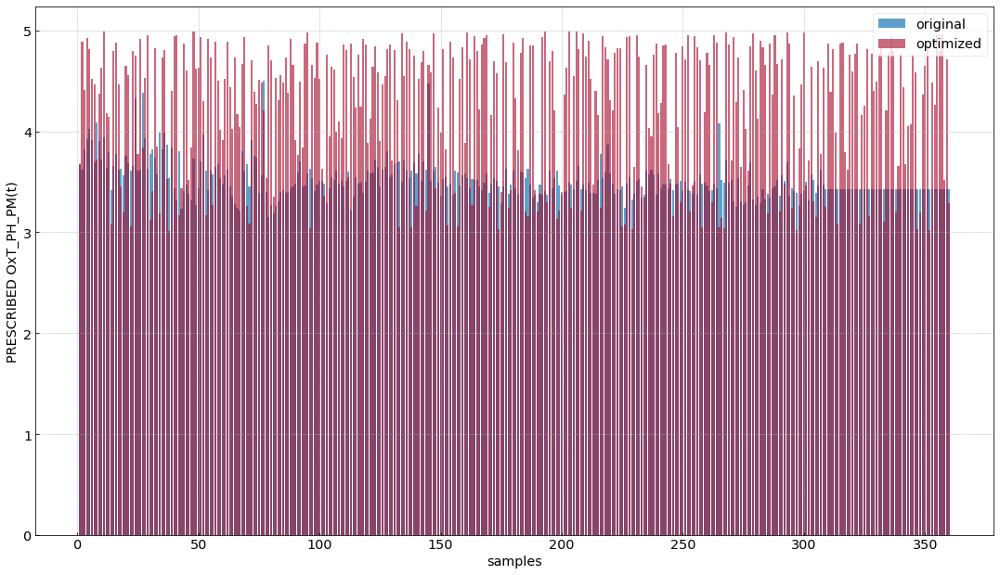

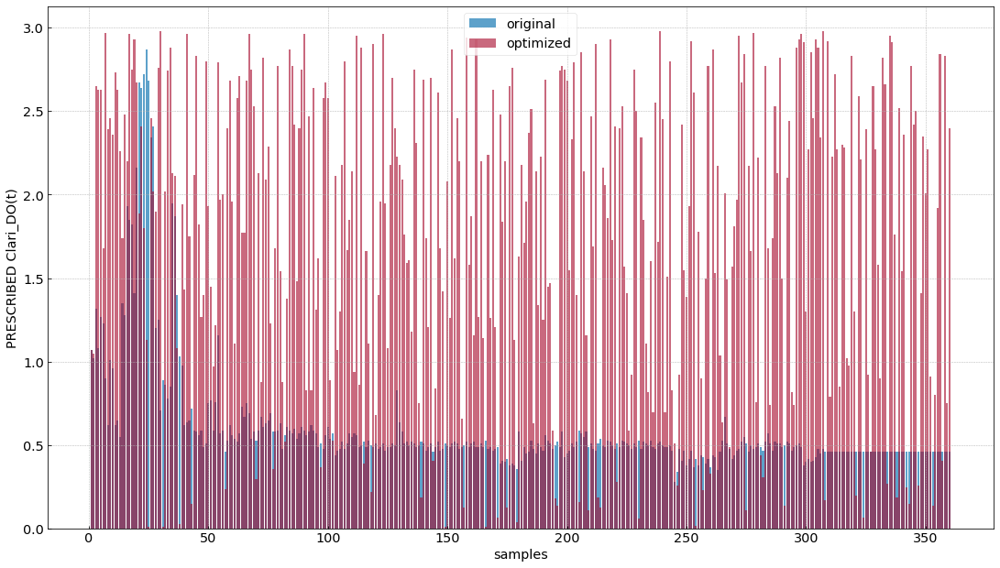

In [18]:
for point in control:
    fig, ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5, forward=True)
    cols_plot = [point[0]]
    ax.set_ylabel('PRESCRIBED '+point[0])
    ax.set_xlabel('samples')
    original = database.rf[point[0]][:index-1]
    optimized = X[point[0]]
    ax.bar(np.arange(start,len(original)+1),original, alpha=0.8,label = 'original')
    #ax.bar(np.arange(start,len(optimized)+1),optimized, bottom=original,label = 'optimized')
    ax.bar(np.arange(start,len(optimized)+1),optimized, alpha=0.6,label = 'optimized')
    ax.legend()

In [19]:
def pred(model,data_rf,data_trans_rf,index=1):
    values = []
    model.diff = .0
    if model.option == 2:
        model.once = False
    for i in range(index,len(data_rf)):
        nor_sample = data_trans_rf[i:i+1]
        or_sample = data_rf[i-1:i+1]
        if model.option == 1:
            Value_opt = model.prediction(nor_sample[model.model_input])
            ans = model.trans(Value_opt)
        elif model.option == 2:
            Value_opt = model.prediction(nor_sample[model.model_input])
            ans = model.trans(Value_opt)
        else:
            Value_opt = model.prediction(nor_sample[model.model_input])
            F = np.float(or_sample[['Flow_to_EQ(t)']].values[1])*np.float(or_sample[['EQ_COD(t)']].values[1])/1000.0
            M = 700.0*model.trans(Value_opt)/1000.0
            F_M = F/M
            ans = F_M
        values.append(ans)
    return values

In [20]:
def graph(model,X,original,optimized,cols_plot):
    fig, ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5, forward=True)
    ax.plot(original, label = 'original')
    ax.plot(optimized, label = 'optimized')
    ax.legend()
    ax.set_title(model.V_opt)
    ax.set_xlabel('samples')
    ax.set_ylabel('mg/L')
    return original

In [21]:
def metric(original,optimized):
    DIF = (sum(original) - sum(optimized))*100/sum(original)
    print('Difference original - optimized:')
    print(DIF,"%")

In [22]:
def two_series2df(data):
    df = pd.concat(data,axis=1)
    return df

Difference original - optimized:
16.85945753339336 %
Difference original - optimized:
9.822184269746163 %
Difference original - optimized:
-25.43883268632793 %


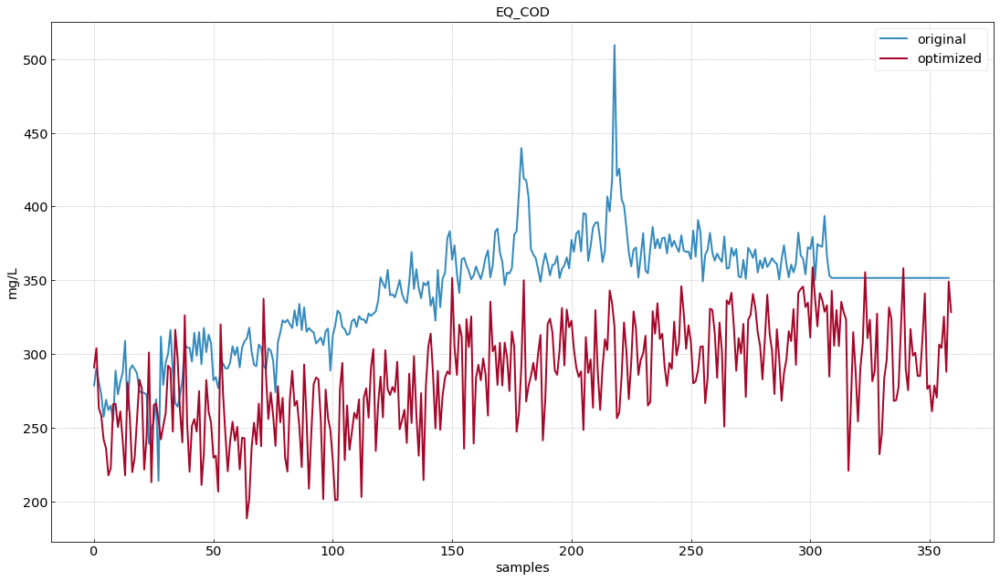

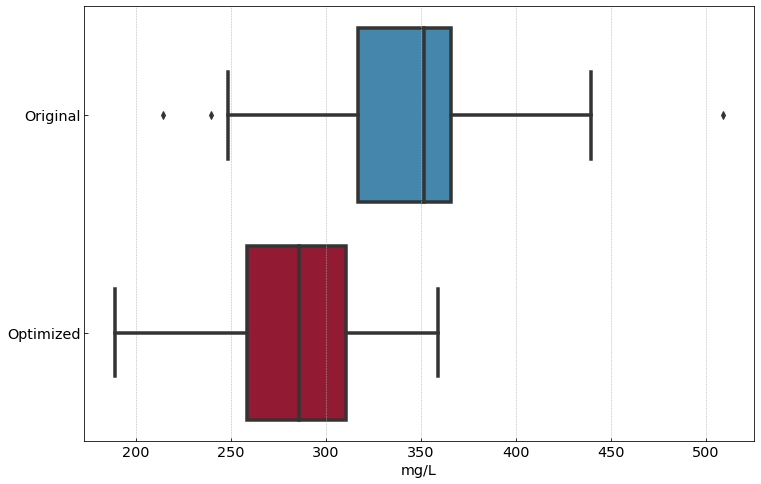

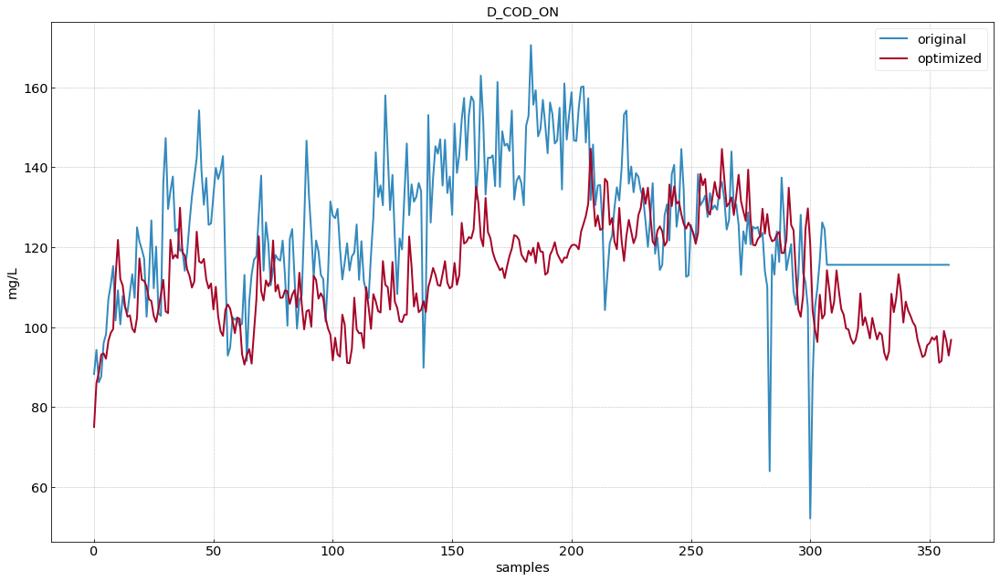

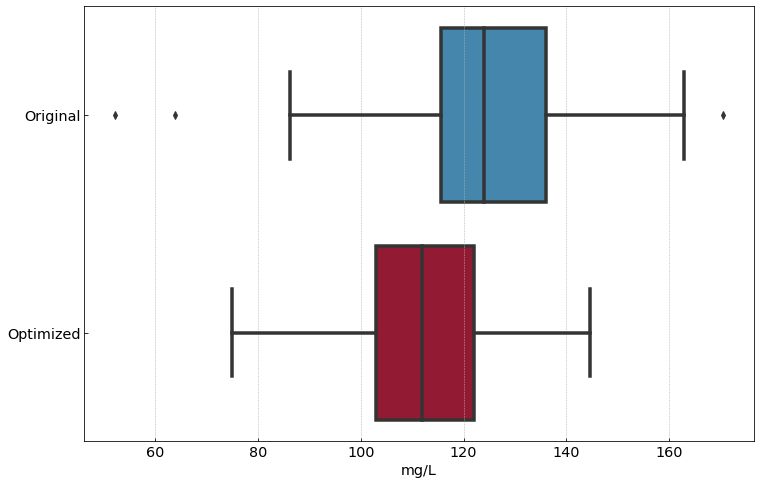

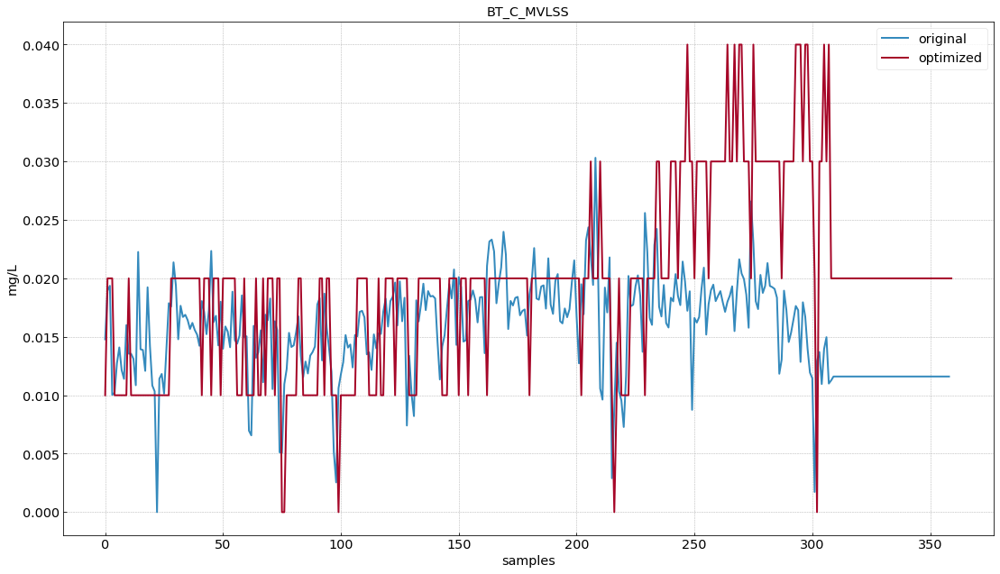

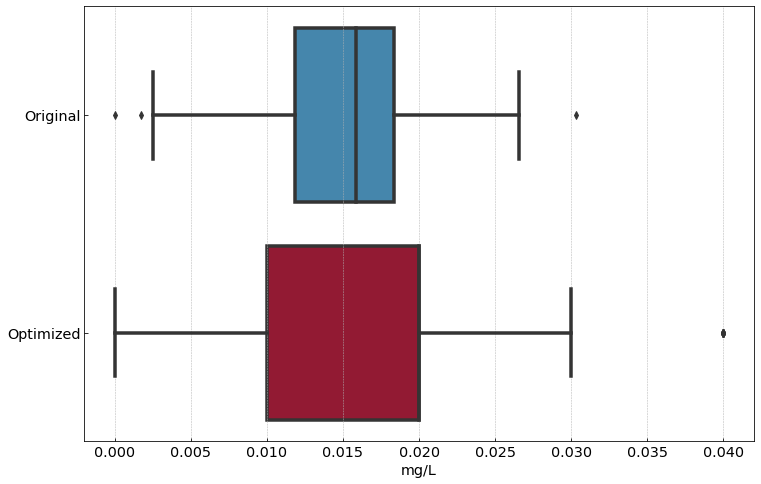

In [23]:
originals=[]
optimized = []
for model in models:
    if model.option<=2: 
        cols_plot = model.V_opt+'(t)'
    else:
        cols_plot = 'F/M'+'(t)'
    optimized = X[cols_plot].values
    original = pred(model,database.rf[:index-1],database.trans_rf[:index-1])
    originals.append(graph(model,X,original,optimized,cols_plot))
    metric(original,optimized)
    data = {"Original": pd.Series(original), 
        "Optimized": pd.Series(optimized)}
    comp_df = two_series2df(data)
    plt.figure()
    sns.boxplot(data = comp_df, orient="h", linewidth=3.5).set(xlabel='mg/L')

In [24]:
database.opt_rf.to_csv(index=True)
compression_opts = dict(method='zip',
                        archive_name='null_data_2018+EQ_1_2_1_Total.csv')  
database.opt_rf.to_csv('null_data_2018+EQ_1_2_1_Total.zip', index=True,
          compression=compression_opts)